<a href="https://colab.research.google.com/github/VKSi/2020_10_GD_CreditDefaultsPrediction_Project/blob/main/VS_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Конспект обработки ВС

### Постановка задачи<a class="anchor" id="task"></a>

### Примерное описание этапов выполнения курсового проекта<a class="anchor" id="course_project_steps"></a>

**Построение модели классификации**
1. Обзор обучающего датасета
2. Обработка выбросов
3. Обработка пропусков
4. Анализ данных
5. Отбор признаков
6. Балансировка классов
7. Подбор моделей, получение бейзлана
8. Выбор наилучшей модели, настройка гиперпараметров
9. Проверка качества, борьба с переобучением
10. Интерпретация результатов

**Прогнозирование на тестовом датасете**
1. Выполнить для тестового датасета те же этапы обработки и постронияния признаков
2. Спрогнозировать целевую переменную, используя модель, построенную на обучающем датасете
3. Прогнозы должны быть для всех примеров из тестового датасета (для всех строк)
4. Соблюдать исходный порядок примеров из тестового датасета

**Описание датасета**

* **Home Ownership** - домовладение
* **Annual Income** - годовой доход
* **Years in current job** - количество лет на текущем месте работы
* **Tax Liens** - налоговые обременения
* **Number of Open Accounts** - количество открытых счетов
* **Years of Credit History** - количество лет кредитной истории
* **Maximum Open Credit** - наибольший открытый кредит
* **Number of Credit Problems** - количество проблем с кредитом
* **Months since last delinquent** - количество месяцев с последней просрочки платежа
* **Bankruptcies** - банкротства
* **Purpose** - цель кредита
* **Term** - срок кредита
* **Current Loan Amount** - текущая сумма кредита
* **Current Credit Balance** - текущий кредитный баланс
* **Monthly Debt** - ежемесячный долг
* **Credit Default** - факт невыполнения кредитных обязательств (0 - погашен вовремя, 1 - просрочка)

### Загрузка и очистка

**Основные действия**
- загрузка данных
- реформатирование типов данных
- работа с пропусками
- выявления и работа с некорректными данными и выбросами
- категоризация данных

In [ ]:
# !pip install xgboost
# !pip install lightgbm
# !pip install catboost
# !pip install imblearn

In [ ]:
import numpy as np
import pandas as pd
import scipy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import re
import pickle
import warnings

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, VotingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, SCORERS, recall_score, precision_score, confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, cross_val_score
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as SM_Pipeline

%matplotlib inline
warnings.filterwarnings('ignore')
np.random.seed(37)

#### Загрузка данных

In [ ]:
df_train = pd.read_csv('course_project_train.csv')
df_test = pd.read_csv('course_project_test.csv')

In [ ]:
df_train.iloc[:, :-1].shape

(7500, 16)

In [ ]:
df_test.shape

(2500, 16)

In [ ]:
df_union = pd.concat([df_train.iloc[:, :-1], df_test], axis=0, ignore_index=True)
df_union.shape

(10000, 16)

In [ ]:
df_union.tail()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
9995,Home Mortgage,1020053.0,10+ years,0.0,14.0,29.1,559152.0,1.0,68.0,1.0,debt consolidation,Short Term,99999999.0,162735.0,15046.0,745.0
9996,Home Mortgage,NaN,2 years,0.0,15.0,17.0,1737780.0,0.0,77.0,0.0,debt consolidation,Short Term,468512.0,1439269.0,32996.0,NaN
9997,Home Mortgage,1171806.0,2 years,0.0,48.0,12.8,1706430.0,0.0,NaN,0.0,debt consolidation,Short Term,430496.0,676438.0,36912.0,695.0
9998,Rent,723520.0,10+ years,0.0,14.0,28.8,945780.0,0.0,NaN,0.0,debt consolidation,Short Term,257774.0,391248.0,13506.0,744.0
9999,Rent,1694439.0,10+ years,0.0,12.0,18.4,1199748.0,1.0,72.0,0.0,debt consolidation,Long Term,763004.0,559531.0,23440.0,6820.0


In [ ]:
df_union.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                10000 non-null  object 
 1   Annual Income                 7930 non-null   float64
 2   Years in current job          9543 non-null   object 
 3   Tax Liens                     10000 non-null  float64
 4   Number of Open Accounts       10000 non-null  float64
 5   Years of Credit History       10000 non-null  float64
 6   Maximum Open Credit           10000 non-null  float64
 7   Number of Credit Problems     10000 non-null  float64
 8   Months since last delinquent  4561 non-null   float64
 9   Bankruptcies                  9983 non-null   float64
 10  Purpose                       10000 non-null  object 
 11  Term                          10000 non-null  object 
 12  Current Loan Amount           10000 non-null  float64
 13  Cu

#### Посмотрим на таргет

In [ ]:
df_train['Credit Default'].value_counts()

0    5387
1    2113
Name: Credit Default, dtype: int64

Выборка достаточно разбалансированна. Нужно будет это учитывать при построении модели.

#### Изменим тип категориальных признаков на строковый

In [ ]:
def tr_01(data):
    for colname in ['Home Ownership', 'Purpose', 'Term']:
        data[colname] = data[colname].astype(str)
    return data, "Изменение типа категориальных признаков на строковый"

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_01(data)

#### Заменим строковые значения признака 'Years in current job' на целочисленные

In [ ]:
df_union['Years in current job'].value_counts()

10+ years    3142
2 years       917
3 years       848
< 1 year      770
5 years       685
1 year        657
4 years       621
6 years       563
7 years       536
8 years       446
9 years       358
Name: Years in current job, dtype: int64

In [ ]:
def years_transform(s: str):
    if '<' in s:
        s = '0'
    elif '+'in s:
        s = '12'
    else:
        s = s[0]
    return int(s)

In [ ]:
def tr_02(data):
    data['Years in current job'] = data['Years in current job'].map(years_transform, na_action='ignore')
    return data, "Преобразование признака 'Years in current job' в целочисленный"

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_02(data)

In [ ]:
df_union['Years in current job'].value_counts()

12.0    3142
2.0      917
3.0      848
0.0      770
5.0      685
1.0      657
4.0      621
6.0      563
7.0      536
8.0      446
9.0      358
Name: Years in current job, dtype: int64

#### Посмотрим пропущенные и уникальные данные

In [ ]:
def show_nans(df):
    for col in df.columns:
        print(col,5*'.',': number of unique:',len(df[col].unique()),':   number of nan records: ',df[col].isna().sum())
        print(30*'-')

In [ ]:
show_nans(df_train)

Home Ownership ..... : number of unique: 4 :   number of nan records:  0
------------------------------
Annual Income ..... : number of unique: 5479 :   number of nan records:  1557
------------------------------
Years in current job ..... : number of unique: 12 :   number of nan records:  371
------------------------------
Tax Liens ..... : number of unique: 8 :   number of nan records:  0
------------------------------
Number of Open Accounts ..... : number of unique: 39 :   number of nan records:  0
------------------------------
Years of Credit History ..... : number of unique: 408 :   number of nan records:  0
------------------------------
Maximum Open Credit ..... : number of unique: 6963 :   number of nan records:  0
------------------------------
Number of Credit Problems ..... : number of unique: 8 :   number of nan records:  0
------------------------------
Months since last delinquent ..... : number of unique: 90 :   number of nan records:  4081
----------------------------

In [ ]:
show_nans(df_test)

Home Ownership ..... : number of unique: 4 :   number of nan records:  0
------------------------------
Annual Income ..... : number of unique: 1930 :   number of nan records:  513
------------------------------
Years in current job ..... : number of unique: 12 :   number of nan records:  86
------------------------------
Tax Liens ..... : number of unique: 8 :   number of nan records:  0
------------------------------
Number of Open Accounts ..... : number of unique: 35 :   number of nan records:  0
------------------------------
Years of Credit History ..... : number of unique: 345 :   number of nan records:  0
------------------------------
Maximum Open Credit ..... : number of unique: 2435 :   number of nan records:  0
------------------------------
Number of Credit Problems ..... : number of unique: 8 :   number of nan records:  0
------------------------------
Months since last delinquent ..... : number of unique: 84 :   number of nan records:  1358
------------------------------

Признаки с пропущенными значениями в тренировочном и тестовом датасетах совпадают

Количество уникальных значений для категориальных признаков на тесте не больше чем на трэйне

#### Визуализируем распределения признаков

In [ ]:
df_train.columns

Index(['Home Ownership', 'Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Number of Credit Problems',
       'Months since last delinquent', 'Bankruptcies', 'Purpose', 'Term',
       'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt',
       'Credit Score', 'Credit Default'],
      dtype='object')

In [ ]:
cat_cols =['Home Ownership', 'Purpose', 'Term']
TARGET = ['Credit Default']
cont_cols = list(set(df_union.columns) - set(cat_cols))

In [ ]:
cont_cols

['Years of Credit History',
 'Current Loan Amount',
 'Tax Liens',
 'Months since last delinquent',
 'Maximum Open Credit',
 'Annual Income',
 'Bankruptcies',
 'Number of Open Accounts',
 'Credit Score',
 'Current Credit Balance',
 'Monthly Debt',
 'Number of Credit Problems',
 'Years in current job']

##### Непрерывные признаки

In [ ]:
# Визуальное изучение распределений - пользовательская функция
def plot_outliers(df_train, df_test, col_name, hist = False):
    fig, ax = plt.subplots(1,3,figsize=(16,5))
    #ax[0].set_title(f'KDE for both datasets on {col_name}')
    ax[1].set_title('Train Dataset')
    ax[2].set_title('Test Dataset')
    sns.distplot(df_train[col_name], color='b', ax=ax[0], hist=hist, label='Train')
    sns.distplot(df_test[col_name], color='r', ax=ax[0], hist=hist, label='Test')
    sns.boxplot(df_train[col_name], ax=ax[1])
    sns.boxplot(df_test[col_name], color='r', ax=ax[2])
    plt.show()

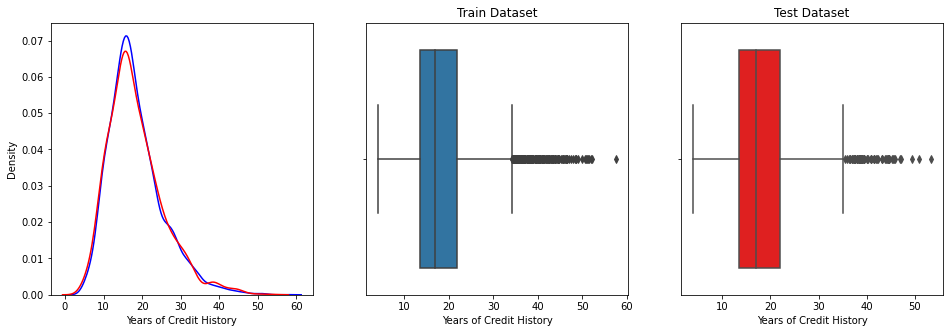

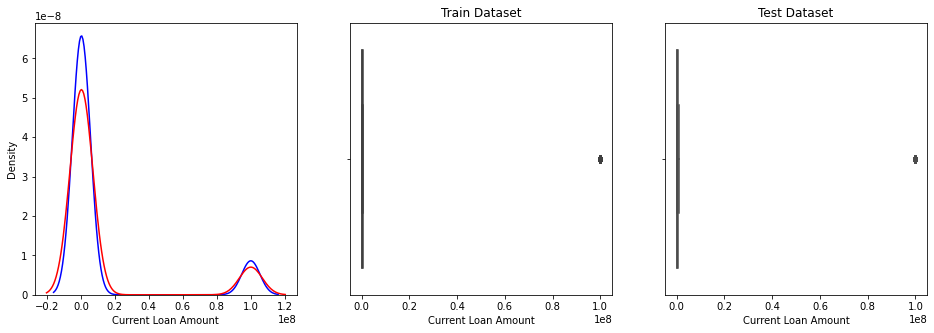

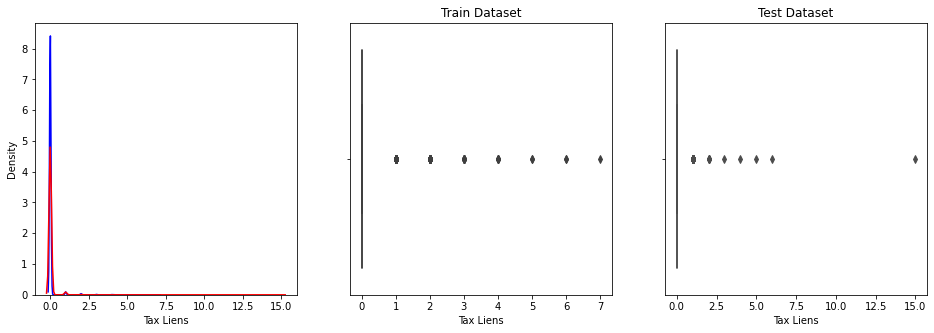

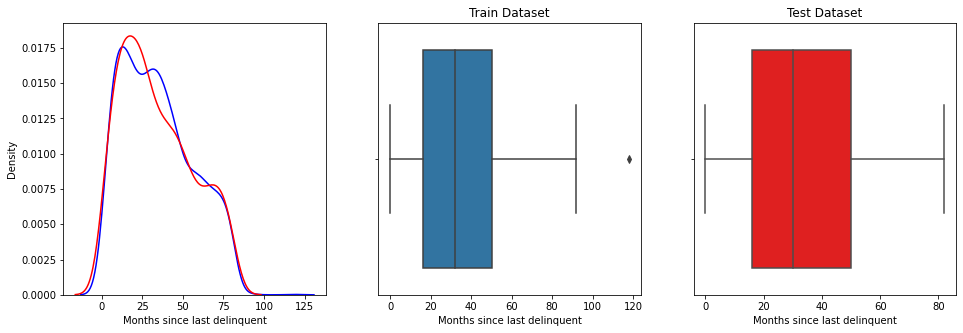

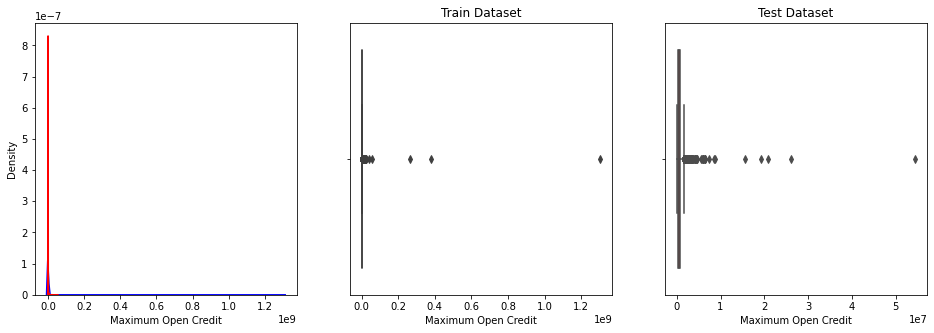

...

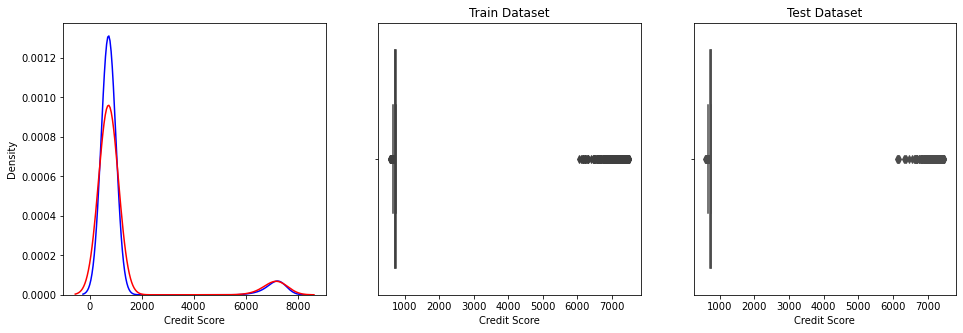

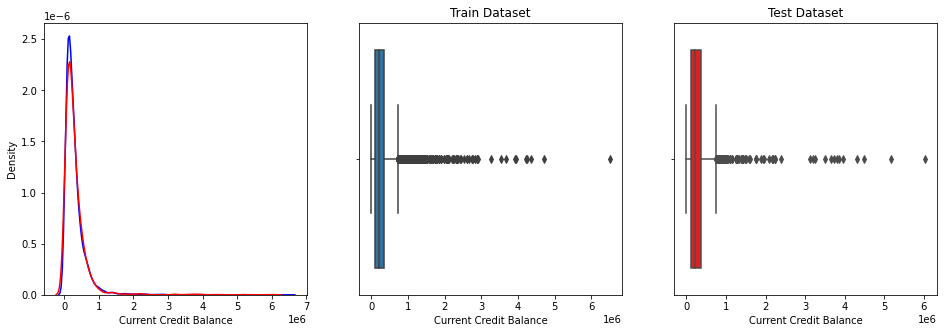

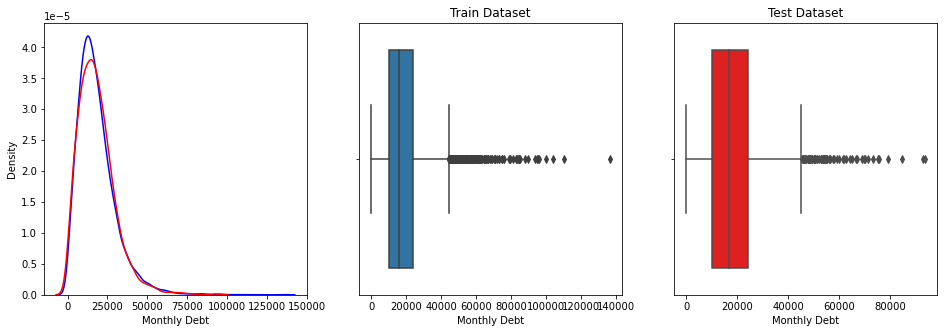

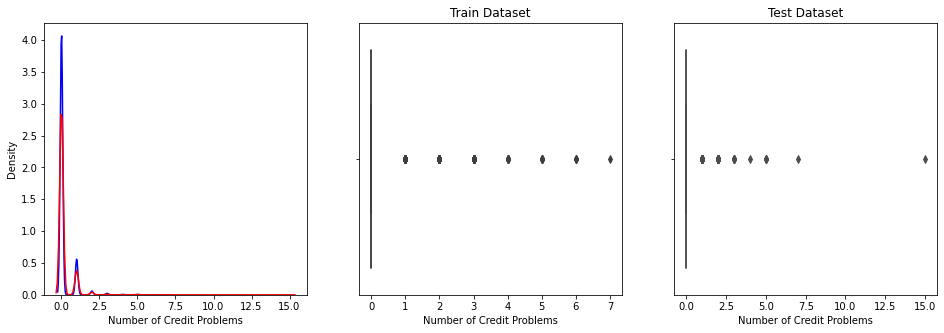

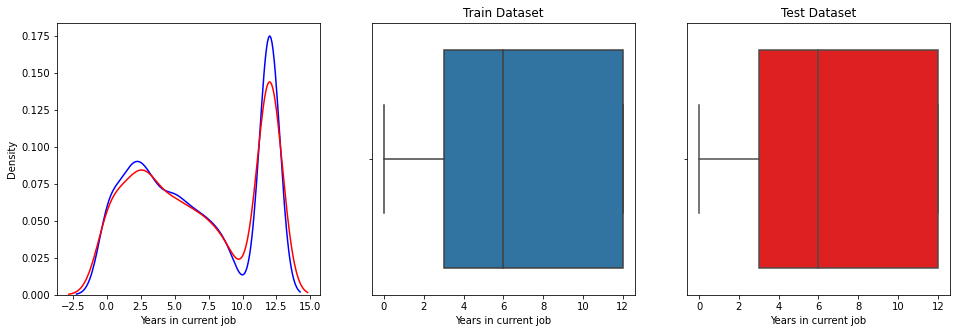

In [ ]:
# Визуальное изучение распределений - непрерывные данные

for col in cont_cols:
    plot_outliers(df_train, df_test, col)

В целом гистограммы однородны и похожи у датасетов    
Есть выбросы с которыми нужно разбираться

##### Категориальные признаки
 исследуем категориальные данные на предмет полноты в обоих выборках

In [ ]:
def plot_outliers_cat(df_train,df_test, col_name,  TARGET_NAME = TARGET):
    fig, ax = plt.subplots(1,2,figsize=(16,5))
   
    ax[0].set_title('Train Dataset')
    ax[1].set_title('Test Dataset')   

    sns.countplot(x=col_name, data=df_train, ax=ax[0]);
    sns.countplot(x=col_name, data=df_test, ax=ax[1]);
    plt.show()

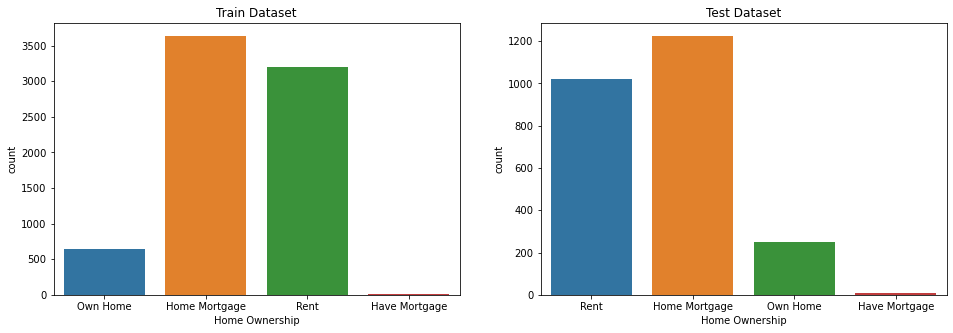

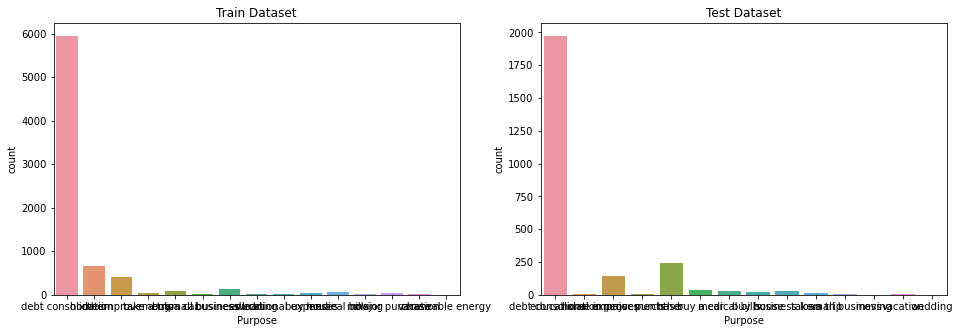

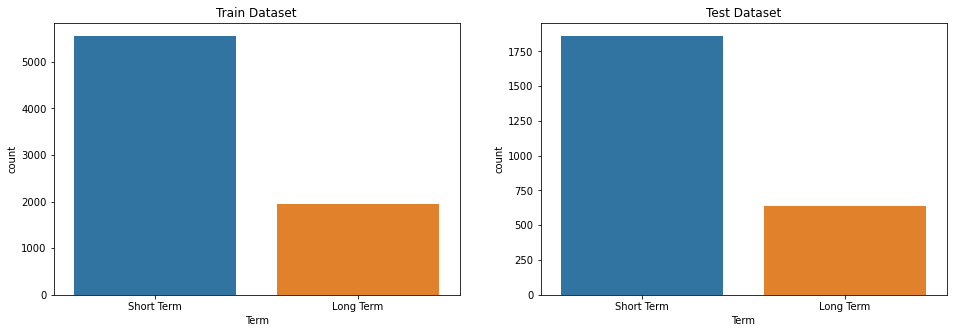

In [ ]:
for col in cat_cols:
    plot_outliers_cat(df_train, df_test, col, TARGET_NAME = TARGET)

In [ ]:
df_train['Purpose'].value_counts()/df_train.shape[0]

debt consolidation      0.792533
other                   0.088667
home improvements       0.054933
business loan           0.017200
buy a car               0.012800
medical bills           0.009467
major purchase          0.005333
take a trip             0.004933
buy house               0.004533
small business          0.003467
wedding                 0.002000
moving                  0.001467
educational expenses    0.001333
vacation                0.001067
renewable energy        0.000267
Name: Purpose, dtype: float64

In [ ]:
df_test['Purpose'].value_counts()/df_test.shape[0]

debt consolidation      0.7892
other                   0.0960
home improvements       0.0560
buy a car               0.0136
business loan           0.0120
medical bills           0.0108
buy house               0.0076
take a trip             0.0056
major purchase          0.0036
small business          0.0020
educational expenses    0.0012
vacation                0.0012
wedding                 0.0008
moving                  0.0004
Name: Purpose, dtype: float64

In [ ]:
len(list(set(df_test['Purpose'].unique()) - set(df_train['Purpose'].unique())))

0

In [ ]:
list(set(df_train['Purpose'].unique()) - set(df_test['Purpose'].unique()))

['renewable energy']

In [ ]:
(df_train['Purpose'] == 'renewable energy').sum()

2

Распределения достаточно похожи. Значения категорий в тесте, отсутствующих на трейне нет.
В трейне присутствует категория 'renewable energy', которой нет в тесте. Так как всего два значения, предлагается удалить.

In [ ]:
def tr_03(data):
    data = data[data['Purpose'] != 'renewable energy']
    return data, "Удаление наблюдений для 'Purpose' == 'renewable energy'"

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_03(data)

#### Months since last delinquent

Количество пропущенных признаков  Months since last delinquent  4561, то есть почти половина от всех наблюдений.

Проверим, может ли это быть связано с "обоснованными" попусками. Например, данные о количестве месяцев с даты последнего нарушения могут отсутствовать у клиентов, у которых нарушения не было вообще.

In [ ]:
df_union[df_union['Months since last delinquent'].isnull()].shape[0]/df_union.shape[0]

0.5439

In [ ]:
df = df_union[df_union['Months since last delinquent'].isnull()]

In [ ]:
df_union.describe()

,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
count,7.930000e+03,9543.000000,10000.000000,10000.00000,10000.000000,1.000000e+04,10000.00000,4561.000000,9983.000000,1.000000e+04,1.000000e+04,10000.000000,7930.000000
mean,1.366525e+06,6.556429,0.031400,11.14430,18.319580,8.865079e+05,0.16800,34.564569,0.114595,1.194381e+07,2.914741e+05,18303.675600,1171.992182
std,8.638276e+05,4.406952,0.304341,4.89476,7.095357,1.389982e+07,0.51459,21.771990,0.349729,3.200878e+07,3.339979e+05,11831.647516,1639.812951
min,1.065330e+05,0.000000,0.000000,1.00000,3.900000,0.000000e+00,0.00000,0.000000,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000
25%,8.459892e+05,3.000000,0.000000,8.00000,13.500000,2.788115e+05,0.00000,16.000000,0.000000,1.805485e+05,1.132258e+05,10059.750000,711.000000
50%,1.168814e+06,6.000000,0.000000,10.00000,17.000000,4.781810e+05,0.00000,32.000000,0.000000,3.117180e+05,2.090190e+05,16200.000000,731.000000
75%,1.638693e+06,12.000000,0.000000,14.00000,22.000000,7.943595e+05,0.00000,50.000000,0.000000,5.210700e+05,3.619500e+05,23888.250000,743.000000
max,1.497561e+07,12.000000,15.000000,48.00000,57.700000,1.304726e+09,15.00000,118.000000,5.000000,1.000000e+08,6.506797e+06,136679.000000,7510.000000


In [ ]:
df.describe()

,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
count,4.288000e+03,5196.000000,5439.000000,5439.000000,5439.000000,5.439000e+03,5439.000000,0.0,5439.000000,5.439000e+03,5.439000e+03,5439.000000,4288.000000
mean,1.319235e+06,6.326982,0.018937,10.876448,17.419379,1.045169e+06,0.146350,NaN,0.116198,1.250043e+07,3.188638e+05,18058.413863,1165.957789
std,8.714925e+05,4.373150,0.184469,4.960880,7.069892,1.810352e+07,0.421364,NaN,0.342138,3.266041e+07,3.565437e+05,12090.803333,1622.937031
min,1.065330e+05,0.000000,0.000000,2.000000,3.900000,0.000000e+00,0.000000,NaN,0.000000,1.542200e+04,0.000000e+00,0.000000,585.000000
25%,7.981472e+05,2.000000,0.000000,7.000000,12.500000,3.026320e+05,0.000000,NaN,0.000000,1.801140e+05,1.260270e+05,9688.500000,714.000000
50%,1.135155e+06,6.000000,0.000000,10.000000,16.300000,5.295180e+05,0.000000,NaN,0.000000,3.155240e+05,2.301470e+05,15708.000000,734.000000
75%,1.591568e+06,12.000000,0.000000,13.000000,21.000000,8.681200e+05,0.000000,NaN,0.000000,5.329390e+05,4.034650e+05,23784.000000,745.000000
max,1.497561e+07,12.000000,5.000000,48.000000,53.400000,1.304726e+09,5.000000,NaN,4.000000,1.000000e+08,6.506797e+06,136679.000000,7510.000000


Проверим, есть ли значимые значения месяцев с последней просрочки для наблюдений с нулевым количеством кредитных проблем 

In [ ]:
df1 = df_union.loc[df_union['Number of Credit Problems'] == 0, ['Number of Credit Problems', 'Months since last delinquent']]

In [ ]:
df1.shape[0]

8646

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8646 entries, 1 to 9998
Data columns (total 2 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Number of Credit Problems     8646 non-null   float64
 1   Months since last delinquent  3900 non-null   float64
dtypes: float64(2)
memory usage: 202.6 KB


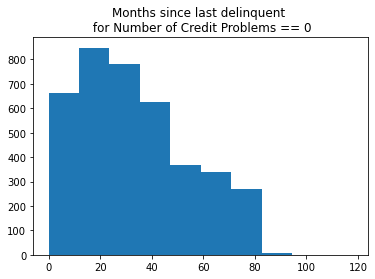

In [ ]:
plt.hist(df1['Months since last delinquent'])
plt.title('Months since last delinquent \n for Number of Credit Problems == 0')
plt.show()

К сожалению, логичная казалось бы гипотеза о том, что отсутствие кредитных проблем означает отсутствие просрочки (и следовательно незаполненное поле с количеством месяцев) не подтвердилась. Однако, попробуем ее все-таки использовать в обратную сторону.

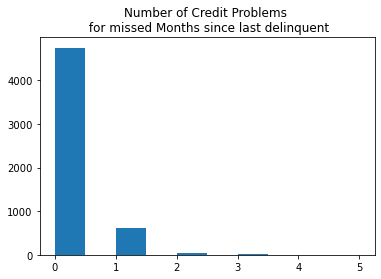

In [ ]:
plt.hist(df['Number of Credit Problems'])
plt.title('Number of Credit Problems \n for missed Months since last delinquent')
plt.show()

In [ ]:
df['Number of Credit Problems'].value_counts()

0.0    4746
1.0     620
2.0      51
3.0      16
4.0       4
5.0       2
Name: Number of Credit Problems, dtype: int64

In [ ]:
df['Number of Credit Problems'].value_counts()/df['Number of Credit Problems'].count()*100

0.0    87.258687
1.0    11.399154
2.0     0.937672
3.0     0.294172
4.0     0.073543
5.0     0.036771
Name: Number of Credit Problems, dtype: float64

Видно, что 87% данных с пропущенными значениями месяцев просрочки находятся в зоне нулевого количества кредитных проблем.

Одной из очевидных кредитных проблем является банкротство. Посмотрим связи мужду банкротством, количеством кредитных проблемм и пропущенными значениями месяцев просрочки

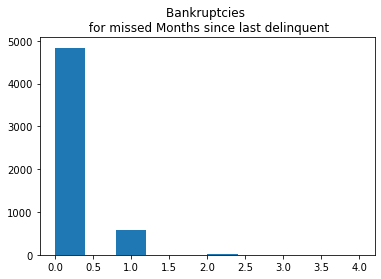

In [ ]:
plt.hist(df['Bankruptcies'])
plt.title('Bankruptcies \n for missed Months since last delinquent')
plt.show()

In [ ]:
df['Bankruptcies'].value_counts()

0.0    4837
1.0     579
2.0      18
3.0       3
4.0       2
Name: Bankruptcies, dtype: int64

Text(0.5, 0, 'Bankruptcies')

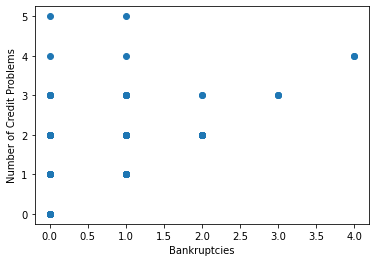

In [ ]:
plt.scatter(y = df['Number of Credit Problems'], x=df['Bankruptcies'])
plt.ylabel('Number of Credit Problems')
plt.xlabel('Bankruptcies')

Видно, что количество кредитных проблем не бывает меньше количества банкротств (что логично).
Проверим как соотносятся пропущенные значения для месяцев просрочки с количеством кредитных проблем, очищенных от количества банкротств.

Для удобства, добавим в данные новый столбец "Number of Credit Problems corrected" за минусом количества банкротств. В итоговой модели нам нужно будет удалить либо этот новый, либо оригинальный столбец, так как вместе с признаком банкротств они создают коллинеарную группу.

In [ ]:
def tr_04(data):
    data["Number of Credit Problems corrected"] = data['Number of Credit Problems'] - data['Bankruptcies']
    return data, "Создание нового признака Number of Credit Problems corrected"

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_04(data)

In [ ]:
df = df_union[df_union['Months since last delinquent'].isnull()]

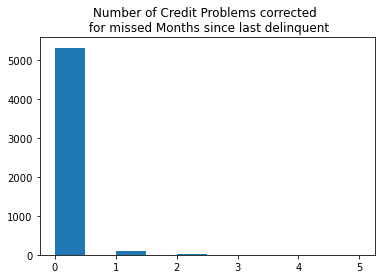

In [ ]:
plt.hist(df['Number of Credit Problems corrected'])
plt.title('Number of Credit Problems corrected \n for missed Months since last delinquent')
plt.show()

In [ ]:
df['Number of Credit Problems corrected'].value_counts()

0.0    5318
1.0      91
2.0      21
3.0       6
4.0       2
5.0       1
Name: Number of Credit Problems corrected, dtype: int64

In [ ]:
df['Number of Credit Problems corrected'].value_counts()/df['Number of Credit Problems corrected'].count()*100

0.0    97.775326
1.0     1.673102
2.0     0.386100
3.0     0.110314
4.0     0.036771
5.0     0.018386
Name: Number of Credit Problems corrected, dtype: float64

Почти 98% пропущенных значений для месяцев просрочки находятся в зоне нулевого количества кредитных проблем (минус банкротства)

Посмотрим с этой же точки зрения на Tax Liens

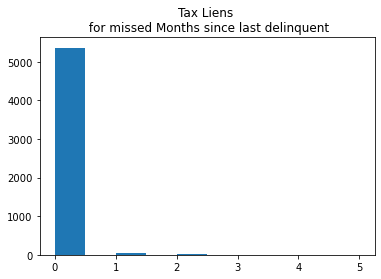

In [ ]:
plt.hist(df['Tax Liens'])
plt.title('Tax Liens \n for missed Months since last delinquent')
plt.show()

In [ ]:
df['Tax Liens'].value_counts()

0.0    5365
1.0      54
2.0      14
3.0       4
4.0       1
5.0       1
Name: Tax Liens, dtype: int64

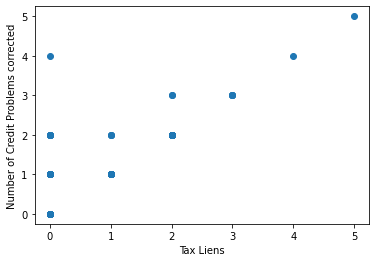

In [ ]:
plt.scatter(y = df['Number of Credit Problems corrected'], x=df['Tax Liens'])
plt.ylabel('Number of Credit Problems corrected')
plt.xlabel('Tax Liens')
plt.show()

Видно, что Tax Liens также признак учитывается в количестве кредитных проблем и может быть вычтен

In [ ]:
def tr_041(data):
    data["Number of Credit Problems corrected"] = data['Number of Credit Problems corrected'] - data['Tax Liens']
    return data, "Корректировка Number of Credit Problems corrected на Tax Liens"

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_041(data)

In [ ]:
df = df_union[df_union['Months since last delinquent'].isnull()]

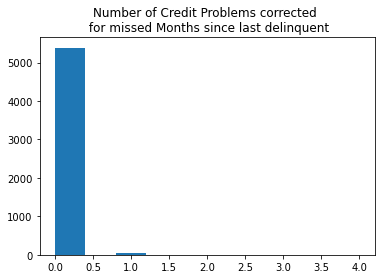

In [ ]:
plt.hist(df['Number of Credit Problems corrected'])
plt.title('Number of Credit Problems corrected \n for missed Months since last delinquent')
plt.show()

In [ ]:
df['Number of Credit Problems corrected'].value_counts()

0.0    5387
1.0      45
2.0       6
4.0       1
Name: Number of Credit Problems corrected, dtype: int64

In [ ]:
df['Number of Credit Problems corrected'].value_counts()/df['Number of Credit Problems corrected'].count()*100

0.0    99.043942
1.0     0.827358
2.0     0.110314
4.0     0.018386
Name: Number of Credit Problems corrected, dtype: float64

Более 99% пропущенных значений для месяцев просрочки находятся в зоне нулевого количества кредитных проблем (минус банкротства)

и мы можем ориентироваться на данные по отсутствию кредитных проблем как на наблюдения, по которым Количество месяцев с последней просрочки платежа не имеет смысла.   
Таким образом, количество "заполненных" данных по этому параметру можно расчитать как:

In [ ]:
(~df_union['Months since last delinquent'].isnull()).sum() + (df['Number of Credit Problems corrected'] == 0).sum()

9948

Более 99% данных о количестве месяцев с просрочки имеют смысл. Этот признак нужно оставить.

In [ ]:
df1 = df_union.loc[df_union['Number of Credit Problems corrected'] == 0, ['Number of Credit Problems corrected', 'Months since last delinquent']]

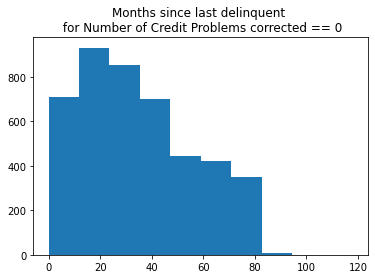

In [ ]:
plt.hist(df1['Months since last delinquent'])
plt.title('Months since last delinquent \n for Number of Credit Problems corrected == 0')
plt.show()

К сожалению, в обратную сторону гипотеза не работет даже для скорректированного количества кредитных проблемм: при нулевом количестве кредитных проблемм достаточно большое количество пропущенных значений месяцев после просрочки

Посмотрим распределение таких данных в тренировочном и тестовом сетах:

In [ ]:
df_train[df_train['Months since last delinquent'].isnull()].shape[0]/df_train.shape[0]

0.5441333333333334

In [ ]:
df_test[df_test['Months since last delinquent'].isnull()].shape[0]/df_test.shape[0]

0.5432

Распределение примерно одинаковое. Нужно понять чем будем замещать пропущенные данные.   
Посмотрим на связь с целевой переменной.

In [ ]:
df = df_train[~df_train['Months since last delinquent'].isnull()]

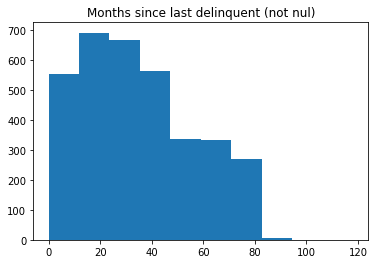

In [ ]:
plt.hist(df['Months since last delinquent'])
plt.title('Months since last delinquent (not nul)')
plt.show()

In [ ]:
df.loc[df['Months since last delinquent']>80, 'Months since last delinquent'].value_counts()

81.0     19
82.0      4
83.0      3
92.0      1
91.0      1
84.0      1
118.0     1
86.0      1
Name: Months since last delinquent, dtype: int64

Поработаем с выборкой данных, с неединичными наблюдениями

In [ ]:
df = df[df['Months since last delinquent']<=83]

In [ ]:
df1 = df.groupby('Months since last delinquent')['Credit Default'].sum()/df.groupby('Months since last delinquent')['Credit Default'].count()

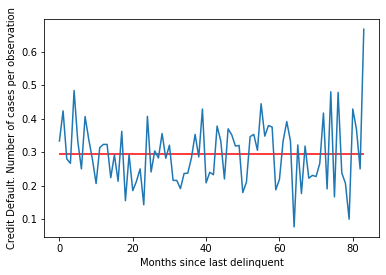

In [ ]:
df1.plot()
plt.ylabel('Credit Default. Number of cases per observation')
plt.hlines(df1.mean(), xmin=0, xmax=83, color = 'r')
plt.show()

In [ ]:
df1.mean()

0.29444603641832173

In [ ]:
df1 =  df1.reset_index(level=0) 

In [ ]:
df1.corr()

,Months since last delinquent,Credit Default
Months since last delinquent,1.000000,0.046442
Credit Default,0.046442,1.000000


Линейная связь с целевой переменной мала и скорее всего связана с последним выбросом.

Попробуем посмотреть связь с кредитным балом (скоринг). Но для этого сначала нужно разобраться с данными по самому скорингу

#### Credit Score (not null)

In [ ]:
df_union['Credit Score'].isnull().sum()

2070

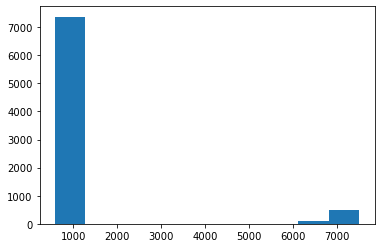

In [ ]:
plt.hist(df_union['Credit Score'])
plt.show()

Скорее всего скоринг больше 6000 связан с лишним нулем.

In [ ]:
df = df_union[df_union['Credit Score'] > 850]

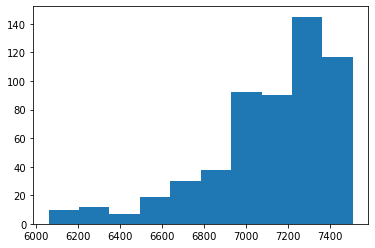

In [ ]:
plt.hist(df['Credit Score'])
plt.show()

In [ ]:
(df['Credit Score']%10 != 0).sum()

0

Действительно, все большие значения содержат 0 в единичном разряде.
Разелим все большие кредитные баллы на 10 без остатка

### transformation_05
'Деление на 10 без остатка Credit Score > 850

In [ ]:
def tr_05(data):
    data.loc[(~data['Credit Score'].isnull()) & (data['Credit Score'] > 850), 'Credit Score'] = data['Credit Score'] // 10
    return data, 'Деление на 10 без остатка Credit Score > 850'

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_05(data)

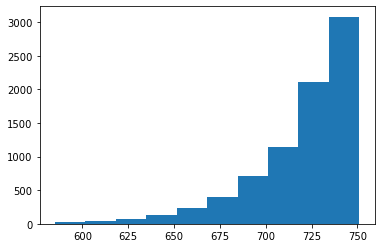

In [ ]:
plt.hist(df_union['Credit Score'])
plt.show()

С пропущенными значениями разберемся позже

#### Months since last delinquent (continue)

Вернемся сейчас к Months since last delinquent

In [ ]:
df = df_union[~df_union['Months since last delinquent'].isnull()]
df = df[df['Months since last delinquent']<=83]

In [ ]:
df1 = df.groupby('Credit Score')['Months since last delinquent'].mean().reset_index(level=0)

In [ ]:
m, b = np.polyfit(df1['Credit Score'], df1['Months since last delinquent'], 1)

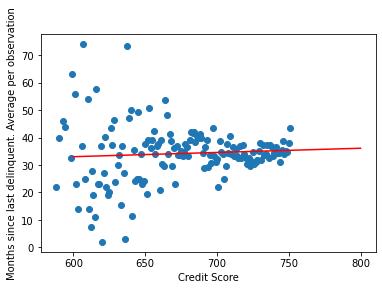

In [ ]:
plt.scatter(x=df1['Credit Score'], y= df1['Months since last delinquent'])
plt.xlabel('Credit Score')
plt.ylabel('Months since last delinquent. Average per observation')
x = np.array([600, 800])
plt.plot(x, m*x + b, color = 'r')
plt.show()

In [ ]:
df1.corr()

,Credit Score,Months since last delinquent
Credit Score,1.000000,0.066362
Months since last delinquent,0.066362,1.000000


Видно, что более высокий кредитный рейтинг соответствует в среднем большему количеству месяцев после просрочки. При этом снижается разброс значений

In [ ]:
df1['Credit Score'].mean()

674.6842105263158

In [ ]:
df1 = df_union[df_union['Months since last delinquent'].isnull()]

In [ ]:
df1['Credit Score'].median()

731.0

In [ ]:
df1['Credit Score'].mean()

722.1180037313433

Видно также, что кредитный рейтинг для наблюдений с пропущенными значениями месяцев просрочки выше, чем в целом по набору, что поддерживает нашу гипотезу о том, что пропущенные значения связаны с отсутствием просрочки.

Считаю разумным заполнить все пропущенные значения медианой для скорбала больше 725, создав дополнительную переменную - пропуск значения. Так как стопроцентное соответствие не подтвердилось, при отработки модели можно пробовать запускать ее и с этой трансформацией и без нее (с удалением этого параметра).

In [ ]:
def tr_06(data, train = False):
    
    filter = data['Months since last delinquent'].isnull()
    data['Months missed'] = False
    data.loc[filter, 'Months missed'] = True
    
    filter_1 = (~filter) & (data['Credit Score'] > 725)
    if train:
        par_tr_06 = data.loc[filter_1, 'Months since last delinquent'].median()
        with open('par_tr_06.pkl', 'wb') as f:
            pickle.dump(par_tr_06, f)
    else:
        with open('par_tr_06.pkl', 'rb') as f:
            par_tr_06 = pickle.load(f) 
        
    data.loc[filter, 'Months since last delinquent'] = par_tr_06
    
    return data, 'Создание параметра Months missed и заполнение пропущенных значений Months since last delinquent медианой для наблюдений со скорбалом > 725'

In [ ]:
df_train, _ = tr_06(df_train, train = True)
for data in [df_test, df_union]:
    data, _ = tr_06(data)

In [ ]:
df_union['Months since last delinquent'].isnull().sum()

0

#### Заполнение остальных пропусков

In [ ]:
def rf_features_imputer(data, feature_target: str, features: list, train: bool = False, int_target = False):
    
    features_nan = [col for col in data.columns if data[col].isnull().sum()]
    feature_pred = list(set(features) - set([feature_target]) - set(features_nan))
    
    if train:
        scx_ = StandardScaler()
        scy_ = StandardScaler()

        xdf_train = data.loc[(data[feature_target].isna() == False),feature_pred].copy()
        xdf_test = data.loc[(data[feature_target].isna() == True),feature_pred].copy()
        ydf_train = data.loc[(data[feature_target].isna() == False),feature_target].copy()

        # нормирование
        xdf_trainS = scx_.fit_transform(xdf_train)
        xdf_testS = scx_.transform(xdf_test)

        ydf_trainS = scy_.fit_transform(ydf_train.values.reshape( -1,1))

        # заполнение пробелов по регресиии случайного леса
        rf_target = RandomForestRegressor()

        rf_target = rf_target.fit(xdf_trainS, ydf_trainS)
        y_testS = rf_target.predict(xdf_testS)

        y_test = scy_.inverse_transform(y_testS.reshape(-1,1))
        if int_target:
            data.loc[(data[feature_target].isna() == True),feature_target]=y_test[:,0].round().astype(int)
        else:
            data.loc[(data[feature_target].isna() == True),feature_target]=y_test[:,0]

        with open(f'imputer_scaler_x_{feature_target}.pkl', 'wb') as file:
            pickle.dump(scx_, file)
        with open(f'imputer_scaler_y_{feature_target}.pkl', 'wb') as file:
            pickle.dump(scy_, file)
        with open(f'imputer_regress_xy_{feature_target}.pkl', 'wb') as file:
            pickle.dump(rf_target, file)
        
        if int_target:
            y_t = rf_target.predict(xdf_trainS).round().astype(int)
        else:
            y_t = rf_target.predict(xdf_trainS)
        plt.plot(y_t, ydf_trainS,'.')
        plt.title(f'Оценка регресиии {feature_target}')
        plt.show()
        
    else:
        xdf_test = data.loc[(data[feature_target].isna() == True), feature_pred].copy()
        with open(f'imputer_scaler_x_{feature_target}.pkl', 'rb') as file:
            scx_ = pickle.load(file)
        with open(f'imputer_scaler_y_{feature_target}.pkl', 'rb') as file:
            scy_ = pickle.load(file)
        with open(f'imputer_regress_xy_{feature_target}.pkl', 'rb') as file:
            rf_target = pickle.load(file)
        
        xdf_testS = scx_.transform(xdf_test)
        y_testS = rf_target.predict(xdf_testS)

        y_test = scy_.inverse_transform(y_testS.reshape(-1,1))
        if int_target:
            data.loc[(data[feature_target].isna() == True),feature_target]=y_test[:,0].round().astype(int)
        else:
            data.loc[(data[feature_target].isna() == True),feature_target]=y_test[:,0]
    
    return data

In [ ]:
def tr_07(data, train= False):
    features = ['Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Months since last delinquent', 'Bankruptcies',
       'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt',
       'Credit Score', 'Number of Credit Problems corrected', 'Months missed']
    feature_targets = ['Annual Income', 'Credit Score']
    for feature_target in feature_targets:
        data = rf_features_imputer(data=data, feature_target=feature_target, features=features, train=train)
    return data, f'Заполнение пропусков для признаков {feature_targets} прогнозированием с помощью случайного леса'

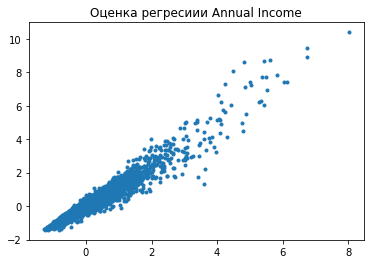

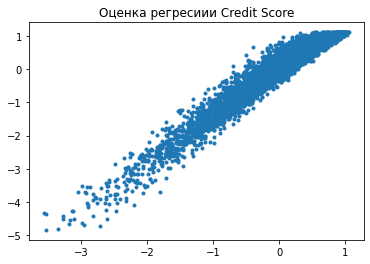

In [ ]:
df_train, _ = tr_07(df_train, train = True)
for data in [df_test, df_union]:
    data, _ = tr_07(data)

In [ ]:
def tr_08(data, train= False):
    features = ['Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Months since last delinquent', 'Bankruptcies',
       'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt',
       'Credit Score', 'Number of Credit Problems corrected', 'Months missed']
    feature_targets = ['Years in current job', 'Bankruptcies', 'Number of Credit Problems corrected']
    for feature_target in feature_targets:
        data = rf_features_imputer(data=data, feature_target=feature_target, features=features, train=train, int_target = True)
    return data, f'Заполнение пропусков для признаков {feature_targets} прогнозированием с помощью случайного леса'

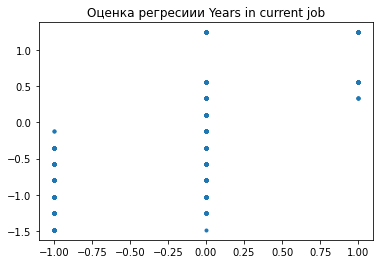

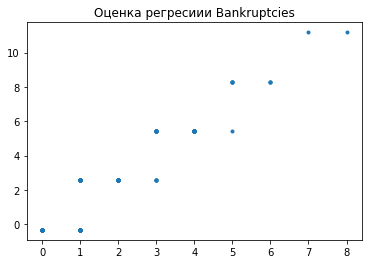

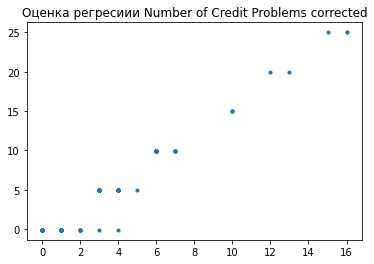

In [ ]:
df_train, _ = tr_08(df_train, train = True)
for data in [df_test, df_union]:
    data, _ = tr_08(data)

Нужно поменять все возникшие отрицательные значения на 0

In [ ]:
def tr_09(data):
    feature_targets = ['Years in current job', 'Bankruptcies', 'Number of Credit Problems corrected']
    for feature_target in feature_targets:
        data.loc[data[feature_target] < 0, feature_target] = 0
    return data, f'Замена отрицательных значений для признаков {feature_targets} нулем'

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_09(data)

#### Поработаем с выбросами

Посмотрим на признаки после замены пропущенных значений

In [ ]:
cont_cols

['Years of Credit History',
 'Current Loan Amount',
 'Tax Liens',
 'Months since last delinquent',
 'Maximum Open Credit',
 'Annual Income',
 'Bankruptcies',
 'Number of Open Accounts',
 'Credit Score',
 'Current Credit Balance',
 'Monthly Debt',
 'Number of Credit Problems',
 'Years in current job']

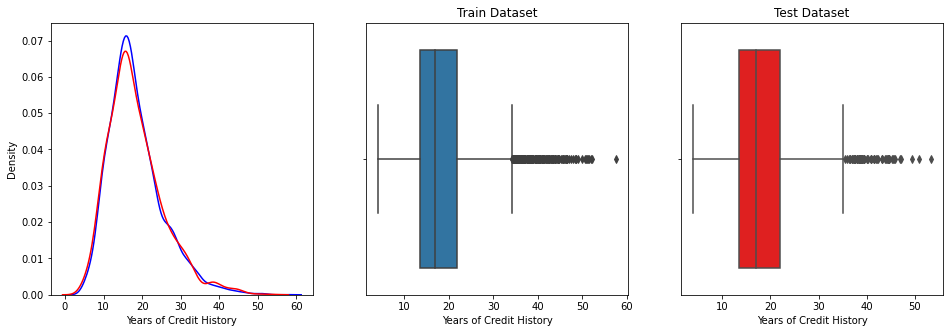

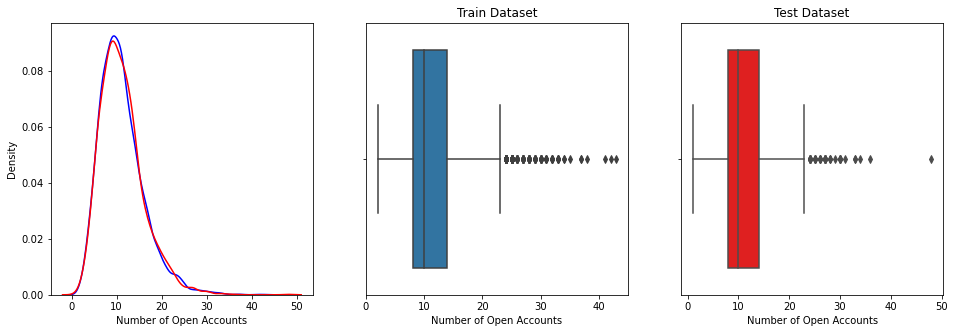

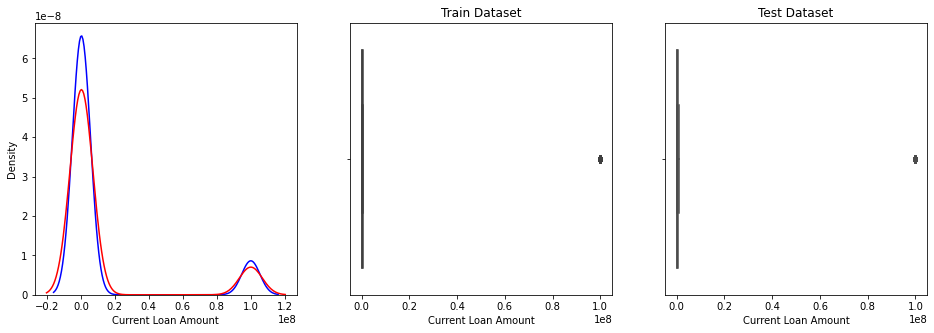

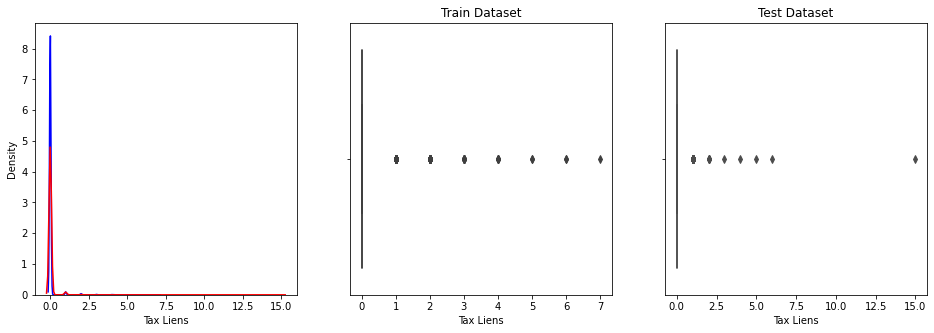

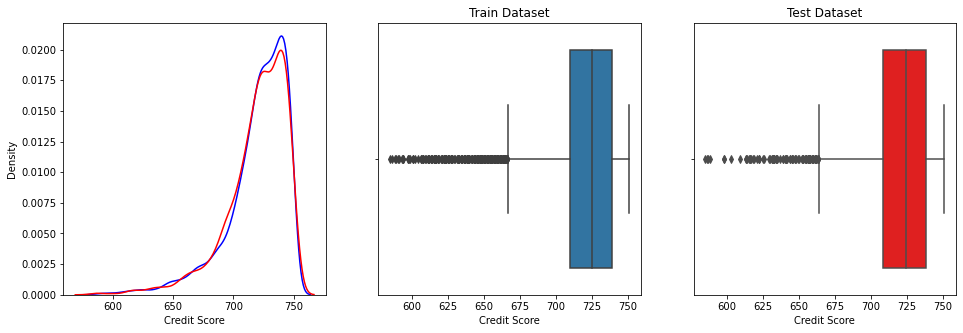

...

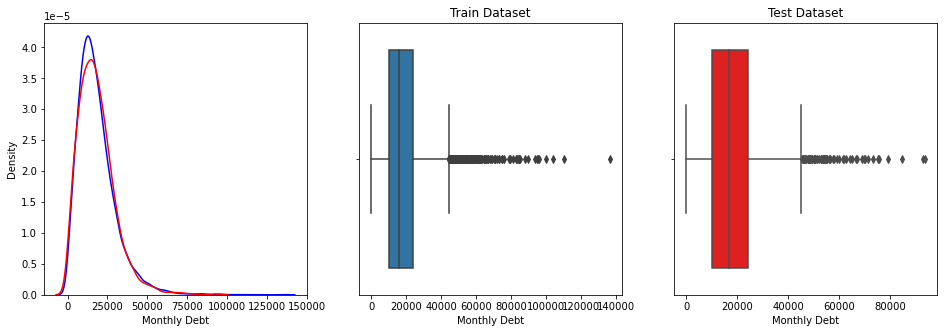

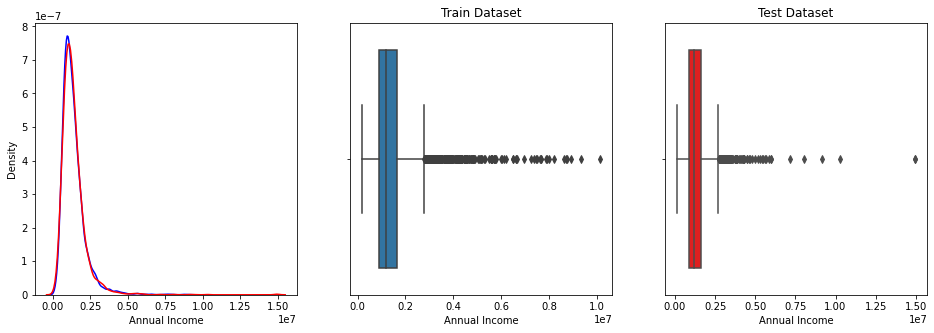

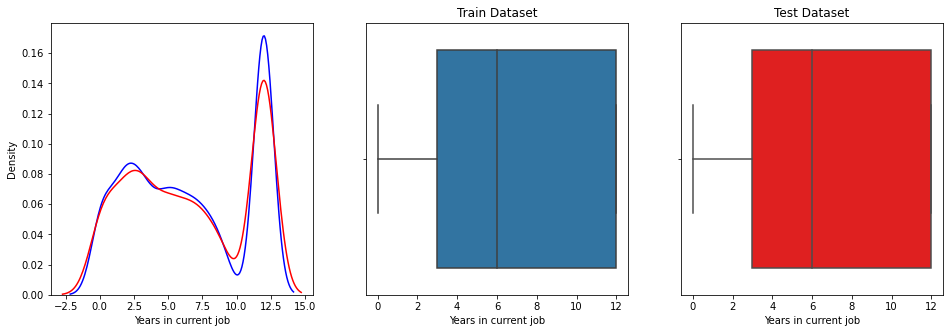

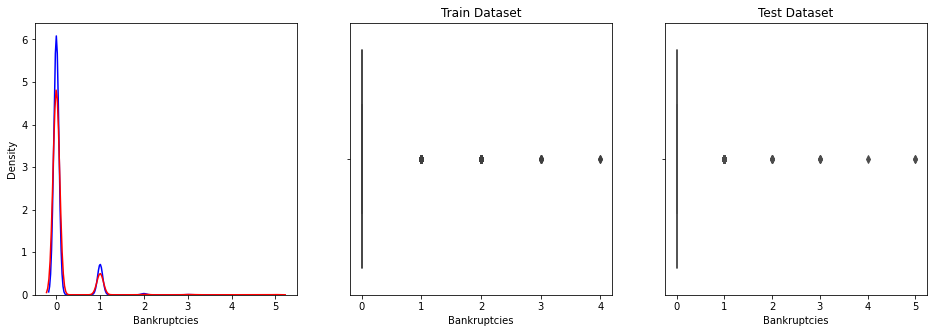

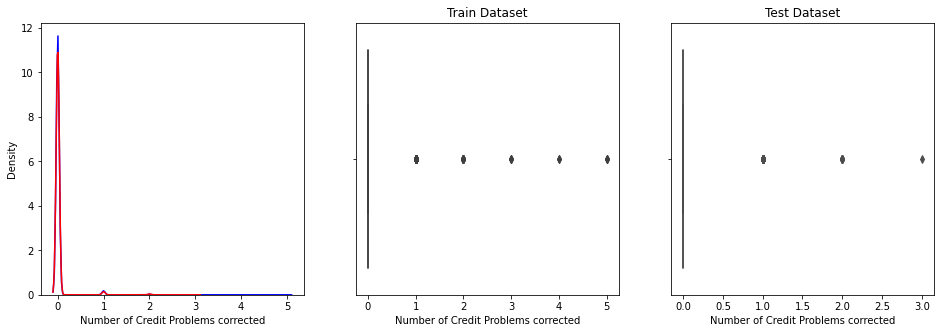

In [ ]:
cont_cols = list(set(cont_cols) - set(['Number of Credit Problems'])) + ['Number of Credit Problems corrected']
for col in cont_cols:
    plot_outliers(df_train, df_test, col)

##### Years in current job

по гистограмме создается ощущение, что есть отрицательные значения (могли возникнуть при заполенении пропусков), хотя boxplot этого не выявляет. Проверим:

In [ ]:
(df_union['Years in current job'] < 0).sum()

0

Пик наа 12 связан с тем, что этим значением заменены значения для более 10 лет

##### Years of Credit History

Хотя большие значения немного смущают, они не противоречат смыслу и не оторваны от общей массы. Не трогаем

##### Monthly Debt

In [ ]:
df_union[df_union['Monthly Debt'] > 100000]

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Number of Credit Problems corrected,Months missed
1615,Own Home,6651900.0,12.0,0.0,13.0,25.1,2155868.0,0.0,32.0,0.0,debt consolidation,Long Term,314380.0,1623569.0,110311.0,719.0,0.0,True
2535,Home Mortgage,4120226.0,12.0,0.0,15.0,13.0,3931620.0,0.0,32.0,0.0,debt consolidation,Long Term,542146.0,2889577.0,104036.0,656.0,0.0,True
4745,Own Home,6029954.0,4.0,0.0,30.0,17.5,11603856.0,0.0,32.0,0.0,debt consolidation,Short Term,753588.0,4720132.0,136679.0,745.0,0.0,True
6946,Own Home,6492395.0,1.0,0.0,19.0,26.0,1406526.0,0.0,32.0,0.0,other,Short Term,322190.0,1169773.0,100091.0,707.0,0.0,True


Выгладит натурально, менять не будем

##### Maximum Open Credit

In [ ]:
filter = df_union['Maximum Open Credit'] > 1000000000
filter.sum()

1

In [ ]:
df_union[filter]

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Number of Credit Problems corrected,Months missed
617,Home Mortgage,1859128.91,3.0,0.0,13.0,27.5,1.304726e+09,0.0,32.0,0.0,debt consolidation,Short Term,529892.0,1126814.0,5492.0,735.95,0.0,True


Удалим это наблюдение

In [ ]:
def tr_10(data):
    data = data[data['Maximum Open Credit'] < 1000000000]
    return data, 'Удаление экстремального значения Maximum Open Credit'

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_10(data)

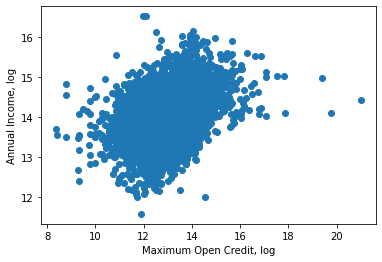

In [ ]:
plt.scatter(x = np.log(df_union['Maximum Open Credit']), y = np.log(df_union['Annual Income']))
plt.xlabel('Maximum Open Credit, log')
plt.ylabel('Annual Income, log')
plt.show()

In [ ]:
df1 = df_union.copy()
df1['Open Credit to Annual Income'] =  df1['Maximum Open Credit']/df1['Annual Income']
filter = df1['Open Credit to Annual Income'] > 25
filter.sum()

4

In [ ]:
df1[filter]

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Number of Credit Problems corrected,Months missed,Open Credit to Annual Income
44,Have Mortgage,1334256.00,12.0,0.0,17.0,15.4,3.800523e+08,1.0,35.0,0.0,take a trip,Short Term,33110.0,656450.0,34357.0,729.00,1.0,False,284.842105
617,Home Mortgage,1859128.91,3.0,0.0,13.0,27.5,1.304726e+09,0.0,32.0,0.0,debt consolidation,Short Term,529892.0,1126814.0,5492.0,735.95,0.0,True,701.794353
2023,Rent,1342825.00,12.0,0.0,12.0,16.3,5.756256e+07,0.0,32.0,0.0,other,Short Term,166826.0,944547.0,9176.0,749.00,0.0,True,42.866762
2617,Home Mortgage,3217802.00,12.0,0.0,12.0,35.5,2.655129e+08,0.0,32.0,0.0,other,Short Term,50116.0,1834450.0,20272.0,750.00,0.0,True,82.513739


In [ ]:
df1 = df_test.copy()
df1['Open Credit to Annual Income'] =  df1['Maximum Open Credit']/df1['Annual Income']
filter = df1['Open Credit to Annual Income'] > 25
filter.sum()

0

Такие значения очень подозрительны. Так как на тесте они не встречаются, удалим их

In [ ]:
def tr_11(data):
    data = data[data['Maximum Open Credit']/data['Annual Income'] <= 25]
    return data, 'Удаление экстремальных значений Maximum Open Credit по отношению к годовому доходу'

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_11(data)

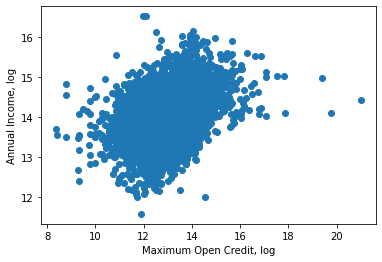

In [ ]:
plt.scatter(x = np.log(df_union['Maximum Open Credit']), y = np.log(df_union['Annual Income']))
plt.xlabel('Maximum Open Credit, log')
plt.ylabel('Annual Income, log')
plt.show()

Выбросы остались (например 3 в правой части графика). Пока трогать дальше не будем.

##### Number of Open Accounts

In [ ]:
def hists(column, sep_value, data=df_union):
    data[column].hist()
    plt.title(f'{column}')
    plt.show()
    data.loc[data[column] < sep_value, column].hist()
    plt.title(f'{column} < {sep_value}')
    plt.show()
    data.loc[data[column] >= sep_value, column].hist()
    plt.title(f'{column} >= {sep_value}')
    plt.show()

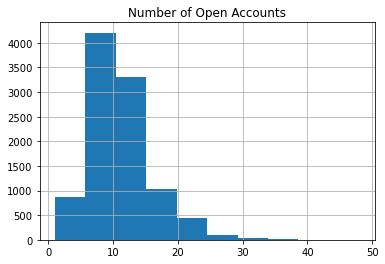

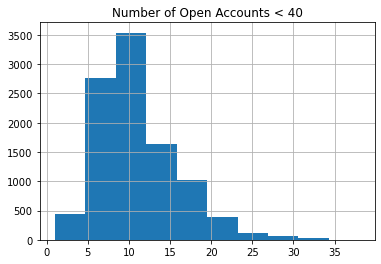

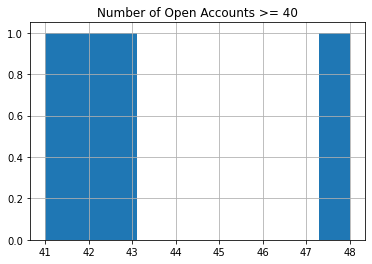

In [ ]:
hists('Number of Open Accounts', 40)

Большие значения смущают, но нет ощущения их сильной оторванности от основных данных. Бизнес логике не противоречат. Оставляем.

##### 'Current Credit Balance'

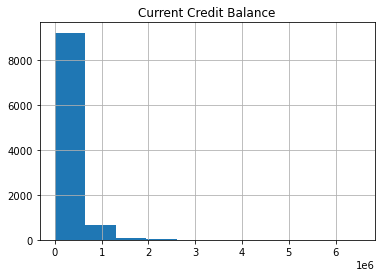

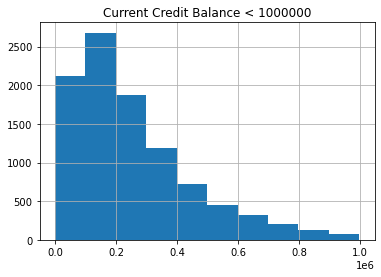

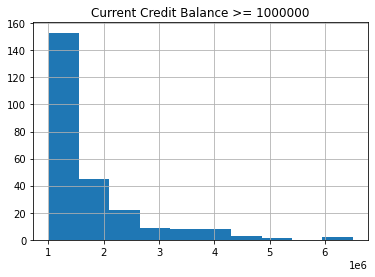

In [ ]:
hists('Current Credit Balance', 10**6)

Не будем трогать

##### Annual Income

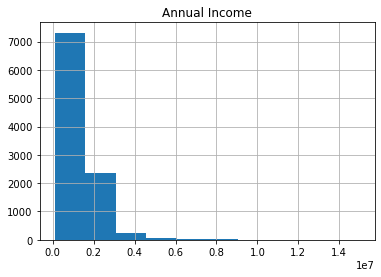

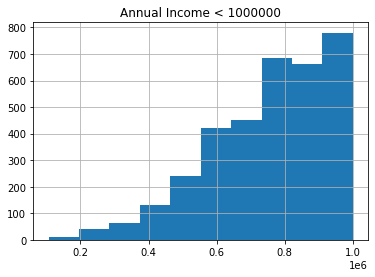

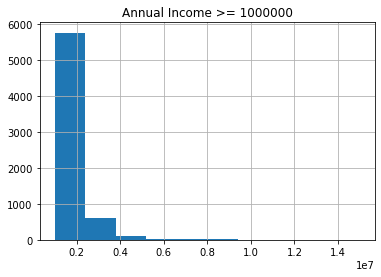

In [ ]:
hists('Annual Income', 10**6)

In [ ]:
df_test[df_test['Annual Income'] > 10**7]

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Number of Credit Problems corrected,Months missed
36,Home Mortgage,14934114.0,7.0,0.0,7.0,15.4,177298.0,0.0,32.0,0.0,other,Short Term,99770.0,57722.0,7218.0,746.0,0.0,True
194,Rent,14975610.0,5.0,0.0,5.0,44.3,155518.0,0.0,32.0,0.0,major purchase,Long Term,133386.0,103968.0,3369.0,738.0,0.0,True
1089,Home Mortgage,10275770.0,6.0,0.0,18.0,15.6,1242538.0,0.0,32.0,0.0,debt consolidation,Long Term,608432.0,115900.0,79038.0,746.0,0.0,True


In [ ]:
df_train[df_train['Annual Income'] > 10**7]

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Number of Credit Problems corrected,Months missed
6472,Rent,10149344.0,5.0,0.0,10.0,17.5,270380.0,0.0,22.0,0.0,debt consolidation,Short Term,664818.0,205713.0,61235.0,692.0,0,0.0,False


Смущают отдаленные значения с доходом больше 10 млн в год. Например, не понятна необходимость при доходе в 15 млн открывать долгосрочный кредит на 150 тысяч. Так как значения присутствуют и в тесте, удалять не будем, разделим на 10. В наблюдениях 194 и 1089 это будет обозначать отбрасывание последнего (возможно ошибочного) нуля. В наблюдениях 36 и 6472 также есть повторяющиеся знаки (11 и 44) что может свидетельствовать об опечатке).

In [ ]:
def tr_12(data):
    data.loc[data['Annual Income'] > 10**7, 'Annual Income'] = data['Annual Income'] // 10
    return data, 'Понижение порядка экстремальных значений Annual Income'

In [ ]:
for data in [df_train, df_test, df_union]:
    data, _ = tr_12(data)

##### Current Loan Amount

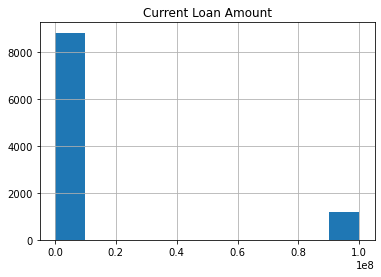

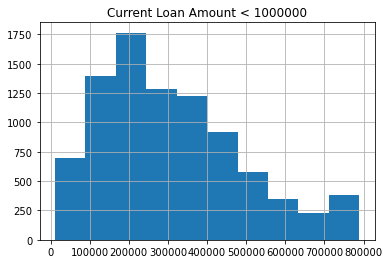

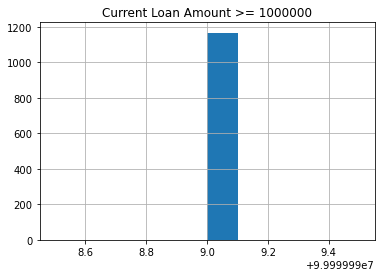

In [ ]:
hists('Current Loan Amount', 10**6)

In [ ]:
df_union.loc[df_union['Current Loan Amount'] >= 10**6, 'Current Loan Amount'].value_counts()

99999999.0    1167
Name: Current Loan Amount, dtype: int64

Это явно какие-то технические значения и для нас соответствуют отсутствию данных. Предлагается заполнить их как пропуски: 

In [ ]:
def tr_13(data, train= False):
    features = ['Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Months since last delinquent', 'Bankruptcies',
       'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt',
       'Credit Score', 'Number of Credit Problems corrected', 'Months missed']

    feature_target = 'Current Loan Amount'
    data.loc[data[feature_target] >= 10**6, feature_target] = np.nan
    data = rf_features_imputer(data=data, feature_target=feature_target, features=features, train=train)
    return data, f'Заполнение пропусков для признаков {feature_target} прогнозированием с помощью случайного леса'

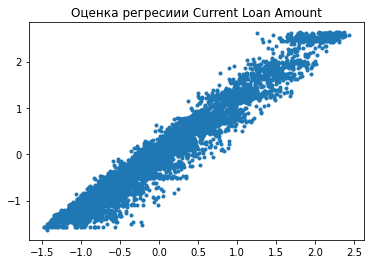

In [ ]:
df_train, _ = tr_13(df_train, train = True)
for data in [df_test, df_union]:
    data, _ = tr_13(data)

##### Tax Liens

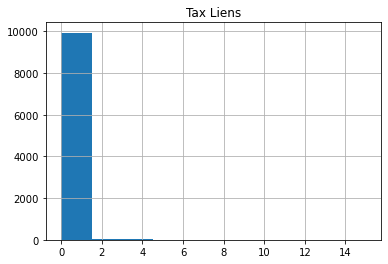

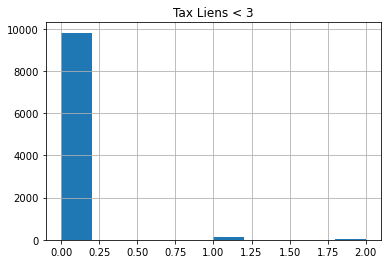

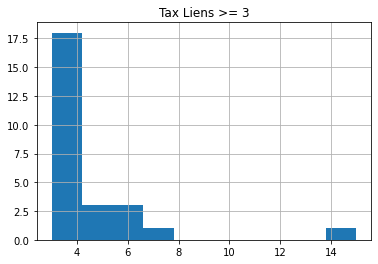

In [ ]:
hists('Tax Liens', 3)

In [ ]:
df_train['Tax Liens'].value_counts()

0.0    7366
1.0      83
2.0      30
3.0      10
4.0       6
5.0       2
6.0       2
7.0       1
Name: Tax Liens, dtype: int64

In [ ]:
df_test['Tax Liens'].value_counts()

0.0     2445
1.0       45
2.0        5
15.0       1
3.0        1
6.0        1
4.0        1
5.0        1
Name: Tax Liens, dtype: int64

На трейне существенных выбросов не видно. Выброс на тесте только один, его можно оставить.

In [ ]:
def tr_14(data):
    data.drop('Number of Credit Problems', axis = 'columns', inplace=True)
    return data, f'Удаление признака Number of Credit Problems'

In [ ]:
for data in [df_test, df_train, df_union]:
    data, _ = tr_14(data)

### Отсутпление - "ленивая" часть

Что будет, если вообще ничего не делать? Построим простейшую модель и с ее помощью будем оценивать что происходит при дальнейшем продвижении

In [ ]:
f1_results = pd.DataFrame(columns = ['f1_score','f1_STD', 'f1_Improving', 'f1_STD_Improving',
                                     'Action'])

In [ ]:
def simple_model(df,
            cat_features = ['Home Ownership', 'Purpose', 'Term'],
            eval_metric = 'F1'):
    X = df.drop('Credit Default', axis=1)
    y = df[['Credit Default']]
    if 'ID' in X.columns:
        X.drop('ID', axis='columns', inplace = True)
    if 'ID' in y.columns:
        y.drop('ID', axis='columns', inplace = True)

    cbc = CatBoostClassifier(cat_features=cat_features,
                         eval_metric=eval_metric,
                         scale_pos_weight = 3.5,
                         max_depth = 7,
                         n_estimators = 100,
                         learning_rate = 1e-1,
                         reg_lambda = 0.3  
                        )

    cv_score_f1 = cross_val_score(cbc, X, y, n_jobs=-1, 
                           scoring='f1', 
                           cv=KFold(n_splits=5, shuffle=True, random_state=42))

    mean_f1 = cv_score_f1.mean()
    std_f1 = cv_score_f1.std()

    print('f1: {:.3f} +- {:.3f}'.format(mean_f1, std_f1))
    
    return cbc, cv_score_f1

In [ ]:
def pretest(df, action, model = 0,
            f1_results = f1_results):

    cat_features = ['Home Ownership', 'Purpose', 'Term']
    cat_features = list(set(cat_features) & set(df.columns))
    
    cbc, cv_score_f1 = simple_model(df, cat_features)
    
    new_index = f1_results['Action'].count()
    if new_index > 0:
        f1_results.loc[new_index] = [
                                     cv_score_f1.mean(),
                                     cv_score_f1.std(),
                                     cv_score_f1.mean() - f1_results.loc[new_index - 1, 'f1_score'],
                                     - (cv_score_f1.std() - f1_results.loc[new_index - 1, 'f1_STD']),
                                     action
                                    ]
    else:
        f1_results.loc[new_index] = [
                                     cv_score_f1.mean(),
                                     cv_score_f1.std(),
                                     cv_score_f1.mean(),
                                     - cv_score_f1.std(),            
                                     action
                                    ]
    
    print(f'Action N{new_index}\n')
    return f1_results.tail(1)

In [ ]:
def pretest_cancel():
    f1_results.drop(f1_results.tail(1).index, axis= 'index', inplace= True)
    return 'The changes has been canceled'

In [ ]:
pretest(df_train.copy(), 'Initial')

f1: 0.481 +- 0.015
Action N0



,f1_score,f1_STD,f1_Improving,f1_STD_Improving,Action
0,0.480533,0.014951,0.480533,-0.014951,Initial


In [ ]:
df_train.name = 'df_train'
df_test.name = 'df_test'
df_union.name = 'df_union'

In [ ]:
for data in [df_train, df_test, df_union]:
    with open(f'part_1_data_out_{data.name}.pkl', 'wb') as file:
                pickle.dump(data, file)

## Часть 2

In [ ]:
with open(f'part_1_data_out_df_train.pkl', 'rb') as file:
    df_train = pickle.load(file)
with open(f'part_1_data_out_df_test.pkl', 'rb') as file:
    df_test = pickle.load(file)
with open(f'part_1_data_out_df_union.pkl', 'rb') as file:
    df_union = pickle.load(file)
TARGET = 'Credit Default'

In [ ]:
for data in [df_train, df_test, df_union]:
    data['ID'] = data.index

In [ ]:
df_train.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Number of Credit Problems corrected,Months missed,ID
0,Own Home,482087.0,5.0,0.0,11.0,26.3,685960.0,32.0,1.0,debt consolidation,Short Term,116480.76,47386.0,7914.0,749.0,0,0.0,True,0
1,Own Home,1025487.0,12.0,0.0,15.0,15.3,1181730.0,32.0,0.0,debt consolidation,Long Term,264968.00,394972.0,18373.0,737.0,1,0.0,True,1
2,Home Mortgage,751412.0,8.0,0.0,11.0,35.0,1182434.0,32.0,0.0,debt consolidation,Short Term,260522.02,308389.0,13651.0,742.0,0,0.0,True,2
3,Own Home,805068.0,6.0,0.0,8.0,22.5,147400.0,32.0,1.0,debt consolidation,Short Term,121396.00,95855.0,11338.0,694.0,0,0.0,True,3
4,Rent,776264.0,8.0,0.0,13.0,13.6,385836.0,32.0,0.0,debt consolidation,Short Term,125840.00,93309.0,7180.0,719.0,0,1.0,True,4


In [ ]:
from scipy.stats import shapiro
from scipy.stats import boxcox, probplot, norm
from scipy.stats import probplot
from scipy.stats import ttest_ind, mannwhitneyu
from scipy.stats import chi2_contingency
from statsmodels.stats.weightstats import zconfint

In [ ]:
def CHi_check(df = df_train, col = None, list_samp = None):
    p = 0
    numb_sample = np.sum(df[col].isin(list_samp))
    print(numb_sample)
    if numb_sample > 500:
        sample_data = df.loc[df[col].isin(list_samp), ['ID', col, TARGET]].sample(500)
        table = sample_data.pivot_table(values = 'ID',
                                        index = col,
                                        columns = TARGET,
                                        aggfunc='count')
        print("*"*20)
        print(table)
        chi2, p, dof, expected = chi2_contingency(table, correction=False)
        
    return p

In [ ]:
others = []

alph = 0.05
for col in cat_cols:
    f_uniq = df_train[col].unique()
    print('*'*80)
    print(col,': ',f_uniq)
    print('*'*80)
    for n_i, col_i in enumerate(f_uniq):
        for n_j, col_j in enumerate(f_uniq):
            if n_j <= n_i:
                continue
            p = CHi_check(df = df_train, col = col, list_samp = [col_i, col_j])
            if p > alph:
                print(col,': [', col_i,',',col_j,']  -', p > alph)
                if (col == 'Purpose') and ((col_i == 'other') or (col_j == 'other')):
                    print('to other')
                    print(others)
                    others = others + [col_i] + [col_j]
                    

********************************************************************************
Home Ownership :  ['Own Home' 'Home Mortgage' 'Rent' 'Have Mortgage']
********************************************************************************
4284
********************
Credit Default    0    1
Home Ownership          
Home Mortgage   322  110
Own Home         49   19
Home Ownership : [ Own Home , Home Mortgage ]  - True
3851
********************
Credit Default    0    1
Home Ownership          
Own Home         52   26
Rent            279  143
Home Ownership : [ Own Home , Rent ]  - True
659
********************
Credit Default    0    1
Home Ownership          
Have Mortgage     9    2
Own Home        351  138
Home Ownership : [ Own Home , Have Mortgage ]  - True
6841
********************
Credit Default    0   1
Home Ownership         
Home Mortgage   207  52
Rent            169  72
3649
********************
Credit Default      0      1
Home Ownership              
Have Mortgage     1.0    NaN
Hom

82
111
79
73
51
19
13
48
42
10
********************************************************************************
Term :  ['Short Term' 'Long Term']
********************************************************************************
7500
********************
Credit Default    0   1
Term                   
Long Term        65  63
Short Term      298  74


##### Поработаем с Purpose

In [ ]:
others = set(others) - set(['other']) - set(['debt consolidation'])
others

{'buy a car',
 'buy house',
 'home improvements',
 'major purchase',
 'medical bills',
 'moving',
 'small business',
 'take a trip',
 'vacation',
 'wedding'}

In [ ]:
def tr_20(data):
    for cat in others:
        data.loc[data['Purpose'] == cat, 'Purpose'] = 'other'
    data.loc[data['Purpose'] == 'renewable energy', 'Purpose'] = 'debt consolidation'
    return data, 'Объединение значений в признаке Purpose'

In [ ]:
for data in [df_test, df_train, df_union]:
    data, _ = tr_20(data)

In [ ]:
df_train['Purpose'].value_counts()

debt consolidation      5946
other                   1415
business loan            129
educational expenses      10
Name: Purpose, dtype: int64

In [ ]:
df_test['Purpose'].value_counts()

debt consolidation      1973
other                    494
business loan             30
educational expenses       3
Name: Purpose, dtype: int64

In [ ]:
pretest(df_train.copy(), 'corted Purpose')

f1: 0.486 +- 0.015
Action N1



,f1_score,f1_STD,f1_Improving,f1_STD_Improving,Action
1,0.486092,0.015454,0.005558,-0.000503,corted Purpose


#### Результат слегка улучшился. Можем оставить

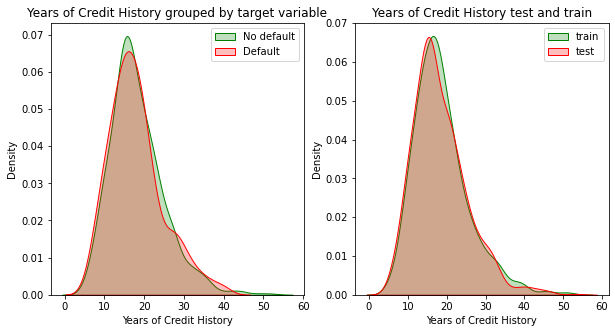

ShapiroResult(statistic=0.9367875456809998, pvalue=3.5216248458339085e-20)


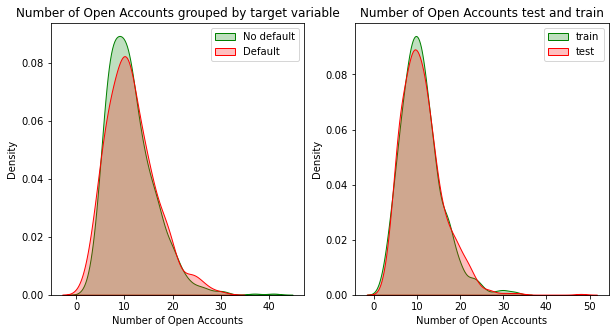

ShapiroResult(statistic=0.9390154480934143, pvalue=7.968613411756621e-20)


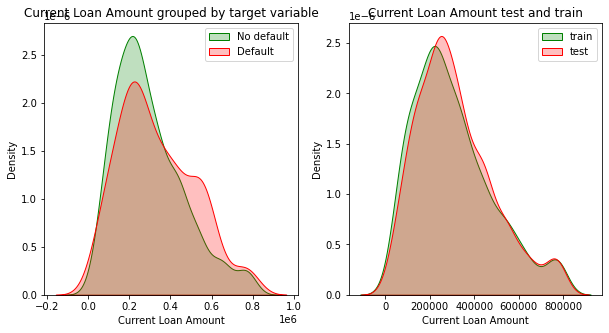

ShapiroResult(statistic=0.9410763382911682, pvalue=1.729793117634473e-19)


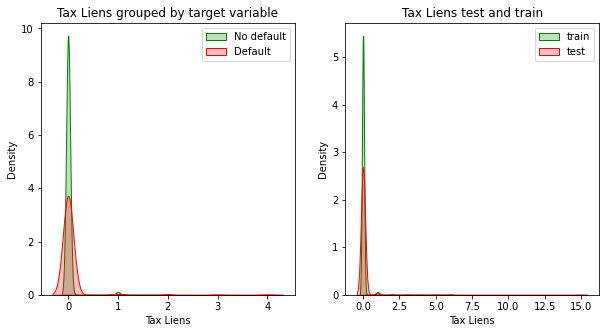

ShapiroResult(statistic=0.07504099607467651, pvalue=0.0)


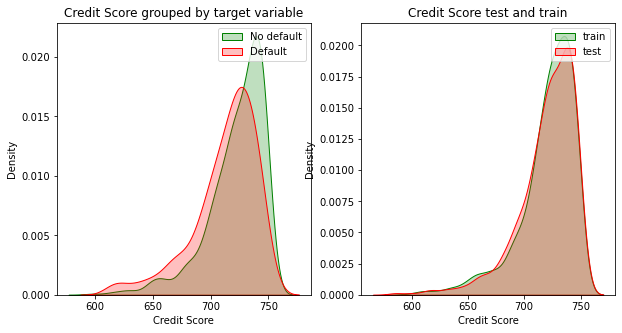

ShapiroResult(statistic=0.8607975840568542, pvalue=7.675515737219608e-29)


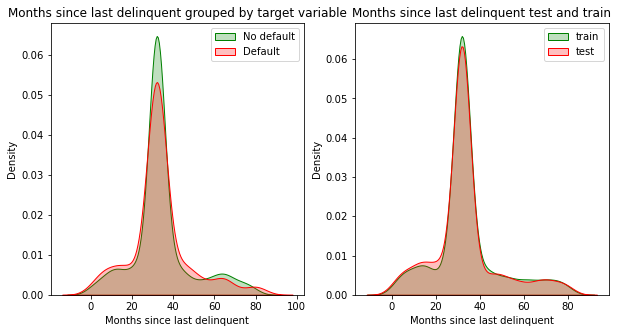

ShapiroResult(statistic=0.820857048034668, pvalue=5.893621870997385e-32)


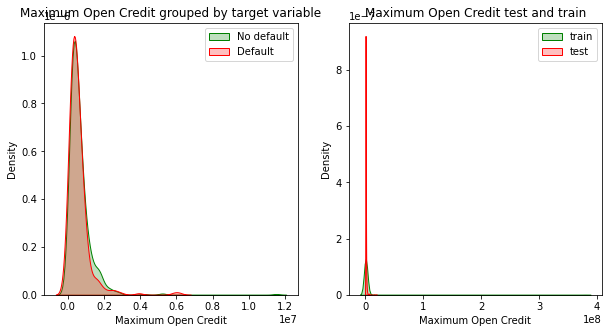

ShapiroResult(statistic=0.02615302801132202, pvalue=0.0)


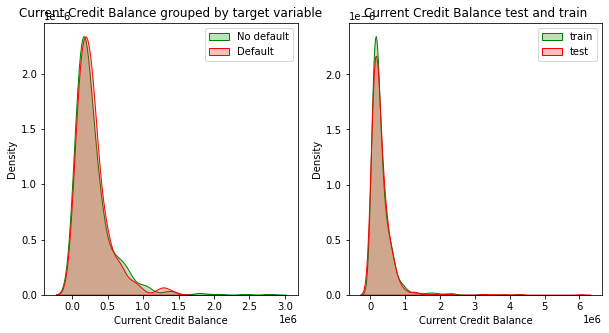

ShapiroResult(statistic=0.6554042100906372, pvalue=8.09824395517955e-41)


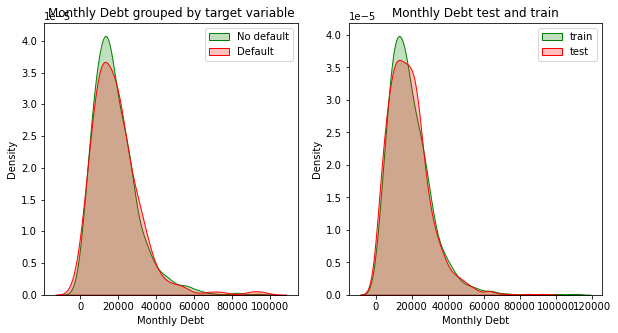

ShapiroResult(statistic=0.8852353096008301, pvalue=1.4293435452945644e-26)


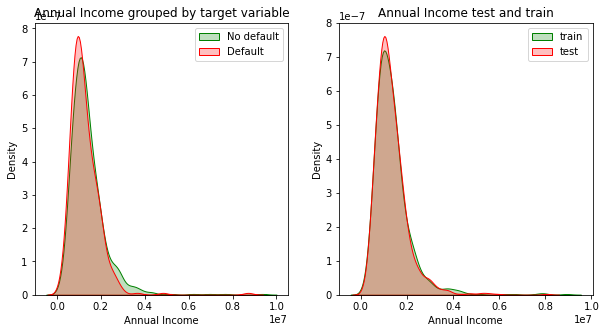

ShapiroResult(statistic=0.7445945739746094, pvalue=1.2777468082939888e-36)


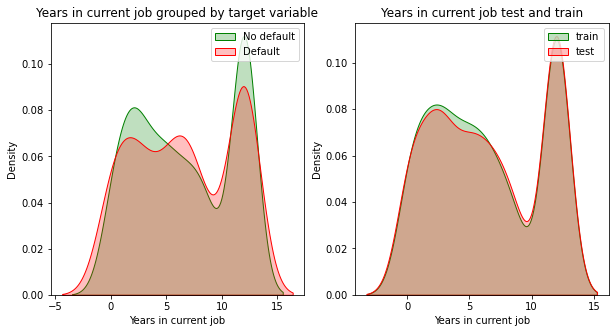

ShapiroResult(statistic=0.8787525296211243, pvalue=3.303694774655177e-27)


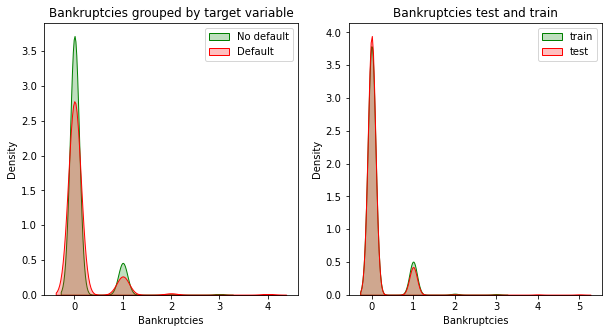

ShapiroResult(statistic=0.3849770426750183, pvalue=0.0)


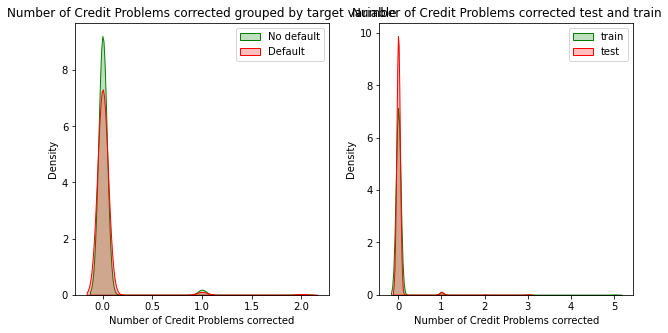

ShapiroResult(statistic=0.07524669170379639, pvalue=0.0)


In [ ]:
for col in cont_cols:
    plt.figure(figsize=(10, 5))
    limit_bal_with_target_s = df_train[[col, TARGET]].sample(1000)
    limit_bal_s = limit_bal_with_target_s[col]
    limit_bal_target_0 = limit_bal_s[limit_bal_with_target_s[TARGET] == 0]
    limit_bal_target_1 = limit_bal_s[limit_bal_with_target_s[TARGET] == 1]

    
    plt.subplot(1,2,1)
    sns.kdeplot(limit_bal_target_0, shade=True, label='No default', color='g')
    sns.kdeplot(limit_bal_target_1, shade=True, label='Default', color='r')
    plt.legend()
    
    plt.xlabel(col)
    plt.title(col+' grouped by target variable')
    
    limit_bal_s = df_train[col].sample(1000)
    limit_bal_st = df_test[col].sample(1000)

    
    plt.subplot(1,2,2)
    sns.kdeplot(limit_bal_s, shade=True, label='train', color='g')
    sns.kdeplot(limit_bal_st, shade=True, label='test', color='r')
    plt.legend()
    
    plt.xlabel(col)
    plt.title(col+' test and train')
    
    plt.show()
    print(shapiro(limit_bal_s))

#### Корелляция и PCA

**основные этапы**
- Визуальный анализ Целевой переменной
- Корелляционный анализ
- Изучение наличия кластеров
- PCA
- Итоговое разбиение данных для обучения

In [ ]:
y_train = df_train[TARGET]
X_train = df_train.drop(TARGET, axis='columns')
X_test = df_test.copy()

display(y_train.shape, X_train.shape, X_test.shape)

(7500,)

(7500, 18)

(2500, 18)

In [ ]:
for data in [X_train, X_test]:
    for col in cat_cols:
        data[col] = data[col].astype("category")

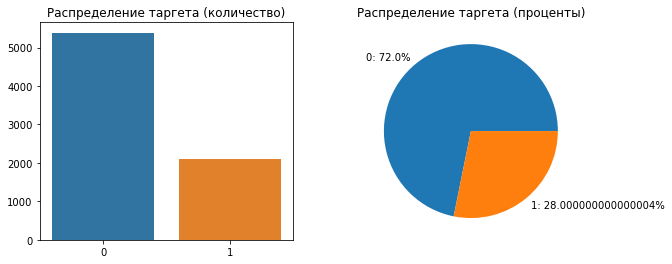

class values


0    5387
1    2113
Name: Credit Default, dtype: int64

In [ ]:
# 2.1. Визуальный анализ целевой переменной
fig, ax = plt.subplots(1,2,figsize=(10,4))
ax[0].set_title('Распределение таргета (количество)')
ax[1].set_title('Распределение таргета (проценты)')

sns.barplot(list(y_train.value_counts().index), list(y_train.value_counts()), ax = ax[0])
labels_percent = [f'{i}: {round(j/len(y_train), 2)*100}%' for i,j 
                  in zip(y_train.value_counts().index, y_train.value_counts())]
ax[1].pie(list(y_train.value_counts()/len(y_train)), labels=labels_percent)
plt.show()

print('class values')
display(y_train.value_counts())

{}

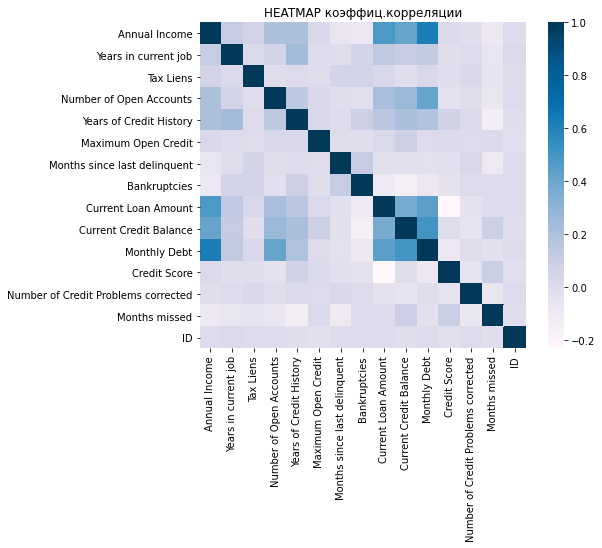

In [ ]:
cols_to_analyze = cont_cols

def plot_corr_map(corr_matrix):
    "plot given correlation matrix in heatmap style"
    fig = plt.figure(figsize=(8,6))
    ax = plt.axes()
    ax.set_title('HEATMAP коэффиц.корреляции')
    sns.heatmap(corr_matrix, square=True,ax=ax,cmap='PuBu');

corr_matrix = X_train.corr()
plot_corr_map(corr_matrix)

correlated_features = dict()
corr_threshold = 0.7

for col in corr_matrix.columns:
    for row in corr_matrix[col].index:
        if corr_threshold < abs(corr_matrix.loc[row, col]) < 1.0:
            pair = f'{row}-{col}'
            correlated_features[pair] = corr_matrix.loc[row, col]

display(correlated_features)

Существенных корреляций не выявлено, но посмотрим, насколько эффективным может оказаться уменьшение размерности с помощью PCA для наиболее скоррелированных признаков

##### Подбор параметров PCA

Преобразование данных - временное, ТОЛЬКО для подбора гиперпараметров PCA и только для среза X_train

In [ ]:
X_train.columns

Index(['Home Ownership', 'Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Months since last delinquent', 'Bankruptcies',
       'Purpose', 'Term', 'Current Loan Amount', 'Current Credit Balance',
       'Monthly Debt', 'Credit Score', 'Number of Credit Problems corrected',
       'Months missed', 'ID'],
      dtype='object')

In [ ]:
cols_to_PCA = ['Annual Income', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']

In [ ]:
df_train_tt = df_train.copy()
for col in cols_to_PCA:
    df_train_tt.loc[df_train_tt[col] <=0, col] = 10**(-10)

In [ ]:
df_train_tt.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Number of Credit Problems corrected,Months missed,ID
0,Own Home,482087.0,5.0,0.0,11.0,26.3,685960.0,32.0,1.0,debt consolidation,Short Term,116480.76,47386.0,7914.0,749.0,0,0.0,True,0
1,Own Home,1025487.0,12.0,0.0,15.0,15.3,1181730.0,32.0,0.0,debt consolidation,Long Term,264968.00,394972.0,18373.0,737.0,1,0.0,True,1
2,Home Mortgage,751412.0,8.0,0.0,11.0,35.0,1182434.0,32.0,0.0,debt consolidation,Short Term,260522.02,308389.0,13651.0,742.0,0,0.0,True,2
3,Own Home,805068.0,6.0,0.0,8.0,22.5,147400.0,32.0,1.0,debt consolidation,Short Term,121396.00,95855.0,11338.0,694.0,0,0.0,True,3
4,Rent,776264.0,8.0,0.0,13.0,13.6,385836.0,32.0,0.0,debt consolidation,Short Term,125840.00,93309.0,7180.0,719.0,0,1.0,True,4


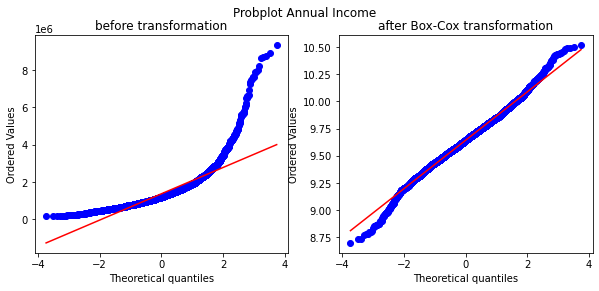

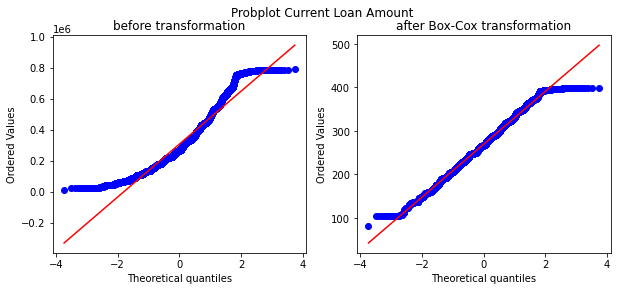

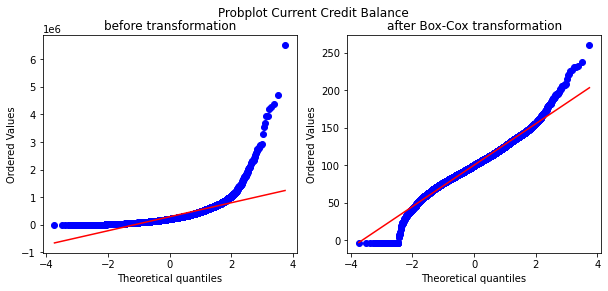

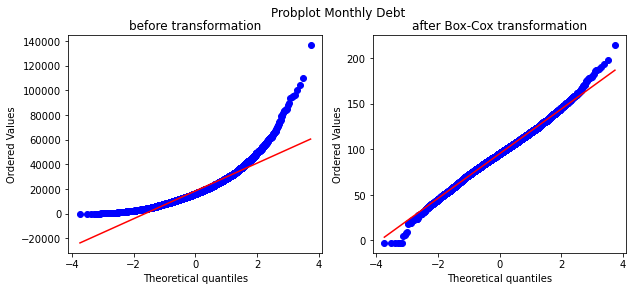

In [ ]:
for col in cols_to_PCA: 
    x = df_train_tt[col]
    
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    fig.suptitle(f'Probplot {col}')
    ax[0].set_title('before transformation')
    ax[1].set_title('after Box-Cox transformation')
    
    prob = probplot(x, dist=norm, plot=ax[0])
    ax[0].set_title(f'before transformation')
    
    xt, _ = boxcox(x)
    prob = probplot(xt, dist=norm, plot=ax[1])
    ax[1].set_title(f'after Box-Cox transformation')
    plt.show()

Current Loan Amount и Credit balance трансформировались не очень хорошо, но все-же попытаем счастья.

In [ ]:
df_train[cols_to_PCA].describe()

,Annual Income,Current Loan Amount,Current Credit Balance,Monthly Debt
count,7.500000e+03,7500.000000,7.500000e+03,7500.000000
mean,1.368877e+06,307399.776640,2.898332e+05,18314.454133
std,7.942502e+05,175744.610169,3.178714e+05,11926.764673
min,1.645970e+05,11242.000000,0.000000e+00,0.000000
25%,8.708888e+05,176200.915000,1.142565e+05,10067.500000
50%,1.195474e+06,267366.000000,2.093230e+05,16076.500000
75%,1.637686e+06,414355.590000,3.604062e+05,23818.000000
max,9.338880e+06,789030.000000,6.506797e+06,136679.000000


In [ ]:
cols_to_PCA = ['Annual Income', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']

In [ ]:
for col in cols_to_PCA:
    X_train[col], _ = boxcox(X_train[col] + 10**(-10))

In [ ]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train[cols_to_PCA])
X_train_scaled = pd.DataFrame(data = X_train_scaled, columns = cols_to_PCA)
X_train_scaled.describe()

,Annual Income,Current Loan Amount,Current Credit Balance,Monthly Debt
count,7.500000e+03,7.500000e+03,7.500000e+03,7.500000e+03
mean,8.201366e-15,-2.899014e-16,3.079537e-16,3.519703e-16
std,1.000067e+00,1.000067e+00,1.000067e+00,1.000067e+00
min,-4.236552e+00,-3.090956e+00,-3.719083e+00,-3.990934e+00
25%,-6.466090e-01,-6.766216e-01,-5.777618e-01,-6.323695e-01
50%,-1.724313e-03,-4.793499e-02,-1.443090e-02,4.719582e-03
75%,6.275787e-01,7.251487e-01,5.766432e-01,6.322399e-01
max,3.911697e+00,2.113721e+00,5.729580e+00,4.850679e+00


PCA - поиск параметра

In [ ]:
from sklearn.decomposition import PCA
break_even = [ 0.95, 0.975, 0.99]

pca = PCA()
X_train_pca = pca.fit_transform(X_train_scaled)
var_vector = np.cumsum(pca.explained_variance_ratio_)

for level in break_even:
    temp_list = []
    for n in var_vector:
        if n <= level: temp_list.append(n)
    print(f'required number of components for {level*100}% of total VAR is {len(temp_list)}')  

required number of components for 95.0% of total VAR is 3
required number of components for 97.5% of total VAR is 3
required number of components for 99.0% of total VAR is 3


In [ ]:
def tr_21(data, train= False):
    cols_to_PCA = ['Annual Income', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']
    n_comp = 3
    for col in cols_to_PCA: 
        data[col], _ = boxcox(data[col] + 10**(-10))
    
    if train:
        pca = PCA(n_components = n_comp)
        scaler = StandardScaler()
        scaler = scaler.fit(data[cols_to_PCA])
        X_scaled = scaler.transform(data[cols_to_PCA])
        X_pca = pca.fit_transform(X_scaled)
        data.drop(cols_to_PCA, axis = 'columns', inplace=True)
        for i in range(n_comp):
            data[f'psa_{i}'] = X_pca[:, i]
        with open(f'pca_scaler_tr_20.pkl', 'wb') as file:
            pickle.dump(scaler, file)
        with open(f'pca_model_tr_20.pkl', 'wb') as file:
            pickle.dump(pca, file)
    else:
        with open(f'pca_scaler_tr_20.pkl', 'rb') as file:
            scaler = pickle.load(file)
        with open(f'pca_model_tr_20.pkl', 'rb') as file:
            pca = pickle.load(file)
        X_scaled = scaler.transform(data[cols_to_PCA])
        X_pca = pca.transform(X_scaled)
        data.drop(cols_to_PCA, axis = 'columns', inplace=True)
    
    for i in range(n_comp):
        data[f'psa_{i}'] = X_pca[:, i]
    
    return data, f'PCA'

In [ ]:
df_train_tt, _ = tr_21(df_train.copy(), train = True)

In [ ]:
pretest(df_train_tt.drop('ID', axis = 'columns'), 'PCA')

f1: 0.483 +- 0.009
Action N2



,f1_score,f1_STD,f1_Improving,f1_STD_Improving,Action
2,0.483484,0.008693,-0.002608,0.006761,PCA


Сокращение количества признаков на 1 вряд ли даст нам много в производительности, а в метрике мы потеряли. Откатываем назад, применять не будем.

In [ ]:
pretest_cancel()

'The changes has been canceled'

In [ ]:
def tr_22(data):
    if 'ID' in data.columns:
        data.drop('ID', axis = 'columns', inplace=True)
    return data, f'Удаление ID'

In [ ]:
for data in [df_test, df_train, df_union]:
    data, _ = tr_22(data)

### Отработка дополнительных идей

#### Создадим новые фитчи в части нормирования денежных величин к годовому доходу

In [ ]:
df_union['Annual Income'].describe()

count    1.000000e+04
mean     1.365254e+06
std      7.813590e+05
min      1.065330e+05
25%      8.751305e+05
50%      1.200488e+06
75%      1.632546e+06
max      9.338880e+06
Name: Annual Income, dtype: float64

min > 0

In [ ]:
def tr_31(data):
    for col in ['Maximum Open Credit', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']:
        data[f'{col}_per_income'] = data[col]/data['Annual Income']
        data.drop(col, axis = 1, inplace = True)
    return data

In [ ]:
pretest(tr_31(df_train.copy()), 'Per income')

f1: 0.488 +- 0.014
Action N2



,f1_score,f1_STD,f1_Improving,f1_STD_Improving,Action
2,0.487646,0.014073,0.001554,0.00138,Per income


##### Идея сработала, добавляем в копилку

In [ ]:
df_train.columns

Index(['Home Ownership', 'Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Months since last delinquent', 'Bankruptcies',
       'Purpose', 'Term', 'Current Loan Amount', 'Current Credit Balance',
       'Monthly Debt', 'Credit Score', 'Credit Default',
       'Number of Credit Problems corrected', 'Months missed'],
      dtype='object')

In [ ]:
for data in [df_test, df_train, df_union]:
    data = tr_31(data)

Посмотрим на нормальность распределения новых фитчей

In [ ]:
cols_to_check = [f'{x}_per_income' for x in ['Maximum Open Credit', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']]
cols_to_check.append('Annual Income')

In [ ]:
df_union[cols_to_check].describe()

,Maximum Open Credit_per_income,Current Loan Amount_per_income,Current Credit Balance_per_income,Monthly Debt_per_income,Annual Income
count,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04
mean,0.635246,0.244496,0.220531,0.013976,1.365254e+06
std,7.648220,0.116965,0.179643,0.006359,7.813590e+05
min,0.000000,0.009214,0.000000,0.000000,1.065330e+05
25%,0.246956,0.159224,0.101415,0.009417,8.751305e+05
50%,0.407006,0.231579,0.182096,0.013907,1.200488e+06
75%,0.643197,0.319481,0.295215,0.018083,1.632546e+06
max,701.794353,0.949085,2.840104,0.076917,9.338880e+06


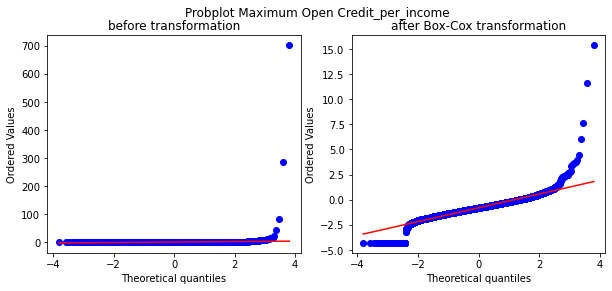

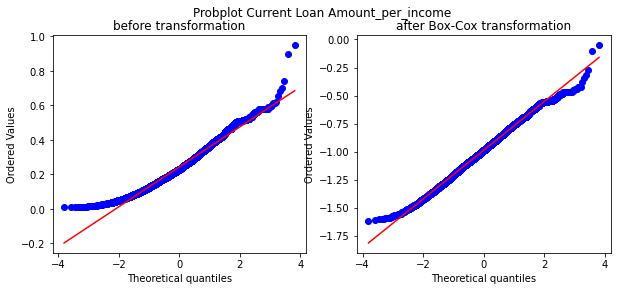

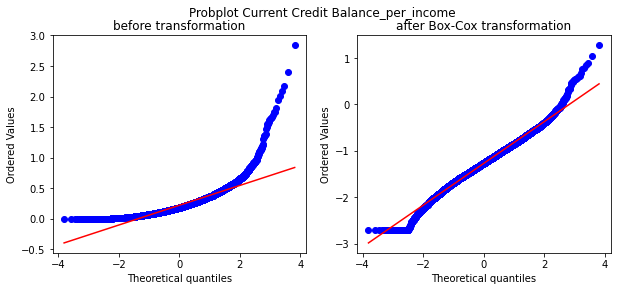

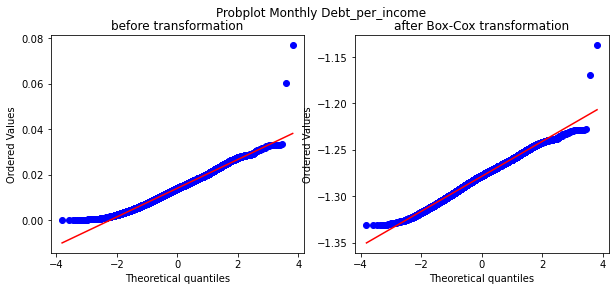

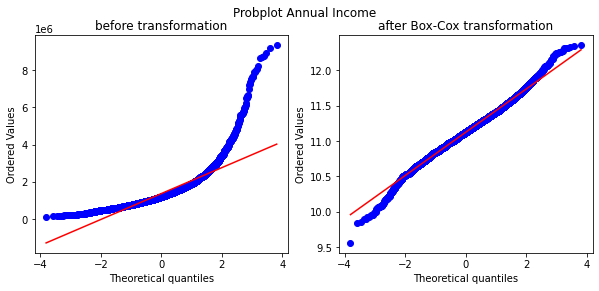

In [ ]:
for col in cols_to_check: 
    x = df_union[col] + 10**(-10)
    
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    fig.suptitle(f'Probplot {col}')
    ax[0].set_title('before transformation')
    ax[1].set_title('after Box-Cox transformation')
    
    prob = probplot(x, dist=norm, plot=ax[0])
    ax[0].set_title(f'before transformation')
    
    xt, _ = boxcox(x)
    prob = probplot(xt, dist=norm, plot=ax[1])
    ax[1].set_title(f'after Box-Cox transformation')
    plt.show()

Распределения не стали идеальными, но улучшились. Проверим, как это влияет на модель

#### Box cox трансформация

In [ ]:
def tr_32(data):
    cols_to_check = [f'{x}_per_income' for x in ['Maximum Open Credit', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']]
    cols_to_check.append('Annual Income')
    for col in cols_to_check:
        data[f'{col}_boxcox'] = boxcox(data[col] + 10**(-10))[0]
        data.drop(col, axis = 1, inplace = True)
        return data

In [ ]:
pretest(tr_32(df_train.copy()), 'Box cox')

f1: 0.486 +- 0.020
Action N3



,f1_score,f1_STD,f1_Improving,f1_STD_Improving,Action
3,0.486408,0.019733,-0.001238,-0.00566,Box cox


##### Идея не сработала, модель не улучшилась. отменяем

In [ ]:
pretest_cancel()

'The changes has been canceled'

### Построим предварительную модель для выявления важности фитчей и сокращения из количества

Тренируем модель на всем трейне

In [ ]:
cat_features = ['Home Ownership', 'Purpose', 'Term']
eval_metric = 'F1'
X = df_train.drop('Credit Default', axis=1)
y = df_train[['Credit Default']]

cbc = CatBoostClassifier(cat_features=cat_features,
                         eval_metric=eval_metric,
                         scale_pos_weight = 3.5,
                         max_depth = 7,
                         n_estimators = 100,
                         learning_rate = 1e-1,
                         reg_lambda = 0.3  
                        )
cbc.fit(X, y)

0:	learn: 0.7184670	total: 8.78ms	remaining: 869ms
1:	learn: 0.7376646	total: 17.9ms	remaining: 878ms
2:	learn: 0.7394847	total: 26.9ms	remaining: 870ms
3:	learn: 0.7393750	total: 33.7ms	remaining: 809ms
4:	learn: 0.7402793	total: 40.2ms	remaining: 764ms
5:	learn: 0.7395627	total: 49.1ms	remaining: 769ms
6:	learn: 0.7397925	total: 57.9ms	remaining: 769ms
7:	learn: 0.7398024	total: 65ms	remaining: 747ms
8:	learn: 0.7390173	total: 71.4ms	remaining: 722ms
9:	learn: 0.7394958	total: 78.2ms	remaining: 704ms
10:	learn: 0.7409961	total: 86.8ms	remaining: 702ms
11:	learn: 0.7412199	total: 95.5ms	remaining: 700ms
12:	learn: 0.7417491	total: 102ms	remaining: 683ms
13:	learn: 0.7433447	total: 109ms	remaining: 668ms
14:	learn: 0.7442841	total: 116ms	remaining: 655ms
15:	learn: 0.7453125	total: 121ms	remaining: 633ms
16:	learn: 0.7458698	total: 127ms	remaining: 621ms
17:	learn: 0.7472450	total: 134ms	remaining: 609ms
18:	learn: 0.7489526	total: 142ms	remaining: 607ms
19:	learn: 0.7500806	total: 151

In [ ]:
print(classification_report(y, train_class))

              precision    recall  f1-score   support

           0       0.91      0.50      0.65      5387
           1       0.41      0.88      0.56      2113

    accuracy                           0.61      7500
   macro avg       0.66      0.69      0.60      7500
weighted avg       0.77      0.61      0.62      7500



In [ ]:
features_importance = pd.DataFrame()
for n, col in enumerate(df_test.columns):
    features_importance['feature'] = col
    features_importance['importance'] = cbc.feature_importances_

In [ ]:
features_importance = {key: value for key, value in [*zip(df_test.columns, cbc.feature_importances_)]}

In [ ]:
features_importance

{'Home Ownership': 6.513096049609509,
 'Annual Income': 8.978840217031788,
 'Years in current job': 5.394392910588328,
 'Tax Liens': 0.60380891759748,
 'Number of Open Accounts': 4.605234141040668,
 'Years of Credit History': 6.19469978459832,
 'Months since last delinquent': 4.537571012234578,
 'Bankruptcies': 1.5005709928220317,
 'Purpose': 3.732372801261845,
 'Term': 6.095820437668967,
 'Credit Score': 14.490483952532477,
 'Number of Credit Problems corrected': 0.5521145227562142,
 'Months missed': 2.9242045672841064,
 'Maximum Open Credit_per_income': 7.587135318670087,
 'Current Loan Amount_per_income': 8.66805405410379,
 'Current Credit Balance_per_income': 7.527739044696134,
 'Monthly Debt_per_income': 10.09386127550367}

In [ ]:
features_importance_df = pd.DataFrame(columns = ['Feature', 'Importance'])
i = 0
for key, value in features_importance.items():
    features_importance_df.loc[i, 'Feature'] = key
    features_importance_df.loc[i, 'Importance'] = value
    i += 1
features_importance_df.sort_values(by='Importance', ascending=False)

,Feature,Importance
10,Credit Score,14.4905
16,Monthly Debt_per_income,10.0939
1,Annual Income,8.97884
14,Current Loan Amount_per_income,8.66805
13,Maximum Open Credit_per_income,7.58714
15,Current Credit Balance_per_income,7.52774
0,Home Ownership,6.5131
5,Years of Credit History,6.1947
9,Term,6.09582
2,Years in current job,5.39439


In [ ]:
feat_12 = features_importance_df.sort_values(by='Importance', ascending=False)[12:]['Feature']

In [ ]:
feat_12.values

array(['Purpose', 'Months missed', 'Bankruptcies', 'Tax Liens',
       'Number of Credit Problems corrected'], dtype=object)

Для начала оставим категориальный признак purpose принудительно

In [ ]:
feat_12.drop(8, axis = 0, inplace = True)

In [ ]:
feat_12.values

array(['Months missed', 'Bankruptcies', 'Tax Liens',
       'Number of Credit Problems corrected'], dtype=object)

##### Посмотрим на модель с уменьшенным количеством фитчей

In [ ]:
cat_features = ['Home Ownership', 'Term', 'Purpose']
eval_metric = 'F1'
X = df_train.drop('Credit Default', axis=1)
y = df_train[['Credit Default']]

cat_features = list(set(cat_features) & set(X.columns))

for col in feat_12.values:
    X.drop(col, axis=1, inplace=True)  

cbc = CatBoostClassifier(cat_features=cat_features,
                         eval_metric=eval_metric,
                         scale_pos_weight = 3.5,
                         max_depth = 7,
                         n_estimators = 100,
                         learning_rate = 1e-1,
                         reg_lambda = 0.3  
                        )
_ = cbc.fit(X, y)

0:	learn: 0.7104154	total: 8.34ms	remaining: 826ms
1:	learn: 0.7334220	total: 13.4ms	remaining: 657ms
2:	learn: 0.7330037	total: 21.1ms	remaining: 682ms
3:	learn: 0.7313402	total: 28.5ms	remaining: 683ms
4:	learn: 0.7360391	total: 35.5ms	remaining: 675ms
5:	learn: 0.7355603	total: 41.5ms	remaining: 650ms
6:	learn: 0.7374709	total: 50.4ms	remaining: 669ms
7:	learn: 0.7374727	total: 57.2ms	remaining: 657ms
8:	learn: 0.7389508	total: 63.7ms	remaining: 644ms
9:	learn: 0.7400700	total: 70.3ms	remaining: 633ms
10:	learn: 0.7424460	total: 76.4ms	remaining: 618ms
11:	learn: 0.7427950	total: 82.9ms	remaining: 608ms
12:	learn: 0.7429628	total: 88.6ms	remaining: 593ms
13:	learn: 0.7441098	total: 95.3ms	remaining: 585ms
14:	learn: 0.7429628	total: 102ms	remaining: 580ms
15:	learn: 0.7430535	total: 109ms	remaining: 571ms
16:	learn: 0.7447859	total: 115ms	remaining: 560ms
17:	learn: 0.7451892	total: 121ms	remaining: 552ms
18:	learn: 0.7457936	total: 129ms	remaining: 550ms
19:	learn: 0.7480885	total:

In [ ]:
train_class = cbc.predict(X)

In [ ]:
print(classification_report(y, train_class))

              precision    recall  f1-score   support

           0       0.92      0.53      0.68      5387
           1       0.43      0.89      0.58      2113

    accuracy                           0.63      7500
   macro avg       0.67      0.71      0.63      7500
weighted avg       0.78      0.63      0.65      7500



Качество модели по крайней мере не ухудшилось. Можем оставить

### Подбор параметров модели

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
cat_features = ['Home Ownership', 'Term', 'Purpose']
eval_metric = 'F1'
X = df_train.drop('Credit Default', axis=1)
y = df_train[['Credit Default']]

for col in feat_12.values:
    X.drop(col, axis=1, inplace=True)  

In [ ]:
X_train_reduced, X_valid, y_train_reduced, y_valid = train_test_split(X.iloc[:,:], y, test_size=100, random_state=37)
# X_train_scaled!
smote = SMOTE(sampling_strategy='auto', n_jobs=-1)
cv_ = KFold(n_splits=10, shuffle=True, random_state=42)

result_dict = dict()

In [ ]:
# 3.4. Пользовательские функции
def parse_params(param_grid, model_label):
    param_dict = dict()
    for key, value in param_grid.items():
        param_dict[model_label+"__"+key] = value
    return param_dict


def show_proba_calibration_plots(y_predicted_probs, y_true_labels, p_min, p_max, p_step):
    y_predicted_probs = y_predicted_probs[:,1]
    preds_with_true_labels = np.array(list(zip(y_predicted_probs, y_true_labels)))

    thresholds = []
    precisions = []
    recalls = []
    f1_scores = []

    for threshold in np.linspace(p_min, p_max, p_step):
        thresholds.append(threshold)
        precisions.append(precision_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        recalls.append(recall_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        f1_scores.append(f1_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))

    scores_table = pd.DataFrame({'f1':f1_scores,
                                 'precision':precisions,
                                 'recall':recalls,
                                 'probability':thresholds}).sort_values('f1', ascending=False).round(3)
  
    figure = plt.figure(figsize = (15, 5))

    plt1 = figure.add_subplot(121)
    plt1.plot(thresholds, precisions, label='Precision', linewidth=4)
    plt1.plot(thresholds, recalls, label='Recall', linewidth=4)
    plt1.plot(thresholds, f1_scores, label='F1', linewidth=4)
    plt1.set_ylabel('Scores')
    plt1.set_xlabel('Probability threshold')
    plt1.set_title('Probabilities threshold calibration')
    plt1.legend(bbox_to_anchor=(0.25, 0.25))   
    plt1.table(cellText = scores_table.values,
               colLabels = scores_table.columns, 
               colLoc = 'center', cellLoc = 'center', loc = 'bottom', bbox = [0, -1.3, 1, 1])

    plt2 = figure.add_subplot(122)
    print('!'*100)
    print(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0].shape)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0], 
              label='Another class', color='royalblue', alpha=1)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 1][:, 0], 
              label='Main class', color='darkcyan', alpha=0.8)
    plt2.set_ylabel('Number of examples')
    plt2.set_xlabel('Probabilities')
    plt2.set_title('Probability histogram')
    plt2.legend(bbox_to_anchor=(1, 1))

    plt.show()
    
    
def update_predict_by_prob(y_true, predict_probas, prob_min, prob_max, prob_steps, score='f1', show_chart=False):
    if score=='f1':
        score_estimator = f1_score
    elif score=='accuracy':
        score_estimator = accuracy_score
    else:
        print('wrong score name')
        return None
    prob_range = np.linspace(prob_min, prob_max, prob_steps)
    scores = []
    for p in prob_range:
        predict_rebalanced = np.array([1 if x>=p else 0 for x in predict_probas[:,1]])
        scores.append(score_estimator(y_true, predict_rebalanced))
    if show_chart:
        figure = plt.figure(figsize = (5, 4))
        plt.ylabel('Scores')
        plt.xlabel('Probability threshold')
        plt.plot(prob_range, scores, label=score, linewidth=4)
        plt.title("Best Threshold Probability Search")
        plt.show()
    scores = np.array(scores)
    best_prob = prob_range[scores.argmax()]
    print(f'best threshold probability = {best_prob}')
    predict_rebalanced_final = np.array([1 if x>=best_prob else 0 for x in predict_probas[:,1]])
    return predict_rebalanced_final, best_prob

In [ ]:
pipeline_steps = [
                   # ('oversampler', smote),
                    ('catboost', CatBoostClassifier(cat_features=cat_features,
                         eval_metric=eval_metric
                        ))
                     ]


param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [1e-1], #0.1
    'scale_pos_weight': [2, 2.7, 3, 3.2, 3.5],
    'max_depth': [4, 5, 6, 7],
    'reg_lambda': [0.3, 0.5, 0.7]
    }

print(f'CatBoost')
print(70*'-')
param_grid = parse_params(param_grid, pipeline_steps[-1][0])
pipe = SM_Pipeline(pipeline_steps)
grid = GridSearchCV(pipe, param_grid=param_grid, scoring='f1', cv=cv_)
_ = grid.fit(X_train_reduced, y_train_reduced)
best_model = grid.best_estimator_[-1]

CatBoost
----------------------------------------------------------------------
0:	learn: 0.4640052	total: 5.07ms	remaining: 249ms
1:	learn: 0.4660131	total: 9.79ms	remaining: 235ms
2:	learn: 0.4802568	total: 12.2ms	remaining: 192ms
3:	learn: 0.4736331	total: 17.1ms	remaining: 197ms
4:	learn: 0.4678210	total: 20ms	remaining: 180ms
5:	learn: 0.4794565	total: 22.8ms	remaining: 168ms
6:	learn: 0.4847903	total: 25.8ms	remaining: 158ms
7:	learn: 0.4835869	total: 28.9ms	remaining: 152ms
8:	learn: 0.4934283	total: 31.3ms	remaining: 143ms
9:	learn: 0.4937878	total: 34ms	remaining: 136ms
10:	learn: 0.4977806	total: 36.5ms	remaining: 130ms
11:	learn: 0.5050125	total: 39.3ms	remaining: 124ms
12:	learn: 0.5064163	total: 42.2ms	remaining: 120ms
13:	learn: 0.5051838	total: 44.4ms	remaining: 114ms
14:	learn: 0.5029940	total: 46.6ms	remaining: 109ms
15:	learn: 0.5010280	total: 49.3ms	remaining: 105ms
16:	learn: 0.5062735	total: 52.1ms	remaining: 101ms
17:	learn: 0.5077187	total: 54.8ms	remaining: 97.5

47:	learn: 0.5516411	total: 184ms	remaining: 7.68ms
48:	learn: 0.5517241	total: 187ms	remaining: 3.82ms
49:	learn: 0.5515371	total: 190ms	remaining: 0us
0:	learn: 0.4575012	total: 5.58ms	remaining: 274ms
1:	learn: 0.4598755	total: 9.94ms	remaining: 239ms
2:	learn: 0.4550017	total: 13.4ms	remaining: 211ms
3:	learn: 0.4558996	total: 18.5ms	remaining: 212ms
4:	learn: 0.4642679	total: 21.5ms	remaining: 194ms
5:	learn: 0.4661355	total: 26.9ms	remaining: 197ms
6:	learn: 0.4659486	total: 30.4ms	remaining: 187ms
7:	learn: 0.4667437	total: 33.7ms	remaining: 177ms
8:	learn: 0.4824121	total: 36.3ms	remaining: 165ms
9:	learn: 0.4925636	total: 38.8ms	remaining: 155ms
10:	learn: 0.4963317	total: 41.7ms	remaining: 148ms
11:	learn: 0.4961832	total: 44.1ms	remaining: 140ms
12:	learn: 0.5007149	total: 46.2ms	remaining: 132ms
13:	learn: 0.4995227	total: 48.3ms	remaining: 124ms
14:	learn: 0.5026178	total: 50.4ms	remaining: 118ms
15:	learn: 0.5060812	total: 52.5ms	remaining: 112ms
16:	learn: 0.5109328	tota

6:	learn: 0.4748768	total: 22.3ms	remaining: 137ms
7:	learn: 0.4720946	total: 25ms	remaining: 131ms
8:	learn: 0.4765957	total: 27.9ms	remaining: 127ms
9:	learn: 0.4826468	total: 30.4ms	remaining: 122ms
10:	learn: 0.4887957	total: 33.1ms	remaining: 117ms
11:	learn: 0.4925349	total: 35.7ms	remaining: 113ms
12:	learn: 0.4953361	total: 39ms	remaining: 111ms
13:	learn: 0.5015135	total: 41.5ms	remaining: 107ms
14:	learn: 0.5025349	total: 43.9ms	remaining: 102ms
15:	learn: 0.5041061	total: 46.1ms	remaining: 98.1ms
16:	learn: 0.5059139	total: 48.4ms	remaining: 94ms
17:	learn: 0.5048973	total: 50.7ms	remaining: 90.1ms
18:	learn: 0.5060812	total: 53ms	remaining: 86.4ms
19:	learn: 0.5076559	total: 55.7ms	remaining: 83.6ms
20:	learn: 0.5031726	total: 58.1ms	remaining: 80.2ms
21:	learn: 0.5045102	total: 60.4ms	remaining: 76.9ms
22:	learn: 0.5032483	total: 62.6ms	remaining: 73.5ms
23:	learn: 0.5031646	total: 64.9ms	remaining: 70.3ms
24:	learn: 0.5063211	total: 67.1ms	remaining: 67.1ms
25:	learn: 0.5

13:	learn: 0.6615467	total: 42.8ms	remaining: 110ms
14:	learn: 0.6584690	total: 45ms	remaining: 105ms
15:	learn: 0.6561423	total: 47.2ms	remaining: 100ms
16:	learn: 0.6568525	total: 49.5ms	remaining: 96.1ms
17:	learn: 0.6580362	total: 52.2ms	remaining: 92.9ms
18:	learn: 0.6587162	total: 54.5ms	remaining: 89ms
19:	learn: 0.6629228	total: 57.4ms	remaining: 86.1ms
20:	learn: 0.6605906	total: 59.8ms	remaining: 82.6ms
21:	learn: 0.6624065	total: 62.3ms	remaining: 79.3ms
22:	learn: 0.6632048	total: 65.5ms	remaining: 76.9ms
23:	learn: 0.6636038	total: 68.3ms	remaining: 74ms
24:	learn: 0.6626325	total: 70.9ms	remaining: 70.9ms
25:	learn: 0.6638868	total: 74ms	remaining: 68.3ms
26:	learn: 0.6644990	total: 77.2ms	remaining: 65.7ms
27:	learn: 0.6660318	total: 79.7ms	remaining: 62.6ms
28:	learn: 0.6666418	total: 82.9ms	remaining: 60ms
29:	learn: 0.6644459	total: 85.6ms	remaining: 57.1ms
30:	learn: 0.6639572	total: 87.8ms	remaining: 53.8ms
31:	learn: 0.6656954	total: 90.2ms	remaining: 50.7ms
32:	le

3:	learn: 0.6530990	total: 23.8ms	remaining: 273ms
4:	learn: 0.6508490	total: 26.4ms	remaining: 238ms
5:	learn: 0.6386830	total: 29.7ms	remaining: 218ms
6:	learn: 0.6433763	total: 32.3ms	remaining: 198ms
7:	learn: 0.6399219	total: 35.3ms	remaining: 186ms
8:	learn: 0.6442918	total: 38.7ms	remaining: 176ms
9:	learn: 0.6515799	total: 42.2ms	remaining: 169ms
10:	learn: 0.6523978	total: 44.8ms	remaining: 159ms
11:	learn: 0.6521245	total: 48.1ms	remaining: 152ms
12:	learn: 0.6541070	total: 51.5ms	remaining: 146ms
13:	learn: 0.6523812	total: 54.5ms	remaining: 140ms
14:	learn: 0.6538458	total: 57.3ms	remaining: 134ms
15:	learn: 0.6576544	total: 60.3ms	remaining: 128ms
16:	learn: 0.6559505	total: 65.3ms	remaining: 127ms
17:	learn: 0.6600247	total: 68.3ms	remaining: 121ms
18:	learn: 0.6606351	total: 71.1ms	remaining: 116ms
19:	learn: 0.6604212	total: 73.6ms	remaining: 110ms
20:	learn: 0.6605798	total: 76.5ms	remaining: 106ms
21:	learn: 0.6623690	total: 79.9ms	remaining: 102ms
22:	learn: 0.661731

1:	learn: 0.6450418	total: 13.6ms	remaining: 327ms
2:	learn: 0.6295012	total: 16.4ms	remaining: 256ms
3:	learn: 0.6473074	total: 24.8ms	remaining: 285ms
4:	learn: 0.6531414	total: 27.9ms	remaining: 251ms
5:	learn: 0.6457452	total: 30.9ms	remaining: 226ms
6:	learn: 0.6459074	total: 34.6ms	remaining: 212ms
7:	learn: 0.6365350	total: 37.2ms	remaining: 196ms
8:	learn: 0.6422820	total: 41.8ms	remaining: 191ms
9:	learn: 0.6421127	total: 44.5ms	remaining: 178ms
10:	learn: 0.6439138	total: 47.3ms	remaining: 168ms
11:	learn: 0.6460243	total: 49.8ms	remaining: 158ms
12:	learn: 0.6525992	total: 52.5ms	remaining: 149ms
13:	learn: 0.6520438	total: 55.4ms	remaining: 142ms
14:	learn: 0.6497137	total: 57.9ms	remaining: 135ms
15:	learn: 0.6460702	total: 60.7ms	remaining: 129ms
16:	learn: 0.6532804	total: 63.4ms	remaining: 123ms
17:	learn: 0.6570711	total: 66.1ms	remaining: 118ms
18:	learn: 0.6585804	total: 68.7ms	remaining: 112ms
19:	learn: 0.6565663	total: 71.3ms	remaining: 107ms
20:	learn: 0.6579179	

1:	learn: 0.6934721	total: 9.03ms	remaining: 217ms
2:	learn: 0.6732673	total: 12.4ms	remaining: 194ms
3:	learn: 0.6791806	total: 17.5ms	remaining: 202ms
4:	learn: 0.6865385	total: 20.5ms	remaining: 184ms
5:	learn: 0.6857279	total: 24.3ms	remaining: 178ms
6:	learn: 0.6872372	total: 27.8ms	remaining: 171ms
7:	learn: 0.6907159	total: 32ms	remaining: 168ms
8:	learn: 0.6906888	total: 35ms	remaining: 159ms
9:	learn: 0.6913978	total: 38ms	remaining: 152ms
10:	learn: 0.6885007	total: 41.1ms	remaining: 146ms
11:	learn: 0.6906371	total: 43.5ms	remaining: 138ms
12:	learn: 0.6951540	total: 46.5ms	remaining: 132ms
13:	learn: 0.6906060	total: 49.1ms	remaining: 126ms
14:	learn: 0.6916204	total: 51.4ms	remaining: 120ms
15:	learn: 0.6929740	total: 53.9ms	remaining: 115ms
16:	learn: 0.6940713	total: 56.7ms	remaining: 110ms
17:	learn: 0.6975180	total: 58.9ms	remaining: 105ms
18:	learn: 0.6980981	total: 61.8ms	remaining: 101ms
19:	learn: 0.6980423	total: 64.4ms	remaining: 96.6ms
20:	learn: 0.6961619	total

1:	learn: 0.6656409	total: 9.81ms	remaining: 235ms
2:	learn: 0.6888442	total: 12.8ms	remaining: 201ms
3:	learn: 0.6846298	total: 15.7ms	remaining: 180ms
4:	learn: 0.6872309	total: 18.5ms	remaining: 167ms
5:	learn: 0.6852158	total: 23.7ms	remaining: 174ms
6:	learn: 0.6875635	total: 26.3ms	remaining: 161ms
7:	learn: 0.6862420	total: 29.2ms	remaining: 153ms
8:	learn: 0.6890584	total: 32.1ms	remaining: 146ms
9:	learn: 0.6867128	total: 34.4ms	remaining: 138ms
10:	learn: 0.6879761	total: 38ms	remaining: 135ms
11:	learn: 0.6853346	total: 40.4ms	remaining: 128ms
12:	learn: 0.6828492	total: 42.8ms	remaining: 122ms
13:	learn: 0.6852925	total: 45ms	remaining: 116ms
14:	learn: 0.6827867	total: 47.3ms	remaining: 110ms
15:	learn: 0.6854813	total: 49.5ms	remaining: 105ms
16:	learn: 0.6868045	total: 52ms	remaining: 101ms
17:	learn: 0.6879501	total: 54.2ms	remaining: 96.4ms
18:	learn: 0.6883512	total: 56.7ms	remaining: 92.6ms
19:	learn: 0.6894455	total: 59.1ms	remaining: 88.6ms
20:	learn: 0.6889906	tot

45:	learn: 0.7198278	total: 174ms	remaining: 15.1ms
46:	learn: 0.7205857	total: 177ms	remaining: 11.3ms
47:	learn: 0.7210964	total: 180ms	remaining: 7.48ms
48:	learn: 0.7214133	total: 183ms	remaining: 3.73ms
49:	learn: 0.7210079	total: 186ms	remaining: 0us
0:	learn: 0.7152143	total: 4.85ms	remaining: 238ms
1:	learn: 0.7081090	total: 9.49ms	remaining: 228ms
2:	learn: 0.7159252	total: 12.2ms	remaining: 191ms
3:	learn: 0.7157228	total: 16.6ms	remaining: 191ms
4:	learn: 0.7143444	total: 19.4ms	remaining: 175ms
5:	learn: 0.7140116	total: 21.7ms	remaining: 159ms
6:	learn: 0.7156375	total: 24.4ms	remaining: 150ms
7:	learn: 0.7161570	total: 27.3ms	remaining: 143ms
8:	learn: 0.7156652	total: 30.2ms	remaining: 138ms
9:	learn: 0.7146802	total: 32.7ms	remaining: 131ms
10:	learn: 0.7154256	total: 37.8ms	remaining: 134ms
11:	learn: 0.7161680	total: 40.3ms	remaining: 128ms
12:	learn: 0.7173476	total: 42.8ms	remaining: 122ms
13:	learn: 0.7152067	total: 45.1ms	remaining: 116ms
14:	learn: 0.7162329	tota

1:	learn: 0.7026051	total: 9.76ms	remaining: 234ms
2:	learn: 0.7086071	total: 12.7ms	remaining: 198ms
3:	learn: 0.7094121	total: 17.6ms	remaining: 202ms
4:	learn: 0.7087690	total: 20.5ms	remaining: 185ms
5:	learn: 0.7078315	total: 23.1ms	remaining: 169ms
6:	learn: 0.7084206	total: 25.8ms	remaining: 159ms
7:	learn: 0.7069144	total: 28.5ms	remaining: 150ms
8:	learn: 0.7051733	total: 31.2ms	remaining: 142ms
9:	learn: 0.7071615	total: 34.3ms	remaining: 137ms
10:	learn: 0.7069691	total: 36.5ms	remaining: 129ms
11:	learn: 0.7094231	total: 38.7ms	remaining: 122ms
12:	learn: 0.7100315	total: 40.9ms	remaining: 116ms
13:	learn: 0.7127610	total: 42.8ms	remaining: 110ms
14:	learn: 0.7135411	total: 44.9ms	remaining: 105ms
15:	learn: 0.7126400	total: 47.1ms	remaining: 100ms
16:	learn: 0.7111421	total: 49.5ms	remaining: 96.2ms
17:	learn: 0.7095230	total: 51.8ms	remaining: 92ms
18:	learn: 0.7089127	total: 54.1ms	remaining: 88.3ms
19:	learn: 0.7104742	total: 56.3ms	remaining: 84.5ms
20:	learn: 0.709659

1:	learn: 0.6992009	total: 9.56ms	remaining: 229ms
2:	learn: 0.7097201	total: 12ms	remaining: 188ms
3:	learn: 0.7139512	total: 17ms	remaining: 195ms
4:	learn: 0.7119486	total: 19.7ms	remaining: 178ms
5:	learn: 0.7062205	total: 22.8ms	remaining: 167ms
6:	learn: 0.7093159	total: 25.7ms	remaining: 158ms
7:	learn: 0.7106170	total: 28.4ms	remaining: 149ms
8:	learn: 0.7110592	total: 31.6ms	remaining: 144ms
9:	learn: 0.7080441	total: 33.9ms	remaining: 136ms
10:	learn: 0.7074572	total: 36.2ms	remaining: 128ms
11:	learn: 0.7087502	total: 38.6ms	remaining: 122ms
12:	learn: 0.7122372	total: 40.8ms	remaining: 116ms
13:	learn: 0.7123826	total: 43.1ms	remaining: 111ms
14:	learn: 0.7131259	total: 45.3ms	remaining: 106ms
15:	learn: 0.7122634	total: 47.4ms	remaining: 101ms
16:	learn: 0.7108480	total: 49.6ms	remaining: 96.2ms
17:	learn: 0.7127359	total: 51.7ms	remaining: 91.8ms
18:	learn: 0.7129460	total: 54ms	remaining: 88.2ms
19:	learn: 0.7131512	total: 56.2ms	remaining: 84.2ms
20:	learn: 0.7135206	to

0:	learn: 0.7294905	total: 4.77ms	remaining: 234ms
1:	learn: 0.7315914	total: 9.4ms	remaining: 226ms
2:	learn: 0.7335603	total: 11.9ms	remaining: 186ms
3:	learn: 0.7315904	total: 14.9ms	remaining: 171ms
4:	learn: 0.7315447	total: 17.8ms	remaining: 160ms
5:	learn: 0.7341591	total: 23.1ms	remaining: 169ms
6:	learn: 0.7332855	total: 26.5ms	remaining: 163ms
7:	learn: 0.7359358	total: 29.3ms	remaining: 154ms
8:	learn: 0.7370801	total: 33.4ms	remaining: 152ms
9:	learn: 0.7393588	total: 36.1ms	remaining: 144ms
10:	learn: 0.7410353	total: 39.5ms	remaining: 140ms
11:	learn: 0.7380844	total: 42.4ms	remaining: 134ms
12:	learn: 0.7361704	total: 45.8ms	remaining: 130ms
13:	learn: 0.7360250	total: 49.6ms	remaining: 128ms
14:	learn: 0.7378508	total: 52.3ms	remaining: 122ms
15:	learn: 0.7369866	total: 55ms	remaining: 117ms
16:	learn: 0.7392453	total: 57.7ms	remaining: 112ms
17:	learn: 0.7378533	total: 61.2ms	remaining: 109ms
18:	learn: 0.7382384	total: 64.2ms	remaining: 105ms
19:	learn: 0.7391021	tota

8:	learn: 0.7343948	total: 33.5ms	remaining: 153ms
9:	learn: 0.7339682	total: 35.8ms	remaining: 143ms
10:	learn: 0.7350216	total: 38.6ms	remaining: 137ms
11:	learn: 0.7339078	total: 41.2ms	remaining: 131ms
12:	learn: 0.7342466	total: 44.4ms	remaining: 126ms
13:	learn: 0.7378446	total: 46.8ms	remaining: 120ms
14:	learn: 0.7355015	total: 50.1ms	remaining: 117ms
15:	learn: 0.7367465	total: 52.9ms	remaining: 112ms
16:	learn: 0.7381810	total: 55.8ms	remaining: 108ms
17:	learn: 0.7374160	total: 58.6ms	remaining: 104ms
18:	learn: 0.7379422	total: 61ms	remaining: 99.6ms
19:	learn: 0.7388485	total: 63.6ms	remaining: 95.4ms
20:	learn: 0.7384705	total: 66.3ms	remaining: 91.6ms
21:	learn: 0.7388560	total: 69.3ms	remaining: 88.1ms
22:	learn: 0.7378027	total: 72.7ms	remaining: 85.4ms
23:	learn: 0.7396244	total: 75.5ms	remaining: 81.7ms
24:	learn: 0.7383793	total: 77.9ms	remaining: 77.9ms
25:	learn: 0.7408252	total: 80.9ms	remaining: 74.6ms
26:	learn: 0.7394848	total: 83.6ms	remaining: 71.2ms
27:	lea

0:	learn: 0.4640052	total: 8.29ms	remaining: 406ms
1:	learn: 0.4660131	total: 13.9ms	remaining: 333ms
2:	learn: 0.4801797	total: 16.8ms	remaining: 263ms
3:	learn: 0.4736331	total: 24ms	remaining: 276ms
4:	learn: 0.4678210	total: 27.2ms	remaining: 244ms
5:	learn: 0.4790419	total: 31.6ms	remaining: 232ms
6:	learn: 0.4856823	total: 34.3ms	remaining: 211ms
7:	learn: 0.4835094	total: 37.1ms	remaining: 195ms
8:	learn: 0.4935065	total: 40.1ms	remaining: 182ms
9:	learn: 0.4937092	total: 42.8ms	remaining: 171ms
10:	learn: 0.4978595	total: 45.8ms	remaining: 162ms
11:	learn: 0.5050916	total: 48.4ms	remaining: 153ms
12:	learn: 0.5064955	total: 51.1ms	remaining: 145ms
13:	learn: 0.5044025	total: 53.5ms	remaining: 138ms
14:	learn: 0.5019707	total: 56.1ms	remaining: 131ms
15:	learn: 0.5000791	total: 59ms	remaining: 125ms
16:	learn: 0.5052566	total: 62.2ms	remaining: 121ms
17:	learn: 0.5071740	total: 65.3ms	remaining: 116ms
18:	learn: 0.5077785	total: 68.3ms	remaining: 111ms
19:	learn: 0.5089550	total

1:	learn: 0.4598755	total: 13.2ms	remaining: 316ms
2:	learn: 0.4550017	total: 15.8ms	remaining: 247ms
3:	learn: 0.4558996	total: 18.5ms	remaining: 213ms
4:	learn: 0.4637585	total: 21.2ms	remaining: 191ms
5:	learn: 0.4656260	total: 26.2ms	remaining: 192ms
6:	learn: 0.4659486	total: 28.6ms	remaining: 176ms
7:	learn: 0.4667437	total: 31.6ms	remaining: 166ms
8:	learn: 0.4824121	total: 34.2ms	remaining: 156ms
9:	learn: 0.4917560	total: 37.2ms	remaining: 149ms
10:	learn: 0.4963317	total: 40.3ms	remaining: 143ms
11:	learn: 0.4961832	total: 43.2ms	remaining: 137ms
12:	learn: 0.5007149	total: 45.8ms	remaining: 130ms
13:	learn: 0.4991246	total: 48.3ms	remaining: 124ms
14:	learn: 0.5026178	total: 51ms	remaining: 119ms
15:	learn: 0.5059214	total: 53.9ms	remaining: 114ms
16:	learn: 0.5099150	total: 56.7ms	remaining: 110ms
17:	learn: 0.5082873	total: 59.7ms	remaining: 106ms
18:	learn: 0.5122564	total: 63.1ms	remaining: 103ms
19:	learn: 0.5090680	total: 65.9ms	remaining: 98.8ms
20:	learn: 0.5088384	t

6:	learn: 0.4825335	total: 27.3ms	remaining: 168ms
7:	learn: 0.4784532	total: 31.1ms	remaining: 163ms
8:	learn: 0.4815966	total: 34.6ms	remaining: 158ms
9:	learn: 0.4864426	total: 37.5ms	remaining: 150ms
10:	learn: 0.4886878	total: 42.9ms	remaining: 152ms
11:	learn: 0.4881992	total: 46.7ms	remaining: 148ms
12:	learn: 0.4905355	total: 50.3ms	remaining: 143ms
13:	learn: 0.4900469	total: 53.5ms	remaining: 138ms
14:	learn: 0.4903101	total: 56.5ms	remaining: 132ms
15:	learn: 0.4934062	total: 59.5ms	remaining: 126ms
16:	learn: 0.4904931	total: 62.5ms	remaining: 121ms
17:	learn: 0.4923670	total: 65.2ms	remaining: 116ms
18:	learn: 0.4921298	total: 67.6ms	remaining: 110ms
19:	learn: 0.4952626	total: 71.2ms	remaining: 107ms
20:	learn: 0.4910700	total: 73.6ms	remaining: 102ms
21:	learn: 0.4910585	total: 77.1ms	remaining: 98.1ms
22:	learn: 0.4905721	total: 80.3ms	remaining: 94.2ms
23:	learn: 0.4925854	total: 83.1ms	remaining: 90ms
24:	learn: 0.4933097	total: 86.3ms	remaining: 86.3ms
25:	learn: 0.4

3:	learn: 0.6453074	total: 18.2ms	remaining: 209ms
4:	learn: 0.6425134	total: 20.9ms	remaining: 188ms
5:	learn: 0.6429919	total: 23.3ms	remaining: 171ms
6:	learn: 0.6443865	total: 26ms	remaining: 160ms
7:	learn: 0.6444828	total: 29.3ms	remaining: 154ms
8:	learn: 0.6521948	total: 32.3ms	remaining: 147ms
9:	learn: 0.6499957	total: 35.4ms	remaining: 142ms
10:	learn: 0.6482432	total: 38.2ms	remaining: 135ms
11:	learn: 0.6473562	total: 40.9ms	remaining: 129ms
12:	learn: 0.6519904	total: 43.7ms	remaining: 124ms
13:	learn: 0.6520520	total: 46.9ms	remaining: 121ms
14:	learn: 0.6517277	total: 50.8ms	remaining: 118ms
15:	learn: 0.6482338	total: 53.8ms	remaining: 114ms
16:	learn: 0.6521315	total: 56.7ms	remaining: 110ms
17:	learn: 0.6528533	total: 59.5ms	remaining: 106ms
18:	learn: 0.6540690	total: 62ms	remaining: 101ms
19:	learn: 0.6572019	total: 64.6ms	remaining: 96.9ms
20:	learn: 0.6554362	total: 66.8ms	remaining: 92.2ms
21:	learn: 0.6557449	total: 69.1ms	remaining: 88ms
22:	learn: 0.6562213	t

6:	learn: 0.6521533	total: 23ms	remaining: 142ms
7:	learn: 0.6562989	total: 25.5ms	remaining: 134ms
8:	learn: 0.6608040	total: 28.3ms	remaining: 129ms
9:	learn: 0.6588912	total: 31.1ms	remaining: 124ms
10:	learn: 0.6599753	total: 33.4ms	remaining: 118ms
11:	learn: 0.6616223	total: 35.9ms	remaining: 114ms
12:	learn: 0.6626493	total: 38.4ms	remaining: 109ms
13:	learn: 0.6635017	total: 41.1ms	remaining: 106ms
14:	learn: 0.6636488	total: 43.7ms	remaining: 102ms
15:	learn: 0.6630731	total: 46.5ms	remaining: 98.8ms
16:	learn: 0.6631873	total: 50ms	remaining: 97.1ms
17:	learn: 0.6616129	total: 53.4ms	remaining: 95ms
18:	learn: 0.6648793	total: 57.1ms	remaining: 93.2ms
19:	learn: 0.6632635	total: 62.3ms	remaining: 93.4ms
20:	learn: 0.6639447	total: 65.3ms	remaining: 90.2ms
21:	learn: 0.6610113	total: 68.4ms	remaining: 87ms
22:	learn: 0.6588693	total: 71.5ms	remaining: 83.9ms
23:	learn: 0.6597934	total: 74.1ms	remaining: 80.3ms
24:	learn: 0.6632523	total: 77.4ms	remaining: 77.4ms
25:	learn: 0.6

0:	learn: 0.7045027	total: 6.41ms	remaining: 314ms
1:	learn: 0.6877821	total: 12.1ms	remaining: 289ms
2:	learn: 0.7029703	total: 15.4ms	remaining: 241ms
3:	learn: 0.6977173	total: 21.1ms	remaining: 242ms
4:	learn: 0.7013046	total: 24.6ms	remaining: 222ms
5:	learn: 0.6954577	total: 27.9ms	remaining: 204ms
6:	learn: 0.6974280	total: 31.1ms	remaining: 191ms
7:	learn: 0.6979423	total: 35.1ms	remaining: 184ms
8:	learn: 0.6926306	total: 38.1ms	remaining: 174ms
9:	learn: 0.6915508	total: 41.3ms	remaining: 165ms
10:	learn: 0.6906407	total: 44ms	remaining: 156ms
11:	learn: 0.6935874	total: 46.8ms	remaining: 148ms
12:	learn: 0.6959701	total: 49.7ms	remaining: 141ms
13:	learn: 0.6995662	total: 51.8ms	remaining: 133ms
14:	learn: 0.6999147	total: 55.3ms	remaining: 129ms
15:	learn: 0.6984866	total: 58.2ms	remaining: 124ms
16:	learn: 0.6984028	total: 61.2ms	remaining: 119ms
17:	learn: 0.6994211	total: 63.8ms	remaining: 113ms
18:	learn: 0.6989104	total: 66.5ms	remaining: 109ms
19:	learn: 0.6999529	tot

0:	learn: 0.6475268	total: 5.68ms	remaining: 279ms
1:	learn: 0.6861727	total: 10.7ms	remaining: 257ms
2:	learn: 0.6843540	total: 13.6ms	remaining: 213ms
3:	learn: 0.6896013	total: 19.3ms	remaining: 222ms
4:	learn: 0.6940401	total: 22.1ms	remaining: 199ms
5:	learn: 0.6899117	total: 24.6ms	remaining: 181ms
6:	learn: 0.6927159	total: 28.3ms	remaining: 174ms
7:	learn: 0.6904483	total: 32.5ms	remaining: 170ms
8:	learn: 0.6854155	total: 35.1ms	remaining: 160ms
9:	learn: 0.6792725	total: 37.8ms	remaining: 151ms
10:	learn: 0.6862072	total: 40.5ms	remaining: 143ms
11:	learn: 0.6886028	total: 43ms	remaining: 136ms
12:	learn: 0.6929818	total: 45.8ms	remaining: 130ms
13:	learn: 0.6926906	total: 48.5ms	remaining: 125ms
14:	learn: 0.6949220	total: 51.6ms	remaining: 120ms
15:	learn: 0.6932574	total: 54.3ms	remaining: 115ms
16:	learn: 0.6930599	total: 56.9ms	remaining: 110ms
17:	learn: 0.6967466	total: 59.5ms	remaining: 106ms
18:	learn: 0.6942700	total: 62ms	remaining: 101ms
19:	learn: 0.6954524	total

41:	learn: 0.6962374	total: 138ms	remaining: 26.3ms
42:	learn: 0.6964763	total: 141ms	remaining: 23ms
43:	learn: 0.6945322	total: 144ms	remaining: 19.6ms
44:	learn: 0.6960467	total: 147ms	remaining: 16.3ms
45:	learn: 0.6951368	total: 149ms	remaining: 13ms
46:	learn: 0.6957229	total: 152ms	remaining: 9.73ms
47:	learn: 0.6963806	total: 155ms	remaining: 6.47ms
48:	learn: 0.6955744	total: 158ms	remaining: 3.22ms
49:	learn: 0.6961326	total: 161ms	remaining: 0us
0:	learn: 0.6548658	total: 7.78ms	remaining: 381ms
1:	learn: 0.6378579	total: 13.7ms	remaining: 328ms
2:	learn: 0.6532819	total: 17.2ms	remaining: 269ms
3:	learn: 0.6786933	total: 20ms	remaining: 230ms
4:	learn: 0.6790507	total: 22.4ms	remaining: 202ms
5:	learn: 0.6857954	total: 27.8ms	remaining: 204ms
6:	learn: 0.6888417	total: 30.6ms	remaining: 188ms
7:	learn: 0.6864447	total: 34.1ms	remaining: 179ms
8:	learn: 0.6877021	total: 36.5ms	remaining: 166ms
9:	learn: 0.6864065	total: 38.8ms	remaining: 155ms
10:	learn: 0.6838658	total: 41.

16:	learn: 0.7135157	total: 52.7ms	remaining: 102ms
17:	learn: 0.7144465	total: 56.1ms	remaining: 99.7ms
18:	learn: 0.7132016	total: 58.8ms	remaining: 96ms
19:	learn: 0.7127828	total: 61.4ms	remaining: 92.1ms
20:	learn: 0.7136112	total: 64.4ms	remaining: 89ms
21:	learn: 0.7135992	total: 67.3ms	remaining: 85.7ms
22:	learn: 0.7128402	total: 70.2ms	remaining: 82.5ms
23:	learn: 0.7125629	total: 72.7ms	remaining: 78.8ms
24:	learn: 0.7139193	total: 75.6ms	remaining: 75.6ms
25:	learn: 0.7159379	total: 78.6ms	remaining: 72.5ms
26:	learn: 0.7157176	total: 81.2ms	remaining: 69.2ms
27:	learn: 0.7167633	total: 84.1ms	remaining: 66.1ms
28:	learn: 0.7193958	total: 86.6ms	remaining: 62.7ms
29:	learn: 0.7205895	total: 89.5ms	remaining: 59.7ms
30:	learn: 0.7216316	total: 92.3ms	remaining: 56.5ms
31:	learn: 0.7213846	total: 95ms	remaining: 53.4ms
32:	learn: 0.7230605	total: 98ms	remaining: 50.5ms
33:	learn: 0.7223381	total: 101ms	remaining: 47.5ms
34:	learn: 0.7238375	total: 103ms	remaining: 44.3ms
35:	

6:	learn: 0.7084206	total: 29.1ms	remaining: 179ms
7:	learn: 0.7072158	total: 32.4ms	remaining: 170ms
8:	learn: 0.7048686	total: 36ms	remaining: 164ms
9:	learn: 0.7066498	total: 39.3ms	remaining: 157ms
10:	learn: 0.7070288	total: 42.7ms	remaining: 151ms
11:	learn: 0.7092764	total: 45.8ms	remaining: 145ms
12:	learn: 0.7100315	total: 48.6ms	remaining: 138ms
13:	learn: 0.7128127	total: 51.7ms	remaining: 133ms
14:	learn: 0.7131913	total: 56.9ms	remaining: 133ms
15:	learn: 0.7126400	total: 60.1ms	remaining: 128ms
16:	learn: 0.7107388	total: 63.1ms	remaining: 122ms
17:	learn: 0.7095748	total: 66.4ms	remaining: 118ms
18:	learn: 0.7089127	total: 69.6ms	remaining: 114ms
19:	learn: 0.7103177	total: 74.9ms	remaining: 112ms
20:	learn: 0.7095031	total: 78.2ms	remaining: 108ms
21:	learn: 0.7106088	total: 81.4ms	remaining: 104ms
22:	learn: 0.7114666	total: 84.4ms	remaining: 99ms
23:	learn: 0.7121172	total: 87.4ms	remaining: 94.7ms
24:	learn: 0.7119488	total: 90.4ms	remaining: 90.4ms
25:	learn: 0.7129

6:	learn: 0.7089110	total: 32.4ms	remaining: 199ms
7:	learn: 0.7106170	total: 35.6ms	remaining: 187ms
8:	learn: 0.7105502	total: 37.9ms	remaining: 173ms
9:	learn: 0.7076864	total: 40.8ms	remaining: 163ms
10:	learn: 0.7074572	total: 43.2ms	remaining: 153ms
11:	learn: 0.7087502	total: 45.6ms	remaining: 144ms
12:	learn: 0.7122372	total: 48.7ms	remaining: 139ms
13:	learn: 0.7123304	total: 52.1ms	remaining: 134ms
14:	learn: 0.7131259	total: 54.6ms	remaining: 127ms
15:	learn: 0.7122109	total: 57.5ms	remaining: 122ms
16:	learn: 0.7108480	total: 60.5ms	remaining: 117ms
17:	learn: 0.7127884	total: 63.5ms	remaining: 113ms
18:	learn: 0.7128409	total: 66.3ms	remaining: 108ms
19:	learn: 0.7137599	total: 69.1ms	remaining: 104ms
20:	learn: 0.7135206	total: 71.8ms	remaining: 99.2ms
21:	learn: 0.7139556	total: 74.3ms	remaining: 94.6ms
22:	learn: 0.7159155	total: 77.2ms	remaining: 90.6ms
23:	learn: 0.7147628	total: 79.6ms	remaining: 86.2ms
24:	learn: 0.7134183	total: 82.4ms	remaining: 82.4ms
25:	learn: 

16:	learn: 0.7345139	total: 46.9ms	remaining: 91.1ms
17:	learn: 0.7337430	total: 49.2ms	remaining: 87.5ms
18:	learn: 0.7352922	total: 51.8ms	remaining: 84.5ms
19:	learn: 0.7357792	total: 54.3ms	remaining: 81.4ms
20:	learn: 0.7359711	total: 56.9ms	remaining: 78.6ms
21:	learn: 0.7365036	total: 59.4ms	remaining: 75.6ms
22:	learn: 0.7353405	total: 62.1ms	remaining: 72.9ms
23:	learn: 0.7363089	total: 64.8ms	remaining: 70.2ms
24:	learn: 0.7374724	total: 67.1ms	remaining: 67.1ms
25:	learn: 0.7377643	total: 70.3ms	remaining: 64.9ms
26:	learn: 0.7374257	total: 72.8ms	remaining: 62ms
27:	learn: 0.7367934	total: 75.8ms	remaining: 59.6ms
28:	learn: 0.7351800	total: 78.4ms	remaining: 56.8ms
29:	learn: 0.7352257	total: 80.9ms	remaining: 53.9ms
30:	learn: 0.7358622	total: 84.2ms	remaining: 51.6ms
31:	learn: 0.7353714	total: 87ms	remaining: 49ms
32:	learn: 0.7357644	total: 89.2ms	remaining: 46ms
33:	learn: 0.7361060	total: 91.6ms	remaining: 43.1ms
34:	learn: 0.7361051	total: 94ms	remaining: 40.3ms
35:

19:	learn: 0.7387528	total: 69.5ms	remaining: 104ms
20:	learn: 0.7381835	total: 73.1ms	remaining: 101ms
21:	learn: 0.7388560	total: 76ms	remaining: 96.8ms
22:	learn: 0.7378508	total: 79.2ms	remaining: 92.9ms
23:	learn: 0.7393371	total: 83.2ms	remaining: 90.2ms
24:	learn: 0.7383312	total: 86.5ms	remaining: 86.5ms
25:	learn: 0.7408252	total: 89.9ms	remaining: 83ms
26:	learn: 0.7393884	total: 93.5ms	remaining: 79.7ms
27:	learn: 0.7391049	total: 96.8ms	remaining: 76.1ms
28:	learn: 0.7423273	total: 99.7ms	remaining: 72.2ms
29:	learn: 0.7425662	total: 102ms	remaining: 68.3ms
30:	learn: 0.7432375	total: 106ms	remaining: 64.7ms
31:	learn: 0.7438642	total: 109ms	remaining: 61.1ms
32:	learn: 0.7441557	total: 111ms	remaining: 57.4ms
33:	learn: 0.7435453	total: 115ms	remaining: 53.9ms
34:	learn: 0.7436913	total: 118ms	remaining: 50.4ms
35:	learn: 0.7439835	total: 121ms	remaining: 47.2ms
36:	learn: 0.7443641	total: 125ms	remaining: 43.8ms
37:	learn: 0.7441297	total: 128ms	remaining: 40.4ms
38:	lear

6:	learn: 0.4856823	total: 23.5ms	remaining: 144ms
7:	learn: 0.4831011	total: 26ms	remaining: 136ms
8:	learn: 0.4935065	total: 28.9ms	remaining: 132ms
9:	learn: 0.4936306	total: 31.4ms	remaining: 126ms
10:	learn: 0.4973830	total: 34.2ms	remaining: 121ms
11:	learn: 0.5050916	total: 37.2ms	remaining: 118ms
12:	learn: 0.5061071	total: 39.6ms	remaining: 113ms
13:	learn: 0.5044818	total: 42.4ms	remaining: 109ms
14:	learn: 0.5014982	total: 45.5ms	remaining: 106ms
15:	learn: 0.5000791	total: 49.4ms	remaining: 105ms
16:	learn: 0.5052566	total: 51.8ms	remaining: 101ms
17:	learn: 0.5071740	total: 54.7ms	remaining: 97.2ms
18:	learn: 0.5079365	total: 57.6ms	remaining: 93.9ms
19:	learn: 0.5085696	total: 60.2ms	remaining: 90.4ms
20:	learn: 0.5097917	total: 62.5ms	remaining: 86.3ms
21:	learn: 0.5130906	total: 64.7ms	remaining: 82.4ms
22:	learn: 0.5175817	total: 66.9ms	remaining: 78.6ms
23:	learn: 0.5172840	total: 69.2ms	remaining: 75ms
24:	learn: 0.5185756	total: 71.4ms	remaining: 71.4ms
25:	learn: 0

19:	learn: 0.5083675	total: 50.7ms	remaining: 76ms
20:	learn: 0.5088384	total: 53.8ms	remaining: 74.3ms
21:	learn: 0.5087692	total: 56.4ms	remaining: 71.8ms
22:	learn: 0.5095622	total: 59.1ms	remaining: 69.4ms
23:	learn: 0.5113780	total: 61.9ms	remaining: 67ms
24:	learn: 0.5108936	total: 64.6ms	remaining: 64.6ms
25:	learn: 0.5134027	total: 67.2ms	remaining: 62ms
26:	learn: 0.5154996	total: 70.4ms	remaining: 60ms
27:	learn: 0.5158044	total: 73.3ms	remaining: 57.6ms
28:	learn: 0.5185999	total: 76.4ms	remaining: 55.3ms
29:	learn: 0.5178095	total: 79.8ms	remaining: 53.2ms
30:	learn: 0.5202131	total: 82ms	remaining: 50.3ms
31:	learn: 0.5208399	total: 84.1ms	remaining: 47.3ms
32:	learn: 0.5209768	total: 86ms	remaining: 44.3ms
33:	learn: 0.5250195	total: 88.3ms	remaining: 41.5ms
34:	learn: 0.5242839	total: 90.4ms	remaining: 38.7ms
35:	learn: 0.5253342	total: 92.7ms	remaining: 36.1ms
36:	learn: 0.5275066	total: 94.9ms	remaining: 33.3ms
37:	learn: 0.5294118	total: 97.1ms	remaining: 30.6ms
38:	l

31:	learn: 0.5170579	total: 78.8ms	remaining: 44.3ms
32:	learn: 0.5171982	total: 81.6ms	remaining: 42ms
33:	learn: 0.5161493	total: 84.1ms	remaining: 39.6ms
34:	learn: 0.5165335	total: 86.6ms	remaining: 37.1ms
35:	learn: 0.5191796	total: 89.4ms	remaining: 34.8ms
36:	learn: 0.5201064	total: 91.9ms	remaining: 32.3ms
37:	learn: 0.5214408	total: 94.5ms	remaining: 29.9ms
38:	learn: 0.5232304	total: 97.2ms	remaining: 27.4ms
39:	learn: 0.5219018	total: 100ms	remaining: 25.1ms
40:	learn: 0.5233645	total: 104ms	remaining: 22.9ms
41:	learn: 0.5236908	total: 107ms	remaining: 20.3ms
42:	learn: 0.5244472	total: 109ms	remaining: 17.7ms
43:	learn: 0.5253027	total: 111ms	remaining: 15.1ms
44:	learn: 0.5257604	total: 113ms	remaining: 12.6ms
45:	learn: 0.5255973	total: 116ms	remaining: 10ms
46:	learn: 0.5265116	total: 118ms	remaining: 7.51ms
47:	learn: 0.5265603	total: 120ms	remaining: 5ms
48:	learn: 0.5278465	total: 122ms	remaining: 2.49ms
49:	learn: 0.5287926	total: 125ms	remaining: 0us
0:	learn: 0.42

49:	learn: 0.6712589	total: 118ms	remaining: 0us
0:	learn: 0.6352347	total: 4.26ms	remaining: 209ms
1:	learn: 0.6387487	total: 8.57ms	remaining: 206ms
2:	learn: 0.6454828	total: 10.8ms	remaining: 169ms
3:	learn: 0.6425643	total: 14.9ms	remaining: 172ms
4:	learn: 0.6522270	total: 17.2ms	remaining: 154ms
5:	learn: 0.6629595	total: 19.5ms	remaining: 143ms
6:	learn: 0.6643899	total: 21.7ms	remaining: 133ms
7:	learn: 0.6478497	total: 23.9ms	remaining: 126ms
8:	learn: 0.6566167	total: 26.1ms	remaining: 119ms
9:	learn: 0.6560818	total: 28.6ms	remaining: 114ms
10:	learn: 0.6474081	total: 30.9ms	remaining: 110ms
11:	learn: 0.6500259	total: 33.1ms	remaining: 105ms
12:	learn: 0.6571224	total: 35.3ms	remaining: 101ms
13:	learn: 0.6509814	total: 37.8ms	remaining: 97.1ms
14:	learn: 0.6496750	total: 40.1ms	remaining: 93.5ms
15:	learn: 0.6535025	total: 42.4ms	remaining: 90ms
16:	learn: 0.6564680	total: 44.6ms	remaining: 86.5ms
17:	learn: 0.6589032	total: 46.8ms	remaining: 83.2ms
18:	learn: 0.6591827	t

0:	learn: 0.6373510	total: 5.16ms	remaining: 253ms
1:	learn: 0.6416021	total: 9.76ms	remaining: 234ms
2:	learn: 0.6495228	total: 12.4ms	remaining: 195ms
3:	learn: 0.6527368	total: 17.1ms	remaining: 197ms
4:	learn: 0.6507888	total: 19.8ms	remaining: 178ms
5:	learn: 0.6383920	total: 22.9ms	remaining: 168ms
6:	learn: 0.6433763	total: 26.1ms	remaining: 160ms
7:	learn: 0.6399219	total: 30.2ms	remaining: 159ms
8:	learn: 0.6443533	total: 32.8ms	remaining: 150ms
9:	learn: 0.6515799	total: 35.3ms	remaining: 141ms
10:	learn: 0.6520527	total: 38.1ms	remaining: 135ms
11:	learn: 0.6521863	total: 40.7ms	remaining: 129ms
12:	learn: 0.6541070	total: 43.3ms	remaining: 123ms
13:	learn: 0.6521603	total: 46.3ms	remaining: 119ms
14:	learn: 0.6545331	total: 49.9ms	remaining: 117ms
15:	learn: 0.6572532	total: 54.5ms	remaining: 116ms
16:	learn: 0.6554248	total: 57.4ms	remaining: 111ms
17:	learn: 0.6595635	total: 61.1ms	remaining: 109ms
18:	learn: 0.6598378	total: 64.3ms	remaining: 105ms
19:	learn: 0.6591942	t

2:	learn: 0.6295012	total: 13.2ms	remaining: 207ms
3:	learn: 0.6473074	total: 18.2ms	remaining: 209ms
4:	learn: 0.6531414	total: 21.5ms	remaining: 194ms
5:	learn: 0.6457048	total: 24.2ms	remaining: 177ms
6:	learn: 0.6458465	total: 27.4ms	remaining: 168ms
7:	learn: 0.6368308	total: 30.1ms	remaining: 158ms
8:	learn: 0.6422195	total: 32.6ms	remaining: 149ms
9:	learn: 0.6424694	total: 35.7ms	remaining: 143ms
10:	learn: 0.6435576	total: 38.8ms	remaining: 138ms
11:	learn: 0.6460441	total: 41.6ms	remaining: 132ms
12:	learn: 0.6525992	total: 44.4ms	remaining: 126ms
13:	learn: 0.6518563	total: 47.3ms	remaining: 122ms
14:	learn: 0.6491718	total: 50.3ms	remaining: 117ms
15:	learn: 0.6457140	total: 54.1ms	remaining: 115ms
16:	learn: 0.6536308	total: 56.6ms	remaining: 110ms
17:	learn: 0.6578890	total: 59.1ms	remaining: 105ms
18:	learn: 0.6584552	total: 62.1ms	remaining: 101ms
19:	learn: 0.6566291	total: 65.4ms	remaining: 98.1ms
20:	learn: 0.6575705	total: 68.2ms	remaining: 94.2ms
21:	learn: 0.65509

15:	learn: 0.6932884	total: 43.8ms	remaining: 93.2ms
16:	learn: 0.6941271	total: 46.2ms	remaining: 89.7ms
17:	learn: 0.6976297	total: 49.2ms	remaining: 87.4ms
18:	learn: 0.6980981	total: 52.2ms	remaining: 85.2ms
19:	learn: 0.6986104	total: 55.6ms	remaining: 83.4ms
20:	learn: 0.6962523	total: 58.1ms	remaining: 80.2ms
21:	learn: 0.6972153	total: 61.1ms	remaining: 77.8ms
22:	learn: 0.6980543	total: 63.8ms	remaining: 74.9ms
23:	learn: 0.7000080	total: 66.6ms	remaining: 72.2ms
24:	learn: 0.7011301	total: 69.4ms	remaining: 69.4ms
25:	learn: 0.6997996	total: 71.7ms	remaining: 66.2ms
26:	learn: 0.7011365	total: 74ms	remaining: 63ms
27:	learn: 0.7017853	total: 76.2ms	remaining: 59.9ms
28:	learn: 0.7021225	total: 78.6ms	remaining: 56.9ms
29:	learn: 0.7007299	total: 80.8ms	remaining: 53.9ms
30:	learn: 0.7002972	total: 83.1ms	remaining: 50.9ms
31:	learn: 0.6989775	total: 85.3ms	remaining: 48ms
32:	learn: 0.7019177	total: 87.6ms	remaining: 45.1ms
33:	learn: 0.7035643	total: 89.7ms	remaining: 42.2ms

7:	learn: 0.6858767	total: 35.2ms	remaining: 185ms
8:	learn: 0.6886940	total: 38.8ms	remaining: 177ms
9:	learn: 0.6886792	total: 41.8ms	remaining: 167ms
10:	learn: 0.6891155	total: 45.6ms	remaining: 162ms
11:	learn: 0.6902697	total: 47.8ms	remaining: 151ms
12:	learn: 0.6852792	total: 50.1ms	remaining: 143ms
13:	learn: 0.6854571	total: 52.3ms	remaining: 135ms
14:	learn: 0.6882381	total: 54.8ms	remaining: 128ms
15:	learn: 0.6887417	total: 57.6ms	remaining: 122ms
16:	learn: 0.6893999	total: 60.6ms	remaining: 118ms
17:	learn: 0.6877433	total: 63.3ms	remaining: 113ms
18:	learn: 0.6896333	total: 66.1ms	remaining: 108ms
19:	learn: 0.6896113	total: 69.2ms	remaining: 104ms
20:	learn: 0.6881480	total: 72.1ms	remaining: 99.6ms
21:	learn: 0.6885011	total: 78.4ms	remaining: 99.7ms
22:	learn: 0.6896552	total: 81.4ms	remaining: 95.5ms
23:	learn: 0.6897766	total: 84ms	remaining: 91ms
24:	learn: 0.6905162	total: 88.9ms	remaining: 88.9ms
25:	learn: 0.6893227	total: 91.8ms	remaining: 84.8ms
26:	learn: 0.

16:	learn: 0.7128690	total: 52.7ms	remaining: 102ms
17:	learn: 0.7143434	total: 55.1ms	remaining: 98ms
18:	learn: 0.7132016	total: 57.6ms	remaining: 94.1ms
19:	learn: 0.7127828	total: 60.5ms	remaining: 90.7ms
20:	learn: 0.7136630	total: 62.9ms	remaining: 86.9ms
21:	learn: 0.7141448	total: 65.3ms	remaining: 83.1ms
22:	learn: 0.7127883	total: 68.4ms	remaining: 80.3ms
23:	learn: 0.7125109	total: 70.8ms	remaining: 76.7ms
24:	learn: 0.7139193	total: 73.4ms	remaining: 73.4ms
25:	learn: 0.7158858	total: 76.3ms	remaining: 70.4ms
26:	learn: 0.7157698	total: 78.8ms	remaining: 67.1ms
27:	learn: 0.7164109	total: 81.4ms	remaining: 64ms
28:	learn: 0.7192012	total: 83.8ms	remaining: 60.7ms
29:	learn: 0.7201832	total: 86.6ms	remaining: 57.7ms
30:	learn: 0.7208201	total: 88.9ms	remaining: 54.5ms
31:	learn: 0.7217904	total: 92ms	remaining: 51.7ms
32:	learn: 0.7229545	total: 96.8ms	remaining: 49.9ms
33:	learn: 0.7237276	total: 99.3ms	remaining: 46.7ms
34:	learn: 0.7240794	total: 102ms	remaining: 43.7ms
3

30:	learn: 0.7135167	total: 76.7ms	remaining: 47ms
31:	learn: 0.7139893	total: 80ms	remaining: 45ms
32:	learn: 0.7155934	total: 82.8ms	remaining: 42.6ms
33:	learn: 0.7169196	total: 85.5ms	remaining: 40.3ms
34:	learn: 0.7160694	total: 88ms	remaining: 37.7ms
35:	learn: 0.7160443	total: 91.2ms	remaining: 35.5ms
36:	learn: 0.7175205	total: 93.8ms	remaining: 32.9ms
37:	learn: 0.7175966	total: 96.3ms	remaining: 30.4ms
38:	learn: 0.7178081	total: 98.8ms	remaining: 27.9ms
39:	learn: 0.7164250	total: 101ms	remaining: 25.2ms
40:	learn: 0.7162806	total: 104ms	remaining: 22.8ms
41:	learn: 0.7173383	total: 106ms	remaining: 20.2ms
42:	learn: 0.7186337	total: 108ms	remaining: 17.6ms
43:	learn: 0.7190427	total: 111ms	remaining: 15.1ms
44:	learn: 0.7184368	total: 113ms	remaining: 12.5ms
45:	learn: 0.7200899	total: 115ms	remaining: 10ms
46:	learn: 0.7201964	total: 118ms	remaining: 7.51ms
47:	learn: 0.7214056	total: 120ms	remaining: 5ms
48:	learn: 0.7207100	total: 122ms	remaining: 2.49ms
49:	learn: 0.720

35:	learn: 0.7192240	total: 87.7ms	remaining: 34.1ms
36:	learn: 0.7204039	total: 90.2ms	remaining: 31.7ms
37:	learn: 0.7202236	total: 93ms	remaining: 29.4ms
38:	learn: 0.7190104	total: 95.6ms	remaining: 27ms
39:	learn: 0.7175316	total: 98.7ms	remaining: 24.7ms
40:	learn: 0.7172406	total: 102ms	remaining: 22.3ms
41:	learn: 0.7180590	total: 105ms	remaining: 19.9ms
42:	learn: 0.7184034	total: 108ms	remaining: 17.5ms
43:	learn: 0.7186558	total: 110ms	remaining: 15.1ms
44:	learn: 0.7198413	total: 113ms	remaining: 12.6ms
45:	learn: 0.7192836	total: 116ms	remaining: 10.1ms
46:	learn: 0.7179135	total: 119ms	remaining: 7.59ms
47:	learn: 0.7185643	total: 121ms	remaining: 5.05ms
48:	learn: 0.7184504	total: 123ms	remaining: 2.52ms
49:	learn: 0.7186654	total: 125ms	remaining: 0us
0:	learn: 0.7291760	total: 6.23ms	remaining: 305ms
1:	learn: 0.7251845	total: 12.6ms	remaining: 301ms
2:	learn: 0.7267494	total: 16.1ms	remaining: 252ms
3:	learn: 0.7297756	total: 22.2ms	remaining: 255ms
4:	learn: 0.730450

22:	learn: 0.7365052	total: 76.5ms	remaining: 89.9ms
23:	learn: 0.7368421	total: 79.6ms	remaining: 86.2ms
24:	learn: 0.7376615	total: 83.5ms	remaining: 83.5ms
25:	learn: 0.7388165	total: 86.9ms	remaining: 80.3ms
26:	learn: 0.7394463	total: 89.9ms	remaining: 76.5ms
27:	learn: 0.7405103	total: 96.6ms	remaining: 75.9ms
28:	learn: 0.7398859	total: 100ms	remaining: 72.6ms
29:	learn: 0.7397926	total: 104ms	remaining: 69.2ms
30:	learn: 0.7402320	total: 107ms	remaining: 65.8ms
31:	learn: 0.7402828	total: 110ms	remaining: 62.1ms
32:	learn: 0.7413957	total: 113ms	remaining: 58.3ms
33:	learn: 0.7410086	total: 116ms	remaining: 54.5ms
34:	learn: 0.7399480	total: 119ms	remaining: 50.9ms
35:	learn: 0.7399050	total: 121ms	remaining: 47.2ms
36:	learn: 0.7403913	total: 124ms	remaining: 43.7ms
37:	learn: 0.7400535	total: 129ms	remaining: 40.6ms
38:	learn: 0.7393274	total: 131ms	remaining: 37ms
39:	learn: 0.7408387	total: 134ms	remaining: 33.6ms
40:	learn: 0.7411792	total: 137ms	remaining: 30.1ms
41:	lear

22:	learn: 0.7339486	total: 57.3ms	remaining: 67.3ms
23:	learn: 0.7338007	total: 60ms	remaining: 65ms
24:	learn: 0.7348661	total: 62.9ms	remaining: 62.9ms
25:	learn: 0.7344262	total: 65.8ms	remaining: 60.7ms
26:	learn: 0.7352951	total: 68.4ms	remaining: 58.3ms
27:	learn: 0.7353907	total: 71.6ms	remaining: 56.3ms
28:	learn: 0.7364069	total: 74.5ms	remaining: 54ms
29:	learn: 0.7362623	total: 77.2ms	remaining: 51.4ms
30:	learn: 0.7366486	total: 79.8ms	remaining: 48.9ms
31:	learn: 0.7372289	total: 83.3ms	remaining: 46.9ms
32:	learn: 0.7362601	total: 85.6ms	remaining: 44.1ms
33:	learn: 0.7362117	total: 87.9ms	remaining: 41.4ms
34:	learn: 0.7368906	total: 90.1ms	remaining: 38.6ms
35:	learn: 0.7368421	total: 92.4ms	remaining: 35.9ms
36:	learn: 0.7373754	total: 94.5ms	remaining: 33.2ms
37:	learn: 0.7374724	total: 96.6ms	remaining: 30.5ms
38:	learn: 0.7376181	total: 99ms	remaining: 27.9ms
39:	learn: 0.7387328	total: 101ms	remaining: 25.3ms
40:	learn: 0.7399460	total: 103ms	remaining: 22.7ms
41:

38:	learn: 0.5331302	total: 92.1ms	remaining: 144ms
39:	learn: 0.5345510	total: 94.7ms	remaining: 142ms
40:	learn: 0.5366150	total: 99.2ms	remaining: 143ms
41:	learn: 0.5381818	total: 102ms	remaining: 140ms
42:	learn: 0.5424856	total: 105ms	remaining: 139ms
43:	learn: 0.5439469	total: 108ms	remaining: 137ms
44:	learn: 0.5450166	total: 111ms	remaining: 135ms
45:	learn: 0.5453725	total: 113ms	remaining: 133ms
46:	learn: 0.5471216	total: 116ms	remaining: 130ms
47:	learn: 0.5479123	total: 119ms	remaining: 128ms
48:	learn: 0.5485955	total: 121ms	remaining: 126ms
49:	learn: 0.5477228	total: 123ms	remaining: 123ms
50:	learn: 0.5510418	total: 125ms	remaining: 120ms
51:	learn: 0.5472861	total: 127ms	remaining: 118ms
52:	learn: 0.5473937	total: 130ms	remaining: 115ms
53:	learn: 0.5475011	total: 132ms	remaining: 112ms
54:	learn: 0.5493485	total: 134ms	remaining: 110ms
55:	learn: 0.5495131	total: 136ms	remaining: 107ms
56:	learn: 0.5487494	total: 139ms	remaining: 105ms
57:	learn: 0.5499476	total: 

5:	learn: 0.4871754	total: 27.8ms	remaining: 436ms
6:	learn: 0.4888389	total: 31.5ms	remaining: 418ms
7:	learn: 0.4899145	total: 34.8ms	remaining: 401ms
8:	learn: 0.4924655	total: 38.7ms	remaining: 391ms
9:	learn: 0.4914084	total: 41.8ms	remaining: 376ms
10:	learn: 0.4986433	total: 45.1ms	remaining: 365ms
11:	learn: 0.5035720	total: 50.8ms	remaining: 372ms
12:	learn: 0.5072119	total: 54ms	remaining: 361ms
13:	learn: 0.5061768	total: 57ms	remaining: 350ms
14:	learn: 0.5050087	total: 60.1ms	remaining: 341ms
15:	learn: 0.5066667	total: 62.8ms	remaining: 330ms
16:	learn: 0.5058786	total: 66.1ms	remaining: 322ms
17:	learn: 0.5076947	total: 68.7ms	remaining: 313ms
18:	learn: 0.5085389	total: 71.6ms	remaining: 305ms
19:	learn: 0.5094697	total: 74.6ms	remaining: 299ms
20:	learn: 0.5108936	total: 77.6ms	remaining: 292ms
21:	learn: 0.5119798	total: 80.6ms	remaining: 286ms
22:	learn: 0.5148889	total: 83.6ms	remaining: 280ms
23:	learn: 0.5141145	total: 86.1ms	remaining: 273ms
24:	learn: 0.5148889	

80:	learn: 0.5725281	total: 188ms	remaining: 44.1ms
81:	learn: 0.5714286	total: 191ms	remaining: 41.9ms
82:	learn: 0.5721901	total: 194ms	remaining: 39.7ms
83:	learn: 0.5739645	total: 196ms	remaining: 37.4ms
84:	learn: 0.5753101	total: 200ms	remaining: 35.3ms
85:	learn: 0.5753061	total: 203ms	remaining: 33.1ms
86:	learn: 0.5801706	total: 206ms	remaining: 30.8ms
87:	learn: 0.5819251	total: 208ms	remaining: 28.4ms
88:	learn: 0.5829293	total: 212ms	remaining: 26.2ms
89:	learn: 0.5833578	total: 214ms	remaining: 23.8ms
90:	learn: 0.5832599	total: 216ms	remaining: 21.4ms
91:	learn: 0.5839074	total: 218ms	remaining: 19ms
92:	learn: 0.5857226	total: 220ms	remaining: 16.6ms
93:	learn: 0.5870487	total: 222ms	remaining: 14.2ms
94:	learn: 0.5882009	total: 224ms	remaining: 11.8ms
95:	learn: 0.5868613	total: 227ms	remaining: 9.45ms
96:	learn: 0.5874616	total: 230ms	remaining: 7.11ms
97:	learn: 0.5882868	total: 233ms	remaining: 4.75ms
98:	learn: 0.5894368	total: 235ms	remaining: 2.37ms
99:	learn: 0.5

88:	learn: 0.5697205	total: 280ms	remaining: 34.6ms
89:	learn: 0.5688676	total: 283ms	remaining: 31.4ms
90:	learn: 0.5703183	total: 286ms	remaining: 28.3ms
91:	learn: 0.5694652	total: 290ms	remaining: 25.2ms
92:	learn: 0.5699776	total: 293ms	remaining: 22.1ms
93:	learn: 0.5739830	total: 297ms	remaining: 18.9ms
94:	learn: 0.5739830	total: 300ms	remaining: 15.8ms
95:	learn: 0.5738975	total: 303ms	remaining: 12.6ms
96:	learn: 0.5742397	total: 306ms	remaining: 9.47ms
97:	learn: 0.5758523	total: 311ms	remaining: 6.34ms
98:	learn: 0.5781413	total: 314ms	remaining: 3.17ms
99:	learn: 0.5788144	total: 317ms	remaining: 0us
0:	learn: 0.4950617	total: 5.19ms	remaining: 514ms
1:	learn: 0.4640417	total: 9.62ms	remaining: 472ms
2:	learn: 0.4625041	total: 12.6ms	remaining: 408ms
3:	learn: 0.4686684	total: 15.1ms	remaining: 363ms
4:	learn: 0.4831443	total: 17.3ms	remaining: 328ms
5:	learn: 0.4815772	total: 21.5ms	remaining: 337ms
6:	learn: 0.4825254	total: 23.7ms	remaining: 315ms
7:	learn: 0.4841665	to

72:	learn: 0.5439318	total: 169ms	remaining: 62.6ms
73:	learn: 0.5474197	total: 172ms	remaining: 60.5ms
74:	learn: 0.5478367	total: 175ms	remaining: 58.4ms
75:	learn: 0.5479202	total: 177ms	remaining: 56ms
76:	learn: 0.5502130	total: 180ms	remaining: 53.8ms
77:	learn: 0.5491629	total: 182ms	remaining: 51.5ms
78:	learn: 0.5500684	total: 185ms	remaining: 49.2ms
79:	learn: 0.5478618	total: 188ms	remaining: 47ms
80:	learn: 0.5493771	total: 190ms	remaining: 44.7ms
81:	learn: 0.5512840	total: 193ms	remaining: 42.4ms
82:	learn: 0.5517660	total: 196ms	remaining: 40.2ms
83:	learn: 0.5512840	total: 199ms	remaining: 37.8ms
84:	learn: 0.5517241	total: 201ms	remaining: 35.4ms
85:	learn: 0.5531074	total: 203ms	remaining: 33ms
86:	learn: 0.5557409	total: 205ms	remaining: 30.7ms
87:	learn: 0.5561271	total: 207ms	remaining: 28.3ms
88:	learn: 0.5572531	total: 210ms	remaining: 25.9ms
89:	learn: 0.5596011	total: 212ms	remaining: 23.5ms
90:	learn: 0.5615199	total: 214ms	remaining: 21.2ms
91:	learn: 0.56066

43:	learn: 0.5386273	total: 108ms	remaining: 137ms
44:	learn: 0.5401078	total: 111ms	remaining: 135ms
45:	learn: 0.5424666	total: 113ms	remaining: 133ms
46:	learn: 0.5400584	total: 116ms	remaining: 131ms
47:	learn: 0.5380945	total: 119ms	remaining: 129ms
48:	learn: 0.5395263	total: 121ms	remaining: 126ms
49:	learn: 0.5395606	total: 124ms	remaining: 124ms
50:	learn: 0.5416667	total: 126ms	remaining: 121ms
51:	learn: 0.5425287	total: 129ms	remaining: 119ms
52:	learn: 0.5430585	total: 132ms	remaining: 117ms
53:	learn: 0.5433916	total: 134ms	remaining: 114ms
54:	learn: 0.5442010	total: 137ms	remaining: 112ms
55:	learn: 0.5458435	total: 140ms	remaining: 110ms
56:	learn: 0.5472015	total: 142ms	remaining: 107ms
57:	learn: 0.5476118	total: 144ms	remaining: 105ms
58:	learn: 0.5518288	total: 147ms	remaining: 102ms
59:	learn: 0.5525197	total: 149ms	remaining: 99.2ms
60:	learn: 0.5524359	total: 151ms	remaining: 96.5ms
61:	learn: 0.5542753	total: 153ms	remaining: 93.8ms
62:	learn: 0.5554712	total: 

31:	learn: 0.6656954	total: 79.8ms	remaining: 170ms
32:	learn: 0.6671398	total: 82.5ms	remaining: 168ms
33:	learn: 0.6665919	total: 85.4ms	remaining: 166ms
34:	learn: 0.6668412	total: 88.1ms	remaining: 164ms
35:	learn: 0.6675138	total: 91.2ms	remaining: 162ms
36:	learn: 0.6677392	total: 93.9ms	remaining: 160ms
37:	learn: 0.6700228	total: 96.1ms	remaining: 157ms
38:	learn: 0.6694131	total: 98.8ms	remaining: 155ms
39:	learn: 0.6709455	total: 102ms	remaining: 153ms
40:	learn: 0.6723500	total: 104ms	remaining: 150ms
41:	learn: 0.6730401	total: 107ms	remaining: 148ms
42:	learn: 0.6714911	total: 109ms	remaining: 145ms
43:	learn: 0.6725179	total: 112ms	remaining: 142ms
44:	learn: 0.6727273	total: 114ms	remaining: 139ms
45:	learn: 0.6723291	total: 116ms	remaining: 136ms
46:	learn: 0.6706061	total: 118ms	remaining: 133ms
47:	learn: 0.6709865	total: 121ms	remaining: 131ms
48:	learn: 0.6710493	total: 123ms	remaining: 128ms
49:	learn: 0.6736292	total: 125ms	remaining: 125ms
50:	learn: 0.6733167	to

0:	learn: 0.6424779	total: 6.63ms	remaining: 657ms
1:	learn: 0.6452472	total: 11.7ms	remaining: 574ms
2:	learn: 0.6346816	total: 14.5ms	remaining: 468ms
3:	learn: 0.6465872	total: 19.1ms	remaining: 460ms
4:	learn: 0.6395039	total: 22.3ms	remaining: 423ms
5:	learn: 0.6418063	total: 25ms	remaining: 391ms
6:	learn: 0.6493438	total: 27.4ms	remaining: 363ms
7:	learn: 0.6350826	total: 29.6ms	remaining: 340ms
8:	learn: 0.6465984	total: 31.9ms	remaining: 322ms
9:	learn: 0.6424971	total: 34.2ms	remaining: 308ms
10:	learn: 0.6459825	total: 36.5ms	remaining: 295ms
11:	learn: 0.6500704	total: 38.8ms	remaining: 284ms
12:	learn: 0.6546412	total: 41ms	remaining: 274ms
13:	learn: 0.6548995	total: 43.7ms	remaining: 268ms
14:	learn: 0.6525071	total: 46ms	remaining: 260ms
15:	learn: 0.6496992	total: 48.2ms	remaining: 253ms
16:	learn: 0.6553248	total: 50.4ms	remaining: 246ms
17:	learn: 0.6539269	total: 52.7ms	remaining: 240ms
18:	learn: 0.6601045	total: 54.9ms	remaining: 234ms
19:	learn: 0.6593320	total: 

0:	learn: 0.6373510	total: 6.92ms	remaining: 686ms
1:	learn: 0.6416021	total: 11.8ms	remaining: 579ms
2:	learn: 0.6495228	total: 14.5ms	remaining: 470ms
3:	learn: 0.6530990	total: 19.5ms	remaining: 468ms
4:	learn: 0.6508490	total: 21.8ms	remaining: 415ms
5:	learn: 0.6386830	total: 24.1ms	remaining: 378ms
6:	learn: 0.6433763	total: 26.4ms	remaining: 351ms
7:	learn: 0.6399219	total: 28.7ms	remaining: 330ms
8:	learn: 0.6442918	total: 30.9ms	remaining: 313ms
9:	learn: 0.6515799	total: 33.3ms	remaining: 299ms
10:	learn: 0.6523978	total: 35.7ms	remaining: 289ms
11:	learn: 0.6521245	total: 38.1ms	remaining: 279ms
12:	learn: 0.6541070	total: 40.4ms	remaining: 270ms
13:	learn: 0.6523812	total: 42.8ms	remaining: 263ms
14:	learn: 0.6538458	total: 45.1ms	remaining: 256ms
15:	learn: 0.6576544	total: 47.4ms	remaining: 249ms
16:	learn: 0.6559505	total: 49.8ms	remaining: 243ms
17:	learn: 0.6600247	total: 52ms	remaining: 237ms
18:	learn: 0.6606351	total: 54.4ms	remaining: 232ms
19:	learn: 0.6604212	tot

0:	learn: 0.5374529	total: 10.6ms	remaining: 1.05s
1:	learn: 0.5404835	total: 15.1ms	remaining: 738ms
2:	learn: 0.5873461	total: 17.3ms	remaining: 561ms
3:	learn: 0.5938223	total: 19.6ms	remaining: 470ms
4:	learn: 0.6242682	total: 21.8ms	remaining: 415ms
5:	learn: 0.6183729	total: 26.2ms	remaining: 411ms
6:	learn: 0.6278883	total: 28.5ms	remaining: 379ms
7:	learn: 0.6251544	total: 30.7ms	remaining: 354ms
8:	learn: 0.6385118	total: 32.9ms	remaining: 333ms
9:	learn: 0.6353437	total: 35.2ms	remaining: 316ms
10:	learn: 0.6410425	total: 37.5ms	remaining: 304ms
11:	learn: 0.6436729	total: 39.7ms	remaining: 291ms
12:	learn: 0.6500708	total: 42ms	remaining: 281ms
13:	learn: 0.6545946	total: 44.2ms	remaining: 271ms
14:	learn: 0.6495532	total: 46.4ms	remaining: 263ms
15:	learn: 0.6478723	total: 48.6ms	remaining: 255ms
16:	learn: 0.6537950	total: 50.8ms	remaining: 248ms
17:	learn: 0.6516402	total: 53.2ms	remaining: 243ms
18:	learn: 0.6524192	total: 55.5ms	remaining: 237ms
19:	learn: 0.6523379	tot

98:	learn: 0.6805414	total: 242ms	remaining: 2.44ms
99:	learn: 0.6802487	total: 245ms	remaining: 0us
0:	learn: 0.6412662	total: 5.07ms	remaining: 502ms
1:	learn: 0.6450418	total: 9.41ms	remaining: 461ms
2:	learn: 0.6295012	total: 12.2ms	remaining: 394ms
3:	learn: 0.6473074	total: 17.2ms	remaining: 414ms
4:	learn: 0.6531414	total: 19.8ms	remaining: 377ms
5:	learn: 0.6457452	total: 23.2ms	remaining: 364ms
6:	learn: 0.6459074	total: 26.5ms	remaining: 352ms
7:	learn: 0.6365350	total: 31.7ms	remaining: 364ms
8:	learn: 0.6422820	total: 34.1ms	remaining: 345ms
9:	learn: 0.6421127	total: 36.7ms	remaining: 331ms
10:	learn: 0.6439138	total: 39.1ms	remaining: 316ms
11:	learn: 0.6460243	total: 41.7ms	remaining: 306ms
12:	learn: 0.6525992	total: 44.3ms	remaining: 297ms
13:	learn: 0.6520438	total: 47ms	remaining: 289ms
14:	learn: 0.6497137	total: 50.2ms	remaining: 284ms
15:	learn: 0.6460702	total: 53.3ms	remaining: 280ms
16:	learn: 0.6532804	total: 56.4ms	remaining: 275ms
17:	learn: 0.6570711	total:

72:	learn: 0.7074699	total: 171ms	remaining: 63.2ms
73:	learn: 0.7072720	total: 173ms	remaining: 61ms
74:	learn: 0.7075563	total: 177ms	remaining: 58.9ms
75:	learn: 0.7072445	total: 180ms	remaining: 56.7ms
76:	learn: 0.7071877	total: 182ms	remaining: 54.4ms
77:	learn: 0.7069326	total: 185ms	remaining: 52.1ms
78:	learn: 0.7070463	total: 187ms	remaining: 49.8ms
79:	learn: 0.7081793	total: 190ms	remaining: 47.5ms
80:	learn: 0.7078408	total: 192ms	remaining: 45.1ms
81:	learn: 0.7088323	total: 195ms	remaining: 42.8ms
82:	learn: 0.7097396	total: 198ms	remaining: 40.6ms
83:	learn: 0.7107611	total: 201ms	remaining: 38.3ms
84:	learn: 0.7117501	total: 203ms	remaining: 35.9ms
85:	learn: 0.7114148	total: 205ms	remaining: 33.4ms
86:	learn: 0.7120360	total: 208ms	remaining: 31ms
87:	learn: 0.7125422	total: 210ms	remaining: 28.6ms
88:	learn: 0.7121176	total: 212ms	remaining: 26.2ms
89:	learn: 0.7133574	total: 214ms	remaining: 23.8ms
90:	learn: 0.7118399	total: 216ms	remaining: 21.4ms
91:	learn: 0.714

60:	learn: 0.7056521	total: 139ms	remaining: 88.6ms
61:	learn: 0.7051324	total: 141ms	remaining: 86.5ms
62:	learn: 0.7050160	total: 144ms	remaining: 84.5ms
63:	learn: 0.7049006	total: 147ms	remaining: 82.4ms
64:	learn: 0.7034551	total: 149ms	remaining: 80.2ms
65:	learn: 0.7040039	total: 151ms	remaining: 78ms
66:	learn: 0.7034822	total: 154ms	remaining: 75.7ms
67:	learn: 0.7044077	total: 156ms	remaining: 73.6ms
68:	learn: 0.7040616	total: 159ms	remaining: 71.4ms
69:	learn: 0.7055355	total: 161ms	remaining: 69.2ms
70:	learn: 0.7050147	total: 164ms	remaining: 66.9ms
71:	learn: 0.7049274	total: 166ms	remaining: 64.5ms
72:	learn: 0.7051881	total: 168ms	remaining: 62.2ms
73:	learn: 0.7048119	total: 170ms	remaining: 59.9ms
74:	learn: 0.7063160	total: 173ms	remaining: 57.5ms
75:	learn: 0.7068655	total: 175ms	remaining: 55.2ms
76:	learn: 0.7072991	total: 177ms	remaining: 52.9ms
77:	learn: 0.7076747	total: 179ms	remaining: 50.6ms
78:	learn: 0.7084219	total: 181ms	remaining: 48.2ms
79:	learn: 0.7

37:	learn: 0.6990385	total: 104ms	remaining: 170ms
38:	learn: 0.6997351	total: 107ms	remaining: 167ms
39:	learn: 0.6982696	total: 109ms	remaining: 164ms
40:	learn: 0.6991321	total: 112ms	remaining: 161ms
41:	learn: 0.6984254	total: 115ms	remaining: 159ms
42:	learn: 0.6999037	total: 117ms	remaining: 155ms
43:	learn: 0.6994131	total: 119ms	remaining: 152ms
44:	learn: 0.6990901	total: 122ms	remaining: 149ms
45:	learn: 0.6993243	total: 125ms	remaining: 146ms
46:	learn: 0.6990010	total: 128ms	remaining: 144ms
47:	learn: 0.6987330	total: 131ms	remaining: 141ms
48:	learn: 0.6980918	total: 133ms	remaining: 139ms
49:	learn: 0.6985205	total: 136ms	remaining: 136ms
50:	learn: 0.7020968	total: 138ms	remaining: 133ms
51:	learn: 0.7030645	total: 140ms	remaining: 129ms
52:	learn: 0.7043731	total: 142ms	remaining: 126ms
53:	learn: 0.7049141	total: 145ms	remaining: 123ms
54:	learn: 0.7056546	total: 147ms	remaining: 120ms
55:	learn: 0.7059109	total: 149ms	remaining: 117ms
56:	learn: 0.7040246	total: 152

27:	learn: 0.7023252	total: 68.9ms	remaining: 177ms
28:	learn: 0.7013049	total: 71.4ms	remaining: 175ms
29:	learn: 0.7030245	total: 73.9ms	remaining: 172ms
30:	learn: 0.7032217	total: 77ms	remaining: 171ms
31:	learn: 0.7047060	total: 79.5ms	remaining: 169ms
32:	learn: 0.7048738	total: 82.5ms	remaining: 168ms
33:	learn: 0.7043915	total: 85.1ms	remaining: 165ms
34:	learn: 0.7049246	total: 88.1ms	remaining: 164ms
35:	learn: 0.7044186	total: 90.8ms	remaining: 161ms
36:	learn: 0.7050658	total: 93.8ms	remaining: 160ms
37:	learn: 0.7064169	total: 96.4ms	remaining: 157ms
38:	learn: 0.7075427	total: 98.6ms	remaining: 154ms
39:	learn: 0.7057697	total: 100ms	remaining: 151ms
40:	learn: 0.7039642	total: 103ms	remaining: 148ms
41:	learn: 0.7049521	total: 105ms	remaining: 145ms
42:	learn: 0.7046400	total: 107ms	remaining: 142ms
43:	learn: 0.7046110	total: 109ms	remaining: 139ms
44:	learn: 0.7062210	total: 111ms	remaining: 136ms
45:	learn: 0.7086991	total: 114ms	remaining: 134ms
46:	learn: 0.7102236	

6:	learn: 0.6888417	total: 32ms	remaining: 425ms
7:	learn: 0.6864989	total: 35.4ms	remaining: 407ms
8:	learn: 0.6877021	total: 39.2ms	remaining: 396ms
9:	learn: 0.6864608	total: 42.4ms	remaining: 381ms
10:	learn: 0.6838658	total: 45.3ms	remaining: 366ms
11:	learn: 0.6835138	total: 48.5ms	remaining: 356ms
12:	learn: 0.6840798	total: 51.1ms	remaining: 342ms
13:	learn: 0.6849884	total: 56.2ms	remaining: 345ms
14:	learn: 0.6844252	total: 59ms	remaining: 334ms
15:	learn: 0.6863716	total: 62.6ms	remaining: 329ms
16:	learn: 0.6843501	total: 65ms	remaining: 317ms
17:	learn: 0.6859217	total: 67.1ms	remaining: 306ms
18:	learn: 0.6857560	total: 69.4ms	remaining: 296ms
19:	learn: 0.6879663	total: 71.6ms	remaining: 286ms
20:	learn: 0.6869558	total: 73.9ms	remaining: 278ms
21:	learn: 0.6885726	total: 76ms	remaining: 270ms
22:	learn: 0.6854621	total: 78.3ms	remaining: 262ms
23:	learn: 0.6866819	total: 80.5ms	remaining: 255ms
24:	learn: 0.6886692	total: 82.7ms	remaining: 248ms
25:	learn: 0.6902915	tot

80:	learn: 0.7100854	total: 251ms	remaining: 58.9ms
81:	learn: 0.7104032	total: 254ms	remaining: 55.8ms
82:	learn: 0.7100008	total: 259ms	remaining: 53ms
83:	learn: 0.7099105	total: 262ms	remaining: 49.9ms
84:	learn: 0.7091581	total: 265ms	remaining: 46.8ms
85:	learn: 0.7088670	total: 268ms	remaining: 43.7ms
86:	learn: 0.7089252	total: 272ms	remaining: 40.6ms
87:	learn: 0.7115637	total: 275ms	remaining: 37.5ms
88:	learn: 0.7115385	total: 278ms	remaining: 34.4ms
89:	learn: 0.7124908	total: 282ms	remaining: 31.3ms
90:	learn: 0.7107791	total: 285ms	remaining: 28.2ms
91:	learn: 0.7115053	total: 288ms	remaining: 25.1ms
92:	learn: 0.7122905	total: 291ms	remaining: 21.9ms
93:	learn: 0.7144850	total: 294ms	remaining: 18.8ms
94:	learn: 0.7125832	total: 297ms	remaining: 15.6ms
95:	learn: 0.7134522	total: 299ms	remaining: 12.5ms
96:	learn: 0.7144030	total: 303ms	remaining: 9.36ms
97:	learn: 0.7150948	total: 305ms	remaining: 6.22ms
98:	learn: 0.7155420	total: 307ms	remaining: 3.1ms
99:	learn: 0.71

57:	learn: 0.7255624	total: 133ms	remaining: 96.5ms
58:	learn: 0.7246231	total: 136ms	remaining: 94.3ms
59:	learn: 0.7245694	total: 138ms	remaining: 92.2ms
60:	learn: 0.7236967	total: 141ms	remaining: 90ms
61:	learn: 0.7253144	total: 144ms	remaining: 88.1ms
62:	learn: 0.7253883	total: 146ms	remaining: 86ms
63:	learn: 0.7256569	total: 149ms	remaining: 84ms
64:	learn: 0.7275314	total: 152ms	remaining: 81.6ms
65:	learn: 0.7272296	total: 154ms	remaining: 79.6ms
66:	learn: 0.7266679	total: 157ms	remaining: 77.2ms
67:	learn: 0.7265482	total: 159ms	remaining: 75ms
68:	learn: 0.7269378	total: 162ms	remaining: 73ms
69:	learn: 0.7284174	total: 165ms	remaining: 70.7ms
70:	learn: 0.7306608	total: 168ms	remaining: 68.5ms
71:	learn: 0.7303594	total: 170ms	remaining: 66.1ms
72:	learn: 0.7315641	total: 172ms	remaining: 63.8ms
73:	learn: 0.7306066	total: 175ms	remaining: 61.5ms
74:	learn: 0.7314747	total: 177ms	remaining: 59.1ms
75:	learn: 0.7314204	total: 180ms	remaining: 56.8ms
76:	learn: 0.7314204	t

41:	learn: 0.7229270	total: 105ms	remaining: 144ms
42:	learn: 0.7240948	total: 107ms	remaining: 142ms
43:	learn: 0.7241867	total: 110ms	remaining: 140ms
44:	learn: 0.7251417	total: 113ms	remaining: 138ms
45:	learn: 0.7244731	total: 116ms	remaining: 136ms
46:	learn: 0.7246138	total: 119ms	remaining: 135ms
47:	learn: 0.7250948	total: 123ms	remaining: 133ms
48:	learn: 0.7250948	total: 126ms	remaining: 131ms
49:	learn: 0.7250812	total: 128ms	remaining: 128ms
50:	learn: 0.7251013	total: 131ms	remaining: 126ms
51:	learn: 0.7265207	total: 133ms	remaining: 123ms
52:	learn: 0.7254098	total: 136ms	remaining: 120ms
53:	learn: 0.7255506	total: 138ms	remaining: 117ms
54:	learn: 0.7248930	total: 140ms	remaining: 115ms
55:	learn: 0.7253359	total: 142ms	remaining: 112ms
56:	learn: 0.7265627	total: 145ms	remaining: 109ms
57:	learn: 0.7270577	total: 147ms	remaining: 106ms
58:	learn: 0.7264762	total: 149ms	remaining: 104ms
59:	learn: 0.7269929	total: 152ms	remaining: 101ms
60:	learn: 0.7292073	total: 154

19:	learn: 0.7104742	total: 52.9ms	remaining: 212ms
20:	learn: 0.7096594	total: 55.7ms	remaining: 209ms
21:	learn: 0.7103574	total: 58.3ms	remaining: 207ms
22:	learn: 0.7114143	total: 60.9ms	remaining: 204ms
23:	learn: 0.7121697	total: 63.7ms	remaining: 202ms
24:	learn: 0.7120536	total: 66.6ms	remaining: 200ms
25:	learn: 0.7129109	total: 69.3ms	remaining: 197ms
26:	learn: 0.7140017	total: 72ms	remaining: 195ms
27:	learn: 0.7138037	total: 74.6ms	remaining: 192ms
28:	learn: 0.7127591	total: 77.6ms	remaining: 190ms
29:	learn: 0.7141595	total: 80.8ms	remaining: 189ms
30:	learn: 0.7131208	total: 83.4ms	remaining: 186ms
31:	learn: 0.7144098	total: 85.7ms	remaining: 182ms
32:	learn: 0.7146203	total: 88ms	remaining: 179ms
33:	learn: 0.7165164	total: 90.2ms	remaining: 175ms
34:	learn: 0.7144848	total: 92.4ms	remaining: 172ms
35:	learn: 0.7146567	total: 94.7ms	remaining: 168ms
36:	learn: 0.7178075	total: 97ms	remaining: 165ms
37:	learn: 0.7186867	total: 99.2ms	remaining: 162ms
38:	learn: 0.71873

0:	learn: 0.7138976	total: 8.68ms	remaining: 859ms
1:	learn: 0.7149357	total: 12.9ms	remaining: 634ms
2:	learn: 0.6998432	total: 15.1ms	remaining: 490ms
3:	learn: 0.7033424	total: 17.4ms	remaining: 417ms
4:	learn: 0.7038061	total: 19.8ms	remaining: 376ms
5:	learn: 0.7037710	total: 24.1ms	remaining: 378ms
6:	learn: 0.7040355	total: 26.4ms	remaining: 351ms
7:	learn: 0.7075563	total: 28.7ms	remaining: 330ms
8:	learn: 0.7092400	total: 31ms	remaining: 313ms
9:	learn: 0.7111931	total: 33.2ms	remaining: 298ms
10:	learn: 0.7099717	total: 35.7ms	remaining: 288ms
11:	learn: 0.7112650	total: 37.9ms	remaining: 278ms
12:	learn: 0.7115426	total: 40.2ms	remaining: 269ms
13:	learn: 0.7110701	total: 42.4ms	remaining: 260ms
14:	learn: 0.7121895	total: 44.6ms	remaining: 253ms
15:	learn: 0.7134420	total: 46.9ms	remaining: 246ms
16:	learn: 0.7129447	total: 49.1ms	remaining: 240ms
17:	learn: 0.7151461	total: 51.6ms	remaining: 235ms
18:	learn: 0.7135610	total: 53.8ms	remaining: 229ms
19:	learn: 0.7135211	tot

99:	learn: 0.7254994	total: 246ms	remaining: 0us
0:	learn: 0.7182872	total: 5.28ms	remaining: 522ms
1:	learn: 0.6992009	total: 10.1ms	remaining: 497ms
2:	learn: 0.7097201	total: 12.4ms	remaining: 401ms
3:	learn: 0.7139512	total: 17ms	remaining: 407ms
4:	learn: 0.7119486	total: 19.7ms	remaining: 375ms
5:	learn: 0.7062205	total: 22.8ms	remaining: 357ms
6:	learn: 0.7093159	total: 25.8ms	remaining: 343ms
7:	learn: 0.7106170	total: 28.9ms	remaining: 332ms
8:	learn: 0.7110592	total: 31.7ms	remaining: 320ms
9:	learn: 0.7080441	total: 34.2ms	remaining: 308ms
10:	learn: 0.7074572	total: 36.8ms	remaining: 298ms
11:	learn: 0.7087502	total: 39.5ms	remaining: 289ms
12:	learn: 0.7122372	total: 41.9ms	remaining: 281ms
13:	learn: 0.7123826	total: 44.8ms	remaining: 275ms
14:	learn: 0.7131259	total: 47.3ms	remaining: 268ms
15:	learn: 0.7122634	total: 49.8ms	remaining: 262ms
16:	learn: 0.7108480	total: 52.4ms	remaining: 256ms
17:	learn: 0.7127359	total: 55.1ms	remaining: 251ms
18:	learn: 0.7129460	total:

78:	learn: 0.7476110	total: 187ms	remaining: 49.6ms
79:	learn: 0.7480492	total: 189ms	remaining: 47.3ms
80:	learn: 0.7488189	total: 192ms	remaining: 45ms
81:	learn: 0.7485295	total: 195ms	remaining: 42.7ms
82:	learn: 0.7485442	total: 197ms	remaining: 40.4ms
83:	learn: 0.7481624	total: 200ms	remaining: 38.1ms
84:	learn: 0.7483110	total: 203ms	remaining: 35.9ms
85:	learn: 0.7490972	total: 206ms	remaining: 33.6ms
86:	learn: 0.7490552	total: 209ms	remaining: 31.2ms
87:	learn: 0.7510839	total: 212ms	remaining: 28.9ms
88:	learn: 0.7508354	total: 214ms	remaining: 26.5ms
89:	learn: 0.7522499	total: 217ms	remaining: 24.1ms
90:	learn: 0.7517308	total: 219ms	remaining: 21.6ms
91:	learn: 0.7503900	total: 221ms	remaining: 19.2ms
92:	learn: 0.7502406	total: 224ms	remaining: 16.8ms
93:	learn: 0.7510700	total: 226ms	remaining: 14.4ms
94:	learn: 0.7510201	total: 228ms	remaining: 12ms
95:	learn: 0.7515907	total: 230ms	remaining: 9.59ms
96:	learn: 0.7524286	total: 232ms	remaining: 7.19ms
97:	learn: 0.752

74:	learn: 0.7410763	total: 180ms	remaining: 60.1ms
75:	learn: 0.7409787	total: 183ms	remaining: 57.9ms
76:	learn: 0.7414212	total: 186ms	remaining: 55.6ms
77:	learn: 0.7417281	total: 189ms	remaining: 53.3ms
78:	learn: 0.7420796	total: 192ms	remaining: 51ms
79:	learn: 0.7425786	total: 195ms	remaining: 48.8ms
80:	learn: 0.7438240	total: 198ms	remaining: 46.5ms
81:	learn: 0.7436774	total: 201ms	remaining: 44.1ms
82:	learn: 0.7430313	total: 204ms	remaining: 41.7ms
83:	learn: 0.7428339	total: 207ms	remaining: 39.5ms
84:	learn: 0.7441309	total: 210ms	remaining: 37.1ms
85:	learn: 0.7456295	total: 213ms	remaining: 34.6ms
86:	learn: 0.7451858	total: 215ms	remaining: 32.1ms
87:	learn: 0.7457811	total: 217ms	remaining: 29.6ms
88:	learn: 0.7453374	total: 219ms	remaining: 27.1ms
89:	learn: 0.7464387	total: 221ms	remaining: 24.6ms
90:	learn: 0.7470403	total: 224ms	remaining: 22.1ms
91:	learn: 0.7469519	total: 226ms	remaining: 19.6ms
92:	learn: 0.7471990	total: 228ms	remaining: 17.2ms
93:	learn: 0.7

72:	learn: 0.7472264	total: 172ms	remaining: 63.7ms
73:	learn: 0.7479101	total: 176ms	remaining: 61.8ms
74:	learn: 0.7477606	total: 179ms	remaining: 59.7ms
75:	learn: 0.7473691	total: 182ms	remaining: 57.3ms
76:	learn: 0.7461064	total: 184ms	remaining: 55.1ms
77:	learn: 0.7477246	total: 187ms	remaining: 52.7ms
78:	learn: 0.7466978	total: 190ms	remaining: 50.4ms
79:	learn: 0.7466480	total: 192ms	remaining: 47.9ms
80:	learn: 0.7476885	total: 194ms	remaining: 45.6ms
81:	learn: 0.7492155	total: 197ms	remaining: 43.2ms
82:	learn: 0.7488231	total: 200ms	remaining: 40.9ms
83:	learn: 0.7495077	total: 202ms	remaining: 38.6ms
84:	learn: 0.7498999	total: 205ms	remaining: 36.1ms
85:	learn: 0.7493735	total: 207ms	remaining: 33.7ms
86:	learn: 0.7497160	total: 209ms	remaining: 31.2ms
87:	learn: 0.7497160	total: 211ms	remaining: 28.8ms
88:	learn: 0.7494897	total: 214ms	remaining: 26.4ms
89:	learn: 0.7505686	total: 216ms	remaining: 24ms
90:	learn: 0.7502675	total: 218ms	remaining: 21.6ms
91:	learn: 0.7

56:	learn: 0.7466358	total: 140ms	remaining: 106ms
57:	learn: 0.7466358	total: 143ms	remaining: 103ms
58:	learn: 0.7469816	total: 146ms	remaining: 101ms
59:	learn: 0.7482400	total: 150ms	remaining: 100ms
60:	learn: 0.7487274	total: 154ms	remaining: 98.6ms
61:	learn: 0.7483956	total: 158ms	remaining: 96.6ms
62:	learn: 0.7488835	total: 162ms	remaining: 95.3ms
63:	learn: 0.7492879	total: 167ms	remaining: 93.9ms
64:	learn: 0.7492958	total: 172ms	remaining: 92.4ms
65:	learn: 0.7493454	total: 175ms	remaining: 90ms
66:	learn: 0.7489559	total: 178ms	remaining: 87.5ms
67:	learn: 0.7489636	total: 180ms	remaining: 84.9ms
68:	learn: 0.7488221	total: 184ms	remaining: 82.9ms
69:	learn: 0.7481981	total: 188ms	remaining: 80.5ms
70:	learn: 0.7492198	total: 191ms	remaining: 77.9ms
71:	learn: 0.7486457	total: 194ms	remaining: 75.3ms
72:	learn: 0.7476723	total: 197ms	remaining: 72.7ms
73:	learn: 0.7494268	total: 199ms	remaining: 70ms
74:	learn: 0.7498671	total: 203ms	remaining: 67.6ms
75:	learn: 0.7499668

83:	learn: 0.7447413	total: 198ms	remaining: 37.7ms
84:	learn: 0.7445952	total: 201ms	remaining: 35.4ms
85:	learn: 0.7449480	total: 204ms	remaining: 33.2ms
86:	learn: 0.7453012	total: 207ms	remaining: 30.9ms
87:	learn: 0.7455986	total: 209ms	remaining: 28.5ms
88:	learn: 0.7457501	total: 212ms	remaining: 26.2ms
89:	learn: 0.7456099	total: 215ms	remaining: 23.9ms
90:	learn: 0.7457616	total: 218ms	remaining: 21.5ms
91:	learn: 0.7469071	total: 220ms	remaining: 19.1ms
92:	learn: 0.7477041	total: 223ms	remaining: 16.8ms
93:	learn: 0.7477984	total: 226ms	remaining: 14.4ms
94:	learn: 0.7475590	total: 228ms	remaining: 12ms
95:	learn: 0.7485158	total: 230ms	remaining: 9.6ms
96:	learn: 0.7483709	total: 233ms	remaining: 7.19ms
97:	learn: 0.7481243	total: 235ms	remaining: 4.79ms
98:	learn: 0.7482185	total: 237ms	remaining: 2.39ms
99:	learn: 0.7489145	total: 239ms	remaining: 0us
0:	learn: 0.7329283	total: 7.29ms	remaining: 722ms
1:	learn: 0.7244021	total: 12.7ms	remaining: 621ms
2:	learn: 0.7289123	

72:	learn: 0.5568569	total: 176ms	remaining: 65.2ms
73:	learn: 0.5590889	total: 179ms	remaining: 62.8ms
74:	learn: 0.5597633	total: 181ms	remaining: 60.3ms
75:	learn: 0.5611128	total: 184ms	remaining: 58.1ms
76:	learn: 0.5605209	total: 187ms	remaining: 55.8ms
77:	learn: 0.5605209	total: 189ms	remaining: 53.4ms
78:	learn: 0.5611341	total: 192ms	remaining: 51ms
79:	learn: 0.5635881	total: 195ms	remaining: 48.8ms
80:	learn: 0.5625738	total: 197ms	remaining: 46.3ms
81:	learn: 0.5622324	total: 200ms	remaining: 43.9ms
82:	learn: 0.5617247	total: 203ms	remaining: 41.6ms
83:	learn: 0.5640194	total: 205ms	remaining: 39.1ms
84:	learn: 0.5651214	total: 208ms	remaining: 36.7ms
85:	learn: 0.5627489	total: 210ms	remaining: 34.2ms
86:	learn: 0.5637623	total: 212ms	remaining: 31.7ms
87:	learn: 0.5648788	total: 215ms	remaining: 29.3ms
88:	learn: 0.5676509	total: 217ms	remaining: 26.8ms
89:	learn: 0.5680751	total: 219ms	remaining: 24.4ms
90:	learn: 0.5680717	total: 221ms	remaining: 21.9ms
91:	learn: 0.5

36:	learn: 0.5261529	total: 108ms	remaining: 185ms
37:	learn: 0.5283951	total: 111ms	remaining: 181ms
38:	learn: 0.5326757	total: 114ms	remaining: 178ms
39:	learn: 0.5304859	total: 117ms	remaining: 175ms
40:	learn: 0.5333744	total: 120ms	remaining: 172ms
41:	learn: 0.5331279	total: 123ms	remaining: 170ms
42:	learn: 0.5338670	total: 125ms	remaining: 166ms
43:	learn: 0.5336199	total: 129ms	remaining: 164ms
44:	learn: 0.5346018	total: 132ms	remaining: 161ms
45:	learn: 0.5360319	total: 135ms	remaining: 158ms
46:	learn: 0.5345198	total: 137ms	remaining: 155ms
47:	learn: 0.5362341	total: 140ms	remaining: 152ms
48:	learn: 0.5377894	total: 143ms	remaining: 148ms
49:	learn: 0.5396290	total: 145ms	remaining: 145ms
50:	learn: 0.5420932	total: 148ms	remaining: 142ms
51:	learn: 0.5450939	total: 151ms	remaining: 139ms
52:	learn: 0.5450939	total: 153ms	remaining: 136ms
53:	learn: 0.5453714	total: 156ms	remaining: 133ms
54:	learn: 0.5450939	total: 159ms	remaining: 130ms
55:	learn: 0.5459254	total: 162

0:	learn: 0.4575012	total: 5.81ms	remaining: 575ms
1:	learn: 0.4598755	total: 10.7ms	remaining: 523ms
2:	learn: 0.4550017	total: 13ms	remaining: 422ms
3:	learn: 0.4558996	total: 15.3ms	remaining: 368ms
4:	learn: 0.4637585	total: 17.6ms	remaining: 335ms
5:	learn: 0.4656260	total: 21.9ms	remaining: 344ms
6:	learn: 0.4659486	total: 24.1ms	remaining: 321ms
7:	learn: 0.4667437	total: 26.4ms	remaining: 304ms
8:	learn: 0.4824121	total: 28.8ms	remaining: 291ms
9:	learn: 0.4917560	total: 31ms	remaining: 279ms
10:	learn: 0.4963317	total: 33.3ms	remaining: 269ms
11:	learn: 0.4961832	total: 35.4ms	remaining: 260ms
12:	learn: 0.5007149	total: 37.6ms	remaining: 252ms
13:	learn: 0.4991246	total: 39.8ms	remaining: 244ms
14:	learn: 0.5026178	total: 42.1ms	remaining: 239ms
15:	learn: 0.5059214	total: 44.6ms	remaining: 234ms
16:	learn: 0.5099150	total: 46.8ms	remaining: 228ms
17:	learn: 0.5082873	total: 49.1ms	remaining: 224ms
18:	learn: 0.5122564	total: 51.3ms	remaining: 219ms
19:	learn: 0.5090680	total

78:	learn: 0.5586424	total: 226ms	remaining: 60ms
79:	learn: 0.5585586	total: 229ms	remaining: 57.1ms
80:	learn: 0.5594364	total: 231ms	remaining: 54.3ms
81:	learn: 0.5597842	total: 235ms	remaining: 51.7ms
82:	learn: 0.5609829	total: 239ms	remaining: 48.9ms
83:	learn: 0.5606356	total: 243ms	remaining: 46.2ms
84:	learn: 0.5629496	total: 246ms	remaining: 43.4ms
85:	learn: 0.5624438	total: 250ms	remaining: 40.7ms
86:	learn: 0.5634814	total: 254ms	remaining: 37.9ms
87:	learn: 0.5674266	total: 257ms	remaining: 35ms
88:	learn: 0.5681920	total: 260ms	remaining: 32.1ms
89:	learn: 0.5694713	total: 263ms	remaining: 29.2ms
90:	learn: 0.5719382	total: 266ms	remaining: 26.3ms
91:	learn: 0.5727016	total: 269ms	remaining: 23.4ms
92:	learn: 0.5729569	total: 272ms	remaining: 20.5ms
93:	learn: 0.5734639	total: 274ms	remaining: 17.5ms
94:	learn: 0.5744775	total: 278ms	remaining: 14.7ms
95:	learn: 0.5729553	total: 282ms	remaining: 11.7ms
96:	learn: 0.5735491	total: 285ms	remaining: 8.8ms
97:	learn: 0.5743

98:	learn: 0.5707420	total: 258ms	remaining: 2.6ms
99:	learn: 0.5719424	total: 261ms	remaining: 0us
0:	learn: 0.4280936	total: 4.18ms	remaining: 414ms
1:	learn: 0.4513304	total: 8.07ms	remaining: 396ms
2:	learn: 0.4590273	total: 10.2ms	remaining: 330ms
3:	learn: 0.4574111	total: 12.4ms	remaining: 298ms
4:	learn: 0.4568151	total: 14.7ms	remaining: 279ms
5:	learn: 0.4665443	total: 19ms	remaining: 297ms
6:	learn: 0.4825335	total: 21.2ms	remaining: 281ms
7:	learn: 0.4784532	total: 23.5ms	remaining: 270ms
8:	learn: 0.4815966	total: 25.8ms	remaining: 261ms
9:	learn: 0.4864426	total: 28.1ms	remaining: 253ms
10:	learn: 0.4886878	total: 30.3ms	remaining: 245ms
11:	learn: 0.4881992	total: 32.5ms	remaining: 239ms
12:	learn: 0.4905355	total: 34.8ms	remaining: 233ms
13:	learn: 0.4900469	total: 37ms	remaining: 227ms
14:	learn: 0.4903101	total: 39.2ms	remaining: 222ms
15:	learn: 0.4934062	total: 41.4ms	remaining: 217ms
16:	learn: 0.4904931	total: 43.6ms	remaining: 213ms
17:	learn: 0.4923670	total: 45

84:	learn: 0.5689422	total: 199ms	remaining: 35.2ms
85:	learn: 0.5696297	total: 202ms	remaining: 33ms
86:	learn: 0.5719419	total: 205ms	remaining: 30.7ms
87:	learn: 0.5702294	total: 208ms	remaining: 28.4ms
88:	learn: 0.5722837	total: 211ms	remaining: 26.1ms
89:	learn: 0.5733094	total: 214ms	remaining: 23.7ms
90:	learn: 0.5724551	total: 216ms	remaining: 21.4ms
91:	learn: 0.5734810	total: 219ms	remaining: 19.1ms
92:	learn: 0.5744203	total: 222ms	remaining: 16.7ms
93:	learn: 0.5759522	total: 225ms	remaining: 14.4ms
94:	learn: 0.5763878	total: 228ms	remaining: 12ms
95:	learn: 0.5768025	total: 230ms	remaining: 9.57ms
96:	learn: 0.5777314	total: 232ms	remaining: 7.17ms
97:	learn: 0.5778242	total: 234ms	remaining: 4.78ms
98:	learn: 0.5791045	total: 236ms	remaining: 2.38ms
99:	learn: 0.5796150	total: 238ms	remaining: 0us
0:	learn: 0.6384488	total: 6.15ms	remaining: 609ms
1:	learn: 0.6448413	total: 12.9ms	remaining: 633ms
2:	learn: 0.6473783	total: 16.6ms	remaining: 537ms
3:	learn: 0.6628075	to

74:	learn: 0.6850246	total: 179ms	remaining: 59.6ms
75:	learn: 0.6853445	total: 182ms	remaining: 57.4ms
76:	learn: 0.6844010	total: 184ms	remaining: 55ms
77:	learn: 0.6858458	total: 187ms	remaining: 52.8ms
78:	learn: 0.6852574	total: 190ms	remaining: 50.5ms
79:	learn: 0.6857816	total: 193ms	remaining: 48.2ms
80:	learn: 0.6858458	total: 196ms	remaining: 45.9ms
81:	learn: 0.6866912	total: 199ms	remaining: 43.6ms
82:	learn: 0.6886146	total: 202ms	remaining: 41.4ms
83:	learn: 0.6887614	total: 205ms	remaining: 39ms
84:	learn: 0.6876314	total: 207ms	remaining: 36.6ms
85:	learn: 0.6870872	total: 210ms	remaining: 34.1ms
86:	learn: 0.6846854	total: 212ms	remaining: 31.7ms
87:	learn: 0.6849541	total: 214ms	remaining: 29.2ms
88:	learn: 0.6864878	total: 216ms	remaining: 26.7ms
89:	learn: 0.6856838	total: 219ms	remaining: 24.3ms
90:	learn: 0.6868736	total: 221ms	remaining: 21.8ms
91:	learn: 0.6875275	total: 223ms	remaining: 19.4ms
92:	learn: 0.6877208	total: 226ms	remaining: 17ms
93:	learn: 0.68891

55:	learn: 0.6789319	total: 188ms	remaining: 148ms
56:	learn: 0.6779971	total: 191ms	remaining: 144ms
57:	learn: 0.6769800	total: 194ms	remaining: 141ms
58:	learn: 0.6771698	total: 197ms	remaining: 137ms
59:	learn: 0.6777905	total: 200ms	remaining: 134ms
60:	learn: 0.6799131	total: 207ms	remaining: 133ms
61:	learn: 0.6810847	total: 211ms	remaining: 129ms
62:	learn: 0.6795809	total: 214ms	remaining: 126ms
63:	learn: 0.6803720	total: 218ms	remaining: 122ms
64:	learn: 0.6804354	total: 221ms	remaining: 119ms
65:	learn: 0.6808943	total: 223ms	remaining: 115ms
66:	learn: 0.6797076	total: 226ms	remaining: 112ms
67:	learn: 0.6794862	total: 229ms	remaining: 108ms
68:	learn: 0.6795497	total: 232ms	remaining: 104ms
69:	learn: 0.6797400	total: 235ms	remaining: 101ms
70:	learn: 0.6791374	total: 237ms	remaining: 96.8ms
71:	learn: 0.6803118	total: 240ms	remaining: 93.2ms
72:	learn: 0.6805662	total: 243ms	remaining: 89.8ms
73:	learn: 0.6814516	total: 246ms	remaining: 86.4ms
74:	learn: 0.6815362	total:

22:	learn: 0.6610528	total: 60.4ms	remaining: 202ms
23:	learn: 0.6601604	total: 63.1ms	remaining: 200ms
24:	learn: 0.6598882	total: 66ms	remaining: 198ms
25:	learn: 0.6618033	total: 68.5ms	remaining: 195ms
26:	learn: 0.6644205	total: 71.1ms	remaining: 192ms
27:	learn: 0.6644920	total: 74.1ms	remaining: 191ms
28:	learn: 0.6618134	total: 76.6ms	remaining: 188ms
29:	learn: 0.6607302	total: 79ms	remaining: 184ms
30:	learn: 0.6609215	total: 81.2ms	remaining: 181ms
31:	learn: 0.6611429	total: 83.9ms	remaining: 178ms
32:	learn: 0.6644661	total: 86.4ms	remaining: 176ms
33:	learn: 0.6649957	total: 88.9ms	remaining: 173ms
34:	learn: 0.6629470	total: 91.1ms	remaining: 169ms
35:	learn: 0.6643673	total: 93.3ms	remaining: 166ms
36:	learn: 0.6660946	total: 95.5ms	remaining: 163ms
37:	learn: 0.6662711	total: 97.7ms	remaining: 159ms
38:	learn: 0.6677520	total: 99.9ms	remaining: 156ms
39:	learn: 0.6669491	total: 102ms	remaining: 153ms
40:	learn: 0.6682013	total: 105ms	remaining: 151ms
41:	learn: 0.66747

11:	learn: 0.6435491	total: 32.7ms	remaining: 240ms
12:	learn: 0.6500708	total: 36.4ms	remaining: 243ms
13:	learn: 0.6542537	total: 38.8ms	remaining: 239ms
14:	learn: 0.6495532	total: 41.3ms	remaining: 234ms
15:	learn: 0.6478723	total: 44ms	remaining: 231ms
16:	learn: 0.6536099	total: 46.7ms	remaining: 228ms
17:	learn: 0.6517020	total: 49.4ms	remaining: 225ms
18:	learn: 0.6524812	total: 51.9ms	remaining: 221ms
19:	learn: 0.6526845	total: 54.4ms	remaining: 218ms
20:	learn: 0.6516592	total: 56.7ms	remaining: 213ms
21:	learn: 0.6485834	total: 60ms	remaining: 213ms
22:	learn: 0.6480145	total: 62.6ms	remaining: 210ms
23:	learn: 0.6471926	total: 65.1ms	remaining: 206ms
24:	learn: 0.6485363	total: 67.2ms	remaining: 202ms
25:	learn: 0.6484813	total: 69.4ms	remaining: 198ms
26:	learn: 0.6480437	total: 71.6ms	remaining: 194ms
27:	learn: 0.6515900	total: 74ms	remaining: 190ms
28:	learn: 0.6526477	total: 76.1ms	remaining: 186ms
29:	learn: 0.6558704	total: 78.6ms	remaining: 183ms
30:	learn: 0.65694

0:	learn: 0.6412662	total: 8.7ms	remaining: 862ms
1:	learn: 0.6450418	total: 13.6ms	remaining: 668ms
2:	learn: 0.6295012	total: 16.7ms	remaining: 541ms
3:	learn: 0.6473074	total: 21.4ms	remaining: 514ms
4:	learn: 0.6531414	total: 24.1ms	remaining: 457ms
5:	learn: 0.6457452	total: 26.9ms	remaining: 421ms
6:	learn: 0.6458465	total: 30ms	remaining: 399ms
7:	learn: 0.6368308	total: 33ms	remaining: 379ms
8:	learn: 0.6422195	total: 35.2ms	remaining: 356ms
9:	learn: 0.6424069	total: 37.6ms	remaining: 338ms
10:	learn: 0.6435576	total: 39.8ms	remaining: 322ms
11:	learn: 0.6460441	total: 42.2ms	remaining: 310ms
12:	learn: 0.6521889	total: 44.5ms	remaining: 298ms
13:	learn: 0.6520438	total: 47.3ms	remaining: 290ms
14:	learn: 0.6493605	total: 49.5ms	remaining: 281ms
15:	learn: 0.6460702	total: 51.8ms	remaining: 272ms
16:	learn: 0.6532804	total: 54ms	remaining: 264ms
17:	learn: 0.6574173	total: 56.4ms	remaining: 257ms
18:	learn: 0.6585178	total: 58.7ms	remaining: 250ms
19:	learn: 0.6569757	total: 6

81:	learn: 0.7103808	total: 226ms	remaining: 49.6ms
82:	learn: 0.7106974	total: 229ms	remaining: 46.8ms
83:	learn: 0.7107292	total: 231ms	remaining: 44ms
84:	learn: 0.7097967	total: 234ms	remaining: 41.3ms
85:	learn: 0.7092883	total: 237ms	remaining: 38.6ms
86:	learn: 0.7096307	total: 240ms	remaining: 35.9ms
87:	learn: 0.7097449	total: 243ms	remaining: 33.1ms
88:	learn: 0.7096878	total: 246ms	remaining: 30.4ms
89:	learn: 0.7118399	total: 248ms	remaining: 27.6ms
90:	learn: 0.7115617	total: 251ms	remaining: 24.8ms
91:	learn: 0.7121834	total: 254ms	remaining: 22.1ms
92:	learn: 0.7123310	total: 257ms	remaining: 19.3ms
93:	learn: 0.7135161	total: 259ms	remaining: 16.5ms
94:	learn: 0.7150434	total: 261ms	remaining: 13.8ms
95:	learn: 0.7150434	total: 263ms	remaining: 11ms
96:	learn: 0.7143432	total: 266ms	remaining: 8.21ms
97:	learn: 0.7151710	total: 268ms	remaining: 5.47ms
98:	learn: 0.7156318	total: 270ms	remaining: 2.73ms
99:	learn: 0.7159420	total: 273ms	remaining: 0us
0:	learn: 0.6869268

75:	learn: 0.7079617	total: 182ms	remaining: 57.4ms
76:	learn: 0.7077326	total: 184ms	remaining: 55ms
77:	learn: 0.7083947	total: 187ms	remaining: 52.9ms
78:	learn: 0.7084254	total: 190ms	remaining: 50.5ms
79:	learn: 0.7082821	total: 192ms	remaining: 48.1ms
80:	learn: 0.7096669	total: 195ms	remaining: 45.7ms
81:	learn: 0.7099255	total: 198ms	remaining: 43.4ms
82:	learn: 0.7079646	total: 201ms	remaining: 41.1ms
83:	learn: 0.7088898	total: 203ms	remaining: 38.7ms
84:	learn: 0.7087195	total: 206ms	remaining: 36.4ms
85:	learn: 0.7081693	total: 209ms	remaining: 34ms
86:	learn: 0.7073311	total: 211ms	remaining: 31.5ms
87:	learn: 0.7082855	total: 214ms	remaining: 29.1ms
88:	learn: 0.7083709	total: 216ms	remaining: 26.7ms
89:	learn: 0.7090954	total: 218ms	remaining: 24.2ms
90:	learn: 0.7093863	total: 220ms	remaining: 21.8ms
91:	learn: 0.7087817	total: 223ms	remaining: 19.4ms
92:	learn: 0.7099105	total: 225ms	remaining: 16.9ms
93:	learn: 0.7095926	total: 227ms	remaining: 14.5ms
94:	learn: 0.709

71:	learn: 0.7077148	total: 172ms	remaining: 67ms
72:	learn: 0.7077148	total: 174ms	remaining: 64.4ms
73:	learn: 0.7080049	total: 177ms	remaining: 62.1ms
74:	learn: 0.7084925	total: 180ms	remaining: 59.9ms
75:	learn: 0.7079502	total: 182ms	remaining: 57.6ms
76:	learn: 0.7085231	total: 185ms	remaining: 55.3ms
77:	learn: 0.7093260	total: 188ms	remaining: 52.9ms
78:	learn: 0.7095304	total: 190ms	remaining: 50.6ms
79:	learn: 0.7099609	total: 193ms	remaining: 48.2ms
80:	learn: 0.7102499	total: 195ms	remaining: 45.8ms
81:	learn: 0.7103017	total: 198ms	remaining: 43.4ms
82:	learn: 0.7094413	total: 200ms	remaining: 41ms
83:	learn: 0.7100707	total: 203ms	remaining: 38.7ms
84:	learn: 0.7110714	total: 205ms	remaining: 36.3ms
85:	learn: 0.7105007	total: 208ms	remaining: 33.8ms
86:	learn: 0.7109375	total: 210ms	remaining: 31.4ms
87:	learn: 0.7109375	total: 212ms	remaining: 29ms
88:	learn: 0.7128809	total: 215ms	remaining: 26.5ms
89:	learn: 0.7117652	total: 217ms	remaining: 24.1ms
90:	learn: 0.71156

51:	learn: 0.7099768	total: 124ms	remaining: 115ms
52:	learn: 0.7105074	total: 126ms	remaining: 112ms
53:	learn: 0.7116368	total: 128ms	remaining: 109ms
54:	learn: 0.7114985	total: 130ms	remaining: 107ms
55:	learn: 0.7111645	total: 133ms	remaining: 104ms
56:	learn: 0.7108549	total: 136ms	remaining: 103ms
57:	learn: 0.7113278	total: 139ms	remaining: 101ms
58:	learn: 0.7109688	total: 142ms	remaining: 98.6ms
59:	learn: 0.7116771	total: 145ms	remaining: 96.5ms
60:	learn: 0.7124099	total: 148ms	remaining: 94.5ms
61:	learn: 0.7119051	total: 151ms	remaining: 92.3ms
62:	learn: 0.7127191	total: 153ms	remaining: 89.9ms
63:	learn: 0.7120436	total: 156ms	remaining: 87.7ms
64:	learn: 0.7125240	total: 159ms	remaining: 85.5ms
65:	learn: 0.7140798	total: 161ms	remaining: 82.9ms
66:	learn: 0.7156447	total: 163ms	remaining: 80.3ms
67:	learn: 0.7151554	total: 166ms	remaining: 78.1ms
68:	learn: 0.7147094	total: 168ms	remaining: 75.5ms
69:	learn: 0.7171200	total: 170ms	remaining: 72.9ms
70:	learn: 0.716188

28:	learn: 0.6914955	total: 78.6ms	remaining: 192ms
29:	learn: 0.6911175	total: 81.1ms	remaining: 189ms
30:	learn: 0.6915888	total: 83.7ms	remaining: 186ms
31:	learn: 0.6914005	total: 85.9ms	remaining: 183ms
32:	learn: 0.6915903	total: 88.3ms	remaining: 179ms
33:	learn: 0.6939913	total: 90.5ms	remaining: 176ms
34:	learn: 0.6929897	total: 92.9ms	remaining: 173ms
35:	learn: 0.6931230	total: 95.6ms	remaining: 170ms
36:	learn: 0.6932742	total: 98.9ms	remaining: 168ms
37:	learn: 0.6927825	total: 102ms	remaining: 166ms
38:	learn: 0.6952726	total: 104ms	remaining: 163ms
39:	learn: 0.6950858	total: 107ms	remaining: 160ms
40:	learn: 0.6948202	total: 110ms	remaining: 158ms
41:	learn: 0.6970770	total: 113ms	remaining: 156ms
42:	learn: 0.6957742	total: 115ms	remaining: 153ms
43:	learn: 0.6964772	total: 118ms	remaining: 150ms
44:	learn: 0.6969847	total: 121ms	remaining: 148ms
45:	learn: 0.6975594	total: 124ms	remaining: 146ms
46:	learn: 0.6976169	total: 127ms	remaining: 143ms
47:	learn: 0.6979622	t

7:	learn: 0.7150634	total: 24.8ms	remaining: 285ms
8:	learn: 0.7148073	total: 27.4ms	remaining: 277ms
9:	learn: 0.7124629	total: 30.1ms	remaining: 271ms
10:	learn: 0.7088696	total: 33ms	remaining: 267ms
11:	learn: 0.7118395	total: 35.7ms	remaining: 262ms
12:	learn: 0.7143309	total: 38.1ms	remaining: 255ms
13:	learn: 0.7153448	total: 40.5ms	remaining: 249ms
14:	learn: 0.7160328	total: 42.9ms	remaining: 243ms
15:	learn: 0.7145253	total: 45.9ms	remaining: 241ms
16:	learn: 0.7147688	total: 48.8ms	remaining: 238ms
17:	learn: 0.7149220	total: 51.1ms	remaining: 233ms
18:	learn: 0.7152697	total: 53.4ms	remaining: 228ms
19:	learn: 0.7132003	total: 55.8ms	remaining: 223ms
20:	learn: 0.7122136	total: 58.1ms	remaining: 219ms
21:	learn: 0.7145838	total: 60.5ms	remaining: 215ms
22:	learn: 0.7147392	total: 62.7ms	remaining: 210ms
23:	learn: 0.7150760	total: 65ms	remaining: 206ms
24:	learn: 0.7152445	total: 67.3ms	remaining: 202ms
25:	learn: 0.7149980	total: 69.7ms	remaining: 198ms
26:	learn: 0.714400

2:	learn: 0.6986671	total: 19.8ms	remaining: 639ms
3:	learn: 0.6947162	total: 26.7ms	remaining: 641ms
4:	learn: 0.7029244	total: 30.4ms	remaining: 577ms
5:	learn: 0.7059516	total: 34.2ms	remaining: 535ms
6:	learn: 0.7066940	total: 37.8ms	remaining: 502ms
7:	learn: 0.7032915	total: 40.9ms	remaining: 471ms
8:	learn: 0.7000134	total: 44.4ms	remaining: 449ms
9:	learn: 0.6976939	total: 48ms	remaining: 432ms
10:	learn: 0.6979568	total: 51ms	remaining: 413ms
11:	learn: 0.6979505	total: 53.8ms	remaining: 394ms
12:	learn: 0.7012995	total: 56.3ms	remaining: 377ms
13:	learn: 0.7020561	total: 59.2ms	remaining: 364ms
14:	learn: 0.7016002	total: 62.9ms	remaining: 357ms
15:	learn: 0.7006847	total: 65.3ms	remaining: 343ms
16:	learn: 0.7022347	total: 67.8ms	remaining: 331ms
17:	learn: 0.7039174	total: 70.1ms	remaining: 319ms
18:	learn: 0.7065230	total: 72.3ms	remaining: 308ms
19:	learn: 0.7083149	total: 74.5ms	remaining: 298ms
20:	learn: 0.7053425	total: 77.4ms	remaining: 291ms
21:	learn: 0.7089071	tot

93:	learn: 0.7303708	total: 222ms	remaining: 14.1ms
94:	learn: 0.7309475	total: 224ms	remaining: 11.8ms
95:	learn: 0.7296776	total: 226ms	remaining: 9.41ms
96:	learn: 0.7308928	total: 228ms	remaining: 7.05ms
97:	learn: 0.7305892	total: 231ms	remaining: 4.71ms
98:	learn: 0.7310568	total: 234ms	remaining: 2.36ms
99:	learn: 0.7310021	total: 236ms	remaining: 0us
0:	learn: 0.7122254	total: 4.23ms	remaining: 418ms
1:	learn: 0.7050093	total: 8.15ms	remaining: 399ms
2:	learn: 0.7075335	total: 10.3ms	remaining: 333ms
3:	learn: 0.7066702	total: 12.4ms	remaining: 299ms
4:	learn: 0.7146925	total: 14.8ms	remaining: 281ms
5:	learn: 0.7123311	total: 19.3ms	remaining: 302ms
6:	learn: 0.7088431	total: 21.4ms	remaining: 285ms
7:	learn: 0.7081986	total: 23.7ms	remaining: 272ms
8:	learn: 0.7109152	total: 25.9ms	remaining: 262ms
9:	learn: 0.7115223	total: 28.1ms	remaining: 253ms
10:	learn: 0.7143946	total: 30.5ms	remaining: 246ms
11:	learn: 0.7124741	total: 33.4ms	remaining: 245ms
12:	learn: 0.7102485	tota

70:	learn: 0.7238210	total: 180ms	remaining: 73.6ms
71:	learn: 0.7241473	total: 183ms	remaining: 71ms
72:	learn: 0.7254614	total: 185ms	remaining: 68.5ms
73:	learn: 0.7263030	total: 188ms	remaining: 66.1ms
74:	learn: 0.7263030	total: 191ms	remaining: 63.6ms
75:	learn: 0.7263998	total: 194ms	remaining: 61.2ms
76:	learn: 0.7256584	total: 196ms	remaining: 58.6ms
77:	learn: 0.7267930	total: 199ms	remaining: 56.1ms
78:	learn: 0.7279812	total: 202ms	remaining: 53.6ms
79:	learn: 0.7278398	total: 204ms	remaining: 51ms
80:	learn: 0.7280804	total: 208ms	remaining: 48.7ms
81:	learn: 0.7288550	total: 210ms	remaining: 46.1ms
82:	learn: 0.7302934	total: 213ms	remaining: 43.6ms
83:	learn: 0.7296839	total: 215ms	remaining: 41ms
84:	learn: 0.7289874	total: 217ms	remaining: 38.4ms
85:	learn: 0.7290969	total: 220ms	remaining: 35.8ms
86:	learn: 0.7294804	total: 223ms	remaining: 33.3ms
87:	learn: 0.7297545	total: 225ms	remaining: 30.6ms
88:	learn: 0.7300600	total: 227ms	remaining: 28ms
89:	learn: 0.7312500

97:	learn: 0.7255514	total: 252ms	remaining: 5.13ms
98:	learn: 0.7262966	total: 254ms	remaining: 2.56ms
99:	learn: 0.7253739	total: 256ms	remaining: 0us
0:	learn: 0.7128952	total: 4.27ms	remaining: 423ms
1:	learn: 0.6914273	total: 8.34ms	remaining: 409ms
2:	learn: 0.7087602	total: 10.6ms	remaining: 341ms
3:	learn: 0.7081900	total: 12.9ms	remaining: 309ms
4:	learn: 0.7016503	total: 15.3ms	remaining: 291ms
5:	learn: 0.7021445	total: 19.6ms	remaining: 307ms
6:	learn: 0.7042558	total: 21.9ms	remaining: 291ms
7:	learn: 0.7075218	total: 24.2ms	remaining: 278ms
8:	learn: 0.7053418	total: 26.4ms	remaining: 267ms
9:	learn: 0.7067798	total: 28.7ms	remaining: 258ms
10:	learn: 0.7061844	total: 31.6ms	remaining: 256ms
11:	learn: 0.7057102	total: 34.2ms	remaining: 251ms
12:	learn: 0.7044909	total: 36.8ms	remaining: 246ms
13:	learn: 0.7079419	total: 39.3ms	remaining: 242ms
14:	learn: 0.7088800	total: 42.3ms	remaining: 240ms
15:	learn: 0.7100557	total: 45.1ms	remaining: 237ms
16:	learn: 0.7088548	tota

80:	learn: 0.7244738	total: 195ms	remaining: 45.8ms
81:	learn: 0.7253051	total: 197ms	remaining: 43.3ms
82:	learn: 0.7253051	total: 200ms	remaining: 40.9ms
83:	learn: 0.7246717	total: 202ms	remaining: 38.5ms
84:	learn: 0.7243502	total: 204ms	remaining: 36ms
85:	learn: 0.7249300	total: 206ms	remaining: 33.6ms
86:	learn: 0.7255439	total: 209ms	remaining: 31.3ms
87:	learn: 0.7247462	total: 212ms	remaining: 28.9ms
88:	learn: 0.7253802	total: 215ms	remaining: 26.5ms
89:	learn: 0.7263544	total: 217ms	remaining: 24.1ms
90:	learn: 0.7262998	total: 220ms	remaining: 21.8ms
91:	learn: 0.7267368	total: 223ms	remaining: 19.4ms
92:	learn: 0.7270101	total: 226ms	remaining: 17ms
93:	learn: 0.7272837	total: 229ms	remaining: 14.6ms
94:	learn: 0.7275027	total: 231ms	remaining: 12.2ms
95:	learn: 0.7273056	total: 235ms	remaining: 9.79ms
96:	learn: 0.7276122	total: 237ms	remaining: 7.34ms
97:	learn: 0.7269110	total: 240ms	remaining: 4.89ms
98:	learn: 0.7259892	total: 242ms	remaining: 2.44ms
99:	learn: 0.727

68:	learn: 0.7433794	total: 170ms	remaining: 76.4ms
69:	learn: 0.7438304	total: 172ms	remaining: 73.9ms
70:	learn: 0.7450090	total: 175ms	remaining: 71.4ms
71:	learn: 0.7443772	total: 178ms	remaining: 69ms
72:	learn: 0.7453628	total: 181ms	remaining: 66.8ms
73:	learn: 0.7451243	total: 183ms	remaining: 64.4ms
74:	learn: 0.7464044	total: 186ms	remaining: 61.9ms
75:	learn: 0.7455233	total: 189ms	remaining: 59.6ms
76:	learn: 0.7464544	total: 191ms	remaining: 57.2ms
77:	learn: 0.7462607	total: 194ms	remaining: 54.8ms
78:	learn: 0.7464605	total: 197ms	remaining: 52.3ms
79:	learn: 0.7467541	total: 199ms	remaining: 49.9ms
80:	learn: 0.7471041	total: 202ms	remaining: 47.4ms
81:	learn: 0.7457900	total: 205ms	remaining: 45.1ms
82:	learn: 0.7473744	total: 208ms	remaining: 42.5ms
83:	learn: 0.7472741	total: 210ms	remaining: 40ms
84:	learn: 0.7477187	total: 212ms	remaining: 37.4ms
85:	learn: 0.7472174	total: 214ms	remaining: 34.9ms
86:	learn: 0.7474178	total: 217ms	remaining: 32.4ms
87:	learn: 0.748

71:	learn: 0.7461751	total: 172ms	remaining: 66.8ms
72:	learn: 0.7471084	total: 174ms	remaining: 64.5ms
73:	learn: 0.7474007	total: 177ms	remaining: 62.1ms
74:	learn: 0.7479420	total: 179ms	remaining: 59.8ms
75:	learn: 0.7483837	total: 182ms	remaining: 57.6ms
76:	learn: 0.7474640	total: 185ms	remaining: 55.3ms
77:	learn: 0.7469847	total: 188ms	remaining: 53ms
78:	learn: 0.7475274	total: 190ms	remaining: 50.6ms
79:	learn: 0.7474842	total: 194ms	remaining: 48.5ms
80:	learn: 0.7480702	total: 197ms	remaining: 46.2ms
81:	learn: 0.7486131	total: 200ms	remaining: 43.8ms
82:	learn: 0.7475910	total: 202ms	remaining: 41.5ms
83:	learn: 0.7479414	total: 205ms	remaining: 39ms
84:	learn: 0.7479343	total: 207ms	remaining: 36.6ms
85:	learn: 0.7486706	total: 210ms	remaining: 34.2ms
86:	learn: 0.7492641	total: 212ms	remaining: 31.7ms
87:	learn: 0.7505522	total: 215ms	remaining: 29.3ms
88:	learn: 0.7522654	total: 217ms	remaining: 26.8ms
89:	learn: 0.7519829	total: 219ms	remaining: 24.3ms
90:	learn: 0.752

81:	learn: 0.7446658	total: 230ms	remaining: 50.5ms
82:	learn: 0.7452131	total: 232ms	remaining: 47.6ms
83:	learn: 0.7445251	total: 235ms	remaining: 44.8ms
84:	learn: 0.7453747	total: 238ms	remaining: 42ms
85:	learn: 0.7451842	total: 241ms	remaining: 39.2ms
86:	learn: 0.7469123	total: 243ms	remaining: 36.4ms
87:	learn: 0.7466667	total: 246ms	remaining: 33.5ms
88:	learn: 0.7470132	total: 249ms	remaining: 30.7ms
89:	learn: 0.7465721	total: 251ms	remaining: 27.9ms
90:	learn: 0.7466793	total: 254ms	remaining: 25.1ms
91:	learn: 0.7464393	total: 257ms	remaining: 22.3ms
92:	learn: 0.7474809	total: 259ms	remaining: 19.5ms
93:	learn: 0.7470393	total: 263ms	remaining: 16.8ms
94:	learn: 0.7472349	total: 266ms	remaining: 14ms
95:	learn: 0.7473360	total: 268ms	remaining: 11.2ms
96:	learn: 0.7471910	total: 270ms	remaining: 8.36ms
97:	learn: 0.7468436	total: 273ms	remaining: 5.58ms
98:	learn: 0.7477984	total: 275ms	remaining: 2.78ms
99:	learn: 0.7479504	total: 278ms	remaining: 0us
0:	learn: 0.7291667

80:	learn: 0.7410936	total: 283ms	remaining: 66.4ms
81:	learn: 0.7415414	total: 287ms	remaining: 62.9ms
82:	learn: 0.7405044	total: 290ms	remaining: 59.4ms
83:	learn: 0.7404547	total: 293ms	remaining: 55.8ms
84:	learn: 0.7403077	total: 297ms	remaining: 52.4ms
85:	learn: 0.7415942	total: 300ms	remaining: 48.9ms
86:	learn: 0.7411516	total: 304ms	remaining: 45.4ms
87:	learn: 0.7412512	total: 307ms	remaining: 41.9ms
88:	learn: 0.7418900	total: 310ms	remaining: 38.3ms
89:	learn: 0.7416471	total: 313ms	remaining: 34.8ms
90:	learn: 0.7415534	total: 316ms	remaining: 31.3ms
91:	learn: 0.7426881	total: 319ms	remaining: 27.7ms
92:	learn: 0.7440704	total: 322ms	remaining: 24.2ms
93:	learn: 0.7441204	total: 324ms	remaining: 20.7ms
94:	learn: 0.7442204	total: 327ms	remaining: 17.2ms
95:	learn: 0.7448160	total: 330ms	remaining: 13.8ms
96:	learn: 0.7466416	total: 333ms	remaining: 10.3ms
97:	learn: 0.7465977	total: 336ms	remaining: 6.85ms
98:	learn: 0.7477257	total: 339ms	remaining: 3.42ms
99:	learn: 0

0:	learn: 0.4640052	total: 4.55ms	remaining: 450ms
1:	learn: 0.4660131	total: 8.7ms	remaining: 426ms
2:	learn: 0.4790227	total: 11ms	remaining: 355ms
3:	learn: 0.4741268	total: 15.8ms	remaining: 378ms
4:	learn: 0.4663941	total: 18.3ms	remaining: 348ms
5:	learn: 0.4790419	total: 20.8ms	remaining: 326ms
6:	learn: 0.4856823	total: 23.2ms	remaining: 308ms
7:	learn: 0.4831011	total: 25.6ms	remaining: 294ms
8:	learn: 0.4935065	total: 28.5ms	remaining: 288ms
9:	learn: 0.4936306	total: 31.2ms	remaining: 280ms
10:	learn: 0.4973830	total: 33.5ms	remaining: 271ms
11:	learn: 0.5050916	total: 37ms	remaining: 271ms
12:	learn: 0.5061071	total: 39.8ms	remaining: 267ms
13:	learn: 0.5044818	total: 42.6ms	remaining: 262ms
14:	learn: 0.5014982	total: 44.9ms	remaining: 254ms
15:	learn: 0.5000791	total: 47.1ms	remaining: 247ms
16:	learn: 0.5052566	total: 49.3ms	remaining: 241ms
17:	learn: 0.5071740	total: 51.5ms	remaining: 235ms
18:	learn: 0.5079365	total: 53.7ms	remaining: 229ms
19:	learn: 0.5085696	total:

84:	learn: 0.5795822	total: 245ms	remaining: 43.2ms
85:	learn: 0.5789938	total: 249ms	remaining: 40.6ms
86:	learn: 0.5813271	total: 253ms	remaining: 37.8ms
87:	learn: 0.5827349	total: 257ms	remaining: 35ms
88:	learn: 0.5812417	total: 260ms	remaining: 32.2ms
89:	learn: 0.5833211	total: 263ms	remaining: 29.2ms
90:	learn: 0.5830887	total: 267ms	remaining: 26.4ms
91:	learn: 0.5865652	total: 270ms	remaining: 23.5ms
92:	learn: 0.5883728	total: 273ms	remaining: 20.6ms
93:	learn: 0.5872204	total: 276ms	remaining: 17.6ms
94:	learn: 0.5886131	total: 279ms	remaining: 14.7ms
95:	learn: 0.5913398	total: 282ms	remaining: 11.7ms
96:	learn: 0.5927220	total: 284ms	remaining: 8.79ms
97:	learn: 0.5924847	total: 287ms	remaining: 5.85ms
98:	learn: 0.5928301	total: 289ms	remaining: 2.92ms
99:	learn: 0.5931315	total: 293ms	remaining: 0us
0:	learn: 0.4613100	total: 7.8ms	remaining: 773ms
1:	learn: 0.4622252	total: 12.5ms	remaining: 613ms
2:	learn: 0.4654088	total: 15.2ms	remaining: 492ms
3:	learn: 0.4877892	t

92:	learn: 0.5733688	total: 254ms	remaining: 19.1ms
93:	learn: 0.5746280	total: 257ms	remaining: 16.4ms
94:	learn: 0.5742895	total: 260ms	remaining: 13.7ms
95:	learn: 0.5763011	total: 263ms	remaining: 11ms
96:	learn: 0.5772286	total: 266ms	remaining: 8.23ms
97:	learn: 0.5788235	total: 270ms	remaining: 5.5ms
98:	learn: 0.5794887	total: 273ms	remaining: 2.75ms
99:	learn: 0.5817541	total: 276ms	remaining: 0us
0:	learn: 0.4575012	total: 5.51ms	remaining: 546ms
1:	learn: 0.4598755	total: 10.4ms	remaining: 512ms
2:	learn: 0.4550017	total: 13.1ms	remaining: 425ms
3:	learn: 0.4562636	total: 15.9ms	remaining: 381ms
4:	learn: 0.4638354	total: 18.3ms	remaining: 348ms
5:	learn: 0.4656260	total: 22.8ms	remaining: 357ms
6:	learn: 0.4658714	total: 26ms	remaining: 345ms
7:	learn: 0.4662374	total: 28.3ms	remaining: 326ms
8:	learn: 0.4824121	total: 30.7ms	remaining: 311ms
9:	learn: 0.4918348	total: 33.4ms	remaining: 301ms
10:	learn: 0.4962526	total: 36.6ms	remaining: 296ms
11:	learn: 0.4956259	total: 39

0:	learn: 0.4950617	total: 7.13ms	remaining: 706ms
1:	learn: 0.4640417	total: 12.7ms	remaining: 625ms
2:	learn: 0.4625041	total: 15.8ms	remaining: 509ms
3:	learn: 0.4696673	total: 19.1ms	remaining: 458ms
4:	learn: 0.4822514	total: 22.3ms	remaining: 423ms
5:	learn: 0.4814994	total: 27.5ms	remaining: 430ms
6:	learn: 0.4820364	total: 30.6ms	remaining: 406ms
7:	learn: 0.4841665	total: 33.8ms	remaining: 389ms
8:	learn: 0.4926108	total: 36.7ms	remaining: 371ms
9:	learn: 0.4967650	total: 40ms	remaining: 360ms
10:	learn: 0.4973863	total: 42.8ms	remaining: 346ms
11:	learn: 0.4991334	total: 45.6ms	remaining: 335ms
12:	learn: 0.5009428	total: 48.3ms	remaining: 323ms
13:	learn: 0.5062422	total: 51.9ms	remaining: 319ms
14:	learn: 0.5083217	total: 54.5ms	remaining: 309ms
15:	learn: 0.5097917	total: 57.4ms	remaining: 301ms
16:	learn: 0.5096094	total: 60ms	remaining: 293ms
17:	learn: 0.5070072	total: 63.8ms	remaining: 291ms
18:	learn: 0.5101629	total: 66.8ms	remaining: 285ms
19:	learn: 0.5117866	total

92:	learn: 0.5675676	total: 212ms	remaining: 15.9ms
93:	learn: 0.5689422	total: 214ms	remaining: 13.7ms
94:	learn: 0.5698006	total: 217ms	remaining: 11.4ms
95:	learn: 0.5714286	total: 220ms	remaining: 9.18ms
96:	learn: 0.5730522	total: 223ms	remaining: 6.89ms
97:	learn: 0.5765443	total: 226ms	remaining: 4.61ms
98:	learn: 0.5745856	total: 229ms	remaining: 2.31ms
99:	learn: 0.5752648	total: 232ms	remaining: 0us
0:	learn: 0.4280936	total: 4.19ms	remaining: 415ms
1:	learn: 0.4513304	total: 8.19ms	remaining: 401ms
2:	learn: 0.4590273	total: 10.4ms	remaining: 336ms
3:	learn: 0.4574111	total: 12.7ms	remaining: 305ms
4:	learn: 0.4568151	total: 14.9ms	remaining: 284ms
5:	learn: 0.4665443	total: 19.3ms	remaining: 302ms
6:	learn: 0.4820379	total: 21.6ms	remaining: 287ms
7:	learn: 0.4784532	total: 23.9ms	remaining: 275ms
8:	learn: 0.4810997	total: 26.2ms	remaining: 265ms
9:	learn: 0.4859510	total: 28.5ms	remaining: 257ms
10:	learn: 0.4881992	total: 30.9ms	remaining: 250ms
11:	learn: 0.4886878	tota

76:	learn: 0.5558087	total: 187ms	remaining: 55.7ms
77:	learn: 0.5554712	total: 190ms	remaining: 53.5ms
78:	learn: 0.5579985	total: 192ms	remaining: 51.1ms
79:	learn: 0.5616687	total: 195ms	remaining: 48.8ms
80:	learn: 0.5623679	total: 198ms	remaining: 46.4ms
81:	learn: 0.5616687	total: 201ms	remaining: 44.1ms
82:	learn: 0.5614141	total: 204ms	remaining: 41.7ms
83:	learn: 0.5645429	total: 207ms	remaining: 39.4ms
84:	learn: 0.5649683	total: 209ms	remaining: 37ms
85:	learn: 0.5650602	total: 212ms	remaining: 34.5ms
86:	learn: 0.5659299	total: 215ms	remaining: 32.1ms
87:	learn: 0.5662705	total: 217ms	remaining: 29.6ms
88:	learn: 0.5674824	total: 219ms	remaining: 27.1ms
89:	learn: 0.5674824	total: 221ms	remaining: 24.6ms
90:	learn: 0.5679124	total: 224ms	remaining: 22.1ms
91:	learn: 0.5686805	total: 226ms	remaining: 19.6ms
92:	learn: 0.5685096	total: 228ms	remaining: 17.2ms
93:	learn: 0.5691984	total: 230ms	remaining: 14.7ms
94:	learn: 0.5700570	total: 233ms	remaining: 12.2ms
95:	learn: 0.5

72:	learn: 0.6830838	total: 175ms	remaining: 64.9ms
73:	learn: 0.6840047	total: 178ms	remaining: 62.5ms
74:	learn: 0.6837362	total: 181ms	remaining: 60.3ms
75:	learn: 0.6825964	total: 184ms	remaining: 58ms
76:	learn: 0.6810555	total: 186ms	remaining: 55.7ms
77:	learn: 0.6818374	total: 189ms	remaining: 53.2ms
78:	learn: 0.6822354	total: 191ms	remaining: 50.9ms
79:	learn: 0.6831725	total: 194ms	remaining: 48.5ms
80:	learn: 0.6828897	total: 196ms	remaining: 46.1ms
81:	learn: 0.6819794	total: 199ms	remaining: 43.6ms
82:	learn: 0.6817094	total: 202ms	remaining: 41.3ms
83:	learn: 0.6836340	total: 204ms	remaining: 38.9ms
84:	learn: 0.6835699	total: 207ms	remaining: 36.5ms
85:	learn: 0.6846734	total: 209ms	remaining: 34ms
86:	learn: 0.6836854	total: 211ms	remaining: 31.5ms
87:	learn: 0.6845328	total: 213ms	remaining: 29.1ms
88:	learn: 0.6834289	total: 215ms	remaining: 26.6ms
89:	learn: 0.6869920	total: 218ms	remaining: 24.2ms
90:	learn: 0.6886608	total: 220ms	remaining: 21.7ms
91:	learn: 0.687

59:	learn: 0.6793114	total: 190ms	remaining: 126ms
60:	learn: 0.6802874	total: 194ms	remaining: 124ms
61:	learn: 0.6820219	total: 198ms	remaining: 121ms
62:	learn: 0.6815368	total: 201ms	remaining: 118ms
63:	learn: 0.6811137	total: 207ms	remaining: 117ms
64:	learn: 0.6818537	total: 210ms	remaining: 113ms
65:	learn: 0.6829595	total: 213ms	remaining: 110ms
66:	learn: 0.6819805	total: 215ms	remaining: 106ms
67:	learn: 0.6810212	total: 218ms	remaining: 103ms
68:	learn: 0.6832513	total: 221ms	remaining: 99.1ms
69:	learn: 0.6823841	total: 223ms	remaining: 95.6ms
70:	learn: 0.6835825	total: 226ms	remaining: 92.2ms
71:	learn: 0.6870562	total: 229ms	remaining: 88.9ms
72:	learn: 0.6873120	total: 231ms	remaining: 85.6ms
73:	learn: 0.6871638	total: 234ms	remaining: 82.2ms
74:	learn: 0.6871638	total: 237ms	remaining: 78.9ms
75:	learn: 0.6872480	total: 239ms	remaining: 75.6ms
76:	learn: 0.6882826	total: 242ms	remaining: 72.4ms
77:	learn: 0.6885301	total: 245ms	remaining: 69.1ms
78:	learn: 0.6894002	

26:	learn: 0.6641260	total: 65.9ms	remaining: 178ms
27:	learn: 0.6644745	total: 68.6ms	remaining: 176ms
28:	learn: 0.6624733	total: 70.8ms	remaining: 173ms
29:	learn: 0.6610468	total: 73.6ms	remaining: 172ms
30:	learn: 0.6626959	total: 76.4ms	remaining: 170ms
31:	learn: 0.6628775	total: 78.9ms	remaining: 168ms
32:	learn: 0.6630307	total: 81.9ms	remaining: 166ms
33:	learn: 0.6642418	total: 85.5ms	remaining: 166ms
34:	learn: 0.6669242	total: 88.5ms	remaining: 164ms
35:	learn: 0.6679261	total: 91ms	remaining: 162ms
36:	learn: 0.6686803	total: 94.2ms	remaining: 160ms
37:	learn: 0.6677906	total: 96.3ms	remaining: 157ms
38:	learn: 0.6674134	total: 98.5ms	remaining: 154ms
39:	learn: 0.6653260	total: 101ms	remaining: 151ms
40:	learn: 0.6654517	total: 103ms	remaining: 148ms
41:	learn: 0.6675285	total: 105ms	remaining: 145ms
42:	learn: 0.6686960	total: 107ms	remaining: 142ms
43:	learn: 0.6684986	total: 110ms	remaining: 139ms
44:	learn: 0.6683093	total: 112ms	remaining: 137ms
45:	learn: 0.6671393

29:	learn: 0.6554699	total: 73.4ms	remaining: 171ms
30:	learn: 0.6580468	total: 76.2ms	remaining: 170ms
31:	learn: 0.6587690	total: 78.6ms	remaining: 167ms
32:	learn: 0.6556194	total: 81.8ms	remaining: 166ms
33:	learn: 0.6571977	total: 84.5ms	remaining: 164ms
34:	learn: 0.6587690	total: 87.6ms	remaining: 163ms
35:	learn: 0.6598369	total: 90.9ms	remaining: 162ms
36:	learn: 0.6601768	total: 93.5ms	remaining: 159ms
37:	learn: 0.6603024	total: 96.2ms	remaining: 157ms
38:	learn: 0.6612370	total: 98.8ms	remaining: 154ms
39:	learn: 0.6617346	total: 102ms	remaining: 152ms
40:	learn: 0.6620144	total: 104ms	remaining: 150ms
41:	learn: 0.6609861	total: 106ms	remaining: 147ms
42:	learn: 0.6626018	total: 109ms	remaining: 144ms
43:	learn: 0.6634032	total: 111ms	remaining: 141ms
44:	learn: 0.6630063	total: 113ms	remaining: 138ms
45:	learn: 0.6630482	total: 115ms	remaining: 136ms
46:	learn: 0.6636150	total: 118ms	remaining: 133ms
47:	learn: 0.6637135	total: 120ms	remaining: 130ms
48:	learn: 0.6643450	

19:	learn: 0.6566291	total: 66ms	remaining: 264ms
20:	learn: 0.6575705	total: 69.3ms	remaining: 261ms
21:	learn: 0.6550937	total: 72.1ms	remaining: 256ms
22:	learn: 0.6544855	total: 75.4ms	remaining: 252ms
23:	learn: 0.6529209	total: 78.4ms	remaining: 248ms
24:	learn: 0.6537340	total: 81.5ms	remaining: 244ms
25:	learn: 0.6568039	total: 84.5ms	remaining: 241ms
26:	learn: 0.6606978	total: 88.7ms	remaining: 240ms
27:	learn: 0.6601581	total: 91.2ms	remaining: 235ms
28:	learn: 0.6606011	total: 93.7ms	remaining: 229ms
29:	learn: 0.6614797	total: 96.2ms	remaining: 225ms
30:	learn: 0.6600035	total: 98.6ms	remaining: 219ms
31:	learn: 0.6611379	total: 101ms	remaining: 215ms
32:	learn: 0.6636151	total: 104ms	remaining: 211ms
33:	learn: 0.6624306	total: 107ms	remaining: 207ms
34:	learn: 0.6639958	total: 110ms	remaining: 204ms
35:	learn: 0.6636151	total: 113ms	remaining: 200ms
36:	learn: 0.6673199	total: 115ms	remaining: 196ms
37:	learn: 0.6691564	total: 118ms	remaining: 193ms
38:	learn: 0.6703300	

0:	learn: 0.6869268	total: 4.76ms	remaining: 472ms
1:	learn: 0.6963956	total: 9.77ms	remaining: 479ms
2:	learn: 0.7026286	total: 12.3ms	remaining: 398ms
3:	learn: 0.6913522	total: 17.2ms	remaining: 413ms
4:	learn: 0.6956656	total: 20.5ms	remaining: 389ms
5:	learn: 0.6930907	total: 22.7ms	remaining: 355ms
6:	learn: 0.6925208	total: 25.1ms	remaining: 333ms
7:	learn: 0.6953366	total: 27.4ms	remaining: 315ms
8:	learn: 0.6925586	total: 29.6ms	remaining: 299ms
9:	learn: 0.6917117	total: 31.9ms	remaining: 287ms
10:	learn: 0.6913249	total: 34.1ms	remaining: 276ms
11:	learn: 0.6952165	total: 36.4ms	remaining: 267ms
12:	learn: 0.6965244	total: 38.6ms	remaining: 259ms
13:	learn: 0.6929418	total: 40.9ms	remaining: 251ms
14:	learn: 0.6929245	total: 43.2ms	remaining: 245ms
15:	learn: 0.6938937	total: 45.5ms	remaining: 239ms
16:	learn: 0.6925812	total: 47.9ms	remaining: 234ms
17:	learn: 0.6941251	total: 50.1ms	remaining: 228ms
18:	learn: 0.6923988	total: 52.3ms	remaining: 223ms
19:	learn: 0.6928560	t

0:	learn: 0.6872557	total: 4.89ms	remaining: 484ms
1:	learn: 0.6934721	total: 9.42ms	remaining: 462ms
2:	learn: 0.6732673	total: 12.3ms	remaining: 399ms
3:	learn: 0.6791806	total: 17.5ms	remaining: 420ms
4:	learn: 0.6865385	total: 20ms	remaining: 380ms
5:	learn: 0.6857279	total: 22.5ms	remaining: 352ms
6:	learn: 0.6874008	total: 24.8ms	remaining: 329ms
7:	learn: 0.6904044	total: 27.2ms	remaining: 313ms
8:	learn: 0.6903205	total: 29.6ms	remaining: 299ms
9:	learn: 0.6911374	total: 32.2ms	remaining: 290ms
10:	learn: 0.6880155	total: 34.5ms	remaining: 279ms
11:	learn: 0.6905260	total: 36.8ms	remaining: 270ms
12:	learn: 0.6951540	total: 39ms	remaining: 261ms
13:	learn: 0.6910315	total: 41.3ms	remaining: 254ms
14:	learn: 0.6913600	total: 43.7ms	remaining: 247ms
15:	learn: 0.6932884	total: 46.2ms	remaining: 242ms
16:	learn: 0.6941271	total: 48.5ms	remaining: 237ms
17:	learn: 0.6976297	total: 50.8ms	remaining: 232ms
18:	learn: 0.6980981	total: 53.4ms	remaining: 228ms
19:	learn: 0.6986104	total

0:	learn: 0.6515139	total: 6.2ms	remaining: 614ms
1:	learn: 0.6967948	total: 10.9ms	remaining: 532ms
2:	learn: 0.6995760	total: 13.5ms	remaining: 438ms
3:	learn: 0.6926274	total: 19ms	remaining: 455ms
4:	learn: 0.6918093	total: 21.6ms	remaining: 410ms
5:	learn: 0.6925396	total: 24ms	remaining: 376ms
6:	learn: 0.6922541	total: 26.4ms	remaining: 351ms
7:	learn: 0.6883473	total: 28.8ms	remaining: 331ms
8:	learn: 0.6900189	total: 31.1ms	remaining: 314ms
9:	learn: 0.6872288	total: 33.5ms	remaining: 302ms
10:	learn: 0.6875892	total: 35.9ms	remaining: 290ms
11:	learn: 0.6897914	total: 38.1ms	remaining: 280ms
12:	learn: 0.6920720	total: 40.4ms	remaining: 271ms
13:	learn: 0.6935624	total: 43.1ms	remaining: 265ms
14:	learn: 0.6918706	total: 45.4ms	remaining: 257ms
15:	learn: 0.6960019	total: 47.7ms	remaining: 250ms
16:	learn: 0.6947816	total: 49.9ms	remaining: 244ms
17:	learn: 0.6966433	total: 52.3ms	remaining: 238ms
18:	learn: 0.6970935	total: 54.7ms	remaining: 233ms
19:	learn: 0.6976744	total:

0:	learn: 0.7029469	total: 4.85ms	remaining: 481ms
1:	learn: 0.6656409	total: 9.34ms	remaining: 458ms
2:	learn: 0.6888442	total: 12.4ms	remaining: 401ms
3:	learn: 0.6846298	total: 15.1ms	remaining: 363ms
4:	learn: 0.6875391	total: 17.8ms	remaining: 339ms
5:	learn: 0.6849057	total: 22.3ms	remaining: 349ms
6:	learn: 0.6868403	total: 24.5ms	remaining: 325ms
7:	learn: 0.6858767	total: 26.7ms	remaining: 307ms
8:	learn: 0.6886940	total: 29ms	remaining: 294ms
9:	learn: 0.6886792	total: 31.5ms	remaining: 284ms
10:	learn: 0.6891155	total: 33.8ms	remaining: 273ms
11:	learn: 0.6902697	total: 36.1ms	remaining: 264ms
12:	learn: 0.6852792	total: 38.3ms	remaining: 257ms
13:	learn: 0.6854571	total: 40.7ms	remaining: 250ms
14:	learn: 0.6882381	total: 42.9ms	remaining: 243ms
15:	learn: 0.6887417	total: 45.1ms	remaining: 237ms
16:	learn: 0.6893999	total: 47.6ms	remaining: 232ms
17:	learn: 0.6877433	total: 49.8ms	remaining: 227ms
18:	learn: 0.6896333	total: 52ms	remaining: 222ms
19:	learn: 0.6896113	total

97:	learn: 0.7122177	total: 234ms	remaining: 4.78ms
98:	learn: 0.7126209	total: 237ms	remaining: 2.39ms
99:	learn: 0.7149232	total: 239ms	remaining: 0us
0:	learn: 0.7058824	total: 4.11ms	remaining: 407ms
1:	learn: 0.6709783	total: 8.28ms	remaining: 406ms
2:	learn: 0.6910896	total: 10.5ms	remaining: 340ms
3:	learn: 0.6913229	total: 14.6ms	remaining: 351ms
4:	learn: 0.6923077	total: 16.8ms	remaining: 320ms
5:	learn: 0.6879646	total: 19ms	remaining: 298ms
6:	learn: 0.6902738	total: 21.2ms	remaining: 281ms
7:	learn: 0.6914726	total: 23.3ms	remaining: 268ms
8:	learn: 0.6875944	total: 26.3ms	remaining: 266ms
9:	learn: 0.6864407	total: 29ms	remaining: 261ms
10:	learn: 0.6850927	total: 31.9ms	remaining: 258ms
11:	learn: 0.6864713	total: 34.4ms	remaining: 253ms
12:	learn: 0.6885559	total: 36.9ms	remaining: 247ms
13:	learn: 0.6881548	total: 39.9ms	remaining: 245ms
14:	learn: 0.6918633	total: 42.4ms	remaining: 240ms
15:	learn: 0.6920287	total: 45ms	remaining: 236ms
16:	learn: 0.6920466	total: 47.

69:	learn: 0.7232226	total: 201ms	remaining: 86.3ms
70:	learn: 0.7238642	total: 207ms	remaining: 84.7ms
71:	learn: 0.7234741	total: 210ms	remaining: 81.8ms
72:	learn: 0.7234017	total: 213ms	remaining: 78.9ms
73:	learn: 0.7241854	total: 216ms	remaining: 76ms
74:	learn: 0.7243120	total: 221ms	remaining: 73.5ms
75:	learn: 0.7241706	total: 225ms	remaining: 71ms
76:	learn: 0.7242779	total: 228ms	remaining: 68.2ms
77:	learn: 0.7242779	total: 231ms	remaining: 65.2ms
78:	learn: 0.7243852	total: 235ms	remaining: 62.4ms
79:	learn: 0.7249022	total: 238ms	remaining: 59.4ms
80:	learn: 0.7247271	total: 241ms	remaining: 56.5ms
81:	learn: 0.7244244	total: 244ms	remaining: 53.5ms
82:	learn: 0.7251372	total: 246ms	remaining: 50.4ms
83:	learn: 0.7256548	total: 249ms	remaining: 47.5ms
84:	learn: 0.7258163	total: 252ms	remaining: 44.5ms
85:	learn: 0.7256214	total: 256ms	remaining: 41.7ms
86:	learn: 0.7268306	total: 259ms	remaining: 38.7ms
87:	learn: 0.7266902	total: 262ms	remaining: 35.8ms
88:	learn: 0.727

31:	learn: 0.7152004	total: 78.7ms	remaining: 167ms
32:	learn: 0.7144977	total: 82ms	remaining: 167ms
33:	learn: 0.7153198	total: 84.8ms	remaining: 165ms
34:	learn: 0.7145894	total: 88.1ms	remaining: 164ms
35:	learn: 0.7144430	total: 90.5ms	remaining: 161ms
36:	learn: 0.7165953	total: 93.1ms	remaining: 159ms
37:	learn: 0.7160773	total: 95.9ms	remaining: 156ms
38:	learn: 0.7165278	total: 98.4ms	remaining: 154ms
39:	learn: 0.7172823	total: 101ms	remaining: 152ms
40:	learn: 0.7172291	total: 104ms	remaining: 150ms
41:	learn: 0.7187653	total: 107ms	remaining: 148ms
42:	learn: 0.7192240	total: 110ms	remaining: 146ms
43:	learn: 0.7184169	total: 112ms	remaining: 143ms
44:	learn: 0.7182722	total: 114ms	remaining: 140ms
45:	learn: 0.7179899	total: 117ms	remaining: 137ms
46:	learn: 0.7184703	total: 119ms	remaining: 134ms
47:	learn: 0.7187751	total: 121ms	remaining: 131ms
48:	learn: 0.7191332	total: 123ms	remaining: 128ms
49:	learn: 0.7194703	total: 125ms	remaining: 125ms
50:	learn: 0.7191866	tota

26:	learn: 0.7181894	total: 66.3ms	remaining: 179ms
27:	learn: 0.7181894	total: 69ms	remaining: 178ms
28:	learn: 0.7192949	total: 72.3ms	remaining: 177ms
29:	learn: 0.7190644	total: 76ms	remaining: 177ms
30:	learn: 0.7186761	total: 78.4ms	remaining: 175ms
31:	learn: 0.7177404	total: 81.3ms	remaining: 173ms
32:	learn: 0.7161488	total: 83.9ms	remaining: 170ms
33:	learn: 0.7167880	total: 86.6ms	remaining: 168ms
34:	learn: 0.7173795	total: 89.6ms	remaining: 166ms
35:	learn: 0.7173416	total: 92.1ms	remaining: 164ms
36:	learn: 0.7176193	total: 94.9ms	remaining: 162ms
37:	learn: 0.7173562	total: 97.7ms	remaining: 159ms
38:	learn: 0.7177395	total: 100ms	remaining: 157ms
39:	learn: 0.7182291	total: 102ms	remaining: 154ms
40:	learn: 0.7187417	total: 105ms	remaining: 151ms
41:	learn: 0.7189317	total: 107ms	remaining: 148ms
42:	learn: 0.7191856	total: 109ms	remaining: 145ms
43:	learn: 0.7176856	total: 111ms	remaining: 142ms
44:	learn: 0.7168302	total: 114ms	remaining: 139ms
45:	learn: 0.7174888	to

14:	learn: 0.7135593	total: 39.2ms	remaining: 222ms
15:	learn: 0.7143968	total: 42.1ms	remaining: 221ms
16:	learn: 0.7131881	total: 44.7ms	remaining: 218ms
17:	learn: 0.7175053	total: 47.7ms	remaining: 217ms
18:	learn: 0.7180062	total: 50.4ms	remaining: 215ms
19:	learn: 0.7187653	total: 53.4ms	remaining: 213ms
20:	learn: 0.7183608	total: 55.8ms	remaining: 210ms
21:	learn: 0.7195523	total: 58.5ms	remaining: 207ms
22:	learn: 0.7178063	total: 61ms	remaining: 204ms
23:	learn: 0.7198601	total: 63.4ms	remaining: 201ms
24:	learn: 0.7199641	total: 66.1ms	remaining: 198ms
25:	learn: 0.7225388	total: 69ms	remaining: 197ms
26:	learn: 0.7240720	total: 71.4ms	remaining: 193ms
27:	learn: 0.7236379	total: 73.9ms	remaining: 190ms
28:	learn: 0.7227859	total: 76.2ms	remaining: 187ms
29:	learn: 0.7239567	total: 78.4ms	remaining: 183ms
30:	learn: 0.7234686	total: 80.7ms	remaining: 180ms
31:	learn: 0.7229295	total: 82.9ms	remaining: 176ms
32:	learn: 0.7240325	total: 85.3ms	remaining: 173ms
33:	learn: 0.722

95:	learn: 0.7249035	total: 255ms	remaining: 10.6ms
96:	learn: 0.7265207	total: 258ms	remaining: 7.99ms
97:	learn: 0.7266296	total: 261ms	remaining: 5.32ms
98:	learn: 0.7273709	total: 263ms	remaining: 2.66ms
99:	learn: 0.7282540	total: 267ms	remaining: 0us
0:	learn: 0.7128952	total: 4.04ms	remaining: 400ms
1:	learn: 0.6914273	total: 7.78ms	remaining: 381ms
2:	learn: 0.7087602	total: 10ms	remaining: 324ms
3:	learn: 0.7081900	total: 12.2ms	remaining: 294ms
4:	learn: 0.7016503	total: 14.4ms	remaining: 273ms
5:	learn: 0.7021445	total: 18.5ms	remaining: 290ms
6:	learn: 0.7040504	total: 20.7ms	remaining: 274ms
7:	learn: 0.7075218	total: 23ms	remaining: 264ms
8:	learn: 0.7053418	total: 25.3ms	remaining: 255ms
9:	learn: 0.7066773	total: 27.5ms	remaining: 247ms
10:	learn: 0.7061844	total: 29.7ms	remaining: 240ms
11:	learn: 0.7057102	total: 31.8ms	remaining: 233ms
12:	learn: 0.7044393	total: 34ms	remaining: 227ms
13:	learn: 0.7081914	total: 36.1ms	remaining: 222ms
14:	learn: 0.7088800	total: 38.

85:	learn: 0.7265491	total: 205ms	remaining: 33.3ms
86:	learn: 0.7270536	total: 207ms	remaining: 31ms
87:	learn: 0.7276892	total: 210ms	remaining: 28.6ms
88:	learn: 0.7274044	total: 213ms	remaining: 26.3ms
89:	learn: 0.7267898	total: 215ms	remaining: 23.9ms
90:	learn: 0.7265586	total: 218ms	remaining: 21.6ms
91:	learn: 0.7253811	total: 221ms	remaining: 19.2ms
92:	learn: 0.7243804	total: 224ms	remaining: 16.9ms
93:	learn: 0.7245995	total: 226ms	remaining: 14.4ms
94:	learn: 0.7250178	total: 229ms	remaining: 12ms
95:	learn: 0.7254908	total: 231ms	remaining: 9.64ms
96:	learn: 0.7258201	total: 234ms	remaining: 7.24ms
97:	learn: 0.7257443	total: 237ms	remaining: 4.83ms
98:	learn: 0.7261285	total: 239ms	remaining: 2.42ms
99:	learn: 0.7276578	total: 242ms	remaining: 0us
0:	learn: 0.7291760	total: 4.04ms	remaining: 400ms
1:	learn: 0.7251845	total: 8.12ms	remaining: 398ms
2:	learn: 0.7267494	total: 10.3ms	remaining: 335ms
3:	learn: 0.7297756	total: 14.4ms	remaining: 345ms
4:	learn: 0.7304507	tot

67:	learn: 0.7442093	total: 170ms	remaining: 79.9ms
68:	learn: 0.7442093	total: 172ms	remaining: 77.1ms
69:	learn: 0.7433298	total: 174ms	remaining: 74.6ms
70:	learn: 0.7434248	total: 177ms	remaining: 72.1ms
71:	learn: 0.7438215	total: 179ms	remaining: 69.7ms
72:	learn: 0.7448050	total: 182ms	remaining: 67.4ms
73:	learn: 0.7453466	total: 185ms	remaining: 65ms
74:	learn: 0.7457887	total: 188ms	remaining: 62.5ms
75:	learn: 0.7448547	total: 190ms	remaining: 60ms
76:	learn: 0.7460317	total: 193ms	remaining: 57.5ms
77:	learn: 0.7465795	total: 195ms	remaining: 55.1ms
78:	learn: 0.7464859	total: 198ms	remaining: 52.5ms
79:	learn: 0.7473210	total: 200ms	remaining: 50ms
80:	learn: 0.7467415	total: 202ms	remaining: 47.5ms
81:	learn: 0.7464483	total: 205ms	remaining: 44.9ms
82:	learn: 0.7467478	total: 207ms	remaining: 42.4ms
83:	learn: 0.7459611	total: 209ms	remaining: 39.9ms
84:	learn: 0.7465543	total: 211ms	remaining: 37.3ms
85:	learn: 0.7469976	total: 214ms	remaining: 34.8ms
86:	learn: 0.74719

49:	learn: 0.7429442	total: 120ms	remaining: 120ms
50:	learn: 0.7456607	total: 122ms	remaining: 118ms
51:	learn: 0.7445971	total: 126ms	remaining: 116ms
52:	learn: 0.7447943	total: 128ms	remaining: 114ms
53:	learn: 0.7449967	total: 132ms	remaining: 113ms
54:	learn: 0.7445178	total: 135ms	remaining: 111ms
55:	learn: 0.7454413	total: 138ms	remaining: 108ms
56:	learn: 0.7453424	total: 141ms	remaining: 106ms
57:	learn: 0.7448587	total: 144ms	remaining: 104ms
58:	learn: 0.7454413	total: 147ms	remaining: 102ms
59:	learn: 0.7466605	total: 150ms	remaining: 100ms
60:	learn: 0.7459359	total: 153ms	remaining: 97.7ms
61:	learn: 0.7463696	total: 156ms	remaining: 95.4ms
62:	learn: 0.7462825	total: 158ms	remaining: 93ms
63:	learn: 0.7455071	total: 160ms	remaining: 90.3ms
64:	learn: 0.7452648	total: 163ms	remaining: 87.6ms
65:	learn: 0.7448739	total: 165ms	remaining: 85ms
66:	learn: 0.7448840	total: 167ms	remaining: 82.3ms
67:	learn: 0.7448891	total: 169ms	remaining: 79.6ms
68:	learn: 0.7452365	total:

34:	learn: 0.7396348	total: 86.7ms	remaining: 161ms
35:	learn: 0.7400271	total: 89.8ms	remaining: 160ms
36:	learn: 0.7403646	total: 92.7ms	remaining: 158ms
37:	learn: 0.7404623	total: 95.2ms	remaining: 155ms
38:	learn: 0.7401736	total: 98ms	remaining: 153ms
39:	learn: 0.7398355	total: 101ms	remaining: 151ms
40:	learn: 0.7417341	total: 103ms	remaining: 149ms
41:	learn: 0.7413018	total: 106ms	remaining: 146ms
42:	learn: 0.7418353	total: 109ms	remaining: 144ms
43:	learn: 0.7418353	total: 111ms	remaining: 142ms
44:	learn: 0.7408683	total: 114ms	remaining: 140ms
45:	learn: 0.7414605	total: 116ms	remaining: 137ms
46:	learn: 0.7413102	total: 119ms	remaining: 134ms
47:	learn: 0.7424348	total: 121ms	remaining: 131ms
48:	learn: 0.7420019	total: 123ms	remaining: 128ms
49:	learn: 0.7423996	total: 125ms	remaining: 125ms
50:	learn: 0.7423078	total: 129ms	remaining: 124ms
51:	learn: 0.7429504	total: 132ms	remaining: 122ms
52:	learn: 0.7429047	total: 135ms	remaining: 119ms
53:	learn: 0.7433876	total: 

31:	learn: 0.7372289	total: 76.9ms	remaining: 163ms
32:	learn: 0.7362601	total: 79.9ms	remaining: 162ms
33:	learn: 0.7362117	total: 82.3ms	remaining: 160ms
34:	learn: 0.7368906	total: 84.8ms	remaining: 158ms
35:	learn: 0.7368421	total: 87.6ms	remaining: 156ms
36:	learn: 0.7373754	total: 91.1ms	remaining: 155ms
37:	learn: 0.7374724	total: 93.7ms	remaining: 153ms
38:	learn: 0.7376181	total: 96.3ms	remaining: 151ms
39:	learn: 0.7387328	total: 98.6ms	remaining: 148ms
40:	learn: 0.7399460	total: 101ms	remaining: 146ms
41:	learn: 0.7398486	total: 104ms	remaining: 144ms
42:	learn: 0.7390746	total: 107ms	remaining: 141ms
43:	learn: 0.7393181	total: 109ms	remaining: 139ms
44:	learn: 0.7382533	total: 112ms	remaining: 137ms
45:	learn: 0.7400535	total: 114ms	remaining: 134ms
46:	learn: 0.7387924	total: 116ms	remaining: 131ms
47:	learn: 0.7403980	total: 118ms	remaining: 128ms
48:	learn: 0.7391348	total: 121ms	remaining: 125ms
49:	learn: 0.7398656	total: 123ms	remaining: 123ms
50:	learn: 0.7396698	t

1:	learn: 0.7244021	total: 8.84ms	remaining: 433ms
2:	learn: 0.7291091	total: 11.7ms	remaining: 379ms
3:	learn: 0.7299865	total: 16.5ms	remaining: 395ms
4:	learn: 0.7289553	total: 19.2ms	remaining: 365ms
5:	learn: 0.7314563	total: 21.7ms	remaining: 340ms
6:	learn: 0.7325661	total: 25.4ms	remaining: 337ms
7:	learn: 0.7348925	total: 29.5ms	remaining: 339ms
8:	learn: 0.7350253	total: 32ms	remaining: 323ms
9:	learn: 0.7331636	total: 34.8ms	remaining: 313ms
10:	learn: 0.7329527	total: 38ms	remaining: 308ms
11:	learn: 0.7310112	total: 40.6ms	remaining: 297ms
12:	learn: 0.7331843	total: 43.4ms	remaining: 291ms
13:	learn: 0.7347760	total: 46.2ms	remaining: 284ms
14:	learn: 0.7360396	total: 48.9ms	remaining: 277ms
15:	learn: 0.7359900	total: 51.6ms	remaining: 271ms
16:	learn: 0.7373049	total: 54ms	remaining: 264ms
17:	learn: 0.7394853	total: 56.2ms	remaining: 256ms
18:	learn: 0.7358416	total: 58.7ms	remaining: 250ms
19:	learn: 0.7354004	total: 61.5ms	remaining: 246ms
20:	learn: 0.7358891	total:

1:	learn: 0.5046347	total: 11.2ms	remaining: 269ms
2:	learn: 0.5001573	total: 14.5ms	remaining: 228ms
3:	learn: 0.5081839	total: 18.6ms	remaining: 214ms
4:	learn: 0.5048727	total: 22.2ms	remaining: 200ms
5:	learn: 0.5060430	total: 25.7ms	remaining: 189ms
6:	learn: 0.5110626	total: 29.2ms	remaining: 179ms
7:	learn: 0.5086705	total: 32.8ms	remaining: 172ms
8:	learn: 0.5051044	total: 36ms	remaining: 164ms
9:	learn: 0.5098901	total: 39.5ms	remaining: 158ms
10:	learn: 0.5137845	total: 42.5ms	remaining: 151ms
11:	learn: 0.5157056	total: 45.2ms	remaining: 143ms
12:	learn: 0.5223109	total: 48.9ms	remaining: 139ms
13:	learn: 0.5248050	total: 52.7ms	remaining: 136ms
14:	learn: 0.5248249	total: 59.1ms	remaining: 138ms
15:	learn: 0.5223625	total: 62.6ms	remaining: 133ms
16:	learn: 0.5241208	total: 65.9ms	remaining: 128ms
17:	learn: 0.5272953	total: 69.1ms	remaining: 123ms
18:	learn: 0.5277864	total: 72.9ms	remaining: 119ms
19:	learn: 0.5248050	total: 76.4ms	remaining: 115ms
20:	learn: 0.5240175	to

19:	learn: 0.5158228	total: 76.2ms	remaining: 114ms
20:	learn: 0.5133080	total: 79.7ms	remaining: 110ms
21:	learn: 0.5170284	total: 83.3ms	remaining: 106ms
22:	learn: 0.5220403	total: 89.6ms	remaining: 105ms
23:	learn: 0.5234350	total: 93.7ms	remaining: 101ms
24:	learn: 0.5208071	total: 97.1ms	remaining: 97.1ms
25:	learn: 0.5238994	total: 101ms	remaining: 93.5ms
26:	learn: 0.5267128	total: 107ms	remaining: 91.5ms
27:	learn: 0.5271415	total: 112ms	remaining: 88.3ms
28:	learn: 0.5289049	total: 116ms	remaining: 83.7ms
29:	learn: 0.5320843	total: 119ms	remaining: 79.2ms
30:	learn: 0.5321674	total: 122ms	remaining: 74.7ms
31:	learn: 0.5316258	total: 126ms	remaining: 70.6ms
32:	learn: 0.5328763	total: 129ms	remaining: 66.5ms
33:	learn: 0.5336651	total: 132ms	remaining: 62.2ms
34:	learn: 0.5341209	total: 135ms	remaining: 57.8ms
35:	learn: 0.5372208	total: 138ms	remaining: 53.8ms
36:	learn: 0.5387351	total: 142ms	remaining: 49.8ms
37:	learn: 0.5379140	total: 145ms	remaining: 45.8ms
38:	learn: 

38:	learn: 0.5262166	total: 142ms	remaining: 40.1ms
39:	learn: 0.5280176	total: 147ms	remaining: 36.7ms
40:	learn: 0.5301582	total: 149ms	remaining: 32.8ms
41:	learn: 0.5323741	total: 155ms	remaining: 29.6ms
42:	learn: 0.5367372	total: 159ms	remaining: 25.9ms
43:	learn: 0.5393958	total: 162ms	remaining: 22.1ms
44:	learn: 0.5398849	total: 166ms	remaining: 18.5ms
45:	learn: 0.5429724	total: 171ms	remaining: 14.9ms
46:	learn: 0.5422360	total: 175ms	remaining: 11.2ms
47:	learn: 0.5426044	total: 178ms	remaining: 7.43ms
48:	learn: 0.5432252	total: 181ms	remaining: 3.7ms
49:	learn: 0.5457364	total: 185ms	remaining: 0us
0:	learn: 0.4398959	total: 5.42ms	remaining: 266ms
1:	learn: 0.5064648	total: 12.4ms	remaining: 297ms
2:	learn: 0.4972695	total: 15.7ms	remaining: 247ms
3:	learn: 0.5107586	total: 18.8ms	remaining: 216ms
4:	learn: 0.5051367	total: 23.4ms	remaining: 210ms
5:	learn: 0.5044473	total: 26.7ms	remaining: 195ms
6:	learn: 0.5045959	total: 30.1ms	remaining: 185ms
7:	learn: 0.5066079	tot

5:	learn: 0.6518363	total: 21.8ms	remaining: 160ms
6:	learn: 0.6567862	total: 25.4ms	remaining: 156ms
7:	learn: 0.6518001	total: 28.5ms	remaining: 150ms
8:	learn: 0.6501665	total: 31.5ms	remaining: 144ms
9:	learn: 0.6544617	total: 34.7ms	remaining: 139ms
10:	learn: 0.6607633	total: 38.1ms	remaining: 135ms
11:	learn: 0.6558373	total: 41.2ms	remaining: 131ms
12:	learn: 0.6611871	total: 44.7ms	remaining: 127ms
13:	learn: 0.6632926	total: 47.9ms	remaining: 123ms
14:	learn: 0.6631947	total: 53.9ms	remaining: 126ms
15:	learn: 0.6646937	total: 56.6ms	remaining: 120ms
16:	learn: 0.6678320	total: 59.3ms	remaining: 115ms
17:	learn: 0.6663652	total: 62ms	remaining: 110ms
18:	learn: 0.6650271	total: 65.2ms	remaining: 106ms
19:	learn: 0.6655155	total: 67.9ms	remaining: 102ms
20:	learn: 0.6651472	total: 70.5ms	remaining: 97.4ms
21:	learn: 0.6664007	total: 73.1ms	remaining: 93.1ms
22:	learn: 0.6644808	total: 75.8ms	remaining: 89ms
23:	learn: 0.6634690	total: 78.5ms	remaining: 85.1ms
24:	learn: 0.6629

1:	learn: 0.6523099	total: 9.9ms	remaining: 238ms
2:	learn: 0.6583792	total: 13.6ms	remaining: 214ms
3:	learn: 0.6653373	total: 17.2ms	remaining: 198ms
4:	learn: 0.6503812	total: 20.5ms	remaining: 184ms
5:	learn: 0.6570886	total: 23.7ms	remaining: 174ms
6:	learn: 0.6618479	total: 27ms	remaining: 166ms
7:	learn: 0.6521973	total: 30.2ms	remaining: 158ms
8:	learn: 0.6559240	total: 33.9ms	remaining: 154ms
9:	learn: 0.6564547	total: 36.9ms	remaining: 148ms
10:	learn: 0.6602129	total: 39.7ms	remaining: 141ms
11:	learn: 0.6593254	total: 42.5ms	remaining: 135ms
12:	learn: 0.6567718	total: 45.2ms	remaining: 129ms
13:	learn: 0.6589340	total: 47.8ms	remaining: 123ms
14:	learn: 0.6607376	total: 52.5ms	remaining: 123ms
15:	learn: 0.6666043	total: 55.2ms	remaining: 117ms
16:	learn: 0.6650621	total: 57.9ms	remaining: 112ms
17:	learn: 0.6633254	total: 60.7ms	remaining: 108ms
18:	learn: 0.6651919	total: 63.4ms	remaining: 103ms
19:	learn: 0.6646816	total: 66ms	remaining: 99ms
20:	learn: 0.6663002	total:

1:	learn: 0.6895488	total: 15.4ms	remaining: 370ms
2:	learn: 0.6943565	total: 20.9ms	remaining: 327ms
3:	learn: 0.6962849	total: 25.4ms	remaining: 292ms
4:	learn: 0.6996204	total: 30.4ms	remaining: 274ms
5:	learn: 0.7009497	total: 34.2ms	remaining: 251ms
6:	learn: 0.7046608	total: 37.3ms	remaining: 229ms
7:	learn: 0.7028280	total: 40.6ms	remaining: 213ms
8:	learn: 0.7034897	total: 43.5ms	remaining: 198ms
9:	learn: 0.7037238	total: 46.6ms	remaining: 186ms
10:	learn: 0.7026860	total: 49.9ms	remaining: 177ms
11:	learn: 0.7024390	total: 52.5ms	remaining: 166ms
12:	learn: 0.7054720	total: 55.3ms	remaining: 157ms
13:	learn: 0.7054161	total: 58.2ms	remaining: 150ms
14:	learn: 0.7044477	total: 63ms	remaining: 147ms
15:	learn: 0.7058274	total: 65.8ms	remaining: 140ms
16:	learn: 0.7032056	total: 68.3ms	remaining: 133ms
17:	learn: 0.7048066	total: 70.9ms	remaining: 126ms
18:	learn: 0.7059929	total: 73.8ms	remaining: 120ms
19:	learn: 0.7064630	total: 76.5ms	remaining: 115ms
20:	learn: 0.7066593	to

44:	learn: 0.7116347	total: 130ms	remaining: 14.5ms
45:	learn: 0.7123576	total: 134ms	remaining: 11.6ms
46:	learn: 0.7136287	total: 138ms	remaining: 8.79ms
47:	learn: 0.7140552	total: 142ms	remaining: 5.9ms
48:	learn: 0.7139400	total: 145ms	remaining: 2.96ms
49:	learn: 0.7137204	total: 149ms	remaining: 0us
0:	learn: 0.6475268	total: 4.39ms	remaining: 215ms
1:	learn: 0.6841220	total: 8.85ms	remaining: 212ms
2:	learn: 0.6908525	total: 11.4ms	remaining: 179ms
3:	learn: 0.6886792	total: 14ms	remaining: 161ms
4:	learn: 0.6914516	total: 16.6ms	remaining: 149ms
5:	learn: 0.6950532	total: 19.1ms	remaining: 140ms
6:	learn: 0.6951796	total: 21.7ms	remaining: 133ms
7:	learn: 0.6934960	total: 24.3ms	remaining: 127ms
8:	learn: 0.6938095	total: 26.8ms	remaining: 122ms
9:	learn: 0.6922527	total: 29.4ms	remaining: 117ms
10:	learn: 0.6939839	total: 31.9ms	remaining: 113ms
11:	learn: 0.6955492	total: 34.5ms	remaining: 109ms
12:	learn: 0.6990199	total: 37ms	remaining: 105ms
13:	learn: 0.6985160	total: 39

31:	learn: 0.7047959	total: 95.1ms	remaining: 53.5ms
32:	learn: 0.7054817	total: 99.2ms	remaining: 51.1ms
33:	learn: 0.7055100	total: 102ms	remaining: 48.2ms
34:	learn: 0.7057106	total: 105ms	remaining: 44.9ms
35:	learn: 0.7061115	total: 108ms	remaining: 41.9ms
36:	learn: 0.7070560	total: 111ms	remaining: 38.9ms
37:	learn: 0.7070281	total: 114ms	remaining: 36.1ms
38:	learn: 0.7070855	total: 118ms	remaining: 33.2ms
39:	learn: 0.7072854	total: 121ms	remaining: 30.2ms
40:	learn: 0.7068293	total: 124ms	remaining: 27.3ms
41:	learn: 0.7072615	total: 128ms	remaining: 24.3ms
42:	learn: 0.7073746	total: 131ms	remaining: 21.3ms
43:	learn: 0.7090687	total: 134ms	remaining: 18.2ms
44:	learn: 0.7063712	total: 136ms	remaining: 15.1ms
45:	learn: 0.7069457	total: 139ms	remaining: 12.1ms
46:	learn: 0.7070905	total: 142ms	remaining: 9.04ms
47:	learn: 0.7062566	total: 144ms	remaining: 6.02ms
48:	learn: 0.7066884	total: 147ms	remaining: 3ms
49:	learn: 0.7042967	total: 150ms	remaining: 0us
0:	learn: 0.6548

6:	learn: 0.7209976	total: 29.2ms	remaining: 179ms
7:	learn: 0.7178063	total: 32.5ms	remaining: 171ms
8:	learn: 0.7207145	total: 36.2ms	remaining: 165ms
9:	learn: 0.7181108	total: 39.6ms	remaining: 158ms
10:	learn: 0.7203208	total: 42.3ms	remaining: 150ms
11:	learn: 0.7228285	total: 45.6ms	remaining: 144ms
12:	learn: 0.7255068	total: 49.5ms	remaining: 141ms
13:	learn: 0.7241489	total: 53.4ms	remaining: 137ms
14:	learn: 0.7237390	total: 58.7ms	remaining: 137ms
15:	learn: 0.7241678	total: 62.7ms	remaining: 133ms
16:	learn: 0.7242770	total: 65.7ms	remaining: 128ms
17:	learn: 0.7236158	total: 68.5ms	remaining: 122ms
18:	learn: 0.7241534	total: 71.2ms	remaining: 116ms
19:	learn: 0.7259520	total: 74.9ms	remaining: 112ms
20:	learn: 0.7255480	total: 77.9ms	remaining: 108ms
21:	learn: 0.7256678	total: 81.2ms	remaining: 103ms
22:	learn: 0.7243199	total: 84.2ms	remaining: 98.8ms
23:	learn: 0.7247346	total: 86.3ms	remaining: 93.4ms
24:	learn: 0.7250559	total: 89ms	remaining: 89ms
25:	learn: 0.7276

0:	learn: 0.7152652	total: 6.29ms	remaining: 308ms
1:	learn: 0.7131072	total: 12.2ms	remaining: 292ms
2:	learn: 0.7132943	total: 15.8ms	remaining: 247ms
3:	learn: 0.7125963	total: 19ms	remaining: 218ms
4:	learn: 0.7104143	total: 22.2ms	remaining: 199ms
5:	learn: 0.7119514	total: 25ms	remaining: 183ms
6:	learn: 0.7066127	total: 27.9ms	remaining: 171ms
7:	learn: 0.7062850	total: 30.8ms	remaining: 162ms
8:	learn: 0.7121738	total: 33.6ms	remaining: 153ms
9:	learn: 0.7108395	total: 36.4ms	remaining: 146ms
10:	learn: 0.7132592	total: 39.3ms	remaining: 139ms
11:	learn: 0.7147935	total: 42.3ms	remaining: 134ms
12:	learn: 0.7161167	total: 45.2ms	remaining: 129ms
13:	learn: 0.7156459	total: 48ms	remaining: 123ms
14:	learn: 0.7166220	total: 52.8ms	remaining: 123ms
15:	learn: 0.7180346	total: 55.5ms	remaining: 118ms
16:	learn: 0.7188204	total: 58.4ms	remaining: 113ms
17:	learn: 0.7191170	total: 61.9ms	remaining: 110ms
18:	learn: 0.7204680	total: 64.9ms	remaining: 106ms
19:	learn: 0.7212661	total: 

0:	learn: 0.7182872	total: 5.56ms	remaining: 272ms
1:	learn: 0.7074495	total: 10.8ms	remaining: 260ms
2:	learn: 0.7089038	total: 14ms	remaining: 219ms
3:	learn: 0.7143436	total: 18ms	remaining: 207ms
4:	learn: 0.7118415	total: 21.3ms	remaining: 191ms
5:	learn: 0.7133922	total: 24.2ms	remaining: 178ms
6:	learn: 0.7156969	total: 26.8ms	remaining: 165ms
7:	learn: 0.7134884	total: 29.4ms	remaining: 154ms
8:	learn: 0.7126654	total: 32ms	remaining: 146ms
9:	learn: 0.7124252	total: 34.8ms	remaining: 139ms
10:	learn: 0.7150285	total: 37.5ms	remaining: 133ms
11:	learn: 0.7160028	total: 40.3ms	remaining: 128ms
12:	learn: 0.7144992	total: 43ms	remaining: 122ms
13:	learn: 0.7141521	total: 45.6ms	remaining: 117ms
14:	learn: 0.7148158	total: 50.4ms	remaining: 118ms
15:	learn: 0.7164532	total: 53ms	remaining: 113ms
16:	learn: 0.7181265	total: 55.6ms	remaining: 108ms
17:	learn: 0.7190745	total: 58.3ms	remaining: 104ms
18:	learn: 0.7184523	total: 60.9ms	remaining: 99.4ms
19:	learn: 0.7198644	total: 63.

0:	learn: 0.7294905	total: 4.89ms	remaining: 240ms
1:	learn: 0.7313467	total: 10.2ms	remaining: 246ms
2:	learn: 0.7360271	total: 14.2ms	remaining: 222ms
3:	learn: 0.7387516	total: 18.1ms	remaining: 209ms
4:	learn: 0.7410587	total: 21.5ms	remaining: 193ms
5:	learn: 0.7433108	total: 25.1ms	remaining: 184ms
6:	learn: 0.7419020	total: 29ms	remaining: 178ms
7:	learn: 0.7398170	total: 32.8ms	remaining: 172ms
8:	learn: 0.7403890	total: 36.8ms	remaining: 168ms
9:	learn: 0.7420269	total: 39.6ms	remaining: 159ms
10:	learn: 0.7424449	total: 42.9ms	remaining: 152ms
11:	learn: 0.7410208	total: 45.6ms	remaining: 144ms
12:	learn: 0.7429989	total: 48.4ms	remaining: 138ms
13:	learn: 0.7417128	total: 51.2ms	remaining: 132ms
14:	learn: 0.7419133	total: 55.9ms	remaining: 130ms
15:	learn: 0.7446323	total: 58.8ms	remaining: 125ms
16:	learn: 0.7437843	total: 61.5ms	remaining: 119ms
17:	learn: 0.7446906	total: 64.1ms	remaining: 114ms
18:	learn: 0.7451288	total: 66.8ms	remaining: 109ms
19:	learn: 0.7459841	tot

0:	learn: 0.7284886	total: 7.48ms	remaining: 367ms
1:	learn: 0.7239870	total: 12.8ms	remaining: 308ms
2:	learn: 0.7306506	total: 15.7ms	remaining: 246ms
3:	learn: 0.7332444	total: 18.9ms	remaining: 217ms
4:	learn: 0.7325475	total: 21.7ms	remaining: 196ms
5:	learn: 0.7341475	total: 25.4ms	remaining: 187ms
6:	learn: 0.7339913	total: 28.7ms	remaining: 176ms
7:	learn: 0.7317909	total: 32ms	remaining: 168ms
8:	learn: 0.7325715	total: 34.9ms	remaining: 159ms
9:	learn: 0.7304913	total: 37.4ms	remaining: 150ms
10:	learn: 0.7338357	total: 40.3ms	remaining: 143ms
11:	learn: 0.7342690	total: 42.9ms	remaining: 136ms
12:	learn: 0.7370850	total: 45.6ms	remaining: 130ms
13:	learn: 0.7371827	total: 48.4ms	remaining: 124ms
14:	learn: 0.7386412	total: 53.1ms	remaining: 124ms
15:	learn: 0.7381994	total: 55.9ms	remaining: 119ms
16:	learn: 0.7390259	total: 59ms	remaining: 115ms
17:	learn: 0.7398018	total: 61.6ms	remaining: 110ms
18:	learn: 0.7390760	total: 64.3ms	remaining: 105ms
19:	learn: 0.7405263	total

36:	learn: 0.5415272	total: 107ms	remaining: 37.5ms
37:	learn: 0.5473301	total: 110ms	remaining: 34.8ms
38:	learn: 0.5468584	total: 113ms	remaining: 32ms
39:	learn: 0.5511004	total: 117ms	remaining: 29.3ms
40:	learn: 0.5507465	total: 121ms	remaining: 26.5ms
41:	learn: 0.5532620	total: 124ms	remaining: 23.6ms
42:	learn: 0.5536332	total: 127ms	remaining: 20.7ms
43:	learn: 0.5560727	total: 130ms	remaining: 17.8ms
44:	learn: 0.5560888	total: 133ms	remaining: 14.8ms
45:	learn: 0.5585154	total: 136ms	remaining: 11.8ms
46:	learn: 0.5599880	total: 139ms	remaining: 8.86ms
47:	learn: 0.5607644	total: 142ms	remaining: 5.9ms
48:	learn: 0.5616336	total: 144ms	remaining: 2.94ms
49:	learn: 0.5618948	total: 147ms	remaining: 0us
0:	learn: 0.4334838	total: 7.62ms	remaining: 373ms
1:	learn: 0.4801039	total: 14.5ms	remaining: 349ms
2:	learn: 0.4632280	total: 19.6ms	remaining: 307ms
3:	learn: 0.5058402	total: 24.8ms	remaining: 285ms
4:	learn: 0.4902686	total: 29.3ms	remaining: 264ms
5:	learn: 0.4951161	tot

11:	learn: 0.5097546	total: 41ms	remaining: 130ms
12:	learn: 0.5120101	total: 44.1ms	remaining: 126ms
13:	learn: 0.5093443	total: 47.9ms	remaining: 123ms
14:	learn: 0.5083188	total: 53.7ms	remaining: 125ms
15:	learn: 0.5086193	total: 57.2ms	remaining: 122ms
16:	learn: 0.5089413	total: 61.2ms	remaining: 119ms
17:	learn: 0.5108129	total: 64.2ms	remaining: 114ms
18:	learn: 0.5118334	total: 67.7ms	remaining: 110ms
19:	learn: 0.5110689	total: 70.9ms	remaining: 106ms
20:	learn: 0.5139700	total: 73.5ms	remaining: 101ms
21:	learn: 0.5143217	total: 76.6ms	remaining: 97.5ms
22:	learn: 0.5187864	total: 79.2ms	remaining: 93ms
23:	learn: 0.5194969	total: 81.8ms	remaining: 88.6ms
24:	learn: 0.5180173	total: 84.4ms	remaining: 84.4ms
25:	learn: 0.5194969	total: 87ms	remaining: 80.3ms
26:	learn: 0.5215483	total: 88.7ms	remaining: 75.6ms
27:	learn: 0.5244876	total: 91.3ms	remaining: 71.8ms
28:	learn: 0.5254423	total: 94ms	remaining: 68.1ms
29:	learn: 0.5286564	total: 96.6ms	remaining: 64.4ms
30:	learn: 

0:	learn: 0.4280936	total: 6.65ms	remaining: 326ms
1:	learn: 0.4675497	total: 14.3ms	remaining: 344ms
2:	learn: 0.4534141	total: 17.8ms	remaining: 278ms
3:	learn: 0.4797386	total: 21.3ms	remaining: 244ms
4:	learn: 0.4821954	total: 25ms	remaining: 225ms
5:	learn: 0.4814633	total: 28.2ms	remaining: 207ms
6:	learn: 0.4831644	total: 31.3ms	remaining: 193ms
7:	learn: 0.4891340	total: 34.5ms	remaining: 181ms
8:	learn: 0.4887230	total: 37.8ms	remaining: 172ms
9:	learn: 0.4915803	total: 41.3ms	remaining: 165ms
10:	learn: 0.4962042	total: 44ms	remaining: 156ms
11:	learn: 0.4974194	total: 46.8ms	remaining: 148ms
12:	learn: 0.4961943	total: 49.8ms	remaining: 142ms
13:	learn: 0.4961140	total: 52.4ms	remaining: 135ms
14:	learn: 0.4995153	total: 57.2ms	remaining: 134ms
15:	learn: 0.5025806	total: 59.8ms	remaining: 127ms
16:	learn: 0.5058578	total: 62.4ms	remaining: 121ms
17:	learn: 0.5062480	total: 65ms	remaining: 116ms
18:	learn: 0.5074198	total: 67.6ms	remaining: 110ms
19:	learn: 0.5097413	total: 

0:	learn: 0.6732205	total: 8.7ms	remaining: 427ms
1:	learn: 0.6583069	total: 14.2ms	remaining: 341ms
2:	learn: 0.6505287	total: 17.7ms	remaining: 277ms
3:	learn: 0.6667032	total: 21.3ms	remaining: 245ms
4:	learn: 0.6504662	total: 24.7ms	remaining: 222ms
5:	learn: 0.6517745	total: 27.7ms	remaining: 203ms
6:	learn: 0.6571268	total: 31ms	remaining: 191ms
7:	learn: 0.6520217	total: 34.3ms	remaining: 180ms
8:	learn: 0.6501665	total: 37.4ms	remaining: 170ms
9:	learn: 0.6545237	total: 41.4ms	remaining: 166ms
10:	learn: 0.6614385	total: 44.2ms	remaining: 157ms
11:	learn: 0.6558373	total: 46.9ms	remaining: 148ms
12:	learn: 0.6612494	total: 49.5ms	remaining: 141ms
13:	learn: 0.6629504	total: 52.2ms	remaining: 134ms
14:	learn: 0.6632575	total: 57ms	remaining: 133ms
15:	learn: 0.6646937	total: 59.7ms	remaining: 127ms
16:	learn: 0.6676437	total: 62.4ms	remaining: 121ms
17:	learn: 0.6661142	total: 65.2ms	remaining: 116ms
18:	learn: 0.6649643	total: 68.1ms	remaining: 111ms
19:	learn: 0.6659204	total:

1:	learn: 0.6523099	total: 10.1ms	remaining: 243ms
2:	learn: 0.6583792	total: 13.4ms	remaining: 210ms
3:	learn: 0.6654590	total: 16.5ms	remaining: 189ms
4:	learn: 0.6503197	total: 19.8ms	remaining: 178ms
5:	learn: 0.6568119	total: 23ms	remaining: 169ms
6:	learn: 0.6620315	total: 26.3ms	remaining: 161ms
7:	learn: 0.6519156	total: 29.9ms	remaining: 157ms
8:	learn: 0.6559240	total: 32.9ms	remaining: 150ms
9:	learn: 0.6564547	total: 35.9ms	remaining: 144ms
10:	learn: 0.6602129	total: 39.3ms	remaining: 139ms
11:	learn: 0.6599360	total: 42.8ms	remaining: 136ms
12:	learn: 0.6565257	total: 45.9ms	remaining: 131ms
13:	learn: 0.6587477	total: 48.7ms	remaining: 125ms
14:	learn: 0.6607999	total: 53.5ms	remaining: 125ms
15:	learn: 0.6664795	total: 56.2ms	remaining: 119ms
16:	learn: 0.6645357	total: 59ms	remaining: 114ms
17:	learn: 0.6629214	total: 61.9ms	remaining: 110ms
18:	learn: 0.6650033	total: 64.7ms	remaining: 106ms
19:	learn: 0.6638167	total: 67.5ms	remaining: 101ms
20:	learn: 0.6628575	tota

0:	learn: 0.7045027	total: 7.62ms	remaining: 373ms
1:	learn: 0.6895488	total: 12.8ms	remaining: 308ms
2:	learn: 0.6943565	total: 16.5ms	remaining: 259ms
3:	learn: 0.6958787	total: 19.7ms	remaining: 226ms
4:	learn: 0.6990156	total: 23.2ms	remaining: 209ms
5:	learn: 0.7006487	total: 26.3ms	remaining: 193ms
6:	learn: 0.7046608	total: 29.6ms	remaining: 182ms
7:	learn: 0.7028280	total: 33ms	remaining: 174ms
8:	learn: 0.7034610	total: 35.8ms	remaining: 163ms
9:	learn: 0.7034226	total: 38.6ms	remaining: 154ms
10:	learn: 0.7018658	total: 41.4ms	remaining: 147ms
11:	learn: 0.7021375	total: 44.1ms	remaining: 140ms
12:	learn: 0.7053080	total: 46.8ms	remaining: 133ms
13:	learn: 0.7051969	total: 49.8ms	remaining: 128ms
14:	learn: 0.7038137	total: 54.5ms	remaining: 127ms
15:	learn: 0.7057176	total: 57.2ms	remaining: 121ms
16:	learn: 0.7030407	total: 59.7ms	remaining: 116ms
17:	learn: 0.7044762	total: 62.5ms	remaining: 111ms
18:	learn: 0.7064349	total: 65.2ms	remaining: 106ms
19:	learn: 0.7066562	tot

1:	learn: 0.6840673	total: 13.7ms	remaining: 329ms
2:	learn: 0.6907449	total: 17.9ms	remaining: 281ms
3:	learn: 0.6887334	total: 22.1ms	remaining: 254ms
4:	learn: 0.6911962	total: 27.4ms	remaining: 246ms
5:	learn: 0.6949444	total: 31.1ms	remaining: 228ms
6:	learn: 0.6956316	total: 35.3ms	remaining: 217ms
7:	learn: 0.6931854	total: 38.9ms	remaining: 204ms
8:	learn: 0.6937545	total: 43ms	remaining: 196ms
9:	learn: 0.6921427	total: 46.8ms	remaining: 187ms
10:	learn: 0.6935649	total: 50.3ms	remaining: 178ms
11:	learn: 0.6954944	total: 53.9ms	remaining: 171ms
12:	learn: 0.6988542	total: 57.2ms	remaining: 163ms
13:	learn: 0.6978406	total: 61.1ms	remaining: 157ms
14:	learn: 0.6962408	total: 66.6ms	remaining: 155ms
15:	learn: 0.6970974	total: 69.9ms	remaining: 149ms
16:	learn: 0.6977965	total: 73.4ms	remaining: 142ms
17:	learn: 0.6990384	total: 76.6ms	remaining: 136ms
18:	learn: 0.6977742	total: 81.3ms	remaining: 133ms
19:	learn: 0.6986171	total: 87.5ms	remaining: 131ms
20:	learn: 0.6998727	to

16:	learn: 0.6948440	total: 56ms	remaining: 109ms
17:	learn: 0.6938577	total: 59.3ms	remaining: 105ms
18:	learn: 0.6976744	total: 63.2ms	remaining: 103ms
19:	learn: 0.6991237	total: 66.9ms	remaining: 100ms
20:	learn: 0.6990007	total: 70.4ms	remaining: 97.2ms
21:	learn: 0.6985902	total: 73.7ms	remaining: 93.9ms
22:	learn: 0.6975614	total: 77.1ms	remaining: 90.6ms
23:	learn: 0.6995233	total: 80.3ms	remaining: 87ms
24:	learn: 0.7002742	total: 83.6ms	remaining: 83.6ms
25:	learn: 0.7050012	total: 86.8ms	remaining: 80.1ms
26:	learn: 0.7050880	total: 91.7ms	remaining: 78.1ms
27:	learn: 0.7063932	total: 94.5ms	remaining: 74.2ms
28:	learn: 0.7048890	total: 97.3ms	remaining: 70.4ms
29:	learn: 0.7052293	total: 100ms	remaining: 66.6ms
30:	learn: 0.7059964	total: 103ms	remaining: 62.9ms
31:	learn: 0.7045675	total: 106ms	remaining: 59.4ms
32:	learn: 0.7048808	total: 108ms	remaining: 55.8ms
33:	learn: 0.7052811	total: 111ms	remaining: 52.2ms
34:	learn: 0.7057106	total: 113ms	remaining: 48.4ms
35:	lea

48:	learn: 0.7295371	total: 177ms	remaining: 3.62ms
49:	learn: 0.7305596	total: 180ms	remaining: 0us
0:	learn: 0.7152143	total: 5.83ms	remaining: 286ms
1:	learn: 0.7136897	total: 11.1ms	remaining: 266ms
2:	learn: 0.7077608	total: 14.1ms	remaining: 220ms
3:	learn: 0.7109879	total: 17.3ms	remaining: 199ms
4:	learn: 0.7139162	total: 20.6ms	remaining: 185ms
5:	learn: 0.7203970	total: 23.7ms	remaining: 174ms
6:	learn: 0.7208942	total: 26.9ms	remaining: 165ms
7:	learn: 0.7177025	total: 30.9ms	remaining: 162ms
8:	learn: 0.7201593	total: 33.9ms	remaining: 154ms
9:	learn: 0.7175158	total: 37.3ms	remaining: 149ms
10:	learn: 0.7199747	total: 40.7ms	remaining: 144ms
11:	learn: 0.7228285	total: 44.5ms	remaining: 141ms
12:	learn: 0.7251942	total: 47.7ms	remaining: 136ms
13:	learn: 0.7241821	total: 51.2ms	remaining: 132ms
14:	learn: 0.7239296	total: 56.9ms	remaining: 133ms
15:	learn: 0.7240111	total: 60.2ms	remaining: 128ms
16:	learn: 0.7240154	total: 63.2ms	remaining: 123ms
17:	learn: 0.7236681	tota

11:	learn: 0.7179204	total: 42.2ms	remaining: 134ms
12:	learn: 0.7183683	total: 45.4ms	remaining: 129ms
13:	learn: 0.7178530	total: 48.9ms	remaining: 126ms
14:	learn: 0.7180251	total: 55.3ms	remaining: 129ms
15:	learn: 0.7211005	total: 59.5ms	remaining: 126ms
16:	learn: 0.7206262	total: 62.5ms	remaining: 121ms
17:	learn: 0.7209431	total: 66.2ms	remaining: 118ms
18:	learn: 0.7230405	total: 70ms	remaining: 114ms
19:	learn: 0.7245021	total: 73.1ms	remaining: 110ms
20:	learn: 0.7254933	total: 75.6ms	remaining: 104ms
21:	learn: 0.7234605	total: 78.9ms	remaining: 100ms
22:	learn: 0.7235316	total: 81.9ms	remaining: 96.1ms
23:	learn: 0.7234297	total: 84.8ms	remaining: 91.9ms
24:	learn: 0.7234451	total: 88ms	remaining: 88ms
25:	learn: 0.7238998	total: 91.2ms	remaining: 84.2ms
26:	learn: 0.7254420	total: 94.6ms	remaining: 80.6ms
27:	learn: 0.7243980	total: 98ms	remaining: 77ms
28:	learn: 0.7240136	total: 101ms	remaining: 73.3ms
29:	learn: 0.7249463	total: 104ms	remaining: 69.6ms
30:	learn: 0.726

26:	learn: 0.7169632	total: 91.5ms	remaining: 78ms
27:	learn: 0.7178758	total: 93.9ms	remaining: 73.8ms
28:	learn: 0.7193406	total: 96.8ms	remaining: 70.1ms
29:	learn: 0.7190532	total: 100ms	remaining: 66.6ms
30:	learn: 0.7189093	total: 104ms	remaining: 63.9ms
31:	learn: 0.7201566	total: 108ms	remaining: 60.5ms
32:	learn: 0.7202633	total: 111ms	remaining: 57.2ms
33:	learn: 0.7191757	total: 114ms	remaining: 53.8ms
34:	learn: 0.7204770	total: 118ms	remaining: 50.4ms
35:	learn: 0.7192401	total: 122ms	remaining: 47.3ms
36:	learn: 0.7196473	total: 125ms	remaining: 44ms
37:	learn: 0.7215107	total: 129ms	remaining: 40.6ms
38:	learn: 0.7214570	total: 132ms	remaining: 37.2ms
39:	learn: 0.7238010	total: 135ms	remaining: 33.7ms
40:	learn: 0.7223175	total: 138ms	remaining: 30.3ms
41:	learn: 0.7224961	total: 141ms	remaining: 26.9ms
42:	learn: 0.7228729	total: 145ms	remaining: 23.6ms
43:	learn: 0.7224068	total: 148ms	remaining: 20.2ms
44:	learn: 0.7236432	total: 151ms	remaining: 16.8ms
45:	learn: 0.

3:	learn: 0.7379831	total: 20.3ms	remaining: 233ms
4:	learn: 0.7400525	total: 23.9ms	remaining: 215ms
5:	learn: 0.7410574	total: 27.6ms	remaining: 202ms
6:	learn: 0.7396621	total: 31.3ms	remaining: 192ms
7:	learn: 0.7356412	total: 34.8ms	remaining: 183ms
8:	learn: 0.7372256	total: 38.3ms	remaining: 174ms
9:	learn: 0.7355886	total: 41.6ms	remaining: 166ms
10:	learn: 0.7378963	total: 45ms	remaining: 160ms
11:	learn: 0.7392379	total: 48.2ms	remaining: 153ms
12:	learn: 0.7397207	total: 52.3ms	remaining: 149ms
13:	learn: 0.7414984	total: 55.4ms	remaining: 143ms
14:	learn: 0.7412195	total: 60.3ms	remaining: 141ms
15:	learn: 0.7412114	total: 63.1ms	remaining: 134ms
16:	learn: 0.7418850	total: 65.8ms	remaining: 128ms
17:	learn: 0.7418850	total: 68.5ms	remaining: 122ms
18:	learn: 0.7437543	total: 71.4ms	remaining: 116ms
19:	learn: 0.7430766	total: 74.3ms	remaining: 112ms
20:	learn: 0.7434234	total: 77ms	remaining: 106ms
21:	learn: 0.7439658	total: 79.8ms	remaining: 102ms
22:	learn: 0.7438243	to

0:	learn: 0.7297963	total: 7.68ms	remaining: 376ms
1:	learn: 0.7328086	total: 13.6ms	remaining: 325ms
2:	learn: 0.7349650	total: 17.4ms	remaining: 272ms
3:	learn: 0.7342705	total: 20.8ms	remaining: 240ms
4:	learn: 0.7341116	total: 24.2ms	remaining: 218ms
5:	learn: 0.7330563	total: 27.6ms	remaining: 203ms
6:	learn: 0.7360934	total: 31ms	remaining: 191ms
7:	learn: 0.7329746	total: 34.2ms	remaining: 180ms
8:	learn: 0.7343462	total: 37.5ms	remaining: 171ms
9:	learn: 0.7341898	total: 40.6ms	remaining: 163ms
10:	learn: 0.7381718	total: 43.5ms	remaining: 154ms
11:	learn: 0.7373023	total: 46.2ms	remaining: 146ms
12:	learn: 0.7397683	total: 48.8ms	remaining: 139ms
13:	learn: 0.7392405	total: 51.6ms	remaining: 133ms
14:	learn: 0.7413770	total: 56.4ms	remaining: 131ms
15:	learn: 0.7398692	total: 59ms	remaining: 125ms
16:	learn: 0.7400191	total: 61.6ms	remaining: 120ms
17:	learn: 0.7405553	total: 64.3ms	remaining: 114ms
18:	learn: 0.7413367	total: 67.3ms	remaining: 110ms
19:	learn: 0.7428289	total

1:	learn: 0.7287760	total: 9.72ms	remaining: 233ms
2:	learn: 0.7294387	total: 12.9ms	remaining: 202ms
3:	learn: 0.7316514	total: 16.2ms	remaining: 186ms
4:	learn: 0.7354648	total: 19.7ms	remaining: 177ms
5:	learn: 0.7390338	total: 23.1ms	remaining: 170ms
6:	learn: 0.7360938	total: 26.4ms	remaining: 162ms
7:	learn: 0.7370606	total: 30.3ms	remaining: 159ms
8:	learn: 0.7365271	total: 34.3ms	remaining: 156ms
9:	learn: 0.7363793	total: 37.5ms	remaining: 150ms
10:	learn: 0.7388020	total: 40.8ms	remaining: 145ms
11:	learn: 0.7376914	total: 43.5ms	remaining: 138ms
12:	learn: 0.7372557	total: 46.7ms	remaining: 133ms
13:	learn: 0.7377928	total: 49.4ms	remaining: 127ms
14:	learn: 0.7390124	total: 54.1ms	remaining: 126ms
15:	learn: 0.7397360	total: 56.8ms	remaining: 121ms
16:	learn: 0.7390152	total: 59.4ms	remaining: 115ms
17:	learn: 0.7405717	total: 62.3ms	remaining: 111ms
18:	learn: 0.7419302	total: 65.3ms	remaining: 106ms
19:	learn: 0.7422143	total: 68.4ms	remaining: 103ms
20:	learn: 0.7437760	

38:	learn: 0.5440542	total: 116ms	remaining: 32.8ms
39:	learn: 0.5481641	total: 120ms	remaining: 30ms
40:	learn: 0.5503067	total: 123ms	remaining: 27.1ms
41:	learn: 0.5513431	total: 127ms	remaining: 24.1ms
42:	learn: 0.5513431	total: 130ms	remaining: 21.2ms
43:	learn: 0.5536671	total: 133ms	remaining: 18.2ms
44:	learn: 0.5514706	total: 136ms	remaining: 15.1ms
45:	learn: 0.5564898	total: 139ms	remaining: 12.1ms
46:	learn: 0.5587069	total: 143ms	remaining: 9.14ms
47:	learn: 0.5591594	total: 147ms	remaining: 6.11ms
48:	learn: 0.5608046	total: 149ms	remaining: 3.05ms
49:	learn: 0.5609868	total: 152ms	remaining: 0us
0:	learn: 0.4655286	total: 5.73ms	remaining: 281ms
1:	learn: 0.4634227	total: 11.2ms	remaining: 270ms
2:	learn: 0.4664568	total: 13.8ms	remaining: 217ms
3:	learn: 0.4947469	total: 16.6ms	remaining: 190ms
4:	learn: 0.5007130	total: 19.1ms	remaining: 172ms
5:	learn: 0.4996829	total: 21.7ms	remaining: 159ms
6:	learn: 0.5069009	total: 24.3ms	remaining: 150ms
7:	learn: 0.5100797	tota

18:	learn: 0.5237801	total: 69.4ms	remaining: 113ms
19:	learn: 0.5212271	total: 72.6ms	remaining: 109ms
20:	learn: 0.5247418	total: 75.6ms	remaining: 104ms
21:	learn: 0.5277564	total: 79.3ms	remaining: 101ms
22:	learn: 0.5272895	total: 82.4ms	remaining: 96.8ms
23:	learn: 0.5284878	total: 85.7ms	remaining: 92.8ms
24:	learn: 0.5272559	total: 88.9ms	remaining: 88.9ms
25:	learn: 0.5281505	total: 92.1ms	remaining: 85.1ms
26:	learn: 0.5307443	total: 95.3ms	remaining: 81.2ms
27:	learn: 0.5349301	total: 99.2ms	remaining: 77.9ms
28:	learn: 0.5346018	total: 102ms	remaining: 73.8ms
29:	learn: 0.5361520	total: 104ms	remaining: 69.2ms
30:	learn: 0.5385204	total: 107ms	remaining: 65.3ms
31:	learn: 0.5406728	total: 109ms	remaining: 61.5ms
32:	learn: 0.5417111	total: 112ms	remaining: 57.7ms
33:	learn: 0.5424658	total: 115ms	remaining: 54ms
34:	learn: 0.5428571	total: 117ms	remaining: 50.4ms
35:	learn: 0.5454822	total: 120ms	remaining: 46.7ms
36:	learn: 0.5502197	total: 123ms	remaining: 43.2ms
37:	lear

0:	learn: 0.6384488	total: 5.32ms	remaining: 261ms
1:	learn: 0.6412102	total: 10.5ms	remaining: 252ms
2:	learn: 0.6487299	total: 13.6ms	remaining: 214ms
3:	learn: 0.6678335	total: 17.1ms	remaining: 197ms
4:	learn: 0.6475963	total: 19.9ms	remaining: 179ms
5:	learn: 0.6578726	total: 22.8ms	remaining: 167ms
6:	learn: 0.6678038	total: 25.4ms	remaining: 156ms
7:	learn: 0.6663259	total: 28.2ms	remaining: 148ms
8:	learn: 0.6696984	total: 30.9ms	remaining: 141ms
9:	learn: 0.6708830	total: 33.6ms	remaining: 134ms
10:	learn: 0.6708075	total: 36.3ms	remaining: 129ms
11:	learn: 0.6712292	total: 39.2ms	remaining: 124ms
12:	learn: 0.6745377	total: 41.9ms	remaining: 119ms
13:	learn: 0.6712143	total: 44.6ms	remaining: 115ms
14:	learn: 0.6696540	total: 49.5ms	remaining: 115ms
15:	learn: 0.6716406	total: 52.2ms	remaining: 111ms
16:	learn: 0.6659846	total: 55ms	remaining: 107ms
17:	learn: 0.6676752	total: 57.8ms	remaining: 103ms
18:	learn: 0.6707981	total: 60.4ms	remaining: 98.6ms
19:	learn: 0.6752945	to

1:	learn: 0.6520324	total: 9.56ms	remaining: 229ms
2:	learn: 0.6546989	total: 12.5ms	remaining: 196ms
3:	learn: 0.6610262	total: 15.4ms	remaining: 178ms
4:	learn: 0.6452192	total: 18.9ms	remaining: 170ms
5:	learn: 0.6491887	total: 21.9ms	remaining: 161ms
6:	learn: 0.6510739	total: 25.2ms	remaining: 155ms
7:	learn: 0.6471133	total: 29ms	remaining: 152ms
8:	learn: 0.6474930	total: 32.5ms	remaining: 148ms
9:	learn: 0.6505720	total: 35.5ms	remaining: 142ms
10:	learn: 0.6585427	total: 38.5ms	remaining: 137ms
11:	learn: 0.6599113	total: 41.5ms	remaining: 131ms
12:	learn: 0.6589411	total: 44.4ms	remaining: 126ms
13:	learn: 0.6573076	total: 47.2ms	remaining: 121ms
14:	learn: 0.6547156	total: 52ms	remaining: 121ms
15:	learn: 0.6581086	total: 54.6ms	remaining: 116ms
16:	learn: 0.6573639	total: 57.2ms	remaining: 111ms
17:	learn: 0.6578293	total: 59.7ms	remaining: 106ms
18:	learn: 0.6562438	total: 62.4ms	remaining: 102ms
19:	learn: 0.6573657	total: 65.2ms	remaining: 97.7ms
20:	learn: 0.6612970	tot

0:	learn: 0.6375765	total: 5.59ms	remaining: 274ms
1:	learn: 0.6248594	total: 11.2ms	remaining: 268ms
2:	learn: 0.6407606	total: 14.4ms	remaining: 226ms
3:	learn: 0.6515067	total: 17.6ms	remaining: 202ms
4:	learn: 0.6301783	total: 21.9ms	remaining: 197ms
5:	learn: 0.6378907	total: 25.9ms	remaining: 190ms
6:	learn: 0.6442211	total: 29.6ms	remaining: 182ms
7:	learn: 0.6379236	total: 33ms	remaining: 173ms
8:	learn: 0.6398988	total: 36.3ms	remaining: 166ms
9:	learn: 0.6436109	total: 39.7ms	remaining: 159ms
10:	learn: 0.6481885	total: 42.4ms	remaining: 150ms
11:	learn: 0.6503470	total: 46.3ms	remaining: 147ms
12:	learn: 0.6517152	total: 49.6ms	remaining: 141ms
13:	learn: 0.6506589	total: 52.5ms	remaining: 135ms
14:	learn: 0.6503811	total: 57.9ms	remaining: 135ms
15:	learn: 0.6476556	total: 60.4ms	remaining: 128ms
16:	learn: 0.6471167	total: 63.3ms	remaining: 123ms
17:	learn: 0.6452553	total: 66.2ms	remaining: 118ms
18:	learn: 0.6477823	total: 68.8ms	remaining: 112ms
19:	learn: 0.6517905	tot

0:	learn: 0.6892877	total: 5.97ms	remaining: 293ms
1:	learn: 0.6824645	total: 11.5ms	remaining: 276ms
2:	learn: 0.6897428	total: 15.1ms	remaining: 236ms
3:	learn: 0.6983484	total: 18.5ms	remaining: 213ms
4:	learn: 0.6997881	total: 22.1ms	remaining: 199ms
5:	learn: 0.7024116	total: 25.1ms	remaining: 184ms
6:	learn: 0.7001720	total: 28.5ms	remaining: 175ms
7:	learn: 0.6968932	total: 31.9ms	remaining: 167ms
8:	learn: 0.6928629	total: 35.4ms	remaining: 161ms
9:	learn: 0.6922892	total: 38.2ms	remaining: 153ms
10:	learn: 0.6958665	total: 40.9ms	remaining: 145ms
11:	learn: 0.6937665	total: 43.8ms	remaining: 139ms
12:	learn: 0.6979973	total: 46.6ms	remaining: 133ms
13:	learn: 0.7004490	total: 49.4ms	remaining: 127ms
14:	learn: 0.6996076	total: 54.2ms	remaining: 126ms
15:	learn: 0.7009256	total: 56.8ms	remaining: 121ms
16:	learn: 0.7010622	total: 59.6ms	remaining: 116ms
17:	learn: 0.7002640	total: 62.2ms	remaining: 111ms
18:	learn: 0.7009796	total: 65.3ms	remaining: 107ms
19:	learn: 0.7017064	t

49:	learn: 0.7125275	total: 176ms	remaining: 0us
0:	learn: 0.7032029	total: 8.37ms	remaining: 410ms
1:	learn: 0.6905118	total: 13.4ms	remaining: 323ms
2:	learn: 0.6915814	total: 17.7ms	remaining: 277ms
3:	learn: 0.6998531	total: 21.2ms	remaining: 243ms
4:	learn: 0.6975975	total: 24.2ms	remaining: 218ms
5:	learn: 0.6978056	total: 28.4ms	remaining: 209ms
6:	learn: 0.7060461	total: 31.5ms	remaining: 193ms
7:	learn: 0.7023931	total: 35.4ms	remaining: 186ms
8:	learn: 0.6988448	total: 41.5ms	remaining: 189ms
9:	learn: 0.6973089	total: 45.7ms	remaining: 183ms
10:	learn: 0.7022432	total: 49.2ms	remaining: 174ms
11:	learn: 0.7032760	total: 52.6ms	remaining: 166ms
12:	learn: 0.7008411	total: 56.6ms	remaining: 161ms
13:	learn: 0.7013297	total: 59.8ms	remaining: 154ms
14:	learn: 0.7019445	total: 65.8ms	remaining: 153ms
15:	learn: 0.7046788	total: 69.2ms	remaining: 147ms
16:	learn: 0.7046756	total: 72.7ms	remaining: 141ms
17:	learn: 0.7045346	total: 76.1ms	remaining: 135ms
18:	learn: 0.7029829	tota

0:	learn: 0.7150887	total: 5.84ms	remaining: 286ms
1:	learn: 0.7117499	total: 11.2ms	remaining: 268ms
2:	learn: 0.7098788	total: 14.3ms	remaining: 223ms
3:	learn: 0.7135694	total: 17.1ms	remaining: 197ms
4:	learn: 0.7139894	total: 20ms	remaining: 180ms
5:	learn: 0.7167403	total: 23.5ms	remaining: 172ms
6:	learn: 0.7221413	total: 26.8ms	remaining: 164ms
7:	learn: 0.7210999	total: 30ms	remaining: 157ms
8:	learn: 0.7231151	total: 33.1ms	remaining: 151ms
9:	learn: 0.7213554	total: 36.3ms	remaining: 145ms
10:	learn: 0.7215266	total: 39.3ms	remaining: 139ms
11:	learn: 0.7203586	total: 42.1ms	remaining: 133ms
12:	learn: 0.7201983	total: 45.4ms	remaining: 129ms
13:	learn: 0.7211449	total: 48.4ms	remaining: 125ms
14:	learn: 0.7215763	total: 53.8ms	remaining: 126ms
15:	learn: 0.7224387	total: 57.2ms	remaining: 121ms
16:	learn: 0.7218529	total: 60ms	remaining: 117ms
17:	learn: 0.7224057	total: 63ms	remaining: 112ms
18:	learn: 0.7227709	total: 66.5ms	remaining: 109ms
19:	learn: 0.7218703	total: 69

46:	learn: 0.7312905	total: 187ms	remaining: 11.9ms
47:	learn: 0.7318127	total: 190ms	remaining: 7.93ms
48:	learn: 0.7329292	total: 198ms	remaining: 4.03ms
49:	learn: 0.7336368	total: 203ms	remaining: 0us
0:	learn: 0.7122254	total: 7.6ms	remaining: 372ms
1:	learn: 0.7166797	total: 12.9ms	remaining: 310ms
2:	learn: 0.7121181	total: 16.3ms	remaining: 255ms
3:	learn: 0.7115025	total: 19.6ms	remaining: 226ms
4:	learn: 0.7133271	total: 22.9ms	remaining: 206ms
5:	learn: 0.7188426	total: 26.4ms	remaining: 194ms
6:	learn: 0.7204891	total: 32.2ms	remaining: 198ms
7:	learn: 0.7151278	total: 35.4ms	remaining: 186ms
8:	learn: 0.7151409	total: 42.5ms	remaining: 194ms
9:	learn: 0.7147109	total: 45.9ms	remaining: 184ms
10:	learn: 0.7166188	total: 49.8ms	remaining: 177ms
11:	learn: 0.7172719	total: 53.1ms	remaining: 168ms
12:	learn: 0.7175619	total: 57.9ms	remaining: 165ms
13:	learn: 0.7177483	total: 61.2ms	remaining: 157ms
14:	learn: 0.7174783	total: 67ms	remaining: 156ms
15:	learn: 0.7206976	total: 

10:	learn: 0.7086192	total: 37.2ms	remaining: 132ms
11:	learn: 0.7093225	total: 40.7ms	remaining: 129ms
12:	learn: 0.7109958	total: 43.8ms	remaining: 125ms
13:	learn: 0.7112898	total: 47.5ms	remaining: 122ms
14:	learn: 0.7099413	total: 52.7ms	remaining: 123ms
15:	learn: 0.7124961	total: 55.9ms	remaining: 119ms
16:	learn: 0.7135247	total: 59.9ms	remaining: 116ms
17:	learn: 0.7136056	total: 63ms	remaining: 112ms
18:	learn: 0.7147385	total: 66.9ms	remaining: 109ms
19:	learn: 0.7177173	total: 69.6ms	remaining: 104ms
20:	learn: 0.7144318	total: 72.3ms	remaining: 99.9ms
21:	learn: 0.7154520	total: 75.1ms	remaining: 95.5ms
22:	learn: 0.7162588	total: 77.7ms	remaining: 91.2ms
23:	learn: 0.7172088	total: 81.8ms	remaining: 88.6ms
24:	learn: 0.7177702	total: 85.5ms	remaining: 85.5ms
25:	learn: 0.7188361	total: 88.5ms	remaining: 81.7ms
26:	learn: 0.7190323	total: 91.8ms	remaining: 78.2ms
27:	learn: 0.7204848	total: 94.5ms	remaining: 74.3ms
28:	learn: 0.7202360	total: 97.3ms	remaining: 70.4ms
29:	l

0:	learn: 0.7293680	total: 5.14ms	remaining: 252ms
1:	learn: 0.7291147	total: 11.9ms	remaining: 286ms
2:	learn: 0.7263517	total: 14.6ms	remaining: 229ms
3:	learn: 0.7379355	total: 17.5ms	remaining: 201ms
4:	learn: 0.7400051	total: 20.2ms	remaining: 182ms
5:	learn: 0.7409621	total: 23.5ms	remaining: 172ms
6:	learn: 0.7396621	total: 26.5ms	remaining: 163ms
7:	learn: 0.7355932	total: 30.9ms	remaining: 162ms
8:	learn: 0.7368900	total: 34.5ms	remaining: 157ms
9:	learn: 0.7355404	total: 38.4ms	remaining: 154ms
10:	learn: 0.7378963	total: 41.9ms	remaining: 148ms
11:	learn: 0.7392379	total: 45.7ms	remaining: 145ms
12:	learn: 0.7395281	total: 49ms	remaining: 139ms
13:	learn: 0.7412114	total: 52.3ms	remaining: 134ms
14:	learn: 0.7411227	total: 59.7ms	remaining: 139ms
15:	learn: 0.7409699	total: 62.8ms	remaining: 134ms
16:	learn: 0.7416916	total: 65.8ms	remaining: 128ms
17:	learn: 0.7417883	total: 68.9ms	remaining: 122ms
18:	learn: 0.7435605	total: 72ms	remaining: 117ms
19:	learn: 0.7428832	total

0:	learn: 0.7297963	total: 9.26ms	remaining: 454ms
1:	learn: 0.7328086	total: 14.5ms	remaining: 348ms
2:	learn: 0.7349650	total: 17.7ms	remaining: 277ms
3:	learn: 0.7339336	total: 21.2ms	remaining: 244ms
4:	learn: 0.7337728	total: 24.3ms	remaining: 219ms
5:	learn: 0.7329123	total: 27.7ms	remaining: 203ms
6:	learn: 0.7358521	total: 30.8ms	remaining: 189ms
7:	learn: 0.7328778	total: 33.8ms	remaining: 178ms
8:	learn: 0.7339582	total: 36.7ms	remaining: 167ms
9:	learn: 0.7341413	total: 39.3ms	remaining: 157ms
10:	learn: 0.7375919	total: 41.9ms	remaining: 149ms
11:	learn: 0.7371569	total: 44.7ms	remaining: 141ms
12:	learn: 0.7399606	total: 47.4ms	remaining: 135ms
13:	learn: 0.7388531	total: 50.2ms	remaining: 129ms
14:	learn: 0.7412795	total: 54.9ms	remaining: 128ms
15:	learn: 0.7397233	total: 57.6ms	remaining: 122ms
16:	learn: 0.7399704	total: 60.3ms	remaining: 117ms
17:	learn: 0.7398280	total: 62.9ms	remaining: 112ms
18:	learn: 0.7412878	total: 65.7ms	remaining: 107ms
19:	learn: 0.7427801	t

0:	learn: 0.7329283	total: 5.82ms	remaining: 285ms
1:	learn: 0.7287760	total: 11.1ms	remaining: 267ms
2:	learn: 0.7288613	total: 14.1ms	remaining: 221ms
3:	learn: 0.7315076	total: 17.2ms	remaining: 198ms
4:	learn: 0.7354166	total: 20.4ms	remaining: 183ms
5:	learn: 0.7389372	total: 23.7ms	remaining: 174ms
6:	learn: 0.7359492	total: 26.4ms	remaining: 162ms
7:	learn: 0.7368178	total: 29.1ms	remaining: 153ms
8:	learn: 0.7366240	total: 31.7ms	remaining: 144ms
9:	learn: 0.7365742	total: 34.3ms	remaining: 137ms
10:	learn: 0.7390919	total: 37ms	remaining: 131ms
11:	learn: 0.7373032	total: 39.6ms	remaining: 125ms
12:	learn: 0.7370610	total: 42.4ms	remaining: 121ms
13:	learn: 0.7374028	total: 45.1ms	remaining: 116ms
14:	learn: 0.7388657	total: 50.5ms	remaining: 118ms
15:	learn: 0.7395895	total: 53.2ms	remaining: 113ms
16:	learn: 0.7392586	total: 55.8ms	remaining: 108ms
17:	learn: 0.7405227	total: 58.7ms	remaining: 104ms
18:	learn: 0.7418321	total: 61.2ms	remaining: 99.9ms
19:	learn: 0.7421164	to

47:	learn: 0.5603461	total: 172ms	remaining: 187ms
48:	learn: 0.5635228	total: 176ms	remaining: 183ms
49:	learn: 0.5627603	total: 180ms	remaining: 180ms
50:	learn: 0.5653270	total: 183ms	remaining: 176ms
51:	learn: 0.5651659	total: 187ms	remaining: 172ms
52:	learn: 0.5657583	total: 190ms	remaining: 169ms
53:	learn: 0.5652496	total: 193ms	remaining: 165ms
54:	learn: 0.5670225	total: 197ms	remaining: 161ms
55:	learn: 0.5671066	total: 200ms	remaining: 157ms
56:	learn: 0.5718514	total: 203ms	remaining: 153ms
57:	learn: 0.5774108	total: 206ms	remaining: 149ms
58:	learn: 0.5749705	total: 209ms	remaining: 145ms
59:	learn: 0.5760661	total: 212ms	remaining: 141ms
60:	learn: 0.5770821	total: 215ms	remaining: 137ms
61:	learn: 0.5774170	total: 217ms	remaining: 133ms
62:	learn: 0.5780858	total: 220ms	remaining: 129ms
63:	learn: 0.5809398	total: 223ms	remaining: 126ms
64:	learn: 0.5831985	total: 226ms	remaining: 122ms
65:	learn: 0.5811109	total: 229ms	remaining: 118ms
66:	learn: 0.5873879	total: 232

51:	learn: 0.5691203	total: 197ms	remaining: 182ms
52:	learn: 0.5684368	total: 200ms	remaining: 177ms
53:	learn: 0.5686069	total: 202ms	remaining: 172ms
54:	learn: 0.5718549	total: 206ms	remaining: 169ms
55:	learn: 0.5737313	total: 210ms	remaining: 165ms
56:	learn: 0.5763723	total: 214ms	remaining: 162ms
57:	learn: 0.5759475	total: 218ms	remaining: 158ms
58:	learn: 0.5803386	total: 222ms	remaining: 154ms
59:	learn: 0.5814298	total: 225ms	remaining: 150ms
60:	learn: 0.5812676	total: 229ms	remaining: 146ms
61:	learn: 0.5808463	total: 232ms	remaining: 142ms
62:	learn: 0.5810951	total: 235ms	remaining: 138ms
63:	learn: 0.5832717	total: 239ms	remaining: 134ms
64:	learn: 0.5854669	total: 242ms	remaining: 130ms
65:	learn: 0.5851205	total: 245ms	remaining: 126ms
66:	learn: 0.5873672	total: 248ms	remaining: 122ms
67:	learn: 0.5900383	total: 251ms	remaining: 118ms
68:	learn: 0.5908689	total: 254ms	remaining: 114ms
69:	learn: 0.5914374	total: 258ms	remaining: 110ms
70:	learn: 0.5958321	total: 261

53:	learn: 0.5594067	total: 187ms	remaining: 160ms
54:	learn: 0.5597579	total: 191ms	remaining: 156ms
55:	learn: 0.5618284	total: 195ms	remaining: 153ms
56:	learn: 0.5611489	total: 198ms	remaining: 150ms
57:	learn: 0.5626228	total: 202ms	remaining: 146ms
58:	learn: 0.5628779	total: 205ms	remaining: 143ms
59:	learn: 0.5637543	total: 209ms	remaining: 139ms
60:	learn: 0.5656627	total: 215ms	remaining: 138ms
61:	learn: 0.5653157	total: 218ms	remaining: 134ms
62:	learn: 0.5672136	total: 223ms	remaining: 131ms
63:	learn: 0.5664409	total: 227ms	remaining: 128ms
64:	learn: 0.5690251	total: 230ms	remaining: 124ms
65:	learn: 0.5720282	total: 233ms	remaining: 120ms
66:	learn: 0.5710001	total: 237ms	remaining: 117ms
67:	learn: 0.5707434	total: 240ms	remaining: 113ms
68:	learn: 0.5739052	total: 244ms	remaining: 109ms
69:	learn: 0.5763016	total: 247ms	remaining: 106ms
70:	learn: 0.5780036	total: 250ms	remaining: 102ms
71:	learn: 0.5781693	total: 254ms	remaining: 98.7ms
72:	learn: 0.5781764	total: 25

39:	learn: 0.5301878	total: 135ms	remaining: 202ms
40:	learn: 0.5304793	total: 138ms	remaining: 199ms
41:	learn: 0.5339114	total: 142ms	remaining: 196ms
42:	learn: 0.5337869	total: 145ms	remaining: 193ms
43:	learn: 0.5372028	total: 150ms	remaining: 190ms
44:	learn: 0.5378671	total: 154ms	remaining: 188ms
45:	learn: 0.5374981	total: 157ms	remaining: 185ms
46:	learn: 0.5400401	total: 161ms	remaining: 182ms
47:	learn: 0.5404406	total: 165ms	remaining: 179ms
48:	learn: 0.5413905	total: 170ms	remaining: 177ms
49:	learn: 0.5424565	total: 174ms	remaining: 174ms
50:	learn: 0.5444188	total: 177ms	remaining: 170ms
51:	learn: 0.5443896	total: 181ms	remaining: 167ms
52:	learn: 0.5451186	total: 186ms	remaining: 165ms
53:	learn: 0.5454825	total: 189ms	remaining: 161ms
54:	learn: 0.5486943	total: 193ms	remaining: 158ms
55:	learn: 0.5498851	total: 198ms	remaining: 155ms
56:	learn: 0.5513861	total: 202ms	remaining: 153ms
57:	learn: 0.5549274	total: 206ms	remaining: 149ms
58:	learn: 0.5562347	total: 211

35:	learn: 0.5457887	total: 103ms	remaining: 183ms
36:	learn: 0.5453431	total: 106ms	remaining: 181ms
37:	learn: 0.5470976	total: 109ms	remaining: 178ms
38:	learn: 0.5504811	total: 112ms	remaining: 175ms
39:	learn: 0.5534898	total: 115ms	remaining: 173ms
40:	learn: 0.5528207	total: 119ms	remaining: 171ms
41:	learn: 0.5541838	total: 122ms	remaining: 169ms
42:	learn: 0.5577714	total: 125ms	remaining: 166ms
43:	learn: 0.5597083	total: 129ms	remaining: 164ms
44:	learn: 0.5604980	total: 132ms	remaining: 162ms
45:	learn: 0.5624242	total: 136ms	remaining: 159ms
46:	learn: 0.5613822	total: 138ms	remaining: 156ms
47:	learn: 0.5612972	total: 141ms	remaining: 153ms
48:	learn: 0.5613822	total: 144ms	remaining: 150ms
49:	learn: 0.5648694	total: 147ms	remaining: 147ms
50:	learn: 0.5664304	total: 150ms	remaining: 144ms
51:	learn: 0.5671237	total: 153ms	remaining: 141ms
52:	learn: 0.5671192	total: 155ms	remaining: 138ms
53:	learn: 0.5685861	total: 158ms	remaining: 135ms
54:	learn: 0.5696203	total: 161

0:	learn: 0.6352347	total: 4.42ms	remaining: 438ms
1:	learn: 0.6447156	total: 9.72ms	remaining: 477ms
2:	learn: 0.6417987	total: 13.6ms	remaining: 438ms
3:	learn: 0.6516044	total: 16.9ms	remaining: 406ms
4:	learn: 0.6427400	total: 20.7ms	remaining: 393ms
5:	learn: 0.6490286	total: 23.7ms	remaining: 372ms
6:	learn: 0.6512762	total: 27ms	remaining: 358ms
7:	learn: 0.6439683	total: 30.2ms	remaining: 348ms
8:	learn: 0.6498132	total: 33.6ms	remaining: 339ms
9:	learn: 0.6542815	total: 36.9ms	remaining: 332ms
10:	learn: 0.6556944	total: 39.7ms	remaining: 321ms
11:	learn: 0.6573298	total: 42.5ms	remaining: 311ms
12:	learn: 0.6599787	total: 45.2ms	remaining: 302ms
13:	learn: 0.6606719	total: 47.9ms	remaining: 294ms
14:	learn: 0.6557791	total: 53.9ms	remaining: 306ms
15:	learn: 0.6618418	total: 56.6ms	remaining: 297ms
16:	learn: 0.6615542	total: 59.3ms	remaining: 290ms
17:	learn: 0.6590924	total: 62.1ms	remaining: 283ms
18:	learn: 0.6610574	total: 65ms	remaining: 277ms
19:	learn: 0.6650925	total

65:	learn: 0.6886307	total: 189ms	remaining: 97.6ms
66:	learn: 0.6888264	total: 193ms	remaining: 95ms
67:	learn: 0.6904194	total: 197ms	remaining: 92.5ms
68:	learn: 0.6930929	total: 200ms	remaining: 90ms
69:	learn: 0.6936940	total: 203ms	remaining: 87.2ms
70:	learn: 0.6935630	total: 207ms	remaining: 84.4ms
71:	learn: 0.6932239	total: 210ms	remaining: 81.7ms
72:	learn: 0.6922226	total: 213ms	remaining: 78.9ms
73:	learn: 0.6946077	total: 217ms	remaining: 76.2ms
74:	learn: 0.6948708	total: 220ms	remaining: 73.3ms
75:	learn: 0.6962700	total: 224ms	remaining: 70.7ms
76:	learn: 0.6962663	total: 227ms	remaining: 67.8ms
77:	learn: 0.6969952	total: 231ms	remaining: 65ms
78:	learn: 0.6985248	total: 234ms	remaining: 62.2ms
79:	learn: 0.6985869	total: 237ms	remaining: 59.2ms
80:	learn: 0.6996527	total: 240ms	remaining: 56.2ms
81:	learn: 0.7002514	total: 242ms	remaining: 53.2ms
82:	learn: 0.7009802	total: 245ms	remaining: 50.2ms
83:	learn: 0.7011792	total: 248ms	remaining: 47.3ms
84:	learn: 0.70171

69:	learn: 0.6901511	total: 222ms	remaining: 95ms
70:	learn: 0.6896799	total: 230ms	remaining: 93.8ms
71:	learn: 0.6897448	total: 234ms	remaining: 91.1ms
72:	learn: 0.6887352	total: 239ms	remaining: 88.4ms
73:	learn: 0.6893379	total: 244ms	remaining: 85.7ms
74:	learn: 0.6892554	total: 248ms	remaining: 82.7ms
75:	learn: 0.6888652	total: 252ms	remaining: 79.4ms
76:	learn: 0.6881319	total: 255ms	remaining: 76.2ms
77:	learn: 0.6901268	total: 260ms	remaining: 73.2ms
78:	learn: 0.6887261	total: 264ms	remaining: 70ms
79:	learn: 0.6892466	total: 267ms	remaining: 66.8ms
80:	learn: 0.6903793	total: 271ms	remaining: 63.5ms
81:	learn: 0.6905749	total: 273ms	remaining: 60ms
82:	learn: 0.6911698	total: 280ms	remaining: 57.3ms
83:	learn: 0.6923665	total: 283ms	remaining: 53.9ms
84:	learn: 0.6928960	total: 287ms	remaining: 50.6ms
85:	learn: 0.6923600	total: 290ms	remaining: 47.3ms
86:	learn: 0.6936220	total: 294ms	remaining: 43.9ms
87:	learn: 0.6938240	total: 298ms	remaining: 40.6ms
88:	learn: 0.69435

60:	learn: 0.6962830	total: 179ms	remaining: 114ms
61:	learn: 0.6972683	total: 182ms	remaining: 112ms
62:	learn: 0.6974635	total: 185ms	remaining: 109ms
63:	learn: 0.6970020	total: 189ms	remaining: 106ms
64:	learn: 0.6971973	total: 193ms	remaining: 104ms
65:	learn: 0.6983150	total: 196ms	remaining: 101ms
66:	learn: 0.6980521	total: 199ms	remaining: 97.9ms
67:	learn: 0.6983107	total: 203ms	remaining: 95.3ms
68:	learn: 0.6982454	total: 206ms	remaining: 92.7ms
69:	learn: 0.6990324	total: 209ms	remaining: 89.4ms
70:	learn: 0.6996217	total: 213ms	remaining: 86.9ms
71:	learn: 0.6991615	total: 215ms	remaining: 83.7ms
72:	learn: 0.6983085	total: 218ms	remaining: 80.6ms
73:	learn: 0.6982410	total: 223ms	remaining: 78.2ms
74:	learn: 0.6988984	total: 225ms	remaining: 75.1ms
75:	learn: 0.6981104	total: 228ms	remaining: 72ms
76:	learn: 0.6979774	total: 231ms	remaining: 68.9ms
77:	learn: 0.6969274	total: 233ms	remaining: 65.8ms
78:	learn: 0.6983738	total: 236ms	remaining: 62.8ms
79:	learn: 0.6985718

72:	learn: 0.6846590	total: 213ms	remaining: 78.8ms
73:	learn: 0.6843822	total: 218ms	remaining: 76.5ms
74:	learn: 0.6850015	total: 221ms	remaining: 73.8ms
75:	learn: 0.6853558	total: 225ms	remaining: 70.9ms
76:	learn: 0.6865134	total: 227ms	remaining: 67.7ms
77:	learn: 0.6871857	total: 230ms	remaining: 64.8ms
78:	learn: 0.6870533	total: 233ms	remaining: 62ms
79:	learn: 0.6890325	total: 236ms	remaining: 59.1ms
80:	learn: 0.6885501	total: 240ms	remaining: 56.3ms
81:	learn: 0.6880106	total: 243ms	remaining: 53.4ms
82:	learn: 0.6911378	total: 246ms	remaining: 50.5ms
83:	learn: 0.6920153	total: 250ms	remaining: 47.6ms
84:	learn: 0.6922280	total: 253ms	remaining: 44.7ms
85:	learn: 0.6925665	total: 256ms	remaining: 41.7ms
86:	learn: 0.6926929	total: 259ms	remaining: 38.7ms
87:	learn: 0.6945121	total: 262ms	remaining: 35.7ms
88:	learn: 0.6958630	total: 264ms	remaining: 32.7ms
89:	learn: 0.6968710	total: 267ms	remaining: 29.7ms
90:	learn: 0.6974752	total: 270ms	remaining: 26.7ms
91:	learn: 0.6

70:	learn: 0.7225080	total: 208ms	remaining: 85ms
71:	learn: 0.7228160	total: 211ms	remaining: 82.2ms
72:	learn: 0.7220257	total: 214ms	remaining: 79.3ms
73:	learn: 0.7227580	total: 218ms	remaining: 76.6ms
74:	learn: 0.7232573	total: 221ms	remaining: 73.8ms
75:	learn: 0.7241462	total: 225ms	remaining: 71ms
76:	learn: 0.7232401	total: 228ms	remaining: 68.2ms
77:	learn: 0.7232811	total: 232ms	remaining: 65.4ms
78:	learn: 0.7244537	total: 236ms	remaining: 62.6ms
79:	learn: 0.7256083	total: 239ms	remaining: 59.7ms
80:	learn: 0.7245538	total: 242ms	remaining: 56.8ms
81:	learn: 0.7255926	total: 245ms	remaining: 53.9ms
82:	learn: 0.7258687	total: 250ms	remaining: 51.2ms
83:	learn: 0.7282373	total: 253ms	remaining: 48.2ms
84:	learn: 0.7295931	total: 256ms	remaining: 45.1ms
85:	learn: 0.7290395	total: 258ms	remaining: 42ms
86:	learn: 0.7305101	total: 261ms	remaining: 39ms
87:	learn: 0.7306859	total: 264ms	remaining: 36ms
88:	learn: 0.7301791	total: 267ms	remaining: 32.9ms
89:	learn: 0.7308372	t

76:	learn: 0.7229271	total: 222ms	remaining: 66.4ms
77:	learn: 0.7227496	total: 225ms	remaining: 63.5ms
78:	learn: 0.7224179	total: 229ms	remaining: 60.9ms
79:	learn: 0.7243837	total: 232ms	remaining: 58.1ms
80:	learn: 0.7234600	total: 236ms	remaining: 55.3ms
81:	learn: 0.7239093	total: 239ms	remaining: 52.5ms
82:	learn: 0.7242650	total: 242ms	remaining: 49.6ms
83:	learn: 0.7255448	total: 246ms	remaining: 46.9ms
84:	learn: 0.7261710	total: 250ms	remaining: 44.1ms
85:	learn: 0.7256043	total: 253ms	remaining: 41.1ms
86:	learn: 0.7264089	total: 256ms	remaining: 38.3ms
87:	learn: 0.7278237	total: 259ms	remaining: 35.3ms
88:	learn: 0.7282555	total: 262ms	remaining: 32.3ms
89:	learn: 0.7289260	total: 264ms	remaining: 29.4ms
90:	learn: 0.7293578	total: 267ms	remaining: 26.4ms
91:	learn: 0.7310119	total: 270ms	remaining: 23.5ms
92:	learn: 0.7310594	total: 273ms	remaining: 20.5ms
93:	learn: 0.7314314	total: 275ms	remaining: 17.6ms
94:	learn: 0.7316113	total: 278ms	remaining: 14.6ms
95:	learn: 0

88:	learn: 0.7237068	total: 251ms	remaining: 31ms
89:	learn: 0.7248816	total: 255ms	remaining: 28.3ms
90:	learn: 0.7252693	total: 258ms	remaining: 25.5ms
91:	learn: 0.7252693	total: 261ms	remaining: 22.7ms
92:	learn: 0.7266944	total: 265ms	remaining: 19.9ms
93:	learn: 0.7274063	total: 268ms	remaining: 17.1ms
94:	learn: 0.7285190	total: 271ms	remaining: 14.3ms
95:	learn: 0.7274657	total: 275ms	remaining: 11.5ms
96:	learn: 0.7270946	total: 278ms	remaining: 8.6ms
97:	learn: 0.7282671	total: 282ms	remaining: 5.75ms
98:	learn: 0.7281196	total: 285ms	remaining: 2.88ms
99:	learn: 0.7272876	total: 288ms	remaining: 0us
0:	learn: 0.6515139	total: 4.63ms	remaining: 458ms
1:	learn: 0.6973443	total: 9.28ms	remaining: 455ms
2:	learn: 0.6886747	total: 12ms	remaining: 388ms
3:	learn: 0.6993893	total: 14.6ms	remaining: 350ms
4:	learn: 0.6942188	total: 17.2ms	remaining: 327ms
5:	learn: 0.6982370	total: 19.9ms	remaining: 312ms
6:	learn: 0.6984976	total: 22.5ms	remaining: 299ms
7:	learn: 0.6951770	total: 

0:	learn: 0.7029469	total: 5.48ms	remaining: 542ms
1:	learn: 0.6807062	total: 11.1ms	remaining: 543ms
2:	learn: 0.6868783	total: 14.3ms	remaining: 464ms
3:	learn: 0.6951731	total: 17.6ms	remaining: 422ms
4:	learn: 0.6908630	total: 20.4ms	remaining: 388ms
5:	learn: 0.6923991	total: 23.4ms	remaining: 366ms
6:	learn: 0.6943128	total: 26.1ms	remaining: 347ms
7:	learn: 0.6923628	total: 29ms	remaining: 334ms
8:	learn: 0.6952093	total: 31.8ms	remaining: 322ms
9:	learn: 0.6933376	total: 36.3ms	remaining: 327ms
10:	learn: 0.6944555	total: 39ms	remaining: 316ms
11:	learn: 0.6935973	total: 41.8ms	remaining: 306ms
12:	learn: 0.6945492	total: 44.5ms	remaining: 298ms
13:	learn: 0.6949919	total: 47.3ms	remaining: 290ms
14:	learn: 0.6933377	total: 52.3ms	remaining: 297ms
15:	learn: 0.6946195	total: 55ms	remaining: 289ms
16:	learn: 0.6955889	total: 57.6ms	remaining: 281ms
17:	learn: 0.6947726	total: 60.3ms	remaining: 275ms
18:	learn: 0.6978441	total: 63.2ms	remaining: 270ms
19:	learn: 0.6997809	total: 

69:	learn: 0.7133145	total: 203ms	remaining: 87.1ms
70:	learn: 0.7148068	total: 206ms	remaining: 84.2ms
71:	learn: 0.7149254	total: 209ms	remaining: 81.5ms
72:	learn: 0.7137639	total: 213ms	remaining: 78.8ms
73:	learn: 0.7150207	total: 217ms	remaining: 76.1ms
74:	learn: 0.7153999	total: 220ms	remaining: 73.3ms
75:	learn: 0.7174129	total: 223ms	remaining: 70.5ms
76:	learn: 0.7195425	total: 227ms	remaining: 67.8ms
77:	learn: 0.7196022	total: 230ms	remaining: 64.9ms
78:	learn: 0.7199801	total: 233ms	remaining: 61.9ms
79:	learn: 0.7196223	total: 236ms	remaining: 59ms
80:	learn: 0.7194424	total: 238ms	remaining: 55.9ms
81:	learn: 0.7226877	total: 241ms	remaining: 52.9ms
82:	learn: 0.7233831	total: 244ms	remaining: 49.9ms
83:	learn: 0.7244983	total: 247ms	remaining: 47ms
84:	learn: 0.7246353	total: 249ms	remaining: 44ms
85:	learn: 0.7252200	total: 252ms	remaining: 41ms
86:	learn: 0.7247219	total: 255ms	remaining: 38ms
87:	learn: 0.7251598	total: 257ms	remaining: 35.1ms
88:	learn: 0.7271220	t

58:	learn: 0.7332933	total: 184ms	remaining: 128ms
59:	learn: 0.7336439	total: 187ms	remaining: 125ms
60:	learn: 0.7330752	total: 191ms	remaining: 122ms
61:	learn: 0.7334262	total: 193ms	remaining: 118ms
62:	learn: 0.7326666	total: 196ms	remaining: 115ms
63:	learn: 0.7329895	total: 200ms	remaining: 112ms
64:	learn: 0.7339881	total: 203ms	remaining: 109ms
65:	learn: 0.7340961	total: 207ms	remaining: 107ms
66:	learn: 0.7332273	total: 211ms	remaining: 104ms
67:	learn: 0.7346903	total: 215ms	remaining: 101ms
68:	learn: 0.7350422	total: 219ms	remaining: 98.2ms
69:	learn: 0.7353396	total: 222ms	remaining: 95.1ms
70:	learn: 0.7360438	total: 225ms	remaining: 91.9ms
71:	learn: 0.7354479	total: 228ms	remaining: 88.6ms
72:	learn: 0.7366127	total: 231ms	remaining: 85.3ms
73:	learn: 0.7366127	total: 233ms	remaining: 82ms
74:	learn: 0.7366947	total: 236ms	remaining: 78.7ms
75:	learn: 0.7365596	total: 239ms	remaining: 75.5ms
76:	learn: 0.7358006	total: 242ms	remaining: 72.2ms
77:	learn: 0.7377821	tot

68:	learn: 0.7333004	total: 199ms	remaining: 89.6ms
69:	learn: 0.7352853	total: 203ms	remaining: 86.9ms
70:	learn: 0.7357258	total: 206ms	remaining: 84.2ms
71:	learn: 0.7365521	total: 210ms	remaining: 81.6ms
72:	learn: 0.7363315	total: 213ms	remaining: 78.6ms
73:	learn: 0.7361390	total: 216ms	remaining: 75.8ms
74:	learn: 0.7362221	total: 219ms	remaining: 73ms
75:	learn: 0.7359741	total: 222ms	remaining: 70ms
76:	learn: 0.7376252	total: 225ms	remaining: 67.2ms
77:	learn: 0.7374355	total: 229ms	remaining: 64.5ms
78:	learn: 0.7369953	total: 232ms	remaining: 61.7ms
79:	learn: 0.7380180	total: 235ms	remaining: 58.7ms
80:	learn: 0.7396734	total: 238ms	remaining: 55.8ms
81:	learn: 0.7385170	total: 240ms	remaining: 52.8ms
82:	learn: 0.7405380	total: 243ms	remaining: 49.8ms
83:	learn: 0.7413425	total: 246ms	remaining: 46.8ms
84:	learn: 0.7417091	total: 249ms	remaining: 43.9ms
85:	learn: 0.7412141	total: 251ms	remaining: 40.9ms
86:	learn: 0.7408546	total: 254ms	remaining: 38ms
87:	learn: 0.74068

61:	learn: 0.7322175	total: 229ms	remaining: 140ms
62:	learn: 0.7324648	total: 233ms	remaining: 137ms
63:	learn: 0.7331767	total: 236ms	remaining: 133ms
64:	learn: 0.7332858	total: 240ms	remaining: 129ms
65:	learn: 0.7338314	total: 244ms	remaining: 126ms
66:	learn: 0.7337197	total: 248ms	remaining: 122ms
67:	learn: 0.7344872	total: 252ms	remaining: 118ms
68:	learn: 0.7344872	total: 255ms	remaining: 114ms
69:	learn: 0.7324818	total: 263ms	remaining: 113ms
70:	learn: 0.7328098	total: 268ms	remaining: 109ms
71:	learn: 0.7332766	total: 271ms	remaining: 105ms
72:	learn: 0.7329193	total: 274ms	remaining: 101ms
73:	learn: 0.7328098	total: 277ms	remaining: 97.5ms
74:	learn: 0.7335504	total: 281ms	remaining: 93.5ms
75:	learn: 0.7363787	total: 284ms	remaining: 89.5ms
76:	learn: 0.7355827	total: 287ms	remaining: 85.6ms
77:	learn: 0.7351158	total: 290ms	remaining: 81.9ms
78:	learn: 0.7361047	total: 293ms	remaining: 77.9ms
79:	learn: 0.7355277	total: 297ms	remaining: 74.1ms
80:	learn: 0.7367113	tot

62:	learn: 0.7360340	total: 186ms	remaining: 109ms
63:	learn: 0.7360340	total: 189ms	remaining: 107ms
64:	learn: 0.7369571	total: 192ms	remaining: 104ms
65:	learn: 0.7376649	total: 196ms	remaining: 101ms
66:	learn: 0.7365523	total: 200ms	remaining: 98.3ms
67:	learn: 0.7367704	total: 203ms	remaining: 95.5ms
68:	learn: 0.7364433	total: 206ms	remaining: 92.8ms
69:	learn: 0.7375584	total: 210ms	remaining: 89.9ms
70:	learn: 0.7363075	total: 213ms	remaining: 87.1ms
71:	learn: 0.7372879	total: 217ms	remaining: 84.3ms
72:	learn: 0.7384288	total: 220ms	remaining: 81.4ms
73:	learn: 0.7378601	total: 223ms	remaining: 78.5ms
74:	learn: 0.7376962	total: 226ms	remaining: 75.4ms
75:	learn: 0.7368811	total: 229ms	remaining: 72.3ms
76:	learn: 0.7384324	total: 231ms	remaining: 69.1ms
77:	learn: 0.7383230	total: 234ms	remaining: 66.1ms
78:	learn: 0.7386512	total: 237ms	remaining: 62.9ms
79:	learn: 0.7399914	total: 239ms	remaining: 59.8ms
80:	learn: 0.7390640	total: 242ms	remaining: 56.8ms
81:	learn: 0.739

78:	learn: 0.7313313	total: 224ms	remaining: 59.6ms
79:	learn: 0.7313006	total: 227ms	remaining: 56.8ms
80:	learn: 0.7320039	total: 231ms	remaining: 54.1ms
81:	learn: 0.7317511	total: 235ms	remaining: 51.5ms
82:	learn: 0.7319483	total: 238ms	remaining: 48.8ms
83:	learn: 0.7324791	total: 241ms	remaining: 45.9ms
84:	learn: 0.7329283	total: 244ms	remaining: 43.1ms
85:	learn: 0.7332330	total: 247ms	remaining: 40.3ms
86:	learn: 0.7335968	total: 251ms	remaining: 37.5ms
87:	learn: 0.7332887	total: 254ms	remaining: 34.6ms
88:	learn: 0.7334003	total: 257ms	remaining: 31.8ms
89:	learn: 0.7356937	total: 261ms	remaining: 29ms
90:	learn: 0.7358057	total: 264ms	remaining: 26.1ms
91:	learn: 0.7360857	total: 267ms	remaining: 23.2ms
92:	learn: 0.7374842	total: 269ms	remaining: 20.3ms
93:	learn: 0.7389368	total: 272ms	remaining: 17.4ms
94:	learn: 0.7380159	total: 275ms	remaining: 14.5ms
95:	learn: 0.7382142	total: 278ms	remaining: 11.6ms
96:	learn: 0.7405063	total: 281ms	remaining: 8.68ms
97:	learn: 0.7

94:	learn: 0.7639925	total: 268ms	remaining: 14.1ms
95:	learn: 0.7637551	total: 271ms	remaining: 11.3ms
96:	learn: 0.7635685	total: 275ms	remaining: 8.5ms
97:	learn: 0.7644175	total: 278ms	remaining: 5.68ms
98:	learn: 0.7645705	total: 282ms	remaining: 2.85ms
99:	learn: 0.7653514	total: 285ms	remaining: 0us
0:	learn: 0.7293680	total: 5.74ms	remaining: 568ms
1:	learn: 0.7291147	total: 11.2ms	remaining: 548ms
2:	learn: 0.7263517	total: 13.9ms	remaining: 449ms
3:	learn: 0.7379831	total: 16.6ms	remaining: 398ms
4:	learn: 0.7401000	total: 19.3ms	remaining: 367ms
5:	learn: 0.7410574	total: 22.1ms	remaining: 347ms
6:	learn: 0.7400441	total: 24.8ms	remaining: 330ms
7:	learn: 0.7357371	total: 27.6ms	remaining: 317ms
8:	learn: 0.7375610	total: 30.3ms	remaining: 306ms
9:	learn: 0.7350092	total: 33ms	remaining: 297ms
10:	learn: 0.7376569	total: 35.8ms	remaining: 289ms
11:	learn: 0.7392859	total: 38.5ms	remaining: 282ms
12:	learn: 0.7400560	total: 41.4ms	remaining: 277ms
13:	learn: 0.7414529	total: 

59:	learn: 0.7514164	total: 177ms	remaining: 118ms
60:	learn: 0.7506551	total: 180ms	remaining: 115ms
61:	learn: 0.7504203	total: 184ms	remaining: 113ms
62:	learn: 0.7512103	total: 187ms	remaining: 110ms
63:	learn: 0.7515547	total: 190ms	remaining: 107ms
64:	learn: 0.7512287	total: 193ms	remaining: 104ms
65:	learn: 0.7506487	total: 196ms	remaining: 101ms
66:	learn: 0.7506487	total: 199ms	remaining: 98.1ms
67:	learn: 0.7516430	total: 202ms	remaining: 95.3ms
68:	learn: 0.7523739	total: 205ms	remaining: 92.3ms
69:	learn: 0.7531138	total: 209ms	remaining: 89.4ms
70:	learn: 0.7531646	total: 212ms	remaining: 86.5ms
71:	learn: 0.7523331	total: 214ms	remaining: 83.4ms
72:	learn: 0.7529214	total: 217ms	remaining: 80.4ms
73:	learn: 0.7523938	total: 220ms	remaining: 77.4ms
74:	learn: 0.7534394	total: 223ms	remaining: 74.4ms
75:	learn: 0.7535411	total: 225ms	remaining: 71.1ms
76:	learn: 0.7538462	total: 228ms	remaining: 68ms
77:	learn: 0.7538462	total: 230ms	remaining: 64.7ms
78:	learn: 0.7537553	

55:	learn: 0.7502994	total: 216ms	remaining: 170ms
56:	learn: 0.7511309	total: 219ms	remaining: 166ms
57:	learn: 0.7517216	total: 226ms	remaining: 163ms
58:	learn: 0.7511400	total: 229ms	remaining: 159ms
59:	learn: 0.7503164	total: 234ms	remaining: 156ms
60:	learn: 0.7511900	total: 237ms	remaining: 151ms
61:	learn: 0.7509757	total: 241ms	remaining: 147ms
62:	learn: 0.7522917	total: 246ms	remaining: 144ms
63:	learn: 0.7521413	total: 250ms	remaining: 140ms
64:	learn: 0.7525928	total: 256ms	remaining: 138ms
65:	learn: 0.7524217	total: 259ms	remaining: 133ms
66:	learn: 0.7528642	total: 263ms	remaining: 129ms
67:	learn: 0.7528642	total: 268ms	remaining: 126ms
68:	learn: 0.7518067	total: 272ms	remaining: 122ms
69:	learn: 0.7537308	total: 276ms	remaining: 118ms
70:	learn: 0.7527638	total: 280ms	remaining: 114ms
71:	learn: 0.7530161	total: 283ms	remaining: 110ms
72:	learn: 0.7530161	total: 288ms	remaining: 107ms
73:	learn: 0.7538642	total: 292ms	remaining: 103ms
74:	learn: 0.7539762	total: 296

49:	learn: 0.7541761	total: 173ms	remaining: 173ms
50:	learn: 0.7535019	total: 177ms	remaining: 170ms
51:	learn: 0.7540768	total: 181ms	remaining: 167ms
52:	learn: 0.7546734	total: 184ms	remaining: 163ms
53:	learn: 0.7546237	total: 188ms	remaining: 161ms
54:	learn: 0.7545739	total: 192ms	remaining: 157ms
55:	learn: 0.7544578	total: 196ms	remaining: 154ms
56:	learn: 0.7547842	total: 200ms	remaining: 151ms
57:	learn: 0.7556962	total: 205ms	remaining: 148ms
58:	learn: 0.7580661	total: 208ms	remaining: 145ms
59:	learn: 0.7577927	total: 212ms	remaining: 141ms
60:	learn: 0.7578927	total: 216ms	remaining: 138ms
61:	learn: 0.7571443	total: 220ms	remaining: 135ms
62:	learn: 0.7563314	total: 224ms	remaining: 132ms
63:	learn: 0.7573201	total: 227ms	remaining: 128ms
64:	learn: 0.7574705	total: 232ms	remaining: 125ms
65:	learn: 0.7583970	total: 235ms	remaining: 121ms
66:	learn: 0.7580859	total: 238ms	remaining: 117ms
67:	learn: 0.7573717	total: 242ms	remaining: 114ms
68:	learn: 0.7578612	total: 246

30:	learn: 0.7407432	total: 105ms	remaining: 234ms
31:	learn: 0.7423642	total: 108ms	remaining: 229ms
32:	learn: 0.7424560	total: 111ms	remaining: 225ms
33:	learn: 0.7415858	total: 115ms	remaining: 223ms
34:	learn: 0.7412947	total: 118ms	remaining: 220ms
35:	learn: 0.7414927	total: 124ms	remaining: 220ms
36:	learn: 0.7413556	total: 132ms	remaining: 225ms
37:	learn: 0.7407159	total: 136ms	remaining: 222ms
38:	learn: 0.7405766	total: 141ms	remaining: 220ms
39:	learn: 0.7411682	total: 145ms	remaining: 217ms
40:	learn: 0.7409248	total: 148ms	remaining: 213ms
41:	learn: 0.7389033	total: 151ms	remaining: 209ms
42:	learn: 0.7408406	total: 156ms	remaining: 206ms
43:	learn: 0.7413816	total: 160ms	remaining: 204ms
44:	learn: 0.7424242	total: 163ms	remaining: 200ms
45:	learn: 0.7403937	total: 168ms	remaining: 197ms
46:	learn: 0.7401984	total: 171ms	remaining: 193ms
47:	learn: 0.7428822	total: 175ms	remaining: 190ms
48:	learn: 0.7448164	total: 179ms	remaining: 186ms
49:	learn: 0.7448164	total: 182

94:	learn: 0.7616114	total: 388ms	remaining: 20.4ms
95:	learn: 0.7621980	total: 391ms	remaining: 16.3ms
96:	learn: 0.7618854	total: 395ms	remaining: 12.2ms
97:	learn: 0.7630759	total: 398ms	remaining: 8.13ms
98:	learn: 0.7625924	total: 402ms	remaining: 4.06ms
99:	learn: 0.7624890	total: 406ms	remaining: 0us
0:	learn: 0.4640052	total: 6.38ms	remaining: 632ms
1:	learn: 0.4892499	total: 11.7ms	remaining: 572ms
2:	learn: 0.4758364	total: 15ms	remaining: 485ms
3:	learn: 0.4895351	total: 17.6ms	remaining: 423ms
4:	learn: 0.4921316	total: 20.1ms	remaining: 382ms
5:	learn: 0.4933249	total: 23.1ms	remaining: 363ms
6:	learn: 0.5038528	total: 25.8ms	remaining: 343ms
7:	learn: 0.5076586	total: 28.4ms	remaining: 327ms
8:	learn: 0.5067958	total: 31.5ms	remaining: 319ms
9:	learn: 0.5119103	total: 34.1ms	remaining: 307ms
10:	learn: 0.5155280	total: 36.8ms	remaining: 298ms
11:	learn: 0.5187017	total: 39.5ms	remaining: 290ms
12:	learn: 0.5231102	total: 42.3ms	remaining: 283ms
13:	learn: 0.5237215	total:

91:	learn: 0.6050955	total: 260ms	remaining: 22.6ms
92:	learn: 0.6073389	total: 263ms	remaining: 19.8ms
93:	learn: 0.6083189	total: 266ms	remaining: 17ms
94:	learn: 0.6086329	total: 270ms	remaining: 14.2ms
95:	learn: 0.6083562	total: 273ms	remaining: 11.4ms
96:	learn: 0.6096504	total: 277ms	remaining: 8.56ms
97:	learn: 0.6109827	total: 280ms	remaining: 5.71ms
98:	learn: 0.6112074	total: 283ms	remaining: 2.86ms
99:	learn: 0.6104046	total: 287ms	remaining: 0us
0:	learn: 0.4613100	total: 7.11ms	remaining: 704ms
1:	learn: 0.5042439	total: 12.4ms	remaining: 610ms
2:	learn: 0.5001573	total: 15.5ms	remaining: 501ms
3:	learn: 0.5084217	total: 18.3ms	remaining: 440ms
4:	learn: 0.5048727	total: 21.2ms	remaining: 403ms
5:	learn: 0.5050980	total: 24.2ms	remaining: 379ms
6:	learn: 0.5105985	total: 26.9ms	remaining: 358ms
7:	learn: 0.5085116	total: 29.7ms	remaining: 341ms
8:	learn: 0.5051044	total: 32.4ms	remaining: 328ms
9:	learn: 0.5098101	total: 35.1ms	remaining: 316ms
10:	learn: 0.5133187	total:

0:	learn: 0.4575012	total: 8.92ms	remaining: 883ms
1:	learn: 0.4795869	total: 14.2ms	remaining: 694ms
2:	learn: 0.4582228	total: 17.2ms	remaining: 556ms
3:	learn: 0.4853962	total: 20.2ms	remaining: 484ms
4:	learn: 0.4896252	total: 23.4ms	remaining: 445ms
5:	learn: 0.4891531	total: 26.2ms	remaining: 411ms
6:	learn: 0.4985600	total: 29.5ms	remaining: 392ms
7:	learn: 0.4966443	total: 32.7ms	remaining: 376ms
8:	learn: 0.4976015	total: 36.1ms	remaining: 365ms
9:	learn: 0.5027773	total: 39.4ms	remaining: 354ms
10:	learn: 0.5082873	total: 42.8ms	remaining: 347ms
11:	learn: 0.5097546	total: 45.7ms	remaining: 335ms
12:	learn: 0.5120101	total: 48.3ms	remaining: 323ms
13:	learn: 0.5093443	total: 51ms	remaining: 313ms
14:	learn: 0.5083188	total: 56.1ms	remaining: 318ms
15:	learn: 0.5086193	total: 58.8ms	remaining: 309ms
16:	learn: 0.5089413	total: 61.4ms	remaining: 300ms
17:	learn: 0.5108129	total: 64ms	remaining: 292ms
18:	learn: 0.5118334	total: 66.6ms	remaining: 284ms
19:	learn: 0.5110689	total

69:	learn: 0.5762609	total: 205ms	remaining: 88ms
70:	learn: 0.5761639	total: 208ms	remaining: 85.1ms
71:	learn: 0.5765114	total: 211ms	remaining: 82.2ms
72:	learn: 0.5785671	total: 215ms	remaining: 79.5ms
73:	learn: 0.5783133	total: 218ms	remaining: 76.7ms
74:	learn: 0.5783278	total: 222ms	remaining: 74ms
75:	learn: 0.5806354	total: 225ms	remaining: 71.1ms
76:	learn: 0.5818291	total: 228ms	remaining: 68.2ms
77:	learn: 0.5825943	total: 231ms	remaining: 65.3ms
78:	learn: 0.5845461	total: 234ms	remaining: 62.3ms
79:	learn: 0.5855559	total: 238ms	remaining: 59.4ms
80:	learn: 0.5867385	total: 241ms	remaining: 56.4ms
81:	learn: 0.5885868	total: 243ms	remaining: 53.4ms
82:	learn: 0.5919309	total: 246ms	remaining: 50.4ms
83:	learn: 0.5926147	total: 249ms	remaining: 47.4ms
84:	learn: 0.5932986	total: 252ms	remaining: 44.4ms
85:	learn: 0.5944014	total: 255ms	remaining: 41.5ms
86:	learn: 0.5953903	total: 258ms	remaining: 38.5ms
87:	learn: 0.5956309	total: 260ms	remaining: 35.5ms
88:	learn: 0.594

84:	learn: 0.5827617	total: 246ms	remaining: 43.4ms
85:	learn: 0.5841156	total: 249ms	remaining: 40.6ms
86:	learn: 0.5847988	total: 253ms	remaining: 37.8ms
87:	learn: 0.5849590	total: 256ms	remaining: 35ms
88:	learn: 0.5852349	total: 260ms	remaining: 32.2ms
89:	learn: 0.5861504	total: 264ms	remaining: 29.4ms
90:	learn: 0.5917125	total: 268ms	remaining: 26.5ms
91:	learn: 0.5906320	total: 272ms	remaining: 23.6ms
92:	learn: 0.5909631	total: 275ms	remaining: 20.7ms
93:	learn: 0.5911856	total: 279ms	remaining: 17.8ms
94:	learn: 0.5919336	total: 282ms	remaining: 14.8ms
95:	learn: 0.5921970	total: 285ms	remaining: 11.9ms
96:	learn: 0.5906120	total: 289ms	remaining: 8.93ms
97:	learn: 0.5910306	total: 291ms	remaining: 5.95ms
98:	learn: 0.5939772	total: 294ms	remaining: 2.97ms
99:	learn: 0.5967407	total: 297ms	remaining: 0us
0:	learn: 0.4280936	total: 6.79ms	remaining: 672ms
1:	learn: 0.4675497	total: 12.3ms	remaining: 604ms
2:	learn: 0.4534141	total: 15.8ms	remaining: 511ms
3:	learn: 0.4797386	

64:	learn: 0.5773443	total: 192ms	remaining: 104ms
65:	learn: 0.5775978	total: 196ms	remaining: 101ms
66:	learn: 0.5787030	total: 199ms	remaining: 98.1ms
67:	learn: 0.5799791	total: 203ms	remaining: 95.3ms
68:	learn: 0.5809253	total: 206ms	remaining: 92.5ms
69:	learn: 0.5827973	total: 210ms	remaining: 89.9ms
70:	learn: 0.5837192	total: 213ms	remaining: 87ms
71:	learn: 0.5835575	total: 216ms	remaining: 84ms
72:	learn: 0.5833084	total: 219ms	remaining: 81.1ms
73:	learn: 0.5833084	total: 223ms	remaining: 78.2ms
74:	learn: 0.5846383	total: 226ms	remaining: 75.4ms
75:	learn: 0.5838064	total: 229ms	remaining: 72.4ms
76:	learn: 0.5850604	total: 232ms	remaining: 69.3ms
77:	learn: 0.5891980	total: 235ms	remaining: 66.2ms
78:	learn: 0.5891104	total: 238ms	remaining: 63.1ms
79:	learn: 0.5893734	total: 241ms	remaining: 60.1ms
80:	learn: 0.5883403	total: 243ms	remaining: 57.1ms
81:	learn: 0.5909631	total: 246ms	remaining: 54ms
82:	learn: 0.5918004	total: 249ms	remaining: 50.9ms
83:	learn: 0.5917125

75:	learn: 0.7017818	total: 220ms	remaining: 69.4ms
76:	learn: 0.7019779	total: 223ms	remaining: 66.6ms
77:	learn: 0.7024349	total: 226ms	remaining: 63.8ms
78:	learn: 0.7022401	total: 229ms	remaining: 61ms
79:	learn: 0.7013248	total: 233ms	remaining: 58.1ms
80:	learn: 0.7015867	total: 236ms	remaining: 55.4ms
81:	learn: 0.7009976	total: 239ms	remaining: 52.6ms
82:	learn: 0.7013903	total: 243ms	remaining: 49.7ms
83:	learn: 0.7019138	total: 245ms	remaining: 46.7ms
84:	learn: 0.7024358	total: 248ms	remaining: 43.8ms
85:	learn: 0.7034799	total: 251ms	remaining: 40.9ms
86:	learn: 0.7051788	total: 255ms	remaining: 38.1ms
87:	learn: 0.7060927	total: 260ms	remaining: 35.4ms
88:	learn: 0.7060962	total: 262ms	remaining: 32.4ms
89:	learn: 0.7057705	total: 265ms	remaining: 29.5ms
90:	learn: 0.7054417	total: 268ms	remaining: 26.5ms
91:	learn: 0.7061550	total: 271ms	remaining: 23.6ms
92:	learn: 0.7065533	total: 274ms	remaining: 20.6ms
93:	learn: 0.7070764	total: 276ms	remaining: 17.6ms
94:	learn: 0.7

73:	learn: 0.6887898	total: 246ms	remaining: 86.5ms
74:	learn: 0.6890496	total: 250ms	remaining: 83.3ms
75:	learn: 0.6904980	total: 253ms	remaining: 79.9ms
76:	learn: 0.6898872	total: 256ms	remaining: 76.6ms
77:	learn: 0.6896917	total: 260ms	remaining: 73.3ms
78:	learn: 0.6908239	total: 263ms	remaining: 70ms
79:	learn: 0.6930193	total: 267ms	remaining: 66.7ms
80:	learn: 0.6951392	total: 273ms	remaining: 64.1ms
81:	learn: 0.6959340	total: 277ms	remaining: 60.7ms
82:	learn: 0.6964659	total: 280ms	remaining: 57.4ms
83:	learn: 0.6978505	total: 284ms	remaining: 54ms
84:	learn: 0.6991049	total: 287ms	remaining: 50.6ms
85:	learn: 0.6989765	total: 289ms	remaining: 47.1ms
86:	learn: 0.6993727	total: 292ms	remaining: 43.6ms
87:	learn: 0.6996359	total: 295ms	remaining: 40.2ms
88:	learn: 0.6986441	total: 298ms	remaining: 36.8ms
89:	learn: 0.7008231	total: 301ms	remaining: 33.4ms
90:	learn: 0.7009549	total: 303ms	remaining: 30ms
91:	learn: 0.7005582	total: 306ms	remaining: 26.6ms
92:	learn: 0.70075

87:	learn: 0.6946162	total: 252ms	remaining: 34.3ms
88:	learn: 0.6947386	total: 255ms	remaining: 31.6ms
89:	learn: 0.6976175	total: 259ms	remaining: 28.8ms
90:	learn: 0.6976810	total: 262ms	remaining: 25.9ms
91:	learn: 0.6977473	total: 266ms	remaining: 23.1ms
92:	learn: 0.6987487	total: 269ms	remaining: 20.2ms
93:	learn: 0.7010127	total: 272ms	remaining: 17.4ms
94:	learn: 0.6990822	total: 276ms	remaining: 14.5ms
95:	learn: 0.7024757	total: 280ms	remaining: 11.6ms
96:	learn: 0.7030089	total: 283ms	remaining: 8.75ms
97:	learn: 0.7042721	total: 286ms	remaining: 5.84ms
98:	learn: 0.7062003	total: 290ms	remaining: 2.93ms
99:	learn: 0.7069337	total: 293ms	remaining: 0us
0:	learn: 0.6279500	total: 5.66ms	remaining: 560ms
1:	learn: 0.6523099	total: 10.3ms	remaining: 506ms
2:	learn: 0.6583792	total: 13.1ms	remaining: 422ms
3:	learn: 0.6654590	total: 15.9ms	remaining: 381ms
4:	learn: 0.6503197	total: 18.7ms	remaining: 356ms
5:	learn: 0.6568119	total: 21.6ms	remaining: 338ms
6:	learn: 0.6620315	t

95:	learn: 0.6961929	total: 281ms	remaining: 11.7ms
96:	learn: 0.6980553	total: 285ms	remaining: 8.8ms
97:	learn: 0.6982560	total: 288ms	remaining: 5.88ms
98:	learn: 0.6967841	total: 291ms	remaining: 2.94ms
99:	learn: 0.6979867	total: 295ms	remaining: 0us
0:	learn: 0.6375765	total: 5.76ms	remaining: 571ms
1:	learn: 0.6248594	total: 11.7ms	remaining: 574ms
2:	learn: 0.6405944	total: 15.2ms	remaining: 490ms
3:	learn: 0.6515067	total: 18ms	remaining: 431ms
4:	learn: 0.6299920	total: 21.3ms	remaining: 404ms
5:	learn: 0.6378907	total: 24.5ms	remaining: 384ms
6:	learn: 0.6440969	total: 27.7ms	remaining: 368ms
7:	learn: 0.6379858	total: 30.5ms	remaining: 350ms
8:	learn: 0.6406130	total: 33.2ms	remaining: 336ms
9:	learn: 0.6492466	total: 36ms	remaining: 324ms
10:	learn: 0.6531391	total: 39.2ms	remaining: 317ms
11:	learn: 0.6530419	total: 41.9ms	remaining: 307ms
12:	learn: 0.6582935	total: 44.6ms	remaining: 298ms
13:	learn: 0.6572501	total: 47.2ms	remaining: 290ms
14:	learn: 0.6538729	total: 52

64:	learn: 0.6835247	total: 183ms	remaining: 98.4ms
65:	learn: 0.6843746	total: 186ms	remaining: 95.8ms
66:	learn: 0.6829352	total: 189ms	remaining: 93.2ms
67:	learn: 0.6843372	total: 192ms	remaining: 90.6ms
68:	learn: 0.6852267	total: 195ms	remaining: 87.8ms
69:	learn: 0.6843903	total: 199ms	remaining: 85.2ms
70:	learn: 0.6846653	total: 202ms	remaining: 82.3ms
71:	learn: 0.6853884	total: 204ms	remaining: 79.5ms
72:	learn: 0.6860696	total: 207ms	remaining: 76.7ms
73:	learn: 0.6862672	total: 211ms	remaining: 74.1ms
74:	learn: 0.6870137	total: 214ms	remaining: 71.4ms
75:	learn: 0.6902579	total: 218ms	remaining: 68.7ms
76:	learn: 0.6900595	total: 220ms	remaining: 65.8ms
77:	learn: 0.6915529	total: 223ms	remaining: 63ms
78:	learn: 0.6912810	total: 226ms	remaining: 60.1ms
79:	learn: 0.6921621	total: 229ms	remaining: 57.2ms
80:	learn: 0.6936983	total: 231ms	remaining: 54.2ms
81:	learn: 0.6930110	total: 234ms	remaining: 51.3ms
82:	learn: 0.6937480	total: 236ms	remaining: 48.4ms
83:	learn: 0.6

73:	learn: 0.7217680	total: 223ms	remaining: 78.3ms
74:	learn: 0.7234937	total: 226ms	remaining: 75.2ms
75:	learn: 0.7230146	total: 229ms	remaining: 72.2ms
76:	learn: 0.7239870	total: 232ms	remaining: 69.2ms
77:	learn: 0.7240039	total: 234ms	remaining: 66.1ms
78:	learn: 0.7230382	total: 238ms	remaining: 63.2ms
79:	learn: 0.7234077	total: 242ms	remaining: 60.4ms
80:	learn: 0.7228270	total: 245ms	remaining: 57.5ms
81:	learn: 0.7242725	total: 248ms	remaining: 54.5ms
82:	learn: 0.7246848	total: 252ms	remaining: 51.6ms
83:	learn: 0.7246848	total: 255ms	remaining: 48.6ms
84:	learn: 0.7249797	total: 258ms	remaining: 45.6ms
85:	learn: 0.7253338	total: 261ms	remaining: 42.5ms
86:	learn: 0.7254088	total: 263ms	remaining: 39.4ms
87:	learn: 0.7222313	total: 266ms	remaining: 36.3ms
88:	learn: 0.7248289	total: 269ms	remaining: 33.2ms
89:	learn: 0.7255700	total: 272ms	remaining: 30.2ms
90:	learn: 0.7266959	total: 274ms	remaining: 27.1ms
91:	learn: 0.7282644	total: 277ms	remaining: 24.1ms
92:	learn: 0

61:	learn: 0.7193977	total: 244ms	remaining: 150ms
62:	learn: 0.7193580	total: 248ms	remaining: 146ms
63:	learn: 0.7198052	total: 252ms	remaining: 142ms
64:	learn: 0.7204284	total: 256ms	remaining: 138ms
65:	learn: 0.7189457	total: 260ms	remaining: 134ms
66:	learn: 0.7203314	total: 264ms	remaining: 130ms
67:	learn: 0.7202536	total: 268ms	remaining: 126ms
68:	learn: 0.7212476	total: 272ms	remaining: 122ms
69:	learn: 0.7233558	total: 275ms	remaining: 118ms
70:	learn: 0.7227151	total: 279ms	remaining: 114ms
71:	learn: 0.7235911	total: 283ms	remaining: 110ms
72:	learn: 0.7232208	total: 286ms	remaining: 106ms
73:	learn: 0.7235739	total: 290ms	remaining: 102ms
74:	learn: 0.7244915	total: 293ms	remaining: 97.6ms
75:	learn: 0.7236746	total: 296ms	remaining: 93.4ms
76:	learn: 0.7242812	total: 299ms	remaining: 89.2ms
77:	learn: 0.7248125	total: 301ms	remaining: 85ms
78:	learn: 0.7258341	total: 304ms	remaining: 80.9ms
79:	learn: 0.7252693	total: 307ms	remaining: 76.8ms
80:	learn: 0.7261458	total:

70:	learn: 0.7216831	total: 208ms	remaining: 85.1ms
71:	learn: 0.7225259	total: 211ms	remaining: 82.2ms
72:	learn: 0.7236230	total: 215ms	remaining: 79.4ms
73:	learn: 0.7236058	total: 218ms	remaining: 76.7ms
74:	learn: 0.7242563	total: 221ms	remaining: 73.8ms
75:	learn: 0.7247466	total: 224ms	remaining: 70.9ms
76:	learn: 0.7261302	total: 227ms	remaining: 67.9ms
77:	learn: 0.7251777	total: 232ms	remaining: 65.3ms
78:	learn: 0.7260990	total: 236ms	remaining: 62.6ms
79:	learn: 0.7260554	total: 239ms	remaining: 59.8ms
80:	learn: 0.7259368	total: 242ms	remaining: 56.8ms
81:	learn: 0.7266639	total: 246ms	remaining: 54ms
82:	learn: 0.7275845	total: 249ms	remaining: 51ms
83:	learn: 0.7280007	total: 252ms	remaining: 47.9ms
84:	learn: 0.7289353	total: 254ms	remaining: 44.9ms
85:	learn: 0.7297959	total: 257ms	remaining: 41.8ms
86:	learn: 0.7297959	total: 259ms	remaining: 38.7ms
87:	learn: 0.7297231	total: 261ms	remaining: 35.6ms
88:	learn: 0.7308948	total: 264ms	remaining: 32.7ms
89:	learn: 0.731

67:	learn: 0.7143207	total: 239ms	remaining: 113ms
68:	learn: 0.7138421	total: 243ms	remaining: 109ms
69:	learn: 0.7137018	total: 249ms	remaining: 107ms
70:	learn: 0.7152090	total: 252ms	remaining: 103ms
71:	learn: 0.7159565	total: 256ms	remaining: 99.5ms
72:	learn: 0.7169009	total: 260ms	remaining: 96.1ms
73:	learn: 0.7175672	total: 263ms	remaining: 92.4ms
74:	learn: 0.7179194	total: 266ms	remaining: 88.8ms
75:	learn: 0.7181164	total: 270ms	remaining: 85.3ms
76:	learn: 0.7178019	total: 274ms	remaining: 81.7ms
77:	learn: 0.7172527	total: 277ms	remaining: 78ms
78:	learn: 0.7183340	total: 280ms	remaining: 74.5ms
79:	learn: 0.7190204	total: 283ms	remaining: 70.7ms
80:	learn: 0.7191580	total: 286ms	remaining: 67.2ms
81:	learn: 0.7185893	total: 289ms	remaining: 63.5ms
82:	learn: 0.7195301	total: 292ms	remaining: 59.9ms
83:	learn: 0.7203722	total: 295ms	remaining: 56.2ms
84:	learn: 0.7210574	total: 298ms	remaining: 52.6ms
85:	learn: 0.7221950	total: 302ms	remaining: 49.1ms
86:	learn: 0.72227

72:	learn: 0.7192724	total: 218ms	remaining: 80.5ms
73:	learn: 0.7197050	total: 221ms	remaining: 77.6ms
74:	learn: 0.7195672	total: 224ms	remaining: 74.7ms
75:	learn: 0.7209245	total: 227ms	remaining: 71.8ms
76:	learn: 0.7196653	total: 231ms	remaining: 68.9ms
77:	learn: 0.7191730	total: 235ms	remaining: 66.2ms
78:	learn: 0.7202952	total: 238ms	remaining: 63.2ms
79:	learn: 0.7206099	total: 241ms	remaining: 60.2ms
80:	learn: 0.7206498	total: 245ms	remaining: 57.4ms
81:	learn: 0.7208272	total: 248ms	remaining: 54.4ms
82:	learn: 0.7216343	total: 251ms	remaining: 51.5ms
83:	learn: 0.7211823	total: 256ms	remaining: 48.7ms
84:	learn: 0.7232297	total: 259ms	remaining: 45.6ms
85:	learn: 0.7232297	total: 261ms	remaining: 42.6ms
86:	learn: 0.7223043	total: 264ms	remaining: 39.4ms
87:	learn: 0.7251395	total: 266ms	remaining: 36.3ms
88:	learn: 0.7248091	total: 269ms	remaining: 33.2ms
89:	learn: 0.7260645	total: 272ms	remaining: 30.2ms
90:	learn: 0.7262588	total: 276ms	remaining: 27.3ms
91:	learn: 0

86:	learn: 0.7420594	total: 250ms	remaining: 37.4ms
87:	learn: 0.7425014	total: 254ms	remaining: 34.7ms
88:	learn: 0.7429669	total: 257ms	remaining: 31.8ms
89:	learn: 0.7428886	total: 261ms	remaining: 28.9ms
90:	learn: 0.7427780	total: 264ms	remaining: 26.1ms
91:	learn: 0.7435432	total: 267ms	remaining: 23.2ms
92:	learn: 0.7439533	total: 270ms	remaining: 20.3ms
93:	learn: 0.7439533	total: 274ms	remaining: 17.5ms
94:	learn: 0.7439533	total: 277ms	remaining: 14.6ms
95:	learn: 0.7448963	total: 280ms	remaining: 11.7ms
96:	learn: 0.7451401	total: 283ms	remaining: 8.76ms
97:	learn: 0.7454735	total: 287ms	remaining: 5.85ms
98:	learn: 0.7457728	total: 290ms	remaining: 2.93ms
99:	learn: 0.7461066	total: 293ms	remaining: 0us
0:	learn: 0.7145235	total: 6.11ms	remaining: 605ms
1:	learn: 0.7093677	total: 10.8ms	remaining: 530ms
2:	learn: 0.7115412	total: 13.5ms	remaining: 438ms
3:	learn: 0.7140295	total: 16.3ms	remaining: 390ms
4:	learn: 0.7144878	total: 19ms	remaining: 361ms
5:	learn: 0.7169849	to

0:	learn: 0.7122254	total: 8.97ms	remaining: 888ms
1:	learn: 0.7166797	total: 14ms	remaining: 688ms
2:	learn: 0.7121696	total: 17.2ms	remaining: 557ms
3:	learn: 0.7115025	total: 20.3ms	remaining: 488ms
4:	learn: 0.7133788	total: 23.1ms	remaining: 439ms
5:	learn: 0.7190856	total: 26ms	remaining: 407ms
6:	learn: 0.7202469	total: 29ms	remaining: 386ms
7:	learn: 0.7150372	total: 31.9ms	remaining: 366ms
8:	learn: 0.7144913	total: 34.6ms	remaining: 349ms
9:	learn: 0.7148151	total: 37.4ms	remaining: 337ms
10:	learn: 0.7170205	total: 40.2ms	remaining: 325ms
11:	learn: 0.7179204	total: 42.9ms	remaining: 315ms
12:	learn: 0.7183683	total: 45.6ms	remaining: 305ms
13:	learn: 0.7178530	total: 48.4ms	remaining: 297ms
14:	learn: 0.7180251	total: 53.1ms	remaining: 301ms
15:	learn: 0.7211005	total: 55.9ms	remaining: 293ms
16:	learn: 0.7206262	total: 58.6ms	remaining: 286ms
17:	learn: 0.7209431	total: 61.3ms	remaining: 279ms
18:	learn: 0.7230405	total: 64.1ms	remaining: 273ms
19:	learn: 0.7245021	total: 

64:	learn: 0.7357257	total: 194ms	remaining: 104ms
65:	learn: 0.7362484	total: 198ms	remaining: 102ms
66:	learn: 0.7354779	total: 201ms	remaining: 99ms
67:	learn: 0.7370487	total: 204ms	remaining: 96.1ms
68:	learn: 0.7380963	total: 208ms	remaining: 93.3ms
69:	learn: 0.7371612	total: 211ms	remaining: 90.2ms
70:	learn: 0.7373825	total: 214ms	remaining: 87.3ms
71:	learn: 0.7375776	total: 217ms	remaining: 84.4ms
72:	learn: 0.7385725	total: 220ms	remaining: 81.5ms
73:	learn: 0.7392343	total: 224ms	remaining: 78.6ms
74:	learn: 0.7398095	total: 227ms	remaining: 75.6ms
75:	learn: 0.7398650	total: 229ms	remaining: 72.3ms
76:	learn: 0.7399760	total: 232ms	remaining: 69.4ms
77:	learn: 0.7408097	total: 235ms	remaining: 66.3ms
78:	learn: 0.7396787	total: 238ms	remaining: 63.3ms
79:	learn: 0.7408654	total: 241ms	remaining: 60.2ms
80:	learn: 0.7413907	total: 244ms	remaining: 57.2ms
81:	learn: 0.7405070	total: 246ms	remaining: 54.1ms
82:	learn: 0.7404577	total: 249ms	remaining: 51.1ms
83:	learn: 0.740

70:	learn: 0.7289787	total: 227ms	remaining: 92.6ms
71:	learn: 0.7298094	total: 231ms	remaining: 89.7ms
72:	learn: 0.7289469	total: 234ms	remaining: 86.6ms
73:	learn: 0.7278314	total: 238ms	remaining: 83.6ms
74:	learn: 0.7278862	total: 242ms	remaining: 80.7ms
75:	learn: 0.7283573	total: 246ms	remaining: 77.8ms
76:	learn: 0.7292994	total: 250ms	remaining: 74.8ms
77:	learn: 0.7298254	total: 254ms	remaining: 71.7ms
78:	learn: 0.7280732	total: 258ms	remaining: 68.6ms
79:	learn: 0.7287415	total: 262ms	remaining: 65.5ms
80:	learn: 0.7305474	total: 266ms	remaining: 62.3ms
81:	learn: 0.7314396	total: 269ms	remaining: 59.1ms
82:	learn: 0.7328795	total: 274ms	remaining: 56.1ms
83:	learn: 0.7331549	total: 278ms	remaining: 53ms
84:	learn: 0.7344546	total: 282ms	remaining: 49.7ms
85:	learn: 0.7345098	total: 285ms	remaining: 46.5ms
86:	learn: 0.7340930	total: 289ms	remaining: 43.2ms
87:	learn: 0.7338433	total: 293ms	remaining: 39.9ms
88:	learn: 0.7337592	total: 299ms	remaining: 37ms
89:	learn: 0.733

35:	learn: 0.7225484	total: 129ms	remaining: 229ms
36:	learn: 0.7235667	total: 132ms	remaining: 225ms
37:	learn: 0.7239474	total: 136ms	remaining: 221ms
38:	learn: 0.7229994	total: 139ms	remaining: 217ms
39:	learn: 0.7241631	total: 143ms	remaining: 214ms
40:	learn: 0.7243789	total: 147ms	remaining: 211ms
41:	learn: 0.7245949	total: 150ms	remaining: 207ms
42:	learn: 0.7238436	total: 156ms	remaining: 207ms
43:	learn: 0.7263183	total: 161ms	remaining: 205ms
44:	learn: 0.7263394	total: 165ms	remaining: 202ms
45:	learn: 0.7262520	total: 169ms	remaining: 198ms
46:	learn: 0.7278701	total: 172ms	remaining: 194ms
47:	learn: 0.7273924	total: 176ms	remaining: 190ms
48:	learn: 0.7287181	total: 179ms	remaining: 187ms
49:	learn: 0.7290219	total: 183ms	remaining: 183ms
50:	learn: 0.7294659	total: 186ms	remaining: 179ms
51:	learn: 0.7293257	total: 190ms	remaining: 175ms
52:	learn: 0.7292084	total: 193ms	remaining: 171ms
53:	learn: 0.7300344	total: 197ms	remaining: 168ms
54:	learn: 0.7302835	total: 200

23:	learn: 0.7455026	total: 84.2ms	remaining: 267ms
24:	learn: 0.7446419	total: 87.9ms	remaining: 264ms
25:	learn: 0.7459523	total: 91.5ms	remaining: 260ms
26:	learn: 0.7454861	total: 95ms	remaining: 257ms
27:	learn: 0.7450955	total: 97.7ms	remaining: 251ms
28:	learn: 0.7436468	total: 103ms	remaining: 253ms
29:	learn: 0.7445103	total: 109ms	remaining: 254ms
30:	learn: 0.7454754	total: 113ms	remaining: 251ms
31:	learn: 0.7449541	total: 116ms	remaining: 247ms
32:	learn: 0.7455838	total: 120ms	remaining: 243ms
33:	learn: 0.7453884	total: 125ms	remaining: 244ms
34:	learn: 0.7457360	total: 129ms	remaining: 239ms
35:	learn: 0.7451702	total: 132ms	remaining: 235ms
36:	learn: 0.7453277	total: 136ms	remaining: 231ms
37:	learn: 0.7453224	total: 139ms	remaining: 227ms
38:	learn: 0.7454205	total: 143ms	remaining: 223ms
39:	learn: 0.7469674	total: 146ms	remaining: 220ms
40:	learn: 0.7477758	total: 150ms	remaining: 216ms
41:	learn: 0.7492776	total: 154ms	remaining: 212ms
42:	learn: 0.7500575	total: 

86:	learn: 0.7566545	total: 370ms	remaining: 55.2ms
87:	learn: 0.7577405	total: 375ms	remaining: 51.1ms
88:	learn: 0.7582900	total: 379ms	remaining: 46.9ms
89:	learn: 0.7580100	total: 384ms	remaining: 42.6ms
90:	learn: 0.7580612	total: 387ms	remaining: 38.3ms
91:	learn: 0.7577161	total: 391ms	remaining: 34ms
92:	learn: 0.7580236	total: 394ms	remaining: 29.7ms
93:	learn: 0.7576404	total: 398ms	remaining: 25.4ms
94:	learn: 0.7583452	total: 401ms	remaining: 21.1ms
95:	learn: 0.7587562	total: 405ms	remaining: 16.9ms
96:	learn: 0.7592561	total: 408ms	remaining: 12.6ms
97:	learn: 0.7591018	total: 412ms	remaining: 8.4ms
98:	learn: 0.7594619	total: 415ms	remaining: 4.2ms
99:	learn: 0.7596164	total: 419ms	remaining: 0us
0:	learn: 0.7294905	total: 7.6ms	remaining: 752ms
1:	learn: 0.7313467	total: 12.8ms	remaining: 625ms
2:	learn: 0.7362670	total: 15.9ms	remaining: 515ms
3:	learn: 0.7387516	total: 19ms	remaining: 456ms
4:	learn: 0.7410105	total: 22.2ms	remaining: 422ms
5:	learn: 0.7434028	total: 

84:	learn: 0.7553023	total: 253ms	remaining: 44.7ms
85:	learn: 0.7546240	total: 257ms	remaining: 41.8ms
86:	learn: 0.7561954	total: 260ms	remaining: 38.9ms
87:	learn: 0.7557221	total: 266ms	remaining: 36.3ms
88:	learn: 0.7558363	total: 269ms	remaining: 33.2ms
89:	learn: 0.7562327	total: 272ms	remaining: 30.3ms
90:	learn: 0.7572297	total: 275ms	remaining: 27.2ms
91:	learn: 0.7582132	total: 278ms	remaining: 24.2ms
92:	learn: 0.7581245	total: 281ms	remaining: 21.2ms
93:	learn: 0.7583945	total: 284ms	remaining: 18.1ms
94:	learn: 0.7584971	total: 288ms	remaining: 15.2ms
95:	learn: 0.7589820	total: 291ms	remaining: 12.1ms
96:	learn: 0.7583945	total: 295ms	remaining: 9.11ms
97:	learn: 0.7594954	total: 298ms	remaining: 6.08ms
98:	learn: 0.7602367	total: 301ms	remaining: 3.04ms
99:	learn: 0.7607872	total: 303ms	remaining: 0us
0:	learn: 0.7297963	total: 6.55ms	remaining: 648ms
1:	learn: 0.7328086	total: 11.1ms	remaining: 542ms
2:	learn: 0.7349650	total: 13.7ms	remaining: 442ms
3:	learn: 0.734270

96:	learn: 0.7621374	total: 284ms	remaining: 8.78ms
97:	learn: 0.7628866	total: 287ms	remaining: 5.86ms
98:	learn: 0.7621696	total: 290ms	remaining: 2.93ms
99:	learn: 0.7621696	total: 294ms	remaining: 0us
0:	learn: 0.7284886	total: 5.66ms	remaining: 561ms
1:	learn: 0.7239870	total: 10.3ms	remaining: 505ms
2:	learn: 0.7306506	total: 13.4ms	remaining: 434ms
3:	learn: 0.7332444	total: 16.2ms	remaining: 388ms
4:	learn: 0.7323556	total: 19.3ms	remaining: 366ms
5:	learn: 0.7340995	total: 22.1ms	remaining: 346ms
6:	learn: 0.7339431	total: 24.9ms	remaining: 330ms
7:	learn: 0.7317427	total: 27.7ms	remaining: 319ms
8:	learn: 0.7324751	total: 30.5ms	remaining: 308ms
9:	learn: 0.7304429	total: 33.2ms	remaining: 299ms
10:	learn: 0.7337874	total: 36ms	remaining: 291ms
11:	learn: 0.7341238	total: 38.8ms	remaining: 284ms
12:	learn: 0.7362590	total: 41.5ms	remaining: 278ms
13:	learn: 0.7372313	total: 44.3ms	remaining: 272ms
14:	learn: 0.7383976	total: 49.1ms	remaining: 278ms
15:	learn: 0.7381023	total:

61:	learn: 0.7472416	total: 183ms	remaining: 112ms
62:	learn: 0.7470393	total: 186ms	remaining: 109ms
63:	learn: 0.7467994	total: 189ms	remaining: 106ms
64:	learn: 0.7471097	total: 192ms	remaining: 103ms
65:	learn: 0.7464011	total: 195ms	remaining: 100ms
66:	learn: 0.7455088	total: 199ms	remaining: 97.9ms
67:	learn: 0.7474508	total: 202ms	remaining: 95.1ms
68:	learn: 0.7465591	total: 205ms	remaining: 92.3ms
69:	learn: 0.7473056	total: 209ms	remaining: 89.5ms
70:	learn: 0.7481243	total: 212ms	remaining: 86.7ms
71:	learn: 0.7478267	total: 215ms	remaining: 83.7ms
72:	learn: 0.7481315	total: 220ms	remaining: 81.4ms
73:	learn: 0.7476375	total: 223ms	remaining: 78.3ms
74:	learn: 0.7471429	total: 226ms	remaining: 75.2ms
75:	learn: 0.7466476	total: 228ms	remaining: 72.1ms
76:	learn: 0.7469527	total: 231ms	remaining: 69.1ms
77:	learn: 0.7480516	total: 234ms	remaining: 66.1ms
78:	learn: 0.7481098	total: 237ms	remaining: 63ms
79:	learn: 0.7481098	total: 240ms	remaining: 60ms
80:	learn: 0.7478622	

68:	learn: 0.5780278	total: 210ms	remaining: 94.5ms
69:	learn: 0.5784561	total: 214ms	remaining: 91.6ms
70:	learn: 0.5808171	total: 217ms	remaining: 88.7ms
71:	learn: 0.5811410	total: 220ms	remaining: 85.7ms
72:	learn: 0.5832349	total: 223ms	remaining: 82.7ms
73:	learn: 0.5821513	total: 227ms	remaining: 79.7ms
74:	learn: 0.5854234	total: 231ms	remaining: 76.8ms
75:	learn: 0.5849919	total: 234ms	remaining: 73.8ms
76:	learn: 0.5860698	total: 237ms	remaining: 70.8ms
77:	learn: 0.5869885	total: 241ms	remaining: 67.9ms
78:	learn: 0.5883218	total: 244ms	remaining: 64.9ms
79:	learn: 0.5894118	total: 248ms	remaining: 61.9ms
80:	learn: 0.5902410	total: 251ms	remaining: 58.9ms
81:	learn: 0.5927449	total: 254ms	remaining: 55.8ms
82:	learn: 0.5935067	total: 257ms	remaining: 52.6ms
83:	learn: 0.5950704	total: 260ms	remaining: 49.4ms
84:	learn: 0.5948959	total: 263ms	remaining: 46.4ms
85:	learn: 0.5960692	total: 265ms	remaining: 43.2ms
86:	learn: 0.5964553	total: 268ms	remaining: 40.1ms
87:	learn: 0

50:	learn: 0.5625000	total: 185ms	remaining: 178ms
51:	learn: 0.5644990	total: 188ms	remaining: 174ms
52:	learn: 0.5646702	total: 192ms	remaining: 170ms
53:	learn: 0.5639782	total: 196ms	remaining: 167ms
54:	learn: 0.5670103	total: 199ms	remaining: 163ms
55:	learn: 0.5695304	total: 203ms	remaining: 159ms
56:	learn: 0.5735804	total: 206ms	remaining: 155ms
57:	learn: 0.5749511	total: 209ms	remaining: 152ms
58:	learn: 0.5736668	total: 212ms	remaining: 148ms
59:	learn: 0.5733233	total: 216ms	remaining: 144ms
60:	learn: 0.5715147	total: 219ms	remaining: 140ms
61:	learn: 0.5723734	total: 223ms	remaining: 137ms
62:	learn: 0.5738321	total: 226ms	remaining: 133ms
63:	learn: 0.5756347	total: 230ms	remaining: 129ms
64:	learn: 0.5777711	total: 233ms	remaining: 125ms
65:	learn: 0.5772516	total: 236ms	remaining: 121ms
66:	learn: 0.5741771	total: 239ms	remaining: 118ms
67:	learn: 0.5758942	total: 242ms	remaining: 114ms
68:	learn: 0.5784652	total: 245ms	remaining: 110ms
69:	learn: 0.5758942	total: 248

61:	learn: 0.5555051	total: 185ms	remaining: 113ms
62:	learn: 0.5548993	total: 189ms	remaining: 111ms
63:	learn: 0.5602173	total: 192ms	remaining: 108ms
64:	learn: 0.5614141	total: 195ms	remaining: 105ms
65:	learn: 0.5641953	total: 198ms	remaining: 102ms
66:	learn: 0.5662651	total: 202ms	remaining: 99.4ms
67:	learn: 0.5683323	total: 205ms	remaining: 96.5ms
68:	learn: 0.5697971	total: 208ms	remaining: 93.5ms
69:	learn: 0.5702268	total: 211ms	remaining: 90.5ms
70:	learn: 0.5685096	total: 215ms	remaining: 87.6ms
71:	learn: 0.5685921	total: 218ms	remaining: 84.7ms
72:	learn: 0.5710858	total: 221ms	remaining: 81.9ms
73:	learn: 0.5721139	total: 224ms	remaining: 78.8ms
74:	learn: 0.5728839	total: 227ms	remaining: 75.7ms
75:	learn: 0.5733972	total: 230ms	remaining: 72.6ms
76:	learn: 0.5725420	total: 232ms	remaining: 69.4ms
77:	learn: 0.5748503	total: 235ms	remaining: 66.4ms
78:	learn: 0.5744235	total: 238ms	remaining: 63.3ms
79:	learn: 0.5751009	total: 241ms	remaining: 60.3ms
80:	learn: 0.5762

56:	learn: 0.5656506	total: 209ms	remaining: 158ms
57:	learn: 0.5662561	total: 213ms	remaining: 154ms
58:	learn: 0.5668449	total: 217ms	remaining: 151ms
59:	learn: 0.5726950	total: 220ms	remaining: 147ms
60:	learn: 0.5723577	total: 222ms	remaining: 142ms
61:	learn: 0.5722731	total: 226ms	remaining: 139ms
62:	learn: 0.5710055	total: 230ms	remaining: 135ms
63:	learn: 0.5710900	total: 237ms	remaining: 133ms
64:	learn: 0.5751402	total: 241ms	remaining: 130ms
65:	learn: 0.5749705	total: 244ms	remaining: 126ms
66:	learn: 0.5781641	total: 248ms	remaining: 122ms
67:	learn: 0.5785756	total: 251ms	remaining: 118ms
68:	learn: 0.5786533	total: 255ms	remaining: 114ms
69:	learn: 0.5834798	total: 259ms	remaining: 111ms
70:	learn: 0.5821596	total: 262ms	remaining: 107ms
71:	learn: 0.5848365	total: 265ms	remaining: 103ms
72:	learn: 0.5826725	total: 268ms	remaining: 99ms
73:	learn: 0.5849223	total: 270ms	remaining: 95ms
74:	learn: 0.5848365	total: 273ms	remaining: 91ms
75:	learn: 0.5863230	total: 276ms	

67:	learn: 0.5562347	total: 200ms	remaining: 94.3ms
68:	learn: 0.5574721	total: 204ms	remaining: 91.7ms
69:	learn: 0.5583524	total: 207ms	remaining: 88.8ms
70:	learn: 0.5577276	total: 210ms	remaining: 85.9ms
71:	learn: 0.5587921	total: 214ms	remaining: 83.3ms
72:	learn: 0.5601590	total: 218ms	remaining: 80.5ms
73:	learn: 0.5615749	total: 221ms	remaining: 77.6ms
74:	learn: 0.5621853	total: 224ms	remaining: 74.7ms
75:	learn: 0.5622808	total: 228ms	remaining: 71.8ms
76:	learn: 0.5628141	total: 231ms	remaining: 69ms
77:	learn: 0.5617566	total: 234ms	remaining: 66ms
78:	learn: 0.5626427	total: 237ms	remaining: 63.1ms
79:	learn: 0.5634317	total: 241ms	remaining: 60.2ms
80:	learn: 0.5638686	total: 244ms	remaining: 57.2ms
81:	learn: 0.5649992	total: 247ms	remaining: 54.1ms
82:	learn: 0.5652636	total: 249ms	remaining: 51.1ms
83:	learn: 0.5653495	total: 251ms	remaining: 47.8ms
84:	learn: 0.5654355	total: 254ms	remaining: 44.8ms
85:	learn: 0.5697798	total: 257ms	remaining: 41.8ms
86:	learn: 0.572

82:	learn: 0.7000943	total: 238ms	remaining: 48.7ms
83:	learn: 0.7015998	total: 241ms	remaining: 45.9ms
84:	learn: 0.7013380	total: 245ms	remaining: 43.2ms
85:	learn: 0.7003571	total: 248ms	remaining: 40.4ms
86:	learn: 0.7019260	total: 252ms	remaining: 37.7ms
87:	learn: 0.7023826	total: 255ms	remaining: 34.8ms
88:	learn: 0.7031027	total: 258ms	remaining: 31.9ms
89:	learn: 0.7027763	total: 263ms	remaining: 29.2ms
90:	learn: 0.7033664	total: 267ms	remaining: 26.4ms
91:	learn: 0.7044136	total: 270ms	remaining: 23.5ms
92:	learn: 0.7049372	total: 273ms	remaining: 20.6ms
93:	learn: 0.7059845	total: 277ms	remaining: 17.7ms
94:	learn: 0.7045520	total: 280ms	remaining: 14.7ms
95:	learn: 0.7051373	total: 282ms	remaining: 11.8ms
96:	learn: 0.7069659	total: 285ms	remaining: 8.82ms
97:	learn: 0.7071020	total: 288ms	remaining: 5.88ms
98:	learn: 0.7070360	total: 291ms	remaining: 2.94ms
99:	learn: 0.7080941	total: 294ms	remaining: 0us
0:	learn: 0.6352347	total: 6.41ms	remaining: 635ms
1:	learn: 0.6447

92:	learn: 0.7040848	total: 266ms	remaining: 20ms
93:	learn: 0.7056064	total: 269ms	remaining: 17.2ms
94:	learn: 0.7056729	total: 273ms	remaining: 14.4ms
95:	learn: 0.7043567	total: 276ms	remaining: 11.5ms
96:	learn: 0.7036296	total: 280ms	remaining: 8.65ms
97:	learn: 0.7051497	total: 283ms	remaining: 5.77ms
98:	learn: 0.7063420	total: 286ms	remaining: 2.89ms
99:	learn: 0.7059490	total: 290ms	remaining: 0us
0:	learn: 0.6424779	total: 8.57ms	remaining: 848ms
1:	learn: 0.6312368	total: 13.3ms	remaining: 650ms
2:	learn: 0.6476973	total: 15.9ms	remaining: 514ms
3:	learn: 0.6621027	total: 18.7ms	remaining: 448ms
4:	learn: 0.6455293	total: 21.2ms	remaining: 404ms
5:	learn: 0.6543878	total: 23.9ms	remaining: 375ms
6:	learn: 0.6565915	total: 26.5ms	remaining: 352ms
7:	learn: 0.6555495	total: 29.4ms	remaining: 338ms
8:	learn: 0.6542367	total: 32ms	remaining: 324ms
9:	learn: 0.6591662	total: 34.7ms	remaining: 312ms
10:	learn: 0.6664107	total: 37.3ms	remaining: 302ms
11:	learn: 0.6624630	total: 3

0:	learn: 0.6373510	total: 6.32ms	remaining: 626ms
1:	learn: 0.6425243	total: 12.2ms	remaining: 600ms
2:	learn: 0.6514969	total: 15.7ms	remaining: 506ms
3:	learn: 0.6625132	total: 19.4ms	remaining: 466ms
4:	learn: 0.6570480	total: 23.1ms	remaining: 438ms
5:	learn: 0.6524192	total: 26.3ms	remaining: 412ms
6:	learn: 0.6529896	total: 29.4ms	remaining: 391ms
7:	learn: 0.6524785	total: 32.8ms	remaining: 377ms
8:	learn: 0.6518006	total: 36.1ms	remaining: 365ms
9:	learn: 0.6584873	total: 39.4ms	remaining: 355ms
10:	learn: 0.6633672	total: 42.2ms	remaining: 341ms
11:	learn: 0.6602793	total: 44.9ms	remaining: 329ms
12:	learn: 0.6653102	total: 47.6ms	remaining: 318ms
13:	learn: 0.6620800	total: 50.2ms	remaining: 309ms
14:	learn: 0.6586436	total: 56.8ms	remaining: 322ms
15:	learn: 0.6627652	total: 59.5ms	remaining: 312ms
16:	learn: 0.6597101	total: 62.2ms	remaining: 304ms
17:	learn: 0.6589592	total: 65ms	remaining: 296ms
18:	learn: 0.6635083	total: 68ms	remaining: 290ms
19:	learn: 0.6618442	total

93:	learn: 0.7111289	total: 364ms	remaining: 23.2ms
94:	learn: 0.7107977	total: 368ms	remaining: 19.4ms
95:	learn: 0.7115195	total: 371ms	remaining: 15.5ms
96:	learn: 0.7115268	total: 375ms	remaining: 11.6ms
97:	learn: 0.7123665	total: 379ms	remaining: 7.74ms
98:	learn: 0.7131468	total: 383ms	remaining: 3.87ms
99:	learn: 0.7124329	total: 387ms	remaining: 0us
0:	learn: 0.5374529	total: 4.45ms	remaining: 440ms
1:	learn: 0.6364858	total: 9.43ms	remaining: 462ms
2:	learn: 0.6453698	total: 12.2ms	remaining: 394ms
3:	learn: 0.6515669	total: 14.9ms	remaining: 357ms
4:	learn: 0.6452856	total: 17.6ms	remaining: 334ms
5:	learn: 0.6459492	total: 20.3ms	remaining: 317ms
6:	learn: 0.6492780	total: 23ms	remaining: 305ms
7:	learn: 0.6469504	total: 25.7ms	remaining: 296ms
8:	learn: 0.6468521	total: 28.4ms	remaining: 287ms
9:	learn: 0.6510337	total: 31.1ms	remaining: 280ms
10:	learn: 0.6576510	total: 33.8ms	remaining: 274ms
11:	learn: 0.6518411	total: 36.5ms	remaining: 267ms
12:	learn: 0.6575421	total:

0:	learn: 0.6412662	total: 6.19ms	remaining: 613ms
1:	learn: 0.6230353	total: 11.8ms	remaining: 580ms
2:	learn: 0.6434280	total: 15.7ms	remaining: 506ms
3:	learn: 0.6467375	total: 19.3ms	remaining: 464ms
4:	learn: 0.6268307	total: 22.7ms	remaining: 432ms
5:	learn: 0.6329600	total: 25.8ms	remaining: 405ms
6:	learn: 0.6445513	total: 28.5ms	remaining: 378ms
7:	learn: 0.6475255	total: 31.2ms	remaining: 359ms
8:	learn: 0.6500823	total: 33.8ms	remaining: 342ms
9:	learn: 0.6534433	total: 36.4ms	remaining: 328ms
10:	learn: 0.6546229	total: 39ms	remaining: 316ms
11:	learn: 0.6563655	total: 41.8ms	remaining: 307ms
12:	learn: 0.6573601	total: 44.4ms	remaining: 297ms
13:	learn: 0.6605850	total: 47.1ms	remaining: 290ms
14:	learn: 0.6575705	total: 51.9ms	remaining: 294ms
15:	learn: 0.6617862	total: 54.5ms	remaining: 286ms
16:	learn: 0.6615771	total: 57.4ms	remaining: 280ms
17:	learn: 0.6605441	total: 60.1ms	remaining: 274ms
18:	learn: 0.6613029	total: 62.7ms	remaining: 267ms
19:	learn: 0.6607047	tot

65:	learn: 0.7236229	total: 205ms	remaining: 106ms
66:	learn: 0.7238554	total: 209ms	remaining: 103ms
67:	learn: 0.7230250	total: 212ms	remaining: 99.8ms
68:	learn: 0.7233325	total: 216ms	remaining: 96.9ms
69:	learn: 0.7238890	total: 219ms	remaining: 94ms
70:	learn: 0.7223338	total: 223ms	remaining: 90.9ms
71:	learn: 0.7222401	total: 227ms	remaining: 88.1ms
72:	learn: 0.7225890	total: 230ms	remaining: 85.1ms
73:	learn: 0.7215465	total: 233ms	remaining: 82ms
74:	learn: 0.7224371	total: 237ms	remaining: 78.9ms
75:	learn: 0.7240213	total: 240ms	remaining: 75.8ms
76:	learn: 0.7227866	total: 243ms	remaining: 72.7ms
77:	learn: 0.7240461	total: 247ms	remaining: 69.6ms
78:	learn: 0.7249718	total: 250ms	remaining: 66.5ms
79:	learn: 0.7250887	total: 254ms	remaining: 63.5ms
80:	learn: 0.7254396	total: 258ms	remaining: 60.5ms
81:	learn: 0.7258806	total: 261ms	remaining: 57.3ms
82:	learn: 0.7244717	total: 265ms	remaining: 54.2ms
83:	learn: 0.7249980	total: 268ms	remaining: 51ms
84:	learn: 0.7261578

63:	learn: 0.7184925	total: 195ms	remaining: 110ms
64:	learn: 0.7184133	total: 198ms	remaining: 107ms
65:	learn: 0.7186098	total: 201ms	remaining: 104ms
66:	learn: 0.7176471	total: 204ms	remaining: 101ms
67:	learn: 0.7158756	total: 207ms	remaining: 97.6ms
68:	learn: 0.7157722	total: 211ms	remaining: 94.6ms
69:	learn: 0.7157136	total: 213ms	remaining: 91.3ms
70:	learn: 0.7159119	total: 216ms	remaining: 88.4ms
71:	learn: 0.7174073	total: 220ms	remaining: 85.4ms
72:	learn: 0.7170923	total: 223ms	remaining: 82.6ms
73:	learn: 0.7179361	total: 227ms	remaining: 79.6ms
74:	learn: 0.7176210	total: 230ms	remaining: 76.6ms
75:	learn: 0.7182510	total: 233ms	remaining: 73.6ms
76:	learn: 0.7184864	total: 236ms	remaining: 70.5ms
77:	learn: 0.7185246	total: 239ms	remaining: 67.5ms
78:	learn: 0.7178352	total: 242ms	remaining: 64.4ms
79:	learn: 0.7188192	total: 245ms	remaining: 61.4ms
80:	learn: 0.7198820	total: 249ms	remaining: 58.4ms
81:	learn: 0.7202361	total: 252ms	remaining: 55.4ms
82:	learn: 0.720

58:	learn: 0.7163531	total: 174ms	remaining: 121ms
59:	learn: 0.7166412	total: 177ms	remaining: 118ms
60:	learn: 0.7173389	total: 180ms	remaining: 115ms
61:	learn: 0.7174491	total: 184ms	remaining: 113ms
62:	learn: 0.7177588	total: 186ms	remaining: 110ms
63:	learn: 0.7173125	total: 190ms	remaining: 107ms
64:	learn: 0.7177751	total: 193ms	remaining: 104ms
65:	learn: 0.7172703	total: 195ms	remaining: 101ms
66:	learn: 0.7175967	total: 198ms	remaining: 97.7ms
67:	learn: 0.7180193	total: 202ms	remaining: 94.9ms
68:	learn: 0.7185832	total: 205ms	remaining: 92ms
69:	learn: 0.7174336	total: 208ms	remaining: 89.1ms
70:	learn: 0.7178615	total: 212ms	remaining: 86.5ms
71:	learn: 0.7183099	total: 215ms	remaining: 83.5ms
72:	learn: 0.7193977	total: 217ms	remaining: 80.4ms
73:	learn: 0.7185803	total: 221ms	remaining: 77.5ms
74:	learn: 0.7200584	total: 223ms	remaining: 74.4ms
75:	learn: 0.7194350	total: 226ms	remaining: 71.4ms
76:	learn: 0.7196884	total: 229ms	remaining: 68.4ms
77:	learn: 0.7200584	t

66:	learn: 0.7231412	total: 199ms	remaining: 98ms
67:	learn: 0.7226594	total: 203ms	remaining: 95.5ms
68:	learn: 0.7222580	total: 206ms	remaining: 92.7ms
69:	learn: 0.7239884	total: 211ms	remaining: 90.4ms
70:	learn: 0.7235890	total: 215ms	remaining: 87.7ms
71:	learn: 0.7232982	total: 218ms	remaining: 84.6ms
72:	learn: 0.7232057	total: 221ms	remaining: 81.8ms
73:	learn: 0.7249457	total: 225ms	remaining: 78.9ms
74:	learn: 0.7242712	total: 228ms	remaining: 75.9ms
75:	learn: 0.7244462	total: 230ms	remaining: 72.7ms
76:	learn: 0.7237128	total: 234ms	remaining: 69.8ms
77:	learn: 0.7240796	total: 237ms	remaining: 67ms
78:	learn: 0.7239046	total: 240ms	remaining: 63.8ms
79:	learn: 0.7250040	total: 243ms	remaining: 60.7ms
80:	learn: 0.7252800	total: 246ms	remaining: 57.6ms
81:	learn: 0.7255297	total: 248ms	remaining: 54.5ms
82:	learn: 0.7271555	total: 251ms	remaining: 51.4ms
83:	learn: 0.7269798	total: 254ms	remaining: 48.3ms
84:	learn: 0.7268477	total: 256ms	remaining: 45.2ms
85:	learn: 0.728

77:	learn: 0.7126494	total: 228ms	remaining: 64.2ms
78:	learn: 0.7132902	total: 231ms	remaining: 61.4ms
79:	learn: 0.7123037	total: 235ms	remaining: 58.8ms
80:	learn: 0.7137991	total: 238ms	remaining: 55.9ms
81:	learn: 0.7136213	total: 241ms	remaining: 53ms
82:	learn: 0.7133007	total: 244ms	remaining: 50.1ms
83:	learn: 0.7139177	total: 248ms	remaining: 47.2ms
84:	learn: 0.7137157	total: 251ms	remaining: 44.3ms
85:	learn: 0.7150569	total: 255ms	remaining: 41.5ms
86:	learn: 0.7149381	total: 259ms	remaining: 38.7ms
87:	learn: 0.7197020	total: 263ms	remaining: 35.8ms
88:	learn: 0.7193244	total: 266ms	remaining: 32.9ms
89:	learn: 0.7190062	total: 269ms	remaining: 29.9ms
90:	learn: 0.7179700	total: 272ms	remaining: 26.9ms
91:	learn: 0.7182293	total: 275ms	remaining: 23.9ms
92:	learn: 0.7196618	total: 278ms	remaining: 20.9ms
93:	learn: 0.7203383	total: 281ms	remaining: 17.9ms
94:	learn: 0.7201195	total: 284ms	remaining: 14.9ms
95:	learn: 0.7202989	total: 287ms	remaining: 11.9ms
96:	learn: 0.7

78:	learn: 0.7388263	total: 251ms	remaining: 66.6ms
79:	learn: 0.7391504	total: 256ms	remaining: 64.1ms
80:	learn: 0.7385820	total: 260ms	remaining: 61.1ms
81:	learn: 0.7393742	total: 264ms	remaining: 58ms
82:	learn: 0.7388853	total: 268ms	remaining: 54.9ms
83:	learn: 0.7384214	total: 272ms	remaining: 51.8ms
84:	learn: 0.7399228	total: 276ms	remaining: 48.7ms
85:	learn: 0.7401975	total: 280ms	remaining: 45.6ms
86:	learn: 0.7405273	total: 284ms	remaining: 42.4ms
87:	learn: 0.7409916	total: 288ms	remaining: 39.3ms
88:	learn: 0.7406130	total: 295ms	remaining: 36.4ms
89:	learn: 0.7410536	total: 299ms	remaining: 33.2ms
90:	learn: 0.7407782	total: 302ms	remaining: 29.9ms
91:	learn: 0.7416211	total: 306ms	remaining: 26.6ms
92:	learn: 0.7415660	total: 309ms	remaining: 23.3ms
93:	learn: 0.7414559	total: 314ms	remaining: 20ms
94:	learn: 0.7412429	total: 317ms	remaining: 16.7ms
95:	learn: 0.7417077	total: 321ms	remaining: 13.4ms
96:	learn: 0.7433455	total: 324ms	remaining: 10ms
97:	learn: 0.74364

85:	learn: 0.7377730	total: 313ms	remaining: 51ms
86:	learn: 0.7380243	total: 317ms	remaining: 47.4ms
87:	learn: 0.7387729	total: 321ms	remaining: 43.8ms
88:	learn: 0.7391625	total: 325ms	remaining: 40.1ms
89:	learn: 0.7392182	total: 329ms	remaining: 36.5ms
90:	learn: 0.7397702	total: 332ms	remaining: 32.9ms
91:	learn: 0.7395526	total: 336ms	remaining: 29.2ms
92:	learn: 0.7393854	total: 340ms	remaining: 25.6ms
93:	learn: 0.7399680	total: 343ms	remaining: 21.9ms
94:	learn: 0.7403028	total: 347ms	remaining: 18.2ms
95:	learn: 0.7410709	total: 350ms	remaining: 14.6ms
96:	learn: 0.7414299	total: 354ms	remaining: 10.9ms
97:	learn: 0.7418447	total: 357ms	remaining: 7.29ms
98:	learn: 0.7428417	total: 361ms	remaining: 3.65ms
99:	learn: 0.7440628	total: 365ms	remaining: 0us
0:	learn: 0.6981612	total: 5.43ms	remaining: 537ms
1:	learn: 0.7111829	total: 11ms	remaining: 538ms
2:	learn: 0.7135921	total: 13.6ms	remaining: 440ms
3:	learn: 0.7158619	total: 16.2ms	remaining: 390ms
4:	learn: 0.7152036	tot

72:	learn: 0.7329518	total: 267ms	remaining: 98.8ms
73:	learn: 0.7333631	total: 271ms	remaining: 95.4ms
74:	learn: 0.7335011	total: 275ms	remaining: 91.8ms
75:	learn: 0.7331704	total: 282ms	remaining: 89ms
76:	learn: 0.7335271	total: 286ms	remaining: 85.4ms
77:	learn: 0.7338267	total: 290ms	remaining: 81.7ms
78:	learn: 0.7338792	total: 294ms	remaining: 78.2ms
79:	learn: 0.7332994	total: 298ms	remaining: 74.6ms
80:	learn: 0.7356377	total: 303ms	remaining: 71.1ms
81:	learn: 0.7362418	total: 308ms	remaining: 67.7ms
82:	learn: 0.7355552	total: 315ms	remaining: 64.5ms
83:	learn: 0.7353904	total: 319ms	remaining: 60.8ms
84:	learn: 0.7349232	total: 323ms	remaining: 57ms
85:	learn: 0.7351978	total: 327ms	remaining: 53.3ms
86:	learn: 0.7361325	total: 334ms	remaining: 49.9ms
87:	learn: 0.7351701	total: 338ms	remaining: 46.1ms
88:	learn: 0.7345094	total: 342ms	remaining: 42.3ms
89:	learn: 0.7356102	total: 346ms	remaining: 38.5ms
90:	learn: 0.7351416	total: 350ms	remaining: 34.7ms
91:	learn: 0.735

35:	learn: 0.7261519	total: 112ms	remaining: 199ms
36:	learn: 0.7255735	total: 116ms	remaining: 197ms
37:	learn: 0.7256598	total: 119ms	remaining: 194ms
38:	learn: 0.7267176	total: 122ms	remaining: 191ms
39:	learn: 0.7284248	total: 126ms	remaining: 189ms
40:	learn: 0.7296173	total: 129ms	remaining: 186ms
41:	learn: 0.7284248	total: 133ms	remaining: 184ms
42:	learn: 0.7290747	total: 136ms	remaining: 180ms
43:	learn: 0.7293113	total: 140ms	remaining: 178ms
44:	learn: 0.7300148	total: 143ms	remaining: 175ms
45:	learn: 0.7296325	total: 147ms	remaining: 172ms
46:	learn: 0.7322547	total: 150ms	remaining: 169ms
47:	learn: 0.7326308	total: 153ms	remaining: 166ms
48:	learn: 0.7324945	total: 156ms	remaining: 162ms
49:	learn: 0.7327384	total: 158ms	remaining: 158ms
50:	learn: 0.7317080	total: 161ms	remaining: 155ms
51:	learn: 0.7337663	total: 164ms	remaining: 151ms
52:	learn: 0.7341171	total: 166ms	remaining: 147ms
53:	learn: 0.7342525	total: 168ms	remaining: 144ms
54:	learn: 0.7342768	total: 171

0:	learn: 0.7128952	total: 8.86ms	remaining: 877ms
1:	learn: 0.7074038	total: 15.1ms	remaining: 738ms
2:	learn: 0.7037884	total: 18.4ms	remaining: 594ms
3:	learn: 0.7102847	total: 21.4ms	remaining: 514ms
4:	learn: 0.7090668	total: 26ms	remaining: 495ms
5:	learn: 0.7125079	total: 28.8ms	remaining: 450ms
6:	learn: 0.7110272	total: 31.4ms	remaining: 418ms
7:	learn: 0.7047258	total: 34.5ms	remaining: 397ms
8:	learn: 0.7064312	total: 37.3ms	remaining: 377ms
9:	learn: 0.7055945	total: 40.3ms	remaining: 362ms
10:	learn: 0.7096946	total: 43.2ms	remaining: 349ms
11:	learn: 0.7114673	total: 46ms	remaining: 338ms
12:	learn: 0.7101334	total: 48.7ms	remaining: 326ms
13:	learn: 0.7106367	total: 51.4ms	remaining: 316ms
14:	learn: 0.7104012	total: 56.3ms	remaining: 319ms
15:	learn: 0.7110580	total: 59ms	remaining: 310ms
16:	learn: 0.7088471	total: 61.6ms	remaining: 301ms
17:	learn: 0.7101634	total: 64.4ms	remaining: 293ms
18:	learn: 0.7112710	total: 67ms	remaining: 286ms
19:	learn: 0.7130986	total: 70

61:	learn: 0.7339604	total: 182ms	remaining: 111ms
62:	learn: 0.7332943	total: 185ms	remaining: 109ms
63:	learn: 0.7351735	total: 188ms	remaining: 106ms
64:	learn: 0.7348965	total: 192ms	remaining: 103ms
65:	learn: 0.7348130	total: 195ms	remaining: 101ms
66:	learn: 0.7343694	total: 199ms	remaining: 98ms
67:	learn: 0.7355325	total: 202ms	remaining: 95.2ms
68:	learn: 0.7361971	total: 206ms	remaining: 92.4ms
69:	learn: 0.7354493	total: 209ms	remaining: 89.5ms
70:	learn: 0.7357817	total: 212ms	remaining: 86.5ms
71:	learn: 0.7346730	total: 215ms	remaining: 83.6ms
72:	learn: 0.7345069	total: 218ms	remaining: 80.7ms
73:	learn: 0.7348945	total: 222ms	remaining: 77.9ms
74:	learn: 0.7350889	total: 225ms	remaining: 74.9ms
75:	learn: 0.7369166	total: 227ms	remaining: 71.8ms
76:	learn: 0.7358093	total: 229ms	remaining: 68.6ms
77:	learn: 0.7369452	total: 232ms	remaining: 65.4ms
78:	learn: 0.7366976	total: 235ms	remaining: 62.4ms
79:	learn: 0.7395778	total: 238ms	remaining: 59.4ms
80:	learn: 0.739608

73:	learn: 0.7554225	total: 222ms	remaining: 78.1ms
74:	learn: 0.7548426	total: 226ms	remaining: 75.2ms
75:	learn: 0.7547308	total: 228ms	remaining: 72ms
76:	learn: 0.7550048	total: 232ms	remaining: 69.2ms
77:	learn: 0.7556089	total: 235ms	remaining: 66.2ms
78:	learn: 0.7554578	total: 238ms	remaining: 63.3ms
79:	learn: 0.7555970	total: 241ms	remaining: 60.3ms
80:	learn: 0.7567820	total: 244ms	remaining: 57.3ms
81:	learn: 0.7573372	total: 248ms	remaining: 54.3ms
82:	learn: 0.7577416	total: 253ms	remaining: 51.8ms
83:	learn: 0.7589658	total: 256ms	remaining: 48.8ms
84:	learn: 0.7592698	total: 260ms	remaining: 45.8ms
85:	learn: 0.7594362	total: 263ms	remaining: 42.8ms
86:	learn: 0.7591968	total: 266ms	remaining: 39.8ms
87:	learn: 0.7601471	total: 269ms	remaining: 36.7ms
88:	learn: 0.7597190	total: 272ms	remaining: 33.6ms
89:	learn: 0.7608950	total: 275ms	remaining: 30.6ms
90:	learn: 0.7606048	total: 278ms	remaining: 27.5ms
91:	learn: 0.7605540	total: 280ms	remaining: 24.4ms
92:	learn: 0.7

79:	learn: 0.7562372	total: 235ms	remaining: 58.8ms
80:	learn: 0.7561866	total: 239ms	remaining: 56ms
81:	learn: 0.7569721	total: 242ms	remaining: 53.1ms
82:	learn: 0.7559456	total: 247ms	remaining: 50.5ms
83:	learn: 0.7563385	total: 250ms	remaining: 47.6ms
84:	learn: 0.7552452	total: 253ms	remaining: 44.6ms
85:	learn: 0.7556003	total: 256ms	remaining: 41.7ms
86:	learn: 0.7560836	total: 260ms	remaining: 38.8ms
87:	learn: 0.7563375	total: 264ms	remaining: 35.9ms
88:	learn: 0.7567314	total: 267ms	remaining: 33ms
89:	learn: 0.7586994	total: 270ms	remaining: 30ms
90:	learn: 0.7593985	total: 274ms	remaining: 27.1ms
91:	learn: 0.7591579	total: 278ms	remaining: 24.2ms
92:	learn: 0.7611249	total: 281ms	remaining: 21.1ms
93:	learn: 0.7611404	total: 284ms	remaining: 18.1ms
94:	learn: 0.7613449	total: 287ms	remaining: 15.1ms
95:	learn: 0.7615654	total: 289ms	remaining: 12.1ms
96:	learn: 0.7620778	total: 292ms	remaining: 9.04ms
97:	learn: 0.7625067	total: 295ms	remaining: 6.02ms
98:	learn: 0.76324

59:	learn: 0.7484990	total: 203ms	remaining: 135ms
60:	learn: 0.7485064	total: 205ms	remaining: 131ms
61:	learn: 0.7480735	total: 209ms	remaining: 128ms
62:	learn: 0.7488680	total: 212ms	remaining: 124ms
63:	learn: 0.7500000	total: 215ms	remaining: 121ms
64:	learn: 0.7494009	total: 217ms	remaining: 117ms
65:	learn: 0.7499831	total: 220ms	remaining: 113ms
66:	learn: 0.7501349	total: 223ms	remaining: 110ms
67:	learn: 0.7504804	total: 227ms	remaining: 107ms
68:	learn: 0.7504298	total: 231ms	remaining: 104ms
69:	learn: 0.7512725	total: 234ms	remaining: 100ms
70:	learn: 0.7518300	total: 237ms	remaining: 96.8ms
71:	learn: 0.7517888	total: 240ms	remaining: 93.4ms
72:	learn: 0.7516366	total: 244ms	remaining: 90.1ms
73:	learn: 0.7514111	total: 247ms	remaining: 86.9ms
74:	learn: 0.7521229	total: 250ms	remaining: 83.4ms
75:	learn: 0.7528154	total: 253ms	remaining: 79.9ms
76:	learn: 0.7534459	total: 256ms	remaining: 76.5ms
77:	learn: 0.7546072	total: 259ms	remaining: 73ms
78:	learn: 0.7553497	tota

74:	learn: 0.7496396	total: 224ms	remaining: 74.6ms
75:	learn: 0.7500419	total: 227ms	remaining: 71.7ms
76:	learn: 0.7498069	total: 231ms	remaining: 68.9ms
77:	learn: 0.7509488	total: 234ms	remaining: 65.9ms
78:	learn: 0.7507975	total: 237ms	remaining: 63.1ms
79:	learn: 0.7500672	total: 241ms	remaining: 60.3ms
80:	learn: 0.7508569	total: 244ms	remaining: 57.3ms
81:	learn: 0.7498822	total: 248ms	remaining: 54.4ms
82:	learn: 0.7500841	total: 251ms	remaining: 51.4ms
83:	learn: 0.7490566	total: 254ms	remaining: 48.4ms
84:	learn: 0.7497474	total: 258ms	remaining: 45.5ms
85:	learn: 0.7500505	total: 261ms	remaining: 42.5ms
86:	learn: 0.7503539	total: 265ms	remaining: 39.5ms
87:	learn: 0.7501181	total: 268ms	remaining: 36.5ms
88:	learn: 0.7498734	total: 270ms	remaining: 33.4ms
89:	learn: 0.7506576	total: 273ms	remaining: 30.4ms
90:	learn: 0.7515605	total: 276ms	remaining: 27.3ms
91:	learn: 0.7526577	total: 279ms	remaining: 24.3ms
92:	learn: 0.7532064	total: 282ms	remaining: 21.2ms
93:	learn: 0

68:	learn: 0.7521770	total: 238ms	remaining: 107ms
69:	learn: 0.7534224	total: 241ms	remaining: 103ms
70:	learn: 0.7535744	total: 245ms	remaining: 100ms
71:	learn: 0.7546066	total: 249ms	remaining: 96.7ms
72:	learn: 0.7548881	total: 252ms	remaining: 93.2ms
73:	learn: 0.7541105	total: 256ms	remaining: 89.8ms
74:	learn: 0.7555092	total: 259ms	remaining: 86.4ms
75:	learn: 0.7555600	total: 263ms	remaining: 82.9ms
76:	learn: 0.7561074	total: 266ms	remaining: 79.6ms
77:	learn: 0.7558652	total: 269ms	remaining: 76ms
78:	learn: 0.7563235	total: 273ms	remaining: 72.5ms
79:	learn: 0.7555960	total: 276ms	remaining: 69.1ms
80:	learn: 0.7555960	total: 279ms	remaining: 65.4ms
81:	learn: 0.7559405	total: 283ms	remaining: 62ms
82:	learn: 0.7556470	total: 285ms	remaining: 58.4ms
83:	learn: 0.7555181	total: 288ms	remaining: 54.9ms
84:	learn: 0.7551848	total: 291ms	remaining: 51.4ms
85:	learn: 0.7553260	total: 294ms	remaining: 47.9ms
86:	learn: 0.7562713	total: 297ms	remaining: 44.4ms
87:	learn: 0.756603

1:	learn: 0.4962763	total: 12.5ms	remaining: 301ms
2:	learn: 0.4857281	total: 18.7ms	remaining: 294ms
3:	learn: 0.4938351	total: 22.8ms	remaining: 263ms
4:	learn: 0.5099751	total: 27.2ms	remaining: 245ms
5:	learn: 0.5043396	total: 33.4ms	remaining: 245ms
6:	learn: 0.5098777	total: 38.4ms	remaining: 236ms
7:	learn: 0.5138824	total: 42.3ms	remaining: 222ms
8:	learn: 0.5165936	total: 46.3ms	remaining: 211ms
9:	learn: 0.5130147	total: 50.1ms	remaining: 200ms
10:	learn: 0.5166168	total: 53.4ms	remaining: 189ms
11:	learn: 0.5226131	total: 56.9ms	remaining: 180ms
12:	learn: 0.5206469	total: 61.8ms	remaining: 176ms
13:	learn: 0.5220669	total: 66.6ms	remaining: 171ms
14:	learn: 0.5178543	total: 70.1ms	remaining: 163ms
15:	learn: 0.5201569	total: 75.2ms	remaining: 160ms
16:	learn: 0.5233996	total: 78.6ms	remaining: 153ms
17:	learn: 0.5211400	total: 82ms	remaining: 146ms
18:	learn: 0.5242415	total: 86.9ms	remaining: 142ms
19:	learn: 0.5273352	total: 90.1ms	remaining: 135ms
20:	learn: 0.5304973	to

40:	learn: 0.5838194	total: 181ms	remaining: 39.7ms
41:	learn: 0.5855116	total: 185ms	remaining: 35.2ms
42:	learn: 0.5854969	total: 189ms	remaining: 30.8ms
43:	learn: 0.5880077	total: 193ms	remaining: 26.3ms
44:	learn: 0.5862377	total: 197ms	remaining: 21.8ms
45:	learn: 0.5886905	total: 200ms	remaining: 17.4ms
46:	learn: 0.5883227	total: 204ms	remaining: 13ms
47:	learn: 0.5944584	total: 209ms	remaining: 8.71ms
48:	learn: 0.5969796	total: 213ms	remaining: 4.36ms
49:	learn: 0.5990824	total: 219ms	remaining: 0us
0:	learn: 0.4336345	total: 7.74ms	remaining: 379ms
1:	learn: 0.4856912	total: 15.5ms	remaining: 371ms
2:	learn: 0.4812572	total: 23.3ms	remaining: 365ms
3:	learn: 0.4862058	total: 28.2ms	remaining: 324ms
4:	learn: 0.5023878	total: 32.3ms	remaining: 291ms
5:	learn: 0.5090333	total: 36.4ms	remaining: 267ms
6:	learn: 0.5088137	total: 40.1ms	remaining: 247ms
7:	learn: 0.5050955	total: 43.6ms	remaining: 229ms
8:	learn: 0.5100287	total: 47.2ms	remaining: 215ms
9:	learn: 0.5113021	total:

16:	learn: 0.6690412	total: 70.4ms	remaining: 137ms
17:	learn: 0.6722375	total: 74.5ms	remaining: 132ms
18:	learn: 0.6725576	total: 78.2ms	remaining: 128ms
19:	learn: 0.6731323	total: 82.3ms	remaining: 123ms
20:	learn: 0.6765661	total: 86.3ms	remaining: 119ms
21:	learn: 0.6763094	total: 90.6ms	remaining: 115ms
22:	learn: 0.6809552	total: 94.2ms	remaining: 111ms
23:	learn: 0.6814597	total: 98.2ms	remaining: 106ms
24:	learn: 0.6830083	total: 102ms	remaining: 102ms
25:	learn: 0.6842858	total: 106ms	remaining: 98.1ms
26:	learn: 0.6871103	total: 111ms	remaining: 94.3ms
27:	learn: 0.6867892	total: 113ms	remaining: 88.4ms
28:	learn: 0.6880847	total: 117ms	remaining: 84.9ms
29:	learn: 0.6879464	total: 121ms	remaining: 80.6ms
30:	learn: 0.6877337	total: 124ms	remaining: 76.1ms
31:	learn: 0.6877337	total: 126ms	remaining: 71.1ms
32:	learn: 0.6876397	total: 130ms	remaining: 66.7ms
33:	learn: 0.6889426	total: 133ms	remaining: 62.5ms
34:	learn: 0.6918286	total: 138ms	remaining: 58.9ms
35:	learn: 0.

38:	learn: 0.6924969	total: 182ms	remaining: 51.4ms
39:	learn: 0.6961457	total: 186ms	remaining: 46.6ms
40:	learn: 0.6966761	total: 190ms	remaining: 41.8ms
41:	learn: 0.6966242	total: 195ms	remaining: 37.2ms
42:	learn: 0.6978101	total: 201ms	remaining: 32.7ms
43:	learn: 0.6985998	total: 205ms	remaining: 28ms
44:	learn: 0.6980735	total: 210ms	remaining: 23.4ms
45:	learn: 0.6990537	total: 214ms	remaining: 18.6ms
46:	learn: 0.7024670	total: 218ms	remaining: 13.9ms
47:	learn: 0.7047019	total: 221ms	remaining: 9.23ms
48:	learn: 0.7055582	total: 225ms	remaining: 4.59ms
49:	learn: 0.7058163	total: 228ms	remaining: 0us
0:	learn: 0.6331667	total: 5.93ms	remaining: 290ms
1:	learn: 0.6290337	total: 11.9ms	remaining: 286ms
2:	learn: 0.6460567	total: 18.6ms	remaining: 291ms
3:	learn: 0.6446818	total: 22.3ms	remaining: 256ms
4:	learn: 0.6564102	total: 25.8ms	remaining: 232ms
5:	learn: 0.6484909	total: 29.5ms	remaining: 216ms
6:	learn: 0.6519230	total: 34.8ms	remaining: 214ms
7:	learn: 0.6582609	tota

8:	learn: 0.6599796	total: 37.7ms	remaining: 172ms
9:	learn: 0.6540896	total: 42.4ms	remaining: 170ms
10:	learn: 0.6576050	total: 46.6ms	remaining: 165ms
11:	learn: 0.6572544	total: 50.6ms	remaining: 160ms
12:	learn: 0.6560056	total: 54.4ms	remaining: 155ms
13:	learn: 0.6577230	total: 58.5ms	remaining: 151ms
14:	learn: 0.6610885	total: 66.8ms	remaining: 156ms
15:	learn: 0.6590622	total: 71.2ms	remaining: 151ms
16:	learn: 0.6580690	total: 75.6ms	remaining: 147ms
17:	learn: 0.6615788	total: 79ms	remaining: 140ms
18:	learn: 0.6635913	total: 84.1ms	remaining: 137ms
19:	learn: 0.6658941	total: 87.5ms	remaining: 131ms
20:	learn: 0.6723195	total: 91ms	remaining: 126ms
21:	learn: 0.6717396	total: 95.5ms	remaining: 122ms
22:	learn: 0.6707721	total: 99.2ms	remaining: 116ms
23:	learn: 0.6724272	total: 102ms	remaining: 111ms
24:	learn: 0.6760539	total: 106ms	remaining: 106ms
25:	learn: 0.6784777	total: 108ms	remaining: 99.8ms
26:	learn: 0.6765805	total: 112ms	remaining: 95.8ms
27:	learn: 0.6782210

0:	learn: 0.6869268	total: 5.55ms	remaining: 272ms
1:	learn: 0.6970896	total: 10.8ms	remaining: 260ms
2:	learn: 0.6901050	total: 17.4ms	remaining: 272ms
3:	learn: 0.6947318	total: 21.9ms	remaining: 252ms
4:	learn: 0.6994697	total: 25.2ms	remaining: 227ms
5:	learn: 0.6974032	total: 28.7ms	remaining: 211ms
6:	learn: 0.7007198	total: 32.1ms	remaining: 197ms
7:	learn: 0.7025761	total: 35.7ms	remaining: 187ms
8:	learn: 0.7041415	total: 39.3ms	remaining: 179ms
9:	learn: 0.7030369	total: 43.7ms	remaining: 175ms
10:	learn: 0.7045222	total: 47.1ms	remaining: 167ms
11:	learn: 0.7059101	total: 50.5ms	remaining: 160ms
12:	learn: 0.7073884	total: 54ms	remaining: 154ms
13:	learn: 0.7061604	total: 57.4ms	remaining: 148ms
14:	learn: 0.7047332	total: 60.7ms	remaining: 142ms
15:	learn: 0.7056568	total: 64.2ms	remaining: 136ms
16:	learn: 0.7043895	total: 67.8ms	remaining: 132ms
17:	learn: 0.7070659	total: 71.3ms	remaining: 127ms
18:	learn: 0.7074906	total: 76ms	remaining: 124ms
19:	learn: 0.7139108	total

29:	learn: 0.7140657	total: 127ms	remaining: 84.7ms
30:	learn: 0.7169781	total: 131ms	remaining: 80.3ms
31:	learn: 0.7168983	total: 134ms	remaining: 75.4ms
32:	learn: 0.7160614	total: 138ms	remaining: 71.2ms
33:	learn: 0.7189479	total: 142ms	remaining: 66.8ms
34:	learn: 0.7190083	total: 146ms	remaining: 62.5ms
35:	learn: 0.7208171	total: 150ms	remaining: 58.5ms
36:	learn: 0.7202342	total: 154ms	remaining: 54.3ms
37:	learn: 0.7209548	total: 158ms	remaining: 50ms
38:	learn: 0.7216545	total: 163ms	remaining: 46ms
39:	learn: 0.7239284	total: 168ms	remaining: 42ms
40:	learn: 0.7232317	total: 173ms	remaining: 38ms
41:	learn: 0.7235423	total: 175ms	remaining: 33.4ms
42:	learn: 0.7229033	total: 179ms	remaining: 29.2ms
43:	learn: 0.7232317	total: 183ms	remaining: 24.9ms
44:	learn: 0.7237524	total: 188ms	remaining: 20.9ms
45:	learn: 0.7252212	total: 191ms	remaining: 16.6ms
46:	learn: 0.7256063	total: 195ms	remaining: 12.4ms
47:	learn: 0.7274349	total: 199ms	remaining: 8.31ms
48:	learn: 0.7265492

11:	learn: 0.6999270	total: 58.3ms	remaining: 185ms
12:	learn: 0.7009483	total: 62.4ms	remaining: 178ms
13:	learn: 0.6989336	total: 66.7ms	remaining: 172ms
14:	learn: 0.6990052	total: 71.1ms	remaining: 166ms
15:	learn: 0.6984232	total: 75.5ms	remaining: 160ms
16:	learn: 0.6974197	total: 79.8ms	remaining: 155ms
17:	learn: 0.7003311	total: 84.7ms	remaining: 151ms
18:	learn: 0.6968994	total: 90.2ms	remaining: 147ms
19:	learn: 0.6981475	total: 96.3ms	remaining: 144ms
20:	learn: 0.7001813	total: 101ms	remaining: 140ms
21:	learn: 0.7018383	total: 105ms	remaining: 133ms
22:	learn: 0.7063453	total: 108ms	remaining: 127ms
23:	learn: 0.7067190	total: 112ms	remaining: 121ms
24:	learn: 0.7120385	total: 115ms	remaining: 115ms
25:	learn: 0.7100940	total: 120ms	remaining: 111ms
26:	learn: 0.7114566	total: 125ms	remaining: 106ms
27:	learn: 0.7145188	total: 128ms	remaining: 101ms
28:	learn: 0.7127982	total: 133ms	remaining: 96.7ms
29:	learn: 0.7136304	total: 136ms	remaining: 90.9ms
30:	learn: 0.7146719

0:	learn: 0.7145235	total: 4.5ms	remaining: 221ms
1:	learn: 0.7153877	total: 11.5ms	remaining: 275ms
2:	learn: 0.7102628	total: 18.1ms	remaining: 284ms
3:	learn: 0.7168672	total: 21.7ms	remaining: 250ms
4:	learn: 0.7181232	total: 25.3ms	remaining: 228ms
5:	learn: 0.7159341	total: 28.7ms	remaining: 211ms
6:	learn: 0.7193375	total: 33.2ms	remaining: 204ms
7:	learn: 0.7204450	total: 38.1ms	remaining: 200ms
8:	learn: 0.7224119	total: 42.8ms	remaining: 195ms
9:	learn: 0.7209900	total: 46.2ms	remaining: 185ms
10:	learn: 0.7195550	total: 51.5ms	remaining: 183ms
11:	learn: 0.7207356	total: 55.1ms	remaining: 175ms
12:	learn: 0.7222230	total: 58.5ms	remaining: 166ms
13:	learn: 0.7215848	total: 62.9ms	remaining: 162ms
14:	learn: 0.7221705	total: 67.7ms	remaining: 158ms
15:	learn: 0.7220829	total: 71.4ms	remaining: 152ms
16:	learn: 0.7219758	total: 76.2ms	remaining: 148ms
17:	learn: 0.7187375	total: 81ms	remaining: 144ms
18:	learn: 0.7175850	total: 84.5ms	remaining: 138ms
19:	learn: 0.7184727	tota

0:	learn: 0.7138611	total: 5.04ms	remaining: 247ms
1:	learn: 0.7092441	total: 11.1ms	remaining: 267ms
2:	learn: 0.7088268	total: 16.9ms	remaining: 264ms
3:	learn: 0.7156773	total: 20.4ms	remaining: 235ms
4:	learn: 0.7199157	total: 24.5ms	remaining: 221ms
5:	learn: 0.7192773	total: 28ms	remaining: 205ms
6:	learn: 0.7193967	total: 31.5ms	remaining: 194ms
7:	learn: 0.7215650	total: 35.2ms	remaining: 185ms
8:	learn: 0.7214774	total: 38.7ms	remaining: 176ms
9:	learn: 0.7248144	total: 42ms	remaining: 168ms
10:	learn: 0.7264409	total: 46.2ms	remaining: 164ms
11:	learn: 0.7242960	total: 50.6ms	remaining: 160ms
12:	learn: 0.7243533	total: 55ms	remaining: 157ms
13:	learn: 0.7253847	total: 59.2ms	remaining: 152ms
14:	learn: 0.7264820	total: 63.1ms	remaining: 147ms
15:	learn: 0.7267757	total: 67.6ms	remaining: 144ms
16:	learn: 0.7272516	total: 72.6ms	remaining: 141ms
17:	learn: 0.7261145	total: 76.4ms	remaining: 136ms
18:	learn: 0.7276979	total: 81.8ms	remaining: 133ms
19:	learn: 0.7269532	total: 

13:	learn: 0.7195550	total: 70.4ms	remaining: 181ms
14:	learn: 0.7208605	total: 76.4ms	remaining: 178ms
15:	learn: 0.7206249	total: 81.4ms	remaining: 173ms
16:	learn: 0.7216370	total: 86.7ms	remaining: 168ms
17:	learn: 0.7211201	total: 91.3ms	remaining: 162ms
18:	learn: 0.7249682	total: 96.9ms	remaining: 158ms
19:	learn: 0.7246124	total: 103ms	remaining: 155ms
20:	learn: 0.7246915	total: 108ms	remaining: 149ms
21:	learn: 0.7243593	total: 113ms	remaining: 144ms
22:	learn: 0.7263634	total: 118ms	remaining: 138ms
23:	learn: 0.7242710	total: 121ms	remaining: 131ms
24:	learn: 0.7254264	total: 125ms	remaining: 125ms
25:	learn: 0.7256973	total: 132ms	remaining: 122ms
26:	learn: 0.7248170	total: 137ms	remaining: 117ms
27:	learn: 0.7268817	total: 142ms	remaining: 111ms
28:	learn: 0.7272183	total: 146ms	remaining: 106ms
29:	learn: 0.7273382	total: 150ms	remaining: 100ms
30:	learn: 0.7300125	total: 156ms	remaining: 95.5ms
31:	learn: 0.7295118	total: 160ms	remaining: 89.9ms
32:	learn: 0.7307011	to

0:	learn: 0.7294905	total: 6.03ms	remaining: 295ms
1:	learn: 0.7365052	total: 12.5ms	remaining: 301ms
2:	learn: 0.7387234	total: 19.2ms	remaining: 300ms
3:	learn: 0.7397242	total: 23.7ms	remaining: 272ms
4:	learn: 0.7410208	total: 27.7ms	remaining: 249ms
5:	learn: 0.7399751	total: 32.9ms	remaining: 241ms
6:	learn: 0.7402530	total: 36.3ms	remaining: 223ms
7:	learn: 0.7441634	total: 41.4ms	remaining: 217ms
8:	learn: 0.7441724	total: 46.2ms	remaining: 211ms
9:	learn: 0.7445890	total: 49.7ms	remaining: 199ms
10:	learn: 0.7429799	total: 53.8ms	remaining: 191ms
11:	learn: 0.7428944	total: 57.3ms	remaining: 181ms
12:	learn: 0.7434234	total: 62.4ms	remaining: 178ms
13:	learn: 0.7435204	total: 67.1ms	remaining: 173ms
14:	learn: 0.7443501	total: 72ms	remaining: 168ms
15:	learn: 0.7428721	total: 75.1ms	remaining: 160ms
16:	learn: 0.7434480	total: 78.4ms	remaining: 152ms
17:	learn: 0.7464775	total: 82.5ms	remaining: 147ms
18:	learn: 0.7461218	total: 87.3ms	remaining: 143ms
19:	learn: 0.7457416	tot

36:	learn: 0.7578585	total: 144ms	remaining: 50.6ms
37:	learn: 0.7569948	total: 148ms	remaining: 46.7ms
38:	learn: 0.7586755	total: 152ms	remaining: 42.9ms
39:	learn: 0.7589635	total: 158ms	remaining: 39.4ms
40:	learn: 0.7587623	total: 161ms	remaining: 35.4ms
41:	learn: 0.7582133	total: 166ms	remaining: 31.5ms
42:	learn: 0.7580388	total: 170ms	remaining: 27.7ms
43:	learn: 0.7586299	total: 174ms	remaining: 23.7ms
44:	learn: 0.7590698	total: 177ms	remaining: 19.7ms
45:	learn: 0.7608291	total: 181ms	remaining: 15.7ms
46:	learn: 0.7610619	total: 185ms	remaining: 11.8ms
47:	learn: 0.7612337	total: 189ms	remaining: 7.86ms
48:	learn: 0.7619079	total: 193ms	remaining: 3.94ms
49:	learn: 0.7627384	total: 196ms	remaining: 0us
0:	learn: 0.7284886	total: 5.3ms	remaining: 260ms
1:	learn: 0.7277468	total: 11.3ms	remaining: 270ms
2:	learn: 0.7331671	total: 18ms	remaining: 282ms
3:	learn: 0.7358745	total: 21.7ms	remaining: 250ms
4:	learn: 0.7380462	total: 25.4ms	remaining: 228ms
5:	learn: 0.7391091	tot

14:	learn: 0.5288848	total: 66.8ms	remaining: 156ms
15:	learn: 0.5319346	total: 70.8ms	remaining: 150ms
16:	learn: 0.5359557	total: 76.3ms	remaining: 148ms
17:	learn: 0.5384970	total: 80.6ms	remaining: 143ms
18:	learn: 0.5407066	total: 85.6ms	remaining: 140ms
19:	learn: 0.5409384	total: 89.8ms	remaining: 135ms
20:	learn: 0.5435882	total: 95.4ms	remaining: 132ms
21:	learn: 0.5468726	total: 99.8ms	remaining: 127ms
22:	learn: 0.5485400	total: 104ms	remaining: 122ms
23:	learn: 0.5484561	total: 107ms	remaining: 116ms
24:	learn: 0.5526918	total: 112ms	remaining: 112ms
25:	learn: 0.5511138	total: 115ms	remaining: 107ms
26:	learn: 0.5503581	total: 120ms	remaining: 103ms
27:	learn: 0.5530038	total: 124ms	remaining: 97.7ms
28:	learn: 0.5555556	total: 129ms	remaining: 93.4ms
29:	learn: 0.5574913	total: 134ms	remaining: 89.1ms
30:	learn: 0.5618588	total: 137ms	remaining: 84ms
31:	learn: 0.5636856	total: 142ms	remaining: 80.1ms
32:	learn: 0.5686805	total: 147ms	remaining: 75.8ms
33:	learn: 0.568421

45:	learn: 0.5931446	total: 209ms	remaining: 18.1ms
46:	learn: 0.5951002	total: 214ms	remaining: 13.7ms
47:	learn: 0.5966523	total: 219ms	remaining: 9.13ms
48:	learn: 0.6012107	total: 223ms	remaining: 4.55ms
49:	learn: 0.6037179	total: 227ms	remaining: 0us
0:	learn: 0.4575012	total: 4.34ms	remaining: 213ms
1:	learn: 0.4864951	total: 11ms	remaining: 263ms
2:	learn: 0.4763630	total: 17.6ms	remaining: 276ms
3:	learn: 0.4908650	total: 20.9ms	remaining: 240ms
4:	learn: 0.5143037	total: 26ms	remaining: 234ms
5:	learn: 0.5066114	total: 29.3ms	remaining: 215ms
6:	learn: 0.5059514	total: 32.6ms	remaining: 200ms
7:	learn: 0.5061768	total: 35.8ms	remaining: 188ms
8:	learn: 0.5092063	total: 39.1ms	remaining: 178ms
9:	learn: 0.5047057	total: 43.2ms	remaining: 173ms
10:	learn: 0.5077242	total: 46.4ms	remaining: 164ms
11:	learn: 0.5109350	total: 49.8ms	remaining: 158ms
12:	learn: 0.5142135	total: 54.5ms	remaining: 155ms
13:	learn: 0.5170240	total: 57.8ms	remaining: 149ms
14:	learn: 0.5159256	total: 6

29:	learn: 0.5441795	total: 123ms	remaining: 82.2ms
30:	learn: 0.5477153	total: 127ms	remaining: 77.9ms
31:	learn: 0.5525581	total: 131ms	remaining: 73.6ms
32:	learn: 0.5527295	total: 135ms	remaining: 69.3ms
33:	learn: 0.5544554	total: 139ms	remaining: 65.4ms
34:	learn: 0.5553494	total: 144ms	remaining: 61.8ms
35:	learn: 0.5559846	total: 148ms	remaining: 57.6ms
36:	learn: 0.5562751	total: 152ms	remaining: 53.4ms
37:	learn: 0.5623848	total: 157ms	remaining: 49.5ms
38:	learn: 0.5613171	total: 160ms	remaining: 45.2ms
39:	learn: 0.5646770	total: 164ms	remaining: 40.9ms
40:	learn: 0.5666105	total: 167ms	remaining: 36.7ms
41:	learn: 0.5690658	total: 172ms	remaining: 32.7ms
42:	learn: 0.5681089	total: 175ms	remaining: 28.5ms
43:	learn: 0.5697692	total: 180ms	remaining: 24.6ms
44:	learn: 0.5717773	total: 184ms	remaining: 20.4ms
45:	learn: 0.5745621	total: 188ms	remaining: 16.3ms
46:	learn: 0.5749049	total: 190ms	remaining: 12.1ms
47:	learn: 0.5755964	total: 193ms	remaining: 8.05ms
48:	learn: 0

10:	learn: 0.6626579	total: 50.5ms	remaining: 179ms
11:	learn: 0.6633657	total: 54.5ms	remaining: 173ms
12:	learn: 0.6598757	total: 58.6ms	remaining: 167ms
13:	learn: 0.6612078	total: 63.5ms	remaining: 163ms
14:	learn: 0.6693645	total: 68.4ms	remaining: 160ms
15:	learn: 0.6663096	total: 72.5ms	remaining: 154ms
16:	learn: 0.6703745	total: 76.7ms	remaining: 149ms
17:	learn: 0.6727113	total: 80.5ms	remaining: 143ms
18:	learn: 0.6698941	total: 86.7ms	remaining: 141ms
19:	learn: 0.6734717	total: 91.8ms	remaining: 138ms
20:	learn: 0.6719497	total: 94.4ms	remaining: 130ms
21:	learn: 0.6772592	total: 97.8ms	remaining: 124ms
22:	learn: 0.6759796	total: 102ms	remaining: 120ms
23:	learn: 0.6781283	total: 106ms	remaining: 115ms
24:	learn: 0.6803683	total: 111ms	remaining: 111ms
25:	learn: 0.6780446	total: 114ms	remaining: 105ms
26:	learn: 0.6813976	total: 119ms	remaining: 102ms
27:	learn: 0.6798279	total: 124ms	remaining: 97.5ms
28:	learn: 0.6798916	total: 129ms	remaining: 93.3ms
29:	learn: 0.6807

0:	learn: 0.6373510	total: 5.3ms	remaining: 260ms
1:	learn: 0.6466394	total: 12.3ms	remaining: 296ms
2:	learn: 0.6506328	total: 19.1ms	remaining: 299ms
3:	learn: 0.6531114	total: 22.9ms	remaining: 264ms
4:	learn: 0.6606835	total: 28.2ms	remaining: 254ms
5:	learn: 0.6536634	total: 31.7ms	remaining: 233ms
6:	learn: 0.6533406	total: 37ms	remaining: 228ms
7:	learn: 0.6583315	total: 40.6ms	remaining: 213ms
8:	learn: 0.6597203	total: 43.9ms	remaining: 200ms
9:	learn: 0.6529022	total: 46.3ms	remaining: 185ms
10:	learn: 0.6613588	total: 49.9ms	remaining: 177ms
11:	learn: 0.6605735	total: 53.6ms	remaining: 170ms
12:	learn: 0.6684173	total: 57ms	remaining: 162ms
13:	learn: 0.6620418	total: 61.7ms	remaining: 159ms
14:	learn: 0.6661180	total: 65ms	remaining: 152ms
15:	learn: 0.6642863	total: 68.3ms	remaining: 145ms
16:	learn: 0.6636071	total: 71.9ms	remaining: 140ms
17:	learn: 0.6637143	total: 75.3ms	remaining: 134ms
18:	learn: 0.6674996	total: 78.8ms	remaining: 129ms
19:	learn: 0.6660337	total: 8

43:	learn: 0.6919739	total: 179ms	remaining: 24.5ms
44:	learn: 0.6941529	total: 183ms	remaining: 20.4ms
45:	learn: 0.6944201	total: 188ms	remaining: 16.4ms
46:	learn: 0.6948883	total: 192ms	remaining: 12.3ms
47:	learn: 0.6943481	total: 196ms	remaining: 8.18ms
48:	learn: 0.6955625	total: 200ms	remaining: 4.08ms
49:	learn: 0.6971898	total: 205ms	remaining: 0us
0:	learn: 0.6412662	total: 7.95ms	remaining: 389ms
1:	learn: 0.6429866	total: 16.9ms	remaining: 406ms
2:	learn: 0.6486378	total: 25.7ms	remaining: 403ms
3:	learn: 0.6478816	total: 31.2ms	remaining: 358ms
4:	learn: 0.6536799	total: 35.8ms	remaining: 322ms
5:	learn: 0.6554771	total: 40.1ms	remaining: 294ms
6:	learn: 0.6503448	total: 43.9ms	remaining: 270ms
7:	learn: 0.6604564	total: 47.6ms	remaining: 250ms
8:	learn: 0.6613429	total: 51ms	remaining: 232ms
9:	learn: 0.6575720	total: 53.1ms	remaining: 212ms
10:	learn: 0.6662219	total: 56.3ms	remaining: 200ms
11:	learn: 0.6692901	total: 59.6ms	remaining: 189ms
12:	learn: 0.6692803	total:

27:	learn: 0.7166707	total: 123ms	remaining: 96.7ms
28:	learn: 0.7160633	total: 127ms	remaining: 92.3ms
29:	learn: 0.7171431	total: 132ms	remaining: 87.8ms
30:	learn: 0.7183713	total: 136ms	remaining: 83.2ms
31:	learn: 0.7159835	total: 140ms	remaining: 78.7ms
32:	learn: 0.7180980	total: 144ms	remaining: 74.1ms
33:	learn: 0.7187753	total: 149ms	remaining: 70.1ms
34:	learn: 0.7188739	total: 153ms	remaining: 65.7ms
35:	learn: 0.7193011	total: 158ms	remaining: 61.3ms
36:	learn: 0.7201556	total: 161ms	remaining: 56.7ms
37:	learn: 0.7194350	total: 167ms	remaining: 52.7ms
38:	learn: 0.7190646	total: 172ms	remaining: 48.5ms
39:	learn: 0.7203314	total: 177ms	remaining: 44.2ms
40:	learn: 0.7206432	total: 182ms	remaining: 39.9ms
41:	learn: 0.7207792	total: 185ms	remaining: 35.3ms
42:	learn: 0.7207602	total: 189ms	remaining: 30.7ms
43:	learn: 0.7213862	total: 192ms	remaining: 26.2ms
44:	learn: 0.7214820	total: 196ms	remaining: 21.7ms
45:	learn: 0.7237430	total: 199ms	remaining: 17.3ms
46:	learn: 0

0:	learn: 0.7032029	total: 9.75ms	remaining: 478ms
1:	learn: 0.6913444	total: 18.9ms	remaining: 454ms
2:	learn: 0.6872500	total: 28.8ms	remaining: 451ms
3:	learn: 0.6934745	total: 35.7ms	remaining: 411ms
4:	learn: 0.7033806	total: 42.4ms	remaining: 382ms
5:	learn: 0.7018252	total: 48.7ms	remaining: 357ms
6:	learn: 0.7043153	total: 53.4ms	remaining: 328ms
7:	learn: 0.7039159	total: 57.5ms	remaining: 302ms
8:	learn: 0.7074851	total: 61.6ms	remaining: 280ms
9:	learn: 0.7074830	total: 65.2ms	remaining: 261ms
10:	learn: 0.7064943	total: 69.8ms	remaining: 247ms
11:	learn: 0.7094897	total: 73.3ms	remaining: 232ms
12:	learn: 0.7106759	total: 76.7ms	remaining: 218ms
13:	learn: 0.7098912	total: 80ms	remaining: 206ms
14:	learn: 0.7106198	total: 83.2ms	remaining: 194ms
15:	learn: 0.7130311	total: 86.7ms	remaining: 184ms
16:	learn: 0.7110266	total: 90.3ms	remaining: 175ms
17:	learn: 0.7138218	total: 93.8ms	remaining: 167ms
18:	learn: 0.7132201	total: 97.2ms	remaining: 159ms
19:	learn: 0.7116867	tot

41:	learn: 0.7245950	total: 191ms	remaining: 36.3ms
42:	learn: 0.7264574	total: 195ms	remaining: 31.7ms
43:	learn: 0.7259368	total: 198ms	remaining: 27ms
44:	learn: 0.7270796	total: 202ms	remaining: 22.5ms
45:	learn: 0.7267965	total: 207ms	remaining: 18ms
46:	learn: 0.7264398	total: 211ms	remaining: 13.5ms
47:	learn: 0.7278077	total: 216ms	remaining: 9.02ms
48:	learn: 0.7274510	total: 221ms	remaining: 4.5ms
49:	learn: 0.7288163	total: 225ms	remaining: 0us
0:	learn: 0.7150887	total: 8.49ms	remaining: 416ms
1:	learn: 0.7165304	total: 14.5ms	remaining: 349ms
2:	learn: 0.7142775	total: 21.2ms	remaining: 332ms
3:	learn: 0.7117796	total: 24.8ms	remaining: 285ms
4:	learn: 0.7182216	total: 29.7ms	remaining: 267ms
5:	learn: 0.7171639	total: 34.5ms	remaining: 253ms
6:	learn: 0.7203234	total: 37.8ms	remaining: 232ms
7:	learn: 0.7220428	total: 41.2ms	remaining: 216ms
8:	learn: 0.7209195	total: 44.8ms	remaining: 204ms
9:	learn: 0.7214556	total: 49.7ms	remaining: 199ms
10:	learn: 0.7209011	total: 54

15:	learn: 0.7221439	total: 69.3ms	remaining: 147ms
16:	learn: 0.7239292	total: 73.7ms	remaining: 143ms
17:	learn: 0.7228452	total: 78.6ms	remaining: 140ms
18:	learn: 0.7245195	total: 83ms	remaining: 135ms
19:	learn: 0.7218645	total: 86.9ms	remaining: 130ms
20:	learn: 0.7234374	total: 91.2ms	remaining: 126ms
21:	learn: 0.7226111	total: 95ms	remaining: 121ms
22:	learn: 0.7233401	total: 99ms	remaining: 116ms
23:	learn: 0.7233967	total: 103ms	remaining: 112ms
24:	learn: 0.7268965	total: 107ms	remaining: 107ms
25:	learn: 0.7282609	total: 110ms	remaining: 101ms
26:	learn: 0.7274767	total: 114ms	remaining: 97.3ms
27:	learn: 0.7276378	total: 117ms	remaining: 92.3ms
28:	learn: 0.7264880	total: 121ms	remaining: 87.3ms
29:	learn: 0.7261868	total: 125ms	remaining: 83.5ms
30:	learn: 0.7278108	total: 130ms	remaining: 79.8ms
31:	learn: 0.7283720	total: 134ms	remaining: 75.4ms
32:	learn: 0.7288894	total: 139ms	remaining: 71.5ms
33:	learn: 0.7297157	total: 142ms	remaining: 67ms
34:	learn: 0.7298237	to

0:	learn: 0.7138976	total: 6.41ms	remaining: 314ms
1:	learn: 0.7014057	total: 13.6ms	remaining: 327ms
2:	learn: 0.7035773	total: 21.2ms	remaining: 332ms
3:	learn: 0.7048314	total: 25.2ms	remaining: 290ms
4:	learn: 0.7139059	total: 29.1ms	remaining: 262ms
5:	learn: 0.7109548	total: 32.7ms	remaining: 240ms
6:	learn: 0.7127894	total: 36.5ms	remaining: 224ms
7:	learn: 0.7154575	total: 40ms	remaining: 210ms
8:	learn: 0.7151202	total: 45.3ms	remaining: 206ms
9:	learn: 0.7150292	total: 47.4ms	remaining: 189ms
10:	learn: 0.7148349	total: 50.6ms	remaining: 179ms
11:	learn: 0.7173843	total: 54ms	remaining: 171ms
12:	learn: 0.7189809	total: 57.5ms	remaining: 164ms
13:	learn: 0.7194245	total: 61.3ms	remaining: 158ms
14:	learn: 0.7198943	total: 65.1ms	remaining: 152ms
15:	learn: 0.7197860	total: 68.7ms	remaining: 146ms
16:	learn: 0.7209052	total: 73.1ms	remaining: 142ms
17:	learn: 0.7216399	total: 76.7ms	remaining: 136ms
18:	learn: 0.7216392	total: 81.9ms	remaining: 134ms
19:	learn: 0.7220969	total

45:	learn: 0.7563833	total: 191ms	remaining: 16.6ms
46:	learn: 0.7559594	total: 196ms	remaining: 12.5ms
47:	learn: 0.7571678	total: 200ms	remaining: 8.32ms
48:	learn: 0.7566071	total: 205ms	remaining: 4.18ms
49:	learn: 0.7573801	total: 209ms	remaining: 0us
0:	learn: 0.7293680	total: 4.47ms	remaining: 219ms
1:	learn: 0.7325660	total: 11.1ms	remaining: 266ms
2:	learn: 0.7355202	total: 16.5ms	remaining: 258ms
3:	learn: 0.7361242	total: 20.3ms	remaining: 233ms
4:	learn: 0.7388436	total: 23.8ms	remaining: 214ms
5:	learn: 0.7367465	total: 27.6ms	remaining: 202ms
6:	learn: 0.7357864	total: 31.3ms	remaining: 193ms
7:	learn: 0.7389989	total: 34.9ms	remaining: 183ms
8:	learn: 0.7382804	total: 38.3ms	remaining: 175ms
9:	learn: 0.7376094	total: 41.7ms	remaining: 167ms
10:	learn: 0.7391460	total: 45.5ms	remaining: 161ms
11:	learn: 0.7420527	total: 50.2ms	remaining: 159ms
12:	learn: 0.7417670	total: 53.7ms	remaining: 153ms
13:	learn: 0.7417219	total: 57.2ms	remaining: 147ms
14:	learn: 0.7417761	tota

7:	learn: 0.7412574	total: 42.3ms	remaining: 222ms
8:	learn: 0.7399567	total: 46.5ms	remaining: 212ms
9:	learn: 0.7404837	total: 50.4ms	remaining: 202ms
10:	learn: 0.7407820	total: 55.1ms	remaining: 195ms
11:	learn: 0.7407747	total: 59.8ms	remaining: 189ms
12:	learn: 0.7425075	total: 64.3ms	remaining: 183ms
13:	learn: 0.7412629	total: 68.2ms	remaining: 175ms
14:	learn: 0.7432450	total: 72.6ms	remaining: 169ms
15:	learn: 0.7439325	total: 79.3ms	remaining: 169ms
16:	learn: 0.7443236	total: 83.6ms	remaining: 162ms
17:	learn: 0.7466606	total: 87.7ms	remaining: 156ms
18:	learn: 0.7466421	total: 93.5ms	remaining: 153ms
19:	learn: 0.7462186	total: 98.3ms	remaining: 147ms
20:	learn: 0.7442582	total: 104ms	remaining: 144ms
21:	learn: 0.7462245	total: 109ms	remaining: 139ms
22:	learn: 0.7465744	total: 114ms	remaining: 134ms
23:	learn: 0.7475101	total: 119ms	remaining: 128ms
24:	learn: 0.7483348	total: 123ms	remaining: 123ms
25:	learn: 0.7495467	total: 129ms	remaining: 119ms
26:	learn: 0.7500990	

32:	learn: 0.7459681	total: 137ms	remaining: 70.7ms
33:	learn: 0.7471558	total: 142ms	remaining: 67ms
34:	learn: 0.7491281	total: 147ms	remaining: 63.1ms
35:	learn: 0.7491779	total: 152ms	remaining: 59ms
36:	learn: 0.7500581	total: 157ms	remaining: 55.2ms
37:	learn: 0.7500249	total: 162ms	remaining: 51.1ms
38:	learn: 0.7500416	total: 166ms	remaining: 46.8ms
39:	learn: 0.7500416	total: 170ms	remaining: 42.5ms
40:	learn: 0.7510509	total: 174ms	remaining: 38.2ms
41:	learn: 0.7509918	total: 179ms	remaining: 34ms
42:	learn: 0.7517844	total: 184ms	remaining: 29.9ms
43:	learn: 0.7511602	total: 188ms	remaining: 25.6ms
44:	learn: 0.7519445	total: 192ms	remaining: 21.4ms
45:	learn: 0.7526982	total: 197ms	remaining: 17.1ms
46:	learn: 0.7532016	total: 201ms	remaining: 12.8ms
47:	learn: 0.7533422	total: 204ms	remaining: 8.49ms
48:	learn: 0.7529601	total: 209ms	remaining: 4.27ms
49:	learn: 0.7533632	total: 214ms	remaining: 0us
0:	learn: 0.7276275	total: 4.56ms	remaining: 223ms
1:	learn: 0.7285026	to

1:	learn: 0.5011805	total: 12.4ms	remaining: 298ms
2:	learn: 0.5053292	total: 19.1ms	remaining: 299ms
3:	learn: 0.4998404	total: 23.8ms	remaining: 274ms
4:	learn: 0.5102362	total: 28.3ms	remaining: 255ms
5:	learn: 0.5071315	total: 33.2ms	remaining: 243ms
6:	learn: 0.5094131	total: 37.1ms	remaining: 228ms
7:	learn: 0.5091830	total: 41.7ms	remaining: 219ms
8:	learn: 0.5177872	total: 45.3ms	remaining: 207ms
9:	learn: 0.5071588	total: 47.8ms	remaining: 191ms
10:	learn: 0.5114068	total: 51ms	remaining: 181ms
11:	learn: 0.5165146	total: 56.4ms	remaining: 179ms
12:	learn: 0.5189834	total: 60.8ms	remaining: 173ms
13:	learn: 0.5195130	total: 64.1ms	remaining: 165ms
14:	learn: 0.5190409	total: 67.7ms	remaining: 158ms
15:	learn: 0.5225000	total: 72.4ms	remaining: 154ms
16:	learn: 0.5257748	total: 76.9ms	remaining: 149ms
17:	learn: 0.5298507	total: 81.8ms	remaining: 145ms
18:	learn: 0.5329611	total: 86.7ms	remaining: 142ms
19:	learn: 0.5360952	total: 90.3ms	remaining: 135ms
20:	learn: 0.5381638	to

42:	learn: 0.5736033	total: 181ms	remaining: 29.5ms
43:	learn: 0.5737780	total: 185ms	remaining: 25.2ms
44:	learn: 0.5737755	total: 189ms	remaining: 21ms
45:	learn: 0.5757760	total: 193ms	remaining: 16.7ms
46:	learn: 0.5775011	total: 197ms	remaining: 12.6ms
47:	learn: 0.5784522	total: 201ms	remaining: 8.37ms
48:	learn: 0.5810360	total: 207ms	remaining: 4.22ms
49:	learn: 0.5780136	total: 211ms	remaining: 0us
0:	learn: 0.4597928	total: 5.36ms	remaining: 262ms
1:	learn: 0.4892362	total: 11.3ms	remaining: 272ms
2:	learn: 0.4884615	total: 18.1ms	remaining: 284ms
3:	learn: 0.4989749	total: 22ms	remaining: 253ms
4:	learn: 0.5031368	total: 25.6ms	remaining: 230ms
5:	learn: 0.5058621	total: 28.9ms	remaining: 212ms
6:	learn: 0.4986570	total: 33.2ms	remaining: 204ms
7:	learn: 0.5034165	total: 36.5ms	remaining: 192ms
8:	learn: 0.5072211	total: 39.8ms	remaining: 182ms
9:	learn: 0.4991990	total: 43.4ms	remaining: 173ms
10:	learn: 0.5020787	total: 47.4ms	remaining: 168ms
11:	learn: 0.5089754	total: 5

21:	learn: 0.5242347	total: 98ms	remaining: 125ms
22:	learn: 0.5243494	total: 103ms	remaining: 121ms
23:	learn: 0.5257946	total: 108ms	remaining: 117ms
24:	learn: 0.5288201	total: 112ms	remaining: 112ms
25:	learn: 0.5322734	total: 117ms	remaining: 108ms
26:	learn: 0.5375119	total: 120ms	remaining: 103ms
27:	learn: 0.5416470	total: 124ms	remaining: 97.8ms
28:	learn: 0.5436220	total: 130ms	remaining: 93.8ms
29:	learn: 0.5455688	total: 134ms	remaining: 89ms
30:	learn: 0.5444829	total: 139ms	remaining: 85.1ms
31:	learn: 0.5452261	total: 142ms	remaining: 80.1ms
32:	learn: 0.5514004	total: 147ms	remaining: 75.8ms
33:	learn: 0.5543750	total: 152ms	remaining: 71.5ms
34:	learn: 0.5514004	total: 157ms	remaining: 67.2ms
35:	learn: 0.5510108	total: 162ms	remaining: 62.8ms
36:	learn: 0.5493400	total: 166ms	remaining: 58.4ms
37:	learn: 0.5509020	total: 170ms	remaining: 53.6ms
38:	learn: 0.5530849	total: 175ms	remaining: 49.3ms
39:	learn: 0.5548952	total: 178ms	remaining: 44.5ms
40:	learn: 0.5562500	

47:	learn: 0.7006073	total: 205ms	remaining: 8.56ms
48:	learn: 0.7008684	total: 210ms	remaining: 4.29ms
49:	learn: 0.7001490	total: 214ms	remaining: 0us
0:	learn: 0.6732205	total: 4.37ms	remaining: 214ms
1:	learn: 0.6534486	total: 10.3ms	remaining: 248ms
2:	learn: 0.6533852	total: 17.1ms	remaining: 268ms
3:	learn: 0.6626798	total: 20.5ms	remaining: 236ms
4:	learn: 0.6690692	total: 23.8ms	remaining: 214ms
5:	learn: 0.6675776	total: 27ms	remaining: 198ms
6:	learn: 0.6629367	total: 30.6ms	remaining: 188ms
7:	learn: 0.6683928	total: 34ms	remaining: 178ms
8:	learn: 0.6621295	total: 37.5ms	remaining: 171ms
9:	learn: 0.6560743	total: 39.9ms	remaining: 160ms
10:	learn: 0.6647181	total: 43ms	remaining: 153ms
11:	learn: 0.6642110	total: 47.4ms	remaining: 150ms
12:	learn: 0.6652998	total: 52.1ms	remaining: 148ms
13:	learn: 0.6628595	total: 55.4ms	remaining: 142ms
14:	learn: 0.6644622	total: 59.6ms	remaining: 139ms
15:	learn: 0.6652207	total: 64.4ms	remaining: 137ms
16:	learn: 0.6692486	total: 67.

23:	learn: 0.6704347	total: 94.2ms	remaining: 102ms
24:	learn: 0.6758128	total: 98.6ms	remaining: 98.6ms
25:	learn: 0.6762706	total: 102ms	remaining: 93.8ms
26:	learn: 0.6787624	total: 107ms	remaining: 91.3ms
27:	learn: 0.6810601	total: 110ms	remaining: 86.1ms
28:	learn: 0.6814650	total: 113ms	remaining: 82ms
29:	learn: 0.6810161	total: 117ms	remaining: 78ms
30:	learn: 0.6817003	total: 121ms	remaining: 74.1ms
31:	learn: 0.6821994	total: 123ms	remaining: 69.4ms
32:	learn: 0.6858513	total: 127ms	remaining: 65.4ms
33:	learn: 0.6861422	total: 131ms	remaining: 61.8ms
34:	learn: 0.6864857	total: 135ms	remaining: 58ms
35:	learn: 0.6883394	total: 140ms	remaining: 54.3ms
36:	learn: 0.6890670	total: 144ms	remaining: 50.5ms
37:	learn: 0.6890670	total: 149ms	remaining: 47.1ms
38:	learn: 0.6885974	total: 153ms	remaining: 43.2ms
39:	learn: 0.6879336	total: 157ms	remaining: 39.3ms
40:	learn: 0.6875170	total: 162ms	remaining: 35.5ms
41:	learn: 0.6896312	total: 166ms	remaining: 31.5ms
42:	learn: 0.6900

0:	learn: 0.6412662	total: 4.92ms	remaining: 241ms
1:	learn: 0.6424686	total: 11.7ms	remaining: 281ms
2:	learn: 0.6486378	total: 20.6ms	remaining: 322ms
3:	learn: 0.6475929	total: 24.8ms	remaining: 285ms
4:	learn: 0.6536179	total: 29.4ms	remaining: 264ms
5:	learn: 0.6553523	total: 35ms	remaining: 257ms
6:	learn: 0.6500309	total: 39.4ms	remaining: 242ms
7:	learn: 0.6603226	total: 43.4ms	remaining: 228ms
8:	learn: 0.6617312	total: 48.1ms	remaining: 219ms
9:	learn: 0.6554964	total: 50.5ms	remaining: 202ms
10:	learn: 0.6631206	total: 54.2ms	remaining: 192ms
11:	learn: 0.6653726	total: 59.4ms	remaining: 188ms
12:	learn: 0.6674026	total: 63ms	remaining: 179ms
13:	learn: 0.6635992	total: 67.6ms	remaining: 174ms
14:	learn: 0.6626757	total: 71.2ms	remaining: 166ms
15:	learn: 0.6648448	total: 75.1ms	remaining: 160ms
16:	learn: 0.6670588	total: 79ms	remaining: 153ms
17:	learn: 0.6672381	total: 83.1ms	remaining: 148ms
18:	learn: 0.6672266	total: 87.1ms	remaining: 142ms
19:	learn: 0.6721583	total: 

26:	learn: 0.7136500	total: 113ms	remaining: 95.9ms
27:	learn: 0.7141128	total: 116ms	remaining: 91.4ms
28:	learn: 0.7158678	total: 120ms	remaining: 87.2ms
29:	learn: 0.7154089	total: 124ms	remaining: 82.9ms
30:	learn: 0.7181355	total: 128ms	remaining: 78.5ms
31:	learn: 0.7194373	total: 132ms	remaining: 74.3ms
32:	learn: 0.7201553	total: 137ms	remaining: 70.5ms
33:	learn: 0.7196504	total: 140ms	remaining: 66.1ms
34:	learn: 0.7188940	total: 145ms	remaining: 62ms
35:	learn: 0.7195536	total: 150ms	remaining: 58.2ms
36:	learn: 0.7184639	total: 153ms	remaining: 53.8ms
37:	learn: 0.7193182	total: 157ms	remaining: 49.5ms
38:	learn: 0.7207193	total: 160ms	remaining: 45.2ms
39:	learn: 0.7214390	total: 164ms	remaining: 41.1ms
40:	learn: 0.7210321	total: 168ms	remaining: 36.8ms
41:	learn: 0.7218522	total: 171ms	remaining: 32.6ms
42:	learn: 0.7215807	total: 175ms	remaining: 28.4ms
43:	learn: 0.7216579	total: 178ms	remaining: 24.2ms
44:	learn: 0.7216612	total: 182ms	remaining: 20.3ms
45:	learn: 0.7

9:	learn: 0.7069869	total: 50.2ms	remaining: 201ms
10:	learn: 0.7056042	total: 54.3ms	remaining: 193ms
11:	learn: 0.7093782	total: 58.2ms	remaining: 184ms
12:	learn: 0.7096723	total: 63.9ms	remaining: 182ms
13:	learn: 0.7084714	total: 68.7ms	remaining: 177ms
14:	learn: 0.7098405	total: 73ms	remaining: 170ms
15:	learn: 0.7124674	total: 76.9ms	remaining: 164ms
16:	learn: 0.7109140	total: 81.6ms	remaining: 158ms
17:	learn: 0.7137087	total: 85.7ms	remaining: 152ms
18:	learn: 0.7128807	total: 90.8ms	remaining: 148ms
19:	learn: 0.7114041	total: 94.1ms	remaining: 141ms
20:	learn: 0.7119211	total: 99.5ms	remaining: 137ms
21:	learn: 0.7129327	total: 103ms	remaining: 131ms
22:	learn: 0.7143199	total: 108ms	remaining: 127ms
23:	learn: 0.7136374	total: 112ms	remaining: 121ms
24:	learn: 0.7167888	total: 115ms	remaining: 115ms
25:	learn: 0.7179119	total: 118ms	remaining: 109ms
26:	learn: 0.7183537	total: 122ms	remaining: 104ms
27:	learn: 0.7173704	total: 127ms	remaining: 99.7ms
28:	learn: 0.7183099	

0:	learn: 0.7150887	total: 5.54ms	remaining: 271ms
1:	learn: 0.7160085	total: 12.6ms	remaining: 302ms
2:	learn: 0.7142260	total: 20.2ms	remaining: 317ms
3:	learn: 0.7117281	total: 24.2ms	remaining: 279ms
4:	learn: 0.7174806	total: 28.5ms	remaining: 257ms
5:	learn: 0.7168697	total: 33.6ms	remaining: 247ms
6:	learn: 0.7201337	total: 38.5ms	remaining: 237ms
7:	learn: 0.7215421	total: 42ms	remaining: 221ms
8:	learn: 0.7209195	total: 45.7ms	remaining: 208ms
9:	learn: 0.7211449	total: 49.2ms	remaining: 197ms
10:	learn: 0.7204511	total: 52.6ms	remaining: 186ms
11:	learn: 0.7210064	total: 57ms	remaining: 181ms
12:	learn: 0.7214364	total: 61.8ms	remaining: 176ms
13:	learn: 0.7213494	total: 65.5ms	remaining: 168ms
14:	learn: 0.7210693	total: 70.3ms	remaining: 164ms
15:	learn: 0.7204407	total: 75.1ms	remaining: 160ms
16:	learn: 0.7223581	total: 80ms	remaining: 155ms
17:	learn: 0.7249625	total: 83.2ms	remaining: 148ms
18:	learn: 0.7274508	total: 87.5ms	remaining: 143ms
19:	learn: 0.7274298	total: 

31:	learn: 0.7283180	total: 134ms	remaining: 75.5ms
32:	learn: 0.7289747	total: 138ms	remaining: 71.3ms
33:	learn: 0.7293609	total: 143ms	remaining: 67.1ms
34:	learn: 0.7280043	total: 147ms	remaining: 63.2ms
35:	learn: 0.7274129	total: 153ms	remaining: 59.5ms
36:	learn: 0.7289434	total: 158ms	remaining: 55.7ms
37:	learn: 0.7292595	total: 163ms	remaining: 51.4ms
38:	learn: 0.7315263	total: 167ms	remaining: 47.1ms
39:	learn: 0.7306697	total: 171ms	remaining: 42.8ms
40:	learn: 0.7310444	total: 176ms	remaining: 38.6ms
41:	learn: 0.7310141	total: 181ms	remaining: 34.5ms
42:	learn: 0.7312265	total: 185ms	remaining: 30.1ms
43:	learn: 0.7315543	total: 189ms	remaining: 25.8ms
44:	learn: 0.7313056	total: 194ms	remaining: 21.5ms
45:	learn: 0.7317729	total: 197ms	remaining: 17.1ms
46:	learn: 0.7324045	total: 201ms	remaining: 12.8ms
47:	learn: 0.7328171	total: 205ms	remaining: 8.55ms
48:	learn: 0.7329011	total: 210ms	remaining: 4.29ms
49:	learn: 0.7323497	total: 214ms	remaining: 0us
0:	learn: 0.712

1:	learn: 0.7014057	total: 10.9ms	remaining: 261ms
2:	learn: 0.7035773	total: 17.2ms	remaining: 269ms
3:	learn: 0.7048830	total: 21.6ms	remaining: 248ms
4:	learn: 0.7136601	total: 25.8ms	remaining: 232ms
5:	learn: 0.7097446	total: 32ms	remaining: 234ms
6:	learn: 0.7126855	total: 36.4ms	remaining: 224ms
7:	learn: 0.7154575	total: 40ms	remaining: 210ms
8:	learn: 0.7154708	total: 43.7ms	remaining: 199ms
9:	learn: 0.7143792	total: 47.1ms	remaining: 188ms
10:	learn: 0.7145757	total: 50.1ms	remaining: 178ms
11:	learn: 0.7174220	total: 54.9ms	remaining: 174ms
12:	learn: 0.7186151	total: 59.7ms	remaining: 170ms
13:	learn: 0.7189186	total: 63.6ms	remaining: 163ms
14:	learn: 0.7194925	total: 67.1ms	remaining: 157ms
15:	learn: 0.7192266	total: 70.5ms	remaining: 150ms
16:	learn: 0.7205384	total: 73.8ms	remaining: 143ms
17:	learn: 0.7211320	total: 77.5ms	remaining: 138ms
18:	learn: 0.7215865	total: 81.1ms	remaining: 132ms
19:	learn: 0.7209340	total: 86.3ms	remaining: 129ms
20:	learn: 0.7214617	tota

33:	learn: 0.7528263	total: 142ms	remaining: 67ms
34:	learn: 0.7538532	total: 148ms	remaining: 63.3ms
35:	learn: 0.7547219	total: 152ms	remaining: 59.1ms
36:	learn: 0.7552553	total: 158ms	remaining: 55.5ms
37:	learn: 0.7546562	total: 162ms	remaining: 51.2ms
38:	learn: 0.7539949	total: 167ms	remaining: 47ms
39:	learn: 0.7547282	total: 171ms	remaining: 42.8ms
40:	learn: 0.7541933	total: 176ms	remaining: 38.6ms
41:	learn: 0.7553741	total: 180ms	remaining: 34.2ms
42:	learn: 0.7558599	total: 182ms	remaining: 29.6ms
43:	learn: 0.7564951	total: 185ms	remaining: 25.2ms
44:	learn: 0.7569064	total: 189ms	remaining: 21ms
45:	learn: 0.7559076	total: 192ms	remaining: 16.7ms
46:	learn: 0.7568442	total: 196ms	remaining: 12.5ms
47:	learn: 0.7566817	total: 200ms	remaining: 8.31ms
48:	learn: 0.7570577	total: 203ms	remaining: 4.14ms
49:	learn: 0.7571580	total: 207ms	remaining: 0us
0:	learn: 0.7293680	total: 5.96ms	remaining: 292ms
1:	learn: 0.7325660	total: 13ms	remaining: 313ms
2:	learn: 0.7355202	total

8:	learn: 0.7398113	total: 40ms	remaining: 182ms
9:	learn: 0.7397610	total: 44.4ms	remaining: 178ms
10:	learn: 0.7400578	total: 49.2ms	remaining: 175ms
11:	learn: 0.7410632	total: 53.2ms	remaining: 168ms
12:	learn: 0.7427469	total: 57.1ms	remaining: 162ms
13:	learn: 0.7411657	total: 62.9ms	remaining: 162ms
14:	learn: 0.7433831	total: 67.8ms	remaining: 158ms
15:	learn: 0.7439325	total: 72.9ms	remaining: 155ms
16:	learn: 0.7448959	total: 77.2ms	remaining: 150ms
17:	learn: 0.7458415	total: 80.8ms	remaining: 144ms
18:	learn: 0.7462500	total: 84.3ms	remaining: 137ms
19:	learn: 0.7459243	total: 87.9ms	remaining: 132ms
20:	learn: 0.7442980	total: 91.5ms	remaining: 126ms
21:	learn: 0.7467526	total: 95ms	remaining: 121ms
22:	learn: 0.7479193	total: 100ms	remaining: 117ms
23:	learn: 0.7489465	total: 104ms	remaining: 112ms
24:	learn: 0.7498683	total: 107ms	remaining: 107ms
25:	learn: 0.7504118	total: 112ms	remaining: 104ms
26:	learn: 0.7499423	total: 116ms	remaining: 98.6ms
27:	learn: 0.7499505	t

0:	learn: 0.7276275	total: 5.57ms	remaining: 273ms
1:	learn: 0.7285026	total: 12.1ms	remaining: 292ms
2:	learn: 0.7332235	total: 18.8ms	remaining: 294ms
3:	learn: 0.7301409	total: 22.7ms	remaining: 261ms
4:	learn: 0.7364792	total: 26.6ms	remaining: 239ms
5:	learn: 0.7348730	total: 30.2ms	remaining: 221ms
6:	learn: 0.7383675	total: 33.8ms	remaining: 208ms
7:	learn: 0.7420835	total: 37.3ms	remaining: 196ms
8:	learn: 0.7393377	total: 42ms	remaining: 191ms
9:	learn: 0.7360901	total: 46.7ms	remaining: 187ms
10:	learn: 0.7382245	total: 51.6ms	remaining: 183ms
11:	learn: 0.7385627	total: 56.3ms	remaining: 178ms
12:	learn: 0.7382237	total: 61.1ms	remaining: 174ms
13:	learn: 0.7375461	total: 66ms	remaining: 170ms
14:	learn: 0.7394986	total: 70.7ms	remaining: 165ms
15:	learn: 0.7399861	total: 74.1ms	remaining: 157ms
16:	learn: 0.7395492	total: 77.3ms	remaining: 150ms
17:	learn: 0.7386783	total: 82.1ms	remaining: 146ms
18:	learn: 0.7361787	total: 86.8ms	remaining: 142ms
19:	learn: 0.7382894	total

0:	learn: 0.4334838	total: 5.21ms	remaining: 515ms
1:	learn: 0.5041387	total: 12.7ms	remaining: 621ms
2:	learn: 0.5043860	total: 20.4ms	remaining: 659ms
3:	learn: 0.5007974	total: 24ms	remaining: 576ms
4:	learn: 0.5113208	total: 27.8ms	remaining: 528ms
5:	learn: 0.5078261	total: 31.2ms	remaining: 488ms
6:	learn: 0.5096427	total: 34.6ms	remaining: 460ms
7:	learn: 0.5103557	total: 38.3ms	remaining: 440ms
8:	learn: 0.5187970	total: 41.9ms	remaining: 424ms
9:	learn: 0.5086632	total: 44.3ms	remaining: 398ms
10:	learn: 0.5135990	total: 47.6ms	remaining: 385ms
11:	learn: 0.5191703	total: 52.1ms	remaining: 382ms
12:	learn: 0.5213849	total: 56.8ms	remaining: 380ms
13:	learn: 0.5195941	total: 60.2ms	remaining: 370ms
14:	learn: 0.5214397	total: 65.4ms	remaining: 370ms
15:	learn: 0.5242931	total: 68.8ms	remaining: 361ms
16:	learn: 0.5263158	total: 72ms	remaining: 352ms
17:	learn: 0.5315945	total: 75.4ms	remaining: 343ms
18:	learn: 0.5358526	total: 79.2ms	remaining: 338ms
19:	learn: 0.5367965	total

94:	learn: 0.6371370	total: 448ms	remaining: 23.6ms
95:	learn: 0.6398125	total: 452ms	remaining: 18.8ms
96:	learn: 0.6399062	total: 457ms	remaining: 14.1ms
97:	learn: 0.6417801	total: 461ms	remaining: 9.42ms
98:	learn: 0.6437454	total: 466ms	remaining: 4.7ms
99:	learn: 0.6440678	total: 470ms	remaining: 0us
0:	learn: 0.4655286	total: 5.89ms	remaining: 583ms
1:	learn: 0.4962763	total: 12.8ms	remaining: 626ms
2:	learn: 0.4857281	total: 19.6ms	remaining: 632ms
3:	learn: 0.4938351	total: 23.3ms	remaining: 558ms
4:	learn: 0.5099751	total: 28ms	remaining: 532ms
5:	learn: 0.5043396	total: 32.4ms	remaining: 508ms
6:	learn: 0.5098777	total: 36.2ms	remaining: 481ms
7:	learn: 0.5138824	total: 41.3ms	remaining: 475ms
8:	learn: 0.5165936	total: 44.8ms	remaining: 453ms
9:	learn: 0.5130147	total: 47.1ms	remaining: 424ms
10:	learn: 0.5166168	total: 51.5ms	remaining: 416ms
11:	learn: 0.5226131	total: 55.2ms	remaining: 405ms
12:	learn: 0.5206469	total: 58.9ms	remaining: 394ms
13:	learn: 0.5220669	total: 

84:	learn: 0.6295256	total: 363ms	remaining: 64.1ms
85:	learn: 0.6308646	total: 368ms	remaining: 59.9ms
86:	learn: 0.6321687	total: 372ms	remaining: 55.6ms
87:	learn: 0.6348364	total: 377ms	remaining: 51.4ms
88:	learn: 0.6364706	total: 382ms	remaining: 47.2ms
89:	learn: 0.6351451	total: 386ms	remaining: 42.9ms
90:	learn: 0.6359488	total: 391ms	remaining: 38.7ms
91:	learn: 0.6375276	total: 396ms	remaining: 34.4ms
92:	learn: 0.6399059	total: 400ms	remaining: 30.1ms
93:	learn: 0.6398355	total: 405ms	remaining: 25.9ms
94:	learn: 0.6403290	total: 411ms	remaining: 21.6ms
95:	learn: 0.6392936	total: 416ms	remaining: 17.3ms
96:	learn: 0.6419535	total: 422ms	remaining: 13.1ms
97:	learn: 0.6435294	total: 426ms	remaining: 8.7ms
98:	learn: 0.6445358	total: 431ms	remaining: 4.35ms
99:	learn: 0.6454265	total: 436ms	remaining: 0us
0:	learn: 0.4597928	total: 6.07ms	remaining: 601ms
1:	learn: 0.4892362	total: 12.4ms	remaining: 608ms
2:	learn: 0.4886181	total: 19.5ms	remaining: 632ms
3:	learn: 0.5003151

60:	learn: 0.6157007	total: 256ms	remaining: 164ms
61:	learn: 0.6176859	total: 262ms	remaining: 160ms
62:	learn: 0.6189918	total: 266ms	remaining: 156ms
63:	learn: 0.6202050	total: 270ms	remaining: 152ms
64:	learn: 0.6233766	total: 274ms	remaining: 147ms
65:	learn: 0.6243448	total: 279ms	remaining: 144ms
66:	learn: 0.6237624	total: 283ms	remaining: 139ms
67:	learn: 0.6225976	total: 288ms	remaining: 135ms
68:	learn: 0.6265410	total: 292ms	remaining: 131ms
69:	learn: 0.6269047	total: 297ms	remaining: 127ms
70:	learn: 0.6280081	total: 302ms	remaining: 123ms
71:	learn: 0.6317006	total: 305ms	remaining: 119ms
72:	learn: 0.6318832	total: 309ms	remaining: 114ms
73:	learn: 0.6334973	total: 312ms	remaining: 110ms
74:	learn: 0.6350492	total: 316ms	remaining: 105ms
75:	learn: 0.6352601	total: 319ms	remaining: 101ms
76:	learn: 0.6362059	total: 324ms	remaining: 96.7ms
77:	learn: 0.6369942	total: 327ms	remaining: 92.3ms
78:	learn: 0.6370863	total: 330ms	remaining: 87.7ms
79:	learn: 0.6376644	total: 

58:	learn: 0.5850527	total: 247ms	remaining: 172ms
59:	learn: 0.5847095	total: 251ms	remaining: 167ms
60:	learn: 0.5871951	total: 255ms	remaining: 163ms
61:	learn: 0.5890244	total: 259ms	remaining: 159ms
62:	learn: 0.5907430	total: 264ms	remaining: 155ms
63:	learn: 0.5929082	total: 268ms	remaining: 151ms
64:	learn: 0.5934935	total: 272ms	remaining: 147ms
65:	learn: 0.5988495	total: 277ms	remaining: 143ms
66:	learn: 0.6014537	total: 282ms	remaining: 139ms
67:	learn: 0.6023002	total: 286ms	remaining: 135ms
68:	learn: 0.6029968	total: 292ms	remaining: 131ms
69:	learn: 0.6033283	total: 297ms	remaining: 127ms
70:	learn: 0.6052353	total: 300ms	remaining: 123ms
71:	learn: 0.6036364	total: 305ms	remaining: 119ms
72:	learn: 0.6049607	total: 309ms	remaining: 114ms
73:	learn: 0.6069757	total: 312ms	remaining: 110ms
74:	learn: 0.6072508	total: 317ms	remaining: 106ms
75:	learn: 0.6066838	total: 321ms	remaining: 101ms
76:	learn: 0.6087351	total: 326ms	remaining: 97.4ms
77:	learn: 0.6090634	total: 32

55:	learn: 0.7083998	total: 225ms	remaining: 177ms
56:	learn: 0.7114664	total: 230ms	remaining: 173ms
57:	learn: 0.7097652	total: 235ms	remaining: 170ms
58:	learn: 0.7077445	total: 239ms	remaining: 166ms
59:	learn: 0.7106785	total: 243ms	remaining: 162ms
60:	learn: 0.7112748	total: 247ms	remaining: 158ms
61:	learn: 0.7095787	total: 250ms	remaining: 153ms
62:	learn: 0.7097956	total: 254ms	remaining: 149ms
63:	learn: 0.7095966	total: 258ms	remaining: 145ms
64:	learn: 0.7123372	total: 262ms	remaining: 141ms
65:	learn: 0.7143004	total: 266ms	remaining: 137ms
66:	learn: 0.7152251	total: 272ms	remaining: 134ms
67:	learn: 0.7169657	total: 275ms	remaining: 129ms
68:	learn: 0.7157956	total: 279ms	remaining: 125ms
69:	learn: 0.7152051	total: 282ms	remaining: 121ms
70:	learn: 0.7163086	total: 286ms	remaining: 117ms
71:	learn: 0.7143859	total: 289ms	remaining: 112ms
72:	learn: 0.7151114	total: 292ms	remaining: 108ms
73:	learn: 0.7155129	total: 295ms	remaining: 104ms
74:	learn: 0.7164406	total: 298

18:	learn: 0.6747242	total: 80.4ms	remaining: 343ms
19:	learn: 0.6762478	total: 84.3ms	remaining: 337ms
20:	learn: 0.6778414	total: 88.3ms	remaining: 332ms
21:	learn: 0.6783532	total: 92.3ms	remaining: 327ms
22:	learn: 0.6776141	total: 96.7ms	remaining: 324ms
23:	learn: 0.6811325	total: 101ms	remaining: 319ms
24:	learn: 0.6833896	total: 105ms	remaining: 314ms
25:	learn: 0.6843700	total: 109ms	remaining: 309ms
26:	learn: 0.6822495	total: 111ms	remaining: 301ms
27:	learn: 0.6834797	total: 115ms	remaining: 296ms
28:	learn: 0.6843700	total: 118ms	remaining: 290ms
29:	learn: 0.6837120	total: 122ms	remaining: 285ms
30:	learn: 0.6836346	total: 125ms	remaining: 279ms
31:	learn: 0.6862379	total: 129ms	remaining: 274ms
32:	learn: 0.6888158	total: 133ms	remaining: 270ms
33:	learn: 0.6881765	total: 136ms	remaining: 265ms
34:	learn: 0.6902875	total: 140ms	remaining: 260ms
35:	learn: 0.6925357	total: 143ms	remaining: 255ms
36:	learn: 0.6926660	total: 145ms	remaining: 247ms
37:	learn: 0.6923925	total

5:	learn: 0.6484909	total: 30.7ms	remaining: 481ms
6:	learn: 0.6519230	total: 34.3ms	remaining: 456ms
7:	learn: 0.6582609	total: 39.1ms	remaining: 450ms
8:	learn: 0.6596079	total: 43.9ms	remaining: 443ms
9:	learn: 0.6628881	total: 47.8ms	remaining: 431ms
10:	learn: 0.6589195	total: 52.4ms	remaining: 424ms
11:	learn: 0.6628399	total: 56.2ms	remaining: 412ms
12:	learn: 0.6623970	total: 60ms	remaining: 401ms
13:	learn: 0.6628949	total: 63.9ms	remaining: 392ms
14:	learn: 0.6626273	total: 67.8ms	remaining: 384ms
15:	learn: 0.6640760	total: 72.8ms	remaining: 382ms
16:	learn: 0.6652458	total: 76.4ms	remaining: 373ms
17:	learn: 0.6667882	total: 80ms	remaining: 364ms
18:	learn: 0.6655749	total: 83.4ms	remaining: 356ms
19:	learn: 0.6660830	total: 87.8ms	remaining: 351ms
20:	learn: 0.6670457	total: 92.6ms	remaining: 348ms
21:	learn: 0.6707239	total: 97.4ms	remaining: 345ms
22:	learn: 0.6735517	total: 101ms	remaining: 338ms
23:	learn: 0.6725483	total: 104ms	remaining: 330ms
24:	learn: 0.6765922	to

71:	learn: 0.7065392	total: 300ms	remaining: 117ms
72:	learn: 0.7072020	total: 304ms	remaining: 112ms
73:	learn: 0.7079936	total: 308ms	remaining: 108ms
74:	learn: 0.7096572	total: 313ms	remaining: 104ms
75:	learn: 0.7095900	total: 315ms	remaining: 99.6ms
76:	learn: 0.7097307	total: 320ms	remaining: 95.4ms
77:	learn: 0.7106612	total: 323ms	remaining: 91.1ms
78:	learn: 0.7114490	total: 327ms	remaining: 86.8ms
79:	learn: 0.7123943	total: 330ms	remaining: 82.6ms
80:	learn: 0.7120721	total: 335ms	remaining: 78.6ms
81:	learn: 0.7135366	total: 339ms	remaining: 74.4ms
82:	learn: 0.7122832	total: 343ms	remaining: 70.2ms
83:	learn: 0.7140886	total: 347ms	remaining: 66ms
84:	learn: 0.7170995	total: 351ms	remaining: 61.9ms
85:	learn: 0.7155341	total: 356ms	remaining: 57.9ms
86:	learn: 0.7174395	total: 361ms	remaining: 53.9ms
87:	learn: 0.7177799	total: 364ms	remaining: 49.6ms
88:	learn: 0.7173950	total: 367ms	remaining: 45.4ms
89:	learn: 0.7185298	total: 370ms	remaining: 41.2ms
90:	learn: 0.71833

60:	learn: 0.7005735	total: 237ms	remaining: 152ms
61:	learn: 0.7001688	total: 242ms	remaining: 148ms
62:	learn: 0.7007729	total: 246ms	remaining: 145ms
63:	learn: 0.6998278	total: 251ms	remaining: 141ms
64:	learn: 0.7050095	total: 255ms	remaining: 137ms
65:	learn: 0.7040012	total: 259ms	remaining: 133ms
66:	learn: 0.7053446	total: 263ms	remaining: 130ms
67:	learn: 0.7041362	total: 267ms	remaining: 126ms
68:	learn: 0.7055411	total: 270ms	remaining: 121ms
69:	learn: 0.7050013	total: 274ms	remaining: 118ms
70:	learn: 0.7053386	total: 279ms	remaining: 114ms
71:	learn: 0.7078739	total: 283ms	remaining: 110ms
72:	learn: 0.7055349	total: 287ms	remaining: 106ms
73:	learn: 0.7052008	total: 289ms	remaining: 102ms
74:	learn: 0.7050013	total: 294ms	remaining: 98.1ms
75:	learn: 0.7084149	total: 298ms	remaining: 94.3ms
76:	learn: 0.7079512	total: 303ms	remaining: 90.6ms
77:	learn: 0.7072749	total: 307ms	remaining: 86.5ms
78:	learn: 0.7055411	total: 310ms	remaining: 82.5ms
79:	learn: 0.7084254	total

64:	learn: 0.7105878	total: 266ms	remaining: 143ms
65:	learn: 0.7124654	total: 270ms	remaining: 139ms
66:	learn: 0.7128764	total: 274ms	remaining: 135ms
67:	learn: 0.7136221	total: 278ms	remaining: 131ms
68:	learn: 0.7134848	total: 282ms	remaining: 127ms
69:	learn: 0.7140247	total: 287ms	remaining: 123ms
70:	learn: 0.7152902	total: 290ms	remaining: 119ms
71:	learn: 0.7134848	total: 295ms	remaining: 115ms
72:	learn: 0.7129364	total: 300ms	remaining: 111ms
73:	learn: 0.7137409	total: 304ms	remaining: 107ms
74:	learn: 0.7140744	total: 308ms	remaining: 103ms
75:	learn: 0.7147509	total: 313ms	remaining: 98.7ms
76:	learn: 0.7146038	total: 316ms	remaining: 94.4ms
77:	learn: 0.7173550	total: 320ms	remaining: 90.2ms
78:	learn: 0.7183634	total: 323ms	remaining: 85.9ms
79:	learn: 0.7204630	total: 327ms	remaining: 81.6ms
80:	learn: 0.7203939	total: 332ms	remaining: 77.8ms
81:	learn: 0.7204772	total: 337ms	remaining: 73.9ms
82:	learn: 0.7222884	total: 340ms	remaining: 69.6ms
83:	learn: 0.7213187	to

63:	learn: 0.7393871	total: 256ms	remaining: 144ms
64:	learn: 0.7400646	total: 260ms	remaining: 140ms
65:	learn: 0.7398722	total: 263ms	remaining: 136ms
66:	learn: 0.7418781	total: 267ms	remaining: 131ms
67:	learn: 0.7437056	total: 271ms	remaining: 127ms
68:	learn: 0.7427785	total: 274ms	remaining: 123ms
69:	learn: 0.7433843	total: 279ms	remaining: 119ms
70:	learn: 0.7443518	total: 284ms	remaining: 116ms
71:	learn: 0.7466580	total: 288ms	remaining: 112ms
72:	learn: 0.7469586	total: 291ms	remaining: 108ms
73:	learn: 0.7467143	total: 295ms	remaining: 104ms
74:	learn: 0.7460408	total: 299ms	remaining: 99.6ms
75:	learn: 0.7462784	total: 305ms	remaining: 96.2ms
76:	learn: 0.7464582	total: 309ms	remaining: 92.3ms
77:	learn: 0.7465167	total: 312ms	remaining: 88.1ms
78:	learn: 0.7462078	total: 317ms	remaining: 84.2ms
79:	learn: 0.7471864	total: 320ms	remaining: 80ms
80:	learn: 0.7461444	total: 325ms	remaining: 76.2ms
81:	learn: 0.7475538	total: 328ms	remaining: 72.1ms
82:	learn: 0.7477338	tota

68:	learn: 0.7360431	total: 266ms	remaining: 119ms
69:	learn: 0.7383109	total: 270ms	remaining: 116ms
70:	learn: 0.7402820	total: 274ms	remaining: 112ms
71:	learn: 0.7402756	total: 280ms	remaining: 109ms
72:	learn: 0.7408253	total: 285ms	remaining: 105ms
73:	learn: 0.7421117	total: 289ms	remaining: 102ms
74:	learn: 0.7423538	total: 293ms	remaining: 97.7ms
75:	learn: 0.7434018	total: 297ms	remaining: 93.7ms
76:	learn: 0.7451747	total: 300ms	remaining: 89.7ms
77:	learn: 0.7446791	total: 304ms	remaining: 85.9ms
78:	learn: 0.7439313	total: 308ms	remaining: 81.9ms
79:	learn: 0.7446078	total: 312ms	remaining: 77.9ms
80:	learn: 0.7446652	total: 315ms	remaining: 74ms
81:	learn: 0.7441708	total: 319ms	remaining: 70.1ms
82:	learn: 0.7450948	total: 323ms	remaining: 66.1ms
83:	learn: 0.7442317	total: 328ms	remaining: 62.5ms
84:	learn: 0.7449021	total: 332ms	remaining: 58.6ms
85:	learn: 0.7460123	total: 336ms	remaining: 54.7ms
86:	learn: 0.7490196	total: 339ms	remaining: 50.7ms
87:	learn: 0.7503673

56:	learn: 0.7294040	total: 243ms	remaining: 183ms
57:	learn: 0.7305674	total: 247ms	remaining: 179ms
58:	learn: 0.7310594	total: 252ms	remaining: 175ms
59:	learn: 0.7315872	total: 256ms	remaining: 170ms
60:	learn: 0.7316352	total: 261ms	remaining: 167ms
61:	learn: 0.7326440	total: 266ms	remaining: 163ms
62:	learn: 0.7314549	total: 270ms	remaining: 158ms
63:	learn: 0.7331142	total: 274ms	remaining: 154ms
64:	learn: 0.7339901	total: 278ms	remaining: 150ms
65:	learn: 0.7344122	total: 282ms	remaining: 145ms
66:	learn: 0.7346536	total: 286ms	remaining: 141ms
67:	learn: 0.7337278	total: 290ms	remaining: 136ms
68:	learn: 0.7348044	total: 294ms	remaining: 132ms
69:	learn: 0.7349852	total: 297ms	remaining: 127ms
70:	learn: 0.7358909	total: 300ms	remaining: 123ms
71:	learn: 0.7363143	total: 304ms	remaining: 118ms
72:	learn: 0.7350666	total: 307ms	remaining: 114ms
73:	learn: 0.7349259	total: 311ms	remaining: 109ms
74:	learn: 0.7388336	total: 316ms	remaining: 105ms
75:	learn: 0.7391984	total: 321

52:	learn: 0.7247661	total: 237ms	remaining: 210ms
53:	learn: 0.7252153	total: 242ms	remaining: 206ms
54:	learn: 0.7254693	total: 247ms	remaining: 202ms
55:	learn: 0.7260521	total: 252ms	remaining: 198ms
56:	learn: 0.7274810	total: 257ms	remaining: 194ms
57:	learn: 0.7300156	total: 263ms	remaining: 190ms
58:	learn: 0.7303279	total: 266ms	remaining: 185ms
59:	learn: 0.7303877	total: 270ms	remaining: 180ms
60:	learn: 0.7301353	total: 275ms	remaining: 176ms
61:	learn: 0.7304348	total: 281ms	remaining: 172ms
62:	learn: 0.7289305	total: 286ms	remaining: 168ms
63:	learn: 0.7288428	total: 290ms	remaining: 163ms
64:	learn: 0.7289766	total: 295ms	remaining: 159ms
65:	learn: 0.7292763	total: 298ms	remaining: 154ms
66:	learn: 0.7303362	total: 302ms	remaining: 149ms
67:	learn: 0.7311527	total: 306ms	remaining: 144ms
68:	learn: 0.7318399	total: 310ms	remaining: 139ms
69:	learn: 0.7327189	total: 314ms	remaining: 135ms
70:	learn: 0.7318399	total: 319ms	remaining: 130ms
71:	learn: 0.7326357	total: 323

49:	learn: 0.7359230	total: 196ms	remaining: 196ms
50:	learn: 0.7352437	total: 200ms	remaining: 192ms
51:	learn: 0.7347239	total: 204ms	remaining: 188ms
52:	learn: 0.7343430	total: 208ms	remaining: 185ms
53:	learn: 0.7364887	total: 212ms	remaining: 181ms
54:	learn: 0.7375317	total: 216ms	remaining: 177ms
55:	learn: 0.7382122	total: 220ms	remaining: 173ms
56:	learn: 0.7376363	total: 225ms	remaining: 170ms
57:	learn: 0.7384312	total: 229ms	remaining: 166ms
58:	learn: 0.7390448	total: 234ms	remaining: 162ms
59:	learn: 0.7393552	total: 237ms	remaining: 158ms
60:	learn: 0.7391732	total: 242ms	remaining: 155ms
61:	learn: 0.7400230	total: 245ms	remaining: 150ms
62:	learn: 0.7389624	total: 248ms	remaining: 146ms
63:	learn: 0.7417393	total: 252ms	remaining: 142ms
64:	learn: 0.7416118	total: 255ms	remaining: 137ms
65:	learn: 0.7403751	total: 259ms	remaining: 133ms
66:	learn: 0.7419832	total: 262ms	remaining: 129ms
67:	learn: 0.7421053	total: 266ms	remaining: 125ms
68:	learn: 0.7432233	total: 270

45:	learn: 0.7408170	total: 194ms	remaining: 227ms
46:	learn: 0.7407146	total: 197ms	remaining: 223ms
47:	learn: 0.7407691	total: 201ms	remaining: 217ms
48:	learn: 0.7407211	total: 205ms	remaining: 213ms
49:	learn: 0.7436384	total: 209ms	remaining: 209ms
50:	learn: 0.7457946	total: 213ms	remaining: 204ms
51:	learn: 0.7464326	total: 218ms	remaining: 201ms
52:	learn: 0.7452837	total: 222ms	remaining: 196ms
53:	learn: 0.7457108	total: 225ms	remaining: 191ms
54:	learn: 0.7472430	total: 228ms	remaining: 187ms
55:	learn: 0.7476437	total: 232ms	remaining: 182ms
56:	learn: 0.7466951	total: 236ms	remaining: 178ms
57:	learn: 0.7476193	total: 241ms	remaining: 174ms
58:	learn: 0.7461913	total: 246ms	remaining: 171ms
59:	learn: 0.7478918	total: 250ms	remaining: 167ms
60:	learn: 0.7482637	total: 255ms	remaining: 163ms
61:	learn: 0.7489120	total: 258ms	remaining: 158ms
62:	learn: 0.7479472	total: 262ms	remaining: 154ms
63:	learn: 0.7492623	total: 267ms	remaining: 150ms
64:	learn: 0.7482963	total: 271

47:	learn: 0.7351557	total: 183ms	remaining: 198ms
48:	learn: 0.7352928	total: 187ms	remaining: 195ms
49:	learn: 0.7352105	total: 191ms	remaining: 191ms
50:	learn: 0.7365802	total: 195ms	remaining: 187ms
51:	learn: 0.7365802	total: 200ms	remaining: 185ms
52:	learn: 0.7380065	total: 204ms	remaining: 181ms
53:	learn: 0.7387223	total: 208ms	remaining: 177ms
54:	learn: 0.7393243	total: 210ms	remaining: 172ms
55:	learn: 0.7396553	total: 214ms	remaining: 168ms
56:	learn: 0.7416317	total: 218ms	remaining: 164ms
57:	learn: 0.7413865	total: 222ms	remaining: 160ms
58:	learn: 0.7420982	total: 225ms	remaining: 156ms
59:	learn: 0.7420982	total: 229ms	remaining: 153ms
60:	learn: 0.7424394	total: 232ms	remaining: 149ms
61:	learn: 0.7422261	total: 236ms	remaining: 145ms
62:	learn: 0.7422026	total: 239ms	remaining: 140ms
63:	learn: 0.7424249	total: 243ms	remaining: 136ms
64:	learn: 0.7428143	total: 246ms	remaining: 132ms
65:	learn: 0.7436170	total: 249ms	remaining: 128ms
66:	learn: 0.7439516	total: 253

42:	learn: 0.7389055	total: 188ms	remaining: 250ms
43:	learn: 0.7392960	total: 192ms	remaining: 245ms
44:	learn: 0.7400886	total: 197ms	remaining: 241ms
45:	learn: 0.7395169	total: 202ms	remaining: 237ms
46:	learn: 0.7403648	total: 207ms	remaining: 233ms
47:	learn: 0.7384763	total: 212ms	remaining: 230ms
48:	learn: 0.7395018	total: 216ms	remaining: 225ms
49:	learn: 0.7385170	total: 221ms	remaining: 221ms
50:	learn: 0.7396787	total: 225ms	remaining: 217ms
51:	learn: 0.7405070	total: 230ms	remaining: 212ms
52:	learn: 0.7413591	total: 234ms	remaining: 207ms
53:	learn: 0.7414464	total: 238ms	remaining: 203ms
54:	learn: 0.7424415	total: 242ms	remaining: 198ms
55:	learn: 0.7434926	total: 247ms	remaining: 194ms
56:	learn: 0.7429208	total: 252ms	remaining: 190ms
57:	learn: 0.7442979	total: 256ms	remaining: 185ms
58:	learn: 0.7447458	total: 260ms	remaining: 180ms
59:	learn: 0.7454835	total: 264ms	remaining: 176ms
60:	learn: 0.7436935	total: 269ms	remaining: 172ms
61:	learn: 0.7457637	total: 273

20:	learn: 0.7228930	total: 97.7ms	remaining: 367ms
21:	learn: 0.7220276	total: 102ms	remaining: 360ms
22:	learn: 0.7231798	total: 108ms	remaining: 361ms
23:	learn: 0.7236632	total: 112ms	remaining: 356ms
24:	learn: 0.7238619	total: 117ms	remaining: 350ms
25:	learn: 0.7260886	total: 121ms	remaining: 344ms
26:	learn: 0.7264140	total: 126ms	remaining: 340ms
27:	learn: 0.7294295	total: 129ms	remaining: 333ms
28:	learn: 0.7284345	total: 133ms	remaining: 326ms
29:	learn: 0.7295676	total: 137ms	remaining: 320ms
30:	learn: 0.7290646	total: 142ms	remaining: 316ms
31:	learn: 0.7280307	total: 146ms	remaining: 310ms
32:	learn: 0.7278682	total: 149ms	remaining: 302ms
33:	learn: 0.7282060	total: 152ms	remaining: 295ms
34:	learn: 0.7290620	total: 156ms	remaining: 290ms
35:	learn: 0.7298313	total: 160ms	remaining: 284ms
36:	learn: 0.7308180	total: 164ms	remaining: 279ms
37:	learn: 0.7297071	total: 168ms	remaining: 274ms
38:	learn: 0.7293175	total: 173ms	remaining: 271ms
39:	learn: 0.7306657	total: 17

0:	learn: 0.7182872	total: 6.44ms	remaining: 637ms
1:	learn: 0.7139391	total: 13.6ms	remaining: 665ms
2:	learn: 0.7130881	total: 21.9ms	remaining: 707ms
3:	learn: 0.7141294	total: 27.7ms	remaining: 664ms
4:	learn: 0.7189917	total: 32.6ms	remaining: 620ms
5:	learn: 0.7148981	total: 38.6ms	remaining: 605ms
6:	learn: 0.7196409	total: 44.5ms	remaining: 591ms
7:	learn: 0.7208509	total: 49.2ms	remaining: 566ms
8:	learn: 0.7184608	total: 54.5ms	remaining: 551ms
9:	learn: 0.7183559	total: 58ms	remaining: 522ms
10:	learn: 0.7207628	total: 63.8ms	remaining: 516ms
11:	learn: 0.7172972	total: 70.2ms	remaining: 515ms
12:	learn: 0.7190853	total: 74.6ms	remaining: 499ms
13:	learn: 0.7195550	total: 79ms	remaining: 486ms
14:	learn: 0.7208605	total: 83.5ms	remaining: 473ms
15:	learn: 0.7206249	total: 88.9ms	remaining: 467ms
16:	learn: 0.7216370	total: 94ms	remaining: 459ms
17:	learn: 0.7211201	total: 98.6ms	remaining: 449ms
18:	learn: 0.7249682	total: 106ms	remaining: 450ms
19:	learn: 0.7246124	total: 1

85:	learn: 0.7729543	total: 377ms	remaining: 61.4ms
86:	learn: 0.7735817	total: 382ms	remaining: 57ms
87:	learn: 0.7748870	total: 386ms	remaining: 52.6ms
88:	learn: 0.7751190	total: 390ms	remaining: 48.2ms
89:	learn: 0.7752229	total: 394ms	remaining: 43.8ms
90:	learn: 0.7757702	total: 398ms	remaining: 39.3ms
91:	learn: 0.7757429	total: 402ms	remaining: 35ms
92:	learn: 0.7765258	total: 408ms	remaining: 30.7ms
93:	learn: 0.7755869	total: 412ms	remaining: 26.3ms
94:	learn: 0.7759512	total: 417ms	remaining: 21.9ms
95:	learn: 0.7767863	total: 422ms	remaining: 17.6ms
96:	learn: 0.7775429	total: 426ms	remaining: 13.2ms
97:	learn: 0.7774640	total: 430ms	remaining: 8.78ms
98:	learn: 0.7789021	total: 434ms	remaining: 4.38ms
99:	learn: 0.7798958	total: 438ms	remaining: 0us
0:	learn: 0.7293680	total: 5.95ms	remaining: 589ms
1:	learn: 0.7326133	total: 12.3ms	remaining: 605ms
2:	learn: 0.7359923	total: 19.2ms	remaining: 620ms
3:	learn: 0.7367943	total: 23.3ms	remaining: 560ms
4:	learn: 0.7395099	tot

66:	learn: 0.7657065	total: 275ms	remaining: 136ms
67:	learn: 0.7657771	total: 282ms	remaining: 133ms
68:	learn: 0.7652947	total: 287ms	remaining: 129ms
69:	learn: 0.7650870	total: 291ms	remaining: 125ms
70:	learn: 0.7667131	total: 297ms	remaining: 121ms
71:	learn: 0.7676116	total: 302ms	remaining: 117ms
72:	learn: 0.7693873	total: 306ms	remaining: 113ms
73:	learn: 0.7698264	total: 312ms	remaining: 109ms
74:	learn: 0.7700357	total: 320ms	remaining: 107ms
75:	learn: 0.7704545	total: 325ms	remaining: 103ms
76:	learn: 0.7714888	total: 329ms	remaining: 98.3ms
77:	learn: 0.7715111	total: 333ms	remaining: 93.8ms
78:	learn: 0.7717735	total: 338ms	remaining: 90ms
79:	learn: 0.7728076	total: 343ms	remaining: 85.9ms
80:	learn: 0.7719835	total: 347ms	remaining: 81.5ms
81:	learn: 0.7720361	total: 351ms	remaining: 77ms
82:	learn: 0.7728834	total: 354ms	remaining: 72.5ms
83:	learn: 0.7740465	total: 358ms	remaining: 68.1ms
84:	learn: 0.7744681	total: 362ms	remaining: 63.9ms
85:	learn: 0.7746263	total

61:	learn: 0.7644298	total: 254ms	remaining: 156ms
62:	learn: 0.7640035	total: 258ms	remaining: 151ms
63:	learn: 0.7659475	total: 262ms	remaining: 147ms
64:	learn: 0.7657606	total: 266ms	remaining: 143ms
65:	learn: 0.7657606	total: 270ms	remaining: 139ms
66:	learn: 0.7652326	total: 273ms	remaining: 134ms
67:	learn: 0.7674192	total: 278ms	remaining: 131ms
68:	learn: 0.7679147	total: 281ms	remaining: 126ms
69:	learn: 0.7677996	total: 286ms	remaining: 122ms
70:	learn: 0.7685334	total: 289ms	remaining: 118ms
71:	learn: 0.7677677	total: 293ms	remaining: 114ms
72:	learn: 0.7669815	total: 297ms	remaining: 110ms
73:	learn: 0.7677677	total: 302ms	remaining: 106ms
74:	learn: 0.7676007	total: 305ms	remaining: 102ms
75:	learn: 0.7686459	total: 308ms	remaining: 97.4ms
76:	learn: 0.7692152	total: 312ms	remaining: 93.1ms
77:	learn: 0.7706854	total: 315ms	remaining: 88.9ms
78:	learn: 0.7714718	total: 320ms	remaining: 84.9ms
79:	learn: 0.7720727	total: 324ms	remaining: 81.1ms
80:	learn: 0.7727257	total

45:	learn: 0.7608291	total: 227ms	remaining: 266ms
46:	learn: 0.7610619	total: 232ms	remaining: 262ms
47:	learn: 0.7612337	total: 237ms	remaining: 256ms
48:	learn: 0.7619079	total: 241ms	remaining: 251ms
49:	learn: 0.7627384	total: 246ms	remaining: 246ms
50:	learn: 0.7627891	total: 250ms	remaining: 240ms
51:	learn: 0.7619746	total: 254ms	remaining: 235ms
52:	learn: 0.7621777	total: 258ms	remaining: 229ms
53:	learn: 0.7619397	total: 264ms	remaining: 224ms
54:	learn: 0.7631105	total: 267ms	remaining: 219ms
55:	learn: 0.7630597	total: 270ms	remaining: 212ms
56:	learn: 0.7649942	total: 275ms	remaining: 208ms
57:	learn: 0.7644525	total: 280ms	remaining: 203ms
58:	learn: 0.7649456	total: 284ms	remaining: 197ms
59:	learn: 0.7660854	total: 289ms	remaining: 192ms
60:	learn: 0.7660342	total: 293ms	remaining: 187ms
61:	learn: 0.7655080	total: 301ms	remaining: 185ms
62:	learn: 0.7658336	total: 306ms	remaining: 179ms
63:	learn: 0.7660386	total: 311ms	remaining: 175ms
64:	learn: 0.7668217	total: 314

32:	learn: 0.7469355	total: 130ms	remaining: 263ms
33:	learn: 0.7485102	total: 134ms	remaining: 259ms
34:	learn: 0.7488187	total: 138ms	remaining: 256ms
35:	learn: 0.7500840	total: 142ms	remaining: 252ms
36:	learn: 0.7509236	total: 146ms	remaining: 249ms
37:	learn: 0.7507485	total: 150ms	remaining: 245ms
38:	learn: 0.7518423	total: 154ms	remaining: 241ms
39:	learn: 0.7520544	total: 159ms	remaining: 238ms
40:	learn: 0.7520642	total: 162ms	remaining: 234ms
41:	learn: 0.7512218	total: 166ms	remaining: 229ms
42:	learn: 0.7513738	total: 170ms	remaining: 225ms
43:	learn: 0.7521246	total: 173ms	remaining: 220ms
44:	learn: 0.7536466	total: 177ms	remaining: 216ms
45:	learn: 0.7540531	total: 180ms	remaining: 211ms
46:	learn: 0.7523784	total: 185ms	remaining: 208ms
47:	learn: 0.7521541	total: 190ms	remaining: 205ms
48:	learn: 0.7530192	total: 193ms	remaining: 201ms
49:	learn: 0.7532230	total: 198ms	remaining: 198ms
50:	learn: 0.7549763	total: 203ms	remaining: 195ms
51:	learn: 0.7538462	total: 206

93:	learn: 0.7764956	total: 391ms	remaining: 24.9ms
94:	learn: 0.7776710	total: 394ms	remaining: 20.8ms
95:	learn: 0.7774303	total: 398ms	remaining: 16.6ms
96:	learn: 0.7784460	total: 403ms	remaining: 12.5ms
97:	learn: 0.7786601	total: 408ms	remaining: 8.32ms
98:	learn: 0.7793288	total: 412ms	remaining: 4.16ms
99:	learn: 0.7789553	total: 417ms	remaining: 0us
0:	learn: 0.4640052	total: 7.1ms	remaining: 703ms
1:	learn: 0.5052960	total: 13.5ms	remaining: 662ms
2:	learn: 0.4902525	total: 19.8ms	remaining: 641ms
3:	learn: 0.5003191	total: 23.4ms	remaining: 561ms
4:	learn: 0.5121151	total: 26.8ms	remaining: 509ms
5:	learn: 0.5147653	total: 30.5ms	remaining: 478ms
6:	learn: 0.5175958	total: 34.3ms	remaining: 456ms
7:	learn: 0.5103319	total: 39.2ms	remaining: 450ms
8:	learn: 0.5158668	total: 42.6ms	remaining: 431ms
9:	learn: 0.5207101	total: 47.6ms	remaining: 428ms
10:	learn: 0.5205180	total: 51ms	remaining: 413ms
11:	learn: 0.5216849	total: 54.5ms	remaining: 400ms
12:	learn: 0.5232540	total: 

84:	learn: 0.6319143	total: 364ms	remaining: 64.2ms
85:	learn: 0.6328894	total: 368ms	remaining: 59.9ms
86:	learn: 0.6339557	total: 373ms	remaining: 55.7ms
87:	learn: 0.6334396	total: 376ms	remaining: 51.3ms
88:	learn: 0.6322206	total: 380ms	remaining: 47ms
89:	learn: 0.6309679	total: 384ms	remaining: 42.7ms
90:	learn: 0.6340191	total: 388ms	remaining: 38.4ms
91:	learn: 0.6349022	total: 393ms	remaining: 34.1ms
92:	learn: 0.6371784	total: 396ms	remaining: 29.8ms
93:	learn: 0.6380829	total: 401ms	remaining: 25.6ms
94:	learn: 0.6394460	total: 405ms	remaining: 21.3ms
95:	learn: 0.6412214	total: 410ms	remaining: 17.1ms
96:	learn: 0.6427646	total: 413ms	remaining: 12.8ms
97:	learn: 0.6414061	total: 416ms	remaining: 8.49ms
98:	learn: 0.6420749	total: 420ms	remaining: 4.24ms
99:	learn: 0.6458663	total: 423ms	remaining: 0us
0:	learn: 0.4613100	total: 6.74ms	remaining: 668ms
1:	learn: 0.5152731	total: 14.7ms	remaining: 718ms
2:	learn: 0.5029370	total: 21.9ms	remaining: 709ms
3:	learn: 0.5067759	

74:	learn: 0.6300854	total: 315ms	remaining: 105ms
75:	learn: 0.6333768	total: 320ms	remaining: 101ms
76:	learn: 0.6326767	total: 323ms	remaining: 96.6ms
77:	learn: 0.6337722	total: 327ms	remaining: 92.3ms
78:	learn: 0.6349298	total: 332ms	remaining: 88.2ms
79:	learn: 0.6362979	total: 336ms	remaining: 83.9ms
80:	learn: 0.6368505	total: 340ms	remaining: 79.9ms
81:	learn: 0.6396071	total: 344ms	remaining: 75.5ms
82:	learn: 0.6406476	total: 349ms	remaining: 71.5ms
83:	learn: 0.6411331	total: 352ms	remaining: 67.1ms
84:	learn: 0.6415693	total: 357ms	remaining: 62.9ms
85:	learn: 0.6422600	total: 360ms	remaining: 58.6ms
86:	learn: 0.6421250	total: 364ms	remaining: 54.3ms
87:	learn: 0.6415693	total: 369ms	remaining: 50.3ms
88:	learn: 0.6425170	total: 373ms	remaining: 46.1ms
89:	learn: 0.6429292	total: 377ms	remaining: 41.8ms
90:	learn: 0.6435986	total: 380ms	remaining: 37.6ms
91:	learn: 0.6469826	total: 384ms	remaining: 33.4ms
92:	learn: 0.6488198	total: 388ms	remaining: 29.2ms
93:	learn: 0.6

63:	learn: 0.5965228	total: 280ms	remaining: 158ms
64:	learn: 0.5965491	total: 285ms	remaining: 153ms
65:	learn: 0.5976048	total: 289ms	remaining: 149ms
66:	learn: 0.5975427	total: 293ms	remaining: 144ms
67:	learn: 0.5989529	total: 297ms	remaining: 140ms
68:	learn: 0.6028051	total: 302ms	remaining: 136ms
69:	learn: 0.6070155	total: 306ms	remaining: 131ms
70:	learn: 0.6059524	total: 310ms	remaining: 126ms
71:	learn: 0.6078810	total: 315ms	remaining: 122ms
72:	learn: 0.6085277	total: 319ms	remaining: 118ms
73:	learn: 0.6110451	total: 323ms	remaining: 113ms
74:	learn: 0.6109544	total: 327ms	remaining: 109ms
75:	learn: 0.6102701	total: 333ms	remaining: 105ms
76:	learn: 0.6152934	total: 338ms	remaining: 101ms
77:	learn: 0.6175252	total: 342ms	remaining: 96.6ms
78:	learn: 0.6176166	total: 347ms	remaining: 92.2ms
79:	learn: 0.6177995	total: 351ms	remaining: 87.7ms
80:	learn: 0.6208938	total: 355ms	remaining: 83.2ms
81:	learn: 0.6221960	total: 359ms	remaining: 78.8ms
82:	learn: 0.6248709	total

45:	learn: 0.5745621	total: 242ms	remaining: 284ms
46:	learn: 0.5749049	total: 246ms	remaining: 278ms
47:	learn: 0.5755964	total: 251ms	remaining: 272ms
48:	learn: 0.5758589	total: 255ms	remaining: 265ms
49:	learn: 0.5767300	total: 259ms	remaining: 259ms
50:	learn: 0.5748139	total: 264ms	remaining: 254ms
51:	learn: 0.5742063	total: 270ms	remaining: 250ms
52:	learn: 0.5787879	total: 275ms	remaining: 244ms
53:	learn: 0.5801665	total: 279ms	remaining: 238ms
54:	learn: 0.5813777	total: 284ms	remaining: 232ms
55:	learn: 0.5828295	total: 292ms	remaining: 230ms
56:	learn: 0.5824890	total: 297ms	remaining: 224ms
57:	learn: 0.5831573	total: 302ms	remaining: 219ms
58:	learn: 0.5872944	total: 308ms	remaining: 214ms
59:	learn: 0.5890679	total: 312ms	remaining: 208ms
60:	learn: 0.5906970	total: 316ms	remaining: 202ms
61:	learn: 0.5908954	total: 320ms	remaining: 196ms
62:	learn: 0.5929724	total: 325ms	remaining: 191ms
63:	learn: 0.5933303	total: 330ms	remaining: 186ms
64:	learn: 0.5938206	total: 334

19:	learn: 0.5368290	total: 97.1ms	remaining: 388ms
20:	learn: 0.5328330	total: 101ms	remaining: 382ms
21:	learn: 0.5352509	total: 107ms	remaining: 378ms
22:	learn: 0.5388213	total: 111ms	remaining: 372ms
23:	learn: 0.5408433	total: 120ms	remaining: 379ms
24:	learn: 0.5429949	total: 124ms	remaining: 373ms
25:	learn: 0.5494812	total: 129ms	remaining: 368ms
26:	learn: 0.5514899	total: 134ms	remaining: 363ms
27:	learn: 0.5503564	total: 139ms	remaining: 358ms
28:	learn: 0.5522365	total: 144ms	remaining: 352ms
29:	learn: 0.5550743	total: 155ms	remaining: 361ms
30:	learn: 0.5577665	total: 159ms	remaining: 354ms
31:	learn: 0.5578818	total: 165ms	remaining: 351ms
32:	learn: 0.5580824	total: 170ms	remaining: 344ms
33:	learn: 0.5625767	total: 174ms	remaining: 337ms
34:	learn: 0.5617047	total: 178ms	remaining: 331ms
35:	learn: 0.5681957	total: 182ms	remaining: 324ms
36:	learn: 0.5702946	total: 187ms	remaining: 318ms
37:	learn: 0.5699450	total: 191ms	remaining: 312ms
38:	learn: 0.5727342	total: 19

97:	learn: 0.7343297	total: 439ms	remaining: 8.96ms
98:	learn: 0.7355186	total: 443ms	remaining: 4.47ms
99:	learn: 0.7359317	total: 449ms	remaining: 0us
0:	learn: 0.6352347	total: 5.83ms	remaining: 577ms
1:	learn: 0.6476062	total: 12.8ms	remaining: 630ms
2:	learn: 0.6545638	total: 18.6ms	remaining: 603ms
3:	learn: 0.6605874	total: 22.5ms	remaining: 540ms
4:	learn: 0.6710960	total: 27.1ms	remaining: 515ms
5:	learn: 0.6654859	total: 30.9ms	remaining: 483ms
6:	learn: 0.6674578	total: 34.6ms	remaining: 460ms
7:	learn: 0.6595482	total: 39.2ms	remaining: 451ms
8:	learn: 0.6599233	total: 42.9ms	remaining: 434ms
9:	learn: 0.6579079	total: 46.8ms	remaining: 421ms
10:	learn: 0.6626579	total: 50.6ms	remaining: 410ms
11:	learn: 0.6633657	total: 55ms	remaining: 403ms
12:	learn: 0.6598757	total: 58.7ms	remaining: 393ms
13:	learn: 0.6612078	total: 62.5ms	remaining: 384ms
14:	learn: 0.6693645	total: 66.4ms	remaining: 377ms
15:	learn: 0.6663096	total: 71.1ms	remaining: 373ms
16:	learn: 0.6703745	total:

80:	learn: 0.7178097	total: 371ms	remaining: 87.1ms
81:	learn: 0.7182971	total: 376ms	remaining: 82.6ms
82:	learn: 0.7184330	total: 381ms	remaining: 78.1ms
83:	learn: 0.7189773	total: 387ms	remaining: 73.7ms
84:	learn: 0.7191005	total: 392ms	remaining: 69.3ms
85:	learn: 0.7196454	total: 397ms	remaining: 64.6ms
86:	learn: 0.7213780	total: 402ms	remaining: 60ms
87:	learn: 0.7213926	total: 407ms	remaining: 55.5ms
88:	learn: 0.7222675	total: 412ms	remaining: 50.9ms
89:	learn: 0.7241075	total: 416ms	remaining: 46.2ms
90:	learn: 0.7234381	total: 420ms	remaining: 41.5ms
91:	learn: 0.7268514	total: 424ms	remaining: 36.9ms
92:	learn: 0.7248975	total: 429ms	remaining: 32.3ms
93:	learn: 0.7275893	total: 435ms	remaining: 27.8ms
94:	learn: 0.7291842	total: 440ms	remaining: 23.2ms
95:	learn: 0.7283276	total: 444ms	remaining: 18.5ms
96:	learn: 0.7272142	total: 449ms	remaining: 13.9ms
97:	learn: 0.7262877	total: 453ms	remaining: 9.25ms
98:	learn: 0.7278841	total: 458ms	remaining: 4.63ms
99:	learn: 0.7

57:	learn: 0.6986290	total: 269ms	remaining: 195ms
58:	learn: 0.6969474	total: 274ms	remaining: 190ms
59:	learn: 0.6983560	total: 278ms	remaining: 186ms
60:	learn: 0.6982892	total: 283ms	remaining: 181ms
61:	learn: 0.6992947	total: 288ms	remaining: 176ms
62:	learn: 0.7004327	total: 293ms	remaining: 172ms
63:	learn: 0.6994926	total: 298ms	remaining: 167ms
64:	learn: 0.6996265	total: 302ms	remaining: 163ms
65:	learn: 0.6998287	total: 306ms	remaining: 158ms
66:	learn: 0.7020428	total: 311ms	remaining: 153ms
67:	learn: 0.7036486	total: 315ms	remaining: 148ms
68:	learn: 0.7059936	total: 321ms	remaining: 144ms
69:	learn: 0.7078623	total: 326ms	remaining: 140ms
70:	learn: 0.7078623	total: 328ms	remaining: 134ms
71:	learn: 0.7079298	total: 331ms	remaining: 129ms
72:	learn: 0.7088656	total: 335ms	remaining: 124ms
73:	learn: 0.7109186	total: 340ms	remaining: 120ms
74:	learn: 0.7123861	total: 345ms	remaining: 115ms
75:	learn: 0.7103909	total: 349ms	remaining: 110ms
76:	learn: 0.7098625	total: 354

34:	learn: 0.6893402	total: 182ms	remaining: 339ms
35:	learn: 0.6904441	total: 187ms	remaining: 333ms
36:	learn: 0.6941987	total: 192ms	remaining: 327ms
37:	learn: 0.6953868	total: 206ms	remaining: 335ms
38:	learn: 0.6956457	total: 210ms	remaining: 328ms
39:	learn: 0.6964166	total: 215ms	remaining: 323ms
40:	learn: 0.6974012	total: 220ms	remaining: 317ms
41:	learn: 0.6974717	total: 226ms	remaining: 312ms
42:	learn: 0.6987117	total: 232ms	remaining: 307ms
43:	learn: 0.7022368	total: 238ms	remaining: 303ms
44:	learn: 0.7033445	total: 243ms	remaining: 297ms
45:	learn: 0.7032791	total: 247ms	remaining: 290ms
46:	learn: 0.7033430	total: 252ms	remaining: 284ms
47:	learn: 0.7051567	total: 258ms	remaining: 279ms
48:	learn: 0.7057418	total: 263ms	remaining: 273ms
49:	learn: 0.7052276	total: 267ms	remaining: 267ms
50:	learn: 0.7049713	total: 274ms	remaining: 263ms
51:	learn: 0.7058856	total: 278ms	remaining: 257ms
52:	learn: 0.7061515	total: 283ms	remaining: 251ms
53:	learn: 0.7054328	total: 285

13:	learn: 0.6557831	total: 73.6ms	remaining: 452ms
14:	learn: 0.6573187	total: 78.7ms	remaining: 446ms
15:	learn: 0.6553746	total: 83.9ms	remaining: 440ms
16:	learn: 0.6608641	total: 90.5ms	remaining: 442ms
17:	learn: 0.6610239	total: 96.1ms	remaining: 438ms
18:	learn: 0.6594150	total: 101ms	remaining: 432ms
19:	learn: 0.6607653	total: 106ms	remaining: 423ms
20:	learn: 0.6612827	total: 111ms	remaining: 418ms
21:	learn: 0.6652718	total: 116ms	remaining: 410ms
22:	learn: 0.6672453	total: 121ms	remaining: 404ms
23:	learn: 0.6658518	total: 127ms	remaining: 401ms
24:	learn: 0.6681730	total: 131ms	remaining: 393ms
25:	learn: 0.6679922	total: 136ms	remaining: 386ms
26:	learn: 0.6709838	total: 140ms	remaining: 380ms
27:	learn: 0.6717919	total: 145ms	remaining: 372ms
28:	learn: 0.6715753	total: 149ms	remaining: 366ms
29:	learn: 0.6708988	total: 154ms	remaining: 359ms
30:	learn: 0.6698042	total: 160ms	remaining: 356ms
31:	learn: 0.6726418	total: 165ms	remaining: 350ms
32:	learn: 0.6724455	total

0:	learn: 0.7045027	total: 7.39ms	remaining: 731ms
1:	learn: 0.6881517	total: 13.8ms	remaining: 676ms
2:	learn: 0.6962264	total: 20.1ms	remaining: 649ms
3:	learn: 0.7004219	total: 24.6ms	remaining: 591ms
4:	learn: 0.7025902	total: 28.9ms	remaining: 548ms
5:	learn: 0.7046544	total: 32.9ms	remaining: 516ms
6:	learn: 0.7040864	total: 37.3ms	remaining: 496ms
7:	learn: 0.7040912	total: 41.2ms	remaining: 473ms
8:	learn: 0.7021277	total: 44.9ms	remaining: 454ms
9:	learn: 0.7004312	total: 48.4ms	remaining: 435ms
10:	learn: 0.7027111	total: 51.9ms	remaining: 420ms
11:	learn: 0.7038633	total: 55.5ms	remaining: 407ms
12:	learn: 0.7021277	total: 59.8ms	remaining: 400ms
13:	learn: 0.7059654	total: 63.8ms	remaining: 392ms
14:	learn: 0.7077116	total: 67.9ms	remaining: 385ms
15:	learn: 0.7099237	total: 71.8ms	remaining: 377ms
16:	learn: 0.7109005	total: 74.7ms	remaining: 365ms
17:	learn: 0.7105631	total: 78.5ms	remaining: 358ms
18:	learn: 0.7142968	total: 82.6ms	remaining: 352ms
19:	learn: 0.7151948	t

99:	learn: 0.7524590	total: 403ms	remaining: 0us
0:	learn: 0.6892877	total: 10.4ms	remaining: 1.03s
1:	learn: 0.6962233	total: 19.6ms	remaining: 958ms
2:	learn: 0.6977186	total: 28.5ms	remaining: 921ms
3:	learn: 0.7022088	total: 32.7ms	remaining: 785ms
4:	learn: 0.7038498	total: 36.9ms	remaining: 701ms
5:	learn: 0.7051783	total: 40.4ms	remaining: 633ms
6:	learn: 0.7016148	total: 44.2ms	remaining: 588ms
7:	learn: 0.7023762	total: 47.8ms	remaining: 549ms
8:	learn: 0.7031884	total: 52.1ms	remaining: 527ms
9:	learn: 0.7031101	total: 55.6ms	remaining: 500ms
10:	learn: 0.7009816	total: 60.6ms	remaining: 491ms
11:	learn: 0.7038222	total: 65.5ms	remaining: 480ms
12:	learn: 0.7041506	total: 70.3ms	remaining: 470ms
13:	learn: 0.7038702	total: 75.1ms	remaining: 461ms
14:	learn: 0.7040890	total: 79.9ms	remaining: 453ms
15:	learn: 0.7011597	total: 83.6ms	remaining: 439ms
16:	learn: 0.7027818	total: 88.4ms	remaining: 432ms
17:	learn: 0.7043627	total: 93.2ms	remaining: 425ms
18:	learn: 0.7045048	tota

92:	learn: 0.7533040	total: 385ms	remaining: 29ms
93:	learn: 0.7520837	total: 390ms	remaining: 24.9ms
94:	learn: 0.7522066	total: 394ms	remaining: 20.8ms
95:	learn: 0.7515955	total: 398ms	remaining: 16.6ms
96:	learn: 0.7525190	total: 402ms	remaining: 12.4ms
97:	learn: 0.7533148	total: 408ms	remaining: 8.32ms
98:	learn: 0.7545410	total: 413ms	remaining: 4.17ms
99:	learn: 0.7560677	total: 416ms	remaining: 0us
0:	learn: 0.6475268	total: 7.78ms	remaining: 770ms
1:	learn: 0.6953534	total: 15.7ms	remaining: 769ms
2:	learn: 0.6932252	total: 23.7ms	remaining: 766ms
3:	learn: 0.6973549	total: 29ms	remaining: 696ms
4:	learn: 0.6997262	total: 34.4ms	remaining: 653ms
5:	learn: 0.6944999	total: 38.8ms	remaining: 607ms
6:	learn: 0.6953342	total: 42.6ms	remaining: 566ms
7:	learn: 0.6980938	total: 46.7ms	remaining: 537ms
8:	learn: 0.6971211	total: 50.2ms	remaining: 507ms
9:	learn: 0.6967252	total: 53.6ms	remaining: 483ms
10:	learn: 0.6991354	total: 57.3ms	remaining: 464ms
11:	learn: 0.7011385	total: 6

88:	learn: 0.7444857	total: 359ms	remaining: 44.4ms
89:	learn: 0.7445473	total: 362ms	remaining: 40.3ms
90:	learn: 0.7445473	total: 368ms	remaining: 36.4ms
91:	learn: 0.7467195	total: 372ms	remaining: 32.4ms
92:	learn: 0.7472745	total: 376ms	remaining: 28.3ms
93:	learn: 0.7475231	total: 381ms	remaining: 24.3ms
94:	learn: 0.7465347	total: 385ms	remaining: 20.2ms
95:	learn: 0.7475248	total: 390ms	remaining: 16.2ms
96:	learn: 0.7480803	total: 394ms	remaining: 12.2ms
97:	learn: 0.7499381	total: 399ms	remaining: 8.15ms
98:	learn: 0.7509288	total: 403ms	remaining: 4.07ms
99:	learn: 0.7504950	total: 407ms	remaining: 0us
0:	learn: 0.7032029	total: 6.47ms	remaining: 641ms
1:	learn: 0.6913444	total: 13.3ms	remaining: 651ms
2:	learn: 0.6872500	total: 18.8ms	remaining: 606ms
3:	learn: 0.6934745	total: 22.1ms	remaining: 531ms
4:	learn: 0.7033806	total: 25.7ms	remaining: 489ms
5:	learn: 0.7018252	total: 29.9ms	remaining: 468ms
6:	learn: 0.7043153	total: 34ms	remaining: 451ms
7:	learn: 0.7039159	tota

80:	learn: 0.7319613	total: 371ms	remaining: 87.1ms
81:	learn: 0.7317799	total: 376ms	remaining: 82.5ms
82:	learn: 0.7340267	total: 382ms	remaining: 78.3ms
83:	learn: 0.7348253	total: 388ms	remaining: 73.8ms
84:	learn: 0.7344008	total: 392ms	remaining: 69.2ms
85:	learn: 0.7361902	total: 397ms	remaining: 64.7ms
86:	learn: 0.7363636	total: 402ms	remaining: 60ms
87:	learn: 0.7359100	total: 406ms	remaining: 55.4ms
88:	learn: 0.7360318	total: 410ms	remaining: 50.7ms
89:	learn: 0.7364764	total: 415ms	remaining: 46.1ms
90:	learn: 0.7381031	total: 420ms	remaining: 41.5ms
91:	learn: 0.7374607	total: 427ms	remaining: 37.1ms
92:	learn: 0.7392635	total: 431ms	remaining: 32.5ms
93:	learn: 0.7392635	total: 437ms	remaining: 27.9ms
94:	learn: 0.7405629	total: 443ms	remaining: 23.3ms
95:	learn: 0.7410042	total: 447ms	remaining: 18.6ms
96:	learn: 0.7431784	total: 451ms	remaining: 14ms
97:	learn: 0.7423090	total: 455ms	remaining: 9.29ms
98:	learn: 0.7425644	total: 459ms	remaining: 4.64ms
99:	learn: 0.741

60:	learn: 0.7353350	total: 260ms	remaining: 166ms
61:	learn: 0.7345234	total: 264ms	remaining: 162ms
62:	learn: 0.7344929	total: 268ms	remaining: 158ms
63:	learn: 0.7357283	total: 273ms	remaining: 153ms
64:	learn: 0.7357283	total: 275ms	remaining: 148ms
65:	learn: 0.7358398	total: 278ms	remaining: 143ms
66:	learn: 0.7359187	total: 281ms	remaining: 139ms
67:	learn: 0.7354172	total: 284ms	remaining: 134ms
68:	learn: 0.7347844	total: 288ms	remaining: 129ms
69:	learn: 0.7349051	total: 293ms	remaining: 126ms
70:	learn: 0.7348448	total: 297ms	remaining: 121ms
71:	learn: 0.7363413	total: 301ms	remaining: 117ms
72:	learn: 0.7376363	total: 305ms	remaining: 113ms
73:	learn: 0.7393621	total: 310ms	remaining: 109ms
74:	learn: 0.7406496	total: 313ms	remaining: 104ms
75:	learn: 0.7408259	total: 317ms	remaining: 100ms
76:	learn: 0.7410751	total: 320ms	remaining: 95.6ms
77:	learn: 0.7416783	total: 324ms	remaining: 91.3ms
78:	learn: 0.7421156	total: 328ms	remaining: 87.2ms
79:	learn: 0.7426036	total: 

58:	learn: 0.7475099	total: 242ms	remaining: 168ms
59:	learn: 0.7478997	total: 246ms	remaining: 164ms
60:	learn: 0.7474543	total: 249ms	remaining: 159ms
61:	learn: 0.7476769	total: 252ms	remaining: 154ms
62:	learn: 0.7469628	total: 255ms	remaining: 150ms
63:	learn: 0.7480272	total: 261ms	remaining: 147ms
64:	learn: 0.7478199	total: 264ms	remaining: 142ms
65:	learn: 0.7469980	total: 269ms	remaining: 138ms
66:	learn: 0.7487362	total: 272ms	remaining: 134ms
67:	learn: 0.7493698	total: 276ms	remaining: 130ms
68:	learn: 0.7499478	total: 280ms	remaining: 126ms
69:	learn: 0.7501905	total: 284ms	remaining: 122ms
70:	learn: 0.7506574	total: 287ms	remaining: 117ms
71:	learn: 0.7499290	total: 290ms	remaining: 113ms
72:	learn: 0.7503779	total: 295ms	remaining: 109ms
73:	learn: 0.7503779	total: 299ms	remaining: 105ms
74:	learn: 0.7523391	total: 302ms	remaining: 101ms
75:	learn: 0.7513693	total: 307ms	remaining: 96.8ms
76:	learn: 0.7553104	total: 311ms	remaining: 93ms
77:	learn: 0.7549875	total: 315

23:	learn: 0.7233967	total: 96ms	remaining: 304ms
24:	learn: 0.7268965	total: 99.8ms	remaining: 300ms
25:	learn: 0.7282609	total: 103ms	remaining: 292ms
26:	learn: 0.7274767	total: 108ms	remaining: 291ms
27:	learn: 0.7276378	total: 110ms	remaining: 283ms
28:	learn: 0.7264880	total: 114ms	remaining: 279ms
29:	learn: 0.7261868	total: 118ms	remaining: 276ms
30:	learn: 0.7278108	total: 122ms	remaining: 271ms
31:	learn: 0.7283720	total: 126ms	remaining: 267ms
32:	learn: 0.7288894	total: 130ms	remaining: 264ms
33:	learn: 0.7297157	total: 135ms	remaining: 262ms
34:	learn: 0.7298237	total: 140ms	remaining: 261ms
35:	learn: 0.7308513	total: 144ms	remaining: 256ms
36:	learn: 0.7322122	total: 148ms	remaining: 251ms
37:	learn: 0.7303438	total: 153ms	remaining: 249ms
38:	learn: 0.7317632	total: 156ms	remaining: 244ms
39:	learn: 0.7332133	total: 161ms	remaining: 242ms
40:	learn: 0.7335667	total: 166ms	remaining: 239ms
41:	learn: 0.7341134	total: 171ms	remaining: 236ms
42:	learn: 0.7334230	total: 176

87:	learn: 0.7560880	total: 364ms	remaining: 49.6ms
88:	learn: 0.7566883	total: 368ms	remaining: 45.4ms
89:	learn: 0.7573879	total: 371ms	remaining: 41.3ms
90:	learn: 0.7587310	total: 375ms	remaining: 37.1ms
91:	learn: 0.7602727	total: 379ms	remaining: 33ms
92:	learn: 0.7587748	total: 383ms	remaining: 28.9ms
93:	learn: 0.7599034	total: 387ms	remaining: 24.7ms
94:	learn: 0.7614449	total: 391ms	remaining: 20.6ms
95:	learn: 0.7613875	total: 396ms	remaining: 16.5ms
96:	learn: 0.7612607	total: 400ms	remaining: 12.4ms
97:	learn: 0.7614213	total: 404ms	remaining: 8.24ms
98:	learn: 0.7621698	total: 409ms	remaining: 4.13ms
99:	learn: 0.7625045	total: 412ms	remaining: 0us
0:	learn: 0.7152652	total: 4.88ms	remaining: 483ms
1:	learn: 0.7124330	total: 10.4ms	remaining: 510ms
2:	learn: 0.7159592	total: 15.8ms	remaining: 512ms
3:	learn: 0.7133435	total: 19.6ms	remaining: 470ms
4:	learn: 0.7160575	total: 23.1ms	remaining: 439ms
5:	learn: 0.7157640	total: 26.9ms	remaining: 421ms
6:	learn: 0.7161388	tot

83:	learn: 0.7525983	total: 359ms	remaining: 68.5ms
84:	learn: 0.7535877	total: 364ms	remaining: 64.2ms
85:	learn: 0.7552694	total: 368ms	remaining: 59.9ms
86:	learn: 0.7544327	total: 372ms	remaining: 55.6ms
87:	learn: 0.7543602	total: 376ms	remaining: 51.3ms
88:	learn: 0.7567261	total: 381ms	remaining: 47.1ms
89:	learn: 0.7578005	total: 385ms	remaining: 42.8ms
90:	learn: 0.7587895	total: 390ms	remaining: 38.5ms
91:	learn: 0.7587195	total: 394ms	remaining: 34.2ms
92:	learn: 0.7585929	total: 398ms	remaining: 29.9ms
93:	learn: 0.7603212	total: 402ms	remaining: 25.6ms
94:	learn: 0.7609709	total: 406ms	remaining: 21.4ms
95:	learn: 0.7613123	total: 410ms	remaining: 17.1ms
96:	learn: 0.7608452	total: 414ms	remaining: 12.8ms
97:	learn: 0.7611178	total: 418ms	remaining: 8.53ms
98:	learn: 0.7608211	total: 422ms	remaining: 4.27ms
99:	learn: 0.7625777	total: 426ms	remaining: 0us
0:	learn: 0.7138976	total: 4.53ms	remaining: 449ms
1:	learn: 0.7014057	total: 10.6ms	remaining: 521ms
2:	learn: 0.70357

72:	learn: 0.7488322	total: 355ms	remaining: 131ms
73:	learn: 0.7496905	total: 360ms	remaining: 126ms
74:	learn: 0.7506070	total: 364ms	remaining: 121ms
75:	learn: 0.7522286	total: 370ms	remaining: 117ms
76:	learn: 0.7529182	total: 374ms	remaining: 112ms
77:	learn: 0.7534938	total: 379ms	remaining: 107ms
78:	learn: 0.7542022	total: 383ms	remaining: 102ms
79:	learn: 0.7541280	total: 387ms	remaining: 96.8ms
80:	learn: 0.7544329	total: 392ms	remaining: 92ms
81:	learn: 0.7554047	total: 400ms	remaining: 87.8ms
82:	learn: 0.7568526	total: 405ms	remaining: 82.9ms
83:	learn: 0.7567221	total: 408ms	remaining: 77.8ms
84:	learn: 0.7568377	total: 413ms	remaining: 72.9ms
85:	learn: 0.7577788	total: 419ms	remaining: 68.2ms
86:	learn: 0.7564028	total: 423ms	remaining: 63.2ms
87:	learn: 0.7578510	total: 427ms	remaining: 58.3ms
88:	learn: 0.7572717	total: 432ms	remaining: 53.4ms
89:	learn: 0.7580405	total: 436ms	remaining: 48.5ms
90:	learn: 0.7580986	total: 441ms	remaining: 43.6ms
91:	learn: 0.7581567	

70:	learn: 0.7635350	total: 281ms	remaining: 115ms
71:	learn: 0.7636533	total: 286ms	remaining: 111ms
72:	learn: 0.7639912	total: 290ms	remaining: 107ms
73:	learn: 0.7630784	total: 294ms	remaining: 103ms
74:	learn: 0.7639240	total: 299ms	remaining: 99.5ms
75:	learn: 0.7639582	total: 303ms	remaining: 95.7ms
76:	learn: 0.7651266	total: 307ms	remaining: 91.7ms
77:	learn: 0.7655850	total: 313ms	remaining: 88.3ms
78:	learn: 0.7658215	total: 316ms	remaining: 84ms
79:	learn: 0.7666001	total: 320ms	remaining: 79.9ms
80:	learn: 0.7667721	total: 324ms	remaining: 75.9ms
81:	learn: 0.7665545	total: 328ms	remaining: 72ms
82:	learn: 0.7677946	total: 332ms	remaining: 68ms
83:	learn: 0.7677314	total: 337ms	remaining: 64.2ms
84:	learn: 0.7678339	total: 341ms	remaining: 60.2ms
85:	learn: 0.7688712	total: 347ms	remaining: 56.5ms
86:	learn: 0.7693643	total: 353ms	remaining: 52.7ms
87:	learn: 0.7696421	total: 357ms	remaining: 48.7ms
88:	learn: 0.7698994	total: 360ms	remaining: 44.5ms
89:	learn: 0.7713589	t

58:	learn: 0.7650169	total: 243ms	remaining: 169ms
59:	learn: 0.7657584	total: 248ms	remaining: 166ms
60:	learn: 0.7647937	total: 252ms	remaining: 161ms
61:	learn: 0.7675522	total: 258ms	remaining: 158ms
62:	learn: 0.7671558	total: 262ms	remaining: 154ms
63:	learn: 0.7673638	total: 267ms	remaining: 150ms
64:	learn: 0.7683968	total: 270ms	remaining: 146ms
65:	learn: 0.7676960	total: 274ms	remaining: 141ms
66:	learn: 0.7690743	total: 278ms	remaining: 137ms
67:	learn: 0.7694083	total: 283ms	remaining: 133ms
68:	learn: 0.7702235	total: 288ms	remaining: 129ms
69:	learn: 0.7700880	total: 293ms	remaining: 125ms
70:	learn: 0.7701618	total: 297ms	remaining: 121ms
71:	learn: 0.7704021	total: 301ms	remaining: 117ms
72:	learn: 0.7701834	total: 304ms	remaining: 112ms
73:	learn: 0.7711885	total: 309ms	remaining: 108ms
74:	learn: 0.7719537	total: 312ms	remaining: 104ms
75:	learn: 0.7731173	total: 317ms	remaining: 100ms
76:	learn: 0.7760870	total: 322ms	remaining: 96.1ms
77:	learn: 0.7767742	total: 32

18:	learn: 0.7466421	total: 81.5ms	remaining: 347ms
19:	learn: 0.7462186	total: 85.3ms	remaining: 341ms
20:	learn: 0.7442582	total: 89ms	remaining: 335ms
21:	learn: 0.7462245	total: 94.9ms	remaining: 336ms
22:	learn: 0.7465744	total: 98.7ms	remaining: 330ms
23:	learn: 0.7475101	total: 103ms	remaining: 325ms
24:	learn: 0.7483348	total: 107ms	remaining: 320ms
25:	learn: 0.7495467	total: 110ms	remaining: 314ms
26:	learn: 0.7500990	total: 114ms	remaining: 309ms
27:	learn: 0.7494795	total: 120ms	remaining: 308ms
28:	learn: 0.7500165	total: 124ms	remaining: 303ms
29:	learn: 0.7494458	total: 127ms	remaining: 295ms
30:	learn: 0.7498013	total: 130ms	remaining: 289ms
31:	learn: 0.7512579	total: 134ms	remaining: 284ms
32:	learn: 0.7525835	total: 137ms	remaining: 278ms
33:	learn: 0.7523734	total: 141ms	remaining: 273ms
34:	learn: 0.7533632	total: 144ms	remaining: 268ms
35:	learn: 0.7539427	total: 148ms	remaining: 263ms
36:	learn: 0.7538641	total: 152ms	remaining: 258ms
37:	learn: 0.7544437	total: 

89:	learn: 0.7736092	total: 356ms	remaining: 39.6ms
90:	learn: 0.7739814	total: 361ms	remaining: 35.7ms
91:	learn: 0.7747729	total: 365ms	remaining: 31.7ms
92:	learn: 0.7747729	total: 369ms	remaining: 27.8ms
93:	learn: 0.7742395	total: 373ms	remaining: 23.8ms
94:	learn: 0.7742637	total: 377ms	remaining: 19.8ms
95:	learn: 0.7751343	total: 381ms	remaining: 15.9ms
96:	learn: 0.7762715	total: 386ms	remaining: 11.9ms
97:	learn: 0.7760585	total: 390ms	remaining: 7.95ms
98:	learn: 0.7768511	total: 394ms	remaining: 3.98ms
99:	learn: 0.7759232	total: 397ms	remaining: 0us
0:	learn: 0.7291667	total: 7.71ms	remaining: 763ms
1:	learn: 0.7257110	total: 13.7ms	remaining: 670ms
2:	learn: 0.7309907	total: 18.9ms	remaining: 612ms
3:	learn: 0.7358702	total: 22.2ms	remaining: 533ms
4:	learn: 0.7393027	total: 25.8ms	remaining: 490ms
5:	learn: 0.7399674	total: 29ms	remaining: 454ms
6:	learn: 0.7404461	total: 32.5ms	remaining: 432ms
7:	learn: 0.7418819	total: 36.1ms	remaining: 415ms
8:	learn: 0.7424553	total

84:	learn: 0.7617172	total: 364ms	remaining: 64.3ms
85:	learn: 0.7628236	total: 368ms	remaining: 60ms
86:	learn: 0.7627199	total: 373ms	remaining: 55.7ms
87:	learn: 0.7639648	total: 377ms	remaining: 51.4ms
88:	learn: 0.7642763	total: 383ms	remaining: 47.3ms
89:	learn: 0.7655210	total: 387ms	remaining: 43ms
90:	learn: 0.7664199	total: 393ms	remaining: 38.9ms
91:	learn: 0.7678844	total: 399ms	remaining: 34.7ms
92:	learn: 0.7676439	total: 404ms	remaining: 30.4ms
93:	learn: 0.7674553	total: 408ms	remaining: 26.1ms
94:	learn: 0.7685622	total: 413ms	remaining: 21.7ms
95:	learn: 0.7682376	total: 417ms	remaining: 17.4ms
96:	learn: 0.7687600	total: 422ms	remaining: 13ms
97:	learn: 0.7700048	total: 426ms	remaining: 8.69ms
98:	learn: 0.7700880	total: 430ms	remaining: 4.34ms
99:	learn: 0.7712187	total: 434ms	remaining: 0us
0:	learn: 0.7276275	total: 5.53ms	remaining: 547ms
1:	learn: 0.7285026	total: 12.4ms	remaining: 606ms
2:	learn: 0.7332718	total: 19ms	remaining: 613ms
3:	learn: 0.7295964	total:

64:	learn: 0.7668699	total: 295ms	remaining: 159ms
65:	learn: 0.7679225	total: 300ms	remaining: 154ms
66:	learn: 0.7680266	total: 304ms	remaining: 150ms
67:	learn: 0.7681307	total: 308ms	remaining: 145ms
68:	learn: 0.7685791	total: 322ms	remaining: 145ms
69:	learn: 0.7685270	total: 326ms	remaining: 140ms
70:	learn: 0.7687354	total: 330ms	remaining: 135ms
71:	learn: 0.7685791	total: 334ms	remaining: 130ms
72:	learn: 0.7680147	total: 339ms	remaining: 125ms
73:	learn: 0.7685361	total: 344ms	remaining: 121ms
74:	learn: 0.7691733	total: 348ms	remaining: 116ms
75:	learn: 0.7700190	total: 355ms	remaining: 112ms
76:	learn: 0.7691314	total: 360ms	remaining: 108ms
77:	learn: 0.7695500	total: 365ms	remaining: 103ms
78:	learn: 0.7696547	total: 368ms	remaining: 97.7ms
79:	learn: 0.7696972	total: 372ms	remaining: 93.1ms
80:	learn: 0.7696873	total: 378ms	remaining: 88.7ms
81:	learn: 0.7694985	total: 382ms	remaining: 83.8ms
82:	learn: 0.7705460	total: 387ms	remaining: 79.2ms
83:	learn: 0.7715746	total

28:	learn: 0.5506098	total: 130ms	remaining: 319ms
29:	learn: 0.5536775	total: 135ms	remaining: 315ms
30:	learn: 0.5570929	total: 139ms	remaining: 309ms
31:	learn: 0.5590288	total: 145ms	remaining: 309ms
32:	learn: 0.5601578	total: 150ms	remaining: 304ms
33:	learn: 0.5641569	total: 155ms	remaining: 301ms
34:	learn: 0.5657298	total: 160ms	remaining: 297ms
35:	learn: 0.5657298	total: 164ms	remaining: 291ms
36:	learn: 0.5658891	total: 170ms	remaining: 290ms
37:	learn: 0.5709965	total: 175ms	remaining: 286ms
38:	learn: 0.5713423	total: 179ms	remaining: 280ms
39:	learn: 0.5710836	total: 182ms	remaining: 274ms
40:	learn: 0.5720307	total: 186ms	remaining: 268ms
41:	learn: 0.5760625	total: 191ms	remaining: 263ms
42:	learn: 0.5820248	total: 195ms	remaining: 258ms
43:	learn: 0.5840682	total: 199ms	remaining: 253ms
44:	learn: 0.5834829	total: 204ms	remaining: 250ms
45:	learn: 0.5902519	total: 211ms	remaining: 247ms
46:	learn: 0.5901639	total: 215ms	remaining: 242ms
47:	learn: 0.5912268	total: 221

20:	learn: 0.5357810	total: 83.6ms	remaining: 315ms
21:	learn: 0.5394512	total: 87.8ms	remaining: 311ms
22:	learn: 0.5448936	total: 92.4ms	remaining: 309ms
23:	learn: 0.5460709	total: 96.4ms	remaining: 305ms
24:	learn: 0.5452583	total: 102ms	remaining: 305ms
25:	learn: 0.5486698	total: 106ms	remaining: 301ms
26:	learn: 0.5510048	total: 110ms	remaining: 298ms
27:	learn: 0.5516396	total: 114ms	remaining: 294ms
28:	learn: 0.5526961	total: 119ms	remaining: 290ms
29:	learn: 0.5567766	total: 123ms	remaining: 286ms
30:	learn: 0.5589759	total: 127ms	remaining: 282ms
31:	learn: 0.5626707	total: 130ms	remaining: 277ms
32:	learn: 0.5650265	total: 134ms	remaining: 272ms
33:	learn: 0.5652832	total: 137ms	remaining: 266ms
34:	learn: 0.5709979	total: 141ms	remaining: 262ms
35:	learn: 0.5746919	total: 145ms	remaining: 258ms
36:	learn: 0.5771711	total: 150ms	remaining: 256ms
37:	learn: 0.5789790	total: 153ms	remaining: 250ms
38:	learn: 0.5799190	total: 157ms	remaining: 246ms
39:	learn: 0.5807710	total:

86:	learn: 0.6276941	total: 358ms	remaining: 53.5ms
87:	learn: 0.6285040	total: 364ms	remaining: 49.6ms
88:	learn: 0.6298098	total: 368ms	remaining: 45.4ms
89:	learn: 0.6309594	total: 372ms	remaining: 41.3ms
90:	learn: 0.6324157	total: 376ms	remaining: 37.2ms
91:	learn: 0.6325691	total: 380ms	remaining: 33ms
92:	learn: 0.6320130	total: 384ms	remaining: 28.9ms
93:	learn: 0.6344260	total: 387ms	remaining: 24.7ms
94:	learn: 0.6355634	total: 391ms	remaining: 20.6ms
95:	learn: 0.6363370	total: 395ms	remaining: 16.5ms
96:	learn: 0.6376046	total: 400ms	remaining: 12.4ms
97:	learn: 0.6370175	total: 405ms	remaining: 8.26ms
98:	learn: 0.6376302	total: 408ms	remaining: 4.12ms
99:	learn: 0.6412884	total: 413ms	remaining: 0us
0:	learn: 0.4597928	total: 5.63ms	remaining: 558ms
1:	learn: 0.4892362	total: 11.6ms	remaining: 569ms
2:	learn: 0.4884615	total: 18.5ms	remaining: 598ms
3:	learn: 0.4989749	total: 21.9ms	remaining: 524ms
4:	learn: 0.5031368	total: 25.5ms	remaining: 485ms
5:	learn: 0.5058621	to

86:	learn: 0.6278629	total: 359ms	remaining: 53.7ms
87:	learn: 0.6292135	total: 363ms	remaining: 49.6ms
88:	learn: 0.6325609	total: 368ms	remaining: 45.5ms
89:	learn: 0.6332024	total: 372ms	remaining: 41.4ms
90:	learn: 0.6359808	total: 376ms	remaining: 37.2ms
91:	learn: 0.6360465	total: 380ms	remaining: 33ms
92:	learn: 0.6376053	total: 384ms	remaining: 28.9ms
93:	learn: 0.6397678	total: 389ms	remaining: 24.8ms
94:	learn: 0.6390704	total: 392ms	remaining: 20.6ms
95:	learn: 0.6384895	total: 396ms	remaining: 16.5ms
96:	learn: 0.6404413	total: 400ms	remaining: 12.4ms
97:	learn: 0.6460023	total: 405ms	remaining: 8.27ms
98:	learn: 0.6451426	total: 409ms	remaining: 4.13ms
99:	learn: 0.6462073	total: 412ms	remaining: 0us
0:	learn: 0.4336345	total: 8.28ms	remaining: 820ms
1:	learn: 0.4856912	total: 16.2ms	remaining: 792ms
2:	learn: 0.4811784	total: 24ms	remaining: 777ms
3:	learn: 0.4844156	total: 29.1ms	remaining: 699ms
4:	learn: 0.5015934	total: 33.6ms	remaining: 638ms
5:	learn: 0.5086302	tota

80:	learn: 0.6001819	total: 322ms	remaining: 75.5ms
81:	learn: 0.6023002	total: 326ms	remaining: 71.5ms
82:	learn: 0.6024826	total: 330ms	remaining: 67.5ms
83:	learn: 0.6028143	total: 334ms	remaining: 63.5ms
84:	learn: 0.6058593	total: 338ms	remaining: 59.6ms
85:	learn: 0.6073046	total: 341ms	remaining: 55.6ms
86:	learn: 0.6095870	total: 346ms	remaining: 51.7ms
87:	learn: 0.6106088	total: 350ms	remaining: 47.7ms
88:	learn: 0.6092075	total: 354ms	remaining: 43.8ms
89:	learn: 0.6120911	total: 359ms	remaining: 39.9ms
90:	learn: 0.6126941	total: 364ms	remaining: 36ms
91:	learn: 0.6131123	total: 369ms	remaining: 32.1ms
92:	learn: 0.6147825	total: 374ms	remaining: 28.2ms
93:	learn: 0.6162178	total: 379ms	remaining: 24.2ms
94:	learn: 0.6161707	total: 382ms	remaining: 20.1ms
95:	learn: 0.6208346	total: 386ms	remaining: 16.1ms
96:	learn: 0.6196761	total: 389ms	remaining: 12ms
97:	learn: 0.6184329	total: 393ms	remaining: 8.01ms
98:	learn: 0.6202342	total: 396ms	remaining: 4ms
99:	learn: 0.620327

71:	learn: 0.7160627	total: 315ms	remaining: 123ms
72:	learn: 0.7171549	total: 321ms	remaining: 119ms
73:	learn: 0.7182016	total: 325ms	remaining: 114ms
74:	learn: 0.7199598	total: 331ms	remaining: 110ms
75:	learn: 0.7197718	total: 335ms	remaining: 106ms
76:	learn: 0.7206845	total: 341ms	remaining: 102ms
77:	learn: 0.7195166	total: 345ms	remaining: 97.3ms
78:	learn: 0.7202953	total: 349ms	remaining: 92.9ms
79:	learn: 0.7209532	total: 355ms	remaining: 88.8ms
80:	learn: 0.7197312	total: 359ms	remaining: 84.2ms
81:	learn: 0.7196100	total: 364ms	remaining: 79.8ms
82:	learn: 0.7181953	total: 368ms	remaining: 75.3ms
83:	learn: 0.7193130	total: 373ms	remaining: 71ms
84:	learn: 0.7191240	total: 378ms	remaining: 66.8ms
85:	learn: 0.7218281	total: 383ms	remaining: 62.4ms
86:	learn: 0.7218807	total: 391ms	remaining: 58.4ms
87:	learn: 0.7221875	total: 395ms	remaining: 53.8ms
88:	learn: 0.7214096	total: 399ms	remaining: 49.4ms
89:	learn: 0.7215587	total: 404ms	remaining: 44.9ms
90:	learn: 0.7228092

63:	learn: 0.7112225	total: 268ms	remaining: 151ms
64:	learn: 0.7108414	total: 272ms	remaining: 147ms
65:	learn: 0.7108414	total: 275ms	remaining: 142ms
66:	learn: 0.7113711	total: 278ms	remaining: 137ms
67:	learn: 0.7093311	total: 282ms	remaining: 133ms
68:	learn: 0.7105330	total: 287ms	remaining: 129ms
69:	learn: 0.7132970	total: 290ms	remaining: 124ms
70:	learn: 0.7134317	total: 295ms	remaining: 120ms
71:	learn: 0.7155320	total: 298ms	remaining: 116ms
72:	learn: 0.7175944	total: 303ms	remaining: 112ms
73:	learn: 0.7173353	total: 307ms	remaining: 108ms
74:	learn: 0.7197012	total: 311ms	remaining: 104ms
75:	learn: 0.7189809	total: 315ms	remaining: 99.5ms
76:	learn: 0.7178414	total: 319ms	remaining: 95.3ms
77:	learn: 0.7196200	total: 323ms	remaining: 91.2ms
78:	learn: 0.7217756	total: 328ms	remaining: 87.1ms
79:	learn: 0.7210041	total: 332ms	remaining: 82.9ms
80:	learn: 0.7214800	total: 335ms	remaining: 78.7ms
81:	learn: 0.7219415	total: 339ms	remaining: 74.5ms
82:	learn: 0.7215480	tot

26:	learn: 0.6771754	total: 102ms	remaining: 276ms
27:	learn: 0.6790744	total: 107ms	remaining: 276ms
28:	learn: 0.6780716	total: 112ms	remaining: 273ms
29:	learn: 0.6766647	total: 116ms	remaining: 270ms
30:	learn: 0.6804648	total: 120ms	remaining: 267ms
31:	learn: 0.6794139	total: 124ms	remaining: 263ms
32:	learn: 0.6805945	total: 128ms	remaining: 259ms
33:	learn: 0.6808041	total: 132ms	remaining: 256ms
34:	learn: 0.6824190	total: 136ms	remaining: 252ms
35:	learn: 0.6824328	total: 141ms	remaining: 251ms
36:	learn: 0.6832124	total: 146ms	remaining: 248ms
37:	learn: 0.6853821	total: 149ms	remaining: 244ms
38:	learn: 0.6863382	total: 153ms	remaining: 239ms
39:	learn: 0.6874619	total: 156ms	remaining: 234ms
40:	learn: 0.6892983	total: 161ms	remaining: 231ms
41:	learn: 0.6902337	total: 164ms	remaining: 227ms
42:	learn: 0.6933620	total: 169ms	remaining: 224ms
43:	learn: 0.6925646	total: 173ms	remaining: 220ms
44:	learn: 0.6929602	total: 178ms	remaining: 217ms
45:	learn: 0.6952371	total: 183

92:	learn: 0.7175401	total: 372ms	remaining: 28ms
93:	learn: 0.7187816	total: 377ms	remaining: 24ms
94:	learn: 0.7183435	total: 381ms	remaining: 20ms
95:	learn: 0.7184365	total: 384ms	remaining: 16ms
96:	learn: 0.7178359	total: 389ms	remaining: 12ms
97:	learn: 0.7177118	total: 393ms	remaining: 8.02ms
98:	learn: 0.7214121	total: 397ms	remaining: 4.01ms
99:	learn: 0.7207576	total: 402ms	remaining: 0us
0:	learn: 0.6444520	total: 7.95ms	remaining: 787ms
1:	learn: 0.6471083	total: 14.5ms	remaining: 709ms
2:	learn: 0.6314881	total: 17ms	remaining: 549ms
3:	learn: 0.6317770	total: 20.1ms	remaining: 482ms
4:	learn: 0.6389843	total: 26.9ms	remaining: 510ms
5:	learn: 0.6409448	total: 31.6ms	remaining: 495ms
6:	learn: 0.6457775	total: 35ms	remaining: 465ms
7:	learn: 0.6552610	total: 40.2ms	remaining: 462ms
8:	learn: 0.6602168	total: 44ms	remaining: 445ms
9:	learn: 0.6555646	total: 48.8ms	remaining: 440ms
10:	learn: 0.6558957	total: 52.3ms	remaining: 424ms
11:	learn: 0.6554970	total: 56ms	remainin

88:	learn: 0.7170874	total: 358ms	remaining: 44.2ms
89:	learn: 0.7170759	total: 362ms	remaining: 40.2ms
90:	learn: 0.7196600	total: 367ms	remaining: 36.3ms
91:	learn: 0.7182847	total: 371ms	remaining: 32.2ms
92:	learn: 0.7194145	total: 375ms	remaining: 28.2ms
93:	learn: 0.7199455	total: 378ms	remaining: 24.1ms
94:	learn: 0.7205447	total: 382ms	remaining: 20.1ms
95:	learn: 0.7223278	total: 386ms	remaining: 16.1ms
96:	learn: 0.7239893	total: 390ms	remaining: 12ms
97:	learn: 0.7234743	total: 393ms	remaining: 8.03ms
98:	learn: 0.7236112	total: 397ms	remaining: 4.01ms
99:	learn: 0.7230271	total: 403ms	remaining: 0us
0:	learn: 0.6375765	total: 9.14ms	remaining: 905ms
1:	learn: 0.6327778	total: 17.3ms	remaining: 849ms
2:	learn: 0.6348664	total: 23.9ms	remaining: 774ms
3:	learn: 0.6468412	total: 28ms	remaining: 673ms
4:	learn: 0.6571353	total: 31.5ms	remaining: 599ms
5:	learn: 0.6485376	total: 35.3ms	remaining: 553ms
6:	learn: 0.6471673	total: 38.6ms	remaining: 513ms
7:	learn: 0.6500516	total:

88:	learn: 0.7189098	total: 364ms	remaining: 45ms
89:	learn: 0.7208003	total: 368ms	remaining: 40.8ms
90:	learn: 0.7226227	total: 374ms	remaining: 37ms
91:	learn: 0.7216379	total: 378ms	remaining: 32.9ms
92:	learn: 0.7221572	total: 383ms	remaining: 28.8ms
93:	learn: 0.7222259	total: 387ms	remaining: 24.7ms
94:	learn: 0.7221190	total: 392ms	remaining: 20.6ms
95:	learn: 0.7214911	total: 395ms	remaining: 16.5ms
96:	learn: 0.7220655	total: 399ms	remaining: 12.3ms
97:	learn: 0.7233107	total: 403ms	remaining: 8.23ms
98:	learn: 0.7235010	total: 407ms	remaining: 4.12ms
99:	learn: 0.7246562	total: 412ms	remaining: 0us
0:	learn: 0.7045027	total: 4.65ms	remaining: 460ms
1:	learn: 0.6881517	total: 11ms	remaining: 539ms
2:	learn: 0.6962264	total: 16.6ms	remaining: 537ms
3:	learn: 0.7001484	total: 20.2ms	remaining: 486ms
4:	learn: 0.7025112	total: 24ms	remaining: 456ms
5:	learn: 0.7033426	total: 27.5ms	remaining: 430ms
6:	learn: 0.7031865	total: 31.1ms	remaining: 413ms
7:	learn: 0.7035678	total: 34.

77:	learn: 0.7403737	total: 360ms	remaining: 102ms
78:	learn: 0.7406745	total: 363ms	remaining: 96.5ms
79:	learn: 0.7417756	total: 367ms	remaining: 91.8ms
80:	learn: 0.7428107	total: 372ms	remaining: 87.2ms
81:	learn: 0.7431774	total: 376ms	remaining: 82.6ms
82:	learn: 0.7444012	total: 380ms	remaining: 77.9ms
83:	learn: 0.7450122	total: 385ms	remaining: 73.3ms
84:	learn: 0.7456774	total: 390ms	remaining: 68.8ms
85:	learn: 0.7454324	total: 395ms	remaining: 64.3ms
86:	learn: 0.7483567	total: 400ms	remaining: 59.7ms
87:	learn: 0.7494525	total: 405ms	remaining: 55.2ms
88:	learn: 0.7482353	total: 410ms	remaining: 50.6ms
89:	learn: 0.7493913	total: 414ms	remaining: 46ms
90:	learn: 0.7498783	total: 420ms	remaining: 41.6ms
91:	learn: 0.7490260	total: 425ms	remaining: 37ms
92:	learn: 0.7484772	total: 429ms	remaining: 32.3ms
93:	learn: 0.7491470	total: 434ms	remaining: 27.7ms
94:	learn: 0.7492678	total: 439ms	remaining: 23.1ms
95:	learn: 0.7493897	total: 444ms	remaining: 18.5ms
96:	learn: 0.7509

73:	learn: 0.7329851	total: 291ms	remaining: 102ms
74:	learn: 0.7327234	total: 295ms	remaining: 98.3ms
75:	learn: 0.7327833	total: 300ms	remaining: 94.7ms
76:	learn: 0.7352533	total: 304ms	remaining: 90.7ms
77:	learn: 0.7354933	total: 308ms	remaining: 86.8ms
78:	learn: 0.7369193	total: 312ms	remaining: 82.9ms
79:	learn: 0.7372798	total: 316ms	remaining: 78.9ms
80:	learn: 0.7368937	total: 320ms	remaining: 75ms
81:	learn: 0.7384917	total: 324ms	remaining: 71.1ms
82:	learn: 0.7392901	total: 328ms	remaining: 67.2ms
83:	learn: 0.7409949	total: 333ms	remaining: 63.4ms
84:	learn: 0.7428945	total: 337ms	remaining: 59.4ms
85:	learn: 0.7428945	total: 339ms	remaining: 55.2ms
86:	learn: 0.7433238	total: 343ms	remaining: 51.3ms
87:	learn: 0.7431283	total: 347ms	remaining: 47.4ms
88:	learn: 0.7447870	total: 351ms	remaining: 43.4ms
89:	learn: 0.7438665	total: 355ms	remaining: 39.5ms
90:	learn: 0.7439274	total: 359ms	remaining: 35.5ms
91:	learn: 0.7452167	total: 363ms	remaining: 31.6ms
92:	learn: 0.74

75:	learn: 0.7373944	total: 317ms	remaining: 100ms
76:	learn: 0.7386737	total: 321ms	remaining: 96ms
77:	learn: 0.7386056	total: 325ms	remaining: 91.6ms
78:	learn: 0.7395910	total: 328ms	remaining: 87.3ms
79:	learn: 0.7418218	total: 332ms	remaining: 83.1ms
80:	learn: 0.7408259	total: 337ms	remaining: 78.9ms
81:	learn: 0.7419381	total: 341ms	remaining: 74.7ms
82:	learn: 0.7424354	total: 345ms	remaining: 70.6ms
83:	learn: 0.7436024	total: 349ms	remaining: 66.5ms
84:	learn: 0.7431057	total: 353ms	remaining: 62.3ms
85:	learn: 0.7447664	total: 358ms	remaining: 58.3ms
86:	learn: 0.7458183	total: 362ms	remaining: 54.1ms
87:	learn: 0.7478475	total: 368ms	remaining: 50.1ms
88:	learn: 0.7469860	total: 371ms	remaining: 45.9ms
89:	learn: 0.7467980	total: 376ms	remaining: 41.8ms
90:	learn: 0.7470453	total: 381ms	remaining: 37.7ms
91:	learn: 0.7473537	total: 384ms	remaining: 33.4ms
92:	learn: 0.7478447	total: 389ms	remaining: 29.3ms
93:	learn: 0.7480289	total: 394ms	remaining: 25.2ms
94:	learn: 0.74

64:	learn: 0.7355379	total: 275ms	remaining: 148ms
65:	learn: 0.7376445	total: 279ms	remaining: 144ms
66:	learn: 0.7377654	total: 283ms	remaining: 140ms
67:	learn: 0.7368162	total: 288ms	remaining: 135ms
68:	learn: 0.7381812	total: 293ms	remaining: 132ms
69:	learn: 0.7375514	total: 297ms	remaining: 127ms
70:	learn: 0.7387876	total: 301ms	remaining: 123ms
71:	learn: 0.7390448	total: 304ms	remaining: 118ms
72:	learn: 0.7402182	total: 308ms	remaining: 114ms
73:	learn: 0.7404067	total: 312ms	remaining: 110ms
74:	learn: 0.7412025	total: 317ms	remaining: 106ms
75:	learn: 0.7419328	total: 320ms	remaining: 101ms
76:	learn: 0.7427352	total: 324ms	remaining: 96.9ms
77:	learn: 0.7439034	total: 329ms	remaining: 92.7ms
78:	learn: 0.7443350	total: 332ms	remaining: 88.3ms
79:	learn: 0.7431577	total: 337ms	remaining: 84.3ms
80:	learn: 0.7427867	total: 341ms	remaining: 80ms
81:	learn: 0.7444463	total: 346ms	remaining: 75.9ms
82:	learn: 0.7464870	total: 349ms	remaining: 71.5ms
83:	learn: 0.7466754	total

66:	learn: 0.7366958	total: 272ms	remaining: 134ms
67:	learn: 0.7390949	total: 276ms	remaining: 130ms
68:	learn: 0.7390806	total: 279ms	remaining: 126ms
69:	learn: 0.7396387	total: 285ms	remaining: 122ms
70:	learn: 0.7396251	total: 289ms	remaining: 118ms
71:	learn: 0.7396251	total: 292ms	remaining: 114ms
72:	learn: 0.7412256	total: 296ms	remaining: 109ms
73:	learn: 0.7417110	total: 300ms	remaining: 105ms
74:	learn: 0.7412862	total: 304ms	remaining: 101ms
75:	learn: 0.7419434	total: 309ms	remaining: 97.5ms
76:	learn: 0.7425572	total: 313ms	remaining: 93.4ms
77:	learn: 0.7429884	total: 317ms	remaining: 89.4ms
78:	learn: 0.7439034	total: 321ms	remaining: 85.3ms
79:	learn: 0.7442739	total: 324ms	remaining: 81.1ms
80:	learn: 0.7440867	total: 328ms	remaining: 77ms
81:	learn: 0.7436550	total: 333ms	remaining: 73.1ms
82:	learn: 0.7439526	total: 338ms	remaining: 69.2ms
83:	learn: 0.7445075	total: 341ms	remaining: 65ms
84:	learn: 0.7454949	total: 345ms	remaining: 60.9ms
85:	learn: 0.7463643	tota

52:	learn: 0.7457758	total: 235ms	remaining: 208ms
53:	learn: 0.7460315	total: 240ms	remaining: 204ms
54:	learn: 0.7458232	total: 244ms	remaining: 200ms
55:	learn: 0.7448843	total: 249ms	remaining: 196ms
56:	learn: 0.7466905	total: 254ms	remaining: 192ms
57:	learn: 0.7464963	total: 258ms	remaining: 187ms
58:	learn: 0.7462526	total: 262ms	remaining: 182ms
59:	learn: 0.7456533	total: 266ms	remaining: 177ms
60:	learn: 0.7472416	total: 270ms	remaining: 173ms
61:	learn: 0.7470185	total: 274ms	remaining: 168ms
62:	learn: 0.7449543	total: 278ms	remaining: 164ms
63:	learn: 0.7489575	total: 282ms	remaining: 159ms
64:	learn: 0.7487143	total: 285ms	remaining: 154ms
65:	learn: 0.7486024	total: 290ms	remaining: 150ms
66:	learn: 0.7481154	total: 294ms	remaining: 145ms
67:	learn: 0.7482470	total: 298ms	remaining: 140ms
68:	learn: 0.7477798	total: 302ms	remaining: 136ms
69:	learn: 0.7482075	total: 307ms	remaining: 131ms
70:	learn: 0.7506770	total: 311ms	remaining: 127ms
71:	learn: 0.7511445	total: 315

36:	learn: 0.7289434	total: 197ms	remaining: 335ms
37:	learn: 0.7292595	total: 202ms	remaining: 329ms
38:	learn: 0.7315263	total: 206ms	remaining: 323ms
39:	learn: 0.7306697	total: 211ms	remaining: 316ms
40:	learn: 0.7310444	total: 215ms	remaining: 309ms
41:	learn: 0.7310141	total: 219ms	remaining: 303ms
42:	learn: 0.7312265	total: 226ms	remaining: 299ms
43:	learn: 0.7315543	total: 230ms	remaining: 292ms
44:	learn: 0.7313056	total: 234ms	remaining: 286ms
45:	learn: 0.7317729	total: 237ms	remaining: 279ms
46:	learn: 0.7324045	total: 241ms	remaining: 272ms
47:	learn: 0.7328171	total: 246ms	remaining: 266ms
48:	learn: 0.7329011	total: 249ms	remaining: 260ms
49:	learn: 0.7323497	total: 255ms	remaining: 255ms
50:	learn: 0.7321012	total: 258ms	remaining: 248ms
51:	learn: 0.7318774	total: 262ms	remaining: 242ms
52:	learn: 0.7349621	total: 267ms	remaining: 237ms
53:	learn: 0.7364457	total: 273ms	remaining: 233ms
54:	learn: 0.7376819	total: 277ms	remaining: 227ms
55:	learn: 0.7367209	total: 282

11:	learn: 0.7184107	total: 63ms	remaining: 462ms
12:	learn: 0.7198137	total: 67ms	remaining: 449ms
13:	learn: 0.7182415	total: 70.8ms	remaining: 435ms
14:	learn: 0.7197659	total: 75ms	remaining: 425ms
15:	learn: 0.7195681	total: 80ms	remaining: 420ms
16:	learn: 0.7187697	total: 84ms	remaining: 410ms
17:	learn: 0.7202482	total: 87.9ms	remaining: 401ms
18:	learn: 0.7204925	total: 91.8ms	remaining: 391ms
19:	learn: 0.7214631	total: 96ms	remaining: 384ms
20:	learn: 0.7230499	total: 99.8ms	remaining: 376ms
21:	learn: 0.7233681	total: 104ms	remaining: 368ms
22:	learn: 0.7261291	total: 107ms	remaining: 359ms
23:	learn: 0.7252699	total: 111ms	remaining: 350ms
24:	learn: 0.7249956	total: 115ms	remaining: 346ms
25:	learn: 0.7278324	total: 119ms	remaining: 339ms
26:	learn: 0.7308312	total: 123ms	remaining: 331ms
27:	learn: 0.7303690	total: 125ms	remaining: 320ms
28:	learn: 0.7296294	total: 128ms	remaining: 313ms
29:	learn: 0.7291667	total: 131ms	remaining: 307ms
30:	learn: 0.7290049	total: 135ms

75:	learn: 0.7543839	total: 315ms	remaining: 99.4ms
76:	learn: 0.7554130	total: 319ms	remaining: 95.2ms
77:	learn: 0.7551002	total: 323ms	remaining: 91ms
78:	learn: 0.7557361	total: 327ms	remaining: 86.9ms
79:	learn: 0.7563306	total: 331ms	remaining: 82.8ms
80:	learn: 0.7564018	total: 335ms	remaining: 78.6ms
81:	learn: 0.7567971	total: 340ms	remaining: 74.6ms
82:	learn: 0.7580696	total: 344ms	remaining: 70.4ms
83:	learn: 0.7582258	total: 349ms	remaining: 66.4ms
84:	learn: 0.7589765	total: 353ms	remaining: 62.2ms
85:	learn: 0.7585228	total: 358ms	remaining: 58.3ms
86:	learn: 0.7586929	total: 363ms	remaining: 54.3ms
87:	learn: 0.7593998	total: 367ms	remaining: 50.1ms
88:	learn: 0.7597405	total: 372ms	remaining: 46ms
89:	learn: 0.7602519	total: 375ms	remaining: 41.7ms
90:	learn: 0.7607314	total: 379ms	remaining: 37.5ms
91:	learn: 0.7618250	total: 383ms	remaining: 33.3ms
92:	learn: 0.7618135	total: 387ms	remaining: 29.1ms
93:	learn: 0.7623954	total: 392ms	remaining: 25ms
94:	learn: 0.76197

70:	learn: 0.7426910	total: 298ms	remaining: 122ms
71:	learn: 0.7423283	total: 302ms	remaining: 118ms
72:	learn: 0.7450694	total: 307ms	remaining: 113ms
73:	learn: 0.7459854	total: 311ms	remaining: 109ms
74:	learn: 0.7466310	total: 315ms	remaining: 105ms
75:	learn: 0.7480001	total: 319ms	remaining: 101ms
76:	learn: 0.7483616	total: 323ms	remaining: 96.6ms
77:	learn: 0.7478457	total: 327ms	remaining: 92.3ms
78:	learn: 0.7472353	total: 331ms	remaining: 88ms
79:	learn: 0.7472715	total: 335ms	remaining: 83.7ms
80:	learn: 0.7487577	total: 339ms	remaining: 79.4ms
81:	learn: 0.7487006	total: 343ms	remaining: 75.2ms
82:	learn: 0.7493093	total: 347ms	remaining: 71.1ms
83:	learn: 0.7517875	total: 352ms	remaining: 67ms
84:	learn: 0.7518664	total: 355ms	remaining: 62.7ms
85:	learn: 0.7520029	total: 361ms	remaining: 58.7ms
86:	learn: 0.7530160	total: 364ms	remaining: 54.4ms
87:	learn: 0.7536090	total: 368ms	remaining: 50.2ms
88:	learn: 0.7538563	total: 372ms	remaining: 46ms
89:	learn: 0.7537243	tot

66:	learn: 0.7631263	total: 277ms	remaining: 136ms
67:	learn: 0.7638235	total: 283ms	remaining: 133ms
68:	learn: 0.7643167	total: 287ms	remaining: 129ms
69:	learn: 0.7646233	total: 292ms	remaining: 125ms
70:	learn: 0.7656944	total: 296ms	remaining: 121ms
71:	learn: 0.7659319	total: 300ms	remaining: 117ms
72:	learn: 0.7662064	total: 305ms	remaining: 113ms
73:	learn: 0.7645563	total: 308ms	remaining: 108ms
74:	learn: 0.7658336	total: 312ms	remaining: 104ms
75:	learn: 0.7663464	total: 316ms	remaining: 99.9ms
76:	learn: 0.7664165	total: 320ms	remaining: 95.7ms
77:	learn: 0.7685098	total: 324ms	remaining: 91.4ms
78:	learn: 0.7682727	total: 328ms	remaining: 87.1ms
79:	learn: 0.7687672	total: 332ms	remaining: 83.1ms
80:	learn: 0.7691587	total: 336ms	remaining: 78.8ms
81:	learn: 0.7697047	total: 339ms	remaining: 74.5ms
82:	learn: 0.7697562	total: 345ms	remaining: 70.6ms
83:	learn: 0.7697159	total: 348ms	remaining: 66.3ms
84:	learn: 0.7700352	total: 352ms	remaining: 62.1ms
85:	learn: 0.7706034	

57:	learn: 0.7628296	total: 232ms	remaining: 168ms
58:	learn: 0.7632413	total: 235ms	remaining: 163ms
59:	learn: 0.7649938	total: 239ms	remaining: 159ms
60:	learn: 0.7655438	total: 243ms	remaining: 155ms
61:	learn: 0.7657320	total: 247ms	remaining: 151ms
62:	learn: 0.7654071	total: 251ms	remaining: 147ms
63:	learn: 0.7658023	total: 255ms	remaining: 143ms
64:	learn: 0.7660609	total: 259ms	remaining: 139ms
65:	learn: 0.7657027	total: 263ms	remaining: 135ms
66:	learn: 0.7658913	total: 267ms	remaining: 131ms
67:	learn: 0.7672854	total: 272ms	remaining: 128ms
68:	learn: 0.7664614	total: 277ms	remaining: 124ms
69:	learn: 0.7669417	total: 280ms	remaining: 120ms
70:	learn: 0.7682522	total: 284ms	remaining: 116ms
71:	learn: 0.7678444	total: 287ms	remaining: 112ms
72:	learn: 0.7686777	total: 291ms	remaining: 107ms
73:	learn: 0.7693664	total: 294ms	remaining: 103ms
74:	learn: 0.7697839	total: 299ms	remaining: 99.6ms
75:	learn: 0.7695339	total: 304ms	remaining: 96ms
76:	learn: 0.7699097	total: 308

56:	learn: 0.7602234	total: 227ms	remaining: 171ms
57:	learn: 0.7606303	total: 230ms	remaining: 167ms
58:	learn: 0.7602891	total: 236ms	remaining: 164ms
59:	learn: 0.7603400	total: 240ms	remaining: 160ms
60:	learn: 0.7603339	total: 244ms	remaining: 156ms
61:	learn: 0.7608951	total: 248ms	remaining: 152ms
62:	learn: 0.7602257	total: 254ms	remaining: 149ms
63:	learn: 0.7623135	total: 258ms	remaining: 145ms
64:	learn: 0.7620039	total: 262ms	remaining: 141ms
65:	learn: 0.7627045	total: 266ms	remaining: 137ms
66:	learn: 0.7634398	total: 270ms	remaining: 133ms
67:	learn: 0.7639183	total: 275ms	remaining: 129ms
68:	learn: 0.7638842	total: 278ms	remaining: 125ms
69:	learn: 0.7639695	total: 282ms	remaining: 121ms
70:	learn: 0.7649092	total: 285ms	remaining: 117ms
71:	learn: 0.7648579	total: 288ms	remaining: 112ms
72:	learn: 0.7668533	total: 292ms	remaining: 108ms
73:	learn: 0.7664988	total: 295ms	remaining: 104ms
74:	learn: 0.7655808	total: 299ms	remaining: 99.6ms
75:	learn: 0.7650505	total: 30

52:	learn: 0.7584378	total: 229ms	remaining: 203ms
53:	learn: 0.7584650	total: 232ms	remaining: 198ms
54:	learn: 0.7584787	total: 237ms	remaining: 194ms
55:	learn: 0.7591202	total: 241ms	remaining: 189ms
56:	learn: 0.7589185	total: 245ms	remaining: 185ms
57:	learn: 0.7581295	total: 249ms	remaining: 180ms
58:	learn: 0.7592272	total: 252ms	remaining: 175ms
59:	learn: 0.7595308	total: 257ms	remaining: 171ms
60:	learn: 0.7605146	total: 262ms	remaining: 168ms
61:	learn: 0.7598853	total: 266ms	remaining: 163ms
62:	learn: 0.7605146	total: 270ms	remaining: 159ms
63:	learn: 0.7612757	total: 276ms	remaining: 155ms
64:	learn: 0.7621589	total: 282ms	remaining: 152ms
65:	learn: 0.7621241	total: 287ms	remaining: 148ms
66:	learn: 0.7618698	total: 290ms	remaining: 143ms
67:	learn: 0.7627531	total: 295ms	remaining: 139ms
68:	learn: 0.7632966	total: 300ms	remaining: 135ms
69:	learn: 0.7632457	total: 303ms	remaining: 130ms
70:	learn: 0.7635173	total: 306ms	remaining: 125ms
71:	learn: 0.7641972	total: 310

44:	learn: 0.7508200	total: 203ms	remaining: 248ms
45:	learn: 0.7502791	total: 206ms	remaining: 242ms
46:	learn: 0.7502791	total: 210ms	remaining: 237ms
47:	learn: 0.7511756	total: 214ms	remaining: 232ms
48:	learn: 0.7512773	total: 217ms	remaining: 226ms
49:	learn: 0.7514205	total: 222ms	remaining: 222ms
50:	learn: 0.7529475	total: 226ms	remaining: 217ms
51:	learn: 0.7532336	total: 230ms	remaining: 213ms
52:	learn: 0.7546812	total: 235ms	remaining: 208ms
53:	learn: 0.7560777	total: 239ms	remaining: 204ms
54:	learn: 0.7555510	total: 243ms	remaining: 199ms
55:	learn: 0.7556656	total: 248ms	remaining: 195ms
56:	learn: 0.7558195	total: 252ms	remaining: 190ms
57:	learn: 0.7568853	total: 256ms	remaining: 185ms
58:	learn: 0.7559857	total: 260ms	remaining: 181ms
59:	learn: 0.7566411	total: 264ms	remaining: 176ms
60:	learn: 0.7577711	total: 269ms	remaining: 172ms
61:	learn: 0.7585949	total: 272ms	remaining: 167ms
62:	learn: 0.7585855	total: 277ms	remaining: 163ms
63:	learn: 0.7582896	total: 282

31:	learn: 0.5954654	total: 200ms	remaining: 113ms
32:	learn: 0.6000596	total: 207ms	remaining: 107ms
33:	learn: 0.6036049	total: 214ms	remaining: 101ms
34:	learn: 0.6082184	total: 225ms	remaining: 96.4ms
35:	learn: 0.6095464	total: 232ms	remaining: 90.1ms
36:	learn: 0.6083740	total: 238ms	remaining: 83.6ms
37:	learn: 0.6116045	total: 244ms	remaining: 76.9ms
38:	learn: 0.6113744	total: 249ms	remaining: 70.3ms
39:	learn: 0.6135187	total: 255ms	remaining: 63.8ms
40:	learn: 0.6127836	total: 261ms	remaining: 57.3ms
41:	learn: 0.6141103	total: 267ms	remaining: 50.8ms
42:	learn: 0.6158384	total: 272ms	remaining: 44.4ms
43:	learn: 0.6157031	total: 278ms	remaining: 37.9ms
44:	learn: 0.6185689	total: 284ms	remaining: 31.5ms
45:	learn: 0.6210961	total: 290ms	remaining: 25.2ms
46:	learn: 0.6218166	total: 295ms	remaining: 18.9ms
47:	learn: 0.6263930	total: 301ms	remaining: 12.5ms
48:	learn: 0.6315481	total: 307ms	remaining: 6.27ms
49:	learn: 0.6334603	total: 315ms	remaining: 0us
0:	learn: 0.433483

5:	learn: 0.5066453	total: 38.7ms	remaining: 284ms
6:	learn: 0.5102986	total: 45.6ms	remaining: 280ms
7:	learn: 0.5198922	total: 52.3ms	remaining: 274ms
8:	learn: 0.5248584	total: 58.9ms	remaining: 268ms
9:	learn: 0.5207475	total: 62.6ms	remaining: 250ms
10:	learn: 0.5240202	total: 69.6ms	remaining: 247ms
11:	learn: 0.5285039	total: 75.8ms	remaining: 240ms
12:	learn: 0.5302267	total: 82.4ms	remaining: 235ms
13:	learn: 0.5330403	total: 88.6ms	remaining: 228ms
14:	learn: 0.5388698	total: 94.9ms	remaining: 221ms
15:	learn: 0.5403707	total: 101ms	remaining: 214ms
16:	learn: 0.5384011	total: 109ms	remaining: 211ms
17:	learn: 0.5370691	total: 114ms	remaining: 203ms
18:	learn: 0.5423729	total: 120ms	remaining: 196ms
19:	learn: 0.5431711	total: 129ms	remaining: 193ms
20:	learn: 0.5482710	total: 134ms	remaining: 186ms
21:	learn: 0.5505618	total: 140ms	remaining: 178ms
22:	learn: 0.5553132	total: 148ms	remaining: 174ms
23:	learn: 0.5542581	total: 154ms	remaining: 167ms
24:	learn: 0.5591198	total

32:	learn: 0.5705493	total: 220ms	remaining: 113ms
33:	learn: 0.5704615	total: 226ms	remaining: 107ms
34:	learn: 0.5701093	total: 232ms	remaining: 99.6ms
35:	learn: 0.5709024	total: 239ms	remaining: 92.9ms
36:	learn: 0.5750153	total: 244ms	remaining: 85.9ms
37:	learn: 0.5791966	total: 251ms	remaining: 79.3ms
38:	learn: 0.5796130	total: 260ms	remaining: 73.2ms
39:	learn: 0.5813634	total: 265ms	remaining: 66.3ms
40:	learn: 0.5826484	total: 271ms	remaining: 59.5ms
41:	learn: 0.5841193	total: 277ms	remaining: 52.7ms
42:	learn: 0.5834221	total: 284ms	remaining: 46.3ms
43:	learn: 0.5853659	total: 290ms	remaining: 39.6ms
44:	learn: 0.5905022	total: 296ms	remaining: 32.9ms
45:	learn: 0.5867316	total: 302ms	remaining: 26.2ms
46:	learn: 0.5881817	total: 307ms	remaining: 19.6ms
47:	learn: 0.5922330	total: 313ms	remaining: 13ms
48:	learn: 0.5970330	total: 319ms	remaining: 6.51ms
49:	learn: 0.5989725	total: 325ms	remaining: 0us
0:	learn: 0.4280936	total: 7.08ms	remaining: 347ms
1:	learn: 0.4853830	

4:	learn: 0.6697267	total: 33.5ms	remaining: 301ms
5:	learn: 0.6751369	total: 40.5ms	remaining: 297ms
6:	learn: 0.6764229	total: 47.3ms	remaining: 291ms
7:	learn: 0.6773576	total: 54ms	remaining: 284ms
8:	learn: 0.6741077	total: 59.9ms	remaining: 273ms
9:	learn: 0.6731216	total: 67.3ms	remaining: 269ms
10:	learn: 0.6757214	total: 73.6ms	remaining: 261ms
11:	learn: 0.6811719	total: 80ms	remaining: 253ms
12:	learn: 0.6805825	total: 85.7ms	remaining: 244ms
13:	learn: 0.6812037	total: 91.9ms	remaining: 236ms
14:	learn: 0.6811950	total: 98.2ms	remaining: 229ms
15:	learn: 0.6828897	total: 106ms	remaining: 225ms
16:	learn: 0.6872562	total: 112ms	remaining: 217ms
17:	learn: 0.6884305	total: 117ms	remaining: 209ms
18:	learn: 0.6894653	total: 122ms	remaining: 199ms
19:	learn: 0.6874576	total: 130ms	remaining: 195ms
20:	learn: 0.6913345	total: 136ms	remaining: 187ms
21:	learn: 0.6908631	total: 142ms	remaining: 180ms
22:	learn: 0.6957767	total: 150ms	remaining: 176ms
23:	learn: 0.6965191	total: 15

36:	learn: 0.7094269	total: 228ms	remaining: 80.3ms
37:	learn: 0.7110113	total: 235ms	remaining: 74.2ms
38:	learn: 0.7120080	total: 242ms	remaining: 68.2ms
39:	learn: 0.7129962	total: 248ms	remaining: 62.1ms
40:	learn: 0.7152487	total: 254ms	remaining: 55.8ms
41:	learn: 0.7164933	total: 261ms	remaining: 49.7ms
42:	learn: 0.7178149	total: 267ms	remaining: 43.5ms
43:	learn: 0.7171931	total: 273ms	remaining: 37.2ms
44:	learn: 0.7200746	total: 278ms	remaining: 30.9ms
45:	learn: 0.7219577	total: 284ms	remaining: 24.7ms
46:	learn: 0.7209973	total: 290ms	remaining: 18.5ms
47:	learn: 0.7238156	total: 296ms	remaining: 12.3ms
48:	learn: 0.7244640	total: 303ms	remaining: 6.19ms
49:	learn: 0.7237475	total: 307ms	remaining: 0us
0:	learn: 0.6373510	total: 5.43ms	remaining: 266ms
1:	learn: 0.6490189	total: 13.2ms	remaining: 317ms
2:	learn: 0.6406115	total: 19.1ms	remaining: 299ms
3:	learn: 0.6521789	total: 24.8ms	remaining: 285ms
4:	learn: 0.6542736	total: 30.6ms	remaining: 276ms
5:	learn: 0.6612770	

1:	learn: 0.6346755	total: 16ms	remaining: 385ms
2:	learn: 0.6142948	total: 22.9ms	remaining: 359ms
3:	learn: 0.6302292	total: 31.4ms	remaining: 361ms
4:	learn: 0.6353644	total: 36.6ms	remaining: 329ms
5:	learn: 0.6450142	total: 43.8ms	remaining: 321ms
6:	learn: 0.6439220	total: 49.9ms	remaining: 306ms
7:	learn: 0.6553890	total: 56.5ms	remaining: 297ms
8:	learn: 0.6587371	total: 63.7ms	remaining: 290ms
9:	learn: 0.6614262	total: 71.8ms	remaining: 287ms
10:	learn: 0.6656451	total: 78.4ms	remaining: 278ms
11:	learn: 0.6620067	total: 83.4ms	remaining: 264ms
12:	learn: 0.6631803	total: 89.7ms	remaining: 255ms
13:	learn: 0.6642834	total: 98.7ms	remaining: 254ms
14:	learn: 0.6642555	total: 105ms	remaining: 244ms
15:	learn: 0.6620661	total: 111ms	remaining: 235ms
16:	learn: 0.6649724	total: 117ms	remaining: 227ms
17:	learn: 0.6725333	total: 123ms	remaining: 219ms
18:	learn: 0.6721838	total: 129ms	remaining: 210ms
19:	learn: 0.6768430	total: 136ms	remaining: 204ms
20:	learn: 0.6760826	total: 1

19:	learn: 0.7236810	total: 133ms	remaining: 200ms
20:	learn: 0.7271415	total: 139ms	remaining: 192ms
21:	learn: 0.7275500	total: 145ms	remaining: 185ms
22:	learn: 0.7295405	total: 151ms	remaining: 178ms
23:	learn: 0.7317073	total: 157ms	remaining: 170ms
24:	learn: 0.7355087	total: 163ms	remaining: 163ms
25:	learn: 0.7343399	total: 168ms	remaining: 155ms
26:	learn: 0.7365717	total: 174ms	remaining: 148ms
27:	learn: 0.7362496	total: 180ms	remaining: 141ms
28:	learn: 0.7365791	total: 186ms	remaining: 135ms
29:	learn: 0.7367401	total: 191ms	remaining: 127ms
30:	learn: 0.7351491	total: 199ms	remaining: 122ms
31:	learn: 0.7365444	total: 209ms	remaining: 118ms
32:	learn: 0.7396531	total: 216ms	remaining: 111ms
33:	learn: 0.7400048	total: 221ms	remaining: 104ms
34:	learn: 0.7411594	total: 228ms	remaining: 97.6ms
35:	learn: 0.7415186	total: 234ms	remaining: 90.9ms
36:	learn: 0.7420580	total: 239ms	remaining: 84.1ms
37:	learn: 0.7444902	total: 244ms	remaining: 77.1ms
38:	learn: 0.7445965	total:

0:	learn: 0.6515139	total: 4.77ms	remaining: 234ms
1:	learn: 0.6953262	total: 12.9ms	remaining: 311ms
2:	learn: 0.6832550	total: 19.4ms	remaining: 304ms
3:	learn: 0.7017377	total: 25.4ms	remaining: 292ms
4:	learn: 0.7053224	total: 32.6ms	remaining: 293ms
5:	learn: 0.7045836	total: 38.7ms	remaining: 284ms
6:	learn: 0.7041600	total: 44.4ms	remaining: 273ms
7:	learn: 0.7056568	total: 50.2ms	remaining: 264ms
8:	learn: 0.7039347	total: 55.7ms	remaining: 254ms
9:	learn: 0.7059674	total: 61.3ms	remaining: 245ms
10:	learn: 0.7073482	total: 67.2ms	remaining: 238ms
11:	learn: 0.7074089	total: 71.3ms	remaining: 226ms
12:	learn: 0.7084871	total: 76.8ms	remaining: 218ms
13:	learn: 0.7102609	total: 82.5ms	remaining: 212ms
14:	learn: 0.7102218	total: 88.3ms	remaining: 206ms
15:	learn: 0.7115524	total: 94.3ms	remaining: 200ms
16:	learn: 0.7122093	total: 99.9ms	remaining: 194ms
17:	learn: 0.7162446	total: 108ms	remaining: 191ms
18:	learn: 0.7163092	total: 114ms	remaining: 185ms
19:	learn: 0.7194384	tot

33:	learn: 0.7258624	total: 215ms	remaining: 101ms
34:	learn: 0.7269278	total: 224ms	remaining: 96.2ms
35:	learn: 0.7266881	total: 231ms	remaining: 89.8ms
36:	learn: 0.7264929	total: 237ms	remaining: 83.4ms
37:	learn: 0.7290551	total: 244ms	remaining: 77.1ms
38:	learn: 0.7307058	total: 250ms	remaining: 70.5ms
39:	learn: 0.7306200	total: 256ms	remaining: 64.1ms
40:	learn: 0.7308613	total: 262ms	remaining: 57.6ms
41:	learn: 0.7318283	total: 272ms	remaining: 51.8ms
42:	learn: 0.7309695	total: 278ms	remaining: 45.3ms
43:	learn: 0.7321664	total: 284ms	remaining: 38.7ms
44:	learn: 0.7325293	total: 290ms	remaining: 32.2ms
45:	learn: 0.7361811	total: 297ms	remaining: 25.8ms
46:	learn: 0.7371117	total: 303ms	remaining: 19.3ms
47:	learn: 0.7376520	total: 311ms	remaining: 13ms
48:	learn: 0.7385378	total: 317ms	remaining: 6.46ms
49:	learn: 0.7379122	total: 321ms	remaining: 0us
0:	learn: 0.7058824	total: 6.11ms	remaining: 300ms
1:	learn: 0.6951104	total: 13.9ms	remaining: 334ms
2:	learn: 0.6907721	

7:	learn: 0.7231340	total: 48.5ms	remaining: 255ms
8:	learn: 0.7206752	total: 55.4ms	remaining: 252ms
9:	learn: 0.7257722	total: 62.1ms	remaining: 248ms
10:	learn: 0.7277684	total: 68.6ms	remaining: 243ms
11:	learn: 0.7265609	total: 73.9ms	remaining: 234ms
12:	learn: 0.7264927	total: 80.4ms	remaining: 229ms
13:	learn: 0.7320711	total: 86.3ms	remaining: 222ms
14:	learn: 0.7309271	total: 92ms	remaining: 215ms
15:	learn: 0.7309332	total: 97.7ms	remaining: 208ms
16:	learn: 0.7334674	total: 104ms	remaining: 201ms
17:	learn: 0.7341488	total: 109ms	remaining: 194ms
18:	learn: 0.7380615	total: 117ms	remaining: 191ms
19:	learn: 0.7384361	total: 125ms	remaining: 187ms
20:	learn: 0.7393130	total: 131ms	remaining: 180ms
21:	learn: 0.7424000	total: 137ms	remaining: 174ms
22:	learn: 0.7452514	total: 143ms	remaining: 168ms
23:	learn: 0.7460296	total: 148ms	remaining: 161ms
24:	learn: 0.7447235	total: 153ms	remaining: 153ms
25:	learn: 0.7455732	total: 158ms	remaining: 146ms
26:	learn: 0.7471057	total:

38:	learn: 0.7447879	total: 231ms	remaining: 65.1ms
39:	learn: 0.7451010	total: 237ms	remaining: 59.2ms
40:	learn: 0.7459823	total: 243ms	remaining: 53.4ms
41:	learn: 0.7458838	total: 249ms	remaining: 47.4ms
42:	learn: 0.7460306	total: 253ms	remaining: 41.2ms
43:	learn: 0.7470199	total: 259ms	remaining: 35.3ms
44:	learn: 0.7480932	total: 265ms	remaining: 29.4ms
45:	learn: 0.7494663	total: 273ms	remaining: 23.7ms
46:	learn: 0.7496917	total: 278ms	remaining: 17.7ms
47:	learn: 0.7520022	total: 284ms	remaining: 11.8ms
48:	learn: 0.7508391	total: 290ms	remaining: 5.91ms
49:	learn: 0.7524371	total: 297ms	remaining: 0us
0:	learn: 0.7138611	total: 7.5ms	remaining: 368ms
1:	learn: 0.7108008	total: 16ms	remaining: 385ms
2:	learn: 0.7116896	total: 22.5ms	remaining: 353ms
3:	learn: 0.7153152	total: 28.2ms	remaining: 324ms
4:	learn: 0.7208747	total: 33.9ms	remaining: 305ms
5:	learn: 0.7211202	total: 39.7ms	remaining: 291ms
6:	learn: 0.7222662	total: 45.5ms	remaining: 279ms
7:	learn: 0.7264769	total

15:	learn: 0.7316803	total: 96.1ms	remaining: 204ms
16:	learn: 0.7305673	total: 104ms	remaining: 203ms
17:	learn: 0.7353954	total: 111ms	remaining: 197ms
18:	learn: 0.7344562	total: 117ms	remaining: 191ms
19:	learn: 0.7374332	total: 123ms	remaining: 184ms
20:	learn: 0.7384174	total: 128ms	remaining: 177ms
21:	learn: 0.7394918	total: 134ms	remaining: 170ms
22:	learn: 0.7399286	total: 139ms	remaining: 164ms
23:	learn: 0.7409731	total: 145ms	remaining: 157ms
24:	learn: 0.7415347	total: 153ms	remaining: 153ms
25:	learn: 0.7438741	total: 159ms	remaining: 147ms
26:	learn: 0.7436951	total: 165ms	remaining: 140ms
27:	learn: 0.7435154	total: 171ms	remaining: 134ms
28:	learn: 0.7478003	total: 177ms	remaining: 128ms
29:	learn: 0.7463810	total: 183ms	remaining: 122ms
30:	learn: 0.7485268	total: 188ms	remaining: 115ms
31:	learn: 0.7505002	total: 194ms	remaining: 109ms
32:	learn: 0.7492411	total: 200ms	remaining: 103ms
33:	learn: 0.7501616	total: 208ms	remaining: 97.7ms
34:	learn: 0.7503687	total: 2

0:	learn: 0.7294905	total: 4.67ms	remaining: 229ms
1:	learn: 0.7415351	total: 12.2ms	remaining: 293ms
2:	learn: 0.7401799	total: 18.9ms	remaining: 296ms
3:	learn: 0.7450624	total: 24.8ms	remaining: 285ms
4:	learn: 0.7476146	total: 30.9ms	remaining: 278ms
5:	learn: 0.7494843	total: 37.5ms	remaining: 275ms
6:	learn: 0.7484219	total: 44.2ms	remaining: 271ms
7:	learn: 0.7492178	total: 50.8ms	remaining: 267ms
8:	learn: 0.7492101	total: 57.6ms	remaining: 262ms
9:	learn: 0.7498355	total: 64.3ms	remaining: 257ms
10:	learn: 0.7501312	total: 70.1ms	remaining: 249ms
11:	learn: 0.7502212	total: 74.2ms	remaining: 235ms
12:	learn: 0.7497950	total: 79.8ms	remaining: 227ms
13:	learn: 0.7492699	total: 85.6ms	remaining: 220ms
14:	learn: 0.7504757	total: 92.4ms	remaining: 216ms
15:	learn: 0.7538957	total: 98.9ms	remaining: 210ms
16:	learn: 0.7571053	total: 105ms	remaining: 203ms
17:	learn: 0.7584255	total: 110ms	remaining: 196ms
18:	learn: 0.7590807	total: 116ms	remaining: 189ms
19:	learn: 0.7587938	tota

35:	learn: 0.7664234	total: 230ms	remaining: 89.6ms
36:	learn: 0.7684144	total: 238ms	remaining: 83.5ms
37:	learn: 0.7688734	total: 244ms	remaining: 77.1ms
38:	learn: 0.7682304	total: 251ms	remaining: 70.9ms
39:	learn: 0.7691083	total: 257ms	remaining: 64.4ms
40:	learn: 0.7691593	total: 262ms	remaining: 57.5ms
41:	learn: 0.7707233	total: 268ms	remaining: 51ms
42:	learn: 0.7712140	total: 275ms	remaining: 44.7ms
43:	learn: 0.7716023	total: 286ms	remaining: 38.9ms
44:	learn: 0.7699696	total: 291ms	remaining: 32.4ms
45:	learn: 0.7719181	total: 297ms	remaining: 25.8ms
46:	learn: 0.7720726	total: 303ms	remaining: 19.3ms
47:	learn: 0.7723010	total: 309ms	remaining: 12.9ms
48:	learn: 0.7738881	total: 315ms	remaining: 6.42ms
49:	learn: 0.7738365	total: 321ms	remaining: 0us
0:	learn: 0.7284886	total: 5.98ms	remaining: 293ms
1:	learn: 0.7308153	total: 13.6ms	remaining: 326ms
2:	learn: 0.7262986	total: 19.7ms	remaining: 309ms
3:	learn: 0.7349374	total: 27ms	remaining: 311ms
4:	learn: 0.7368906	tot

3:	learn: 0.5032690	total: 36.9ms	remaining: 425ms
4:	learn: 0.5082098	total: 43.9ms	remaining: 395ms
5:	learn: 0.5172904	total: 50.6ms	remaining: 371ms
6:	learn: 0.5184252	total: 57.4ms	remaining: 352ms
7:	learn: 0.5265632	total: 64.3ms	remaining: 337ms
8:	learn: 0.5297684	total: 70.6ms	remaining: 321ms
9:	learn: 0.5255293	total: 76.9ms	remaining: 307ms
10:	learn: 0.5292022	total: 82.5ms	remaining: 293ms
11:	learn: 0.5255792	total: 86.4ms	remaining: 274ms
12:	learn: 0.5301504	total: 92.6ms	remaining: 263ms
13:	learn: 0.5329619	total: 102ms	remaining: 262ms
14:	learn: 0.5347759	total: 108ms	remaining: 253ms
15:	learn: 0.5343629	total: 120ms	remaining: 255ms
16:	learn: 0.5401909	total: 127ms	remaining: 247ms
17:	learn: 0.5464313	total: 135ms	remaining: 240ms
18:	learn: 0.5438029	total: 143ms	remaining: 233ms
19:	learn: 0.5461527	total: 154ms	remaining: 232ms
20:	learn: 0.5539590	total: 167ms	remaining: 230ms
21:	learn: 0.5558949	total: 173ms	remaining: 220ms
22:	learn: 0.5570470	total: 

19:	learn: 0.5460751	total: 119ms	remaining: 179ms
20:	learn: 0.5471406	total: 125ms	remaining: 173ms
21:	learn: 0.5537419	total: 134ms	remaining: 170ms
22:	learn: 0.5564789	total: 140ms	remaining: 164ms
23:	learn: 0.5604160	total: 148ms	remaining: 160ms
24:	learn: 0.5625957	total: 155ms	remaining: 155ms
25:	learn: 0.5660147	total: 161ms	remaining: 148ms
26:	learn: 0.5686394	total: 168ms	remaining: 143ms
27:	learn: 0.5667176	total: 176ms	remaining: 138ms
28:	learn: 0.5758448	total: 182ms	remaining: 132ms
29:	learn: 0.5805085	total: 188ms	remaining: 125ms
30:	learn: 0.5792102	total: 193ms	remaining: 118ms
31:	learn: 0.5837740	total: 199ms	remaining: 112ms
32:	learn: 0.5855571	total: 205ms	remaining: 106ms
33:	learn: 0.5902329	total: 211ms	remaining: 99.1ms
34:	learn: 0.5897205	total: 215ms	remaining: 92ms
35:	learn: 0.5954267	total: 220ms	remaining: 85.6ms
36:	learn: 0.5958084	total: 228ms	remaining: 80.1ms
37:	learn: 0.5973637	total: 236ms	remaining: 74.6ms
38:	learn: 0.5995512	total: 

1:	learn: 0.4843929	total: 15.1ms	remaining: 363ms
2:	learn: 0.4715984	total: 21.8ms	remaining: 342ms
3:	learn: 0.4972625	total: 27.6ms	remaining: 317ms
4:	learn: 0.5041043	total: 34.1ms	remaining: 307ms
5:	learn: 0.5123967	total: 41.7ms	remaining: 306ms
6:	learn: 0.5086262	total: 48.5ms	remaining: 298ms
7:	learn: 0.5159448	total: 56.2ms	remaining: 295ms
8:	learn: 0.5214646	total: 63.8ms	remaining: 291ms
9:	learn: 0.5258009	total: 69.3ms	remaining: 277ms
10:	learn: 0.5271269	total: 75ms	remaining: 266ms
11:	learn: 0.5247556	total: 79.2ms	remaining: 251ms
12:	learn: 0.5208861	total: 84.5ms	remaining: 241ms
13:	learn: 0.5248496	total: 90.3ms	remaining: 232ms
14:	learn: 0.5226481	total: 96ms	remaining: 224ms
15:	learn: 0.5303937	total: 102ms	remaining: 216ms
16:	learn: 0.5357199	total: 108ms	remaining: 209ms
17:	learn: 0.5347157	total: 113ms	remaining: 201ms
18:	learn: 0.5406083	total: 119ms	remaining: 194ms
19:	learn: 0.5443750	total: 125ms	remaining: 187ms
20:	learn: 0.5467042	total: 13

26:	learn: 0.7075409	total: 180ms	remaining: 154ms
27:	learn: 0.7075542	total: 187ms	remaining: 147ms
28:	learn: 0.7076849	total: 193ms	remaining: 140ms
29:	learn: 0.7090924	total: 203ms	remaining: 135ms
30:	learn: 0.7096989	total: 209ms	remaining: 128ms
31:	learn: 0.7113353	total: 217ms	remaining: 122ms
32:	learn: 0.7110720	total: 221ms	remaining: 114ms
33:	learn: 0.7134055	total: 226ms	remaining: 106ms
34:	learn: 0.7138768	total: 233ms	remaining: 99.7ms
35:	learn: 0.7150397	total: 242ms	remaining: 94ms
36:	learn: 0.7169979	total: 248ms	remaining: 87.3ms
37:	learn: 0.7173188	total: 253ms	remaining: 80ms
38:	learn: 0.7177842	total: 260ms	remaining: 73.5ms
39:	learn: 0.7186797	total: 269ms	remaining: 67.3ms
40:	learn: 0.7183470	total: 279ms	remaining: 61.2ms
41:	learn: 0.7197068	total: 288ms	remaining: 54.8ms
42:	learn: 0.7200133	total: 294ms	remaining: 47.9ms
43:	learn: 0.7211853	total: 306ms	remaining: 41.7ms
44:	learn: 0.7229444	total: 312ms	remaining: 34.7ms
45:	learn: 0.7245541	tot

5:	learn: 0.6594765	total: 42.1ms	remaining: 309ms
6:	learn: 0.6604129	total: 52.9ms	remaining: 325ms
7:	learn: 0.6651718	total: 60.1ms	remaining: 316ms
8:	learn: 0.6645024	total: 66.7ms	remaining: 304ms
9:	learn: 0.6576208	total: 71.4ms	remaining: 286ms
10:	learn: 0.6623591	total: 79.2ms	remaining: 281ms
11:	learn: 0.6643024	total: 88.2ms	remaining: 279ms
12:	learn: 0.6700455	total: 94.9ms	remaining: 270ms
13:	learn: 0.6692220	total: 102ms	remaining: 262ms
14:	learn: 0.6777923	total: 109ms	remaining: 253ms
15:	learn: 0.6782515	total: 115ms	remaining: 244ms
16:	learn: 0.6807152	total: 122ms	remaining: 237ms
17:	learn: 0.6862634	total: 129ms	remaining: 229ms
18:	learn: 0.6864038	total: 136ms	remaining: 222ms
19:	learn: 0.6829792	total: 143ms	remaining: 214ms
20:	learn: 0.6906479	total: 155ms	remaining: 214ms
21:	learn: 0.6898748	total: 161ms	remaining: 206ms
22:	learn: 0.6919092	total: 169ms	remaining: 198ms
23:	learn: 0.6917065	total: 176ms	remaining: 190ms
24:	learn: 0.6908130	total: 

31:	learn: 0.6934057	total: 209ms	remaining: 118ms
32:	learn: 0.6927375	total: 215ms	remaining: 111ms
33:	learn: 0.6970935	total: 221ms	remaining: 104ms
34:	learn: 0.6988429	total: 228ms	remaining: 97.6ms
35:	learn: 0.6986415	total: 234ms	remaining: 90.9ms
36:	learn: 0.6992391	total: 240ms	remaining: 84.4ms
37:	learn: 0.7011121	total: 246ms	remaining: 77.8ms
38:	learn: 0.7015121	total: 254ms	remaining: 71.5ms
39:	learn: 0.7055771	total: 260ms	remaining: 64.9ms
40:	learn: 0.7066398	total: 267ms	remaining: 58.7ms
41:	learn: 0.7083163	total: 273ms	remaining: 52ms
42:	learn: 0.7075805	total: 279ms	remaining: 45.4ms
43:	learn: 0.7075087	total: 283ms	remaining: 38.6ms
44:	learn: 0.7093663	total: 289ms	remaining: 32.1ms
45:	learn: 0.7114079	total: 295ms	remaining: 25.7ms
46:	learn: 0.7092932	total: 303ms	remaining: 19.3ms
47:	learn: 0.7100467	total: 309ms	remaining: 12.9ms
48:	learn: 0.7121896	total: 314ms	remaining: 6.41ms
49:	learn: 0.7131136	total: 322ms	remaining: 0us
0:	learn: 0.6375765	

0:	learn: 0.6869268	total: 8.16ms	remaining: 400ms
1:	learn: 0.6924735	total: 19.8ms	remaining: 476ms
2:	learn: 0.6972843	total: 30.7ms	remaining: 481ms
3:	learn: 0.7012054	total: 37.5ms	remaining: 432ms
4:	learn: 0.7027027	total: 43.8ms	remaining: 394ms
5:	learn: 0.7078014	total: 50.4ms	remaining: 369ms
6:	learn: 0.7069515	total: 56ms	remaining: 344ms
7:	learn: 0.7074006	total: 62.4ms	remaining: 327ms
8:	learn: 0.7054028	total: 70.2ms	remaining: 320ms
9:	learn: 0.7064508	total: 76ms	remaining: 304ms
10:	learn: 0.7064228	total: 81.5ms	remaining: 289ms
11:	learn: 0.7117016	total: 87.2ms	remaining: 276ms
12:	learn: 0.7136437	total: 93ms	remaining: 265ms
13:	learn: 0.7159228	total: 98.8ms	remaining: 254ms
14:	learn: 0.7180391	total: 105ms	remaining: 244ms
15:	learn: 0.7197315	total: 110ms	remaining: 235ms
16:	learn: 0.7204413	total: 118ms	remaining: 229ms
17:	learn: 0.7225558	total: 124ms	remaining: 220ms
18:	learn: 0.7216164	total: 129ms	remaining: 210ms
19:	learn: 0.7250160	total: 134ms

29:	learn: 0.7306149	total: 202ms	remaining: 135ms
30:	learn: 0.7316604	total: 209ms	remaining: 128ms
31:	learn: 0.7317777	total: 217ms	remaining: 122ms
32:	learn: 0.7318131	total: 225ms	remaining: 116ms
33:	learn: 0.7335046	total: 233ms	remaining: 110ms
34:	learn: 0.7323196	total: 240ms	remaining: 103ms
35:	learn: 0.7346939	total: 246ms	remaining: 95.5ms
36:	learn: 0.7335529	total: 251ms	remaining: 88.3ms
37:	learn: 0.7337782	total: 258ms	remaining: 81.6ms
38:	learn: 0.7365964	total: 265ms	remaining: 74.7ms
39:	learn: 0.7374356	total: 273ms	remaining: 68.1ms
40:	learn: 0.7386923	total: 280ms	remaining: 61.4ms
41:	learn: 0.7409915	total: 290ms	remaining: 55.2ms
42:	learn: 0.7437218	total: 298ms	remaining: 48.6ms
43:	learn: 0.7432857	total: 305ms	remaining: 41.5ms
44:	learn: 0.7429816	total: 312ms	remaining: 34.6ms
45:	learn: 0.7455850	total: 322ms	remaining: 28ms
46:	learn: 0.7450980	total: 330ms	remaining: 21ms
47:	learn: 0.7456423	total: 339ms	remaining: 14.1ms
48:	learn: 0.7461843	t

43:	learn: 0.7369879	total: 326ms	remaining: 44.5ms
44:	learn: 0.7375448	total: 333ms	remaining: 37ms
45:	learn: 0.7387768	total: 339ms	remaining: 29.5ms
46:	learn: 0.7409815	total: 345ms	remaining: 22ms
47:	learn: 0.7413372	total: 352ms	remaining: 14.7ms
48:	learn: 0.7410242	total: 361ms	remaining: 7.36ms
49:	learn: 0.7420011	total: 366ms	remaining: 0us
0:	learn: 0.6548658	total: 5.46ms	remaining: 268ms
1:	learn: 0.6791708	total: 13.8ms	remaining: 331ms
2:	learn: 0.6695147	total: 21.5ms	remaining: 338ms
3:	learn: 0.6761359	total: 27.2ms	remaining: 313ms
4:	learn: 0.6871311	total: 34.9ms	remaining: 314ms
5:	learn: 0.6888309	total: 41.4ms	remaining: 304ms
6:	learn: 0.6869311	total: 47.1ms	remaining: 289ms
7:	learn: 0.6951250	total: 52.8ms	remaining: 277ms
8:	learn: 0.6999008	total: 59.1ms	remaining: 269ms
9:	learn: 0.7030482	total: 65.6ms	remaining: 263ms
10:	learn: 0.7057387	total: 72ms	remaining: 255ms
11:	learn: 0.7059112	total: 76.1ms	remaining: 241ms
12:	learn: 0.7043478	total: 81.

23:	learn: 0.7443606	total: 143ms	remaining: 155ms
24:	learn: 0.7445572	total: 149ms	remaining: 149ms
25:	learn: 0.7440109	total: 157ms	remaining: 145ms
26:	learn: 0.7452042	total: 164ms	remaining: 139ms
27:	learn: 0.7467625	total: 169ms	remaining: 133ms
28:	learn: 0.7484358	total: 176ms	remaining: 127ms
29:	learn: 0.7493569	total: 183ms	remaining: 122ms
30:	learn: 0.7503546	total: 189ms	remaining: 116ms
31:	learn: 0.7488011	total: 194ms	remaining: 109ms
32:	learn: 0.7486710	total: 200ms	remaining: 103ms
33:	learn: 0.7493734	total: 208ms	remaining: 98ms
34:	learn: 0.7487773	total: 215ms	remaining: 92.2ms
35:	learn: 0.7491305	total: 225ms	remaining: 87.6ms
36:	learn: 0.7501340	total: 231ms	remaining: 81.2ms
37:	learn: 0.7522354	total: 243ms	remaining: 76.7ms
38:	learn: 0.7538471	total: 250ms	remaining: 70.5ms
39:	learn: 0.7529244	total: 258ms	remaining: 64.4ms
40:	learn: 0.7549685	total: 264ms	remaining: 58ms
41:	learn: 0.7552086	total: 273ms	remaining: 52ms
42:	learn: 0.7551524	total: 

38:	learn: 0.7470633	total: 248ms	remaining: 70.1ms
39:	learn: 0.7480409	total: 255ms	remaining: 63.6ms
40:	learn: 0.7468718	total: 263ms	remaining: 57.7ms
41:	learn: 0.7477367	total: 272ms	remaining: 51.7ms
42:	learn: 0.7489785	total: 277ms	remaining: 45.1ms
43:	learn: 0.7495513	total: 283ms	remaining: 38.5ms
44:	learn: 0.7496806	total: 288ms	remaining: 32ms
45:	learn: 0.7488077	total: 293ms	remaining: 25.5ms
46:	learn: 0.7506648	total: 299ms	remaining: 19.1ms
47:	learn: 0.7493264	total: 306ms	remaining: 12.7ms
48:	learn: 0.7517433	total: 313ms	remaining: 6.39ms
49:	learn: 0.7528627	total: 321ms	remaining: 0us
0:	learn: 0.7152652	total: 6.2ms	remaining: 304ms
1:	learn: 0.7155360	total: 15.1ms	remaining: 362ms
2:	learn: 0.7073924	total: 25.2ms	remaining: 395ms
3:	learn: 0.7164351	total: 32.2ms	remaining: 370ms
4:	learn: 0.7242142	total: 38.6ms	remaining: 347ms
5:	learn: 0.7211784	total: 45.3ms	remaining: 332ms
6:	learn: 0.7210023	total: 51.7ms	remaining: 317ms
7:	learn: 0.7243243	total

5:	learn: 0.7202649	total: 42.5ms	remaining: 312ms
6:	learn: 0.7184449	total: 48.7ms	remaining: 299ms
7:	learn: 0.7211925	total: 55.4ms	remaining: 291ms
8:	learn: 0.7195660	total: 62.6ms	remaining: 285ms
9:	learn: 0.7219626	total: 68.8ms	remaining: 275ms
10:	learn: 0.7226958	total: 74.3ms	remaining: 263ms
11:	learn: 0.7231074	total: 80.5ms	remaining: 255ms
12:	learn: 0.7234716	total: 86.5ms	remaining: 246ms
13:	learn: 0.7266035	total: 92.5ms	remaining: 238ms
14:	learn: 0.7248788	total: 98.8ms	remaining: 230ms
15:	learn: 0.7263671	total: 105ms	remaining: 223ms
16:	learn: 0.7265924	total: 111ms	remaining: 215ms
17:	learn: 0.7292981	total: 117ms	remaining: 208ms
18:	learn: 0.7296039	total: 124ms	remaining: 202ms
19:	learn: 0.7307524	total: 130ms	remaining: 195ms
20:	learn: 0.7326658	total: 136ms	remaining: 188ms
21:	learn: 0.7343866	total: 146ms	remaining: 185ms
22:	learn: 0.7363319	total: 154ms	remaining: 181ms
23:	learn: 0.7379414	total: 163ms	remaining: 176ms
24:	learn: 0.7385247	total

26:	learn: 0.7604098	total: 182ms	remaining: 155ms
27:	learn: 0.7610748	total: 189ms	remaining: 149ms
28:	learn: 0.7632349	total: 196ms	remaining: 142ms
29:	learn: 0.7622964	total: 204ms	remaining: 136ms
30:	learn: 0.7626316	total: 210ms	remaining: 129ms
31:	learn: 0.7652111	total: 217ms	remaining: 122ms
32:	learn: 0.7658805	total: 227ms	remaining: 117ms
33:	learn: 0.7655818	total: 234ms	remaining: 110ms
34:	learn: 0.7666425	total: 247ms	remaining: 106ms
35:	learn: 0.7665466	total: 253ms	remaining: 98.4ms
36:	learn: 0.7672756	total: 263ms	remaining: 92.2ms
37:	learn: 0.7682927	total: 272ms	remaining: 85.8ms
38:	learn: 0.7684654	total: 278ms	remaining: 78.4ms
39:	learn: 0.7687512	total: 284ms	remaining: 71.1ms
40:	learn: 0.7700581	total: 292ms	remaining: 64ms
41:	learn: 0.7710387	total: 298ms	remaining: 56.8ms
42:	learn: 0.7705272	total: 305ms	remaining: 49.6ms
43:	learn: 0.7708043	total: 311ms	remaining: 42.4ms
44:	learn: 0.7686676	total: 317ms	remaining: 35.2ms
45:	learn: 0.7689950	to

2:	learn: 0.7368182	total: 21ms	remaining: 329ms
3:	learn: 0.7380184	total: 26.7ms	remaining: 307ms
4:	learn: 0.7438365	total: 34.3ms	remaining: 309ms
5:	learn: 0.7403028	total: 41.1ms	remaining: 301ms
6:	learn: 0.7407968	total: 46.8ms	remaining: 288ms
7:	learn: 0.7454557	total: 52.5ms	remaining: 276ms
8:	learn: 0.7453576	total: 60.5ms	remaining: 276ms
9:	learn: 0.7450193	total: 67.7ms	remaining: 271ms
10:	learn: 0.7464030	total: 74.2ms	remaining: 263ms
11:	learn: 0.7466238	total: 80.1ms	remaining: 254ms
12:	learn: 0.7467831	total: 85.6ms	remaining: 243ms
13:	learn: 0.7476666	total: 93.1ms	remaining: 239ms
14:	learn: 0.7493985	total: 99.3ms	remaining: 232ms
15:	learn: 0.7495961	total: 108ms	remaining: 229ms
16:	learn: 0.7519879	total: 116ms	remaining: 225ms
17:	learn: 0.7519075	total: 124ms	remaining: 221ms
18:	learn: 0.7552844	total: 130ms	remaining: 212ms
19:	learn: 0.7551848	total: 136ms	remaining: 204ms
20:	learn: 0.7537785	total: 141ms	remaining: 195ms
21:	learn: 0.7540886	total: 

31:	learn: 0.7554735	total: 203ms	remaining: 114ms
32:	learn: 0.7559304	total: 210ms	remaining: 108ms
33:	learn: 0.7595115	total: 216ms	remaining: 102ms
34:	learn: 0.7576105	total: 222ms	remaining: 95.3ms
35:	learn: 0.7577393	total: 229ms	remaining: 89.1ms
36:	learn: 0.7580835	total: 238ms	remaining: 83.5ms
37:	learn: 0.7571525	total: 244ms	remaining: 77ms
38:	learn: 0.7584277	total: 250ms	remaining: 70.4ms
39:	learn: 0.7582744	total: 253ms	remaining: 63.3ms
40:	learn: 0.7587858	total: 258ms	remaining: 56.7ms
41:	learn: 0.7601618	total: 264ms	remaining: 50.3ms
42:	learn: 0.7607258	total: 268ms	remaining: 43.6ms
43:	learn: 0.7617571	total: 273ms	remaining: 37.3ms
44:	learn: 0.7617057	total: 277ms	remaining: 30.8ms
45:	learn: 0.7629068	total: 283ms	remaining: 24.6ms
46:	learn: 0.7636278	total: 292ms	remaining: 18.6ms
47:	learn: 0.7635762	total: 298ms	remaining: 12.4ms
48:	learn: 0.7639372	total: 303ms	remaining: 6.19ms
49:	learn: 0.7631285	total: 307ms	remaining: 0us
0:	learn: 0.7329283	

1:	learn: 0.4960743	total: 18.8ms	remaining: 452ms
2:	learn: 0.4852438	total: 27.6ms	remaining: 432ms
3:	learn: 0.4997585	total: 35.3ms	remaining: 406ms
4:	learn: 0.5008830	total: 42.2ms	remaining: 380ms
5:	learn: 0.5102302	total: 48.6ms	remaining: 356ms
6:	learn: 0.5163130	total: 54.9ms	remaining: 338ms
7:	learn: 0.5259516	total: 61.3ms	remaining: 322ms
8:	learn: 0.5276649	total: 67.6ms	remaining: 308ms
9:	learn: 0.5333333	total: 73.9ms	remaining: 296ms
10:	learn: 0.5359477	total: 79.7ms	remaining: 283ms
11:	learn: 0.5321244	total: 83.9ms	remaining: 266ms
12:	learn: 0.5347460	total: 89.2ms	remaining: 254ms
13:	learn: 0.5378517	total: 97.1ms	remaining: 250ms
14:	learn: 0.5400031	total: 103ms	remaining: 240ms
15:	learn: 0.5473098	total: 111ms	remaining: 235ms
16:	learn: 0.5483771	total: 116ms	remaining: 226ms
17:	learn: 0.5515750	total: 122ms	remaining: 217ms
18:	learn: 0.5528757	total: 128ms	remaining: 208ms
19:	learn: 0.5496278	total: 132ms	remaining: 198ms
20:	learn: 0.5554526	total:

31:	learn: 0.5772755	total: 193ms	remaining: 108ms
32:	learn: 0.5794450	total: 197ms	remaining: 102ms
33:	learn: 0.5799756	total: 204ms	remaining: 96ms
34:	learn: 0.5822168	total: 210ms	remaining: 90.1ms
35:	learn: 0.5857360	total: 217ms	remaining: 84.3ms
36:	learn: 0.5852325	total: 224ms	remaining: 78.7ms
37:	learn: 0.5865209	total: 230ms	remaining: 72.7ms
38:	learn: 0.5894100	total: 237ms	remaining: 66.9ms
39:	learn: 0.5887709	total: 243ms	remaining: 60.7ms
40:	learn: 0.5879854	total: 249ms	remaining: 54.6ms
41:	learn: 0.5952417	total: 256ms	remaining: 48.7ms
42:	learn: 0.5967620	total: 262ms	remaining: 42.7ms
43:	learn: 0.5989111	total: 269ms	remaining: 36.7ms
44:	learn: 0.6004535	total: 275ms	remaining: 30.6ms
45:	learn: 0.6035342	total: 281ms	remaining: 24.5ms
46:	learn: 0.6046161	total: 288ms	remaining: 18.4ms
47:	learn: 0.6058593	total: 296ms	remaining: 12.3ms
48:	learn: 0.6139089	total: 302ms	remaining: 6.17ms
49:	learn: 0.6146473	total: 308ms	remaining: 0us
0:	learn: 0.4950617

5:	learn: 0.5168860	total: 45.3ms	remaining: 332ms
6:	learn: 0.5201199	total: 52.8ms	remaining: 324ms
7:	learn: 0.5232174	total: 60.3ms	remaining: 317ms
8:	learn: 0.5297061	total: 66.4ms	remaining: 302ms
9:	learn: 0.5333333	total: 72.9ms	remaining: 292ms
10:	learn: 0.5330012	total: 78.7ms	remaining: 279ms
11:	learn: 0.5296233	total: 83.5ms	remaining: 265ms
12:	learn: 0.5302034	total: 90.7ms	remaining: 258ms
13:	learn: 0.5291171	total: 96.4ms	remaining: 248ms
14:	learn: 0.5292096	total: 102ms	remaining: 238ms
15:	learn: 0.5350438	total: 108ms	remaining: 230ms
16:	learn: 0.5375371	total: 114ms	remaining: 221ms
17:	learn: 0.5450016	total: 119ms	remaining: 212ms
18:	learn: 0.5435257	total: 127ms	remaining: 207ms
19:	learn: 0.5442939	total: 133ms	remaining: 199ms
20:	learn: 0.5472699	total: 139ms	remaining: 191ms
21:	learn: 0.5509950	total: 146ms	remaining: 186ms
22:	learn: 0.5536074	total: 152ms	remaining: 179ms
23:	learn: 0.5561232	total: 157ms	remaining: 170ms
24:	learn: 0.5555039	total:

38:	learn: 0.7117221	total: 237ms	remaining: 66.9ms
39:	learn: 0.7139711	total: 243ms	remaining: 60.8ms
40:	learn: 0.7131883	total: 252ms	remaining: 55.4ms
41:	learn: 0.7134760	total: 258ms	remaining: 49.2ms
42:	learn: 0.7130963	total: 265ms	remaining: 43.2ms
43:	learn: 0.7161831	total: 272ms	remaining: 37ms
44:	learn: 0.7178579	total: 280ms	remaining: 31.1ms
45:	learn: 0.7180183	total: 286ms	remaining: 24.9ms
46:	learn: 0.7182352	total: 293ms	remaining: 18.7ms
47:	learn: 0.7187004	total: 299ms	remaining: 12.5ms
48:	learn: 0.7206976	total: 305ms	remaining: 6.22ms
49:	learn: 0.7225262	total: 313ms	remaining: 0us
0:	learn: 0.6424779	total: 8.05ms	remaining: 395ms
1:	learn: 0.6385802	total: 19.3ms	remaining: 464ms
2:	learn: 0.5967267	total: 28ms	remaining: 439ms
3:	learn: 0.6244815	total: 34.7ms	remaining: 399ms
4:	learn: 0.6322674	total: 41.7ms	remaining: 376ms
5:	learn: 0.6511873	total: 48.1ms	remaining: 353ms
6:	learn: 0.6592192	total: 53.7ms	remaining: 330ms
7:	learn: 0.6664657	total:

10:	learn: 0.6816170	total: 67.7ms	remaining: 240ms
11:	learn: 0.6772244	total: 71.5ms	remaining: 226ms
12:	learn: 0.6793189	total: 77.3ms	remaining: 220ms
13:	learn: 0.6796391	total: 83ms	remaining: 213ms
14:	learn: 0.6808242	total: 88.2ms	remaining: 206ms
15:	learn: 0.6819094	total: 95.7ms	remaining: 203ms
16:	learn: 0.6819759	total: 102ms	remaining: 199ms
17:	learn: 0.6842165	total: 109ms	remaining: 193ms
18:	learn: 0.6882084	total: 117ms	remaining: 191ms
19:	learn: 0.6902027	total: 123ms	remaining: 185ms
20:	learn: 0.6903655	total: 130ms	remaining: 179ms
21:	learn: 0.6951014	total: 135ms	remaining: 172ms
22:	learn: 0.6966217	total: 141ms	remaining: 166ms
23:	learn: 0.7017168	total: 147ms	remaining: 159ms
24:	learn: 0.7013248	total: 153ms	remaining: 153ms
25:	learn: 0.7011292	total: 157ms	remaining: 145ms
26:	learn: 0.7012595	total: 162ms	remaining: 138ms
27:	learn: 0.7032749	total: 166ms	remaining: 131ms
28:	learn: 0.7014552	total: 172ms	remaining: 124ms
29:	learn: 0.7043849	total:

39:	learn: 0.7051614	total: 251ms	remaining: 62.8ms
40:	learn: 0.7059632	total: 258ms	remaining: 56.6ms
41:	learn: 0.7074258	total: 264ms	remaining: 50.2ms
42:	learn: 0.7069626	total: 269ms	remaining: 43.8ms
43:	learn: 0.7070259	total: 275ms	remaining: 37.5ms
44:	learn: 0.7070259	total: 279ms	remaining: 31ms
45:	learn: 0.7059632	total: 285ms	remaining: 24.7ms
46:	learn: 0.7074303	total: 291ms	remaining: 18.6ms
47:	learn: 0.7097125	total: 297ms	remaining: 12.4ms
48:	learn: 0.7083134	total: 303ms	remaining: 6.17ms
49:	learn: 0.7088441	total: 308ms	remaining: 0us
0:	learn: 0.7045027	total: 7.96ms	remaining: 390ms
1:	learn: 0.6912204	total: 15.8ms	remaining: 379ms
2:	learn: 0.6726345	total: 22.6ms	remaining: 355ms
3:	learn: 0.6832881	total: 28.3ms	remaining: 325ms
4:	learn: 0.6915403	total: 34.8ms	remaining: 313ms
5:	learn: 0.6988842	total: 40.7ms	remaining: 299ms
6:	learn: 0.7036064	total: 47.5ms	remaining: 292ms
7:	learn: 0.7055757	total: 53.4ms	remaining: 280ms
8:	learn: 0.7055477	total

18:	learn: 0.7162455	total: 112ms	remaining: 183ms
19:	learn: 0.7165836	total: 118ms	remaining: 177ms
20:	learn: 0.7177010	total: 126ms	remaining: 174ms
21:	learn: 0.7203655	total: 134ms	remaining: 171ms
22:	learn: 0.7198262	total: 141ms	remaining: 165ms
23:	learn: 0.7219536	total: 147ms	remaining: 160ms
24:	learn: 0.7209865	total: 153ms	remaining: 153ms
25:	learn: 0.7227053	total: 159ms	remaining: 146ms
26:	learn: 0.7236715	total: 164ms	remaining: 140ms
27:	learn: 0.7244717	total: 170ms	remaining: 134ms
28:	learn: 0.7251208	total: 178ms	remaining: 129ms
29:	learn: 0.7268179	total: 184ms	remaining: 122ms
30:	learn: 0.7293112	total: 189ms	remaining: 116ms
31:	learn: 0.7298800	total: 195ms	remaining: 110ms
32:	learn: 0.7298999	total: 201ms	remaining: 103ms
33:	learn: 0.7293567	total: 205ms	remaining: 96.6ms
34:	learn: 0.7287410	total: 211ms	remaining: 90.2ms
35:	learn: 0.7314240	total: 216ms	remaining: 84.1ms
36:	learn: 0.7322396	total: 224ms	remaining: 78.7ms
37:	learn: 0.7337641	total:

30:	learn: 0.7304264	total: 189ms	remaining: 116ms
31:	learn: 0.7297884	total: 195ms	remaining: 110ms
32:	learn: 0.7291482	total: 203ms	remaining: 105ms
33:	learn: 0.7289584	total: 209ms	remaining: 98.4ms
34:	learn: 0.7301024	total: 215ms	remaining: 92.1ms
35:	learn: 0.7305524	total: 224ms	remaining: 86.9ms
36:	learn: 0.7318017	total: 230ms	remaining: 80.8ms
37:	learn: 0.7303842	total: 235ms	remaining: 74.4ms
38:	learn: 0.7312349	total: 239ms	remaining: 67.5ms
39:	learn: 0.7315301	total: 243ms	remaining: 60.8ms
40:	learn: 0.7335058	total: 249ms	remaining: 54.7ms
41:	learn: 0.7334572	total: 257ms	remaining: 48.9ms
42:	learn: 0.7337221	total: 262ms	remaining: 42.7ms
43:	learn: 0.7362202	total: 268ms	remaining: 36.6ms
44:	learn: 0.7375933	total: 274ms	remaining: 30.5ms
45:	learn: 0.7371067	total: 280ms	remaining: 24.3ms
46:	learn: 0.7366115	total: 285ms	remaining: 18.2ms
47:	learn: 0.7361664	total: 291ms	remaining: 12.1ms
48:	learn: 0.7377489	total: 297ms	remaining: 6.06ms
49:	learn: 0.73

9:	learn: 0.7226195	total: 61.3ms	remaining: 245ms
10:	learn: 0.7263521	total: 67.9ms	remaining: 241ms
11:	learn: 0.7272727	total: 72.4ms	remaining: 229ms
12:	learn: 0.7283861	total: 78.2ms	remaining: 222ms
13:	learn: 0.7275667	total: 84.7ms	remaining: 218ms
14:	learn: 0.7296357	total: 90.5ms	remaining: 211ms
15:	learn: 0.7294924	total: 97.2ms	remaining: 207ms
16:	learn: 0.7300133	total: 106ms	remaining: 205ms
17:	learn: 0.7318116	total: 111ms	remaining: 198ms
18:	learn: 0.7306939	total: 117ms	remaining: 191ms
19:	learn: 0.7332799	total: 123ms	remaining: 184ms
20:	learn: 0.7342185	total: 129ms	remaining: 178ms
21:	learn: 0.7367088	total: 136ms	remaining: 173ms
22:	learn: 0.7374605	total: 142ms	remaining: 167ms
23:	learn: 0.7374628	total: 150ms	remaining: 162ms
24:	learn: 0.7369006	total: 156ms	remaining: 156ms
25:	learn: 0.7390182	total: 161ms	remaining: 149ms
26:	learn: 0.7383030	total: 167ms	remaining: 142ms
27:	learn: 0.7405369	total: 173ms	remaining: 136ms
28:	learn: 0.7416924	tota

39:	learn: 0.7490779	total: 266ms	remaining: 66.6ms
40:	learn: 0.7491145	total: 273ms	remaining: 59.9ms
41:	learn: 0.7494112	total: 279ms	remaining: 53.2ms
42:	learn: 0.7499329	total: 286ms	remaining: 46.5ms
43:	learn: 0.7502125	total: 293ms	remaining: 39.9ms
44:	learn: 0.7514780	total: 301ms	remaining: 33.5ms
45:	learn: 0.7508284	total: 308ms	remaining: 26.8ms
46:	learn: 0.7510146	total: 314ms	remaining: 20.1ms
47:	learn: 0.7526940	total: 321ms	remaining: 13.4ms
48:	learn: 0.7536899	total: 327ms	remaining: 6.67ms
49:	learn: 0.7526087	total: 332ms	remaining: 0us
0:	learn: 0.7122254	total: 7.6ms	remaining: 373ms
1:	learn: 0.7197421	total: 15ms	remaining: 359ms
2:	learn: 0.7047099	total: 20.8ms	remaining: 326ms
3:	learn: 0.7172836	total: 28.4ms	remaining: 326ms
4:	learn: 0.7208994	total: 34ms	remaining: 306ms
5:	learn: 0.7212580	total: 41.9ms	remaining: 307ms
6:	learn: 0.7236519	total: 48.6ms	remaining: 299ms
7:	learn: 0.7267145	total: 56.4ms	remaining: 296ms
8:	learn: 0.7272517	total: 6

16:	learn: 0.7277551	total: 102ms	remaining: 198ms
17:	learn: 0.7294215	total: 109ms	remaining: 193ms
18:	learn: 0.7300380	total: 115ms	remaining: 188ms
19:	learn: 0.7319083	total: 122ms	remaining: 183ms
20:	learn: 0.7318343	total: 130ms	remaining: 179ms
21:	learn: 0.7322676	total: 137ms	remaining: 174ms
22:	learn: 0.7335501	total: 143ms	remaining: 168ms
23:	learn: 0.7337338	total: 149ms	remaining: 162ms
24:	learn: 0.7349622	total: 155ms	remaining: 155ms
25:	learn: 0.7356703	total: 163ms	remaining: 151ms
26:	learn: 0.7373097	total: 169ms	remaining: 144ms
27:	learn: 0.7381288	total: 175ms	remaining: 138ms
28:	learn: 0.7391421	total: 181ms	remaining: 131ms
29:	learn: 0.7388126	total: 189ms	remaining: 126ms
30:	learn: 0.7387029	total: 195ms	remaining: 119ms
31:	learn: 0.7401017	total: 200ms	remaining: 113ms
32:	learn: 0.7410316	total: 208ms	remaining: 107ms
33:	learn: 0.7423798	total: 214ms	remaining: 101ms
34:	learn: 0.7410456	total: 222ms	remaining: 95ms
35:	learn: 0.7416776	total: 227m

49:	learn: 0.7651990	total: 296ms	remaining: 0us
0:	learn: 0.7293680	total: 6.01ms	remaining: 295ms
1:	learn: 0.7337944	total: 13.9ms	remaining: 334ms
2:	learn: 0.7374530	total: 21.6ms	remaining: 339ms
3:	learn: 0.7411738	total: 27.3ms	remaining: 314ms
4:	learn: 0.7446569	total: 33.1ms	remaining: 298ms
5:	learn: 0.7475794	total: 38.8ms	remaining: 285ms
6:	learn: 0.7482298	total: 44.6ms	remaining: 274ms
7:	learn: 0.7499758	total: 50.5ms	remaining: 265ms
8:	learn: 0.7477731	total: 56.3ms	remaining: 257ms
9:	learn: 0.7469567	total: 60.3ms	remaining: 241ms
10:	learn: 0.7489266	total: 64.5ms	remaining: 229ms
11:	learn: 0.7466304	total: 70.6ms	remaining: 223ms
12:	learn: 0.7476059	total: 78.2ms	remaining: 223ms
13:	learn: 0.7465031	total: 85.4ms	remaining: 220ms
14:	learn: 0.7467761	total: 90.9ms	remaining: 212ms
15:	learn: 0.7472077	total: 96.6ms	remaining: 205ms
16:	learn: 0.7471654	total: 101ms	remaining: 195ms
17:	learn: 0.7480151	total: 108ms	remaining: 192ms
18:	learn: 0.7496659	total:

35:	learn: 0.7600172	total: 225ms	remaining: 87.4ms
36:	learn: 0.7605868	total: 231ms	remaining: 81.2ms
37:	learn: 0.7600040	total: 237ms	remaining: 74.9ms
38:	learn: 0.7619870	total: 244ms	remaining: 68.7ms
39:	learn: 0.7614264	total: 250ms	remaining: 62.6ms
40:	learn: 0.7605192	total: 257ms	remaining: 56.3ms
41:	learn: 0.7618602	total: 263ms	remaining: 50ms
42:	learn: 0.7626750	total: 268ms	remaining: 43.7ms
43:	learn: 0.7622836	total: 273ms	remaining: 37.2ms
44:	learn: 0.7620798	total: 277ms	remaining: 30.8ms
45:	learn: 0.7627244	total: 283ms	remaining: 24.6ms
46:	learn: 0.7634405	total: 292ms	remaining: 18.6ms
47:	learn: 0.7634574	total: 299ms	remaining: 12.4ms
48:	learn: 0.7633547	total: 304ms	remaining: 6.21ms
49:	learn: 0.7643449	total: 310ms	remaining: 0us
0:	learn: 0.7297963	total: 6.32ms	remaining: 310ms
1:	learn: 0.7357577	total: 14.2ms	remaining: 340ms
2:	learn: 0.7367703	total: 20.9ms	remaining: 327ms
3:	learn: 0.7376820	total: 26.6ms	remaining: 306ms
4:	learn: 0.7433107	t

7:	learn: 0.7388293	total: 57.3ms	remaining: 301ms
8:	learn: 0.7378479	total: 63.8ms	remaining: 291ms
9:	learn: 0.7380453	total: 70.5ms	remaining: 282ms
10:	learn: 0.7387369	total: 76.3ms	remaining: 271ms
11:	learn: 0.7384471	total: 82.5ms	remaining: 261ms
12:	learn: 0.7416940	total: 89.7ms	remaining: 255ms
13:	learn: 0.7414927	total: 95.5ms	remaining: 246ms
14:	learn: 0.7402180	total: 103ms	remaining: 241ms
15:	learn: 0.7416970	total: 110ms	remaining: 233ms
16:	learn: 0.7410058	total: 117ms	remaining: 227ms
17:	learn: 0.7411737	total: 124ms	remaining: 220ms
18:	learn: 0.7411266	total: 130ms	remaining: 213ms
19:	learn: 0.7411820	total: 134ms	remaining: 201ms
20:	learn: 0.7448308	total: 141ms	remaining: 194ms
21:	learn: 0.7455649	total: 147ms	remaining: 187ms
22:	learn: 0.7465416	total: 154ms	remaining: 181ms
23:	learn: 0.7473160	total: 160ms	remaining: 174ms
24:	learn: 0.7483453	total: 168ms	remaining: 168ms
25:	learn: 0.7506013	total: 175ms	remaining: 161ms
26:	learn: 0.7516370	total:

96:	learn: 0.7017944	total: 586ms	remaining: 18.1ms
97:	learn: 0.7016944	total: 592ms	remaining: 12.1ms
98:	learn: 0.7011249	total: 598ms	remaining: 6.04ms
99:	learn: 0.7014542	total: 605ms	remaining: 0us
0:	learn: 0.4334838	total: 6.45ms	remaining: 639ms
1:	learn: 0.5087747	total: 14.2ms	remaining: 696ms
2:	learn: 0.4803650	total: 20ms	remaining: 646ms
3:	learn: 0.4992863	total: 25.5ms	remaining: 613ms
4:	learn: 0.5114816	total: 31.3ms	remaining: 595ms
5:	learn: 0.5207026	total: 37.1ms	remaining: 582ms
6:	learn: 0.5289359	total: 42.9ms	remaining: 571ms
7:	learn: 0.5283253	total: 48.9ms	remaining: 562ms
8:	learn: 0.5339895	total: 54.5ms	remaining: 551ms
9:	learn: 0.5372308	total: 60.2ms	remaining: 542ms
10:	learn: 0.5375980	total: 66.2ms	remaining: 536ms
11:	learn: 0.5440343	total: 71.8ms	remaining: 527ms
12:	learn: 0.5416088	total: 77.6ms	remaining: 519ms
13:	learn: 0.5377840	total: 82.1ms	remaining: 504ms
14:	learn: 0.5422579	total: 88.2ms	remaining: 500ms
15:	learn: 0.5421538	total:

61:	learn: 0.6402367	total: 360ms	remaining: 221ms
62:	learn: 0.6424565	total: 367ms	remaining: 216ms
63:	learn: 0.6434680	total: 376ms	remaining: 211ms
64:	learn: 0.6444575	total: 380ms	remaining: 205ms
65:	learn: 0.6448571	total: 389ms	remaining: 200ms
66:	learn: 0.6455416	total: 395ms	remaining: 195ms
67:	learn: 0.6470588	total: 401ms	remaining: 189ms
68:	learn: 0.6505211	total: 409ms	remaining: 184ms
69:	learn: 0.6517216	total: 416ms	remaining: 178ms
70:	learn: 0.6535145	total: 424ms	remaining: 173ms
71:	learn: 0.6538968	total: 431ms	remaining: 167ms
72:	learn: 0.6552781	total: 438ms	remaining: 162ms
73:	learn: 0.6605505	total: 444ms	remaining: 156ms
74:	learn: 0.6610416	total: 450ms	remaining: 150ms
75:	learn: 0.6606519	total: 454ms	remaining: 143ms
76:	learn: 0.6653085	total: 461ms	remaining: 138ms
77:	learn: 0.6631702	total: 469ms	remaining: 132ms
78:	learn: 0.6657922	total: 475ms	remaining: 126ms
79:	learn: 0.6658885	total: 479ms	remaining: 120ms
80:	learn: 0.6673466	total: 485

43:	learn: 0.6054741	total: 284ms	remaining: 361ms
44:	learn: 0.6062802	total: 289ms	remaining: 353ms
45:	learn: 0.6113037	total: 295ms	remaining: 347ms
46:	learn: 0.6118143	total: 302ms	remaining: 340ms
47:	learn: 0.6131078	total: 308ms	remaining: 333ms
48:	learn: 0.6148750	total: 313ms	remaining: 326ms
49:	learn: 0.6173730	total: 319ms	remaining: 319ms
50:	learn: 0.6172802	total: 324ms	remaining: 312ms
51:	learn: 0.6174617	total: 330ms	remaining: 305ms
52:	learn: 0.6196337	total: 338ms	remaining: 300ms
53:	learn: 0.6227402	total: 344ms	remaining: 293ms
54:	learn: 0.6217307	total: 349ms	remaining: 286ms
55:	learn: 0.6243640	total: 355ms	remaining: 279ms
56:	learn: 0.6241390	total: 361ms	remaining: 272ms
57:	learn: 0.6244953	total: 367ms	remaining: 265ms
58:	learn: 0.6255981	total: 374ms	remaining: 260ms
59:	learn: 0.6252805	total: 378ms	remaining: 252ms
60:	learn: 0.6292537	total: 384ms	remaining: 245ms
61:	learn: 0.6294416	total: 389ms	remaining: 239ms
62:	learn: 0.6306065	total: 395

11:	learn: 0.5438216	total: 73.9ms	remaining: 542ms
12:	learn: 0.5447495	total: 80.5ms	remaining: 539ms
13:	learn: 0.5512324	total: 87.1ms	remaining: 535ms
14:	learn: 0.5511028	total: 93.9ms	remaining: 532ms
15:	learn: 0.5623082	total: 99.6ms	remaining: 523ms
16:	learn: 0.5603924	total: 105ms	remaining: 514ms
17:	learn: 0.5646341	total: 111ms	remaining: 507ms
18:	learn: 0.5668090	total: 117ms	remaining: 500ms
19:	learn: 0.5681124	total: 123ms	remaining: 492ms
20:	learn: 0.5676709	total: 129ms	remaining: 485ms
21:	learn: 0.5719518	total: 135ms	remaining: 477ms
22:	learn: 0.5805471	total: 141ms	remaining: 470ms
23:	learn: 0.5813212	total: 148ms	remaining: 469ms
24:	learn: 0.5856320	total: 154ms	remaining: 462ms
25:	learn: 0.5886632	total: 160ms	remaining: 454ms
26:	learn: 0.5922345	total: 165ms	remaining: 447ms
27:	learn: 0.5906892	total: 171ms	remaining: 440ms
28:	learn: 0.5940893	total: 177ms	remaining: 433ms
29:	learn: 0.5985292	total: 183ms	remaining: 426ms
30:	learn: 0.6033219	total

97:	learn: 0.6689041	total: 629ms	remaining: 12.8ms
98:	learn: 0.6695830	total: 635ms	remaining: 6.41ms
99:	learn: 0.6695804	total: 641ms	remaining: 0us
0:	learn: 0.4280936	total: 5.42ms	remaining: 536ms
1:	learn: 0.4853830	total: 15.1ms	remaining: 741ms
2:	learn: 0.4678559	total: 21ms	remaining: 680ms
3:	learn: 0.4854812	total: 26.7ms	remaining: 641ms
4:	learn: 0.4883607	total: 32.6ms	remaining: 619ms
5:	learn: 0.5017828	total: 38.4ms	remaining: 602ms
6:	learn: 0.5030635	total: 44.3ms	remaining: 588ms
7:	learn: 0.5123121	total: 50.1ms	remaining: 576ms
8:	learn: 0.5183888	total: 56ms	remaining: 566ms
9:	learn: 0.5233169	total: 61.9ms	remaining: 557ms
10:	learn: 0.5260326	total: 67.6ms	remaining: 547ms
11:	learn: 0.5211021	total: 72ms	remaining: 528ms
12:	learn: 0.5199041	total: 77.3ms	remaining: 518ms
13:	learn: 0.5254777	total: 83.2ms	remaining: 511ms
14:	learn: 0.5313490	total: 90.8ms	remaining: 515ms
15:	learn: 0.5331645	total: 98.8ms	remaining: 519ms
16:	learn: 0.5398579	total: 104

59:	learn: 0.6316100	total: 375ms	remaining: 250ms
60:	learn: 0.6326350	total: 381ms	remaining: 244ms
61:	learn: 0.6339378	total: 388ms	remaining: 238ms
62:	learn: 0.6356680	total: 396ms	remaining: 233ms
63:	learn: 0.6409164	total: 402ms	remaining: 226ms
64:	learn: 0.6445942	total: 409ms	remaining: 220ms
65:	learn: 0.6459736	total: 415ms	remaining: 214ms
66:	learn: 0.6467662	total: 421ms	remaining: 207ms
67:	learn: 0.6473515	total: 426ms	remaining: 201ms
68:	learn: 0.6487119	total: 432ms	remaining: 194ms
69:	learn: 0.6508772	total: 438ms	remaining: 188ms
70:	learn: 0.6522628	total: 444ms	remaining: 181ms
71:	learn: 0.6517347	total: 450ms	remaining: 175ms
72:	learn: 0.6536600	total: 457ms	remaining: 169ms
73:	learn: 0.6560164	total: 463ms	remaining: 163ms
74:	learn: 0.6595465	total: 469ms	remaining: 156ms
75:	learn: 0.6645255	total: 476ms	remaining: 150ms
76:	learn: 0.6658892	total: 482ms	remaining: 144ms
77:	learn: 0.6628672	total: 488ms	remaining: 138ms
78:	learn: 0.6652079	total: 494

24:	learn: 0.6975722	total: 196ms	remaining: 588ms
25:	learn: 0.6991475	total: 202ms	remaining: 576ms
26:	learn: 0.7001407	total: 213ms	remaining: 576ms
27:	learn: 0.7019174	total: 220ms	remaining: 566ms
28:	learn: 0.7012591	total: 227ms	remaining: 557ms
29:	learn: 0.7043611	total: 234ms	remaining: 545ms
30:	learn: 0.7073970	total: 240ms	remaining: 535ms
31:	learn: 0.7072638	total: 247ms	remaining: 525ms
32:	learn: 0.7058890	total: 253ms	remaining: 513ms
33:	learn: 0.7089259	total: 259ms	remaining: 503ms
34:	learn: 0.7089983	total: 263ms	remaining: 489ms
35:	learn: 0.7096128	total: 270ms	remaining: 480ms
36:	learn: 0.7106605	total: 279ms	remaining: 474ms
37:	learn: 0.7104726	total: 285ms	remaining: 465ms
38:	learn: 0.7126966	total: 292ms	remaining: 457ms
39:	learn: 0.7149485	total: 301ms	remaining: 451ms
40:	learn: 0.7159861	total: 308ms	remaining: 443ms
41:	learn: 0.7188079	total: 316ms	remaining: 437ms
42:	learn: 0.7189688	total: 322ms	remaining: 427ms
43:	learn: 0.7193493	total: 328

85:	learn: 0.7456190	total: 540ms	remaining: 88ms
86:	learn: 0.7458649	total: 546ms	remaining: 81.6ms
87:	learn: 0.7456129	total: 553ms	remaining: 75.4ms
88:	learn: 0.7472605	total: 559ms	remaining: 69.1ms
89:	learn: 0.7465438	total: 566ms	remaining: 62.9ms
90:	learn: 0.7470091	total: 572ms	remaining: 56.6ms
91:	learn: 0.7475830	total: 579ms	remaining: 50.4ms
92:	learn: 0.7484047	total: 586ms	remaining: 44.1ms
93:	learn: 0.7492271	total: 594ms	remaining: 37.9ms
94:	learn: 0.7496927	total: 601ms	remaining: 31.6ms
95:	learn: 0.7512292	total: 608ms	remaining: 25.3ms
96:	learn: 0.7531538	total: 615ms	remaining: 19ms
97:	learn: 0.7541526	total: 621ms	remaining: 12.7ms
98:	learn: 0.7552232	total: 627ms	remaining: 6.34ms
99:	learn: 0.7559743	total: 634ms	remaining: 0us
0:	learn: 0.6424779	total: 5.13ms	remaining: 508ms
1:	learn: 0.6382414	total: 13.2ms	remaining: 649ms
2:	learn: 0.5968546	total: 20ms	remaining: 646ms
3:	learn: 0.6258059	total: 26.3ms	remaining: 632ms
4:	learn: 0.6328317	total

68:	learn: 0.7364446	total: 446ms	remaining: 200ms
69:	learn: 0.7365577	total: 450ms	remaining: 193ms
70:	learn: 0.7359403	total: 457ms	remaining: 187ms
71:	learn: 0.7343780	total: 463ms	remaining: 180ms
72:	learn: 0.7345168	total: 467ms	remaining: 173ms
73:	learn: 0.7359968	total: 473ms	remaining: 166ms
74:	learn: 0.7389624	total: 479ms	remaining: 160ms
75:	learn: 0.7389624	total: 483ms	remaining: 153ms
76:	learn: 0.7402376	total: 491ms	remaining: 147ms
77:	learn: 0.7412326	total: 497ms	remaining: 140ms
78:	learn: 0.7411624	total: 503ms	remaining: 134ms
79:	learn: 0.7430723	total: 510ms	remaining: 127ms
80:	learn: 0.7429217	total: 515ms	remaining: 121ms
81:	learn: 0.7454884	total: 522ms	remaining: 114ms
82:	learn: 0.7455268	total: 526ms	remaining: 108ms
83:	learn: 0.7462723	total: 534ms	remaining: 102ms
84:	learn: 0.7484429	total: 539ms	remaining: 95.2ms
85:	learn: 0.7484041	total: 545ms	remaining: 88.7ms
86:	learn: 0.7486521	total: 553ms	remaining: 82.6ms
87:	learn: 0.7481884	total: 

28:	learn: 0.7040779	total: 185ms	remaining: 454ms
29:	learn: 0.7049476	total: 194ms	remaining: 452ms
30:	learn: 0.7073881	total: 200ms	remaining: 445ms
31:	learn: 0.7072509	total: 206ms	remaining: 438ms
32:	learn: 0.7075121	total: 210ms	remaining: 425ms
33:	learn: 0.7088873	total: 216ms	remaining: 419ms
34:	learn: 0.7072423	total: 222ms	remaining: 412ms
35:	learn: 0.7086827	total: 227ms	remaining: 404ms
36:	learn: 0.7080340	total: 233ms	remaining: 397ms
37:	learn: 0.7088263	total: 238ms	remaining: 388ms
38:	learn: 0.7103201	total: 246ms	remaining: 384ms
39:	learn: 0.7122811	total: 252ms	remaining: 378ms
40:	learn: 0.7126729	total: 260ms	remaining: 374ms
41:	learn: 0.7122145	total: 266ms	remaining: 367ms
42:	learn: 0.7136564	total: 272ms	remaining: 360ms
43:	learn: 0.7140479	total: 277ms	remaining: 353ms
44:	learn: 0.7158344	total: 283ms	remaining: 346ms
45:	learn: 0.7154427	total: 289ms	remaining: 339ms
46:	learn: 0.7153961	total: 295ms	remaining: 332ms
47:	learn: 0.7161240	total: 301

93:	learn: 0.7456515	total: 583ms	remaining: 37.2ms
94:	learn: 0.7448951	total: 590ms	remaining: 31ms
95:	learn: 0.7460784	total: 597ms	remaining: 24.9ms
96:	learn: 0.7472980	total: 603ms	remaining: 18.7ms
97:	learn: 0.7484761	total: 609ms	remaining: 12.4ms
98:	learn: 0.7498712	total: 615ms	remaining: 6.22ms
99:	learn: 0.7504800	total: 624ms	remaining: 0us
0:	learn: 0.6375765	total: 8.17ms	remaining: 809ms
1:	learn: 0.6346755	total: 19.1ms	remaining: 936ms
2:	learn: 0.6142948	total: 27.4ms	remaining: 886ms
3:	learn: 0.6302292	total: 34.9ms	remaining: 837ms
4:	learn: 0.6353644	total: 41.5ms	remaining: 789ms
5:	learn: 0.6450142	total: 47.8ms	remaining: 749ms
6:	learn: 0.6439220	total: 53.5ms	remaining: 711ms
7:	learn: 0.6553890	total: 59.3ms	remaining: 682ms
8:	learn: 0.6587371	total: 66ms	remaining: 668ms
9:	learn: 0.6614262	total: 71.8ms	remaining: 646ms
10:	learn: 0.6656451	total: 77.7ms	remaining: 629ms
11:	learn: 0.6620067	total: 83.2ms	remaining: 610ms
12:	learn: 0.6631803	total: 8

78:	learn: 0.7339252	total: 482ms	remaining: 128ms
79:	learn: 0.7354227	total: 489ms	remaining: 122ms
80:	learn: 0.7356595	total: 496ms	remaining: 116ms
81:	learn: 0.7359870	total: 503ms	remaining: 110ms
82:	learn: 0.7398750	total: 509ms	remaining: 104ms
83:	learn: 0.7414626	total: 516ms	remaining: 98.3ms
84:	learn: 0.7410659	total: 522ms	remaining: 92.2ms
85:	learn: 0.7424282	total: 530ms	remaining: 86.2ms
86:	learn: 0.7422449	total: 536ms	remaining: 80.1ms
87:	learn: 0.7444420	total: 542ms	remaining: 73.9ms
88:	learn: 0.7433236	total: 548ms	remaining: 67.7ms
89:	learn: 0.7460925	total: 554ms	remaining: 61.5ms
90:	learn: 0.7468471	total: 561ms	remaining: 55.4ms
91:	learn: 0.7482882	total: 568ms	remaining: 49.4ms
92:	learn: 0.7498344	total: 577ms	remaining: 43.4ms
93:	learn: 0.7503745	total: 583ms	remaining: 37.2ms
94:	learn: 0.7499423	total: 589ms	remaining: 31ms
95:	learn: 0.7514921	total: 596ms	remaining: 24.8ms
96:	learn: 0.7515293	total: 602ms	remaining: 18.6ms
97:	learn: 0.752687

64:	learn: 0.7641164	total: 426ms	remaining: 229ms
65:	learn: 0.7654482	total: 433ms	remaining: 223ms
66:	learn: 0.7658223	total: 439ms	remaining: 216ms
67:	learn: 0.7661862	total: 446ms	remaining: 210ms
68:	learn: 0.7677771	total: 454ms	remaining: 204ms
69:	learn: 0.7693560	total: 460ms	remaining: 197ms
70:	learn: 0.7691430	total: 467ms	remaining: 191ms
71:	learn: 0.7691806	total: 474ms	remaining: 184ms
72:	learn: 0.7681644	total: 480ms	remaining: 177ms
73:	learn: 0.7679256	total: 487ms	remaining: 171ms
74:	learn: 0.7686780	total: 494ms	remaining: 165ms
75:	learn: 0.7698963	total: 500ms	remaining: 158ms
76:	learn: 0.7700220	total: 506ms	remaining: 151ms
77:	learn: 0.7703498	total: 513ms	remaining: 145ms
78:	learn: 0.7707772	total: 520ms	remaining: 138ms
79:	learn: 0.7715969	total: 526ms	remaining: 131ms
80:	learn: 0.7711553	total: 532ms	remaining: 125ms
81:	learn: 0.7708453	total: 539ms	remaining: 118ms
82:	learn: 0.7707325	total: 552ms	remaining: 113ms
83:	learn: 0.7718291	total: 556

39:	learn: 0.7336245	total: 263ms	remaining: 394ms
40:	learn: 0.7348920	total: 269ms	remaining: 387ms
41:	learn: 0.7360739	total: 276ms	remaining: 381ms
42:	learn: 0.7360233	total: 283ms	remaining: 375ms
43:	learn: 0.7369787	total: 289ms	remaining: 368ms
44:	learn: 0.7367224	total: 294ms	remaining: 360ms
45:	learn: 0.7372696	total: 301ms	remaining: 353ms
46:	learn: 0.7364058	total: 306ms	remaining: 345ms
47:	learn: 0.7384915	total: 312ms	remaining: 338ms
48:	learn: 0.7386714	total: 318ms	remaining: 331ms
49:	learn: 0.7393249	total: 323ms	remaining: 323ms
50:	learn: 0.7391977	total: 329ms	remaining: 316ms
51:	learn: 0.7419512	total: 335ms	remaining: 309ms
52:	learn: 0.7434793	total: 341ms	remaining: 302ms
53:	learn: 0.7452991	total: 346ms	remaining: 295ms
54:	learn: 0.7446184	total: 352ms	remaining: 288ms
55:	learn: 0.7444327	total: 356ms	remaining: 280ms
56:	learn: 0.7468313	total: 362ms	remaining: 273ms
57:	learn: 0.7482295	total: 368ms	remaining: 266ms
58:	learn: 0.7463928	total: 373

2:	learn: 0.6832550	total: 22.4ms	remaining: 723ms
3:	learn: 0.7017377	total: 29.1ms	remaining: 699ms
4:	learn: 0.7053224	total: 36ms	remaining: 684ms
5:	learn: 0.7045836	total: 42.4ms	remaining: 664ms
6:	learn: 0.7041600	total: 48.7ms	remaining: 647ms
7:	learn: 0.7056568	total: 54.6ms	remaining: 628ms
8:	learn: 0.7039347	total: 61.4ms	remaining: 621ms
9:	learn: 0.7059674	total: 69.2ms	remaining: 623ms
10:	learn: 0.7073482	total: 75.5ms	remaining: 611ms
11:	learn: 0.7074089	total: 79.6ms	remaining: 584ms
12:	learn: 0.7084871	total: 85ms	remaining: 569ms
13:	learn: 0.7102609	total: 90.9ms	remaining: 559ms
14:	learn: 0.7102218	total: 96.6ms	remaining: 547ms
15:	learn: 0.7115524	total: 102ms	remaining: 537ms
16:	learn: 0.7122093	total: 108ms	remaining: 526ms
17:	learn: 0.7162446	total: 114ms	remaining: 518ms
18:	learn: 0.7163092	total: 119ms	remaining: 509ms
19:	learn: 0.7194384	total: 125ms	remaining: 500ms
20:	learn: 0.7189500	total: 131ms	remaining: 493ms
21:	learn: 0.7196504	total: 13

70:	learn: 0.7647966	total: 443ms	remaining: 181ms
71:	learn: 0.7650353	total: 451ms	remaining: 175ms
72:	learn: 0.7652315	total: 457ms	remaining: 169ms
73:	learn: 0.7674815	total: 463ms	remaining: 163ms
74:	learn: 0.7673682	total: 468ms	remaining: 156ms
75:	learn: 0.7668293	total: 476ms	remaining: 150ms
76:	learn: 0.7678165	total: 483ms	remaining: 144ms
77:	learn: 0.7681796	total: 488ms	remaining: 138ms
78:	learn: 0.7688418	total: 494ms	remaining: 131ms
79:	learn: 0.7704718	total: 500ms	remaining: 125ms
80:	learn: 0.7698704	total: 505ms	remaining: 119ms
81:	learn: 0.7705346	total: 509ms	remaining: 112ms
82:	learn: 0.7720642	total: 517ms	remaining: 106ms
83:	learn: 0.7723451	total: 525ms	remaining: 100ms
84:	learn: 0.7727087	total: 532ms	remaining: 93.8ms
85:	learn: 0.7730572	total: 537ms	remaining: 87.5ms
86:	learn: 0.7716805	total: 543ms	remaining: 81.2ms
87:	learn: 0.7729761	total: 549ms	remaining: 74.9ms
88:	learn: 0.7752369	total: 555ms	remaining: 68.6ms
89:	learn: 0.7759339	total

35:	learn: 0.7266881	total: 221ms	remaining: 392ms
36:	learn: 0.7264929	total: 227ms	remaining: 386ms
37:	learn: 0.7290551	total: 233ms	remaining: 381ms
38:	learn: 0.7307058	total: 240ms	remaining: 375ms
39:	learn: 0.7306200	total: 246ms	remaining: 369ms
40:	learn: 0.7308613	total: 256ms	remaining: 368ms
41:	learn: 0.7318283	total: 262ms	remaining: 362ms
42:	learn: 0.7309695	total: 268ms	remaining: 355ms
43:	learn: 0.7321664	total: 273ms	remaining: 348ms
44:	learn: 0.7325293	total: 279ms	remaining: 341ms
45:	learn: 0.7361811	total: 286ms	remaining: 336ms
46:	learn: 0.7371117	total: 292ms	remaining: 329ms
47:	learn: 0.7376520	total: 299ms	remaining: 324ms
48:	learn: 0.7385378	total: 306ms	remaining: 318ms
49:	learn: 0.7379122	total: 310ms	remaining: 310ms
50:	learn: 0.7379732	total: 316ms	remaining: 303ms
51:	learn: 0.7393459	total: 321ms	remaining: 297ms
52:	learn: 0.7396513	total: 327ms	remaining: 290ms
53:	learn: 0.7415005	total: 333ms	remaining: 284ms
54:	learn: 0.7408756	total: 339

0:	learn: 0.7150887	total: 5.94ms	remaining: 588ms
1:	learn: 0.7182352	total: 16.5ms	remaining: 808ms
2:	learn: 0.7083798	total: 25.5ms	remaining: 826ms
3:	learn: 0.7102963	total: 32.3ms	remaining: 776ms
4:	learn: 0.7208942	total: 38.7ms	remaining: 735ms
5:	learn: 0.7187131	total: 47.2ms	remaining: 740ms
6:	learn: 0.7239359	total: 55.7ms	remaining: 740ms
7:	learn: 0.7265498	total: 61.3ms	remaining: 705ms
8:	learn: 0.7250086	total: 67.6ms	remaining: 684ms
9:	learn: 0.7265179	total: 75.9ms	remaining: 683ms
10:	learn: 0.7279399	total: 84.5ms	remaining: 684ms
11:	learn: 0.7291942	total: 89.8ms	remaining: 658ms
12:	learn: 0.7286361	total: 95.5ms	remaining: 639ms
13:	learn: 0.7305284	total: 101ms	remaining: 622ms
14:	learn: 0.7327397	total: 107ms	remaining: 607ms
15:	learn: 0.7350019	total: 113ms	remaining: 591ms
16:	learn: 0.7335376	total: 118ms	remaining: 578ms
17:	learn: 0.7351320	total: 124ms	remaining: 566ms
18:	learn: 0.7357437	total: 128ms	remaining: 546ms
19:	learn: 0.7374676	total: 

88:	learn: 0.7919742	total: 564ms	remaining: 69.7ms
89:	learn: 0.7917496	total: 571ms	remaining: 63.4ms
90:	learn: 0.7911796	total: 577ms	remaining: 57.1ms
91:	learn: 0.7920696	total: 584ms	remaining: 50.8ms
92:	learn: 0.7929007	total: 590ms	remaining: 44.4ms
93:	learn: 0.7940759	total: 598ms	remaining: 38.2ms
94:	learn: 0.7947700	total: 604ms	remaining: 31.8ms
95:	learn: 0.7953103	total: 610ms	remaining: 25.4ms
96:	learn: 0.7951483	total: 616ms	remaining: 19ms
97:	learn: 0.7960319	total: 622ms	remaining: 12.7ms
98:	learn: 0.7971960	total: 627ms	remaining: 6.34ms
99:	learn: 0.7967347	total: 633ms	remaining: 0us
0:	learn: 0.7145235	total: 5.88ms	remaining: 582ms
1:	learn: 0.7197415	total: 13.7ms	remaining: 670ms
2:	learn: 0.7122409	total: 19.6ms	remaining: 634ms
3:	learn: 0.7164357	total: 25.3ms	remaining: 607ms
4:	learn: 0.7162289	total: 31.4ms	remaining: 596ms
5:	learn: 0.7143916	total: 37ms	remaining: 579ms
6:	learn: 0.7160509	total: 42.8ms	remaining: 568ms
7:	learn: 0.7231340	total:

74:	learn: 0.7739202	total: 468ms	remaining: 156ms
75:	learn: 0.7756960	total: 475ms	remaining: 150ms
76:	learn: 0.7768211	total: 482ms	remaining: 144ms
77:	learn: 0.7781170	total: 488ms	remaining: 138ms
78:	learn: 0.7792373	total: 494ms	remaining: 131ms
79:	learn: 0.7804170	total: 501ms	remaining: 125ms
80:	learn: 0.7811847	total: 509ms	remaining: 119ms
81:	learn: 0.7813627	total: 516ms	remaining: 113ms
82:	learn: 0.7813040	total: 522ms	remaining: 107ms
83:	learn: 0.7830184	total: 528ms	remaining: 101ms
84:	learn: 0.7837289	total: 534ms	remaining: 94.2ms
85:	learn: 0.7822535	total: 541ms	remaining: 88.1ms
86:	learn: 0.7839114	total: 547ms	remaining: 81.8ms
87:	learn: 0.7834412	total: 553ms	remaining: 75.4ms
88:	learn: 0.7846907	total: 559ms	remaining: 69.1ms
89:	learn: 0.7842205	total: 565ms	remaining: 62.7ms
90:	learn: 0.7851714	total: 570ms	remaining: 56.4ms
91:	learn: 0.7864853	total: 576ms	remaining: 50.1ms
92:	learn: 0.7861892	total: 582ms	remaining: 43.8ms
93:	learn: 0.7867252	t

39:	learn: 0.7451010	total: 233ms	remaining: 350ms
40:	learn: 0.7459823	total: 239ms	remaining: 345ms
41:	learn: 0.7458838	total: 245ms	remaining: 339ms
42:	learn: 0.7460306	total: 250ms	remaining: 332ms
43:	learn: 0.7470199	total: 256ms	remaining: 325ms
44:	learn: 0.7480932	total: 261ms	remaining: 320ms
45:	learn: 0.7494663	total: 268ms	remaining: 314ms
46:	learn: 0.7496917	total: 273ms	remaining: 308ms
47:	learn: 0.7520022	total: 279ms	remaining: 303ms
48:	learn: 0.7508391	total: 285ms	remaining: 296ms
49:	learn: 0.7524371	total: 291ms	remaining: 291ms
50:	learn: 0.7528335	total: 296ms	remaining: 284ms
51:	learn: 0.7534973	total: 303ms	remaining: 280ms
52:	learn: 0.7541632	total: 309ms	remaining: 274ms
53:	learn: 0.7540166	total: 315ms	remaining: 268ms
54:	learn: 0.7525825	total: 320ms	remaining: 262ms
55:	learn: 0.7546029	total: 326ms	remaining: 256ms
56:	learn: 0.7547740	total: 332ms	remaining: 250ms
57:	learn: 0.7564050	total: 340ms	remaining: 246ms
58:	learn: 0.7557299	total: 345

1:	learn: 0.7026703	total: 18.3ms	remaining: 897ms
2:	learn: 0.6919466	total: 27.1ms	remaining: 876ms
3:	learn: 0.7069998	total: 37.1ms	remaining: 891ms
4:	learn: 0.7129684	total: 46.8ms	remaining: 889ms
5:	learn: 0.7148694	total: 53.6ms	remaining: 840ms
6:	learn: 0.7161750	total: 60.1ms	remaining: 798ms
7:	learn: 0.7156898	total: 67ms	remaining: 771ms
8:	learn: 0.7145507	total: 74ms	remaining: 748ms
9:	learn: 0.7190213	total: 80.4ms	remaining: 723ms
10:	learn: 0.7229645	total: 86.8ms	remaining: 703ms
11:	learn: 0.7220276	total: 92.1ms	remaining: 676ms
12:	learn: 0.7246885	total: 104ms	remaining: 694ms
13:	learn: 0.7255795	total: 111ms	remaining: 679ms
14:	learn: 0.7296525	total: 117ms	remaining: 662ms
15:	learn: 0.7287490	total: 123ms	remaining: 648ms
16:	learn: 0.7303318	total: 130ms	remaining: 637ms
17:	learn: 0.7313177	total: 139ms	remaining: 632ms
18:	learn: 0.7310292	total: 145ms	remaining: 619ms
19:	learn: 0.7332731	total: 151ms	remaining: 605ms
20:	learn: 0.7348247	total: 158ms

88:	learn: 0.7748412	total: 550ms	remaining: 68ms
89:	learn: 0.7746575	total: 556ms	remaining: 61.8ms
90:	learn: 0.7753184	total: 563ms	remaining: 55.7ms
91:	learn: 0.7772577	total: 568ms	remaining: 49.4ms
92:	learn: 0.7800411	total: 574ms	remaining: 43.2ms
93:	learn: 0.7821519	total: 580ms	remaining: 37ms
94:	learn: 0.7803429	total: 586ms	remaining: 30.8ms
95:	learn: 0.7815522	total: 593ms	remaining: 24.7ms
96:	learn: 0.7830609	total: 599ms	remaining: 18.5ms
97:	learn: 0.7880604	total: 607ms	remaining: 12.4ms
98:	learn: 0.7877045	total: 614ms	remaining: 6.2ms
99:	learn: 0.7876481	total: 620ms	remaining: 0us
0:	learn: 0.7182872	total: 4.49ms	remaining: 444ms
1:	learn: 0.7172889	total: 12.4ms	remaining: 606ms
2:	learn: 0.7137772	total: 18.3ms	remaining: 591ms
3:	learn: 0.7124455	total: 23.9ms	remaining: 574ms
4:	learn: 0.7215124	total: 29.8ms	remaining: 565ms
5:	learn: 0.7200491	total: 35.7ms	remaining: 559ms
6:	learn: 0.7177830	total: 41.4ms	remaining: 549ms
7:	learn: 0.7204324	total: 

78:	learn: 0.7809665	total: 457ms	remaining: 122ms
79:	learn: 0.7817736	total: 464ms	remaining: 116ms
80:	learn: 0.7813866	total: 471ms	remaining: 110ms
81:	learn: 0.7810229	total: 477ms	remaining: 105ms
82:	learn: 0.7815202	total: 484ms	remaining: 99.1ms
83:	learn: 0.7826438	total: 491ms	remaining: 93.5ms
84:	learn: 0.7843467	total: 497ms	remaining: 87.7ms
85:	learn: 0.7853417	total: 503ms	remaining: 81.9ms
86:	learn: 0.7853509	total: 508ms	remaining: 76ms
87:	learn: 0.7854349	total: 514ms	remaining: 70.1ms
88:	learn: 0.7855721	total: 520ms	remaining: 64.3ms
89:	learn: 0.7868144	total: 526ms	remaining: 58.4ms
90:	learn: 0.7877069	total: 532ms	remaining: 52.7ms
91:	learn: 0.7884323	total: 538ms	remaining: 46.8ms
92:	learn: 0.7887724	total: 544ms	remaining: 41ms
93:	learn: 0.7898989	total: 550ms	remaining: 35.1ms
94:	learn: 0.7909177	total: 557ms	remaining: 29.3ms
95:	learn: 0.7916667	total: 563ms	remaining: 23.5ms
96:	learn: 0.7914156	total: 569ms	remaining: 17.6ms
97:	learn: 0.7914156

65:	learn: 0.7783579	total: 414ms	remaining: 213ms
66:	learn: 0.7787533	total: 421ms	remaining: 207ms
67:	learn: 0.7783846	total: 428ms	remaining: 201ms
68:	learn: 0.7779891	total: 435ms	remaining: 195ms
69:	learn: 0.7795989	total: 441ms	remaining: 189ms
70:	learn: 0.7803684	total: 449ms	remaining: 183ms
71:	learn: 0.7807399	total: 456ms	remaining: 177ms
72:	learn: 0.7816631	total: 462ms	remaining: 171ms
73:	learn: 0.7816921	total: 469ms	remaining: 165ms
74:	learn: 0.7810341	total: 475ms	remaining: 158ms
75:	learn: 0.7811691	total: 483ms	remaining: 153ms
76:	learn: 0.7819098	total: 488ms	remaining: 146ms
77:	learn: 0.7845567	total: 494ms	remaining: 139ms
78:	learn: 0.7859064	total: 501ms	remaining: 133ms
79:	learn: 0.7877921	total: 508ms	remaining: 127ms
80:	learn: 0.7879325	total: 515ms	remaining: 121ms
81:	learn: 0.7876969	total: 521ms	remaining: 114ms
82:	learn: 0.7886719	total: 528ms	remaining: 108ms
83:	learn: 0.7889408	total: 535ms	remaining: 102ms
84:	learn: 0.7888332	total: 542

47:	learn: 0.7652808	total: 316ms	remaining: 343ms
48:	learn: 0.7659988	total: 324ms	remaining: 337ms
49:	learn: 0.7663908	total: 329ms	remaining: 329ms
50:	learn: 0.7679979	total: 335ms	remaining: 322ms
51:	learn: 0.7685961	total: 341ms	remaining: 315ms
52:	learn: 0.7691843	total: 348ms	remaining: 308ms
53:	learn: 0.7698660	total: 355ms	remaining: 302ms
54:	learn: 0.7700118	total: 361ms	remaining: 295ms
55:	learn: 0.7698469	total: 368ms	remaining: 289ms
56:	learn: 0.7698680	total: 374ms	remaining: 282ms
57:	learn: 0.7699198	total: 380ms	remaining: 275ms
58:	learn: 0.7702006	total: 387ms	remaining: 269ms
59:	learn: 0.7715162	total: 393ms	remaining: 262ms
60:	learn: 0.7728468	total: 399ms	remaining: 255ms
61:	learn: 0.7726092	total: 403ms	remaining: 247ms
62:	learn: 0.7726092	total: 406ms	remaining: 239ms
63:	learn: 0.7729511	total: 412ms	remaining: 232ms
64:	learn: 0.7733450	total: 418ms	remaining: 225ms
65:	learn: 0.7733631	total: 425ms	remaining: 219ms
66:	learn: 0.7734676	total: 431

8:	learn: 0.7477486	total: 62.5ms	remaining: 632ms
9:	learn: 0.7493962	total: 69.7ms	remaining: 627ms
10:	learn: 0.7496739	total: 75.8ms	remaining: 613ms
11:	learn: 0.7497557	total: 80.5ms	remaining: 591ms
12:	learn: 0.7491517	total: 87ms	remaining: 582ms
13:	learn: 0.7494451	total: 93.5ms	remaining: 574ms
14:	learn: 0.7509245	total: 99.2ms	remaining: 562ms
15:	learn: 0.7518502	total: 105ms	remaining: 552ms
16:	learn: 0.7518994	total: 111ms	remaining: 544ms
17:	learn: 0.7525499	total: 117ms	remaining: 534ms
18:	learn: 0.7543044	total: 123ms	remaining: 524ms
19:	learn: 0.7567568	total: 129ms	remaining: 516ms
20:	learn: 0.7583276	total: 134ms	remaining: 506ms
21:	learn: 0.7594556	total: 140ms	remaining: 497ms
22:	learn: 0.7609644	total: 146ms	remaining: 489ms
23:	learn: 0.7616449	total: 152ms	remaining: 480ms
24:	learn: 0.7622438	total: 158ms	remaining: 473ms
25:	learn: 0.7615719	total: 163ms	remaining: 465ms
26:	learn: 0.7611355	total: 169ms	remaining: 457ms
27:	learn: 0.7619926	total: 

79:	learn: 0.7857700	total: 483ms	remaining: 121ms
80:	learn: 0.7870188	total: 489ms	remaining: 115ms
81:	learn: 0.7883975	total: 497ms	remaining: 109ms
82:	learn: 0.7891480	total: 503ms	remaining: 103ms
83:	learn: 0.7902074	total: 508ms	remaining: 96.9ms
84:	learn: 0.7908179	total: 515ms	remaining: 90.9ms
85:	learn: 0.7913209	total: 522ms	remaining: 84.9ms
86:	learn: 0.7922909	total: 528ms	remaining: 78.9ms
87:	learn: 0.7930823	total: 534ms	remaining: 72.8ms
88:	learn: 0.7939616	total: 540ms	remaining: 66.7ms
89:	learn: 0.7941607	total: 547ms	remaining: 60.8ms
90:	learn: 0.7940896	total: 553ms	remaining: 54.7ms
91:	learn: 0.7950758	total: 559ms	remaining: 48.6ms
92:	learn: 0.7961046	total: 567ms	remaining: 42.6ms
93:	learn: 0.7969187	total: 572ms	remaining: 36.5ms
94:	learn: 0.7979819	total: 578ms	remaining: 30.4ms
95:	learn: 0.7981304	total: 584ms	remaining: 24.3ms
96:	learn: 0.7985518	total: 590ms	remaining: 18.2ms
97:	learn: 0.8000000	total: 596ms	remaining: 12.2ms
98:	learn: 0.800

43:	learn: 0.7710730	total: 262ms	remaining: 333ms
44:	learn: 0.7713317	total: 270ms	remaining: 330ms
45:	learn: 0.7720502	total: 276ms	remaining: 324ms
46:	learn: 0.7722286	total: 283ms	remaining: 320ms
47:	learn: 0.7738291	total: 289ms	remaining: 313ms
48:	learn: 0.7756324	total: 296ms	remaining: 308ms
49:	learn: 0.7764967	total: 302ms	remaining: 302ms
50:	learn: 0.7758684	total: 308ms	remaining: 295ms
51:	learn: 0.7762843	total: 314ms	remaining: 290ms
52:	learn: 0.7754978	total: 319ms	remaining: 283ms
53:	learn: 0.7778040	total: 325ms	remaining: 277ms
54:	learn: 0.7788786	total: 331ms	remaining: 271ms
55:	learn: 0.7794816	total: 338ms	remaining: 266ms
56:	learn: 0.7809235	total: 344ms	remaining: 260ms
57:	learn: 0.7806358	total: 348ms	remaining: 252ms
58:	learn: 0.7824709	total: 354ms	remaining: 246ms
59:	learn: 0.7825764	total: 357ms	remaining: 238ms
60:	learn: 0.7826880	total: 364ms	remaining: 232ms
61:	learn: 0.7831936	total: 369ms	remaining: 226ms
62:	learn: 0.7820938	total: 375

7:	learn: 0.5277045	total: 49.9ms	remaining: 574ms
8:	learn: 0.5333743	total: 56.6ms	remaining: 572ms
9:	learn: 0.5350985	total: 62.5ms	remaining: 563ms
10:	learn: 0.5364503	total: 69.1ms	remaining: 559ms
11:	learn: 0.5437548	total: 74.9ms	remaining: 549ms
12:	learn: 0.5391036	total: 81.5ms	remaining: 545ms
13:	learn: 0.5370370	total: 85.5ms	remaining: 525ms
14:	learn: 0.5406905	total: 91.8ms	remaining: 520ms
15:	learn: 0.5397754	total: 97.3ms	remaining: 511ms
16:	learn: 0.5452042	total: 103ms	remaining: 505ms
17:	learn: 0.5453708	total: 110ms	remaining: 501ms
18:	learn: 0.5490557	total: 116ms	remaining: 493ms
19:	learn: 0.5528655	total: 121ms	remaining: 486ms
20:	learn: 0.5547222	total: 127ms	remaining: 478ms
21:	learn: 0.5549946	total: 133ms	remaining: 471ms
22:	learn: 0.5629765	total: 141ms	remaining: 471ms
23:	learn: 0.5658655	total: 146ms	remaining: 463ms
24:	learn: 0.5693453	total: 152ms	remaining: 456ms
25:	learn: 0.5751476	total: 160ms	remaining: 455ms
26:	learn: 0.5789474	tota

73:	learn: 0.6628738	total: 451ms	remaining: 159ms
74:	learn: 0.6617068	total: 458ms	remaining: 153ms
75:	learn: 0.6648216	total: 464ms	remaining: 147ms
76:	learn: 0.6652092	total: 470ms	remaining: 141ms
77:	learn: 0.6632638	total: 478ms	remaining: 135ms
78:	learn: 0.6652079	total: 484ms	remaining: 129ms
79:	learn: 0.6641311	total: 490ms	remaining: 123ms
80:	learn: 0.6650124	total: 497ms	remaining: 117ms
81:	learn: 0.6654991	total: 504ms	remaining: 111ms
82:	learn: 0.6658885	total: 512ms	remaining: 105ms
83:	learn: 0.6661801	total: 518ms	remaining: 98.7ms
84:	learn: 0.6699680	total: 525ms	remaining: 92.6ms
85:	learn: 0.6726692	total: 531ms	remaining: 86.5ms
86:	learn: 0.6736353	total: 538ms	remaining: 80.4ms
87:	learn: 0.6757541	total: 549ms	remaining: 74.8ms
88:	learn: 0.6755659	total: 556ms	remaining: 68.7ms
89:	learn: 0.6750073	total: 562ms	remaining: 62.4ms
90:	learn: 0.6759744	total: 569ms	remaining: 56.3ms
91:	learn: 0.6792562	total: 576ms	remaining: 50.1ms
92:	learn: 0.6808881	t

57:	learn: 0.6077016	total: 362ms	remaining: 262ms
58:	learn: 0.6143242	total: 370ms	remaining: 257ms
59:	learn: 0.6148770	total: 377ms	remaining: 251ms
60:	learn: 0.6150157	total: 383ms	remaining: 245ms
61:	learn: 0.6170436	total: 389ms	remaining: 239ms
62:	learn: 0.6169512	total: 395ms	remaining: 232ms
63:	learn: 0.6187416	total: 402ms	remaining: 226ms
64:	learn: 0.6199791	total: 408ms	remaining: 220ms
65:	learn: 0.6253722	total: 414ms	remaining: 213ms
66:	learn: 0.6253722	total: 418ms	remaining: 206ms
67:	learn: 0.6292937	total: 424ms	remaining: 199ms
68:	learn: 0.6289196	total: 430ms	remaining: 193ms
69:	learn: 0.6306413	total: 435ms	remaining: 186ms
70:	learn: 0.6311415	total: 439ms	remaining: 179ms
71:	learn: 0.6313603	total: 445ms	remaining: 173ms
72:	learn: 0.6325774	total: 451ms	remaining: 167ms
73:	learn: 0.6349112	total: 456ms	remaining: 160ms
74:	learn: 0.6360006	total: 462ms	remaining: 154ms
75:	learn: 0.6364713	total: 468ms	remaining: 148ms
76:	learn: 0.6357851	total: 474

45:	learn: 0.6228353	total: 283ms	remaining: 333ms
46:	learn: 0.6226913	total: 289ms	remaining: 326ms
47:	learn: 0.6254205	total: 297ms	remaining: 322ms
48:	learn: 0.6285631	total: 302ms	remaining: 315ms
49:	learn: 0.6285631	total: 308ms	remaining: 308ms
50:	learn: 0.6326531	total: 315ms	remaining: 302ms
51:	learn: 0.6321002	total: 321ms	remaining: 296ms
52:	learn: 0.6332362	total: 326ms	remaining: 289ms
53:	learn: 0.6319475	total: 332ms	remaining: 283ms
54:	learn: 0.6345873	total: 339ms	remaining: 278ms
55:	learn: 0.6367609	total: 347ms	remaining: 273ms
56:	learn: 0.6362709	total: 352ms	remaining: 265ms
57:	learn: 0.6350131	total: 356ms	remaining: 258ms
58:	learn: 0.6367205	total: 363ms	remaining: 252ms
59:	learn: 0.6384649	total: 368ms	remaining: 246ms
60:	learn: 0.6403483	total: 374ms	remaining: 239ms
61:	learn: 0.6403483	total: 382ms	remaining: 234ms
62:	learn: 0.6428261	total: 388ms	remaining: 228ms
63:	learn: 0.6446209	total: 393ms	remaining: 221ms
64:	learn: 0.6474924	total: 399

14:	learn: 0.5274376	total: 86.2ms	remaining: 489ms
15:	learn: 0.5323194	total: 92.7ms	remaining: 487ms
16:	learn: 0.5324449	total: 98.8ms	remaining: 482ms
17:	learn: 0.5339667	total: 107ms	remaining: 489ms
18:	learn: 0.5328271	total: 113ms	remaining: 483ms
19:	learn: 0.5386928	total: 120ms	remaining: 478ms
20:	learn: 0.5388503	total: 126ms	remaining: 473ms
21:	learn: 0.5439344	total: 132ms	remaining: 467ms
22:	learn: 0.5431632	total: 138ms	remaining: 460ms
23:	learn: 0.5438790	total: 143ms	remaining: 454ms
24:	learn: 0.5436220	total: 149ms	remaining: 447ms
25:	learn: 0.5479108	total: 155ms	remaining: 442ms
26:	learn: 0.5523301	total: 161ms	remaining: 434ms
27:	learn: 0.5577465	total: 166ms	remaining: 428ms
28:	learn: 0.5585754	total: 174ms	remaining: 426ms
29:	learn: 0.5586487	total: 180ms	remaining: 420ms
30:	learn: 0.5588373	total: 186ms	remaining: 413ms
31:	learn: 0.5661902	total: 192ms	remaining: 407ms
32:	learn: 0.5656566	total: 197ms	remaining: 400ms
33:	learn: 0.5651228	total: 

88:	learn: 0.6606361	total: 550ms	remaining: 68ms
89:	learn: 0.6632608	total: 558ms	remaining: 62ms
90:	learn: 0.6655981	total: 564ms	remaining: 55.7ms
91:	learn: 0.6661810	total: 570ms	remaining: 49.6ms
92:	learn: 0.6685139	total: 576ms	remaining: 43.4ms
93:	learn: 0.6731693	total: 583ms	remaining: 37.2ms
94:	learn: 0.6714265	total: 591ms	remaining: 31.1ms
95:	learn: 0.6733537	total: 599ms	remaining: 24.9ms
96:	learn: 0.6721907	total: 605ms	remaining: 18.7ms
97:	learn: 0.6719068	total: 610ms	remaining: 12.5ms
98:	learn: 0.6731580	total: 616ms	remaining: 6.22ms
99:	learn: 0.6739415	total: 622ms	remaining: 0us
0:	learn: 0.6384488	total: 7.8ms	remaining: 772ms
1:	learn: 0.6340313	total: 16.8ms	remaining: 822ms
2:	learn: 0.6212916	total: 22.4ms	remaining: 725ms
3:	learn: 0.6253097	total: 28ms	remaining: 671ms
4:	learn: 0.6360632	total: 33.9ms	remaining: 644ms
5:	learn: 0.6524790	total: 39.6ms	remaining: 620ms
6:	learn: 0.6637879	total: 45.3ms	remaining: 602ms
7:	learn: 0.6700335	total: 51

71:	learn: 0.7459026	total: 441ms	remaining: 171ms
72:	learn: 0.7464642	total: 447ms	remaining: 165ms
73:	learn: 0.7471340	total: 454ms	remaining: 159ms
74:	learn: 0.7473117	total: 460ms	remaining: 153ms
75:	learn: 0.7472043	total: 464ms	remaining: 146ms
76:	learn: 0.7473450	total: 470ms	remaining: 140ms
77:	learn: 0.7493579	total: 476ms	remaining: 134ms
78:	learn: 0.7490388	total: 482ms	remaining: 128ms
79:	learn: 0.7491094	total: 487ms	remaining: 122ms
80:	learn: 0.7496746	total: 493ms	remaining: 116ms
81:	learn: 0.7512663	total: 501ms	remaining: 110ms
82:	learn: 0.7508413	total: 507ms	remaining: 104ms
83:	learn: 0.7514061	total: 512ms	remaining: 97.6ms
84:	learn: 0.7545741	total: 518ms	remaining: 91.5ms
85:	learn: 0.7553476	total: 524ms	remaining: 85.3ms
86:	learn: 0.7559392	total: 530ms	remaining: 79.2ms
87:	learn: 0.7562230	total: 536ms	remaining: 73ms
88:	learn: 0.7595513	total: 541ms	remaining: 66.9ms
89:	learn: 0.7591956	total: 549ms	remaining: 61ms
90:	learn: 0.7605349	total: 

36:	learn: 0.7009567	total: 227ms	remaining: 386ms
37:	learn: 0.7027969	total: 233ms	remaining: 381ms
38:	learn: 0.7010224	total: 240ms	remaining: 375ms
39:	learn: 0.7047019	total: 247ms	remaining: 370ms
40:	learn: 0.7062095	total: 253ms	remaining: 364ms
41:	learn: 0.7050349	total: 262ms	remaining: 362ms
42:	learn: 0.7055582	total: 267ms	remaining: 354ms
43:	learn: 0.7060146	total: 273ms	remaining: 347ms
44:	learn: 0.7087756	total: 279ms	remaining: 340ms
45:	learn: 0.7077333	total: 284ms	remaining: 334ms
46:	learn: 0.7081368	total: 292ms	remaining: 329ms
47:	learn: 0.7072282	total: 298ms	remaining: 323ms
48:	learn: 0.7086694	total: 306ms	remaining: 318ms
49:	learn: 0.7132678	total: 311ms	remaining: 311ms
50:	learn: 0.7149734	total: 317ms	remaining: 305ms
51:	learn: 0.7146477	total: 323ms	remaining: 298ms
52:	learn: 0.7155777	total: 331ms	remaining: 293ms
53:	learn: 0.7132851	total: 336ms	remaining: 287ms
54:	learn: 0.7142736	total: 344ms	remaining: 282ms
55:	learn: 0.7163177	total: 350

2:	learn: 0.5962091	total: 19.7ms	remaining: 638ms
3:	learn: 0.6265938	total: 25.4ms	remaining: 609ms
4:	learn: 0.6448505	total: 33ms	remaining: 628ms
5:	learn: 0.6641848	total: 40.1ms	remaining: 629ms
6:	learn: 0.6605537	total: 46.5ms	remaining: 618ms
7:	learn: 0.6676022	total: 52.2ms	remaining: 600ms
8:	learn: 0.6661892	total: 57.9ms	remaining: 586ms
9:	learn: 0.6745532	total: 63.6ms	remaining: 572ms
10:	learn: 0.6734475	total: 71.4ms	remaining: 578ms
11:	learn: 0.6739398	total: 76.4ms	remaining: 560ms
12:	learn: 0.6744751	total: 82ms	remaining: 549ms
13:	learn: 0.6759964	total: 87.6ms	remaining: 538ms
14:	learn: 0.6708971	total: 95.6ms	remaining: 542ms
15:	learn: 0.6758564	total: 103ms	remaining: 542ms
16:	learn: 0.6800011	total: 109ms	remaining: 532ms
17:	learn: 0.6800658	total: 115ms	remaining: 522ms
18:	learn: 0.6795974	total: 120ms	remaining: 513ms
19:	learn: 0.6818739	total: 126ms	remaining: 505ms
20:	learn: 0.6855209	total: 132ms	remaining: 496ms
21:	learn: 0.6881133	total: 14

67:	learn: 0.7345764	total: 422ms	remaining: 199ms
68:	learn: 0.7353819	total: 427ms	remaining: 192ms
69:	learn: 0.7370124	total: 434ms	remaining: 186ms
70:	learn: 0.7391002	total: 442ms	remaining: 181ms
71:	learn: 0.7381714	total: 448ms	remaining: 174ms
72:	learn: 0.7385448	total: 455ms	remaining: 168ms
73:	learn: 0.7388224	total: 461ms	remaining: 162ms
74:	learn: 0.7381821	total: 467ms	remaining: 156ms
75:	learn: 0.7403920	total: 473ms	remaining: 149ms
76:	learn: 0.7427500	total: 479ms	remaining: 143ms
77:	learn: 0.7435648	total: 485ms	remaining: 137ms
78:	learn: 0.7423220	total: 490ms	remaining: 130ms
79:	learn: 0.7418237	total: 494ms	remaining: 123ms
80:	learn: 0.7416326	total: 500ms	remaining: 117ms
81:	learn: 0.7442464	total: 506ms	remaining: 111ms
82:	learn: 0.7435999	total: 512ms	remaining: 105ms
83:	learn: 0.7454698	total: 518ms	remaining: 98.7ms
84:	learn: 0.7457889	total: 524ms	remaining: 92.4ms
85:	learn: 0.7486174	total: 530ms	remaining: 86.2ms
86:	learn: 0.7489696	total: 

53:	learn: 0.7056147	total: 373ms	remaining: 317ms
54:	learn: 0.7065683	total: 380ms	remaining: 311ms
55:	learn: 0.7073850	total: 386ms	remaining: 303ms
56:	learn: 0.7103418	total: 392ms	remaining: 296ms
57:	learn: 0.7100069	total: 398ms	remaining: 288ms
58:	learn: 0.7129638	total: 404ms	remaining: 281ms
59:	learn: 0.7131008	total: 410ms	remaining: 273ms
60:	learn: 0.7128268	total: 416ms	remaining: 266ms
61:	learn: 0.7119691	total: 422ms	remaining: 259ms
62:	learn: 0.7123201	total: 427ms	remaining: 251ms
63:	learn: 0.7128610	total: 433ms	remaining: 244ms
64:	learn: 0.7136495	total: 439ms	remaining: 237ms
65:	learn: 0.7138648	total: 444ms	remaining: 229ms
66:	learn: 0.7157195	total: 450ms	remaining: 221ms
67:	learn: 0.7161432	total: 458ms	remaining: 216ms
68:	learn: 0.7182908	total: 464ms	remaining: 208ms
69:	learn: 0.7209606	total: 470ms	remaining: 201ms
70:	learn: 0.7225622	total: 476ms	remaining: 194ms
71:	learn: 0.7222468	total: 483ms	remaining: 188ms
72:	learn: 0.7233622	total: 489

41:	learn: 0.7426411	total: 270ms	remaining: 373ms
42:	learn: 0.7471098	total: 277ms	remaining: 367ms
43:	learn: 0.7447476	total: 284ms	remaining: 361ms
44:	learn: 0.7446809	total: 290ms	remaining: 355ms
45:	learn: 0.7459433	total: 296ms	remaining: 347ms
46:	learn: 0.7455133	total: 303ms	remaining: 342ms
47:	learn: 0.7447170	total: 309ms	remaining: 335ms
48:	learn: 0.7457435	total: 316ms	remaining: 328ms
49:	learn: 0.7461694	total: 321ms	remaining: 321ms
50:	learn: 0.7466537	total: 327ms	remaining: 314ms
51:	learn: 0.7477470	total: 333ms	remaining: 307ms
52:	learn: 0.7492697	total: 339ms	remaining: 300ms
53:	learn: 0.7502433	total: 344ms	remaining: 293ms
54:	learn: 0.7496347	total: 350ms	remaining: 286ms
55:	learn: 0.7493305	total: 354ms	remaining: 278ms
56:	learn: 0.7513382	total: 360ms	remaining: 271ms
57:	learn: 0.7513973	total: 365ms	remaining: 265ms
58:	learn: 0.7521908	total: 371ms	remaining: 258ms
59:	learn: 0.7523129	total: 377ms	remaining: 251ms
60:	learn: 0.7520104	total: 383

3:	learn: 0.6930677	total: 25.1ms	remaining: 602ms
4:	learn: 0.6954377	total: 32.5ms	remaining: 617ms
5:	learn: 0.6973040	total: 38.4ms	remaining: 602ms
6:	learn: 0.6978822	total: 44.2ms	remaining: 588ms
7:	learn: 0.7008166	total: 51.1ms	remaining: 587ms
8:	learn: 0.6989762	total: 57.1ms	remaining: 577ms
9:	learn: 0.7028712	total: 63.9ms	remaining: 575ms
10:	learn: 0.7085501	total: 70ms	remaining: 566ms
11:	learn: 0.7072932	total: 74.2ms	remaining: 544ms
12:	learn: 0.7062587	total: 79.4ms	remaining: 531ms
13:	learn: 0.7100533	total: 85.2ms	remaining: 523ms
14:	learn: 0.7081967	total: 91.1ms	remaining: 516ms
15:	learn: 0.7123198	total: 96.9ms	remaining: 509ms
16:	learn: 0.7078210	total: 103ms	remaining: 501ms
17:	learn: 0.7125797	total: 108ms	remaining: 492ms
18:	learn: 0.7122864	total: 114ms	remaining: 485ms
19:	learn: 0.7125612	total: 118ms	remaining: 471ms
20:	learn: 0.7155874	total: 124ms	remaining: 465ms
21:	learn: 0.7145770	total: 127ms	remaining: 451ms
22:	learn: 0.7193168	total:

73:	learn: 0.7549148	total: 446ms	remaining: 157ms
74:	learn: 0.7558359	total: 452ms	remaining: 151ms
75:	learn: 0.7563934	total: 460ms	remaining: 145ms
76:	learn: 0.7568807	total: 467ms	remaining: 139ms
77:	learn: 0.7578637	total: 475ms	remaining: 134ms
78:	learn: 0.7576775	total: 478ms	remaining: 127ms
79:	learn: 0.7581174	total: 484ms	remaining: 121ms
80:	learn: 0.7590391	total: 490ms	remaining: 115ms
81:	learn: 0.7591636	total: 496ms	remaining: 109ms
82:	learn: 0.7589264	total: 503ms	remaining: 103ms
83:	learn: 0.7599114	total: 509ms	remaining: 97ms
84:	learn: 0.7599737	total: 515ms	remaining: 90.8ms
85:	learn: 0.7594874	total: 521ms	remaining: 84.8ms
86:	learn: 0.7594312	total: 526ms	remaining: 78.6ms
87:	learn: 0.7612565	total: 532ms	remaining: 72.6ms
88:	learn: 0.7606536	total: 538ms	remaining: 66.5ms
89:	learn: 0.7623738	total: 544ms	remaining: 60.4ms
90:	learn: 0.7647107	total: 549ms	remaining: 54.3ms
91:	learn: 0.7640486	total: 555ms	remaining: 48.3ms
92:	learn: 0.7650775	tot

43:	learn: 0.7389283	total: 261ms	remaining: 332ms
44:	learn: 0.7377531	total: 267ms	remaining: 327ms
45:	learn: 0.7375480	total: 273ms	remaining: 321ms
46:	learn: 0.7394711	total: 280ms	remaining: 316ms
47:	learn: 0.7405960	total: 288ms	remaining: 312ms
48:	learn: 0.7416280	total: 294ms	remaining: 306ms
49:	learn: 0.7427268	total: 300ms	remaining: 300ms
50:	learn: 0.7449796	total: 305ms	remaining: 293ms
51:	learn: 0.7455302	total: 311ms	remaining: 287ms
52:	learn: 0.7453447	total: 315ms	remaining: 279ms
53:	learn: 0.7453447	total: 321ms	remaining: 273ms
54:	learn: 0.7454723	total: 326ms	remaining: 267ms
55:	learn: 0.7455853	total: 332ms	remaining: 261ms
56:	learn: 0.7455825	total: 338ms	remaining: 255ms
57:	learn: 0.7456435	total: 342ms	remaining: 248ms
58:	learn: 0.7469919	total: 350ms	remaining: 243ms
59:	learn: 0.7468676	total: 355ms	remaining: 237ms
60:	learn: 0.7468064	total: 361ms	remaining: 231ms
61:	learn: 0.7470511	total: 365ms	remaining: 223ms
62:	learn: 0.7484029	total: 370

5:	learn: 0.6947111	total: 47.3ms	remaining: 741ms
6:	learn: 0.7005421	total: 53.5ms	remaining: 710ms
7:	learn: 0.7011541	total: 59.5ms	remaining: 684ms
8:	learn: 0.6995625	total: 66.2ms	remaining: 669ms
9:	learn: 0.7058539	total: 72.9ms	remaining: 656ms
10:	learn: 0.7078110	total: 79.7ms	remaining: 645ms
11:	learn: 0.7083233	total: 85ms	remaining: 623ms
12:	learn: 0.7080475	total: 89.7ms	remaining: 600ms
13:	learn: 0.7090777	total: 95.3ms	remaining: 586ms
14:	learn: 0.7092451	total: 103ms	remaining: 583ms
15:	learn: 0.7128522	total: 109ms	remaining: 571ms
16:	learn: 0.7123972	total: 114ms	remaining: 559ms
17:	learn: 0.7120858	total: 122ms	remaining: 557ms
18:	learn: 0.7135370	total: 130ms	remaining: 554ms
19:	learn: 0.7155165	total: 136ms	remaining: 543ms
20:	learn: 0.7162370	total: 144ms	remaining: 541ms
21:	learn: 0.7161212	total: 151ms	remaining: 536ms
22:	learn: 0.7194001	total: 157ms	remaining: 526ms
23:	learn: 0.7202131	total: 165ms	remaining: 522ms
24:	learn: 0.7175128	total: 1

70:	learn: 0.7528612	total: 440ms	remaining: 180ms
71:	learn: 0.7523651	total: 446ms	remaining: 174ms
72:	learn: 0.7514326	total: 453ms	remaining: 167ms
73:	learn: 0.7518685	total: 458ms	remaining: 161ms
74:	learn: 0.7509362	total: 465ms	remaining: 155ms
75:	learn: 0.7517471	total: 471ms	remaining: 149ms
76:	learn: 0.7526219	total: 477ms	remaining: 142ms
77:	learn: 0.7535023	total: 483ms	remaining: 136ms
78:	learn: 0.7540027	total: 489ms	remaining: 130ms
79:	learn: 0.7544431	total: 495ms	remaining: 124ms
80:	learn: 0.7561301	total: 500ms	remaining: 117ms
81:	learn: 0.7591898	total: 506ms	remaining: 111ms
82:	learn: 0.7601267	total: 512ms	remaining: 105ms
83:	learn: 0.7601402	total: 518ms	remaining: 98.6ms
84:	learn: 0.7619524	total: 523ms	remaining: 92.3ms
85:	learn: 0.7627713	total: 529ms	remaining: 86.1ms
86:	learn: 0.7625971	total: 535ms	remaining: 79.9ms
87:	learn: 0.7645929	total: 541ms	remaining: 73.7ms
88:	learn: 0.7645929	total: 547ms	remaining: 67.6ms
89:	learn: 0.7642100	tota

36:	learn: 0.7450002	total: 221ms	remaining: 376ms
37:	learn: 0.7457617	total: 227ms	remaining: 370ms
38:	learn: 0.7476220	total: 233ms	remaining: 365ms
39:	learn: 0.7474931	total: 240ms	remaining: 360ms
40:	learn: 0.7480203	total: 248ms	remaining: 357ms
41:	learn: 0.7479851	total: 253ms	remaining: 350ms
42:	learn: 0.7481846	total: 259ms	remaining: 344ms
43:	learn: 0.7488973	total: 265ms	remaining: 338ms
44:	learn: 0.7488783	total: 271ms	remaining: 331ms
45:	learn: 0.7500514	total: 277ms	remaining: 325ms
46:	learn: 0.7503085	total: 283ms	remaining: 319ms
47:	learn: 0.7504006	total: 288ms	remaining: 313ms
48:	learn: 0.7520592	total: 294ms	remaining: 306ms
49:	learn: 0.7519484	total: 299ms	remaining: 299ms
50:	learn: 0.7531299	total: 304ms	remaining: 292ms
51:	learn: 0.7543927	total: 311ms	remaining: 288ms
52:	learn: 0.7560058	total: 318ms	remaining: 282ms
53:	learn: 0.7555451	total: 324ms	remaining: 276ms
54:	learn: 0.7557122	total: 330ms	remaining: 270ms
55:	learn: 0.7559055	total: 336

0:	learn: 0.7145235	total: 5.92ms	remaining: 586ms
1:	learn: 0.7193642	total: 13.7ms	remaining: 671ms
2:	learn: 0.7122824	total: 19.7ms	remaining: 636ms
3:	learn: 0.7155197	total: 25.3ms	remaining: 608ms
4:	learn: 0.7157618	total: 31.3ms	remaining: 594ms
5:	learn: 0.7137978	total: 37ms	remaining: 579ms
6:	learn: 0.7147443	total: 42.8ms	remaining: 569ms
7:	learn: 0.7217792	total: 48.7ms	remaining: 561ms
8:	learn: 0.7193011	total: 54.5ms	remaining: 551ms
9:	learn: 0.7248370	total: 60.4ms	remaining: 544ms
10:	learn: 0.7270358	total: 66.3ms	remaining: 537ms
11:	learn: 0.7253846	total: 70.5ms	remaining: 517ms
12:	learn: 0.7260268	total: 77.8ms	remaining: 521ms
13:	learn: 0.7250676	total: 83.6ms	remaining: 514ms
14:	learn: 0.7287449	total: 91.6ms	remaining: 519ms
15:	learn: 0.7302096	total: 97.2ms	remaining: 510ms
16:	learn: 0.7286997	total: 103ms	remaining: 502ms
17:	learn: 0.7311381	total: 111ms	remaining: 504ms
18:	learn: 0.7317999	total: 117ms	remaining: 497ms
19:	learn: 0.7325347	total:

81:	learn: 0.7723954	total: 562ms	remaining: 123ms
82:	learn: 0.7731596	total: 568ms	remaining: 116ms
83:	learn: 0.7729889	total: 575ms	remaining: 109ms
84:	learn: 0.7735689	total: 582ms	remaining: 103ms
85:	learn: 0.7755696	total: 589ms	remaining: 95.9ms
86:	learn: 0.7755108	total: 598ms	remaining: 89.3ms
87:	learn: 0.7775239	total: 604ms	remaining: 82.4ms
88:	learn: 0.7779343	total: 611ms	remaining: 75.6ms
89:	learn: 0.7799443	total: 617ms	remaining: 68.6ms
90:	learn: 0.7815402	total: 624ms	remaining: 61.7ms
91:	learn: 0.7823676	total: 631ms	remaining: 54.9ms
92:	learn: 0.7830153	total: 637ms	remaining: 48ms
93:	learn: 0.7827798	total: 644ms	remaining: 41.1ms
94:	learn: 0.7820151	total: 651ms	remaining: 34.2ms
95:	learn: 0.7826654	total: 657ms	remaining: 27.4ms
96:	learn: 0.7840876	total: 663ms	remaining: 20.5ms
97:	learn: 0.7841471	total: 669ms	remaining: 13.6ms
98:	learn: 0.7850944	total: 674ms	remaining: 6.81ms
99:	learn: 0.7858627	total: 680ms	remaining: 0us
0:	learn: 0.7122254	t

71:	learn: 0.7683725	total: 442ms	remaining: 172ms
72:	learn: 0.7683143	total: 448ms	remaining: 166ms
73:	learn: 0.7681166	total: 454ms	remaining: 159ms
74:	learn: 0.7678173	total: 460ms	remaining: 153ms
75:	learn: 0.7700067	total: 469ms	remaining: 148ms
76:	learn: 0.7703056	total: 475ms	remaining: 142ms
77:	learn: 0.7714129	total: 482ms	remaining: 136ms
78:	learn: 0.7717120	total: 486ms	remaining: 129ms
79:	learn: 0.7714716	total: 492ms	remaining: 123ms
80:	learn: 0.7727210	total: 497ms	remaining: 117ms
81:	learn: 0.7733727	total: 503ms	remaining: 110ms
82:	learn: 0.7737849	total: 509ms	remaining: 104ms
83:	learn: 0.7740206	total: 515ms	remaining: 98.1ms
84:	learn: 0.7741896	total: 521ms	remaining: 91.9ms
85:	learn: 0.7762777	total: 528ms	remaining: 86ms
86:	learn: 0.7757369	total: 536ms	remaining: 80.1ms
87:	learn: 0.7771087	total: 542ms	remaining: 73.9ms
88:	learn: 0.7767511	total: 548ms	remaining: 67.7ms
89:	learn: 0.7777642	total: 554ms	remaining: 61.5ms
90:	learn: 0.7786576	total

37:	learn: 0.7435855	total: 245ms	remaining: 399ms
38:	learn: 0.7445197	total: 253ms	remaining: 395ms
39:	learn: 0.7448198	total: 259ms	remaining: 389ms
40:	learn: 0.7447422	total: 265ms	remaining: 381ms
41:	learn: 0.7438741	total: 271ms	remaining: 374ms
42:	learn: 0.7443198	total: 278ms	remaining: 368ms
43:	learn: 0.7441860	total: 282ms	remaining: 359ms
44:	learn: 0.7447102	total: 285ms	remaining: 349ms
45:	learn: 0.7453028	total: 291ms	remaining: 342ms
46:	learn: 0.7457932	total: 297ms	remaining: 335ms
47:	learn: 0.7455481	total: 305ms	remaining: 330ms
48:	learn: 0.7478924	total: 310ms	remaining: 323ms
49:	learn: 0.7490933	total: 316ms	remaining: 316ms
50:	learn: 0.7484143	total: 322ms	remaining: 309ms
51:	learn: 0.7504244	total: 328ms	remaining: 302ms
52:	learn: 0.7512709	total: 335ms	remaining: 297ms
53:	learn: 0.7500490	total: 341ms	remaining: 291ms
54:	learn: 0.7524591	total: 347ms	remaining: 284ms
55:	learn: 0.7528164	total: 353ms	remaining: 277ms
56:	learn: 0.7532471	total: 359

98:	learn: 0.7791399	total: 644ms	remaining: 6.5ms
99:	learn: 0.7799227	total: 651ms	remaining: 0us
0:	learn: 0.7182872	total: 7.64ms	remaining: 757ms
1:	learn: 0.7172604	total: 17.2ms	remaining: 841ms
2:	learn: 0.7135170	total: 23.8ms	remaining: 771ms
3:	learn: 0.7115993	total: 28.6ms	remaining: 686ms
4:	learn: 0.7212095	total: 34.2ms	remaining: 650ms
5:	learn: 0.7196718	total: 40.1ms	remaining: 628ms
6:	learn: 0.7172075	total: 45.8ms	remaining: 609ms
7:	learn: 0.7194984	total: 51.8ms	remaining: 595ms
8:	learn: 0.7171539	total: 57.6ms	remaining: 582ms
9:	learn: 0.7177141	total: 63.3ms	remaining: 569ms
10:	learn: 0.7224227	total: 69ms	remaining: 559ms
11:	learn: 0.7203476	total: 73.2ms	remaining: 537ms
12:	learn: 0.7225344	total: 78.6ms	remaining: 526ms
13:	learn: 0.7257850	total: 84.4ms	remaining: 518ms
14:	learn: 0.7284328	total: 90.2ms	remaining: 511ms
15:	learn: 0.7301649	total: 96.8ms	remaining: 508ms
16:	learn: 0.7298931	total: 103ms	remaining: 502ms
17:	learn: 0.7315075	total: 1

85:	learn: 0.7841279	total: 559ms	remaining: 91ms
86:	learn: 0.7844219	total: 566ms	remaining: 84.5ms
87:	learn: 0.7845051	total: 573ms	remaining: 78.1ms
88:	learn: 0.7858608	total: 579ms	remaining: 71.5ms
89:	learn: 0.7881558	total: 585ms	remaining: 65ms
90:	learn: 0.7877443	total: 591ms	remaining: 58.5ms
91:	learn: 0.7887191	total: 597ms	remaining: 51.9ms
92:	learn: 0.7890712	total: 603ms	remaining: 45.4ms
93:	learn: 0.7895162	total: 610ms	remaining: 38.9ms
94:	learn: 0.7899953	total: 617ms	remaining: 32.5ms
95:	learn: 0.7900826	total: 624ms	remaining: 26ms
96:	learn: 0.7910991	total: 630ms	remaining: 19.5ms
97:	learn: 0.7908671	total: 636ms	remaining: 13ms
98:	learn: 0.7909204	total: 642ms	remaining: 6.49ms
99:	learn: 0.7910085	total: 648ms	remaining: 0us
0:	learn: 0.7293680	total: 7.29ms	remaining: 722ms
1:	learn: 0.7338418	total: 15.7ms	remaining: 771ms
2:	learn: 0.7375000	total: 22.6ms	remaining: 730ms
3:	learn: 0.7411738	total: 28.9ms	remaining: 693ms
4:	learn: 0.7449921	total: 

67:	learn: 0.7818268	total: 426ms	remaining: 201ms
68:	learn: 0.7818557	total: 433ms	remaining: 195ms
69:	learn: 0.7830444	total: 440ms	remaining: 188ms
70:	learn: 0.7833627	total: 445ms	remaining: 182ms
71:	learn: 0.7841290	total: 451ms	remaining: 175ms
72:	learn: 0.7858135	total: 457ms	remaining: 169ms
73:	learn: 0.7860366	total: 466ms	remaining: 164ms
74:	learn: 0.7861217	total: 472ms	remaining: 157ms
75:	learn: 0.7877760	total: 478ms	remaining: 151ms
76:	learn: 0.7880433	total: 483ms	remaining: 144ms
77:	learn: 0.7876277	total: 491ms	remaining: 139ms
78:	learn: 0.7875743	total: 495ms	remaining: 132ms
79:	learn: 0.7874792	total: 501ms	remaining: 125ms
80:	learn: 0.7897241	total: 507ms	remaining: 119ms
81:	learn: 0.7890008	total: 514ms	remaining: 113ms
82:	learn: 0.7887996	total: 520ms	remaining: 106ms
83:	learn: 0.7902034	total: 526ms	remaining: 100ms
84:	learn: 0.7910305	total: 531ms	remaining: 93.8ms
85:	learn: 0.7896800	total: 537ms	remaining: 87.5ms
86:	learn: 0.7902572	total: 5

31:	learn: 0.7590753	total: 196ms	remaining: 418ms
32:	learn: 0.7608142	total: 202ms	remaining: 411ms
33:	learn: 0.7611822	total: 209ms	remaining: 406ms
34:	learn: 0.7617409	total: 216ms	remaining: 401ms
35:	learn: 0.7613685	total: 220ms	remaining: 391ms
36:	learn: 0.7616713	total: 226ms	remaining: 385ms
37:	learn: 0.7622109	total: 234ms	remaining: 382ms
38:	learn: 0.7623280	total: 240ms	remaining: 376ms
39:	learn: 0.7627001	total: 246ms	remaining: 369ms
40:	learn: 0.7629023	total: 254ms	remaining: 365ms
41:	learn: 0.7645732	total: 259ms	remaining: 358ms
42:	learn: 0.7644893	total: 265ms	remaining: 351ms
43:	learn: 0.7634419	total: 271ms	remaining: 345ms
44:	learn: 0.7635434	total: 277ms	remaining: 338ms
45:	learn: 0.7644908	total: 282ms	remaining: 331ms
46:	learn: 0.7650502	total: 290ms	remaining: 327ms
47:	learn: 0.7655448	total: 298ms	remaining: 323ms
48:	learn: 0.7666822	total: 304ms	remaining: 316ms
49:	learn: 0.7670081	total: 309ms	remaining: 309ms
50:	learn: 0.7674566	total: 315

96:	learn: 0.7947787	total: 592ms	remaining: 18.3ms
97:	learn: 0.7960267	total: 599ms	remaining: 12.2ms
98:	learn: 0.7956672	total: 606ms	remaining: 6.12ms
99:	learn: 0.7961585	total: 613ms	remaining: 0us
0:	learn: 0.7291667	total: 7.42ms	remaining: 734ms
1:	learn: 0.7330909	total: 15.3ms	remaining: 751ms
2:	learn: 0.7364099	total: 21.3ms	remaining: 687ms
3:	learn: 0.7411631	total: 26.9ms	remaining: 647ms
4:	learn: 0.7426111	total: 32.8ms	remaining: 624ms
5:	learn: 0.7467704	total: 38.7ms	remaining: 606ms
6:	learn: 0.7462452	total: 44.6ms	remaining: 592ms
7:	learn: 0.7470401	total: 50.5ms	remaining: 580ms
8:	learn: 0.7473016	total: 56.4ms	remaining: 571ms
9:	learn: 0.7498126	total: 61.9ms	remaining: 557ms
10:	learn: 0.7492829	total: 68ms	remaining: 550ms
11:	learn: 0.7494549	total: 72.2ms	remaining: 529ms
12:	learn: 0.7489073	total: 77.6ms	remaining: 519ms
13:	learn: 0.7496409	total: 83.2ms	remaining: 511ms
14:	learn: 0.7501963	total: 89ms	remaining: 504ms
15:	learn: 0.7500655	total: 9

58:	learn: 0.7803590	total: 374ms	remaining: 260ms
59:	learn: 0.7797528	total: 382ms	remaining: 254ms
60:	learn: 0.7796771	total: 387ms	remaining: 248ms
61:	learn: 0.7805491	total: 394ms	remaining: 241ms
62:	learn: 0.7814992	total: 400ms	remaining: 235ms
63:	learn: 0.7819768	total: 406ms	remaining: 228ms
64:	learn: 0.7832467	total: 414ms	remaining: 223ms
65:	learn: 0.7830936	total: 420ms	remaining: 216ms
66:	learn: 0.7835430	total: 426ms	remaining: 210ms
67:	learn: 0.7845176	total: 431ms	remaining: 203ms
68:	learn: 0.7851580	total: 437ms	remaining: 196ms
69:	learn: 0.7858212	total: 445ms	remaining: 191ms
70:	learn: 0.7867737	total: 452ms	remaining: 185ms
71:	learn: 0.7871161	total: 458ms	remaining: 178ms
72:	learn: 0.7880684	total: 464ms	remaining: 172ms
73:	learn: 0.7882829	total: 470ms	remaining: 165ms
74:	learn: 0.7887660	total: 478ms	remaining: 159ms
75:	learn: 0.7883087	total: 483ms	remaining: 153ms
76:	learn: 0.7892637	total: 489ms	remaining: 146ms
77:	learn: 0.7897338	total: 495

42:	learn: 0.7669168	total: 262ms	remaining: 347ms
43:	learn: 0.7687807	total: 271ms	remaining: 345ms
44:	learn: 0.7688841	total: 277ms	remaining: 339ms
45:	learn: 0.7703958	total: 283ms	remaining: 333ms
46:	learn: 0.7707373	total: 289ms	remaining: 326ms
47:	learn: 0.7707505	total: 295ms	remaining: 320ms
48:	learn: 0.7708242	total: 300ms	remaining: 312ms
49:	learn: 0.7709501	total: 306ms	remaining: 306ms
50:	learn: 0.7707855	total: 311ms	remaining: 299ms
51:	learn: 0.7712768	total: 317ms	remaining: 293ms
52:	learn: 0.7722766	total: 323ms	remaining: 286ms
53:	learn: 0.7727765	total: 328ms	remaining: 279ms
54:	learn: 0.7739622	total: 333ms	remaining: 273ms
55:	learn: 0.7759345	total: 339ms	remaining: 266ms
56:	learn: 0.7771715	total: 347ms	remaining: 262ms
57:	learn: 0.7780943	total: 354ms	remaining: 256ms
58:	learn: 0.7778042	total: 357ms	remaining: 248ms
59:	learn: 0.7780681	total: 363ms	remaining: 242ms
60:	learn: 0.7788338	total: 369ms	remaining: 236ms
61:	learn: 0.7788608	total: 377

7:	learn: 0.5277519	total: 49.1ms	remaining: 564ms
8:	learn: 0.5328411	total: 55.6ms	remaining: 563ms
9:	learn: 0.5382263	total: 62.9ms	remaining: 566ms
10:	learn: 0.5393533	total: 69.1ms	remaining: 559ms
11:	learn: 0.5439560	total: 75.8ms	remaining: 556ms
12:	learn: 0.5421650	total: 82.7ms	remaining: 554ms
13:	learn: 0.5431721	total: 87.6ms	remaining: 538ms
14:	learn: 0.5460376	total: 93.6ms	remaining: 530ms
15:	learn: 0.5490793	total: 99.6ms	remaining: 523ms
16:	learn: 0.5525398	total: 106ms	remaining: 519ms
17:	learn: 0.5524996	total: 112ms	remaining: 510ms
18:	learn: 0.5514728	total: 118ms	remaining: 501ms
19:	learn: 0.5560946	total: 123ms	remaining: 493ms
20:	learn: 0.5582804	total: 129ms	remaining: 486ms
21:	learn: 0.5646988	total: 135ms	remaining: 478ms
22:	learn: 0.5699669	total: 141ms	remaining: 471ms
23:	learn: 0.5738397	total: 146ms	remaining: 464ms
24:	learn: 0.5755612	total: 152ms	remaining: 456ms
25:	learn: 0.5792399	total: 158ms	remaining: 449ms
26:	learn: 0.5846339	tota

77:	learn: 0.6685091	total: 473ms	remaining: 133ms
78:	learn: 0.6713124	total: 479ms	remaining: 127ms
79:	learn: 0.6713124	total: 487ms	remaining: 122ms
80:	learn: 0.6730490	total: 494ms	remaining: 116ms
81:	learn: 0.6749783	total: 502ms	remaining: 110ms
82:	learn: 0.6791034	total: 508ms	remaining: 104ms
83:	learn: 0.6774848	total: 515ms	remaining: 98ms
84:	learn: 0.6765132	total: 523ms	remaining: 92.3ms
85:	learn: 0.6791034	total: 528ms	remaining: 86ms
86:	learn: 0.6805556	total: 534ms	remaining: 79.9ms
87:	learn: 0.6804811	total: 540ms	remaining: 73.6ms
88:	learn: 0.6796060	total: 548ms	remaining: 67.7ms
89:	learn: 0.6791359	total: 555ms	remaining: 61.7ms
90:	learn: 0.6782811	total: 561ms	remaining: 55.5ms
91:	learn: 0.6794092	total: 569ms	remaining: 49.5ms
92:	learn: 0.6799884	total: 575ms	remaining: 43.3ms
93:	learn: 0.6819824	total: 581ms	remaining: 37.1ms
94:	learn: 0.6847732	total: 586ms	remaining: 30.9ms
95:	learn: 0.6895557	total: 592ms	remaining: 24.7ms
96:	learn: 0.6896552	t

39:	learn: 0.5868209	total: 242ms	remaining: 363ms
40:	learn: 0.5847561	total: 248ms	remaining: 357ms
41:	learn: 0.5866423	total: 254ms	remaining: 351ms
42:	learn: 0.5925926	total: 260ms	remaining: 345ms
43:	learn: 0.5955771	total: 266ms	remaining: 338ms
44:	learn: 0.5981252	total: 272ms	remaining: 332ms
45:	learn: 0.5996983	total: 277ms	remaining: 326ms
46:	learn: 0.6047841	total: 284ms	remaining: 320ms
47:	learn: 0.6043642	total: 287ms	remaining: 311ms
48:	learn: 0.6045461	total: 294ms	remaining: 305ms
49:	learn: 0.6075341	total: 300ms	remaining: 300ms
50:	learn: 0.6101289	total: 306ms	remaining: 294ms
51:	learn: 0.6129901	total: 311ms	remaining: 287ms
52:	learn: 0.6133094	total: 317ms	remaining: 281ms
53:	learn: 0.6175460	total: 323ms	remaining: 275ms
54:	learn: 0.6207102	total: 329ms	remaining: 269ms
55:	learn: 0.6244425	total: 336ms	remaining: 264ms
56:	learn: 0.6263409	total: 342ms	remaining: 258ms
57:	learn: 0.6288002	total: 348ms	remaining: 252ms
58:	learn: 0.6302060	total: 354

1:	learn: 0.5077965	total: 14ms	remaining: 686ms
2:	learn: 0.5134627	total: 23.1ms	remaining: 747ms
3:	learn: 0.5171007	total: 29.6ms	remaining: 710ms
4:	learn: 0.5250701	total: 36.2ms	remaining: 689ms
5:	learn: 0.5353068	total: 42.4ms	remaining: 665ms
6:	learn: 0.5353799	total: 49.2ms	remaining: 654ms
7:	learn: 0.5212500	total: 53.5ms	remaining: 615ms
8:	learn: 0.5336635	total: 59.2ms	remaining: 599ms
9:	learn: 0.5332507	total: 64.9ms	remaining: 584ms
10:	learn: 0.5411075	total: 70.7ms	remaining: 572ms
11:	learn: 0.5445316	total: 76.5ms	remaining: 561ms
12:	learn: 0.5428439	total: 82.2ms	remaining: 550ms
13:	learn: 0.5498303	total: 87.8ms	remaining: 539ms
14:	learn: 0.5488012	total: 93.7ms	remaining: 531ms
15:	learn: 0.5501928	total: 100ms	remaining: 527ms
16:	learn: 0.5505549	total: 106ms	remaining: 518ms
17:	learn: 0.5493827	total: 115ms	remaining: 523ms
18:	learn: 0.5595220	total: 121ms	remaining: 515ms
19:	learn: 0.5640165	total: 127ms	remaining: 507ms
20:	learn: 0.5626240	total: 

65:	learn: 0.6327414	total: 397ms	remaining: 205ms
66:	learn: 0.6333383	total: 404ms	remaining: 199ms
67:	learn: 0.6323024	total: 410ms	remaining: 193ms
68:	learn: 0.6343139	total: 416ms	remaining: 187ms
69:	learn: 0.6366617	total: 422ms	remaining: 181ms
70:	learn: 0.6362007	total: 427ms	remaining: 174ms
71:	learn: 0.6378282	total: 433ms	remaining: 168ms
72:	learn: 0.6385452	total: 439ms	remaining: 163ms
73:	learn: 0.6422837	total: 445ms	remaining: 156ms
74:	learn: 0.6429528	total: 451ms	remaining: 150ms
75:	learn: 0.6435688	total: 457ms	remaining: 144ms
76:	learn: 0.6452763	total: 462ms	remaining: 138ms
77:	learn: 0.6472511	total: 468ms	remaining: 132ms
78:	learn: 0.6487450	total: 474ms	remaining: 126ms
79:	learn: 0.6527221	total: 480ms	remaining: 120ms
80:	learn: 0.6545131	total: 485ms	remaining: 114ms
81:	learn: 0.6552133	total: 491ms	remaining: 108ms
82:	learn: 0.6562130	total: 499ms	remaining: 102ms
83:	learn: 0.6570162	total: 505ms	remaining: 96.1ms
84:	learn: 0.6578986	total: 51

30:	learn: 0.5740627	total: 195ms	remaining: 434ms
31:	learn: 0.5709001	total: 199ms	remaining: 424ms
32:	learn: 0.5720437	total: 206ms	remaining: 417ms
33:	learn: 0.5730976	total: 212ms	remaining: 412ms
34:	learn: 0.5774713	total: 221ms	remaining: 410ms
35:	learn: 0.5791163	total: 227ms	remaining: 403ms
36:	learn: 0.5787546	total: 233ms	remaining: 397ms
37:	learn: 0.5840573	total: 239ms	remaining: 390ms
38:	learn: 0.5893455	total: 247ms	remaining: 387ms
39:	learn: 0.5887551	total: 253ms	remaining: 380ms
40:	learn: 0.5884861	total: 261ms	remaining: 375ms
41:	learn: 0.5908402	total: 267ms	remaining: 368ms
42:	learn: 0.5893969	total: 272ms	remaining: 361ms
43:	learn: 0.5900046	total: 278ms	remaining: 354ms
44:	learn: 0.5951515	total: 284ms	remaining: 347ms
45:	learn: 0.5977637	total: 290ms	remaining: 340ms
46:	learn: 0.6031363	total: 296ms	remaining: 333ms
47:	learn: 0.6079904	total: 303ms	remaining: 329ms
48:	learn: 0.6081203	total: 310ms	remaining: 323ms
49:	learn: 0.6119627	total: 316

0:	learn: 0.6352347	total: 6.36ms	remaining: 629ms
1:	learn: 0.6459405	total: 14.2ms	remaining: 695ms
2:	learn: 0.6580008	total: 22.6ms	remaining: 732ms
3:	learn: 0.6669574	total: 29.5ms	remaining: 709ms
4:	learn: 0.6696411	total: 35.7ms	remaining: 678ms
5:	learn: 0.6741231	total: 41.5ms	remaining: 650ms
6:	learn: 0.6760429	total: 47.2ms	remaining: 627ms
7:	learn: 0.6779642	total: 53ms	remaining: 609ms
8:	learn: 0.6739366	total: 58.8ms	remaining: 594ms
9:	learn: 0.6717979	total: 64.6ms	remaining: 581ms
10:	learn: 0.6738132	total: 70.1ms	remaining: 567ms
11:	learn: 0.6797456	total: 76ms	remaining: 557ms
12:	learn: 0.6784877	total: 83.6ms	remaining: 559ms
13:	learn: 0.6789512	total: 89.5ms	remaining: 550ms
14:	learn: 0.6785020	total: 97.2ms	remaining: 551ms
15:	learn: 0.6799245	total: 103ms	remaining: 541ms
16:	learn: 0.6795908	total: 109ms	remaining: 531ms
17:	learn: 0.6826300	total: 115ms	remaining: 522ms
18:	learn: 0.6860236	total: 119ms	remaining: 509ms
19:	learn: 0.6851353	total: 12

63:	learn: 0.7352930	total: 392ms	remaining: 221ms
64:	learn: 0.7359909	total: 399ms	remaining: 215ms
65:	learn: 0.7362960	total: 407ms	remaining: 210ms
66:	learn: 0.7409052	total: 413ms	remaining: 204ms
67:	learn: 0.7399650	total: 420ms	remaining: 198ms
68:	learn: 0.7390370	total: 425ms	remaining: 191ms
69:	learn: 0.7406689	total: 431ms	remaining: 185ms
70:	learn: 0.7435951	total: 437ms	remaining: 179ms
71:	learn: 0.7438158	total: 444ms	remaining: 172ms
72:	learn: 0.7441299	total: 449ms	remaining: 166ms
73:	learn: 0.7452382	total: 457ms	remaining: 161ms
74:	learn: 0.7468795	total: 463ms	remaining: 154ms
75:	learn: 0.7472344	total: 469ms	remaining: 148ms
76:	learn: 0.7498718	total: 474ms	remaining: 142ms
77:	learn: 0.7492302	total: 478ms	remaining: 135ms
78:	learn: 0.7500143	total: 484ms	remaining: 129ms
79:	learn: 0.7488033	total: 492ms	remaining: 123ms
80:	learn: 0.7492663	total: 497ms	remaining: 117ms
81:	learn: 0.7492302	total: 504ms	remaining: 111ms
82:	learn: 0.7486939	total: 510

41:	learn: 0.7086601	total: 291ms	remaining: 401ms
42:	learn: 0.7087270	total: 300ms	remaining: 397ms
43:	learn: 0.7090620	total: 306ms	remaining: 390ms
44:	learn: 0.7095866	total: 311ms	remaining: 381ms
45:	learn: 0.7105733	total: 318ms	remaining: 373ms
46:	learn: 0.7114242	total: 325ms	remaining: 366ms
47:	learn: 0.7130712	total: 335ms	remaining: 363ms
48:	learn: 0.7130040	total: 345ms	remaining: 359ms
49:	learn: 0.7138022	total: 351ms	remaining: 351ms
50:	learn: 0.7161115	total: 358ms	remaining: 344ms
51:	learn: 0.7179144	total: 365ms	remaining: 336ms
52:	learn: 0.7177231	total: 370ms	remaining: 328ms
53:	learn: 0.7181854	total: 377ms	remaining: 321ms
54:	learn: 0.7189741	total: 383ms	remaining: 313ms
55:	learn: 0.7185924	total: 389ms	remaining: 305ms
56:	learn: 0.7184817	total: 395ms	remaining: 298ms
57:	learn: 0.7213517	total: 402ms	remaining: 291ms
58:	learn: 0.7215559	total: 407ms	remaining: 283ms
59:	learn: 0.7230462	total: 414ms	remaining: 276ms
60:	learn: 0.7234031	total: 420

30:	learn: 0.7032777	total: 197ms	remaining: 438ms
31:	learn: 0.7021086	total: 204ms	remaining: 432ms
32:	learn: 0.7025667	total: 210ms	remaining: 426ms
33:	learn: 0.7033504	total: 216ms	remaining: 419ms
34:	learn: 0.7035486	total: 222ms	remaining: 412ms
35:	learn: 0.7035486	total: 228ms	remaining: 405ms
36:	learn: 0.7057110	total: 234ms	remaining: 398ms
37:	learn: 0.7053877	total: 241ms	remaining: 393ms
38:	learn: 0.7065647	total: 248ms	remaining: 387ms
39:	learn: 0.7072870	total: 253ms	remaining: 379ms
40:	learn: 0.7084121	total: 258ms	remaining: 372ms
41:	learn: 0.7091914	total: 264ms	remaining: 365ms
42:	learn: 0.7091914	total: 268ms	remaining: 355ms
43:	learn: 0.7107723	total: 274ms	remaining: 348ms
44:	learn: 0.7093961	total: 279ms	remaining: 341ms
45:	learn: 0.7103071	total: 285ms	remaining: 335ms
46:	learn: 0.7122732	total: 291ms	remaining: 328ms
47:	learn: 0.7115044	total: 297ms	remaining: 321ms
48:	learn: 0.7106460	total: 302ms	remaining: 315ms
49:	learn: 0.7095408	total: 308

98:	learn: 0.7460671	total: 617ms	remaining: 6.23ms
99:	learn: 0.7474916	total: 624ms	remaining: 0us
0:	learn: 0.6375765	total: 5.49ms	remaining: 544ms
1:	learn: 0.6349010	total: 13.2ms	remaining: 649ms
2:	learn: 0.6140389	total: 19ms	remaining: 615ms
3:	learn: 0.6291071	total: 24.7ms	remaining: 592ms
4:	learn: 0.6350451	total: 32.3ms	remaining: 614ms
5:	learn: 0.6439348	total: 38.1ms	remaining: 597ms
6:	learn: 0.6449961	total: 43.9ms	remaining: 583ms
7:	learn: 0.6534366	total: 49.7ms	remaining: 571ms
8:	learn: 0.6576706	total: 55.4ms	remaining: 560ms
9:	learn: 0.6618393	total: 61.4ms	remaining: 552ms
10:	learn: 0.6691875	total: 67ms	remaining: 542ms
11:	learn: 0.6616563	total: 71.1ms	remaining: 522ms
12:	learn: 0.6631070	total: 77.2ms	remaining: 517ms
13:	learn: 0.6625541	total: 83.3ms	remaining: 512ms
14:	learn: 0.6646525	total: 89ms	remaining: 505ms
15:	learn: 0.6680963	total: 95.3ms	remaining: 500ms
16:	learn: 0.6692722	total: 101ms	remaining: 491ms
17:	learn: 0.6742830	total: 106m

64:	learn: 0.7241920	total: 395ms	remaining: 212ms
65:	learn: 0.7254481	total: 401ms	remaining: 207ms
66:	learn: 0.7253969	total: 408ms	remaining: 201ms
67:	learn: 0.7265888	total: 413ms	remaining: 195ms
68:	learn: 0.7250705	total: 419ms	remaining: 188ms
69:	learn: 0.7270735	total: 425ms	remaining: 182ms
70:	learn: 0.7276088	total: 432ms	remaining: 176ms
71:	learn: 0.7299173	total: 438ms	remaining: 170ms
72:	learn: 0.7296395	total: 442ms	remaining: 163ms
73:	learn: 0.7307304	total: 447ms	remaining: 157ms
74:	learn: 0.7310089	total: 451ms	remaining: 150ms
75:	learn: 0.7311482	total: 458ms	remaining: 145ms
76:	learn: 0.7329641	total: 464ms	remaining: 139ms
77:	learn: 0.7346380	total: 470ms	remaining: 132ms
78:	learn: 0.7353826	total: 480ms	remaining: 128ms
79:	learn: 0.7365483	total: 486ms	remaining: 122ms
80:	learn: 0.7373209	total: 492ms	remaining: 115ms
81:	learn: 0.7371803	total: 498ms	remaining: 109ms
82:	learn: 0.7383769	total: 506ms	remaining: 104ms
83:	learn: 0.7393093	total: 512

27:	learn: 0.7292471	total: 189ms	remaining: 485ms
28:	learn: 0.7313890	total: 194ms	remaining: 476ms
29:	learn: 0.7319438	total: 201ms	remaining: 469ms
30:	learn: 0.7319204	total: 207ms	remaining: 460ms
31:	learn: 0.7336562	total: 213ms	remaining: 453ms
32:	learn: 0.7347633	total: 219ms	remaining: 445ms
33:	learn: 0.7350897	total: 226ms	remaining: 438ms
34:	learn: 0.7344358	total: 232ms	remaining: 431ms
35:	learn: 0.7355968	total: 238ms	remaining: 423ms
36:	learn: 0.7378326	total: 244ms	remaining: 415ms
37:	learn: 0.7390072	total: 247ms	remaining: 403ms
38:	learn: 0.7390600	total: 253ms	remaining: 396ms
39:	learn: 0.7396129	total: 259ms	remaining: 388ms
40:	learn: 0.7395394	total: 265ms	remaining: 381ms
41:	learn: 0.7399060	total: 271ms	remaining: 374ms
42:	learn: 0.7392327	total: 277ms	remaining: 368ms
43:	learn: 0.7402060	total: 283ms	remaining: 360ms
44:	learn: 0.7438619	total: 289ms	remaining: 353ms
45:	learn: 0.7431393	total: 294ms	remaining: 346ms
46:	learn: 0.7430100	total: 300

92:	learn: 0.7660312	total: 597ms	remaining: 44.9ms
93:	learn: 0.7662316	total: 602ms	remaining: 38.4ms
94:	learn: 0.7660103	total: 609ms	remaining: 32.1ms
95:	learn: 0.7660209	total: 616ms	remaining: 25.6ms
96:	learn: 0.7677819	total: 622ms	remaining: 19.2ms
97:	learn: 0.7679444	total: 628ms	remaining: 12.8ms
98:	learn: 0.7682503	total: 635ms	remaining: 6.41ms
99:	learn: 0.7692435	total: 641ms	remaining: 0us
0:	learn: 0.6872557	total: 5.92ms	remaining: 586ms
1:	learn: 0.6810571	total: 13.9ms	remaining: 680ms
2:	learn: 0.6813677	total: 19.8ms	remaining: 640ms
3:	learn: 0.6847987	total: 25.4ms	remaining: 611ms
4:	learn: 0.6920666	total: 31.4ms	remaining: 596ms
5:	learn: 0.7008986	total: 37.2ms	remaining: 583ms
6:	learn: 0.6980783	total: 43ms	remaining: 572ms
7:	learn: 0.6990291	total: 48.9ms	remaining: 563ms
8:	learn: 0.6993186	total: 54.7ms	remaining: 553ms
9:	learn: 0.7001285	total: 60.5ms	remaining: 545ms
10:	learn: 0.7068362	total: 66.3ms	remaining: 537ms
11:	learn: 0.7024343	total:

57:	learn: 0.7406924	total: 364ms	remaining: 264ms
58:	learn: 0.7412370	total: 370ms	remaining: 257ms
59:	learn: 0.7408679	total: 375ms	remaining: 250ms
60:	learn: 0.7406012	total: 381ms	remaining: 244ms
61:	learn: 0.7428759	total: 389ms	remaining: 238ms
62:	learn: 0.7431238	total: 395ms	remaining: 232ms
63:	learn: 0.7430021	total: 400ms	remaining: 225ms
64:	learn: 0.7420755	total: 406ms	remaining: 219ms
65:	learn: 0.7412748	total: 412ms	remaining: 212ms
66:	learn: 0.7418932	total: 418ms	remaining: 206ms
67:	learn: 0.7433715	total: 423ms	remaining: 199ms
68:	learn: 0.7443535	total: 429ms	remaining: 193ms
69:	learn: 0.7443498	total: 435ms	remaining: 186ms
70:	learn: 0.7444108	total: 439ms	remaining: 179ms
71:	learn: 0.7444108	total: 442ms	remaining: 172ms
72:	learn: 0.7451494	total: 448ms	remaining: 166ms
73:	learn: 0.7465641	total: 456ms	remaining: 160ms
74:	learn: 0.7500613	total: 461ms	remaining: 154ms
75:	learn: 0.7503678	total: 467ms	remaining: 148ms
76:	learn: 0.7509810	total: 473

41:	learn: 0.7334572	total: 251ms	remaining: 347ms
42:	learn: 0.7337221	total: 258ms	remaining: 341ms
43:	learn: 0.7362202	total: 264ms	remaining: 336ms
44:	learn: 0.7375933	total: 273ms	remaining: 333ms
45:	learn: 0.7371067	total: 278ms	remaining: 327ms
46:	learn: 0.7366115	total: 284ms	remaining: 320ms
47:	learn: 0.7361664	total: 291ms	remaining: 315ms
48:	learn: 0.7377489	total: 299ms	remaining: 311ms
49:	learn: 0.7398928	total: 305ms	remaining: 305ms
50:	learn: 0.7402597	total: 311ms	remaining: 298ms
51:	learn: 0.7398994	total: 316ms	remaining: 292ms
52:	learn: 0.7408789	total: 324ms	remaining: 287ms
53:	learn: 0.7409932	total: 328ms	remaining: 279ms
54:	learn: 0.7447706	total: 334ms	remaining: 273ms
55:	learn: 0.7445894	total: 337ms	remaining: 265ms
56:	learn: 0.7462348	total: 343ms	remaining: 259ms
57:	learn: 0.7464161	total: 347ms	remaining: 251ms
58:	learn: 0.7472101	total: 355ms	remaining: 246ms
59:	learn: 0.7473275	total: 361ms	remaining: 240ms
60:	learn: 0.7473812	total: 366

3:	learn: 0.6760780	total: 25.5ms	remaining: 613ms
4:	learn: 0.6865243	total: 32.5ms	remaining: 617ms
5:	learn: 0.6875315	total: 38.6ms	remaining: 605ms
6:	learn: 0.6864874	total: 44.3ms	remaining: 589ms
7:	learn: 0.6952191	total: 50.5ms	remaining: 581ms
8:	learn: 0.6988848	total: 56.2ms	remaining: 568ms
9:	learn: 0.7016882	total: 62.9ms	remaining: 566ms
10:	learn: 0.7052221	total: 68.3ms	remaining: 553ms
11:	learn: 0.7053353	total: 72.6ms	remaining: 532ms
12:	learn: 0.7037402	total: 77.9ms	remaining: 522ms
13:	learn: 0.7059690	total: 83.9ms	remaining: 515ms
14:	learn: 0.7086653	total: 89.6ms	remaining: 508ms
15:	learn: 0.7082405	total: 95.6ms	remaining: 502ms
16:	learn: 0.7078067	total: 101ms	remaining: 494ms
17:	learn: 0.7112943	total: 107ms	remaining: 487ms
18:	learn: 0.7113683	total: 113ms	remaining: 481ms
19:	learn: 0.7127291	total: 118ms	remaining: 474ms
20:	learn: 0.7127044	total: 124ms	remaining: 467ms
21:	learn: 0.7136150	total: 130ms	remaining: 461ms
22:	learn: 0.7155329	tota

73:	learn: 0.7493788	total: 450ms	remaining: 158ms
74:	learn: 0.7498759	total: 456ms	remaining: 152ms
75:	learn: 0.7514260	total: 464ms	remaining: 146ms
76:	learn: 0.7535944	total: 470ms	remaining: 140ms
77:	learn: 0.7551997	total: 476ms	remaining: 134ms
78:	learn: 0.7563774	total: 482ms	remaining: 128ms
79:	learn: 0.7564399	total: 487ms	remaining: 122ms
80:	learn: 0.7553315	total: 493ms	remaining: 116ms
81:	learn: 0.7533521	total: 500ms	remaining: 110ms
82:	learn: 0.7571369	total: 507ms	remaining: 104ms
83:	learn: 0.7568956	total: 513ms	remaining: 97.7ms
84:	learn: 0.7578267	total: 521ms	remaining: 91.9ms
85:	learn: 0.7603114	total: 527ms	remaining: 85.8ms
86:	learn: 0.7631405	total: 534ms	remaining: 79.8ms
87:	learn: 0.7638981	total: 541ms	remaining: 73.7ms
88:	learn: 0.7638349	total: 547ms	remaining: 67.7ms
89:	learn: 0.7634017	total: 554ms	remaining: 61.6ms
90:	learn: 0.7635912	total: 561ms	remaining: 55.5ms
91:	learn: 0.7653872	total: 567ms	remaining: 49.3ms
92:	learn: 0.7658835	t

59:	learn: 0.7649632	total: 380ms	remaining: 253ms
60:	learn: 0.7646001	total: 387ms	remaining: 247ms
61:	learn: 0.7650683	total: 393ms	remaining: 241ms
62:	learn: 0.7666537	total: 399ms	remaining: 234ms
63:	learn: 0.7672447	total: 406ms	remaining: 229ms
64:	learn: 0.7678772	total: 412ms	remaining: 222ms
65:	learn: 0.7687486	total: 419ms	remaining: 216ms
66:	learn: 0.7695054	total: 425ms	remaining: 209ms
67:	learn: 0.7709167	total: 431ms	remaining: 203ms
68:	learn: 0.7713849	total: 437ms	remaining: 196ms
69:	learn: 0.7722481	total: 442ms	remaining: 190ms
70:	learn: 0.7722430	total: 448ms	remaining: 183ms
71:	learn: 0.7717684	total: 457ms	remaining: 178ms
72:	learn: 0.7732351	total: 463ms	remaining: 171ms
73:	learn: 0.7735841	total: 468ms	remaining: 165ms
74:	learn: 0.7725864	total: 474ms	remaining: 158ms
75:	learn: 0.7754015	total: 480ms	remaining: 152ms
76:	learn: 0.7754629	total: 486ms	remaining: 145ms
77:	learn: 0.7753400	total: 491ms	remaining: 139ms
78:	learn: 0.7780422	total: 497

43:	learn: 0.7502125	total: 274ms	remaining: 349ms
44:	learn: 0.7514780	total: 280ms	remaining: 342ms
45:	learn: 0.7508284	total: 286ms	remaining: 336ms
46:	learn: 0.7510146	total: 292ms	remaining: 329ms
47:	learn: 0.7526940	total: 298ms	remaining: 322ms
48:	learn: 0.7536899	total: 303ms	remaining: 316ms
49:	learn: 0.7526087	total: 307ms	remaining: 307ms
50:	learn: 0.7550292	total: 314ms	remaining: 302ms
51:	learn: 0.7557808	total: 320ms	remaining: 296ms
52:	learn: 0.7549822	total: 326ms	remaining: 289ms
53:	learn: 0.7547964	total: 332ms	remaining: 283ms
54:	learn: 0.7553225	total: 337ms	remaining: 276ms
55:	learn: 0.7569872	total: 343ms	remaining: 270ms
56:	learn: 0.7566886	total: 349ms	remaining: 264ms
57:	learn: 0.7572002	total: 355ms	remaining: 257ms
58:	learn: 0.7569437	total: 360ms	remaining: 250ms
59:	learn: 0.7570576	total: 364ms	remaining: 243ms
60:	learn: 0.7557156	total: 370ms	remaining: 237ms
61:	learn: 0.7569861	total: 376ms	remaining: 230ms
62:	learn: 0.7565434	total: 382

7:	learn: 0.7232648	total: 62ms	remaining: 713ms
8:	learn: 0.7229298	total: 69.1ms	remaining: 699ms
9:	learn: 0.7234742	total: 75.5ms	remaining: 680ms
10:	learn: 0.7255738	total: 82.1ms	remaining: 664ms
11:	learn: 0.7261894	total: 86.2ms	remaining: 632ms
12:	learn: 0.7278586	total: 94.7ms	remaining: 633ms
13:	learn: 0.7269727	total: 102ms	remaining: 624ms
14:	learn: 0.7273050	total: 108ms	remaining: 613ms
15:	learn: 0.7284568	total: 115ms	remaining: 602ms
16:	learn: 0.7298063	total: 118ms	remaining: 577ms
17:	learn: 0.7302914	total: 124ms	remaining: 565ms
18:	learn: 0.7321479	total: 130ms	remaining: 553ms
19:	learn: 0.7315150	total: 135ms	remaining: 542ms
20:	learn: 0.7356430	total: 141ms	remaining: 531ms
21:	learn: 0.7329543	total: 149ms	remaining: 528ms
22:	learn: 0.7334075	total: 155ms	remaining: 518ms
23:	learn: 0.7378176	total: 161ms	remaining: 508ms
24:	learn: 0.7357246	total: 166ms	remaining: 499ms
25:	learn: 0.7364046	total: 174ms	remaining: 495ms
26:	learn: 0.7375239	total: 18

69:	learn: 0.7708471	total: 469ms	remaining: 201ms
70:	learn: 0.7706097	total: 475ms	remaining: 194ms
71:	learn: 0.7709569	total: 481ms	remaining: 187ms
72:	learn: 0.7707833	total: 487ms	remaining: 180ms
73:	learn: 0.7716687	total: 493ms	remaining: 173ms
74:	learn: 0.7730256	total: 498ms	remaining: 166ms
75:	learn: 0.7743096	total: 504ms	remaining: 159ms
76:	learn: 0.7737752	total: 510ms	remaining: 152ms
77:	learn: 0.7748219	total: 519ms	remaining: 146ms
78:	learn: 0.7751747	total: 524ms	remaining: 139ms
79:	learn: 0.7756963	total: 532ms	remaining: 133ms
80:	learn: 0.7766944	total: 538ms	remaining: 126ms
81:	learn: 0.7775170	total: 544ms	remaining: 119ms
82:	learn: 0.7772811	total: 549ms	remaining: 113ms
83:	learn: 0.7774566	total: 555ms	remaining: 106ms
84:	learn: 0.7781008	total: 561ms	remaining: 99ms
85:	learn: 0.7785114	total: 568ms	remaining: 92.4ms
86:	learn: 0.7808056	total: 573ms	remaining: 85.7ms
87:	learn: 0.7809820	total: 579ms	remaining: 79ms
88:	learn: 0.7812759	total: 586

52:	learn: 0.7488740	total: 320ms	remaining: 284ms
53:	learn: 0.7516125	total: 326ms	remaining: 277ms
54:	learn: 0.7516697	total: 332ms	remaining: 271ms
55:	learn: 0.7513657	total: 336ms	remaining: 264ms
56:	learn: 0.7515373	total: 344ms	remaining: 259ms
57:	learn: 0.7515553	total: 348ms	remaining: 252ms
58:	learn: 0.7518234	total: 354ms	remaining: 246ms
59:	learn: 0.7517269	total: 360ms	remaining: 240ms
60:	learn: 0.7531019	total: 365ms	remaining: 234ms
61:	learn: 0.7525283	total: 371ms	remaining: 227ms
62:	learn: 0.7536930	total: 377ms	remaining: 221ms
63:	learn: 0.7554255	total: 383ms	remaining: 215ms
64:	learn: 0.7556558	total: 388ms	remaining: 209ms
65:	learn: 0.7555827	total: 396ms	remaining: 204ms
66:	learn: 0.7577342	total: 402ms	remaining: 198ms
67:	learn: 0.7570123	total: 408ms	remaining: 192ms
68:	learn: 0.7575323	total: 413ms	remaining: 186ms
69:	learn: 0.7579951	total: 417ms	remaining: 179ms
70:	learn: 0.7575758	total: 422ms	remaining: 172ms
71:	learn: 0.7586154	total: 427

13:	learn: 0.7510428	total: 81.9ms	remaining: 503ms
14:	learn: 0.7523862	total: 88ms	remaining: 499ms
15:	learn: 0.7542088	total: 96.4ms	remaining: 506ms
16:	learn: 0.7542409	total: 102ms	remaining: 499ms
17:	learn: 0.7535101	total: 108ms	remaining: 493ms
18:	learn: 0.7538985	total: 112ms	remaining: 477ms
19:	learn: 0.7552357	total: 118ms	remaining: 471ms
20:	learn: 0.7580703	total: 123ms	remaining: 464ms
21:	learn: 0.7576171	total: 131ms	remaining: 464ms
22:	learn: 0.7564490	total: 138ms	remaining: 463ms
23:	learn: 0.7571503	total: 145ms	remaining: 458ms
24:	learn: 0.7567075	total: 150ms	remaining: 451ms
25:	learn: 0.7580603	total: 156ms	remaining: 443ms
26:	learn: 0.7576320	total: 164ms	remaining: 442ms
27:	learn: 0.7588904	total: 169ms	remaining: 435ms
28:	learn: 0.7583733	total: 175ms	remaining: 428ms
29:	learn: 0.7592013	total: 178ms	remaining: 416ms
30:	learn: 0.7590086	total: 184ms	remaining: 410ms
31:	learn: 0.7592926	total: 189ms	remaining: 402ms
32:	learn: 0.7592290	total: 19

90:	learn: 0.7885329	total: 555ms	remaining: 54.9ms
91:	learn: 0.7883862	total: 561ms	remaining: 48.8ms
92:	learn: 0.7903492	total: 568ms	remaining: 42.7ms
93:	learn: 0.7910619	total: 574ms	remaining: 36.7ms
94:	learn: 0.7915963	total: 581ms	remaining: 30.6ms
95:	learn: 0.7926669	total: 589ms	remaining: 24.5ms
96:	learn: 0.7949497	total: 597ms	remaining: 18.5ms
97:	learn: 0.7950571	total: 602ms	remaining: 12.3ms
98:	learn: 0.7954169	total: 608ms	remaining: 6.14ms
99:	learn: 0.7962556	total: 614ms	remaining: 0us
0:	learn: 0.7286952	total: 7.86ms	remaining: 778ms
1:	learn: 0.7347925	total: 17.1ms	remaining: 839ms
2:	learn: 0.7405748	total: 23.1ms	remaining: 747ms
3:	learn: 0.7444379	total: 27.9ms	remaining: 670ms
4:	learn: 0.7443200	total: 33.8ms	remaining: 641ms
5:	learn: 0.7453424	total: 39.6ms	remaining: 620ms
6:	learn: 0.7453371	total: 45.5ms	remaining: 604ms
7:	learn: 0.7437995	total: 51.3ms	remaining: 590ms
8:	learn: 0.7416448	total: 57ms	remaining: 577ms
9:	learn: 0.7428078	total:

52:	learn: 0.7684070	total: 317ms	remaining: 281ms
53:	learn: 0.7686017	total: 323ms	remaining: 276ms
54:	learn: 0.7689421	total: 330ms	remaining: 270ms
55:	learn: 0.7687563	total: 336ms	remaining: 264ms
56:	learn: 0.7691688	total: 342ms	remaining: 258ms
57:	learn: 0.7698498	total: 347ms	remaining: 252ms
58:	learn: 0.7699320	total: 354ms	remaining: 246ms
59:	learn: 0.7704484	total: 360ms	remaining: 240ms
60:	learn: 0.7707585	total: 366ms	remaining: 234ms
61:	learn: 0.7713499	total: 372ms	remaining: 228ms
62:	learn: 0.7730811	total: 378ms	remaining: 222ms
63:	learn: 0.7739921	total: 383ms	remaining: 216ms
64:	learn: 0.7742802	total: 389ms	remaining: 209ms
65:	learn: 0.7746720	total: 396ms	remaining: 204ms
66:	learn: 0.7749597	total: 400ms	remaining: 197ms
67:	learn: 0.7758198	total: 405ms	remaining: 191ms
68:	learn: 0.7769683	total: 411ms	remaining: 185ms
69:	learn: 0.7774122	total: 416ms	remaining: 178ms
70:	learn: 0.7772808	total: 422ms	remaining: 172ms
71:	learn: 0.7772808	total: 425

37:	learn: 0.7671168	total: 254ms	remaining: 414ms
38:	learn: 0.7689876	total: 263ms	remaining: 411ms
39:	learn: 0.7699294	total: 269ms	remaining: 403ms
40:	learn: 0.7694016	total: 275ms	remaining: 396ms
41:	learn: 0.7689662	total: 282ms	remaining: 389ms
42:	learn: 0.7700967	total: 289ms	remaining: 383ms
43:	learn: 0.7699622	total: 293ms	remaining: 373ms
44:	learn: 0.7698584	total: 299ms	remaining: 365ms
45:	learn: 0.7691218	total: 305ms	remaining: 358ms
46:	learn: 0.7702648	total: 311ms	remaining: 351ms
47:	learn: 0.7710022	total: 317ms	remaining: 343ms
48:	learn: 0.7719701	total: 323ms	remaining: 336ms
49:	learn: 0.7718137	total: 329ms	remaining: 329ms
50:	learn: 0.7715455	total: 335ms	remaining: 321ms
51:	learn: 0.7716498	total: 338ms	remaining: 312ms
52:	learn: 0.7731774	total: 344ms	remaining: 305ms
53:	learn: 0.7732008	total: 350ms	remaining: 298ms
54:	learn: 0.7736194	total: 356ms	remaining: 291ms
55:	learn: 0.7740145	total: 361ms	remaining: 284ms
56:	learn: 0.7748326	total: 367

0:	learn: 0.7284886	total: 5.71ms	remaining: 566ms
1:	learn: 0.7303781	total: 13.6ms	remaining: 668ms
2:	learn: 0.7257190	total: 20.2ms	remaining: 653ms
3:	learn: 0.7344019	total: 25.9ms	remaining: 622ms
4:	learn: 0.7364543	total: 32.1ms	remaining: 610ms
5:	learn: 0.7405495	total: 38.3ms	remaining: 600ms
6:	learn: 0.7433016	total: 46.9ms	remaining: 623ms
7:	learn: 0.7479723	total: 53.2ms	remaining: 612ms
8:	learn: 0.7435872	total: 58.6ms	remaining: 593ms
9:	learn: 0.7444254	total: 64.4ms	remaining: 579ms
10:	learn: 0.7460526	total: 70.3ms	remaining: 569ms
11:	learn: 0.7470955	total: 74.5ms	remaining: 546ms
12:	learn: 0.7471211	total: 80ms	remaining: 535ms
13:	learn: 0.7500740	total: 85.8ms	remaining: 527ms
14:	learn: 0.7494726	total: 91.6ms	remaining: 519ms
15:	learn: 0.7486137	total: 97.8ms	remaining: 513ms
16:	learn: 0.7499257	total: 103ms	remaining: 505ms
17:	learn: 0.7505849	total: 109ms	remaining: 497ms
18:	learn: 0.7511521	total: 115ms	remaining: 490ms
19:	learn: 0.7512015	total:

73:	learn: 0.7700289	total: 435ms	remaining: 153ms
74:	learn: 0.7694370	total: 442ms	remaining: 147ms
75:	learn: 0.7717634	total: 448ms	remaining: 141ms
76:	learn: 0.7728381	total: 453ms	remaining: 135ms
77:	learn: 0.7742778	total: 459ms	remaining: 130ms
78:	learn: 0.7760948	total: 465ms	remaining: 124ms
79:	learn: 0.7751048	total: 474ms	remaining: 118ms
80:	learn: 0.7754527	total: 480ms	remaining: 113ms
81:	learn: 0.7755593	total: 484ms	remaining: 106ms
82:	learn: 0.7757726	total: 490ms	remaining: 100ms
83:	learn: 0.7754779	total: 495ms	remaining: 94.3ms
84:	learn: 0.7752898	total: 501ms	remaining: 88.4ms
85:	learn: 0.7775103	total: 509ms	remaining: 82.8ms
86:	learn: 0.7778046	total: 514ms	remaining: 76.9ms
87:	learn: 0.7782868	total: 520ms	remaining: 71ms
88:	learn: 0.7787684	total: 526ms	remaining: 65ms
89:	learn: 0.7803200	total: 532ms	remaining: 59.1ms
90:	learn: 0.7818752	total: 538ms	remaining: 53.2ms
91:	learn: 0.7823899	total: 543ms	remaining: 47.2ms
92:	learn: 0.7825517	total

75:	learn: 0.7324910	total: 229ms	remaining: 72.3ms
76:	learn: 0.7325405	total: 233ms	remaining: 69.5ms
77:	learn: 0.7328872	total: 236ms	remaining: 66.5ms
78:	learn: 0.7327617	total: 239ms	remaining: 63.6ms
79:	learn: 0.7337563	total: 242ms	remaining: 60.6ms
80:	learn: 0.7338556	total: 246ms	remaining: 57.6ms
81:	learn: 0.7356719	total: 249ms	remaining: 54.7ms
82:	learn: 0.7352989	total: 253ms	remaining: 51.8ms
83:	learn: 0.7355476	total: 256ms	remaining: 48.8ms
84:	learn: 0.7362694	total: 260ms	remaining: 45.9ms
85:	learn: 0.7362196	total: 263ms	remaining: 42.9ms
86:	learn: 0.7361698	total: 266ms	remaining: 39.8ms
87:	learn: 0.7365940	total: 270ms	remaining: 36.9ms
88:	learn: 0.7370175	total: 273ms	remaining: 33.8ms
89:	learn: 0.7377647	total: 277ms	remaining: 30.7ms
90:	learn: 0.7383615	total: 283ms	remaining: 28ms
91:	learn: 0.7373172	total: 286ms	remaining: 24.9ms
92:	learn: 0.7386616	total: 289ms	remaining: 21.7ms
93:	learn: 0.7383882	total: 291ms	remaining: 18.6ms
94:	learn: 0.7

In [ ]:
print(f'best f1 score on CV = {grid.best_score_}')
best_params = best_model.get_params()
print(best_params)

best f1 score on CV = 0.4949266550977797
{'learning_rate': 0.1, 'eval_metric': 'F1', 'max_depth': 5, 'n_estimators': 100, 'reg_lambda': 0.7, 'scale_pos_weight': 3.2, 'cat_features': ['Home Ownership', 'Term', 'Purpose']}


In [ ]:
# 3.11.3. Test  
model_label = pipeline_steps[-1][0]
pipeline_steps2 = pipeline_steps.copy()
pipeline_steps2[-1] = (model_label, best_model)
pipe2 = SM_Pipeline(pipeline_steps2)
_ = pipe2.fit(X_train_reduced, y_train_reduced)
predict = pipe2.predict(X_valid)
predict_train = pipe2.predict(X_train_reduced)

0:	learn: 0.7170701	total: 6.96ms	remaining: 689ms
1:	learn: 0.7075520	total: 12.5ms	remaining: 613ms
2:	learn: 0.7069792	total: 19.5ms	remaining: 630ms
3:	learn: 0.7077928	total: 25.1ms	remaining: 602ms
4:	learn: 0.7079269	total: 28.4ms	remaining: 540ms
5:	learn: 0.7113049	total: 32.4ms	remaining: 508ms
6:	learn: 0.7121860	total: 35.6ms	remaining: 473ms
7:	learn: 0.7106029	total: 38.5ms	remaining: 443ms
8:	learn: 0.7128931	total: 42ms	remaining: 425ms
9:	learn: 0.7118928	total: 45.8ms	remaining: 412ms
10:	learn: 0.7118037	total: 49.3ms	remaining: 399ms
11:	learn: 0.7128411	total: 52.9ms	remaining: 388ms
12:	learn: 0.7143345	total: 56.4ms	remaining: 377ms
13:	learn: 0.7150861	total: 59.8ms	remaining: 368ms
14:	learn: 0.7123194	total: 63.4ms	remaining: 359ms
15:	learn: 0.7147687	total: 66.8ms	remaining: 351ms
16:	learn: 0.7153440	total: 69.9ms	remaining: 341ms
17:	learn: 0.7169376	total: 73.4ms	remaining: 335ms
18:	learn: 0.7189599	total: 76.5ms	remaining: 326ms
19:	learn: 0.7200000	tot

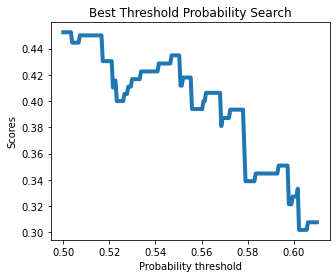

best threshold probability = 0.5
0.4523809523809524
0.4523809523809524


In [ ]:
# 3.11.4.калитбровка
predict_probas = pipe2.predict_proba(X_valid)
# show_proba_calibration_plots(predict_probas, y_valid, 0.1, 0.8, 20)
predict2, threshold_prob = update_predict_by_prob(y_valid, predict_probas, 0.5, 0.61, 200, score='f1', show_chart=True)
print(f1_score(y_valid, predict))
print(f1_score(y_valid, predict2))

In [ ]:
# 3.11.5. результаты
print(70*'-')
print(f'f1 on valid set = {f1_score(y_valid, predict)}')
print(f'f1 on valid set after calibrating = {f1_score(y_valid, predict2)}')
print(confusion_matrix(y_valid, predict2))
print(classification_report(y_valid, predict2))
label = pipeline_steps[-1][0]+'_tuned'
result_dict[label] = (accuracy_score(y_valid, predict2), f1_score(y_valid, predict2), best_params, threshold_prob)

----------------------------------------------------------------------
f1 on valid set = 0.4523809523809524
f1 on valid set after calibrating = 0.4523809523809524
[[35 38]
 [ 8 19]]
              precision    recall  f1-score   support

           0       0.81      0.48      0.60        73
           1       0.33      0.70      0.45        27

    accuracy                           0.54       100
   macro avg       0.57      0.59      0.53       100
weighted avg       0.68      0.54      0.56       100



### Настройка параметров модели  без Purpose

In [ ]:
cat_features = ['Home Ownership', 'Term']
eval_metric = 'F1'
X = df_train.drop('Credit Default', axis=1).drop('Purpose', axis=1)
y = df_train[['Credit Default']]

for col in feat_12.values:
    X.drop(col, axis=1, inplace=True)  

In [ ]:
X_train_reduced, X_valid, y_train_reduced, y_valid = train_test_split(X.iloc[:,:], y, test_size=100, random_state=37)
# X_train_scaled!
smote = SMOTE(sampling_strategy='auto', n_jobs=-1)
cv_ = KFold(n_splits=10, shuffle=True, random_state=42)

result_dict = dict()

In [ ]:
pipeline_steps = [
                   # ('oversampler', smote),
                    ('catboost', CatBoostClassifier(cat_features=cat_features,
                         eval_metric=eval_metric
                        ))
                     ]


param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [1e-1], #0.1
    'scale_pos_weight': [2, 2.7, 3, 3.2, 3.5],
    'max_depth': [4, 5, 6, 7],
    'reg_lambda': [0.3, 0.5, 0.7]
    }

print(f'CatBoost')
print(70*'-')
param_grid = parse_params(param_grid, pipeline_steps[-1][0])
pipe = SM_Pipeline(pipeline_steps)
grid = GridSearchCV(pipe, param_grid=param_grid, scoring='f1', cv=cv_)
_ = grid.fit(X_train_reduced, y_train_reduced)
best_model = grid.best_estimator_[-1]

CatBoost
----------------------------------------------------------------------
0:	learn: 0.5263158	total: 5.34ms	remaining: 262ms
1:	learn: 0.5190426	total: 8.46ms	remaining: 203ms
2:	learn: 0.4969373	total: 13.3ms	remaining: 208ms
3:	learn: 0.4924925	total: 15.9ms	remaining: 182ms
4:	learn: 0.4997646	total: 18.3ms	remaining: 165ms
5:	learn: 0.5007825	total: 22.8ms	remaining: 167ms
6:	learn: 0.4946372	total: 25.2ms	remaining: 155ms
7:	learn: 0.5072419	total: 27.8ms	remaining: 146ms
8:	learn: 0.5079951	total: 32.4ms	remaining: 148ms
9:	learn: 0.5072419	total: 35.2ms	remaining: 141ms
10:	learn: 0.5093034	total: 38.2ms	remaining: 135ms
11:	learn: 0.5114492	total: 40.8ms	remaining: 129ms
12:	learn: 0.5110186	total: 43.4ms	remaining: 123ms
13:	learn: 0.5106383	total: 47.1ms	remaining: 121ms
14:	learn: 0.5086634	total: 49.7ms	remaining: 116ms
15:	learn: 0.5120148	total: 54ms	remaining: 115ms
16:	learn: 0.5164869	total: 56.2ms	remaining: 109ms
17:	learn: 0.5152919	total: 58.9ms	remaining: 10

46:	learn: 0.5423522	total: 123ms	remaining: 7.83ms
47:	learn: 0.5425175	total: 125ms	remaining: 5.21ms
48:	learn: 0.5432700	total: 128ms	remaining: 2.61ms
49:	learn: 0.5462822	total: 130ms	remaining: 0us
0:	learn: 0.5240928	total: 4.43ms	remaining: 217ms
1:	learn: 0.4648991	total: 8.73ms	remaining: 210ms
2:	learn: 0.4819981	total: 14.6ms	remaining: 228ms
3:	learn: 0.4780980	total: 17.2ms	remaining: 198ms
4:	learn: 0.4784876	total: 19.7ms	remaining: 177ms
5:	learn: 0.4720946	total: 22ms	remaining: 161ms
6:	learn: 0.4683314	total: 24.2ms	remaining: 149ms
7:	learn: 0.4842003	total: 26.5ms	remaining: 139ms
8:	learn: 0.4884170	total: 31.3ms	remaining: 142ms
9:	learn: 0.4900322	total: 33.4ms	remaining: 134ms
10:	learn: 0.4992872	total: 35.8ms	remaining: 127ms
11:	learn: 0.5003954	total: 38.5ms	remaining: 122ms
12:	learn: 0.4932993	total: 40.4ms	remaining: 115ms
13:	learn: 0.4968072	total: 42.9ms	remaining: 110ms
14:	learn: 0.4993631	total: 45ms	remaining: 105ms
15:	learn: 0.5016669	total: 4

9:	learn: 0.4933695	total: 30.2ms	remaining: 121ms
10:	learn: 0.4948257	total: 32.5ms	remaining: 115ms
11:	learn: 0.4987326	total: 35ms	remaining: 111ms
12:	learn: 0.4969813	total: 37.3ms	remaining: 106ms
13:	learn: 0.4960993	total: 39.9ms	remaining: 103ms
14:	learn: 0.4996821	total: 42.3ms	remaining: 98.8ms
15:	learn: 0.5005558	total: 44.7ms	remaining: 95.1ms
16:	learn: 0.5009524	total: 47.3ms	remaining: 91.8ms
17:	learn: 0.5016648	total: 49.8ms	remaining: 88.5ms
18:	learn: 0.5018987	total: 52.3ms	remaining: 85.3ms
19:	learn: 0.5009488	total: 54.6ms	remaining: 82ms
20:	learn: 0.5014245	total: 56.8ms	remaining: 78.4ms
21:	learn: 0.5005530	total: 59.2ms	remaining: 75.3ms
22:	learn: 0.5013451	total: 61.6ms	remaining: 72.3ms
23:	learn: 0.5014209	total: 63.7ms	remaining: 69.1ms
24:	learn: 0.5032238	total: 65.8ms	remaining: 65.8ms
25:	learn: 0.5055809	total: 68ms	remaining: 62.7ms
26:	learn: 0.5081556	total: 70.1ms	remaining: 59.7ms
27:	learn: 0.5061301	total: 72.2ms	remaining: 56.7ms
28:	l

34:	learn: 0.6652988	total: 89.3ms	remaining: 38.3ms
35:	learn: 0.6665804	total: 92ms	remaining: 35.8ms
36:	learn: 0.6678348	total: 94.4ms	remaining: 33.2ms
37:	learn: 0.6685596	total: 97ms	remaining: 30.6ms
38:	learn: 0.6705450	total: 99.4ms	remaining: 28ms
39:	learn: 0.6693000	total: 102ms	remaining: 25.5ms
40:	learn: 0.6674790	total: 105ms	remaining: 23ms
41:	learn: 0.6700295	total: 107ms	remaining: 20.4ms
42:	learn: 0.6703380	total: 110ms	remaining: 17.9ms
43:	learn: 0.6709156	total: 112ms	remaining: 15.3ms
44:	learn: 0.6717209	total: 114ms	remaining: 12.7ms
45:	learn: 0.6723600	total: 116ms	remaining: 10.1ms
46:	learn: 0.6715960	total: 118ms	remaining: 7.56ms
47:	learn: 0.6717598	total: 121ms	remaining: 5.02ms
48:	learn: 0.6717608	total: 123ms	remaining: 2.5ms
49:	learn: 0.6707857	total: 125ms	remaining: 0us
0:	learn: 0.6556350	total: 6.13ms	remaining: 300ms
1:	learn: 0.6373631	total: 9.7ms	remaining: 233ms
2:	learn: 0.6326153	total: 15.8ms	remaining: 247ms
3:	learn: 0.6350256	tot

46:	learn: 0.6745173	total: 114ms	remaining: 7.27ms
47:	learn: 0.6754952	total: 116ms	remaining: 4.84ms
48:	learn: 0.6750188	total: 118ms	remaining: 2.41ms
49:	learn: 0.6758718	total: 120ms	remaining: 0us
0:	learn: 0.5706138	total: 4.03ms	remaining: 198ms
1:	learn: 0.6491916	total: 6.17ms	remaining: 148ms
2:	learn: 0.6446055	total: 10.2ms	remaining: 160ms
3:	learn: 0.6405748	total: 12.6ms	remaining: 145ms
4:	learn: 0.6392539	total: 15.3ms	remaining: 138ms
5:	learn: 0.6457655	total: 17.4ms	remaining: 128ms
6:	learn: 0.6443974	total: 19.7ms	remaining: 121ms
7:	learn: 0.6453429	total: 21.9ms	remaining: 115ms
8:	learn: 0.6424961	total: 26ms	remaining: 118ms
9:	learn: 0.6520916	total: 28.3ms	remaining: 113ms
10:	learn: 0.6506086	total: 30.7ms	remaining: 109ms
11:	learn: 0.6527506	total: 32.8ms	remaining: 104ms
12:	learn: 0.6521690	total: 34.7ms	remaining: 98.7ms
13:	learn: 0.6508685	total: 36.8ms	remaining: 94.5ms
14:	learn: 0.6456516	total: 38.9ms	remaining: 90.7ms
15:	learn: 0.6495808	tot

7:	learn: 0.6367666	total: 23.1ms	remaining: 121ms
8:	learn: 0.6372472	total: 28.3ms	remaining: 129ms
9:	learn: 0.6498269	total: 31ms	remaining: 124ms
10:	learn: 0.6519135	total: 33.6ms	remaining: 119ms
11:	learn: 0.6442245	total: 36.1ms	remaining: 114ms
12:	learn: 0.6434732	total: 39ms	remaining: 111ms
13:	learn: 0.6404491	total: 41.8ms	remaining: 108ms
14:	learn: 0.6379077	total: 44.4ms	remaining: 104ms
15:	learn: 0.6364432	total: 46.6ms	remaining: 99ms
16:	learn: 0.6409952	total: 48.9ms	remaining: 94.9ms
17:	learn: 0.6430141	total: 51ms	remaining: 90.7ms
18:	learn: 0.6473667	total: 53.1ms	remaining: 86.6ms
19:	learn: 0.6498389	total: 55.4ms	remaining: 83.1ms
20:	learn: 0.6526038	total: 57.8ms	remaining: 79.8ms
21:	learn: 0.6562286	total: 59.9ms	remaining: 76.2ms
22:	learn: 0.6535052	total: 62ms	remaining: 72.8ms
23:	learn: 0.6576986	total: 64.1ms	remaining: 69.5ms
24:	learn: 0.6561292	total: 66.3ms	remaining: 66.3ms
25:	learn: 0.6582360	total: 68.3ms	remaining: 63ms
26:	learn: 0.658

21:	learn: 0.7010003	total: 59ms	remaining: 75.1ms
22:	learn: 0.7027661	total: 61.1ms	remaining: 71.7ms
23:	learn: 0.7040577	total: 63.2ms	remaining: 68.5ms
24:	learn: 0.7025331	total: 66.2ms	remaining: 66.2ms
25:	learn: 0.7040864	total: 69ms	remaining: 63.7ms
26:	learn: 0.7012559	total: 71.3ms	remaining: 60.7ms
27:	learn: 0.7027323	total: 73.7ms	remaining: 57.9ms
28:	learn: 0.7008641	total: 76.5ms	remaining: 55.4ms
29:	learn: 0.7001024	total: 78.9ms	remaining: 52.6ms
30:	learn: 0.6997554	total: 81.2ms	remaining: 49.8ms
31:	learn: 0.7008264	total: 83.8ms	remaining: 47.1ms
32:	learn: 0.7031361	total: 86.6ms	remaining: 44.6ms
33:	learn: 0.7027155	total: 89.2ms	remaining: 42ms
34:	learn: 0.7031582	total: 91.3ms	remaining: 39.1ms
35:	learn: 0.7025406	total: 93.5ms	remaining: 36.3ms
36:	learn: 0.7021478	total: 95.8ms	remaining: 33.7ms
37:	learn: 0.7032100	total: 97.9ms	remaining: 30.9ms
38:	learn: 0.7038498	total: 100ms	remaining: 28.2ms
39:	learn: 0.7025061	total: 102ms	remaining: 25.6ms
4

3:	learn: 0.6904520	total: 16ms	remaining: 184ms
4:	learn: 0.6939535	total: 18.7ms	remaining: 168ms
5:	learn: 0.6882769	total: 21.3ms	remaining: 156ms
6:	learn: 0.6917669	total: 24.5ms	remaining: 151ms
7:	learn: 0.6892566	total: 27.6ms	remaining: 145ms
8:	learn: 0.6888059	total: 32.7ms	remaining: 149ms
9:	learn: 0.6924540	total: 35.6ms	remaining: 142ms
10:	learn: 0.6912640	total: 38.2ms	remaining: 135ms
11:	learn: 0.6936553	total: 40.6ms	remaining: 129ms
12:	learn: 0.6919056	total: 42.9ms	remaining: 122ms
13:	learn: 0.6930236	total: 45.5ms	remaining: 117ms
14:	learn: 0.6937963	total: 49.2ms	remaining: 115ms
15:	learn: 0.6934793	total: 51.7ms	remaining: 110ms
16:	learn: 0.6922710	total: 54.2ms	remaining: 105ms
17:	learn: 0.6931737	total: 56.8ms	remaining: 101ms
18:	learn: 0.6930804	total: 59.3ms	remaining: 96.8ms
19:	learn: 0.6918824	total: 61.9ms	remaining: 92.9ms
20:	learn: 0.6936944	total: 64.2ms	remaining: 88.7ms
21:	learn: 0.6921965	total: 66.5ms	remaining: 84.6ms
22:	learn: 0.6919

13:	learn: 0.6872797	total: 46.9ms	remaining: 121ms
14:	learn: 0.6900048	total: 50.1ms	remaining: 117ms
15:	learn: 0.6872587	total: 53ms	remaining: 113ms
16:	learn: 0.6864756	total: 56.2ms	remaining: 109ms
17:	learn: 0.6855474	total: 58.7ms	remaining: 104ms
18:	learn: 0.6876874	total: 61.3ms	remaining: 100ms
19:	learn: 0.6857699	total: 63.8ms	remaining: 95.8ms
20:	learn: 0.6865333	total: 66.9ms	remaining: 92.4ms
21:	learn: 0.6827485	total: 69.6ms	remaining: 88.6ms
22:	learn: 0.6877028	total: 71.9ms	remaining: 84.4ms
23:	learn: 0.6876525	total: 74.3ms	remaining: 80.5ms
24:	learn: 0.6873020	total: 76.4ms	remaining: 76.4ms
25:	learn: 0.6875560	total: 79ms	remaining: 72.9ms
26:	learn: 0.6878763	total: 81.5ms	remaining: 69.4ms
27:	learn: 0.6863433	total: 83.8ms	remaining: 65.8ms
28:	learn: 0.6877085	total: 86.4ms	remaining: 62.6ms
29:	learn: 0.6895879	total: 88.2ms	remaining: 58.8ms
30:	learn: 0.6909209	total: 90.6ms	remaining: 55.6ms
31:	learn: 0.6892950	total: 93.1ms	remaining: 52.4ms
32:

29:	learn: 0.7215051	total: 90.1ms	remaining: 60ms
30:	learn: 0.7209127	total: 93.7ms	remaining: 57.5ms
31:	learn: 0.7209464	total: 97.3ms	remaining: 54.7ms
32:	learn: 0.7218359	total: 99.7ms	remaining: 51.4ms
33:	learn: 0.7217661	total: 103ms	remaining: 48.4ms
34:	learn: 0.7221498	total: 106ms	remaining: 45.5ms
35:	learn: 0.7229334	total: 108ms	remaining: 42.2ms
36:	learn: 0.7233555	total: 111ms	remaining: 39ms
37:	learn: 0.7240344	total: 114ms	remaining: 36ms
38:	learn: 0.7247314	total: 117ms	remaining: 33ms
39:	learn: 0.7251849	total: 120ms	remaining: 29.9ms
40:	learn: 0.7250797	total: 122ms	remaining: 26.8ms
41:	learn: 0.7221334	total: 125ms	remaining: 23.7ms
42:	learn: 0.7221866	total: 127ms	remaining: 20.7ms
43:	learn: 0.7199532	total: 129ms	remaining: 17.6ms
44:	learn: 0.7206743	total: 132ms	remaining: 14.7ms
45:	learn: 0.7205857	total: 135ms	remaining: 11.7ms
46:	learn: 0.7207629	total: 137ms	remaining: 8.73ms
47:	learn: 0.7224523	total: 139ms	remaining: 5.8ms
48:	learn: 0.7216

3:	learn: 0.7090376	total: 17.7ms	remaining: 203ms
4:	learn: 0.7085177	total: 22.4ms	remaining: 201ms
5:	learn: 0.7028079	total: 24.6ms	remaining: 181ms
6:	learn: 0.7062518	total: 27.6ms	remaining: 169ms
7:	learn: 0.7057794	total: 30.5ms	remaining: 160ms
8:	learn: 0.7046790	total: 35.6ms	remaining: 162ms
9:	learn: 0.7041473	total: 38.9ms	remaining: 156ms
10:	learn: 0.7040215	total: 41.5ms	remaining: 147ms
11:	learn: 0.7060299	total: 44ms	remaining: 139ms
12:	learn: 0.7054005	total: 46.6ms	remaining: 133ms
13:	learn: 0.7054653	total: 49.2ms	remaining: 126ms
14:	learn: 0.7056720	total: 52ms	remaining: 121ms
15:	learn: 0.7074305	total: 55.2ms	remaining: 117ms
16:	learn: 0.7094161	total: 58.2ms	remaining: 113ms
17:	learn: 0.7080146	total: 61.1ms	remaining: 109ms
18:	learn: 0.7070573	total: 65.7ms	remaining: 107ms
19:	learn: 0.7072293	total: 68.6ms	remaining: 103ms
20:	learn: 0.7092421	total: 71.4ms	remaining: 98.5ms
21:	learn: 0.7088503	total: 73.8ms	remaining: 93.9ms
22:	learn: 0.7087376	

4:	learn: 0.7012187	total: 17.1ms	remaining: 154ms
5:	learn: 0.6988718	total: 19.6ms	remaining: 144ms
6:	learn: 0.7020720	total: 21.9ms	remaining: 135ms
7:	learn: 0.7019215	total: 24.6ms	remaining: 129ms
8:	learn: 0.7042448	total: 29.7ms	remaining: 135ms
9:	learn: 0.7041818	total: 32.4ms	remaining: 130ms
10:	learn: 0.7065594	total: 34.9ms	remaining: 124ms
11:	learn: 0.7051873	total: 37.6ms	remaining: 119ms
12:	learn: 0.7038805	total: 39.5ms	remaining: 112ms
13:	learn: 0.7033961	total: 41.6ms	remaining: 107ms
14:	learn: 0.7037850	total: 44.3ms	remaining: 103ms
15:	learn: 0.7025263	total: 47ms	remaining: 99.8ms
16:	learn: 0.7015572	total: 49.7ms	remaining: 96.4ms
17:	learn: 0.7005473	total: 52.3ms	remaining: 93ms
18:	learn: 0.7015981	total: 54.8ms	remaining: 89.5ms
19:	learn: 0.7025881	total: 57.2ms	remaining: 85.9ms
20:	learn: 0.7037827	total: 59.3ms	remaining: 81.8ms
21:	learn: 0.7032069	total: 61.8ms	remaining: 78.6ms
22:	learn: 0.7010856	total: 63.8ms	remaining: 74.9ms
23:	learn: 0.7

26:	learn: 0.7376610	total: 63.1ms	remaining: 53.8ms
27:	learn: 0.7383841	total: 65.3ms	remaining: 51.3ms
28:	learn: 0.7380470	total: 67.9ms	remaining: 49.1ms
29:	learn: 0.7393464	total: 70.1ms	remaining: 46.7ms
30:	learn: 0.7395864	total: 72.5ms	remaining: 44.5ms
31:	learn: 0.7406463	total: 74.9ms	remaining: 42.2ms
32:	learn: 0.7409879	total: 77.3ms	remaining: 39.8ms
33:	learn: 0.7406534	total: 80ms	remaining: 37.6ms
34:	learn: 0.7423512	total: 82.6ms	remaining: 35.4ms
35:	learn: 0.7432167	total: 84.8ms	remaining: 33ms
36:	learn: 0.7427409	total: 86.9ms	remaining: 30.5ms
37:	learn: 0.7422606	total: 88.9ms	remaining: 28.1ms
38:	learn: 0.7423093	total: 91.4ms	remaining: 25.8ms
39:	learn: 0.7435620	total: 93.6ms	remaining: 23.4ms
40:	learn: 0.7444758	total: 95.9ms	remaining: 21ms
41:	learn: 0.7438548	total: 98.2ms	remaining: 18.7ms
42:	learn: 0.7440103	total: 100ms	remaining: 16.4ms
43:	learn: 0.7439169	total: 103ms	remaining: 14ms
44:	learn: 0.7439169	total: 106ms	remaining: 11.7ms
45:	

49:	learn: 0.7412313	total: 118ms	remaining: 0us
0:	learn: 0.6994532	total: 5.34ms	remaining: 262ms
1:	learn: 0.7299814	total: 7.47ms	remaining: 179ms
2:	learn: 0.7226740	total: 11.4ms	remaining: 179ms
3:	learn: 0.7323879	total: 13.5ms	remaining: 155ms
4:	learn: 0.7330996	total: 15.6ms	remaining: 141ms
5:	learn: 0.7313536	total: 17.7ms	remaining: 130ms
6:	learn: 0.7328743	total: 19.9ms	remaining: 122ms
7:	learn: 0.7325715	total: 22.2ms	remaining: 117ms
8:	learn: 0.7308996	total: 28ms	remaining: 128ms
9:	learn: 0.7317795	total: 30.8ms	remaining: 123ms
10:	learn: 0.7314428	total: 33.9ms	remaining: 120ms
11:	learn: 0.7304668	total: 36.9ms	remaining: 117ms
12:	learn: 0.7311991	total: 39.4ms	remaining: 112ms
13:	learn: 0.7322214	total: 42.3ms	remaining: 109ms
14:	learn: 0.7335281	total: 44.6ms	remaining: 104ms
15:	learn: 0.7335260	total: 46.8ms	remaining: 99.3ms
16:	learn: 0.7349793	total: 49.2ms	remaining: 95.6ms
17:	learn: 0.7365759	total: 51.2ms	remaining: 91.1ms
18:	learn: 0.7360901	tot

10:	learn: 0.7279013	total: 31ms	remaining: 110ms
11:	learn: 0.7292440	total: 33.5ms	remaining: 106ms
12:	learn: 0.7288856	total: 35.7ms	remaining: 102ms
13:	learn: 0.7311421	total: 38ms	remaining: 97.7ms
14:	learn: 0.7296129	total: 40.4ms	remaining: 94.3ms
15:	learn: 0.7281754	total: 42.7ms	remaining: 90.8ms
16:	learn: 0.7294188	total: 45.1ms	remaining: 87.6ms
17:	learn: 0.7288322	total: 47.3ms	remaining: 84.1ms
18:	learn: 0.7282887	total: 49.9ms	remaining: 81.5ms
19:	learn: 0.7294720	total: 52.4ms	remaining: 78.6ms
20:	learn: 0.7308471	total: 54.6ms	remaining: 75.4ms
21:	learn: 0.7299615	total: 57.9ms	remaining: 73.7ms
22:	learn: 0.7305520	total: 61.4ms	remaining: 72ms
23:	learn: 0.7307501	total: 63.7ms	remaining: 69ms
24:	learn: 0.7319653	total: 66.2ms	remaining: 66.2ms
25:	learn: 0.7326041	total: 68.5ms	remaining: 63.2ms
26:	learn: 0.7321571	total: 71.3ms	remaining: 60.7ms
27:	learn: 0.7320109	total: 74ms	remaining: 58.1ms
28:	learn: 0.7318097	total: 76.5ms	remaining: 55.4ms
29:	le

21:	learn: 0.5242060	total: 59.7ms	remaining: 76ms
22:	learn: 0.5219535	total: 62.6ms	remaining: 73.5ms
23:	learn: 0.5265745	total: 65ms	remaining: 70.4ms
24:	learn: 0.5239852	total: 67.7ms	remaining: 67.7ms
25:	learn: 0.5240955	total: 70.4ms	remaining: 64.9ms
26:	learn: 0.5304747	total: 72.8ms	remaining: 62ms
27:	learn: 0.5336597	total: 75.4ms	remaining: 59.2ms
28:	learn: 0.5335775	total: 77.9ms	remaining: 56.4ms
29:	learn: 0.5328857	total: 80.1ms	remaining: 53.4ms
30:	learn: 0.5338220	total: 82.2ms	remaining: 50.4ms
31:	learn: 0.5350008	total: 84.5ms	remaining: 47.5ms
32:	learn: 0.5345538	total: 86.6ms	remaining: 44.6ms
33:	learn: 0.5351640	total: 89.7ms	remaining: 42.2ms
34:	learn: 0.5322309	total: 92.6ms	remaining: 39.7ms
35:	learn: 0.5322334	total: 95.3ms	remaining: 37.1ms
36:	learn: 0.5332926	total: 98.3ms	remaining: 34.5ms
37:	learn: 0.5352457	total: 101ms	remaining: 31.9ms
38:	learn: 0.5356925	total: 103ms	remaining: 29.1ms
39:	learn: 0.5342674	total: 106ms	remaining: 26.5ms
40

39:	learn: 0.5267692	total: 93.9ms	remaining: 23.5ms
40:	learn: 0.5284528	total: 96.2ms	remaining: 21.1ms
41:	learn: 0.5244184	total: 98.7ms	remaining: 18.8ms
42:	learn: 0.5242569	total: 101ms	remaining: 16.5ms
43:	learn: 0.5250347	total: 104ms	remaining: 14.1ms
44:	learn: 0.5266882	total: 106ms	remaining: 11.8ms
45:	learn: 0.5255385	total: 109ms	remaining: 9.44ms
46:	learn: 0.5259111	total: 111ms	remaining: 7.07ms
47:	learn: 0.5307563	total: 114ms	remaining: 4.74ms
48:	learn: 0.5346808	total: 116ms	remaining: 2.37ms
49:	learn: 0.5321073	total: 118ms	remaining: 0us
0:	learn: 0.5230724	total: 9.05ms	remaining: 444ms
1:	learn: 0.4690873	total: 12.7ms	remaining: 304ms
2:	learn: 0.4640264	total: 19.1ms	remaining: 300ms
3:	learn: 0.4651930	total: 22.2ms	remaining: 255ms
4:	learn: 0.4717814	total: 25.1ms	remaining: 226ms
5:	learn: 0.4721633	total: 27.7ms	remaining: 203ms
6:	learn: 0.4667322	total: 29.9ms	remaining: 184ms
7:	learn: 0.4691277	total: 32.1ms	remaining: 169ms
8:	learn: 0.4738903	

4:	learn: 0.4724409	total: 17.1ms	remaining: 154ms
5:	learn: 0.4738837	total: 19.4ms	remaining: 143ms
6:	learn: 0.4708210	total: 22.1ms	remaining: 135ms
7:	learn: 0.4901518	total: 24.7ms	remaining: 130ms
8:	learn: 0.4932735	total: 35.6ms	remaining: 162ms
9:	learn: 0.4951954	total: 38.8ms	remaining: 155ms
10:	learn: 0.4999204	total: 42.2ms	remaining: 150ms
11:	learn: 0.5026178	total: 44.6ms	remaining: 141ms
12:	learn: 0.4974425	total: 47.2ms	remaining: 134ms
13:	learn: 0.4959846	total: 49.8ms	remaining: 128ms
14:	learn: 0.4987979	total: 52ms	remaining: 121ms
15:	learn: 0.5007985	total: 54.3ms	remaining: 115ms
16:	learn: 0.5003989	total: 57.1ms	remaining: 111ms
17:	learn: 0.5018333	total: 59.6ms	remaining: 106ms
18:	learn: 0.5011171	total: 62.3ms	remaining: 102ms
19:	learn: 0.5017510	total: 65ms	remaining: 97.5ms
20:	learn: 0.5054037	total: 67.2ms	remaining: 92.8ms
21:	learn: 0.5050151	total: 69.5ms	remaining: 88.5ms
22:	learn: 0.5046937	total: 72ms	remaining: 84.5ms
23:	learn: 0.5039019

15:	learn: 0.6556591	total: 54.1ms	remaining: 115ms
16:	learn: 0.6573506	total: 56.7ms	remaining: 110ms
17:	learn: 0.6591464	total: 59.2ms	remaining: 105ms
18:	learn: 0.6588982	total: 61.6ms	remaining: 101ms
19:	learn: 0.6604906	total: 64ms	remaining: 96.1ms
20:	learn: 0.6656810	total: 66.5ms	remaining: 91.9ms
21:	learn: 0.6640310	total: 69ms	remaining: 87.9ms
22:	learn: 0.6647429	total: 71.9ms	remaining: 84.4ms
23:	learn: 0.6616835	total: 74.3ms	remaining: 80.5ms
24:	learn: 0.6623888	total: 77.1ms	remaining: 77.1ms
25:	learn: 0.6630944	total: 79.1ms	remaining: 73ms
26:	learn: 0.6678887	total: 81.2ms	remaining: 69.2ms
27:	learn: 0.6650604	total: 83.6ms	remaining: 65.7ms
28:	learn: 0.6666790	total: 85.7ms	remaining: 62ms
29:	learn: 0.6700694	total: 87.7ms	remaining: 58.5ms
30:	learn: 0.6699455	total: 89.7ms	remaining: 55ms
31:	learn: 0.6695515	total: 91.8ms	remaining: 51.6ms
32:	learn: 0.6702553	total: 93.9ms	remaining: 48.4ms
33:	learn: 0.6723070	total: 95.9ms	remaining: 45.1ms
34:	lea

6:	learn: 0.6484597	total: 27ms	remaining: 166ms
7:	learn: 0.6331949	total: 29.7ms	remaining: 156ms
8:	learn: 0.6321281	total: 35.1ms	remaining: 160ms
9:	learn: 0.6370160	total: 38.2ms	remaining: 153ms
10:	learn: 0.6339532	total: 41ms	remaining: 145ms
11:	learn: 0.6308214	total: 44.2ms	remaining: 140ms
12:	learn: 0.6302286	total: 47.1ms	remaining: 134ms
13:	learn: 0.6302695	total: 50.5ms	remaining: 130ms
14:	learn: 0.6328562	total: 56ms	remaining: 131ms
15:	learn: 0.6345882	total: 58.6ms	remaining: 125ms
16:	learn: 0.6351125	total: 62.1ms	remaining: 120ms
17:	learn: 0.6389411	total: 64.7ms	remaining: 115ms
18:	learn: 0.6431175	total: 67.9ms	remaining: 111ms
19:	learn: 0.6463519	total: 71.3ms	remaining: 107ms
20:	learn: 0.6521366	total: 74ms	remaining: 102ms
21:	learn: 0.6505338	total: 76.6ms	remaining: 97.5ms
22:	learn: 0.6516064	total: 79.5ms	remaining: 93.3ms
23:	learn: 0.6530902	total: 83.3ms	remaining: 90.2ms
24:	learn: 0.6549046	total: 86.1ms	remaining: 86.1ms
25:	learn: 0.6550241

22:	learn: 0.6461385	total: 61ms	remaining: 71.6ms
23:	learn: 0.6469594	total: 63.6ms	remaining: 68.9ms
24:	learn: 0.6490410	total: 66ms	remaining: 66ms
25:	learn: 0.6484418	total: 68.3ms	remaining: 63ms
26:	learn: 0.6512790	total: 70.6ms	remaining: 60.1ms
27:	learn: 0.6496968	total: 72.9ms	remaining: 57.3ms
28:	learn: 0.6495661	total: 75.4ms	remaining: 54.6ms
29:	learn: 0.6511923	total: 77.8ms	remaining: 51.9ms
30:	learn: 0.6550393	total: 80.1ms	remaining: 49.1ms
31:	learn: 0.6567687	total: 82.3ms	remaining: 46.3ms
32:	learn: 0.6571198	total: 84.5ms	remaining: 43.5ms
33:	learn: 0.6618851	total: 87ms	remaining: 41ms
34:	learn: 0.6631968	total: 89.4ms	remaining: 38.3ms
35:	learn: 0.6622826	total: 91.5ms	remaining: 35.6ms
36:	learn: 0.6637867	total: 94.1ms	remaining: 33.1ms
37:	learn: 0.6646280	total: 96.8ms	remaining: 30.6ms
38:	learn: 0.6644111	total: 98.9ms	remaining: 27.9ms
39:	learn: 0.6640040	total: 101ms	remaining: 25.2ms
40:	learn: 0.6659630	total: 103ms	remaining: 22.6ms
41:	lea

31:	learn: 0.7056038	total: 76.9ms	remaining: 43.3ms
32:	learn: 0.7042632	total: 79.3ms	remaining: 40.8ms
33:	learn: 0.7059382	total: 81.8ms	remaining: 38.5ms
34:	learn: 0.7060784	total: 84.2ms	remaining: 36.1ms
35:	learn: 0.7069472	total: 86.5ms	remaining: 33.7ms
36:	learn: 0.7066402	total: 89.6ms	remaining: 31.5ms
37:	learn: 0.7050394	total: 92ms	remaining: 29ms
38:	learn: 0.7052925	total: 94.1ms	remaining: 26.6ms
39:	learn: 0.7056015	total: 97ms	remaining: 24.2ms
40:	learn: 0.7054893	total: 99.1ms	remaining: 21.8ms
41:	learn: 0.7070322	total: 101ms	remaining: 19.3ms
42:	learn: 0.7059105	total: 103ms	remaining: 16.8ms
43:	learn: 0.7072607	total: 106ms	remaining: 14.4ms
44:	learn: 0.7084959	total: 108ms	remaining: 12ms
45:	learn: 0.7085523	total: 110ms	remaining: 9.58ms
46:	learn: 0.7088305	total: 113ms	remaining: 7.18ms
47:	learn: 0.7109661	total: 115ms	remaining: 4.79ms
48:	learn: 0.7109661	total: 117ms	remaining: 2.4ms
49:	learn: 0.7099237	total: 120ms	remaining: 0us
0:	learn: 0.67

0:	learn: 0.6845419	total: 4.99ms	remaining: 244ms
1:	learn: 0.6961225	total: 8.63ms	remaining: 207ms
2:	learn: 0.6961199	total: 13.9ms	remaining: 218ms
3:	learn: 0.6955986	total: 16.4ms	remaining: 189ms
4:	learn: 0.6906710	total: 19.3ms	remaining: 174ms
5:	learn: 0.6900853	total: 21.4ms	remaining: 157ms
6:	learn: 0.6925961	total: 23.8ms	remaining: 146ms
7:	learn: 0.6895791	total: 26ms	remaining: 136ms
8:	learn: 0.6894542	total: 30.3ms	remaining: 138ms
9:	learn: 0.6882283	total: 32.4ms	remaining: 130ms
10:	learn: 0.6879619	total: 34.6ms	remaining: 123ms
11:	learn: 0.6914726	total: 36.7ms	remaining: 116ms
12:	learn: 0.6911094	total: 38.8ms	remaining: 110ms
13:	learn: 0.6894306	total: 41.3ms	remaining: 106ms
14:	learn: 0.6909062	total: 43.4ms	remaining: 101ms
15:	learn: 0.6923628	total: 45.5ms	remaining: 96.7ms
16:	learn: 0.6900912	total: 47.9ms	remaining: 92.9ms
17:	learn: 0.6900048	total: 50ms	remaining: 88.9ms
18:	learn: 0.6890811	total: 52ms	remaining: 84.9ms
19:	learn: 0.6891301	tot

16:	learn: 0.6783298	total: 47.5ms	remaining: 92.2ms
17:	learn: 0.6802699	total: 49.7ms	remaining: 88.3ms
18:	learn: 0.6810359	total: 52ms	remaining: 84.8ms
19:	learn: 0.6835318	total: 54.9ms	remaining: 82.4ms
20:	learn: 0.6830269	total: 58.1ms	remaining: 80.2ms
21:	learn: 0.6850956	total: 61.3ms	remaining: 78ms
22:	learn: 0.6858553	total: 63.6ms	remaining: 74.7ms
23:	learn: 0.6868720	total: 65.9ms	remaining: 71.3ms
24:	learn: 0.6916837	total: 68.3ms	remaining: 68.3ms
25:	learn: 0.6915321	total: 70.4ms	remaining: 65ms
26:	learn: 0.6929508	total: 72.5ms	remaining: 61.8ms
27:	learn: 0.6927237	total: 74.8ms	remaining: 58.8ms
28:	learn: 0.6938943	total: 77ms	remaining: 55.8ms
29:	learn: 0.6956451	total: 81ms	remaining: 54ms
30:	learn: 0.6931762	total: 83.1ms	remaining: 51ms
31:	learn: 0.6941013	total: 85.5ms	remaining: 48.1ms
32:	learn: 0.6938175	total: 87.6ms	remaining: 45.1ms
33:	learn: 0.6944217	total: 90.3ms	remaining: 42.5ms
34:	learn: 0.6947214	total: 92.4ms	remaining: 39.6ms
35:	lea

34:	learn: 0.7211558	total: 92.4ms	remaining: 39.6ms
35:	learn: 0.7217552	total: 94.8ms	remaining: 36.9ms
36:	learn: 0.7222312	total: 97.3ms	remaining: 34.2ms
37:	learn: 0.7213672	total: 100ms	remaining: 31.7ms
38:	learn: 0.7219315	total: 103ms	remaining: 29ms
39:	learn: 0.7233070	total: 106ms	remaining: 26.4ms
40:	learn: 0.7228301	total: 108ms	remaining: 23.7ms
41:	learn: 0.7226548	total: 110ms	remaining: 21ms
42:	learn: 0.7211188	total: 113ms	remaining: 18.3ms
43:	learn: 0.7215253	total: 115ms	remaining: 15.6ms
44:	learn: 0.7223030	total: 117ms	remaining: 13ms
45:	learn: 0.7213838	total: 119ms	remaining: 10.3ms
46:	learn: 0.7226034	total: 121ms	remaining: 7.7ms
47:	learn: 0.7228158	total: 123ms	remaining: 5.11ms
48:	learn: 0.7236287	total: 125ms	remaining: 2.55ms
49:	learn: 0.7239670	total: 127ms	remaining: 0us
0:	learn: 0.7078978	total: 5.04ms	remaining: 247ms
1:	learn: 0.6948764	total: 7.64ms	remaining: 183ms
2:	learn: 0.7008270	total: 12.1ms	remaining: 189ms
3:	learn: 0.7000104	to

6:	learn: 0.7113789	total: 21.7ms	remaining: 134ms
7:	learn: 0.7115136	total: 24.4ms	remaining: 128ms
8:	learn: 0.7082055	total: 29.8ms	remaining: 136ms
9:	learn: 0.7084201	total: 32.3ms	remaining: 129ms
10:	learn: 0.7087471	total: 35.7ms	remaining: 126ms
11:	learn: 0.7121228	total: 38.3ms	remaining: 121ms
12:	learn: 0.7111008	total: 40.5ms	remaining: 115ms
13:	learn: 0.7118236	total: 42.9ms	remaining: 110ms
14:	learn: 0.7114018	total: 44.9ms	remaining: 105ms
15:	learn: 0.7095748	total: 47ms	remaining: 99.9ms
16:	learn: 0.7084716	total: 49.3ms	remaining: 95.6ms
17:	learn: 0.7113091	total: 51.3ms	remaining: 91.2ms
18:	learn: 0.7096546	total: 53.3ms	remaining: 87ms
19:	learn: 0.7114678	total: 55.3ms	remaining: 83ms
20:	learn: 0.7132902	total: 57.7ms	remaining: 79.6ms
21:	learn: 0.7143718	total: 59.7ms	remaining: 76ms
22:	learn: 0.7151731	total: 62.6ms	remaining: 73.5ms
23:	learn: 0.7139645	total: 64.6ms	remaining: 70ms
24:	learn: 0.7147127	total: 66.7ms	remaining: 66.7ms
25:	learn: 0.714

30:	learn: 0.7070341	total: 72.8ms	remaining: 44.6ms
31:	learn: 0.7071186	total: 75.4ms	remaining: 42.4ms
32:	learn: 0.7074904	total: 78.3ms	remaining: 40.3ms
33:	learn: 0.7082176	total: 80.7ms	remaining: 38ms
34:	learn: 0.7090947	total: 83.3ms	remaining: 35.7ms
35:	learn: 0.7096320	total: 86.8ms	remaining: 33.8ms
36:	learn: 0.7100039	total: 89.7ms	remaining: 31.5ms
37:	learn: 0.7098641	total: 92.5ms	remaining: 29.2ms
38:	learn: 0.7099804	total: 94.9ms	remaining: 26.8ms
39:	learn: 0.7114843	total: 97.1ms	remaining: 24.3ms
40:	learn: 0.7106423	total: 99.5ms	remaining: 21.8ms
41:	learn: 0.7119421	total: 102ms	remaining: 19.4ms
42:	learn: 0.7112710	total: 104ms	remaining: 16.9ms
43:	learn: 0.7105460	total: 106ms	remaining: 14.4ms
44:	learn: 0.7121669	total: 108ms	remaining: 12ms
45:	learn: 0.7124109	total: 110ms	remaining: 9.58ms
46:	learn: 0.7128915	total: 112ms	remaining: 7.17ms
47:	learn: 0.7130343	total: 115ms	remaining: 4.78ms
48:	learn: 0.7124037	total: 117ms	remaining: 2.38ms
49:	l

47:	learn: 0.7418961	total: 112ms	remaining: 4.65ms
48:	learn: 0.7420429	total: 114ms	remaining: 2.33ms
49:	learn: 0.7441661	total: 117ms	remaining: 0us
0:	learn: 0.7213322	total: 4.08ms	remaining: 200ms
1:	learn: 0.7074663	total: 6.21ms	remaining: 149ms
2:	learn: 0.7239950	total: 10.4ms	remaining: 163ms
3:	learn: 0.7139647	total: 12.6ms	remaining: 144ms
4:	learn: 0.7256309	total: 14.8ms	remaining: 133ms
5:	learn: 0.7235263	total: 16.9ms	remaining: 124ms
6:	learn: 0.7253259	total: 19ms	remaining: 117ms
7:	learn: 0.7254974	total: 21.2ms	remaining: 111ms
8:	learn: 0.7262167	total: 25.5ms	remaining: 116ms
9:	learn: 0.7247191	total: 28.8ms	remaining: 115ms
10:	learn: 0.7271151	total: 31.3ms	remaining: 111ms
11:	learn: 0.7295008	total: 34.5ms	remaining: 109ms
12:	learn: 0.7294571	total: 37ms	remaining: 105ms
13:	learn: 0.7295101	total: 40ms	remaining: 103ms
14:	learn: 0.7303904	total: 42.8ms	remaining: 99.8ms
15:	learn: 0.7295539	total: 45.3ms	remaining: 96.2ms
16:	learn: 0.7317202	total: 4

8:	learn: 0.7308515	total: 24.8ms	remaining: 113ms
9:	learn: 0.7317795	total: 27.5ms	remaining: 110ms
10:	learn: 0.7314909	total: 30ms	remaining: 106ms
11:	learn: 0.7304668	total: 32.5ms	remaining: 103ms
12:	learn: 0.7314428	total: 34.7ms	remaining: 98.6ms
13:	learn: 0.7321733	total: 37.2ms	remaining: 95.8ms
14:	learn: 0.7335281	total: 39.7ms	remaining: 92.7ms
15:	learn: 0.7334779	total: 42.7ms	remaining: 90.8ms
16:	learn: 0.7349793	total: 45.3ms	remaining: 88ms
17:	learn: 0.7364792	total: 47.4ms	remaining: 84.3ms
18:	learn: 0.7360416	total: 49.5ms	remaining: 80.7ms
19:	learn: 0.7329213	total: 51.5ms	remaining: 77.3ms
20:	learn: 0.7352126	total: 53.5ms	remaining: 73.9ms
21:	learn: 0.7371087	total: 55.6ms	remaining: 70.7ms
22:	learn: 0.7371571	total: 57.7ms	remaining: 67.8ms
23:	learn: 0.7363328	total: 59.8ms	remaining: 64.8ms
24:	learn: 0.7359916	total: 61.8ms	remaining: 61.8ms
25:	learn: 0.7378372	total: 64ms	remaining: 59ms
26:	learn: 0.7373041	total: 67.2ms	remaining: 57.2ms
27:	lea

7:	learn: 0.7283642	total: 22.7ms	remaining: 119ms
8:	learn: 0.7301831	total: 27.3ms	remaining: 125ms
9:	learn: 0.7298335	total: 30ms	remaining: 120ms
10:	learn: 0.7310863	total: 32.9ms	remaining: 117ms
11:	learn: 0.7316114	total: 35.7ms	remaining: 113ms
12:	learn: 0.7314685	total: 38ms	remaining: 108ms
13:	learn: 0.7326963	total: 40.3ms	remaining: 104ms
14:	learn: 0.7314164	total: 42.9ms	remaining: 100ms
15:	learn: 0.7310717	total: 45.4ms	remaining: 96.5ms
16:	learn: 0.7319166	total: 47.8ms	remaining: 92.7ms
17:	learn: 0.7329965	total: 50ms	remaining: 88.9ms
18:	learn: 0.7325012	total: 53ms	remaining: 86.4ms
19:	learn: 0.7335371	total: 55.2ms	remaining: 82.7ms
20:	learn: 0.7348643	total: 58.2ms	remaining: 80.4ms
21:	learn: 0.7344719	total: 61.1ms	remaining: 77.7ms
22:	learn: 0.7353517	total: 63.5ms	remaining: 74.5ms
23:	learn: 0.7358903	total: 66.6ms	remaining: 72.1ms
24:	learn: 0.7364272	total: 69ms	remaining: 69ms
25:	learn: 0.7353498	total: 71.6ms	remaining: 66.1ms
26:	learn: 0.735

19:	learn: 0.5164305	total: 62.3ms	remaining: 93.5ms
20:	learn: 0.5176984	total: 64.9ms	remaining: 89.7ms
21:	learn: 0.5202797	total: 67.3ms	remaining: 85.6ms
22:	learn: 0.5177349	total: 69.6ms	remaining: 81.7ms
23:	learn: 0.5180573	total: 72.2ms	remaining: 78.2ms
24:	learn: 0.5198444	total: 74.7ms	remaining: 74.7ms
25:	learn: 0.5211180	total: 77.1ms	remaining: 71.2ms
26:	learn: 0.5233877	total: 79.2ms	remaining: 67.5ms
27:	learn: 0.5238686	total: 81.8ms	remaining: 64.3ms
28:	learn: 0.5233297	total: 83.9ms	remaining: 60.8ms
29:	learn: 0.5222239	total: 86.1ms	remaining: 57.4ms
30:	learn: 0.5229769	total: 88.9ms	remaining: 54.5ms
31:	learn: 0.5251276	total: 91.4ms	remaining: 51.4ms
32:	learn: 0.5250965	total: 94ms	remaining: 48.4ms
33:	learn: 0.5249652	total: 96.5ms	remaining: 45.4ms
34:	learn: 0.5227625	total: 100ms	remaining: 43ms
35:	learn: 0.5241848	total: 103ms	remaining: 40ms
36:	learn: 0.5258129	total: 105ms	remaining: 36.9ms
37:	learn: 0.5298909	total: 108ms	remaining: 34ms
38:	l

38:	learn: 0.5195696	total: 89.6ms	remaining: 25.3ms
39:	learn: 0.5213329	total: 91.8ms	remaining: 23ms
40:	learn: 0.5250582	total: 94.4ms	remaining: 20.7ms
41:	learn: 0.5268051	total: 96.7ms	remaining: 18.4ms
42:	learn: 0.5282083	total: 98.9ms	remaining: 16.1ms
43:	learn: 0.5313950	total: 101ms	remaining: 13.8ms
44:	learn: 0.5313175	total: 103ms	remaining: 11.5ms
45:	learn: 0.5317277	total: 106ms	remaining: 9.18ms
46:	learn: 0.5320167	total: 108ms	remaining: 6.88ms
47:	learn: 0.5353458	total: 110ms	remaining: 4.59ms
48:	learn: 0.5373501	total: 112ms	remaining: 2.29ms
49:	learn: 0.5393949	total: 114ms	remaining: 0us
0:	learn: 0.5157767	total: 3.97ms	remaining: 195ms
1:	learn: 0.4722542	total: 6.08ms	remaining: 146ms
2:	learn: 0.4915417	total: 10.1ms	remaining: 158ms
3:	learn: 0.4881334	total: 12.1ms	remaining: 139ms
4:	learn: 0.5006305	total: 14.2ms	remaining: 128ms
5:	learn: 0.5014155	total: 16.3ms	remaining: 120ms
6:	learn: 0.4996841	total: 18.5ms	remaining: 114ms
7:	learn: 0.5091929

3:	learn: 0.4891252	total: 12.7ms	remaining: 146ms
4:	learn: 0.5085911	total: 15.6ms	remaining: 140ms
5:	learn: 0.5023727	total: 18.3ms	remaining: 134ms
6:	learn: 0.4988055	total: 20.9ms	remaining: 129ms
7:	learn: 0.5105445	total: 24.2ms	remaining: 127ms
8:	learn: 0.5090224	total: 29.4ms	remaining: 134ms
9:	learn: 0.5094103	total: 32.1ms	remaining: 128ms
10:	learn: 0.5103189	total: 35.6ms	remaining: 126ms
11:	learn: 0.5109170	total: 37.7ms	remaining: 119ms
12:	learn: 0.5120999	total: 40.2ms	remaining: 115ms
13:	learn: 0.5123863	total: 42.7ms	remaining: 110ms
14:	learn: 0.5120000	total: 45.5ms	remaining: 106ms
15:	learn: 0.5139280	total: 48.8ms	remaining: 104ms
16:	learn: 0.5122104	total: 51.3ms	remaining: 99.6ms
17:	learn: 0.5136697	total: 54.8ms	remaining: 97.5ms
18:	learn: 0.5147772	total: 58ms	remaining: 94.6ms
19:	learn: 0.5170747	total: 60.7ms	remaining: 91ms
20:	learn: 0.5175000	total: 62.9ms	remaining: 86.9ms
21:	learn: 0.5183450	total: 65.3ms	remaining: 83.1ms
22:	learn: 0.5200

22:	learn: 0.6572723	total: 61.8ms	remaining: 72.5ms
23:	learn: 0.6530128	total: 65.3ms	remaining: 70.8ms
24:	learn: 0.6566425	total: 68.1ms	remaining: 68.1ms
25:	learn: 0.6574234	total: 72ms	remaining: 66.5ms
26:	learn: 0.6601043	total: 75.3ms	remaining: 64.1ms
27:	learn: 0.6605380	total: 78.3ms	remaining: 61.5ms
28:	learn: 0.6605411	total: 81.5ms	remaining: 59ms
29:	learn: 0.6600443	total: 84.2ms	remaining: 56.1ms
30:	learn: 0.6600767	total: 87.3ms	remaining: 53.5ms
31:	learn: 0.6590174	total: 89.9ms	remaining: 50.6ms
32:	learn: 0.6615034	total: 92.6ms	remaining: 47.7ms
33:	learn: 0.6631106	total: 95.3ms	remaining: 44.8ms
34:	learn: 0.6636031	total: 98.3ms	remaining: 42.1ms
35:	learn: 0.6633532	total: 101ms	remaining: 39.3ms
36:	learn: 0.6631731	total: 103ms	remaining: 36.3ms
37:	learn: 0.6624299	total: 106ms	remaining: 33.6ms
38:	learn: 0.6636656	total: 110ms	remaining: 31ms
39:	learn: 0.6652215	total: 112ms	remaining: 28.1ms
40:	learn: 0.6645150	total: 115ms	remaining: 25.3ms
41:	l

30:	learn: 0.6623927	total: 89ms	remaining: 54.5ms
31:	learn: 0.6587984	total: 91.8ms	remaining: 51.6ms
32:	learn: 0.6563327	total: 94.2ms	remaining: 48.6ms
33:	learn: 0.6587050	total: 97.3ms	remaining: 45.8ms
34:	learn: 0.6584555	total: 100ms	remaining: 43ms
35:	learn: 0.6596100	total: 103ms	remaining: 40ms
36:	learn: 0.6617847	total: 105ms	remaining: 37ms
37:	learn: 0.6604177	total: 108ms	remaining: 34.1ms
38:	learn: 0.6596707	total: 112ms	remaining: 31.5ms
39:	learn: 0.6607597	total: 114ms	remaining: 28.6ms
40:	learn: 0.6628640	total: 117ms	remaining: 25.8ms
41:	learn: 0.6630864	total: 120ms	remaining: 22.9ms
42:	learn: 0.6635522	total: 123ms	remaining: 19.9ms
43:	learn: 0.6621943	total: 125ms	remaining: 17ms
44:	learn: 0.6626549	total: 127ms	remaining: 14.1ms
45:	learn: 0.6649692	total: 130ms	remaining: 11.3ms
46:	learn: 0.6648798	total: 132ms	remaining: 8.46ms
47:	learn: 0.6660550	total: 135ms	remaining: 5.64ms
48:	learn: 0.6647176	total: 138ms	remaining: 2.82ms
49:	learn: 0.66533

13:	learn: 0.6483571	total: 43.5ms	remaining: 112ms
14:	learn: 0.6436202	total: 46.3ms	remaining: 108ms
15:	learn: 0.6485985	total: 49.5ms	remaining: 105ms
16:	learn: 0.6478936	total: 52.8ms	remaining: 102ms
17:	learn: 0.6484892	total: 55.6ms	remaining: 98.9ms
18:	learn: 0.6529738	total: 58.3ms	remaining: 95.2ms
19:	learn: 0.6556643	total: 61ms	remaining: 91.5ms
20:	learn: 0.6559224	total: 63.7ms	remaining: 87.9ms
21:	learn: 0.6550975	total: 66.8ms	remaining: 85ms
22:	learn: 0.6553523	total: 69.1ms	remaining: 81.1ms
23:	learn: 0.6572654	total: 71.9ms	remaining: 77.8ms
24:	learn: 0.6590820	total: 74.3ms	remaining: 74.3ms
25:	learn: 0.6591121	total: 76.9ms	remaining: 70.9ms
26:	learn: 0.6600827	total: 79.7ms	remaining: 67.9ms
27:	learn: 0.6630098	total: 82.1ms	remaining: 64.5ms
28:	learn: 0.6639721	total: 84.9ms	remaining: 61.4ms
29:	learn: 0.6649593	total: 90.9ms	remaining: 60.6ms
30:	learn: 0.6682552	total: 93.8ms	remaining: 57.5ms
31:	learn: 0.6684049	total: 96.4ms	remaining: 54.2ms
3

1:	learn: 0.6885555	total: 8.67ms	remaining: 208ms
2:	learn: 0.6925420	total: 13.6ms	remaining: 214ms
3:	learn: 0.6906103	total: 16.3ms	remaining: 187ms
4:	learn: 0.6871243	total: 19.8ms	remaining: 178ms
5:	learn: 0.6894981	total: 23.5ms	remaining: 172ms
6:	learn: 0.6939384	total: 26.2ms	remaining: 161ms
7:	learn: 0.6932645	total: 34ms	remaining: 179ms
8:	learn: 0.6916509	total: 39.9ms	remaining: 182ms
9:	learn: 0.6940193	total: 42.3ms	remaining: 169ms
10:	learn: 0.6962940	total: 45.1ms	remaining: 160ms
11:	learn: 0.6944641	total: 47.4ms	remaining: 150ms
12:	learn: 0.6937810	total: 49.8ms	remaining: 142ms
13:	learn: 0.6926544	total: 52.7ms	remaining: 136ms
14:	learn: 0.6934602	total: 56.1ms	remaining: 131ms
15:	learn: 0.6940935	total: 59ms	remaining: 125ms
16:	learn: 0.6950872	total: 61.8ms	remaining: 120ms
17:	learn: 0.6967925	total: 63.9ms	remaining: 114ms
18:	learn: 0.6967955	total: 66.6ms	remaining: 109ms
19:	learn: 0.6955836	total: 70ms	remaining: 105ms
20:	learn: 0.6994183	total:

12:	learn: 0.6955840	total: 40.5ms	remaining: 115ms
13:	learn: 0.6945824	total: 42.9ms	remaining: 110ms
14:	learn: 0.6958310	total: 45.4ms	remaining: 106ms
15:	learn: 0.6987270	total: 47.8ms	remaining: 102ms
16:	learn: 0.7007813	total: 50.3ms	remaining: 97.7ms
17:	learn: 0.6993291	total: 52.8ms	remaining: 93.9ms
18:	learn: 0.7016807	total: 55.1ms	remaining: 89.9ms
19:	learn: 0.7005076	total: 57.7ms	remaining: 86.5ms
20:	learn: 0.7017434	total: 60.5ms	remaining: 83.6ms
21:	learn: 0.6994501	total: 63.1ms	remaining: 80.3ms
22:	learn: 0.7011639	total: 65.6ms	remaining: 77ms
23:	learn: 0.7011820	total: 67.8ms	remaining: 73.5ms
24:	learn: 0.7030770	total: 70.3ms	remaining: 70.3ms
25:	learn: 0.7024552	total: 72.5ms	remaining: 66.9ms
26:	learn: 0.7014406	total: 75.1ms	remaining: 64ms
27:	learn: 0.7028138	total: 77.8ms	remaining: 61.1ms
28:	learn: 0.7020014	total: 80.5ms	remaining: 58.3ms
29:	learn: 0.7032950	total: 82.7ms	remaining: 55.1ms
30:	learn: 0.7025406	total: 85.3ms	remaining: 52.3ms
3

32:	learn: 0.6977651	total: 91ms	remaining: 46.9ms
33:	learn: 0.6979353	total: 93.7ms	remaining: 44.1ms
34:	learn: 0.6990339	total: 96.2ms	remaining: 41.2ms
35:	learn: 0.6980488	total: 98.9ms	remaining: 38.5ms
36:	learn: 0.7000733	total: 102ms	remaining: 35.7ms
37:	learn: 0.7007085	total: 104ms	remaining: 32.9ms
38:	learn: 0.7030755	total: 107ms	remaining: 30.1ms
39:	learn: 0.7026457	total: 109ms	remaining: 27.2ms
40:	learn: 0.7031326	total: 111ms	remaining: 24.4ms
41:	learn: 0.7035656	total: 113ms	remaining: 21.6ms
42:	learn: 0.7050814	total: 116ms	remaining: 18.9ms
43:	learn: 0.7046506	total: 118ms	remaining: 16.1ms
44:	learn: 0.7038452	total: 121ms	remaining: 13.4ms
45:	learn: 0.7034685	total: 123ms	remaining: 10.7ms
46:	learn: 0.7029227	total: 125ms	remaining: 7.98ms
47:	learn: 0.7013878	total: 127ms	remaining: 5.31ms
48:	learn: 0.7032590	total: 130ms	remaining: 2.65ms
49:	learn: 0.7036916	total: 133ms	remaining: 0us
0:	learn: 0.7030254	total: 4.19ms	remaining: 206ms
1:	learn: 0.69

8:	learn: 0.7134688	total: 26.7ms	remaining: 122ms
9:	learn: 0.7112557	total: 30ms	remaining: 120ms
10:	learn: 0.7119660	total: 32.2ms	remaining: 114ms
11:	learn: 0.7123747	total: 34.9ms	remaining: 110ms
12:	learn: 0.7106779	total: 37.2ms	remaining: 106ms
13:	learn: 0.7123089	total: 39.5ms	remaining: 101ms
14:	learn: 0.7111318	total: 42.1ms	remaining: 98.3ms
15:	learn: 0.7116586	total: 44.5ms	remaining: 94.7ms
16:	learn: 0.7145929	total: 47.1ms	remaining: 91.5ms
17:	learn: 0.7140839	total: 50.8ms	remaining: 90.3ms
18:	learn: 0.7142940	total: 53.2ms	remaining: 86.9ms
19:	learn: 0.7169603	total: 55.4ms	remaining: 83.1ms
20:	learn: 0.7183635	total: 57.6ms	remaining: 79.6ms
21:	learn: 0.7190279	total: 59.8ms	remaining: 76.1ms
22:	learn: 0.7175412	total: 61.9ms	remaining: 72.7ms
23:	learn: 0.7175854	total: 64ms	remaining: 69.4ms
24:	learn: 0.7173288	total: 66.6ms	remaining: 66.6ms
25:	learn: 0.7181413	total: 69ms	remaining: 63.7ms
26:	learn: 0.7173347	total: 71.4ms	remaining: 60.8ms
27:	lea

34:	learn: 0.7206932	total: 81.8ms	remaining: 35.1ms
35:	learn: 0.7211016	total: 84.7ms	remaining: 33ms
36:	learn: 0.7214723	total: 87.1ms	remaining: 30.6ms
37:	learn: 0.7198422	total: 89.6ms	remaining: 28.3ms
38:	learn: 0.7195038	total: 91.9ms	remaining: 25.9ms
39:	learn: 0.7214885	total: 94.8ms	remaining: 23.7ms
40:	learn: 0.7224831	total: 97.9ms	remaining: 21.5ms
41:	learn: 0.7220392	total: 100ms	remaining: 19.1ms
42:	learn: 0.7223060	total: 104ms	remaining: 16.9ms
43:	learn: 0.7222173	total: 106ms	remaining: 14.4ms
44:	learn: 0.7230007	total: 108ms	remaining: 12ms
45:	learn: 0.7215765	total: 110ms	remaining: 9.59ms
46:	learn: 0.7234445	total: 112ms	remaining: 7.17ms
47:	learn: 0.7246373	total: 114ms	remaining: 4.76ms
48:	learn: 0.7242818	total: 117ms	remaining: 2.38ms
49:	learn: 0.7236240	total: 119ms	remaining: 0us
0:	learn: 0.6874189	total: 4.67ms	remaining: 229ms
1:	learn: 0.6960192	total: 7.16ms	remaining: 172ms
2:	learn: 0.6934456	total: 12.4ms	remaining: 194ms
3:	learn: 0.692

0:	learn: 0.7272491	total: 4.02ms	remaining: 197ms
1:	learn: 0.7195824	total: 6.29ms	remaining: 151ms
2:	learn: 0.7313806	total: 10.4ms	remaining: 164ms
3:	learn: 0.7295285	total: 12.6ms	remaining: 145ms
4:	learn: 0.7280572	total: 14.7ms	remaining: 132ms
5:	learn: 0.7310561	total: 16.9ms	remaining: 124ms
6:	learn: 0.7331580	total: 19.1ms	remaining: 117ms
7:	learn: 0.7341231	total: 21.3ms	remaining: 112ms
8:	learn: 0.7325022	total: 25.5ms	remaining: 116ms
9:	learn: 0.7343578	total: 27.7ms	remaining: 111ms
10:	learn: 0.7346490	total: 29.8ms	remaining: 106ms
11:	learn: 0.7344560	total: 32.1ms	remaining: 102ms
12:	learn: 0.7323834	total: 34ms	remaining: 96.7ms
13:	learn: 0.7331535	total: 36.1ms	remaining: 92.9ms
14:	learn: 0.7337278	total: 38.7ms	remaining: 90.2ms
15:	learn: 0.7341624	total: 41.5ms	remaining: 88.2ms
16:	learn: 0.7355501	total: 44.1ms	remaining: 85.6ms
17:	learn: 0.7385623	total: 46.7ms	remaining: 83ms
18:	learn: 0.7384196	total: 49.2ms	remaining: 80.3ms
19:	learn: 0.738562

24:	learn: 0.7387246	total: 67.4ms	remaining: 67.4ms
25:	learn: 0.7399248	total: 69.9ms	remaining: 64.6ms
26:	learn: 0.7413675	total: 72.3ms	remaining: 61.6ms
27:	learn: 0.7413246	total: 74.9ms	remaining: 58.9ms
28:	learn: 0.7420980	total: 77.3ms	remaining: 56ms
29:	learn: 0.7431076	total: 79.4ms	remaining: 52.9ms
30:	learn: 0.7429132	total: 80.8ms	remaining: 49.5ms
31:	learn: 0.7437271	total: 83.3ms	remaining: 46.9ms
32:	learn: 0.7453672	total: 85.8ms	remaining: 44.2ms
33:	learn: 0.7453132	total: 88.5ms	remaining: 41.6ms
34:	learn: 0.7451340	total: 91.1ms	remaining: 39ms
35:	learn: 0.7448953	total: 93.4ms	remaining: 36.3ms
36:	learn: 0.7439879	total: 95.8ms	remaining: 33.7ms
37:	learn: 0.7446222	total: 98.4ms	remaining: 31.1ms
38:	learn: 0.7437615	total: 101ms	remaining: 28.6ms
39:	learn: 0.7443038	total: 104ms	remaining: 25.9ms
40:	learn: 0.7424696	total: 106ms	remaining: 23.2ms
41:	learn: 0.7428609	total: 108ms	remaining: 20.5ms
42:	learn: 0.7422810	total: 110ms	remaining: 17.9ms
43

44:	learn: 0.7437875	total: 109ms	remaining: 12.1ms
45:	learn: 0.7441354	total: 111ms	remaining: 9.63ms
46:	learn: 0.7448676	total: 113ms	remaining: 7.23ms
47:	learn: 0.7453051	total: 116ms	remaining: 4.82ms
48:	learn: 0.7451188	total: 118ms	remaining: 2.41ms
49:	learn: 0.7428420	total: 121ms	remaining: 0us
0:	learn: 0.7075743	total: 4.85ms	remaining: 238ms
1:	learn: 0.7093435	total: 7.28ms	remaining: 175ms
2:	learn: 0.7119611	total: 12.4ms	remaining: 194ms
3:	learn: 0.7229178	total: 15.1ms	remaining: 174ms
4:	learn: 0.7179728	total: 17.9ms	remaining: 161ms
5:	learn: 0.7247146	total: 20.6ms	remaining: 151ms
6:	learn: 0.7247146	total: 23.2ms	remaining: 142ms
7:	learn: 0.7247551	total: 25.5ms	remaining: 134ms
8:	learn: 0.7271946	total: 30.5ms	remaining: 139ms
9:	learn: 0.7255064	total: 32.9ms	remaining: 132ms
10:	learn: 0.7281368	total: 35.3ms	remaining: 125ms
11:	learn: 0.7297706	total: 38.3ms	remaining: 121ms
12:	learn: 0.7288074	total: 40.3ms	remaining: 115ms
13:	learn: 0.7283663	tota

43:	learn: 0.5339022	total: 105ms	remaining: 133ms
44:	learn: 0.5353612	total: 107ms	remaining: 131ms
45:	learn: 0.5389985	total: 109ms	remaining: 128ms
46:	learn: 0.5440242	total: 112ms	remaining: 126ms
47:	learn: 0.5445754	total: 114ms	remaining: 124ms
48:	learn: 0.5454272	total: 117ms	remaining: 122ms
49:	learn: 0.5464119	total: 120ms	remaining: 120ms
50:	learn: 0.5476155	total: 122ms	remaining: 117ms
51:	learn: 0.5517241	total: 125ms	remaining: 115ms
52:	learn: 0.5514761	total: 127ms	remaining: 113ms
53:	learn: 0.5517448	total: 129ms	remaining: 110ms
54:	learn: 0.5519101	total: 131ms	remaining: 107ms
55:	learn: 0.5543251	total: 133ms	remaining: 104ms
56:	learn: 0.5563191	total: 135ms	remaining: 102ms
57:	learn: 0.5563191	total: 137ms	remaining: 99.2ms
58:	learn: 0.5579041	total: 139ms	remaining: 96.6ms
59:	learn: 0.5590247	total: 141ms	remaining: 94.1ms
60:	learn: 0.5633970	total: 143ms	remaining: 91.5ms
61:	learn: 0.5636552	total: 145ms	remaining: 89.1ms
62:	learn: 0.5629892	total

11:	learn: 0.5157096	total: 37.2ms	remaining: 273ms
12:	learn: 0.5123735	total: 39.5ms	remaining: 264ms
13:	learn: 0.5156686	total: 42ms	remaining: 258ms
14:	learn: 0.5143656	total: 44.9ms	remaining: 254ms
15:	learn: 0.5175085	total: 47.1ms	remaining: 247ms
16:	learn: 0.5174500	total: 49.5ms	remaining: 242ms
17:	learn: 0.5174934	total: 51.8ms	remaining: 236ms
18:	learn: 0.5181379	total: 54.7ms	remaining: 233ms
19:	learn: 0.5174346	total: 57.6ms	remaining: 230ms
20:	learn: 0.5180798	total: 60.1ms	remaining: 226ms
21:	learn: 0.5203606	total: 62.1ms	remaining: 220ms
22:	learn: 0.5185761	total: 63.8ms	remaining: 213ms
23:	learn: 0.5191410	total: 65.7ms	remaining: 208ms
24:	learn: 0.5207653	total: 67.8ms	remaining: 203ms
25:	learn: 0.5218202	total: 70ms	remaining: 199ms
26:	learn: 0.5228474	total: 72.1ms	remaining: 195ms
27:	learn: 0.5238686	total: 74.2ms	remaining: 191ms
28:	learn: 0.5227907	total: 76.3ms	remaining: 187ms
29:	learn: 0.5222239	total: 79.3ms	remaining: 185ms
30:	learn: 0.524

87:	learn: 0.5827465	total: 234ms	remaining: 31.9ms
88:	learn: 0.5840786	total: 236ms	remaining: 29.2ms
89:	learn: 0.5864948	total: 239ms	remaining: 26.5ms
90:	learn: 0.5851656	total: 242ms	remaining: 23.9ms
91:	learn: 0.5858231	total: 244ms	remaining: 21.2ms
92:	learn: 0.5854801	total: 247ms	remaining: 18.6ms
93:	learn: 0.5869088	total: 250ms	remaining: 15.9ms
94:	learn: 0.5883901	total: 253ms	remaining: 13.3ms
95:	learn: 0.5923335	total: 255ms	remaining: 10.6ms
96:	learn: 0.5921168	total: 257ms	remaining: 7.96ms
97:	learn: 0.5898671	total: 259ms	remaining: 5.29ms
98:	learn: 0.5902981	total: 261ms	remaining: 2.64ms
99:	learn: 0.5900585	total: 263ms	remaining: 0us
0:	learn: 0.5240928	total: 8.38ms	remaining: 830ms
1:	learn: 0.4648991	total: 13.2ms	remaining: 649ms
2:	learn: 0.4819981	total: 20.6ms	remaining: 667ms
3:	learn: 0.4780980	total: 24ms	remaining: 576ms
4:	learn: 0.4784876	total: 32.3ms	remaining: 614ms
5:	learn: 0.4720946	total: 35.5ms	remaining: 556ms
6:	learn: 0.4683314	tot

71:	learn: 0.5580411	total: 170ms	remaining: 66.3ms
72:	learn: 0.5574217	total: 172ms	remaining: 63.8ms
73:	learn: 0.5582943	total: 175ms	remaining: 61.4ms
74:	learn: 0.5582804	total: 177ms	remaining: 59.1ms
75:	learn: 0.5580269	total: 180ms	remaining: 56.9ms
76:	learn: 0.5586322	total: 183ms	remaining: 54.6ms
77:	learn: 0.5590682	total: 186ms	remaining: 52.4ms
78:	learn: 0.5588991	total: 188ms	remaining: 50ms
79:	learn: 0.5584494	total: 190ms	remaining: 47.6ms
80:	learn: 0.5595886	total: 193ms	remaining: 45.3ms
81:	learn: 0.5613293	total: 196ms	remaining: 42.9ms
82:	learn: 0.5603748	total: 198ms	remaining: 40.5ms
83:	learn: 0.5613506	total: 200ms	remaining: 38.1ms
84:	learn: 0.5617740	total: 202ms	remaining: 35.7ms
85:	learn: 0.5613506	total: 204ms	remaining: 33.3ms
86:	learn: 0.5613506	total: 206ms	remaining: 30.8ms
87:	learn: 0.5655836	total: 208ms	remaining: 28.4ms
88:	learn: 0.5656748	total: 211ms	remaining: 26ms
89:	learn: 0.5653221	total: 213ms	remaining: 23.7ms
90:	learn: 0.566

32:	learn: 0.5156055	total: 84.3ms	remaining: 171ms
33:	learn: 0.5151232	total: 86.9ms	remaining: 169ms
34:	learn: 0.5183572	total: 89.4ms	remaining: 166ms
35:	learn: 0.5181379	total: 92.2ms	remaining: 164ms
36:	learn: 0.5205522	total: 95.3ms	remaining: 162ms
37:	learn: 0.5223325	total: 97.7ms	remaining: 159ms
38:	learn: 0.5228718	total: 100ms	remaining: 157ms
39:	learn: 0.5244582	total: 103ms	remaining: 154ms
40:	learn: 0.5221705	total: 105ms	remaining: 151ms
41:	learn: 0.5227907	total: 108ms	remaining: 149ms
42:	learn: 0.5256152	total: 110ms	remaining: 146ms
43:	learn: 0.5267388	total: 112ms	remaining: 143ms
44:	learn: 0.5304174	total: 115ms	remaining: 140ms
45:	learn: 0.5330051	total: 117ms	remaining: 137ms
46:	learn: 0.5339895	total: 119ms	remaining: 134ms
47:	learn: 0.5334564	total: 121ms	remaining: 131ms
48:	learn: 0.5350123	total: 123ms	remaining: 128ms
49:	learn: 0.5340298	total: 125ms	remaining: 125ms
50:	learn: 0.5348480	total: 128ms	remaining: 123ms
51:	learn: 0.5370938	tota

0:	learn: 0.5168608	total: 7.81ms	remaining: 774ms
1:	learn: 0.5156923	total: 10.8ms	remaining: 530ms
2:	learn: 0.5117218	total: 16.3ms	remaining: 527ms
3:	learn: 0.4900982	total: 18.9ms	remaining: 454ms
4:	learn: 0.5085911	total: 21.5ms	remaining: 408ms
5:	learn: 0.5028463	total: 24.4ms	remaining: 383ms
6:	learn: 0.4987261	total: 26.8ms	remaining: 356ms
7:	learn: 0.5105445	total: 29.1ms	remaining: 334ms
8:	learn: 0.5099577	total: 33.5ms	remaining: 339ms
9:	learn: 0.5093304	total: 35.9ms	remaining: 323ms
10:	learn: 0.5103987	total: 38.2ms	remaining: 309ms
11:	learn: 0.5116859	total: 40.5ms	remaining: 297ms
12:	learn: 0.5120999	total: 42.4ms	remaining: 284ms
13:	learn: 0.5129331	total: 44.5ms	remaining: 273ms
14:	learn: 0.5123863	total: 46.7ms	remaining: 265ms
15:	learn: 0.5139280	total: 48.8ms	remaining: 256ms
16:	learn: 0.5127563	total: 50.9ms	remaining: 249ms
17:	learn: 0.5141340	total: 53.2ms	remaining: 242ms
18:	learn: 0.5148577	total: 55.4ms	remaining: 236ms
19:	learn: 0.5174564	t

76:	learn: 0.6797876	total: 180ms	remaining: 53.8ms
77:	learn: 0.6804009	total: 183ms	remaining: 51.5ms
78:	learn: 0.6807943	total: 185ms	remaining: 49.3ms
79:	learn: 0.6812995	total: 188ms	remaining: 46.9ms
80:	learn: 0.6814750	total: 190ms	remaining: 44.6ms
81:	learn: 0.6820588	total: 193ms	remaining: 42.4ms
82:	learn: 0.6833032	total: 196ms	remaining: 40.1ms
83:	learn: 0.6827563	total: 198ms	remaining: 37.8ms
84:	learn: 0.6822216	total: 201ms	remaining: 35.4ms
85:	learn: 0.6828330	total: 203ms	remaining: 33.1ms
86:	learn: 0.6824391	total: 205ms	remaining: 30.7ms
87:	learn: 0.6839893	total: 208ms	remaining: 28.3ms
88:	learn: 0.6842560	total: 210ms	remaining: 25.9ms
89:	learn: 0.6850319	total: 212ms	remaining: 23.5ms
90:	learn: 0.6862239	total: 214ms	remaining: 21.2ms
91:	learn: 0.6844469	total: 216ms	remaining: 18.8ms
92:	learn: 0.6859580	total: 218ms	remaining: 16.4ms
93:	learn: 0.6854895	total: 220ms	remaining: 14.1ms
94:	learn: 0.6855645	total: 223ms	remaining: 11.7ms
95:	learn: 0

76:	learn: 0.6808262	total: 182ms	remaining: 54.3ms
77:	learn: 0.6807471	total: 184ms	remaining: 52ms
78:	learn: 0.6806680	total: 187ms	remaining: 49.8ms
79:	learn: 0.6804299	total: 190ms	remaining: 47.4ms
80:	learn: 0.6812026	total: 192ms	remaining: 45.1ms
81:	learn: 0.6828477	total: 194ms	remaining: 42.6ms
82:	learn: 0.6820838	total: 197ms	remaining: 40.3ms
83:	learn: 0.6834927	total: 199ms	remaining: 38ms
84:	learn: 0.6840095	total: 203ms	remaining: 35.7ms
85:	learn: 0.6839056	total: 205ms	remaining: 33.4ms
86:	learn: 0.6848223	total: 207ms	remaining: 31ms
87:	learn: 0.6865508	total: 210ms	remaining: 28.6ms
88:	learn: 0.6863347	total: 212ms	remaining: 26.2ms
89:	learn: 0.6880181	total: 214ms	remaining: 23.8ms
90:	learn: 0.6877488	total: 216ms	remaining: 21.4ms
91:	learn: 0.6878786	total: 218ms	remaining: 19ms
92:	learn: 0.6902875	total: 221ms	remaining: 16.6ms
93:	learn: 0.6891495	total: 223ms	remaining: 14.2ms
94:	learn: 0.6898163	total: 225ms	remaining: 11.8ms
95:	learn: 0.6892968

36:	learn: 0.6689880	total: 90.7ms	remaining: 154ms
37:	learn: 0.6688858	total: 93.5ms	remaining: 153ms
38:	learn: 0.6684861	total: 96.1ms	remaining: 150ms
39:	learn: 0.6668608	total: 98.9ms	remaining: 148ms
40:	learn: 0.6670239	total: 101ms	remaining: 146ms
41:	learn: 0.6682414	total: 104ms	remaining: 143ms
42:	learn: 0.6671874	total: 106ms	remaining: 141ms
43:	learn: 0.6686898	total: 109ms	remaining: 138ms
44:	learn: 0.6686898	total: 111ms	remaining: 136ms
45:	learn: 0.6730881	total: 114ms	remaining: 133ms
46:	learn: 0.6753987	total: 116ms	remaining: 130ms
47:	learn: 0.6753613	total: 118ms	remaining: 128ms
48:	learn: 0.6749429	total: 120ms	remaining: 125ms
49:	learn: 0.6734930	total: 122ms	remaining: 122ms
50:	learn: 0.6747777	total: 124ms	remaining: 120ms
51:	learn: 0.6750698	total: 126ms	remaining: 117ms
52:	learn: 0.6742263	total: 128ms	remaining: 114ms
53:	learn: 0.6754694	total: 130ms	remaining: 111ms
54:	learn: 0.6755778	total: 132ms	remaining: 108ms
55:	learn: 0.6760412	total:

0:	learn: 0.6510611	total: 5.95ms	remaining: 589ms
1:	learn: 0.6482104	total: 8.89ms	remaining: 436ms
2:	learn: 0.6573386	total: 13.3ms	remaining: 430ms
3:	learn: 0.6428934	total: 15.4ms	remaining: 370ms
4:	learn: 0.6435037	total: 17.5ms	remaining: 333ms
5:	learn: 0.6364932	total: 19.8ms	remaining: 310ms
6:	learn: 0.6421221	total: 21.9ms	remaining: 291ms
7:	learn: 0.6521946	total: 24.3ms	remaining: 280ms
8:	learn: 0.6491459	total: 28.5ms	remaining: 288ms
9:	learn: 0.6489332	total: 30.6ms	remaining: 275ms
10:	learn: 0.6476999	total: 32.8ms	remaining: 265ms
11:	learn: 0.6517268	total: 34.9ms	remaining: 256ms
12:	learn: 0.6512624	total: 36.8ms	remaining: 246ms
13:	learn: 0.6499381	total: 38.9ms	remaining: 239ms
14:	learn: 0.6499436	total: 41ms	remaining: 232ms
15:	learn: 0.6541985	total: 43.1ms	remaining: 226ms
16:	learn: 0.6558746	total: 45.5ms	remaining: 222ms
17:	learn: 0.6571904	total: 47.5ms	remaining: 217ms
18:	learn: 0.6591473	total: 49.7ms	remaining: 212ms
19:	learn: 0.6606262	tot

72:	learn: 0.6797890	total: 171ms	remaining: 63.1ms
73:	learn: 0.6797246	total: 173ms	remaining: 60.7ms
74:	learn: 0.6804942	total: 175ms	remaining: 58.5ms
75:	learn: 0.6807023	total: 178ms	remaining: 56.2ms
76:	learn: 0.6808011	total: 180ms	remaining: 53.9ms
77:	learn: 0.6794672	total: 183ms	remaining: 51.6ms
78:	learn: 0.6802554	total: 186ms	remaining: 49.3ms
79:	learn: 0.6803842	total: 188ms	remaining: 46.9ms
80:	learn: 0.6803351	total: 190ms	remaining: 44.6ms
81:	learn: 0.6813961	total: 193ms	remaining: 42.3ms
82:	learn: 0.6823280	total: 195ms	remaining: 39.9ms
83:	learn: 0.6819125	total: 197ms	remaining: 37.5ms
84:	learn: 0.6819125	total: 199ms	remaining: 35.1ms
85:	learn: 0.6811733	total: 201ms	remaining: 32.8ms
86:	learn: 0.6822495	total: 203ms	remaining: 30.4ms
87:	learn: 0.6809152	total: 205ms	remaining: 28ms
88:	learn: 0.6815251	total: 208ms	remaining: 25.7ms
89:	learn: 0.6832465	total: 210ms	remaining: 23.3ms
90:	learn: 0.6843206	total: 212ms	remaining: 20.9ms
91:	learn: 0.6

44:	learn: 0.6726865	total: 128ms	remaining: 157ms
45:	learn: 0.6722857	total: 131ms	remaining: 154ms
46:	learn: 0.6708043	total: 134ms	remaining: 151ms
47:	learn: 0.6716722	total: 136ms	remaining: 148ms
48:	learn: 0.6726888	total: 139ms	remaining: 145ms
49:	learn: 0.6735341	total: 142ms	remaining: 142ms
50:	learn: 0.6718833	total: 145ms	remaining: 139ms
51:	learn: 0.6731550	total: 147ms	remaining: 136ms
52:	learn: 0.6736613	total: 150ms	remaining: 133ms
53:	learn: 0.6717357	total: 152ms	remaining: 130ms
54:	learn: 0.6724763	total: 154ms	remaining: 126ms
55:	learn: 0.6716291	total: 156ms	remaining: 123ms
56:	learn: 0.6717777	total: 158ms	remaining: 119ms
57:	learn: 0.6715021	total: 160ms	remaining: 116ms
58:	learn: 0.6716710	total: 162ms	remaining: 113ms
59:	learn: 0.6736647	total: 164ms	remaining: 109ms
60:	learn: 0.6742147	total: 166ms	remaining: 106ms
61:	learn: 0.6748084	total: 168ms	remaining: 103ms
62:	learn: 0.6750191	total: 171ms	remaining: 100ms
63:	learn: 0.6779757	total: 173

28:	learn: 0.7024460	total: 91.9ms	remaining: 225ms
29:	learn: 0.7040114	total: 95.1ms	remaining: 222ms
30:	learn: 0.7046263	total: 99.3ms	remaining: 221ms
31:	learn: 0.7055195	total: 102ms	remaining: 217ms
32:	learn: 0.7057428	total: 105ms	remaining: 212ms
33:	learn: 0.7064976	total: 108ms	remaining: 209ms
34:	learn: 0.7045075	total: 110ms	remaining: 205ms
35:	learn: 0.7062748	total: 113ms	remaining: 201ms
36:	learn: 0.7056015	total: 115ms	remaining: 197ms
37:	learn: 0.7065001	total: 118ms	remaining: 192ms
38:	learn: 0.7057700	total: 121ms	remaining: 189ms
39:	learn: 0.7059947	total: 124ms	remaining: 185ms
40:	learn: 0.7058262	total: 127ms	remaining: 183ms
41:	learn: 0.7047574	total: 130ms	remaining: 179ms
42:	learn: 0.7049533	total: 132ms	remaining: 175ms
43:	learn: 0.7038812	total: 135ms	remaining: 171ms
44:	learn: 0.7036830	total: 137ms	remaining: 167ms
45:	learn: 0.7057695	total: 140ms	remaining: 165ms
46:	learn: 0.7062490	total: 143ms	remaining: 161ms
47:	learn: 0.7081370	total: 

1:	learn: 0.6885555	total: 7.19ms	remaining: 352ms
2:	learn: 0.6925420	total: 11.7ms	remaining: 378ms
3:	learn: 0.6905563	total: 14ms	remaining: 336ms
4:	learn: 0.6870700	total: 16.4ms	remaining: 311ms
5:	learn: 0.6896064	total: 18.8ms	remaining: 294ms
6:	learn: 0.6939384	total: 21.2ms	remaining: 282ms
7:	learn: 0.6934272	total: 23.7ms	remaining: 273ms
8:	learn: 0.6915415	total: 28.6ms	remaining: 289ms
9:	learn: 0.6945824	total: 31ms	remaining: 279ms
10:	learn: 0.6966010	total: 34.1ms	remaining: 276ms
11:	learn: 0.6945186	total: 36.3ms	remaining: 266ms
12:	learn: 0.6941445	total: 38.3ms	remaining: 257ms
13:	learn: 0.6927092	total: 40.4ms	remaining: 248ms
14:	learn: 0.6935151	total: 42.6ms	remaining: 242ms
15:	learn: 0.6942031	total: 44.9ms	remaining: 236ms
16:	learn: 0.6952524	total: 47.2ms	remaining: 230ms
17:	learn: 0.6969027	total: 49.3ms	remaining: 224ms
18:	learn: 0.6969602	total: 51.4ms	remaining: 219ms
19:	learn: 0.6958031	total: 53.6ms	remaining: 214ms
20:	learn: 0.6994183	tota

75:	learn: 0.7108982	total: 181ms	remaining: 57.3ms
76:	learn: 0.7119305	total: 184ms	remaining: 55.1ms
77:	learn: 0.7106995	total: 187ms	remaining: 52.7ms
78:	learn: 0.7099870	total: 189ms	remaining: 50.3ms
79:	learn: 0.7105649	total: 192ms	remaining: 48ms
80:	learn: 0.7105649	total: 195ms	remaining: 45.7ms
81:	learn: 0.7100823	total: 197ms	remaining: 43.3ms
82:	learn: 0.7103398	total: 200ms	remaining: 41ms
83:	learn: 0.7109445	total: 203ms	remaining: 38.6ms
84:	learn: 0.7113755	total: 205ms	remaining: 36.1ms
85:	learn: 0.7104039	total: 207ms	remaining: 33.7ms
86:	learn: 0.7116904	total: 209ms	remaining: 31.2ms
87:	learn: 0.7121299	total: 211ms	remaining: 28.8ms
88:	learn: 0.7111837	total: 213ms	remaining: 26.3ms
89:	learn: 0.7120222	total: 215ms	remaining: 23.9ms
90:	learn: 0.7128858	total: 217ms	remaining: 21.5ms
91:	learn: 0.7142974	total: 219ms	remaining: 19.1ms
92:	learn: 0.7139824	total: 221ms	remaining: 16.7ms
93:	learn: 0.7149040	total: 224ms	remaining: 14.3ms
94:	learn: 0.715

36:	learn: 0.7053232	total: 88.4ms	remaining: 151ms
37:	learn: 0.7049297	total: 90.7ms	remaining: 148ms
38:	learn: 0.7051262	total: 93.3ms	remaining: 146ms
39:	learn: 0.7054060	total: 97.1ms	remaining: 146ms
40:	learn: 0.7066381	total: 99.8ms	remaining: 144ms
41:	learn: 0.7084555	total: 103ms	remaining: 142ms
42:	learn: 0.7082904	total: 106ms	remaining: 140ms
43:	learn: 0.7095495	total: 109ms	remaining: 139ms
44:	learn: 0.7103071	total: 111ms	remaining: 136ms
45:	learn: 0.7114775	total: 113ms	remaining: 133ms
46:	learn: 0.7115095	total: 115ms	remaining: 130ms
47:	learn: 0.7125506	total: 117ms	remaining: 127ms
48:	learn: 0.7117755	total: 119ms	remaining: 124ms
49:	learn: 0.7120585	total: 121ms	remaining: 121ms
50:	learn: 0.7120911	total: 124ms	remaining: 119ms
51:	learn: 0.7111997	total: 126ms	remaining: 116ms
52:	learn: 0.7094919	total: 128ms	remaining: 113ms
53:	learn: 0.7117995	total: 130ms	remaining: 110ms
54:	learn: 0.7114340	total: 132ms	remaining: 108ms
55:	learn: 0.7109938	total

0:	learn: 0.6924299	total: 6.88ms	remaining: 681ms
1:	learn: 0.6876069	total: 9.66ms	remaining: 473ms
2:	learn: 0.6841856	total: 14.6ms	remaining: 471ms
3:	learn: 0.6877006	total: 17.4ms	remaining: 418ms
4:	learn: 0.6837364	total: 19.8ms	remaining: 377ms
5:	learn: 0.6803580	total: 22.4ms	remaining: 350ms
6:	learn: 0.6847205	total: 25ms	remaining: 332ms
7:	learn: 0.6851690	total: 27.4ms	remaining: 315ms
8:	learn: 0.6847048	total: 31.7ms	remaining: 320ms
9:	learn: 0.6833856	total: 33.9ms	remaining: 305ms
10:	learn: 0.6853012	total: 36.2ms	remaining: 293ms
11:	learn: 0.6826260	total: 38.3ms	remaining: 281ms
12:	learn: 0.6785161	total: 40.4ms	remaining: 270ms
13:	learn: 0.6771576	total: 42.6ms	remaining: 261ms
14:	learn: 0.6793572	total: 44.9ms	remaining: 254ms
15:	learn: 0.6790225	total: 47.2ms	remaining: 248ms
16:	learn: 0.6783298	total: 49.5ms	remaining: 242ms
17:	learn: 0.6804378	total: 51.7ms	remaining: 236ms
18:	learn: 0.6818739	total: 53.9ms	remaining: 230ms
19:	learn: 0.6842105	tot

62:	learn: 0.7090597	total: 179ms	remaining: 105ms
63:	learn: 0.7091177	total: 183ms	remaining: 103ms
64:	learn: 0.7101840	total: 186ms	remaining: 100ms
65:	learn: 0.7094346	total: 189ms	remaining: 97.6ms
66:	learn: 0.7095772	total: 192ms	remaining: 94.6ms
67:	learn: 0.7119392	total: 195ms	remaining: 91.7ms
68:	learn: 0.7124877	total: 198ms	remaining: 88.8ms
69:	learn: 0.7115149	total: 201ms	remaining: 86ms
70:	learn: 0.7129880	total: 203ms	remaining: 82.9ms
71:	learn: 0.7126136	total: 206ms	remaining: 80ms
72:	learn: 0.7132214	total: 208ms	remaining: 77ms
73:	learn: 0.7130221	total: 211ms	remaining: 74.1ms
74:	learn: 0.7126569	total: 214ms	remaining: 71.3ms
75:	learn: 0.7136066	total: 216ms	remaining: 68.3ms
76:	learn: 0.7127153	total: 219ms	remaining: 65.3ms
77:	learn: 0.7127153	total: 221ms	remaining: 62.3ms
78:	learn: 0.7118811	total: 223ms	remaining: 59.4ms
79:	learn: 0.7121399	total: 226ms	remaining: 56.5ms
80:	learn: 0.7139690	total: 228ms	remaining: 53.6ms
81:	learn: 0.7133591	

29:	learn: 0.7226302	total: 75.8ms	remaining: 177ms
30:	learn: 0.7230324	total: 78ms	remaining: 174ms
31:	learn: 0.7234686	total: 80.6ms	remaining: 171ms
32:	learn: 0.7234005	total: 82.9ms	remaining: 168ms
33:	learn: 0.7242961	total: 85.5ms	remaining: 166ms
34:	learn: 0.7245653	total: 88.3ms	remaining: 164ms
35:	learn: 0.7233725	total: 90.7ms	remaining: 161ms
36:	learn: 0.7238675	total: 93ms	remaining: 158ms
37:	learn: 0.7225307	total: 95.1ms	remaining: 155ms
38:	learn: 0.7226366	total: 97.8ms	remaining: 153ms
39:	learn: 0.7235003	total: 100ms	remaining: 150ms
40:	learn: 0.7234815	total: 102ms	remaining: 147ms
41:	learn: 0.7232009	total: 104ms	remaining: 144ms
42:	learn: 0.7227791	total: 106ms	remaining: 141ms
43:	learn: 0.7218787	total: 108ms	remaining: 138ms
44:	learn: 0.7213481	total: 110ms	remaining: 135ms
45:	learn: 0.7219495	total: 112ms	remaining: 132ms
46:	learn: 0.7221087	total: 115ms	remaining: 129ms
47:	learn: 0.7224804	total: 117ms	remaining: 127ms
48:	learn: 0.7231346	tota

92:	learn: 0.7267466	total: 252ms	remaining: 19ms
93:	learn: 0.7274479	total: 255ms	remaining: 16.3ms
94:	learn: 0.7297781	total: 260ms	remaining: 13.7ms
95:	learn: 0.7300527	total: 263ms	remaining: 11ms
96:	learn: 0.7302175	total: 266ms	remaining: 8.22ms
97:	learn: 0.7299116	total: 269ms	remaining: 5.48ms
98:	learn: 0.7302725	total: 271ms	remaining: 2.74ms
99:	learn: 0.7307432	total: 275ms	remaining: 0us
0:	learn: 0.7030669	total: 6.38ms	remaining: 631ms
1:	learn: 0.7059097	total: 9.13ms	remaining: 447ms
2:	learn: 0.7045588	total: 13.9ms	remaining: 449ms
3:	learn: 0.7114173	total: 16.3ms	remaining: 390ms
4:	learn: 0.7101466	total: 18.5ms	remaining: 352ms
5:	learn: 0.7128495	total: 21.2ms	remaining: 331ms
6:	learn: 0.7106578	total: 24ms	remaining: 319ms
7:	learn: 0.7125112	total: 26.3ms	remaining: 302ms
8:	learn: 0.7135721	total: 31.2ms	remaining: 315ms
9:	learn: 0.7112557	total: 34.4ms	remaining: 310ms
10:	learn: 0.7122645	total: 37.1ms	remaining: 301ms
11:	learn: 0.7123232	total: 39.

83:	learn: 0.7273163	total: 223ms	remaining: 42.4ms
84:	learn: 0.7279485	total: 225ms	remaining: 39.7ms
85:	learn: 0.7269783	total: 227ms	remaining: 37ms
86:	learn: 0.7270328	total: 230ms	remaining: 34.3ms
87:	learn: 0.7271090	total: 232ms	remaining: 31.7ms
88:	learn: 0.7270761	total: 235ms	remaining: 29.1ms
89:	learn: 0.7282566	total: 237ms	remaining: 26.4ms
90:	learn: 0.7276772	total: 240ms	remaining: 23.7ms
91:	learn: 0.7274805	total: 243ms	remaining: 21.1ms
92:	learn: 0.7276772	total: 245ms	remaining: 18.4ms
93:	learn: 0.7291188	total: 248ms	remaining: 15.8ms
94:	learn: 0.7292283	total: 250ms	remaining: 13.2ms
95:	learn: 0.7294160	total: 252ms	remaining: 10.5ms
96:	learn: 0.7291103	total: 254ms	remaining: 7.87ms
97:	learn: 0.7304112	total: 257ms	remaining: 5.24ms
98:	learn: 0.7301057	total: 259ms	remaining: 2.61ms
99:	learn: 0.7310953	total: 261ms	remaining: 0us
0:	learn: 0.6874838	total: 6.17ms	remaining: 611ms
1:	learn: 0.6987803	total: 11.8ms	remaining: 578ms
2:	learn: 0.7088740

75:	learn: 0.7309380	total: 177ms	remaining: 56ms
76:	learn: 0.7309079	total: 180ms	remaining: 53.8ms
77:	learn: 0.7304678	total: 183ms	remaining: 51.5ms
78:	learn: 0.7298104	total: 185ms	remaining: 49.2ms
79:	learn: 0.7325416	total: 187ms	remaining: 46.8ms
80:	learn: 0.7335529	total: 190ms	remaining: 44.5ms
81:	learn: 0.7331178	total: 192ms	remaining: 42.2ms
82:	learn: 0.7331178	total: 195ms	remaining: 40ms
83:	learn: 0.7328715	total: 197ms	remaining: 37.6ms
84:	learn: 0.7333610	total: 200ms	remaining: 35.3ms
85:	learn: 0.7330857	total: 203ms	remaining: 33ms
86:	learn: 0.7348345	total: 205ms	remaining: 30.6ms
87:	learn: 0.7343420	total: 207ms	remaining: 28.2ms
88:	learn: 0.7355721	total: 209ms	remaining: 25.9ms
89:	learn: 0.7350521	total: 211ms	remaining: 23.5ms
90:	learn: 0.7353256	total: 214ms	remaining: 21.1ms
91:	learn: 0.7352981	total: 216ms	remaining: 18.8ms
92:	learn: 0.7360919	total: 218ms	remaining: 16.4ms
93:	learn: 0.7361467	total: 220ms	remaining: 14.1ms
94:	learn: 0.73702

38:	learn: 0.7113243	total: 88.2ms	remaining: 138ms
39:	learn: 0.7140591	total: 90.8ms	remaining: 136ms
40:	learn: 0.7133118	total: 93.2ms	remaining: 134ms
41:	learn: 0.7123041	total: 95.6ms	remaining: 132ms
42:	learn: 0.7122508	total: 98.5ms	remaining: 131ms
43:	learn: 0.7126661	total: 102ms	remaining: 129ms
44:	learn: 0.7132827	total: 104ms	remaining: 127ms
45:	learn: 0.7122622	total: 107ms	remaining: 126ms
46:	learn: 0.7127131	total: 109ms	remaining: 123ms
47:	learn: 0.7124804	total: 112ms	remaining: 121ms
48:	learn: 0.7114855	total: 114ms	remaining: 118ms
49:	learn: 0.7119562	total: 116ms	remaining: 116ms
50:	learn: 0.7129094	total: 118ms	remaining: 113ms
51:	learn: 0.7127604	total: 120ms	remaining: 111ms
52:	learn: 0.7113149	total: 123ms	remaining: 109ms
53:	learn: 0.7107999	total: 125ms	remaining: 106ms
54:	learn: 0.7114441	total: 127ms	remaining: 104ms
55:	learn: 0.7139431	total: 129ms	remaining: 101ms
56:	learn: 0.7138480	total: 131ms	remaining: 99ms
57:	learn: 0.7144280	total:

19:	learn: 0.7383238	total: 54.9ms	remaining: 219ms
20:	learn: 0.7396621	total: 57.4ms	remaining: 216ms
21:	learn: 0.7395678	total: 59.8ms	remaining: 212ms
22:	learn: 0.7389015	total: 62.3ms	remaining: 209ms
23:	learn: 0.7389989	total: 64.7ms	remaining: 205ms
24:	learn: 0.7402445	total: 67.1ms	remaining: 201ms
25:	learn: 0.7409141	total: 69.5ms	remaining: 198ms
26:	learn: 0.7402005	total: 72.1ms	remaining: 195ms
27:	learn: 0.7413479	total: 74.7ms	remaining: 192ms
28:	learn: 0.7409192	total: 77.5ms	remaining: 190ms
29:	learn: 0.7409725	total: 79.8ms	remaining: 186ms
30:	learn: 0.7413080	total: 82.2ms	remaining: 183ms
31:	learn: 0.7411657	total: 84.3ms	remaining: 179ms
32:	learn: 0.7413591	total: 86.4ms	remaining: 175ms
33:	learn: 0.7431812	total: 89ms	remaining: 173ms
34:	learn: 0.7430359	total: 91.5ms	remaining: 170ms
35:	learn: 0.7431327	total: 93.4ms	remaining: 166ms
36:	learn: 0.7433830	total: 95.5ms	remaining: 163ms
37:	learn: 0.7441026	total: 97.8ms	remaining: 160ms
38:	learn: 0.7

1:	learn: 0.7074663	total: 9.15ms	remaining: 449ms
2:	learn: 0.7239950	total: 15.9ms	remaining: 514ms
3:	learn: 0.7139647	total: 18.2ms	remaining: 438ms
4:	learn: 0.7256309	total: 21.2ms	remaining: 403ms
5:	learn: 0.7235263	total: 23.9ms	remaining: 375ms
6:	learn: 0.7253259	total: 26.7ms	remaining: 355ms
7:	learn: 0.7254974	total: 30.4ms	remaining: 349ms
8:	learn: 0.7262167	total: 34.9ms	remaining: 353ms
9:	learn: 0.7247191	total: 37.7ms	remaining: 339ms
10:	learn: 0.7270667	total: 40.1ms	remaining: 325ms
11:	learn: 0.7294524	total: 42.6ms	remaining: 312ms
12:	learn: 0.7294571	total: 44.9ms	remaining: 301ms
13:	learn: 0.7295101	total: 47.6ms	remaining: 292ms
14:	learn: 0.7304388	total: 49.9ms	remaining: 283ms
15:	learn: 0.7295055	total: 52.9ms	remaining: 278ms
16:	learn: 0.7317202	total: 55.5ms	remaining: 271ms
17:	learn: 0.7320171	total: 58ms	remaining: 264ms
18:	learn: 0.7322621	total: 60.4ms	remaining: 257ms
19:	learn: 0.7323162	total: 62.6ms	remaining: 250ms
20:	learn: 0.7325125	to

98:	learn: 0.7492268	total: 224ms	remaining: 2.26ms
99:	learn: 0.7491418	total: 227ms	remaining: 0us
0:	learn: 0.7222404	total: 4.02ms	remaining: 398ms
1:	learn: 0.7383510	total: 6.84ms	remaining: 335ms
2:	learn: 0.7327257	total: 11ms	remaining: 356ms
3:	learn: 0.7302582	total: 13.1ms	remaining: 314ms
4:	learn: 0.7260812	total: 15.2ms	remaining: 289ms
5:	learn: 0.7278699	total: 19.4ms	remaining: 304ms
6:	learn: 0.7267253	total: 22.1ms	remaining: 294ms
7:	learn: 0.7301577	total: 24.4ms	remaining: 281ms
8:	learn: 0.7277734	total: 29.2ms	remaining: 295ms
9:	learn: 0.7292679	total: 31.5ms	remaining: 283ms
10:	learn: 0.7313743	total: 33.7ms	remaining: 273ms
11:	learn: 0.7309812	total: 36.4ms	remaining: 267ms
12:	learn: 0.7319567	total: 38.2ms	remaining: 256ms
13:	learn: 0.7339081	total: 40.3ms	remaining: 247ms
14:	learn: 0.7330302	total: 42.4ms	remaining: 240ms
15:	learn: 0.7336627	total: 44.6ms	remaining: 234ms
16:	learn: 0.7313226	total: 46.9ms	remaining: 229ms
17:	learn: 0.7326307	total:

88:	learn: 0.7494616	total: 208ms	remaining: 25.8ms
89:	learn: 0.7510426	total: 211ms	remaining: 23.4ms
90:	learn: 0.7499663	total: 213ms	remaining: 21.1ms
91:	learn: 0.7511114	total: 216ms	remaining: 18.8ms
92:	learn: 0.7505729	total: 218ms	remaining: 16.4ms
93:	learn: 0.7508259	total: 221ms	remaining: 14.1ms
94:	learn: 0.7510790	total: 224ms	remaining: 11.8ms
95:	learn: 0.7512817	total: 226ms	remaining: 9.42ms
96:	learn: 0.7514845	total: 228ms	remaining: 7.06ms
97:	learn: 0.7512910	total: 231ms	remaining: 4.71ms
98:	learn: 0.7511572	total: 233ms	remaining: 2.36ms
99:	learn: 0.7511896	total: 239ms	remaining: 0us
0:	learn: 0.7291714	total: 5.12ms	remaining: 507ms
1:	learn: 0.7286331	total: 7.4ms	remaining: 363ms
2:	learn: 0.7299746	total: 11.8ms	remaining: 380ms
3:	learn: 0.7241620	total: 14.1ms	remaining: 338ms
4:	learn: 0.7260428	total: 16.4ms	remaining: 312ms
5:	learn: 0.7279222	total: 18.7ms	remaining: 294ms
6:	learn: 0.7289695	total: 21ms	remaining: 278ms
7:	learn: 0.7318035	total

78:	learn: 0.7421460	total: 186ms	remaining: 49.4ms
79:	learn: 0.7417531	total: 188ms	remaining: 47.1ms
80:	learn: 0.7414565	total: 191ms	remaining: 44.8ms
81:	learn: 0.7409155	total: 194ms	remaining: 42.5ms
82:	learn: 0.7425529	total: 196ms	remaining: 40.2ms
83:	learn: 0.7422597	total: 199ms	remaining: 37.9ms
84:	learn: 0.7431038	total: 201ms	remaining: 35.6ms
85:	learn: 0.7427569	total: 204ms	remaining: 33.3ms
86:	learn: 0.7437515	total: 207ms	remaining: 30.9ms
87:	learn: 0.7436511	total: 210ms	remaining: 28.6ms
88:	learn: 0.7433043	total: 212ms	remaining: 26.2ms
89:	learn: 0.7435551	total: 214ms	remaining: 23.8ms
90:	learn: 0.7446507	total: 216ms	remaining: 21.4ms
91:	learn: 0.7451483	total: 219ms	remaining: 19ms
92:	learn: 0.7453944	total: 221ms	remaining: 16.6ms
93:	learn: 0.7463392	total: 223ms	remaining: 14.2ms
94:	learn: 0.7459985	total: 225ms	remaining: 11.9ms
95:	learn: 0.7469440	total: 227ms	remaining: 9.47ms
96:	learn: 0.7473411	total: 230ms	remaining: 7.1ms
97:	learn: 0.74

73:	learn: 0.7435889	total: 177ms	remaining: 62.4ms
74:	learn: 0.7433419	total: 180ms	remaining: 59.9ms
75:	learn: 0.7424027	total: 182ms	remaining: 57.6ms
76:	learn: 0.7428475	total: 185ms	remaining: 55.3ms
77:	learn: 0.7442427	total: 188ms	remaining: 53ms
78:	learn: 0.7455369	total: 190ms	remaining: 50.6ms
79:	learn: 0.7456321	total: 193ms	remaining: 48.2ms
80:	learn: 0.7460296	total: 195ms	remaining: 45.8ms
81:	learn: 0.7456882	total: 198ms	remaining: 43.4ms
82:	learn: 0.7458958	total: 200ms	remaining: 41ms
83:	learn: 0.7460919	total: 203ms	remaining: 38.6ms
84:	learn: 0.7466414	total: 205ms	remaining: 36.1ms
85:	learn: 0.7467930	total: 207ms	remaining: 33.7ms
86:	learn: 0.7452562	total: 209ms	remaining: 31.2ms
87:	learn: 0.7463506	total: 211ms	remaining: 28.8ms
88:	learn: 0.7460086	total: 213ms	remaining: 26.4ms
89:	learn: 0.7470965	total: 215ms	remaining: 23.9ms
90:	learn: 0.7471977	total: 217ms	remaining: 21.5ms
91:	learn: 0.7477041	total: 220ms	remaining: 19.1ms
92:	learn: 0.747

74:	learn: 0.5716825	total: 175ms	remaining: 58.5ms
75:	learn: 0.5713440	total: 178ms	remaining: 56.3ms
76:	learn: 0.5709215	total: 181ms	remaining: 53.9ms
77:	learn: 0.5721047	total: 183ms	remaining: 51.7ms
78:	learn: 0.5745562	total: 186ms	remaining: 49.5ms
79:	learn: 0.5747263	total: 189ms	remaining: 47.3ms
80:	learn: 0.5754801	total: 192ms	remaining: 45ms
81:	learn: 0.5770763	total: 194ms	remaining: 42.6ms
82:	learn: 0.5774046	total: 197ms	remaining: 40.3ms
83:	learn: 0.5779871	total: 199ms	remaining: 37.9ms
84:	learn: 0.5796590	total: 202ms	remaining: 35.6ms
85:	learn: 0.5813373	total: 204ms	remaining: 33.2ms
86:	learn: 0.5835777	total: 206ms	remaining: 30.8ms
87:	learn: 0.5849941	total: 209ms	remaining: 28.5ms
88:	learn: 0.5840786	total: 211ms	remaining: 26.1ms
89:	learn: 0.5848946	total: 214ms	remaining: 23.8ms
90:	learn: 0.5856370	total: 216ms	remaining: 21.4ms
91:	learn: 0.5868929	total: 219ms	remaining: 19.1ms
92:	learn: 0.5860806	total: 222ms	remaining: 16.7ms
93:	learn: 0.5

45:	learn: 0.5419276	total: 128ms	remaining: 150ms
46:	learn: 0.5445409	total: 131ms	remaining: 148ms
47:	learn: 0.5448181	total: 133ms	remaining: 145ms
48:	learn: 0.5473045	total: 136ms	remaining: 142ms
49:	learn: 0.5496970	total: 139ms	remaining: 139ms
50:	learn: 0.5491505	total: 141ms	remaining: 136ms
51:	learn: 0.5497200	total: 144ms	remaining: 133ms
52:	learn: 0.5503254	total: 146ms	remaining: 130ms
53:	learn: 0.5523493	total: 149ms	remaining: 127ms
54:	learn: 0.5548368	total: 152ms	remaining: 124ms
55:	learn: 0.5572737	total: 154ms	remaining: 121ms
56:	learn: 0.5598681	total: 156ms	remaining: 118ms
57:	learn: 0.5591011	total: 158ms	remaining: 115ms
58:	learn: 0.5586826	total: 160ms	remaining: 111ms
59:	learn: 0.5612672	total: 162ms	remaining: 108ms
60:	learn: 0.5620329	total: 164ms	remaining: 105ms
61:	learn: 0.5621266	total: 167ms	remaining: 102ms
62:	learn: 0.5641867	total: 169ms	remaining: 99.4ms
63:	learn: 0.5640949	total: 172ms	remaining: 96.6ms
64:	learn: 0.5641026	total: 1

10:	learn: 0.4847310	total: 39.6ms	remaining: 320ms
11:	learn: 0.4903723	total: 46.5ms	remaining: 341ms
12:	learn: 0.4877577	total: 49.6ms	remaining: 332ms
13:	learn: 0.4869846	total: 52.5ms	remaining: 323ms
14:	learn: 0.4900982	total: 55.2ms	remaining: 313ms
15:	learn: 0.4911831	total: 58.4ms	remaining: 307ms
16:	learn: 0.4951954	total: 61.4ms	remaining: 300ms
17:	learn: 0.4964811	total: 65.7ms	remaining: 299ms
18:	learn: 0.4983251	total: 68.3ms	remaining: 291ms
19:	learn: 0.4991235	total: 71.4ms	remaining: 285ms
20:	learn: 0.5012723	total: 74.1ms	remaining: 279ms
21:	learn: 0.5021480	total: 76.9ms	remaining: 273ms
22:	learn: 0.5017444	total: 80.4ms	remaining: 269ms
23:	learn: 0.5008718	total: 83.8ms	remaining: 265ms
24:	learn: 0.5020576	total: 86.9ms	remaining: 261ms
25:	learn: 0.5038674	total: 89.9ms	remaining: 256ms
26:	learn: 0.5060735	total: 94.2ms	remaining: 255ms
27:	learn: 0.5041009	total: 97ms	remaining: 249ms
28:	learn: 0.5020524	total: 100ms	remaining: 245ms
29:	learn: 0.50

81:	learn: 0.5715978	total: 219ms	remaining: 48ms
82:	learn: 0.5743863	total: 222ms	remaining: 45.4ms
83:	learn: 0.5739645	total: 224ms	remaining: 42.8ms
84:	learn: 0.5739645	total: 227ms	remaining: 40ms
85:	learn: 0.5743863	total: 230ms	remaining: 37.4ms
86:	learn: 0.5764914	total: 232ms	remaining: 34.7ms
87:	learn: 0.5772406	total: 235ms	remaining: 32.1ms
88:	learn: 0.5792494	total: 238ms	remaining: 29.4ms
89:	learn: 0.5782423	total: 241ms	remaining: 26.7ms
90:	learn: 0.5784978	total: 243ms	remaining: 24.1ms
91:	learn: 0.5790016	total: 246ms	remaining: 21.4ms
92:	learn: 0.5808445	total: 250ms	remaining: 18.8ms
93:	learn: 0.5839330	total: 252ms	remaining: 16.1ms
94:	learn: 0.5846199	total: 254ms	remaining: 13.4ms
95:	learn: 0.5847781	total: 256ms	remaining: 10.7ms
96:	learn: 0.5844480	total: 258ms	remaining: 7.99ms
97:	learn: 0.5840318	total: 262ms	remaining: 5.34ms
98:	learn: 0.5872690	total: 264ms	remaining: 2.67ms
99:	learn: 0.5882698	total: 267ms	remaining: 0us
0:	learn: 0.5271547

74:	learn: 0.5496465	total: 174ms	remaining: 57.9ms
75:	learn: 0.5510674	total: 176ms	remaining: 55.7ms
76:	learn: 0.5509202	total: 178ms	remaining: 53.3ms
77:	learn: 0.5532436	total: 181ms	remaining: 51.1ms
78:	learn: 0.5554366	total: 184ms	remaining: 48.9ms
79:	learn: 0.5543163	total: 186ms	remaining: 46.6ms
80:	learn: 0.5556404	total: 189ms	remaining: 44.4ms
81:	learn: 0.5570470	total: 192ms	remaining: 42.1ms
82:	learn: 0.5575868	total: 195ms	remaining: 39.9ms
83:	learn: 0.5581112	total: 198ms	remaining: 37.6ms
84:	learn: 0.5590024	total: 200ms	remaining: 35.3ms
85:	learn: 0.5583803	total: 202ms	remaining: 32.9ms
86:	learn: 0.5597207	total: 204ms	remaining: 30.6ms
87:	learn: 0.5603278	total: 207ms	remaining: 28.2ms
88:	learn: 0.5619785	total: 209ms	remaining: 25.8ms
89:	learn: 0.5622441	total: 211ms	remaining: 23.4ms
90:	learn: 0.5619885	total: 213ms	remaining: 21.1ms
91:	learn: 0.5632010	total: 216ms	remaining: 18.8ms
92:	learn: 0.5633717	total: 218ms	remaining: 16.4ms
93:	learn: 0

75:	learn: 0.6847682	total: 179ms	remaining: 56.4ms
76:	learn: 0.6848946	total: 181ms	remaining: 54.1ms
77:	learn: 0.6845429	total: 184ms	remaining: 51.8ms
78:	learn: 0.6864999	total: 186ms	remaining: 49.5ms
79:	learn: 0.6863096	total: 189ms	remaining: 47.3ms
80:	learn: 0.6867006	total: 192ms	remaining: 45.1ms
81:	learn: 0.6869441	total: 195ms	remaining: 42.7ms
82:	learn: 0.6878536	total: 197ms	remaining: 40.3ms
83:	learn: 0.6878536	total: 200ms	remaining: 38.1ms
84:	learn: 0.6873354	total: 202ms	remaining: 35.7ms
85:	learn: 0.6879808	total: 205ms	remaining: 33.3ms
86:	learn: 0.6886991	total: 207ms	remaining: 30.9ms
87:	learn: 0.6876532	total: 209ms	remaining: 28.5ms
88:	learn: 0.6877804	total: 212ms	remaining: 26.1ms
89:	learn: 0.6880798	total: 214ms	remaining: 23.8ms
90:	learn: 0.6884079	total: 216ms	remaining: 21.4ms
91:	learn: 0.6890088	total: 219ms	remaining: 19ms
92:	learn: 0.6863198	total: 221ms	remaining: 16.6ms
93:	learn: 0.6905090	total: 224ms	remaining: 14.3ms
94:	learn: 0.6

73:	learn: 0.6768753	total: 183ms	remaining: 64.2ms
74:	learn: 0.6761112	total: 185ms	remaining: 61.7ms
75:	learn: 0.6781726	total: 188ms	remaining: 59.3ms
76:	learn: 0.6784111	total: 190ms	remaining: 56.9ms
77:	learn: 0.6812055	total: 193ms	remaining: 54.3ms
78:	learn: 0.6806488	total: 195ms	remaining: 51.9ms
79:	learn: 0.6811122	total: 198ms	remaining: 49.4ms
80:	learn: 0.6811122	total: 200ms	remaining: 46.9ms
81:	learn: 0.6817039	total: 203ms	remaining: 44.5ms
82:	learn: 0.6807621	total: 205ms	remaining: 42ms
83:	learn: 0.6806830	total: 207ms	remaining: 39.5ms
84:	learn: 0.6813543	total: 210ms	remaining: 37ms
85:	learn: 0.6820892	total: 212ms	remaining: 34.5ms
86:	learn: 0.6830164	total: 214ms	remaining: 32ms
87:	learn: 0.6834670	total: 216ms	remaining: 29.5ms
88:	learn: 0.6830543	total: 218ms	remaining: 27ms
89:	learn: 0.6829121	total: 221ms	remaining: 24.5ms
90:	learn: 0.6830923	total: 223ms	remaining: 22ms
91:	learn: 0.6827323	total: 225ms	remaining: 19.6ms
92:	learn: 0.6839182	t

73:	learn: 0.6791559	total: 170ms	remaining: 59.9ms
74:	learn: 0.6781327	total: 173ms	remaining: 57.7ms
75:	learn: 0.6793156	total: 175ms	remaining: 55.4ms
76:	learn: 0.6799383	total: 178ms	remaining: 53.1ms
77:	learn: 0.6819462	total: 180ms	remaining: 50.9ms
78:	learn: 0.6823947	total: 184ms	remaining: 48.9ms
79:	learn: 0.6830761	total: 186ms	remaining: 46.6ms
80:	learn: 0.6818822	total: 189ms	remaining: 44.4ms
81:	learn: 0.6833455	total: 192ms	remaining: 42.1ms
82:	learn: 0.6841404	total: 194ms	remaining: 39.8ms
83:	learn: 0.6837945	total: 196ms	remaining: 37.4ms
84:	learn: 0.6847063	total: 199ms	remaining: 35.1ms
85:	learn: 0.6849637	total: 202ms	remaining: 32.9ms
86:	learn: 0.6848350	total: 205ms	remaining: 30.6ms
87:	learn: 0.6864686	total: 207ms	remaining: 28.2ms
88:	learn: 0.6874037	total: 209ms	remaining: 25.8ms
89:	learn: 0.6875975	total: 212ms	remaining: 23.5ms
90:	learn: 0.6879304	total: 214ms	remaining: 21.1ms
91:	learn: 0.6889839	total: 217ms	remaining: 18.8ms
92:	learn: 0

57:	learn: 0.6806934	total: 129ms	remaining: 93.2ms
58:	learn: 0.6825765	total: 131ms	remaining: 91.2ms
59:	learn: 0.6816594	total: 134ms	remaining: 89ms
60:	learn: 0.6821042	total: 136ms	remaining: 86.9ms
61:	learn: 0.6821815	total: 138ms	remaining: 84.7ms
62:	learn: 0.6824223	total: 141ms	remaining: 82.6ms
63:	learn: 0.6807125	total: 143ms	remaining: 80.6ms
64:	learn: 0.6812702	total: 146ms	remaining: 78.7ms
65:	learn: 0.6810156	total: 149ms	remaining: 76.7ms
66:	learn: 0.6818996	total: 152ms	remaining: 74.9ms
67:	learn: 0.6820129	total: 154ms	remaining: 72.5ms
68:	learn: 0.6822040	total: 156ms	remaining: 70.2ms
69:	learn: 0.6815392	total: 158ms	remaining: 67.9ms
70:	learn: 0.6818717	total: 162ms	remaining: 66.2ms
71:	learn: 0.6823178	total: 164ms	remaining: 63.8ms
72:	learn: 0.6822540	total: 166ms	remaining: 61.4ms
73:	learn: 0.6829692	total: 168ms	remaining: 59.1ms
74:	learn: 0.6848210	total: 170ms	remaining: 56.8ms
75:	learn: 0.6851525	total: 173ms	remaining: 54.5ms
76:	learn: 0.6

59:	learn: 0.6706252	total: 133ms	remaining: 89ms
60:	learn: 0.6722697	total: 136ms	remaining: 87.3ms
61:	learn: 0.6740016	total: 139ms	remaining: 85.3ms
62:	learn: 0.6743877	total: 141ms	remaining: 83.1ms
63:	learn: 0.6741502	total: 144ms	remaining: 81.1ms
64:	learn: 0.6738327	total: 147ms	remaining: 78.9ms
65:	learn: 0.6742836	total: 149ms	remaining: 77ms
66:	learn: 0.6743481	total: 152ms	remaining: 74.8ms
67:	learn: 0.6740259	total: 155ms	remaining: 72.7ms
68:	learn: 0.6750064	total: 158ms	remaining: 70.8ms
69:	learn: 0.6756055	total: 161ms	remaining: 68.9ms
70:	learn: 0.6779558	total: 163ms	remaining: 66.6ms
71:	learn: 0.6753095	total: 165ms	remaining: 64.2ms
72:	learn: 0.6753095	total: 168ms	remaining: 62ms
73:	learn: 0.6777272	total: 170ms	remaining: 59.7ms
74:	learn: 0.6774508	total: 172ms	remaining: 57.4ms
75:	learn: 0.6783920	total: 174ms	remaining: 55.1ms
76:	learn: 0.6790571	total: 176ms	remaining: 52.7ms
77:	learn: 0.6776924	total: 178ms	remaining: 50.3ms
78:	learn: 0.67876

48:	learn: 0.7044496	total: 129ms	remaining: 135ms
49:	learn: 0.7040280	total: 133ms	remaining: 133ms
50:	learn: 0.7039694	total: 136ms	remaining: 131ms
51:	learn: 0.7028407	total: 139ms	remaining: 129ms
52:	learn: 0.7035409	total: 142ms	remaining: 126ms
53:	learn: 0.7043041	total: 145ms	remaining: 123ms
54:	learn: 0.7038784	total: 148ms	remaining: 121ms
55:	learn: 0.7028585	total: 152ms	remaining: 119ms
56:	learn: 0.7026335	total: 154ms	remaining: 116ms
57:	learn: 0.7023219	total: 156ms	remaining: 113ms
58:	learn: 0.7037926	total: 158ms	remaining: 110ms
59:	learn: 0.7030274	total: 161ms	remaining: 107ms
60:	learn: 0.7042163	total: 163ms	remaining: 104ms
61:	learn: 0.7033389	total: 165ms	remaining: 101ms
62:	learn: 0.7066453	total: 168ms	remaining: 98.9ms
63:	learn: 0.7076603	total: 171ms	remaining: 96.1ms
64:	learn: 0.7080000	total: 173ms	remaining: 93.3ms
65:	learn: 0.7087899	total: 176ms	remaining: 90.7ms
66:	learn: 0.7086765	total: 179ms	remaining: 88ms
67:	learn: 0.7083100	total: 

9:	learn: 0.6837300	total: 38.9ms	remaining: 350ms
10:	learn: 0.6849359	total: 41.6ms	remaining: 336ms
11:	learn: 0.6862382	total: 44ms	remaining: 323ms
12:	learn: 0.6868719	total: 47.1ms	remaining: 315ms
13:	learn: 0.6862397	total: 50.9ms	remaining: 313ms
14:	learn: 0.6876164	total: 54.7ms	remaining: 310ms
15:	learn: 0.6865575	total: 57.6ms	remaining: 302ms
16:	learn: 0.6896441	total: 68.8ms	remaining: 336ms
17:	learn: 0.6906994	total: 73.4ms	remaining: 334ms
18:	learn: 0.6920134	total: 76.5ms	remaining: 326ms
19:	learn: 0.6917918	total: 79.7ms	remaining: 319ms
20:	learn: 0.6923629	total: 82.8ms	remaining: 312ms
21:	learn: 0.6934890	total: 86.7ms	remaining: 307ms
22:	learn: 0.6933611	total: 89.8ms	remaining: 301ms
23:	learn: 0.6895054	total: 92.6ms	remaining: 293ms
24:	learn: 0.6917499	total: 95.1ms	remaining: 285ms
25:	learn: 0.6936807	total: 98.2ms	remaining: 280ms
26:	learn: 0.6969234	total: 101ms	remaining: 272ms
27:	learn: 0.6967867	total: 104ms	remaining: 266ms
28:	learn: 0.6971

75:	learn: 0.7071184	total: 193ms	remaining: 60.9ms
76:	learn: 0.7066308	total: 196ms	remaining: 58.5ms
77:	learn: 0.7072634	total: 198ms	remaining: 55.9ms
78:	learn: 0.7097615	total: 201ms	remaining: 53.4ms
79:	learn: 0.7103336	total: 203ms	remaining: 50.8ms
80:	learn: 0.7095304	total: 206ms	remaining: 48.3ms
81:	learn: 0.7102499	total: 208ms	remaining: 45.8ms
82:	learn: 0.7109121	total: 211ms	remaining: 43.2ms
83:	learn: 0.7117982	total: 214ms	remaining: 40.7ms
84:	learn: 0.7120632	total: 217ms	remaining: 38.3ms
85:	learn: 0.7111437	total: 219ms	remaining: 35.7ms
86:	learn: 0.7120718	total: 221ms	remaining: 33.1ms
87:	learn: 0.7119556	total: 224ms	remaining: 30.5ms
88:	learn: 0.7121212	total: 226ms	remaining: 27.9ms
89:	learn: 0.7116904	total: 228ms	remaining: 25.4ms
90:	learn: 0.7117154	total: 230ms	remaining: 22.8ms
91:	learn: 0.7112596	total: 233ms	remaining: 20.2ms
92:	learn: 0.7119472	total: 235ms	remaining: 17.7ms
93:	learn: 0.7127504	total: 237ms	remaining: 15.1ms
94:	learn: 0

77:	learn: 0.7094445	total: 185ms	remaining: 52.3ms
78:	learn: 0.7092919	total: 188ms	remaining: 50ms
79:	learn: 0.7102161	total: 191ms	remaining: 47.7ms
80:	learn: 0.7101319	total: 194ms	remaining: 45.4ms
81:	learn: 0.7099574	total: 196ms	remaining: 43ms
82:	learn: 0.7098993	total: 199ms	remaining: 40.8ms
83:	learn: 0.7093814	total: 202ms	remaining: 38.4ms
84:	learn: 0.7099836	total: 204ms	remaining: 36.1ms
85:	learn: 0.7098993	total: 207ms	remaining: 33.7ms
86:	learn: 0.7090328	total: 209ms	remaining: 31.3ms
87:	learn: 0.7101580	total: 212ms	remaining: 28.9ms
88:	learn: 0.7116815	total: 214ms	remaining: 26.4ms
89:	learn: 0.7119641	total: 216ms	remaining: 24ms
90:	learn: 0.7129441	total: 218ms	remaining: 21.6ms
91:	learn: 0.7136327	total: 221ms	remaining: 19.2ms
92:	learn: 0.7139476	total: 223ms	remaining: 16.8ms
93:	learn: 0.7131188	total: 225ms	remaining: 14.4ms
94:	learn: 0.7149498	total: 227ms	remaining: 12ms
95:	learn: 0.7142974	total: 229ms	remaining: 9.56ms
96:	learn: 0.7155334

78:	learn: 0.7085304	total: 179ms	remaining: 47.7ms
79:	learn: 0.7082994	total: 182ms	remaining: 45.6ms
80:	learn: 0.7092199	total: 185ms	remaining: 43.4ms
81:	learn: 0.7094512	total: 187ms	remaining: 41.1ms
82:	learn: 0.7085341	total: 190ms	remaining: 38.9ms
83:	learn: 0.7106036	total: 192ms	remaining: 36.7ms
84:	learn: 0.7089662	total: 195ms	remaining: 34.4ms
85:	learn: 0.7082755	total: 198ms	remaining: 32.2ms
86:	learn: 0.7091978	total: 200ms	remaining: 29.9ms
87:	learn: 0.7087387	total: 202ms	remaining: 27.6ms
88:	learn: 0.7092558	total: 205ms	remaining: 25.3ms
89:	learn: 0.7086228	total: 207ms	remaining: 23ms
90:	learn: 0.7103201	total: 209ms	remaining: 20.7ms
91:	learn: 0.7096088	total: 212ms	remaining: 18.4ms
92:	learn: 0.7103262	total: 214ms	remaining: 16.1ms
93:	learn: 0.7102941	total: 216ms	remaining: 13.8ms
94:	learn: 0.7107587	total: 218ms	remaining: 11.5ms
95:	learn: 0.7116484	total: 221ms	remaining: 9.19ms
96:	learn: 0.7121385	total: 223ms	remaining: 6.89ms
97:	learn: 0.7

68:	learn: 0.7061429	total: 171ms	remaining: 77ms
69:	learn: 0.7063453	total: 174ms	remaining: 74.5ms
70:	learn: 0.7096933	total: 176ms	remaining: 72ms
71:	learn: 0.7100417	total: 179ms	remaining: 69.6ms
72:	learn: 0.7092919	total: 183ms	remaining: 67.5ms
73:	learn: 0.7096669	total: 185ms	remaining: 65ms
74:	learn: 0.7110493	total: 187ms	remaining: 62.5ms
75:	learn: 0.7092071	total: 190ms	remaining: 59.9ms
76:	learn: 0.7114314	total: 192ms	remaining: 57.5ms
77:	learn: 0.7123063	total: 195ms	remaining: 55ms
78:	learn: 0.7132075	total: 197ms	remaining: 52.5ms
79:	learn: 0.7126324	total: 200ms	remaining: 49.9ms
80:	learn: 0.7126324	total: 202ms	remaining: 47.3ms
81:	learn: 0.7128226	total: 204ms	remaining: 44.7ms
82:	learn: 0.7143793	total: 206ms	remaining: 42.1ms
83:	learn: 0.7143793	total: 208ms	remaining: 39.6ms
84:	learn: 0.7143208	total: 210ms	remaining: 37ms
85:	learn: 0.7139464	total: 212ms	remaining: 34.5ms
86:	learn: 0.7135135	total: 214ms	remaining: 32ms
87:	learn: 0.7125552	tot

62:	learn: 0.7270362	total: 177ms	remaining: 104ms
63:	learn: 0.7271437	total: 180ms	remaining: 101ms
64:	learn: 0.7271437	total: 184ms	remaining: 98.8ms
65:	learn: 0.7282077	total: 187ms	remaining: 96.4ms
66:	learn: 0.7274342	total: 190ms	remaining: 93.7ms
67:	learn: 0.7272727	total: 193ms	remaining: 91ms
68:	learn: 0.7266160	total: 200ms	remaining: 90ms
69:	learn: 0.7266371	total: 203ms	remaining: 86.9ms
70:	learn: 0.7278970	total: 205ms	remaining: 83.9ms
71:	learn: 0.7281125	total: 208ms	remaining: 81ms
72:	learn: 0.7293083	total: 211ms	remaining: 78ms
73:	learn: 0.7285348	total: 214ms	remaining: 75.1ms
74:	learn: 0.7289445	total: 216ms	remaining: 72.1ms
75:	learn: 0.7281250	total: 219ms	remaining: 69.1ms
76:	learn: 0.7284491	total: 221ms	remaining: 66.1ms
77:	learn: 0.7281693	total: 224ms	remaining: 63.2ms
78:	learn: 0.7282012	total: 227ms	remaining: 60.4ms
79:	learn: 0.7288277	total: 230ms	remaining: 57.4ms
80:	learn: 0.7287962	total: 232ms	remaining: 54.5ms
81:	learn: 0.7302441	t

25:	learn: 0.7165160	total: 62ms	remaining: 177ms
26:	learn: 0.7165584	total: 64.7ms	remaining: 175ms
27:	learn: 0.7173054	total: 67.5ms	remaining: 174ms
28:	learn: 0.7176298	total: 70.1ms	remaining: 172ms
29:	learn: 0.7195749	total: 72.8ms	remaining: 170ms
30:	learn: 0.7192590	total: 75.4ms	remaining: 168ms
31:	learn: 0.7204019	total: 78.7ms	remaining: 167ms
32:	learn: 0.7198546	total: 81.6ms	remaining: 166ms
33:	learn: 0.7209827	total: 85.1ms	remaining: 165ms
34:	learn: 0.7211413	total: 87.8ms	remaining: 163ms
35:	learn: 0.7214941	total: 90.3ms	remaining: 160ms
36:	learn: 0.7209453	total: 92.6ms	remaining: 158ms
37:	learn: 0.7202709	total: 95ms	remaining: 155ms
38:	learn: 0.7199328	total: 97.3ms	remaining: 152ms
39:	learn: 0.7196840	total: 99.5ms	remaining: 149ms
40:	learn: 0.7200920	total: 102ms	remaining: 147ms
41:	learn: 0.7210856	total: 104ms	remaining: 144ms
42:	learn: 0.7206761	total: 106ms	remaining: 141ms
43:	learn: 0.7207994	total: 108ms	remaining: 138ms
44:	learn: 0.7223434

1:	learn: 0.6987803	total: 8.62ms	remaining: 423ms
2:	learn: 0.7088740	total: 14.7ms	remaining: 476ms
3:	learn: 0.7089590	total: 18.5ms	remaining: 444ms
4:	learn: 0.7084203	total: 23.8ms	remaining: 453ms
5:	learn: 0.7100901	total: 26.6ms	remaining: 417ms
6:	learn: 0.7113789	total: 29.4ms	remaining: 391ms
7:	learn: 0.7115136	total: 33.7ms	remaining: 388ms
8:	learn: 0.7082055	total: 38.5ms	remaining: 389ms
9:	learn: 0.7084201	total: 41.1ms	remaining: 370ms
10:	learn: 0.7087471	total: 44.6ms	remaining: 361ms
11:	learn: 0.7121228	total: 47.7ms	remaining: 350ms
12:	learn: 0.7111008	total: 50.9ms	remaining: 341ms
13:	learn: 0.7118236	total: 53.4ms	remaining: 328ms
14:	learn: 0.7114018	total: 56.4ms	remaining: 320ms
15:	learn: 0.7095748	total: 59ms	remaining: 309ms
16:	learn: 0.7084716	total: 62.4ms	remaining: 305ms
17:	learn: 0.7113091	total: 66ms	remaining: 301ms
18:	learn: 0.7096546	total: 69ms	remaining: 294ms
19:	learn: 0.7114678	total: 72.4ms	remaining: 290ms
20:	learn: 0.7132902	total:

1:	learn: 0.6960192	total: 8.55ms	remaining: 419ms
2:	learn: 0.6934456	total: 13.5ms	remaining: 437ms
3:	learn: 0.6926593	total: 16.2ms	remaining: 389ms
4:	learn: 0.6971008	total: 19.2ms	remaining: 364ms
5:	learn: 0.6934852	total: 22.8ms	remaining: 356ms
6:	learn: 0.7035291	total: 25.8ms	remaining: 343ms
7:	learn: 0.7002552	total: 29ms	remaining: 333ms
8:	learn: 0.7004467	total: 34.3ms	remaining: 347ms
9:	learn: 0.7016961	total: 37.3ms	remaining: 336ms
10:	learn: 0.7025958	total: 39.7ms	remaining: 321ms
11:	learn: 0.7046948	total: 42.2ms	remaining: 310ms
12:	learn: 0.7049284	total: 44.7ms	remaining: 299ms
13:	learn: 0.7061169	total: 47.2ms	remaining: 290ms
14:	learn: 0.7056084	total: 49.7ms	remaining: 282ms
15:	learn: 0.7063082	total: 54ms	remaining: 283ms
16:	learn: 0.7071305	total: 56.4ms	remaining: 275ms
17:	learn: 0.7077365	total: 59.4ms	remaining: 271ms
18:	learn: 0.7098243	total: 62ms	remaining: 264ms
19:	learn: 0.7087305	total: 66.9ms	remaining: 268ms
20:	learn: 0.7117546	total:

88:	learn: 0.7237847	total: 203ms	remaining: 25.1ms
89:	learn: 0.7238943	total: 206ms	remaining: 22.9ms
90:	learn: 0.7240784	total: 209ms	remaining: 20.6ms
91:	learn: 0.7243327	total: 211ms	remaining: 18.3ms
92:	learn: 0.7248814	total: 213ms	remaining: 16.1ms
93:	learn: 0.7249568	total: 216ms	remaining: 13.8ms
94:	learn: 0.7247919	total: 218ms	remaining: 11.5ms
95:	learn: 0.7250462	total: 221ms	remaining: 9.22ms
96:	learn: 0.7245173	total: 224ms	remaining: 6.92ms
97:	learn: 0.7249708	total: 227ms	remaining: 4.63ms
98:	learn: 0.7251561	total: 229ms	remaining: 2.31ms
99:	learn: 0.7260153	total: 231ms	remaining: 0us
0:	learn: 0.6963904	total: 5.44ms	remaining: 539ms
1:	learn: 0.6946630	total: 7.65ms	remaining: 375ms
2:	learn: 0.6946155	total: 11.6ms	remaining: 376ms
3:	learn: 0.7062276	total: 13.7ms	remaining: 330ms
4:	learn: 0.7052056	total: 16.1ms	remaining: 305ms
5:	learn: 0.7005737	total: 18.3ms	remaining: 286ms
6:	learn: 0.7039470	total: 20.6ms	remaining: 273ms
7:	learn: 0.7006463	to

0:	learn: 0.7165652	total: 5.02ms	remaining: 497ms
1:	learn: 0.7216882	total: 7.76ms	remaining: 380ms
2:	learn: 0.7277115	total: 12.9ms	remaining: 416ms
3:	learn: 0.7293843	total: 15.5ms	remaining: 371ms
4:	learn: 0.7265478	total: 18.3ms	remaining: 348ms
5:	learn: 0.7272366	total: 20.5ms	remaining: 321ms
6:	learn: 0.7310272	total: 22.7ms	remaining: 301ms
7:	learn: 0.7314188	total: 24.8ms	remaining: 285ms
8:	learn: 0.7295079	total: 29.1ms	remaining: 294ms
9:	learn: 0.7291715	total: 31.2ms	remaining: 281ms
10:	learn: 0.7316209	total: 33.4ms	remaining: 270ms
11:	learn: 0.7332175	total: 35.6ms	remaining: 261ms
12:	learn: 0.7338506	total: 37.5ms	remaining: 251ms
13:	learn: 0.7346244	total: 40ms	remaining: 246ms
14:	learn: 0.7323049	total: 42.1ms	remaining: 238ms
15:	learn: 0.7321610	total: 44.2ms	remaining: 232ms
16:	learn: 0.7351086	total: 46.4ms	remaining: 226ms
17:	learn: 0.7352057	total: 48.5ms	remaining: 221ms
18:	learn: 0.7345312	total: 50.7ms	remaining: 216ms
19:	learn: 0.7341954	tot

92:	learn: 0.7494687	total: 208ms	remaining: 15.6ms
93:	learn: 0.7496710	total: 210ms	remaining: 13.4ms
94:	learn: 0.7499663	total: 213ms	remaining: 11.2ms
95:	learn: 0.7501602	total: 215ms	remaining: 8.97ms
96:	learn: 0.7509524	total: 217ms	remaining: 6.72ms
97:	learn: 0.7505563	total: 220ms	remaining: 4.48ms
98:	learn: 0.7514084	total: 222ms	remaining: 2.24ms
99:	learn: 0.7511044	total: 224ms	remaining: 0us
0:	learn: 0.7329065	total: 5.14ms	remaining: 509ms
1:	learn: 0.7269124	total: 7.23ms	remaining: 354ms
2:	learn: 0.7337072	total: 11.2ms	remaining: 364ms
3:	learn: 0.7276276	total: 13.4ms	remaining: 321ms
4:	learn: 0.7305067	total: 16ms	remaining: 303ms
5:	learn: 0.7324995	total: 18.1ms	remaining: 284ms
6:	learn: 0.7337545	total: 20.2ms	remaining: 269ms
7:	learn: 0.7333224	total: 22.3ms	remaining: 257ms
8:	learn: 0.7342385	total: 26.5ms	remaining: 268ms
9:	learn: 0.7327369	total: 28.8ms	remaining: 259ms
10:	learn: 0.7358318	total: 30.8ms	remaining: 249ms
11:	learn: 0.7353489	total:

73:	learn: 0.7411185	total: 205ms	remaining: 72ms
74:	learn: 0.7423033	total: 207ms	remaining: 69.1ms
75:	learn: 0.7424527	total: 210ms	remaining: 66.3ms
76:	learn: 0.7432922	total: 213ms	remaining: 63.6ms
77:	learn: 0.7428514	total: 215ms	remaining: 60.8ms
78:	learn: 0.7433961	total: 218ms	remaining: 58.1ms
79:	learn: 0.7433961	total: 220ms	remaining: 55ms
80:	learn: 0.7438410	total: 223ms	remaining: 52.3ms
81:	learn: 0.7439909	total: 225ms	remaining: 49.5ms
82:	learn: 0.7437456	total: 228ms	remaining: 46.8ms
83:	learn: 0.7436500	total: 231ms	remaining: 44.1ms
84:	learn: 0.7435501	total: 234ms	remaining: 41.2ms
85:	learn: 0.7433545	total: 236ms	remaining: 38.4ms
86:	learn: 0.7434544	total: 238ms	remaining: 35.6ms
87:	learn: 0.7436587	total: 241ms	remaining: 32.8ms
88:	learn: 0.7436130	total: 243ms	remaining: 30ms
89:	learn: 0.7440639	total: 245ms	remaining: 27.2ms
90:	learn: 0.7441140	total: 247ms	remaining: 24.5ms
91:	learn: 0.7446106	total: 250ms	remaining: 21.7ms
92:	learn: 0.74485

78:	learn: 0.7487905	total: 177ms	remaining: 47.2ms
79:	learn: 0.7481059	total: 180ms	remaining: 45.1ms
80:	learn: 0.7482485	total: 183ms	remaining: 42.9ms
81:	learn: 0.7470846	total: 185ms	remaining: 40.7ms
82:	learn: 0.7481202	total: 189ms	remaining: 38.6ms
83:	learn: 0.7480773	total: 191ms	remaining: 36.5ms
84:	learn: 0.7475342	total: 194ms	remaining: 34.2ms
85:	learn: 0.7486706	total: 196ms	remaining: 31.9ms
86:	learn: 0.7486781	total: 199ms	remaining: 29.7ms
87:	learn: 0.7493142	total: 201ms	remaining: 27.4ms
88:	learn: 0.7498997	total: 204ms	remaining: 25.2ms
89:	learn: 0.7492720	total: 206ms	remaining: 22.9ms
90:	learn: 0.7495148	total: 208ms	remaining: 20.6ms
91:	learn: 0.7499080	total: 211ms	remaining: 18.3ms
92:	learn: 0.7502509	total: 213ms	remaining: 16ms
93:	learn: 0.7504517	total: 215ms	remaining: 13.7ms
94:	learn: 0.7503599	total: 217ms	remaining: 11.4ms
95:	learn: 0.7503096	total: 219ms	remaining: 9.14ms
96:	learn: 0.7503599	total: 222ms	remaining: 6.85ms
97:	learn: 0.7

80:	learn: 0.7411233	total: 182ms	remaining: 42.6ms
81:	learn: 0.7412240	total: 184ms	remaining: 40.4ms
82:	learn: 0.7410253	total: 186ms	remaining: 38.2ms
83:	learn: 0.7406777	total: 189ms	remaining: 36ms
84:	learn: 0.7406777	total: 192ms	remaining: 33.8ms
85:	learn: 0.7417313	total: 194ms	remaining: 31.6ms
86:	learn: 0.7414345	total: 197ms	remaining: 29.4ms
87:	learn: 0.7404856	total: 199ms	remaining: 27.2ms
88:	learn: 0.7409378	total: 202ms	remaining: 25ms
89:	learn: 0.7420916	total: 205ms	remaining: 22.7ms
90:	learn: 0.7426410	total: 207ms	remaining: 20.5ms
91:	learn: 0.7437336	total: 209ms	remaining: 18.2ms
92:	learn: 0.7439820	total: 211ms	remaining: 15.9ms
93:	learn: 0.7447872	total: 213ms	remaining: 13.6ms
94:	learn: 0.7452888	total: 215ms	remaining: 11.3ms
95:	learn: 0.7455368	total: 217ms	remaining: 9.06ms
96:	learn: 0.7450914	total: 220ms	remaining: 6.79ms
97:	learn: 0.7470854	total: 222ms	remaining: 4.53ms
98:	learn: 0.7465905	total: 224ms	remaining: 2.26ms
99:	learn: 0.747

77:	learn: 0.5683125	total: 178ms	remaining: 50.1ms
78:	learn: 0.5693237	total: 180ms	remaining: 47.9ms
79:	learn: 0.5697452	total: 183ms	remaining: 45.8ms
80:	learn: 0.5701664	total: 186ms	remaining: 43.5ms
81:	learn: 0.5680613	total: 188ms	remaining: 41.3ms
82:	learn: 0.5708407	total: 190ms	remaining: 39ms
83:	learn: 0.5704215	total: 193ms	remaining: 36.7ms
84:	learn: 0.5717644	total: 195ms	remaining: 34.4ms
85:	learn: 0.5717640	total: 198ms	remaining: 32.2ms
86:	learn: 0.5742748	total: 201ms	remaining: 30ms
87:	learn: 0.5738570	total: 204ms	remaining: 27.8ms
88:	learn: 0.5746958	total: 207ms	remaining: 25.6ms
89:	learn: 0.5744431	total: 209ms	remaining: 23.3ms
90:	learn: 0.5756998	total: 212ms	remaining: 20.9ms
91:	learn: 0.5762016	total: 214ms	remaining: 18.6ms
92:	learn: 0.5782143	total: 217ms	remaining: 16.3ms
93:	learn: 0.5784543	total: 219ms	remaining: 14ms
94:	learn: 0.5790320	total: 221ms	remaining: 11.6ms
95:	learn: 0.5796085	total: 223ms	remaining: 9.3ms
96:	learn: 0.581181

77:	learn: 0.5614350	total: 176ms	remaining: 49.7ms
78:	learn: 0.5632373	total: 179ms	remaining: 47.6ms
79:	learn: 0.5647761	total: 183ms	remaining: 45.6ms
80:	learn: 0.5659758	total: 185ms	remaining: 43.4ms
81:	learn: 0.5652888	total: 187ms	remaining: 41.1ms
82:	learn: 0.5652888	total: 190ms	remaining: 38.8ms
83:	learn: 0.5692147	total: 192ms	remaining: 36.6ms
84:	learn: 0.5690426	total: 195ms	remaining: 34.4ms
85:	learn: 0.5681920	total: 197ms	remaining: 32.1ms
86:	learn: 0.5684493	total: 200ms	remaining: 29.9ms
87:	learn: 0.5721089	total: 202ms	remaining: 27.6ms
88:	learn: 0.5720232	total: 205ms	remaining: 25.3ms
89:	learn: 0.5704938	total: 207ms	remaining: 23ms
90:	learn: 0.5734661	total: 209ms	remaining: 20.7ms
91:	learn: 0.5741428	total: 211ms	remaining: 18.4ms
92:	learn: 0.5757486	total: 213ms	remaining: 16.1ms
93:	learn: 0.5781850	total: 215ms	remaining: 13.8ms
94:	learn: 0.5792043	total: 218ms	remaining: 11.4ms
95:	learn: 0.5795387	total: 220ms	remaining: 9.15ms
96:	learn: 0.5

64:	learn: 0.5438250	total: 181ms	remaining: 97.4ms
65:	learn: 0.5440729	total: 183ms	remaining: 94.5ms
66:	learn: 0.5434650	total: 187ms	remaining: 91.9ms
67:	learn: 0.5460337	total: 189ms	remaining: 89.2ms
68:	learn: 0.5476876	total: 192ms	remaining: 86.3ms
69:	learn: 0.5484605	total: 195ms	remaining: 83.7ms
70:	learn: 0.5504921	total: 198ms	remaining: 81ms
71:	learn: 0.5501589	total: 201ms	remaining: 78.2ms
72:	learn: 0.5545990	total: 204ms	remaining: 75.3ms
73:	learn: 0.5574808	total: 209ms	remaining: 73.6ms
74:	learn: 0.5550355	total: 212ms	remaining: 70.6ms
75:	learn: 0.5587970	total: 214ms	remaining: 67.6ms
76:	learn: 0.5594826	total: 217ms	remaining: 64.7ms
77:	learn: 0.5591333	total: 219ms	remaining: 61.9ms
78:	learn: 0.5591203	total: 222ms	remaining: 58.9ms
79:	learn: 0.5612874	total: 225ms	remaining: 56.1ms
80:	learn: 0.5597352	total: 227ms	remaining: 53.2ms
81:	learn: 0.5603487	total: 230ms	remaining: 50.5ms
82:	learn: 0.5613824	total: 233ms	remaining: 47.7ms
83:	learn: 0.5

47:	learn: 0.5495265	total: 110ms	remaining: 119ms
48:	learn: 0.5477803	total: 112ms	remaining: 116ms
49:	learn: 0.5484889	total: 114ms	remaining: 114ms
50:	learn: 0.5519724	total: 116ms	remaining: 112ms
51:	learn: 0.5552730	total: 119ms	remaining: 109ms
52:	learn: 0.5552730	total: 121ms	remaining: 107ms
53:	learn: 0.5564022	total: 124ms	remaining: 106ms
54:	learn: 0.5561369	total: 127ms	remaining: 104ms
55:	learn: 0.5563033	total: 130ms	remaining: 102ms
56:	learn: 0.5584590	total: 132ms	remaining: 100ms
57:	learn: 0.5587928	total: 135ms	remaining: 97.7ms
58:	learn: 0.5583756	total: 137ms	remaining: 95.3ms
59:	learn: 0.5618011	total: 139ms	remaining: 92.8ms
60:	learn: 0.5616438	total: 141ms	remaining: 90.3ms
61:	learn: 0.5628440	total: 143ms	remaining: 87.9ms
62:	learn: 0.5613095	total: 145ms	remaining: 85.4ms
63:	learn: 0.5605247	total: 148ms	remaining: 83ms
64:	learn: 0.5603577	total: 150ms	remaining: 80.7ms
65:	learn: 0.5593321	total: 152ms	remaining: 78.3ms
66:	learn: 0.5600119	tot

84:	learn: 0.5514062	total: 189ms	remaining: 33.4ms
85:	learn: 0.5516818	total: 192ms	remaining: 31.2ms
86:	learn: 0.5511302	total: 194ms	remaining: 29ms
87:	learn: 0.5512367	total: 197ms	remaining: 26.9ms
88:	learn: 0.5515971	total: 200ms	remaining: 24.7ms
89:	learn: 0.5547222	total: 202ms	remaining: 22.5ms
90:	learn: 0.5572869	total: 205ms	remaining: 20.3ms
91:	learn: 0.5575573	total: 208ms	remaining: 18.1ms
92:	learn: 0.5617463	total: 210ms	remaining: 15.8ms
93:	learn: 0.5614785	total: 213ms	remaining: 13.6ms
94:	learn: 0.5639464	total: 215ms	remaining: 11.3ms
95:	learn: 0.5653431	total: 218ms	remaining: 9.07ms
96:	learn: 0.5659458	total: 220ms	remaining: 6.8ms
97:	learn: 0.5669915	total: 222ms	remaining: 4.53ms
98:	learn: 0.5648134	total: 224ms	remaining: 2.26ms
99:	learn: 0.5657795	total: 226ms	remaining: 0us
0:	learn: 0.5168608	total: 4.85ms	remaining: 480ms
1:	learn: 0.5157717	total: 6.92ms	remaining: 339ms
2:	learn: 0.5112595	total: 10.9ms	remaining: 351ms
3:	learn: 0.4891252	t

84:	learn: 0.6825598	total: 192ms	remaining: 33.9ms
85:	learn: 0.6844403	total: 195ms	remaining: 31.7ms
86:	learn: 0.6845667	total: 197ms	remaining: 29.5ms
87:	learn: 0.6835822	total: 200ms	remaining: 27.2ms
88:	learn: 0.6835948	total: 202ms	remaining: 24.9ms
89:	learn: 0.6848431	total: 204ms	remaining: 22.7ms
90:	learn: 0.6856242	total: 207ms	remaining: 20.4ms
91:	learn: 0.6863309	total: 209ms	remaining: 18.2ms
92:	learn: 0.6856019	total: 211ms	remaining: 15.9ms
93:	learn: 0.6868275	total: 214ms	remaining: 13.7ms
94:	learn: 0.6870381	total: 217ms	remaining: 11.4ms
95:	learn: 0.6878092	total: 219ms	remaining: 9.13ms
96:	learn: 0.6877457	total: 221ms	remaining: 6.85ms
97:	learn: 0.6874821	total: 223ms	remaining: 4.56ms
98:	learn: 0.6893236	total: 226ms	remaining: 2.28ms
99:	learn: 0.6905549	total: 228ms	remaining: 0us
0:	learn: 0.6556350	total: 4.25ms	remaining: 421ms
1:	learn: 0.6373631	total: 6.47ms	remaining: 317ms
2:	learn: 0.6326153	total: 10.6ms	remaining: 341ms
3:	learn: 0.635025

77:	learn: 0.6755621	total: 182ms	remaining: 51.5ms
78:	learn: 0.6753065	total: 186ms	remaining: 49.4ms
79:	learn: 0.6749872	total: 188ms	remaining: 47.1ms
80:	learn: 0.6758550	total: 191ms	remaining: 44.7ms
81:	learn: 0.6767864	total: 193ms	remaining: 42.4ms
82:	learn: 0.6758365	total: 195ms	remaining: 40ms
83:	learn: 0.6779568	total: 198ms	remaining: 37.6ms
84:	learn: 0.6778114	total: 200ms	remaining: 35.3ms
85:	learn: 0.6788081	total: 203ms	remaining: 33ms
86:	learn: 0.6808656	total: 205ms	remaining: 30.6ms
87:	learn: 0.6817975	total: 208ms	remaining: 28.3ms
88:	learn: 0.6817045	total: 210ms	remaining: 26ms
89:	learn: 0.6823650	total: 212ms	remaining: 23.6ms
90:	learn: 0.6828316	total: 214ms	remaining: 21.2ms
91:	learn: 0.6840239	total: 217ms	remaining: 18.8ms
92:	learn: 0.6843483	total: 219ms	remaining: 16.5ms
93:	learn: 0.6865621	total: 221ms	remaining: 14.1ms
94:	learn: 0.6858248	total: 223ms	remaining: 11.7ms
95:	learn: 0.6858785	total: 225ms	remaining: 9.38ms
96:	learn: 0.68594

78:	learn: 0.6837304	total: 178ms	remaining: 47.3ms
79:	learn: 0.6842441	total: 180ms	remaining: 45ms
80:	learn: 0.6839104	total: 182ms	remaining: 42.8ms
81:	learn: 0.6852328	total: 185ms	remaining: 40.6ms
82:	learn: 0.6859638	total: 189ms	remaining: 38.6ms
83:	learn: 0.6859105	total: 191ms	remaining: 36.4ms
84:	learn: 0.6878109	total: 194ms	remaining: 34.2ms
85:	learn: 0.6877562	total: 196ms	remaining: 32ms
86:	learn: 0.6875528	total: 199ms	remaining: 29.7ms
87:	learn: 0.6875428	total: 202ms	remaining: 27.5ms
88:	learn: 0.6883559	total: 204ms	remaining: 25.3ms
89:	learn: 0.6886141	total: 207ms	remaining: 23ms
90:	learn: 0.6882820	total: 209ms	remaining: 20.6ms
91:	learn: 0.6887523	total: 211ms	remaining: 18.3ms
92:	learn: 0.6887341	total: 213ms	remaining: 16ms
93:	learn: 0.6901833	total: 215ms	remaining: 13.7ms
94:	learn: 0.6873936	total: 217ms	remaining: 11.4ms
95:	learn: 0.6885126	total: 219ms	remaining: 9.14ms
96:	learn: 0.6901752	total: 221ms	remaining: 6.85ms
97:	learn: 0.6905643

77:	learn: 0.6865516	total: 177ms	remaining: 49.9ms
78:	learn: 0.6897288	total: 180ms	remaining: 47.9ms
79:	learn: 0.6891440	total: 183ms	remaining: 45.7ms
80:	learn: 0.6903138	total: 185ms	remaining: 43.4ms
81:	learn: 0.6913486	total: 187ms	remaining: 41.1ms
82:	learn: 0.6906270	total: 191ms	remaining: 39.1ms
83:	learn: 0.6923977	total: 193ms	remaining: 36.8ms
84:	learn: 0.6914702	total: 196ms	remaining: 34.6ms
85:	learn: 0.6916633	total: 199ms	remaining: 32.4ms
86:	learn: 0.6934987	total: 201ms	remaining: 30.1ms
87:	learn: 0.6922562	total: 204ms	remaining: 27.8ms
88:	learn: 0.6915485	total: 206ms	remaining: 25.5ms
89:	learn: 0.6918632	total: 208ms	remaining: 23.2ms
90:	learn: 0.6930358	total: 211ms	remaining: 20.8ms
91:	learn: 0.6942140	total: 213ms	remaining: 18.5ms
92:	learn: 0.6938160	total: 215ms	remaining: 16.2ms
93:	learn: 0.6938106	total: 217ms	remaining: 13.8ms
94:	learn: 0.6941936	total: 219ms	remaining: 11.5ms
95:	learn: 0.6939346	total: 221ms	remaining: 9.22ms
96:	learn: 0

72:	learn: 0.6807890	total: 175ms	remaining: 64.6ms
73:	learn: 0.6809188	total: 177ms	remaining: 62.2ms
74:	learn: 0.6814026	total: 180ms	remaining: 59.9ms
75:	learn: 0.6835508	total: 182ms	remaining: 57.6ms
76:	learn: 0.6833688	total: 185ms	remaining: 55.2ms
77:	learn: 0.6822242	total: 187ms	remaining: 52.9ms
78:	learn: 0.6838240	total: 190ms	remaining: 50.6ms
79:	learn: 0.6847073	total: 193ms	remaining: 48.3ms
80:	learn: 0.6853052	total: 196ms	remaining: 45.9ms
81:	learn: 0.6835508	total: 198ms	remaining: 43.5ms
82:	learn: 0.6832775	total: 201ms	remaining: 41.1ms
83:	learn: 0.6821962	total: 203ms	remaining: 38.7ms
84:	learn: 0.6829254	total: 206ms	remaining: 36.4ms
85:	learn: 0.6844224	total: 209ms	remaining: 34ms
86:	learn: 0.6840717	total: 211ms	remaining: 31.5ms
87:	learn: 0.6840065	total: 213ms	remaining: 29.1ms
88:	learn: 0.6848133	total: 216ms	remaining: 26.7ms
89:	learn: 0.6851395	total: 219ms	remaining: 24.3ms
90:	learn: 0.6854660	total: 223ms	remaining: 22.1ms
91:	learn: 0.6

62:	learn: 0.7079703	total: 136ms	remaining: 80ms
63:	learn: 0.7074341	total: 139ms	remaining: 78.1ms
64:	learn: 0.7069544	total: 141ms	remaining: 76.1ms
65:	learn: 0.7087029	total: 144ms	remaining: 74ms
66:	learn: 0.7093218	total: 147ms	remaining: 72.2ms
67:	learn: 0.7079434	total: 149ms	remaining: 70.2ms
68:	learn: 0.7085403	total: 152ms	remaining: 68.2ms
69:	learn: 0.7095844	total: 154ms	remaining: 66.2ms
70:	learn: 0.7103118	total: 157ms	remaining: 64.2ms
71:	learn: 0.7128144	total: 160ms	remaining: 62.1ms
72:	learn: 0.7122389	total: 162ms	remaining: 60.1ms
73:	learn: 0.7108299	total: 165ms	remaining: 57.8ms
74:	learn: 0.7113675	total: 167ms	remaining: 55.5ms
75:	learn: 0.7120192	total: 169ms	remaining: 53.3ms
76:	learn: 0.7113179	total: 171ms	remaining: 51.1ms
77:	learn: 0.7124429	total: 173ms	remaining: 48.8ms
78:	learn: 0.7125902	total: 175ms	remaining: 46.6ms
79:	learn: 0.7118644	total: 177ms	remaining: 44.3ms
80:	learn: 0.7121748	total: 179ms	remaining: 42ms
81:	learn: 0.71228

38:	learn: 0.6988417	total: 115ms	remaining: 180ms
39:	learn: 0.6981238	total: 118ms	remaining: 177ms
40:	learn: 0.6991136	total: 121ms	remaining: 174ms
41:	learn: 0.6985075	total: 124ms	remaining: 171ms
42:	learn: 0.7006946	total: 126ms	remaining: 167ms
43:	learn: 0.7027811	total: 129ms	remaining: 164ms
44:	learn: 0.7028904	total: 132ms	remaining: 161ms
45:	learn: 0.7043731	total: 135ms	remaining: 158ms
46:	learn: 0.7037995	total: 137ms	remaining: 155ms
47:	learn: 0.7047988	total: 140ms	remaining: 152ms
48:	learn: 0.7055694	total: 143ms	remaining: 149ms
49:	learn: 0.7050278	total: 145ms	remaining: 145ms
50:	learn: 0.7057399	total: 147ms	remaining: 141ms
51:	learn: 0.7067645	total: 150ms	remaining: 138ms
52:	learn: 0.7055973	total: 152ms	remaining: 135ms
53:	learn: 0.7051127	total: 155ms	remaining: 132ms
54:	learn: 0.7048558	total: 157ms	remaining: 128ms
55:	learn: 0.7048836	total: 159ms	remaining: 125ms
56:	learn: 0.7061677	total: 162ms	remaining: 122ms
57:	learn: 0.7048836	total: 164

27:	learn: 0.6952068	total: 65.5ms	remaining: 168ms
28:	learn: 0.6962441	total: 67.6ms	remaining: 165ms
29:	learn: 0.6960981	total: 70.1ms	remaining: 164ms
30:	learn: 0.6969916	total: 73.1ms	remaining: 163ms
31:	learn: 0.6990618	total: 75.7ms	remaining: 161ms
32:	learn: 0.6982676	total: 78.1ms	remaining: 159ms
33:	learn: 0.6986137	total: 80.5ms	remaining: 156ms
34:	learn: 0.6999199	total: 82.9ms	remaining: 154ms
35:	learn: 0.6993747	total: 85.2ms	remaining: 151ms
36:	learn: 0.7001683	total: 87.6ms	remaining: 149ms
37:	learn: 0.7001847	total: 90.3ms	remaining: 147ms
38:	learn: 0.7003215	total: 92.7ms	remaining: 145ms
39:	learn: 0.7012862	total: 94.9ms	remaining: 142ms
40:	learn: 0.7030235	total: 97ms	remaining: 140ms
41:	learn: 0.7028764	total: 99.1ms	remaining: 137ms
42:	learn: 0.7028200	total: 101ms	remaining: 134ms
43:	learn: 0.7027896	total: 103ms	remaining: 132ms
44:	learn: 0.7028503	total: 105ms	remaining: 129ms
45:	learn: 0.7027331	total: 108ms	remaining: 126ms
46:	learn: 0.70213

1:	learn: 0.6893074	total: 8.37ms	remaining: 410ms
2:	learn: 0.6945443	total: 12.6ms	remaining: 408ms
3:	learn: 0.6923438	total: 14.8ms	remaining: 355ms
4:	learn: 0.6930149	total: 17ms	remaining: 324ms
5:	learn: 0.6959586	total: 19.7ms	remaining: 308ms
6:	learn: 0.6949898	total: 22.8ms	remaining: 304ms
7:	learn: 0.6967379	total: 25.2ms	remaining: 290ms
8:	learn: 0.6967681	total: 30.4ms	remaining: 308ms
9:	learn: 0.6948261	total: 33.4ms	remaining: 301ms
10:	learn: 0.6969173	total: 36.2ms	remaining: 293ms
11:	learn: 0.6986558	total: 39.2ms	remaining: 287ms
12:	learn: 0.6955840	total: 41.7ms	remaining: 279ms
13:	learn: 0.6945824	total: 44.7ms	remaining: 274ms
14:	learn: 0.6958310	total: 46.8ms	remaining: 265ms
15:	learn: 0.6987270	total: 48.9ms	remaining: 257ms
16:	learn: 0.7007813	total: 51.7ms	remaining: 252ms
17:	learn: 0.6993291	total: 54.1ms	remaining: 246ms
18:	learn: 0.7016807	total: 56.6ms	remaining: 241ms
19:	learn: 0.7005076	total: 59ms	remaining: 236ms
20:	learn: 0.7017434	tota

0:	learn: 0.6924299	total: 5.06ms	remaining: 501ms
1:	learn: 0.6874076	total: 7.76ms	remaining: 380ms
2:	learn: 0.6841856	total: 12.6ms	remaining: 407ms
3:	learn: 0.6877006	total: 15.1ms	remaining: 363ms
4:	learn: 0.6843061	total: 17.6ms	remaining: 334ms
5:	learn: 0.6805655	total: 20.2ms	remaining: 317ms
6:	learn: 0.6847205	total: 22.4ms	remaining: 297ms
7:	learn: 0.6848008	total: 24.5ms	remaining: 281ms
8:	learn: 0.6842817	total: 28.6ms	remaining: 289ms
9:	learn: 0.6829582	total: 30.9ms	remaining: 278ms
10:	learn: 0.6856179	total: 33ms	remaining: 267ms
11:	learn: 0.6823052	total: 35ms	remaining: 257ms
12:	learn: 0.6781375	total: 36.9ms	remaining: 247ms
13:	learn: 0.6771576	total: 38.9ms	remaining: 239ms
14:	learn: 0.6785920	total: 41ms	remaining: 232ms
15:	learn: 0.6787442	total: 43.1ms	remaining: 226ms
16:	learn: 0.6783298	total: 45.4ms	remaining: 222ms
17:	learn: 0.6802139	total: 47.6ms	remaining: 217ms
18:	learn: 0.6810917	total: 49.7ms	remaining: 212ms
19:	learn: 0.6835318	total: 

1:	learn: 0.6979555	total: 10.1ms	remaining: 495ms
2:	learn: 0.7085688	total: 16.3ms	remaining: 526ms
3:	learn: 0.7096941	total: 19.7ms	remaining: 472ms
4:	learn: 0.7067576	total: 22.9ms	remaining: 435ms
5:	learn: 0.7125673	total: 26.1ms	remaining: 409ms
6:	learn: 0.7119583	total: 28.9ms	remaining: 384ms
7:	learn: 0.7161592	total: 31.9ms	remaining: 366ms
8:	learn: 0.7120173	total: 36.6ms	remaining: 370ms
9:	learn: 0.7117944	total: 39.7ms	remaining: 358ms
10:	learn: 0.7147704	total: 42ms	remaining: 340ms
11:	learn: 0.7160680	total: 44.2ms	remaining: 324ms
12:	learn: 0.7129246	total: 46.1ms	remaining: 308ms
13:	learn: 0.7131009	total: 48.5ms	remaining: 298ms
14:	learn: 0.7160487	total: 50.9ms	remaining: 289ms
15:	learn: 0.7127940	total: 53.1ms	remaining: 279ms
16:	learn: 0.7153448	total: 56ms	remaining: 274ms
17:	learn: 0.7164213	total: 58.2ms	remaining: 265ms
18:	learn: 0.7166030	total: 60.5ms	remaining: 258ms
19:	learn: 0.7161918	total: 62.8ms	remaining: 251ms
20:	learn: 0.7151275	tota

1:	learn: 0.6948764	total: 7.81ms	remaining: 383ms
2:	learn: 0.7008270	total: 12.5ms	remaining: 403ms
3:	learn: 0.7000104	total: 15.7ms	remaining: 378ms
4:	learn: 0.7035915	total: 18.5ms	remaining: 352ms
5:	learn: 0.7045301	total: 21.2ms	remaining: 332ms
6:	learn: 0.7065088	total: 24.2ms	remaining: 322ms
7:	learn: 0.7079003	total: 26.5ms	remaining: 305ms
8:	learn: 0.7069171	total: 32.3ms	remaining: 326ms
9:	learn: 0.7071771	total: 35ms	remaining: 315ms
10:	learn: 0.7088190	total: 37.2ms	remaining: 301ms
11:	learn: 0.7102458	total: 39.4ms	remaining: 289ms
12:	learn: 0.7099336	total: 41.2ms	remaining: 276ms
13:	learn: 0.7111215	total: 43.3ms	remaining: 266ms
14:	learn: 0.7090799	total: 45.5ms	remaining: 258ms
15:	learn: 0.7093469	total: 48.1ms	remaining: 253ms
16:	learn: 0.7103401	total: 50.2ms	remaining: 245ms
17:	learn: 0.7089826	total: 52.4ms	remaining: 239ms
18:	learn: 0.7120364	total: 55.1ms	remaining: 235ms
19:	learn: 0.7108719	total: 57.2ms	remaining: 229ms
20:	learn: 0.7131479	to

85:	learn: 0.7273162	total: 250ms	remaining: 40.7ms
86:	learn: 0.7298019	total: 253ms	remaining: 37.9ms
87:	learn: 0.7304628	total: 256ms	remaining: 35ms
88:	learn: 0.7304628	total: 260ms	remaining: 32.1ms
89:	learn: 0.7306808	total: 263ms	remaining: 29.2ms
90:	learn: 0.7301597	total: 266ms	remaining: 26.3ms
91:	learn: 0.7316986	total: 270ms	remaining: 23.5ms
92:	learn: 0.7312021	total: 273ms	remaining: 20.6ms
93:	learn: 0.7315596	total: 276ms	remaining: 17.6ms
94:	learn: 0.7316141	total: 280ms	remaining: 14.7ms
95:	learn: 0.7310324	total: 283ms	remaining: 11.8ms
96:	learn: 0.7329849	total: 286ms	remaining: 8.85ms
97:	learn: 0.7323540	total: 289ms	remaining: 5.89ms
98:	learn: 0.7329046	total: 291ms	remaining: 2.94ms
99:	learn: 0.7337543	total: 294ms	remaining: 0us
0:	learn: 0.7039405	total: 4.64ms	remaining: 460ms
1:	learn: 0.6929134	total: 6.81ms	remaining: 334ms
2:	learn: 0.7050218	total: 11.2ms	remaining: 362ms
3:	learn: 0.7090376	total: 13.8ms	remaining: 330ms
4:	learn: 0.7084667	t

57:	learn: 0.7229477	total: 137ms	remaining: 99.2ms
58:	learn: 0.7226069	total: 140ms	remaining: 97.1ms
59:	learn: 0.7229665	total: 142ms	remaining: 94.8ms
60:	learn: 0.7230746	total: 145ms	remaining: 92.6ms
61:	learn: 0.7227336	total: 147ms	remaining: 90.3ms
62:	learn: 0.7216711	total: 150ms	remaining: 88.1ms
63:	learn: 0.7202619	total: 152ms	remaining: 85.8ms
64:	learn: 0.7222122	total: 155ms	remaining: 83.4ms
65:	learn: 0.7224831	total: 158ms	remaining: 81.2ms
66:	learn: 0.7224289	total: 160ms	remaining: 79ms
67:	learn: 0.7207489	total: 163ms	remaining: 76.9ms
68:	learn: 0.7227916	total: 166ms	remaining: 74.5ms
69:	learn: 0.7230089	total: 168ms	remaining: 72ms
70:	learn: 0.7230279	total: 170ms	remaining: 69.6ms
71:	learn: 0.7243105	total: 173ms	remaining: 67.1ms
72:	learn: 0.7244194	total: 175ms	remaining: 64.6ms
73:	learn: 0.7256116	total: 177ms	remaining: 62.2ms
74:	learn: 0.7239688	total: 179ms	remaining: 59.8ms
75:	learn: 0.7251416	total: 182ms	remaining: 57.3ms
76:	learn: 0.724

25:	learn: 0.7071196	total: 74.1ms	remaining: 211ms
26:	learn: 0.7102727	total: 76.9ms	remaining: 208ms
27:	learn: 0.7118134	total: 79.5ms	remaining: 204ms
28:	learn: 0.7129986	total: 82.1ms	remaining: 201ms
29:	learn: 0.7119294	total: 84.8ms	remaining: 198ms
30:	learn: 0.7113842	total: 87.7ms	remaining: 195ms
31:	learn: 0.7105103	total: 91.1ms	remaining: 194ms
32:	learn: 0.7095733	total: 93.7ms	remaining: 190ms
33:	learn: 0.7096784	total: 97.2ms	remaining: 189ms
34:	learn: 0.7118574	total: 101ms	remaining: 187ms
35:	learn: 0.7113530	total: 104ms	remaining: 184ms
36:	learn: 0.7106055	total: 107ms	remaining: 182ms
37:	learn: 0.7115325	total: 109ms	remaining: 178ms
38:	learn: 0.7133095	total: 112ms	remaining: 175ms
39:	learn: 0.7130285	total: 115ms	remaining: 172ms
40:	learn: 0.7119016	total: 117ms	remaining: 169ms
41:	learn: 0.7128819	total: 121ms	remaining: 166ms
42:	learn: 0.7113645	total: 124ms	remaining: 165ms
43:	learn: 0.7121127	total: 127ms	remaining: 162ms
44:	learn: 0.7129994	t

87:	learn: 0.7213623	total: 240ms	remaining: 32.8ms
88:	learn: 0.7219835	total: 243ms	remaining: 30ms
89:	learn: 0.7217278	total: 245ms	remaining: 27.3ms
90:	learn: 0.7214171	total: 248ms	remaining: 24.5ms
91:	learn: 0.7213623	total: 251ms	remaining: 21.8ms
92:	learn: 0.7212158	total: 253ms	remaining: 19.1ms
93:	learn: 0.7213614	total: 256ms	remaining: 16.3ms
94:	learn: 0.7208853	total: 259ms	remaining: 13.6ms
95:	learn: 0.7223312	total: 261ms	remaining: 10.9ms
96:	learn: 0.7218557	total: 264ms	remaining: 8.15ms
97:	learn: 0.7223861	total: 266ms	remaining: 5.43ms
98:	learn: 0.7225869	total: 269ms	remaining: 2.71ms
99:	learn: 0.7247370	total: 271ms	remaining: 0us
0:	learn: 0.6963904	total: 5.57ms	remaining: 551ms
1:	learn: 0.6946630	total: 8.33ms	remaining: 408ms
2:	learn: 0.6946155	total: 13.4ms	remaining: 433ms
3:	learn: 0.7062276	total: 16.1ms	remaining: 386ms
4:	learn: 0.7054070	total: 18.3ms	remaining: 348ms
5:	learn: 0.7005737	total: 21.2ms	remaining: 332ms
6:	learn: 0.7039470	tot

77:	learn: 0.7482191	total: 186ms	remaining: 52.4ms
78:	learn: 0.7472979	total: 189ms	remaining: 50.1ms
79:	learn: 0.7477869	total: 191ms	remaining: 47.8ms
80:	learn: 0.7482191	total: 194ms	remaining: 45.5ms
81:	learn: 0.7488566	total: 197ms	remaining: 43.1ms
82:	learn: 0.7493376	total: 199ms	remaining: 40.7ms
83:	learn: 0.7492383	total: 201ms	remaining: 38.4ms
84:	learn: 0.7492879	total: 204ms	remaining: 36ms
85:	learn: 0.7503559	total: 206ms	remaining: 33.6ms
86:	learn: 0.7493951	total: 209ms	remaining: 31.2ms
87:	learn: 0.7503232	total: 212ms	remaining: 28.9ms
88:	learn: 0.7497349	total: 214ms	remaining: 26.5ms
89:	learn: 0.7494030	total: 216ms	remaining: 24.1ms
90:	learn: 0.7500248	total: 219ms	remaining: 21.6ms
91:	learn: 0.7504724	total: 221ms	remaining: 19.2ms
92:	learn: 0.7504724	total: 223ms	remaining: 16.8ms
93:	learn: 0.7490706	total: 225ms	remaining: 14.4ms
94:	learn: 0.7491281	total: 227ms	remaining: 12ms
95:	learn: 0.7498671	total: 229ms	remaining: 9.55ms
96:	learn: 0.749

57:	learn: 0.7401954	total: 182ms	remaining: 132ms
58:	learn: 0.7404432	total: 185ms	remaining: 129ms
59:	learn: 0.7413805	total: 189ms	remaining: 126ms
60:	learn: 0.7417746	total: 192ms	remaining: 123ms
61:	learn: 0.7417250	total: 196ms	remaining: 120ms
62:	learn: 0.7416753	total: 199ms	remaining: 117ms
63:	learn: 0.7432469	total: 202ms	remaining: 114ms
64:	learn: 0.7428571	total: 205ms	remaining: 110ms
65:	learn: 0.7425166	total: 209ms	remaining: 108ms
66:	learn: 0.7425699	total: 214ms	remaining: 105ms
67:	learn: 0.7427690	total: 217ms	remaining: 102ms
68:	learn: 0.7430679	total: 221ms	remaining: 99.3ms
69:	learn: 0.7432174	total: 223ms	remaining: 95.8ms
70:	learn: 0.7431635	total: 226ms	remaining: 92.4ms
71:	learn: 0.7436620	total: 229ms	remaining: 89.2ms
72:	learn: 0.7434710	total: 232ms	remaining: 85.8ms
73:	learn: 0.7437662	total: 235ms	remaining: 82.4ms
74:	learn: 0.7439250	total: 238ms	remaining: 79.2ms
75:	learn: 0.7429800	total: 241ms	remaining: 76ms
76:	learn: 0.7435294	tota

21:	learn: 0.7328604	total: 67.5ms	remaining: 239ms
22:	learn: 0.7335392	total: 70.2ms	remaining: 235ms
23:	learn: 0.7367200	total: 73.2ms	remaining: 232ms
24:	learn: 0.7367199	total: 75.9ms	remaining: 228ms
25:	learn: 0.7363781	total: 78.2ms	remaining: 223ms
26:	learn: 0.7362801	total: 80.7ms	remaining: 218ms
27:	learn: 0.7373543	total: 83.1ms	remaining: 214ms
28:	learn: 0.7378917	total: 85.4ms	remaining: 209ms
29:	learn: 0.7382350	total: 87.9ms	remaining: 205ms
30:	learn: 0.7381869	total: 90.6ms	remaining: 202ms
31:	learn: 0.7383329	total: 93.3ms	remaining: 198ms
32:	learn: 0.7389702	total: 96.1ms	remaining: 195ms
33:	learn: 0.7392171	total: 98.2ms	remaining: 191ms
34:	learn: 0.7384339	total: 100ms	remaining: 186ms
35:	learn: 0.7382876	total: 102ms	remaining: 182ms
36:	learn: 0.7388256	total: 105ms	remaining: 178ms
37:	learn: 0.7381412	total: 107ms	remaining: 174ms
38:	learn: 0.7387297	total: 109ms	remaining: 170ms
39:	learn: 0.7393645	total: 111ms	remaining: 167ms
40:	learn: 0.73980

26:	learn: 0.7381460	total: 64ms	remaining: 173ms
27:	learn: 0.7373263	total: 66.3ms	remaining: 171ms
28:	learn: 0.7372778	total: 68.1ms	remaining: 167ms
29:	learn: 0.7379075	total: 70.8ms	remaining: 165ms
30:	learn: 0.7382947	total: 73.7ms	remaining: 164ms
31:	learn: 0.7378105	total: 76.2ms	remaining: 162ms
32:	learn: 0.7405657	total: 79.1ms	remaining: 161ms
33:	learn: 0.7413442	total: 81.7ms	remaining: 158ms
34:	learn: 0.7437084	total: 84ms	remaining: 156ms
35:	learn: 0.7431310	total: 87.2ms	remaining: 155ms
36:	learn: 0.7432774	total: 89.6ms	remaining: 153ms
37:	learn: 0.7431349	total: 91.9ms	remaining: 150ms
38:	learn: 0.7441524	total: 94.1ms	remaining: 147ms
39:	learn: 0.7438680	total: 96.2ms	remaining: 144ms
40:	learn: 0.7434810	total: 98.1ms	remaining: 141ms
41:	learn: 0.7430528	total: 100ms	remaining: 138ms
42:	learn: 0.7433016	total: 102ms	remaining: 136ms
43:	learn: 0.7434037	total: 105ms	remaining: 133ms
44:	learn: 0.7437875	total: 107ms	remaining: 131ms
45:	learn: 0.7441354

34:	learn: 0.7341035	total: 82.1ms	remaining: 152ms
35:	learn: 0.7336511	total: 84.5ms	remaining: 150ms
36:	learn: 0.7336532	total: 86.5ms	remaining: 147ms
37:	learn: 0.7331025	total: 88.8ms	remaining: 145ms
38:	learn: 0.7345911	total: 91.2ms	remaining: 143ms
39:	learn: 0.7346911	total: 93.8ms	remaining: 141ms
40:	learn: 0.7357294	total: 96.1ms	remaining: 138ms
41:	learn: 0.7348365	total: 98.6ms	remaining: 136ms
42:	learn: 0.7353317	total: 101ms	remaining: 134ms
43:	learn: 0.7347858	total: 103ms	remaining: 131ms
44:	learn: 0.7345911	total: 106ms	remaining: 129ms
45:	learn: 0.7344401	total: 108ms	remaining: 127ms
46:	learn: 0.7344910	total: 110ms	remaining: 125ms
47:	learn: 0.7345389	total: 113ms	remaining: 122ms
48:	learn: 0.7355302	total: 115ms	remaining: 120ms
49:	learn: 0.7345882	total: 117ms	remaining: 117ms
50:	learn: 0.7345389	total: 118ms	remaining: 114ms
51:	learn: 0.7348365	total: 120ms	remaining: 111ms
52:	learn: 0.7353307	total: 122ms	remaining: 109ms
53:	learn: 0.7341866	to

18:	learn: 0.5234160	total: 63ms	remaining: 103ms
19:	learn: 0.5256724	total: 66.2ms	remaining: 99.3ms
20:	learn: 0.5284404	total: 69.3ms	remaining: 95.7ms
21:	learn: 0.5296189	total: 72.6ms	remaining: 92.4ms
22:	learn: 0.5312500	total: 75.6ms	remaining: 88.7ms
23:	learn: 0.5317848	total: 79ms	remaining: 85.6ms
24:	learn: 0.5352413	total: 81.9ms	remaining: 81.9ms
25:	learn: 0.5391410	total: 85ms	remaining: 78.5ms
26:	learn: 0.5405898	total: 87.8ms	remaining: 74.8ms
27:	learn: 0.5440194	total: 92.2ms	remaining: 72.4ms
28:	learn: 0.5452059	total: 95ms	remaining: 68.8ms
29:	learn: 0.5457581	total: 97.5ms	remaining: 65ms
30:	learn: 0.5453443	total: 100ms	remaining: 61.3ms
31:	learn: 0.5495768	total: 103ms	remaining: 57.8ms
32:	learn: 0.5516202	total: 105ms	remaining: 54.3ms
33:	learn: 0.5548542	total: 108ms	remaining: 50.9ms
34:	learn: 0.5584883	total: 111ms	remaining: 47.6ms
35:	learn: 0.5622850	total: 114ms	remaining: 44.2ms
36:	learn: 0.5652823	total: 116ms	remaining: 40.8ms
37:	learn: 

16:	learn: 0.5086998	total: 52.8ms	remaining: 103ms
17:	learn: 0.5095743	total: 55.8ms	remaining: 99.2ms
18:	learn: 0.5105438	total: 58.8ms	remaining: 95.9ms
19:	learn: 0.5105979	total: 61.8ms	remaining: 92.7ms
20:	learn: 0.5147892	total: 65.3ms	remaining: 90.2ms
21:	learn: 0.5167585	total: 68.5ms	remaining: 87.1ms
22:	learn: 0.5198307	total: 71.6ms	remaining: 84ms
23:	learn: 0.5188679	total: 74.5ms	remaining: 80.7ms
24:	learn: 0.5196925	total: 77.8ms	remaining: 77.8ms
25:	learn: 0.5193093	total: 80.7ms	remaining: 74.5ms
26:	learn: 0.5209215	total: 83.2ms	remaining: 70.9ms
27:	learn: 0.5240775	total: 86ms	remaining: 67.5ms
28:	learn: 0.5248982	total: 88.5ms	remaining: 64.1ms
29:	learn: 0.5275000	total: 91ms	remaining: 60.7ms
30:	learn: 0.5280899	total: 93.6ms	remaining: 57.3ms
31:	learn: 0.5312549	total: 96.1ms	remaining: 54.1ms
32:	learn: 0.5324615	total: 98.7ms	remaining: 50.9ms
33:	learn: 0.5348657	total: 101ms	remaining: 47.7ms
34:	learn: 0.5367670	total: 104ms	remaining: 44.5ms
35

11:	learn: 0.4967068	total: 49.3ms	remaining: 156ms
12:	learn: 0.5017600	total: 52ms	remaining: 148ms
13:	learn: 0.5054244	total: 55ms	remaining: 141ms
14:	learn: 0.5043783	total: 57.7ms	remaining: 135ms
15:	learn: 0.5064419	total: 60.8ms	remaining: 129ms
16:	learn: 0.5074722	total: 63.9ms	remaining: 124ms
17:	learn: 0.5050279	total: 67ms	remaining: 119ms
18:	learn: 0.5060703	total: 70.1ms	remaining: 114ms
19:	learn: 0.5068712	total: 73.6ms	remaining: 110ms
20:	learn: 0.5098915	total: 76.2ms	remaining: 105ms
21:	learn: 0.5109233	total: 78.7ms	remaining: 100ms
22:	learn: 0.5125756	total: 81.3ms	remaining: 95.4ms
23:	learn: 0.5139949	total: 83.9ms	remaining: 90.9ms
24:	learn: 0.5177068	total: 86.5ms	remaining: 86.5ms
25:	learn: 0.5174003	total: 88.9ms	remaining: 82.1ms
26:	learn: 0.5156972	total: 91.4ms	remaining: 77.8ms
27:	learn: 0.5159236	total: 93.8ms	remaining: 73.7ms
28:	learn: 0.5175048	total: 96.3ms	remaining: 69.7ms
29:	learn: 0.5207703	total: 98.7ms	remaining: 65.8ms
30:	learn:

1:	learn: 0.6276519	total: 11ms	remaining: 263ms
2:	learn: 0.6313031	total: 16.9ms	remaining: 264ms
3:	learn: 0.6367440	total: 20ms	remaining: 230ms
4:	learn: 0.6473388	total: 24.7ms	remaining: 222ms
5:	learn: 0.6502806	total: 30.2ms	remaining: 221ms
6:	learn: 0.6498343	total: 33.3ms	remaining: 204ms
7:	learn: 0.6450539	total: 38.7ms	remaining: 203ms
8:	learn: 0.6470799	total: 42.5ms	remaining: 194ms
9:	learn: 0.6488721	total: 45.5ms	remaining: 182ms
10:	learn: 0.6546015	total: 48.6ms	remaining: 172ms
11:	learn: 0.6546739	total: 51.3ms	remaining: 162ms
12:	learn: 0.6561661	total: 54.2ms	remaining: 154ms
13:	learn: 0.6522891	total: 57.3ms	remaining: 147ms
14:	learn: 0.6597341	total: 60ms	remaining: 140ms
15:	learn: 0.6602969	total: 63.1ms	remaining: 134ms
16:	learn: 0.6587686	total: 66.4ms	remaining: 129ms
17:	learn: 0.6617057	total: 69.7ms	remaining: 124ms
18:	learn: 0.6653261	total: 73ms	remaining: 119ms
19:	learn: 0.6659348	total: 75.7ms	remaining: 114ms
20:	learn: 0.6671478	total: 7

1:	learn: 0.6385976	total: 8.95ms	remaining: 215ms
2:	learn: 0.6497162	total: 14.9ms	remaining: 234ms
3:	learn: 0.6509477	total: 18.8ms	remaining: 216ms
4:	learn: 0.6598809	total: 21.8ms	remaining: 196ms
5:	learn: 0.6569269	total: 25.6ms	remaining: 188ms
6:	learn: 0.6635006	total: 30.1ms	remaining: 185ms
7:	learn: 0.6581908	total: 35.8ms	remaining: 188ms
8:	learn: 0.6616171	total: 38.9ms	remaining: 177ms
9:	learn: 0.6633634	total: 42.8ms	remaining: 171ms
10:	learn: 0.6616171	total: 46ms	remaining: 163ms
11:	learn: 0.6602468	total: 49.3ms	remaining: 156ms
12:	learn: 0.6628520	total: 51.9ms	remaining: 148ms
13:	learn: 0.6628240	total: 58.5ms	remaining: 150ms
14:	learn: 0.6626923	total: 64.4ms	remaining: 150ms
15:	learn: 0.6671037	total: 68.1ms	remaining: 145ms
16:	learn: 0.6636156	total: 71.9ms	remaining: 140ms
17:	learn: 0.6644550	total: 74.8ms	remaining: 133ms
18:	learn: 0.6648746	total: 78.6ms	remaining: 128ms
19:	learn: 0.6688737	total: 81.9ms	remaining: 123ms
20:	learn: 0.6674358	to

42:	learn: 0.6747210	total: 120ms	remaining: 19.5ms
43:	learn: 0.6759280	total: 123ms	remaining: 16.7ms
44:	learn: 0.6773013	total: 126ms	remaining: 14ms
45:	learn: 0.6779697	total: 129ms	remaining: 11.2ms
46:	learn: 0.6811286	total: 132ms	remaining: 8.42ms
47:	learn: 0.6809682	total: 135ms	remaining: 5.62ms
48:	learn: 0.6814764	total: 138ms	remaining: 2.82ms
49:	learn: 0.6834591	total: 141ms	remaining: 0us
0:	learn: 0.6932106	total: 4.37ms	remaining: 214ms
1:	learn: 0.6634090	total: 6.34ms	remaining: 152ms
2:	learn: 0.6705882	total: 10.7ms	remaining: 168ms
3:	learn: 0.6880325	total: 15ms	remaining: 173ms
4:	learn: 0.6937063	total: 17.6ms	remaining: 158ms
5:	learn: 0.6903409	total: 20.1ms	remaining: 148ms
6:	learn: 0.6901397	total: 22.6ms	remaining: 139ms
7:	learn: 0.6893025	total: 25.1ms	remaining: 132ms
8:	learn: 0.6914016	total: 27.7ms	remaining: 126ms
9:	learn: 0.6899640	total: 30.2ms	remaining: 121ms
10:	learn: 0.6912222	total: 32.7ms	remaining: 116ms
11:	learn: 0.6906200	total: 3

47:	learn: 0.7109394	total: 130ms	remaining: 5.43ms
48:	learn: 0.7118562	total: 133ms	remaining: 2.72ms
49:	learn: 0.7106091	total: 136ms	remaining: 0us
0:	learn: 0.6861990	total: 5.53ms	remaining: 271ms
1:	learn: 0.6917981	total: 8.22ms	remaining: 197ms
2:	learn: 0.6941645	total: 12.7ms	remaining: 199ms
3:	learn: 0.6901095	total: 15.2ms	remaining: 175ms
4:	learn: 0.6968772	total: 17.7ms	remaining: 159ms
5:	learn: 0.6985534	total: 20.1ms	remaining: 148ms
6:	learn: 0.7003125	total: 22.7ms	remaining: 140ms
7:	learn: 0.7033965	total: 27.1ms	remaining: 142ms
8:	learn: 0.7021277	total: 29.8ms	remaining: 136ms
9:	learn: 0.7025838	total: 32.3ms	remaining: 129ms
10:	learn: 0.7029031	total: 34.7ms	remaining: 123ms
11:	learn: 0.7029947	total: 37.2ms	remaining: 118ms
12:	learn: 0.7013174	total: 39.6ms	remaining: 113ms
13:	learn: 0.7007334	total: 42.2ms	remaining: 108ms
14:	learn: 0.7013420	total: 44.6ms	remaining: 104ms
15:	learn: 0.7001520	total: 47.1ms	remaining: 100ms
16:	learn: 0.6997197	tota

1:	learn: 0.6504413	total: 8.81ms	remaining: 212ms
2:	learn: 0.6452581	total: 14.4ms	remaining: 225ms
3:	learn: 0.6485779	total: 19.5ms	remaining: 224ms
4:	learn: 0.6606118	total: 22.6ms	remaining: 203ms
5:	learn: 0.6668940	total: 25.8ms	remaining: 189ms
6:	learn: 0.6760067	total: 28.6ms	remaining: 176ms
7:	learn: 0.6797231	total: 31.7ms	remaining: 167ms
8:	learn: 0.6698532	total: 34.6ms	remaining: 157ms
9:	learn: 0.6750443	total: 37.3ms	remaining: 149ms
10:	learn: 0.6805625	total: 40ms	remaining: 142ms
11:	learn: 0.6819879	total: 42.8ms	remaining: 136ms
12:	learn: 0.6834503	total: 45.7ms	remaining: 130ms
13:	learn: 0.6831316	total: 48.4ms	remaining: 124ms
14:	learn: 0.6816837	total: 51ms	remaining: 119ms
15:	learn: 0.6857703	total: 53.6ms	remaining: 114ms
16:	learn: 0.6867205	total: 56.2ms	remaining: 109ms
17:	learn: 0.6847879	total: 58.6ms	remaining: 104ms
18:	learn: 0.6871166	total: 61.4ms	remaining: 100ms
19:	learn: 0.6876537	total: 64ms	remaining: 96.1ms
20:	learn: 0.6883064	total

1:	learn: 0.6956102	total: 7.93ms	remaining: 190ms
2:	learn: 0.6909588	total: 13ms	remaining: 204ms
3:	learn: 0.6962424	total: 16.3ms	remaining: 187ms
4:	learn: 0.7008067	total: 19.4ms	remaining: 175ms
5:	learn: 0.7034479	total: 23ms	remaining: 169ms
6:	learn: 0.7026811	total: 26ms	remaining: 160ms
7:	learn: 0.7046675	total: 31.5ms	remaining: 165ms
8:	learn: 0.7057081	total: 34.3ms	remaining: 156ms
9:	learn: 0.7077634	total: 36.8ms	remaining: 147ms
10:	learn: 0.7064175	total: 39.8ms	remaining: 141ms
11:	learn: 0.7064700	total: 42.4ms	remaining: 134ms
12:	learn: 0.7085850	total: 44.9ms	remaining: 128ms
13:	learn: 0.7066949	total: 47.1ms	remaining: 121ms
14:	learn: 0.7077387	total: 49.5ms	remaining: 116ms
15:	learn: 0.7097835	total: 52ms	remaining: 111ms
16:	learn: 0.7105935	total: 54.6ms	remaining: 106ms
17:	learn: 0.7108057	total: 57.1ms	remaining: 102ms
18:	learn: 0.7121655	total: 60.7ms	remaining: 99ms
19:	learn: 0.7145120	total: 63.4ms	remaining: 95.1ms
20:	learn: 0.7135449	total: 6

1:	learn: 0.7028332	total: 7.49ms	remaining: 180ms
2:	learn: 0.7026915	total: 12.5ms	remaining: 195ms
3:	learn: 0.7017980	total: 14.6ms	remaining: 168ms
4:	learn: 0.7098442	total: 17.5ms	remaining: 158ms
5:	learn: 0.7088205	total: 22.7ms	remaining: 166ms
6:	learn: 0.7099479	total: 25.7ms	remaining: 158ms
7:	learn: 0.7137910	total: 28.7ms	remaining: 151ms
8:	learn: 0.7144778	total: 31.4ms	remaining: 143ms
9:	learn: 0.7149742	total: 34.5ms	remaining: 138ms
10:	learn: 0.7158492	total: 37.1ms	remaining: 132ms
11:	learn: 0.7117475	total: 39.7ms	remaining: 126ms
12:	learn: 0.7133504	total: 42.2ms	remaining: 120ms
13:	learn: 0.7133669	total: 44.7ms	remaining: 115ms
14:	learn: 0.7148569	total: 47.2ms	remaining: 110ms
15:	learn: 0.7139959	total: 49.8ms	remaining: 106ms
16:	learn: 0.7155878	total: 52.3ms	remaining: 101ms
17:	learn: 0.7172874	total: 54.9ms	remaining: 97.5ms
18:	learn: 0.7172349	total: 57.6ms	remaining: 94ms
19:	learn: 0.7184122	total: 60.1ms	remaining: 90.2ms
20:	learn: 0.7198900

0:	learn: 0.7242494	total: 5.15ms	remaining: 252ms
1:	learn: 0.7274927	total: 7.48ms	remaining: 180ms
2:	learn: 0.7292897	total: 12.6ms	remaining: 197ms
3:	learn: 0.7259941	total: 17.7ms	remaining: 204ms
4:	learn: 0.7297059	total: 20.3ms	remaining: 183ms
5:	learn: 0.7297580	total: 22.8ms	remaining: 168ms
6:	learn: 0.7327950	total: 25.3ms	remaining: 155ms
7:	learn: 0.7359302	total: 27.7ms	remaining: 145ms
8:	learn: 0.7385655	total: 30.2ms	remaining: 138ms
9:	learn: 0.7391007	total: 32.6ms	remaining: 130ms
10:	learn: 0.7414046	total: 35ms	remaining: 124ms
11:	learn: 0.7385269	total: 37.6ms	remaining: 119ms
12:	learn: 0.7376620	total: 40.2ms	remaining: 114ms
13:	learn: 0.7375180	total: 42.8ms	remaining: 110ms
14:	learn: 0.7372765	total: 45.3ms	remaining: 106ms
15:	learn: 0.7374199	total: 47.6ms	remaining: 101ms
16:	learn: 0.7396848	total: 50.1ms	remaining: 97.3ms
17:	learn: 0.7393464	total: 52.6ms	remaining: 93.4ms
18:	learn: 0.7428012	total: 55.2ms	remaining: 90ms
19:	learn: 0.7420398	to

47:	learn: 0.7526583	total: 188ms	remaining: 7.82ms
48:	learn: 0.7517495	total: 191ms	remaining: 3.9ms
49:	learn: 0.7520488	total: 195ms	remaining: 0us
0:	learn: 0.7189252	total: 9.36ms	remaining: 459ms
1:	learn: 0.7149582	total: 13.4ms	remaining: 321ms
2:	learn: 0.7216738	total: 18.9ms	remaining: 297ms
3:	learn: 0.7239138	total: 21.9ms	remaining: 252ms
4:	learn: 0.7278075	total: 25ms	remaining: 225ms
5:	learn: 0.7306436	total: 30.2ms	remaining: 222ms
6:	learn: 0.7349874	total: 35ms	remaining: 215ms
7:	learn: 0.7342259	total: 38.3ms	remaining: 201ms
8:	learn: 0.7350933	total: 41.3ms	remaining: 188ms
9:	learn: 0.7363391	total: 45.6ms	remaining: 182ms
10:	learn: 0.7360980	total: 52.5ms	remaining: 186ms
11:	learn: 0.7357564	total: 57.6ms	remaining: 182ms
12:	learn: 0.7379270	total: 60.4ms	remaining: 172ms
13:	learn: 0.7377810	total: 63.6ms	remaining: 163ms
14:	learn: 0.7364807	total: 67.5ms	remaining: 157ms
15:	learn: 0.7371552	total: 71.3ms	remaining: 151ms
16:	learn: 0.7376861	total: 78

1:	learn: 0.7274563	total: 8.35ms	remaining: 200ms
2:	learn: 0.7143737	total: 13.1ms	remaining: 205ms
3:	learn: 0.7165447	total: 18.2ms	remaining: 209ms
4:	learn: 0.7257099	total: 21.4ms	remaining: 192ms
5:	learn: 0.7287380	total: 24.6ms	remaining: 180ms
6:	learn: 0.7318788	total: 27.7ms	remaining: 170ms
7:	learn: 0.7336204	total: 31.1ms	remaining: 163ms
8:	learn: 0.7320020	total: 35.3ms	remaining: 161ms
9:	learn: 0.7327658	total: 37.9ms	remaining: 152ms
10:	learn: 0.7323720	total: 40.6ms	remaining: 144ms
11:	learn: 0.7290794	total: 43.1ms	remaining: 136ms
12:	learn: 0.7289726	total: 45.6ms	remaining: 130ms
13:	learn: 0.7280617	total: 48.1ms	remaining: 124ms
14:	learn: 0.7295413	total: 50.6ms	remaining: 118ms
15:	learn: 0.7316798	total: 53.2ms	remaining: 113ms
16:	learn: 0.7326068	total: 55.8ms	remaining: 108ms
17:	learn: 0.7327965	total: 58.8ms	remaining: 104ms
18:	learn: 0.7332890	total: 61.3ms	remaining: 100ms
19:	learn: 0.7333887	total: 63.8ms	remaining: 95.6ms
20:	learn: 0.7328427

0:	learn: 0.5298485	total: 7.86ms	remaining: 385ms
1:	learn: 0.4687552	total: 10.5ms	remaining: 253ms
2:	learn: 0.4978676	total: 15.1ms	remaining: 236ms
3:	learn: 0.4951472	total: 20.6ms	remaining: 237ms
4:	learn: 0.4855529	total: 24.1ms	remaining: 217ms
5:	learn: 0.4949769	total: 27.1ms	remaining: 199ms
6:	learn: 0.5107182	total: 29.9ms	remaining: 184ms
7:	learn: 0.5090338	total: 32.7ms	remaining: 172ms
8:	learn: 0.5023847	total: 35.7ms	remaining: 162ms
9:	learn: 0.5075949	total: 38.4ms	remaining: 153ms
10:	learn: 0.5067130	total: 41.1ms	remaining: 146ms
11:	learn: 0.5135771	total: 44ms	remaining: 139ms
12:	learn: 0.5142321	total: 47.4ms	remaining: 135ms
13:	learn: 0.5171126	total: 50.1ms	remaining: 129ms
14:	learn: 0.5167524	total: 52.9ms	remaining: 123ms
15:	learn: 0.5206586	total: 55.7ms	remaining: 118ms
16:	learn: 0.5193594	total: 58.2ms	remaining: 113ms
17:	learn: 0.5236769	total: 60.8ms	remaining: 108ms
18:	learn: 0.5249767	total: 63.5ms	remaining: 104ms
19:	learn: 0.5219832	tot

0:	learn: 0.5256698	total: 8.15ms	remaining: 399ms
1:	learn: 0.4745207	total: 10.9ms	remaining: 261ms
2:	learn: 0.4964382	total: 16.8ms	remaining: 263ms
3:	learn: 0.4796616	total: 23.9ms	remaining: 275ms
4:	learn: 0.4868505	total: 27.1ms	remaining: 244ms
5:	learn: 0.4927908	total: 30.7ms	remaining: 225ms
6:	learn: 0.5052034	total: 34.1ms	remaining: 210ms
7:	learn: 0.4988055	total: 37.8ms	remaining: 199ms
8:	learn: 0.4976841	total: 41ms	remaining: 187ms
9:	learn: 0.5019036	total: 43.7ms	remaining: 175ms
10:	learn: 0.5089538	total: 46.6ms	remaining: 165ms
11:	learn: 0.5117005	total: 49.5ms	remaining: 157ms
12:	learn: 0.5162091	total: 52.6ms	remaining: 150ms
13:	learn: 0.5173853	total: 55.5ms	remaining: 143ms
14:	learn: 0.5201296	total: 58.5ms	remaining: 137ms
15:	learn: 0.5212832	total: 61.7ms	remaining: 131ms
16:	learn: 0.5186446	total: 64.7ms	remaining: 126ms
17:	learn: 0.5205564	total: 67.7ms	remaining: 120ms
18:	learn: 0.5211747	total: 70.6ms	remaining: 115ms
19:	learn: 0.5231624	tot

0:	learn: 0.6487653	total: 6.62ms	remaining: 324ms
1:	learn: 0.6355449	total: 10.4ms	remaining: 251ms
2:	learn: 0.6429354	total: 15.8ms	remaining: 248ms
3:	learn: 0.6396008	total: 22.4ms	remaining: 258ms
4:	learn: 0.6467641	total: 25.1ms	remaining: 226ms
5:	learn: 0.6402717	total: 28ms	remaining: 205ms
6:	learn: 0.6521361	total: 31.3ms	remaining: 192ms
7:	learn: 0.6437331	total: 34ms	remaining: 179ms
8:	learn: 0.6393228	total: 36.8ms	remaining: 167ms
9:	learn: 0.6498380	total: 40.1ms	remaining: 160ms
10:	learn: 0.6530176	total: 43.4ms	remaining: 154ms
11:	learn: 0.6587867	total: 47.2ms	remaining: 149ms
12:	learn: 0.6596388	total: 50.1ms	remaining: 143ms
13:	learn: 0.6583295	total: 53.5ms	remaining: 138ms
14:	learn: 0.6595168	total: 56.3ms	remaining: 131ms
15:	learn: 0.6636838	total: 59.2ms	remaining: 126ms
16:	learn: 0.6640905	total: 62ms	remaining: 120ms
17:	learn: 0.6663130	total: 65.5ms	remaining: 116ms
18:	learn: 0.6669113	total: 68.5ms	remaining: 112ms
19:	learn: 0.6677887	total: 

30:	learn: 0.6747622	total: 88.7ms	remaining: 54.4ms
31:	learn: 0.6754768	total: 91.5ms	remaining: 51.5ms
32:	learn: 0.6795634	total: 94.4ms	remaining: 48.6ms
33:	learn: 0.6788698	total: 97.2ms	remaining: 45.8ms
34:	learn: 0.6797679	total: 100ms	remaining: 43ms
35:	learn: 0.6801914	total: 103ms	remaining: 40.1ms
36:	learn: 0.6805693	total: 106ms	remaining: 37.4ms
37:	learn: 0.6815792	total: 110ms	remaining: 34.7ms
38:	learn: 0.6816283	total: 113ms	remaining: 31.9ms
39:	learn: 0.6846864	total: 117ms	remaining: 29.2ms
40:	learn: 0.6850275	total: 120ms	remaining: 26.4ms
41:	learn: 0.6855997	total: 123ms	remaining: 23.5ms
42:	learn: 0.6856634	total: 127ms	remaining: 20.6ms
43:	learn: 0.6850679	total: 129ms	remaining: 17.6ms
44:	learn: 0.6888125	total: 132ms	remaining: 14.7ms
45:	learn: 0.6873819	total: 135ms	remaining: 11.8ms
46:	learn: 0.6888303	total: 139ms	remaining: 8.85ms
47:	learn: 0.6873082	total: 142ms	remaining: 5.9ms
48:	learn: 0.6889313	total: 144ms	remaining: 2.95ms
49:	learn: 

3:	learn: 0.6498806	total: 16.9ms	remaining: 195ms
4:	learn: 0.6534519	total: 20ms	remaining: 180ms
5:	learn: 0.6500223	total: 22.9ms	remaining: 168ms
6:	learn: 0.6543296	total: 25.7ms	remaining: 158ms
7:	learn: 0.6496765	total: 31.4ms	remaining: 165ms
8:	learn: 0.6525094	total: 34.4ms	remaining: 157ms
9:	learn: 0.6494537	total: 37.7ms	remaining: 151ms
10:	learn: 0.6467717	total: 40.5ms	remaining: 144ms
11:	learn: 0.6451394	total: 43.6ms	remaining: 138ms
12:	learn: 0.6448232	total: 46.2ms	remaining: 131ms
13:	learn: 0.6406807	total: 48.7ms	remaining: 125ms
14:	learn: 0.6503762	total: 51.6ms	remaining: 120ms
15:	learn: 0.6535088	total: 54.1ms	remaining: 115ms
16:	learn: 0.6500735	total: 56.5ms	remaining: 110ms
17:	learn: 0.6497592	total: 59.1ms	remaining: 105ms
18:	learn: 0.6498820	total: 61.5ms	remaining: 100ms
19:	learn: 0.6488344	total: 64ms	remaining: 96.1ms
20:	learn: 0.6502492	total: 66.9ms	remaining: 92.3ms
21:	learn: 0.6562365	total: 69.8ms	remaining: 88.8ms
22:	learn: 0.6586757

36:	learn: 0.7120253	total: 140ms	remaining: 49.1ms
37:	learn: 0.7120013	total: 144ms	remaining: 45.4ms
38:	learn: 0.7120336	total: 147ms	remaining: 41.5ms
39:	learn: 0.7125089	total: 155ms	remaining: 38.9ms
40:	learn: 0.7125089	total: 158ms	remaining: 34.7ms
41:	learn: 0.7122029	total: 161ms	remaining: 30.6ms
42:	learn: 0.7134596	total: 164ms	remaining: 26.8ms
43:	learn: 0.7110405	total: 168ms	remaining: 22.9ms
44:	learn: 0.7114926	total: 173ms	remaining: 19.2ms
45:	learn: 0.7108597	total: 176ms	remaining: 15.3ms
46:	learn: 0.7121477	total: 179ms	remaining: 11.4ms
47:	learn: 0.7129327	total: 182ms	remaining: 7.59ms
48:	learn: 0.7129327	total: 186ms	remaining: 3.8ms
49:	learn: 0.7123746	total: 189ms	remaining: 0us
0:	learn: 0.6733792	total: 5.09ms	remaining: 250ms
1:	learn: 0.6525388	total: 7.09ms	remaining: 170ms
2:	learn: 0.6582978	total: 11.5ms	remaining: 180ms
3:	learn: 0.6705241	total: 15.8ms	remaining: 182ms
4:	learn: 0.6831707	total: 18.6ms	remaining: 168ms
5:	learn: 0.6848635	t

23:	learn: 0.7093949	total: 72.1ms	remaining: 78.1ms
24:	learn: 0.7069819	total: 75.4ms	remaining: 75.4ms
25:	learn: 0.7086388	total: 78.4ms	remaining: 72.4ms
26:	learn: 0.7105074	total: 81.3ms	remaining: 69.3ms
27:	learn: 0.7128144	total: 84.4ms	remaining: 66.3ms
28:	learn: 0.7124429	total: 88.2ms	remaining: 63.9ms
29:	learn: 0.7122562	total: 90.9ms	remaining: 60.6ms
30:	learn: 0.7115539	total: 94.1ms	remaining: 57.7ms
31:	learn: 0.7140217	total: 98.9ms	remaining: 55.7ms
32:	learn: 0.7142169	total: 101ms	remaining: 52.3ms
33:	learn: 0.7164395	total: 104ms	remaining: 49.1ms
34:	learn: 0.7166841	total: 107ms	remaining: 45.8ms
35:	learn: 0.7158488	total: 109ms	remaining: 42.5ms
36:	learn: 0.7164612	total: 112ms	remaining: 39.3ms
37:	learn: 0.7165119	total: 114ms	remaining: 36.1ms
38:	learn: 0.7165119	total: 117ms	remaining: 33ms
39:	learn: 0.7172492	total: 120ms	remaining: 30.1ms
40:	learn: 0.7175338	total: 123ms	remaining: 27ms
41:	learn: 0.7175918	total: 126ms	remaining: 23.9ms
42:	lea

15:	learn: 0.6859383	total: 46.9ms	remaining: 99.7ms
16:	learn: 0.6867765	total: 50.3ms	remaining: 97.6ms
17:	learn: 0.6849427	total: 53.3ms	remaining: 94.8ms
18:	learn: 0.6869480	total: 56.3ms	remaining: 91.8ms
19:	learn: 0.6879200	total: 59.1ms	remaining: 88.6ms
20:	learn: 0.6878698	total: 61.7ms	remaining: 85.3ms
21:	learn: 0.6920994	total: 64.9ms	remaining: 82.6ms
22:	learn: 0.6943446	total: 67.8ms	remaining: 79.6ms
23:	learn: 0.6948655	total: 70.5ms	remaining: 76.3ms
24:	learn: 0.6966732	total: 73.5ms	remaining: 73.5ms
25:	learn: 0.6975374	total: 76.3ms	remaining: 70.4ms
26:	learn: 0.7000489	total: 78.9ms	remaining: 67.2ms
27:	learn: 0.6990291	total: 81.4ms	remaining: 64ms
28:	learn: 0.6979931	total: 84.1ms	remaining: 60.9ms
29:	learn: 0.6983687	total: 86.7ms	remaining: 57.8ms
30:	learn: 0.7003433	total: 89.3ms	remaining: 54.8ms
31:	learn: 0.6998689	total: 92.3ms	remaining: 51.9ms
32:	learn: 0.7005724	total: 95ms	remaining: 49ms
33:	learn: 0.7013497	total: 98.2ms	remaining: 46.2ms

13:	learn: 0.7059312	total: 42.4ms	remaining: 109ms
14:	learn: 0.7087680	total: 45.6ms	remaining: 106ms
15:	learn: 0.7091623	total: 48.5ms	remaining: 103ms
16:	learn: 0.7089269	total: 51.4ms	remaining: 99.7ms
17:	learn: 0.7093818	total: 55ms	remaining: 97.8ms
18:	learn: 0.7106991	total: 57.6ms	remaining: 93.9ms
19:	learn: 0.7113538	total: 60.7ms	remaining: 91ms
20:	learn: 0.7113117	total: 63.6ms	remaining: 87.8ms
21:	learn: 0.7111852	total: 66.5ms	remaining: 84.6ms
22:	learn: 0.7138025	total: 69.7ms	remaining: 81.9ms
23:	learn: 0.7126163	total: 72.4ms	remaining: 78.4ms
24:	learn: 0.7160545	total: 75.5ms	remaining: 75.5ms
25:	learn: 0.7166816	total: 78.1ms	remaining: 72.1ms
26:	learn: 0.7176536	total: 80.7ms	remaining: 68.7ms
27:	learn: 0.7191065	total: 83.2ms	remaining: 65.4ms
28:	learn: 0.7183118	total: 85.7ms	remaining: 62.1ms
29:	learn: 0.7207917	total: 88.2ms	remaining: 58.8ms
30:	learn: 0.7228190	total: 90.8ms	remaining: 55.6ms
31:	learn: 0.7252165	total: 93.3ms	remaining: 52.5ms


12:	learn: 0.7133504	total: 37.7ms	remaining: 107ms
13:	learn: 0.7133147	total: 40.8ms	remaining: 105ms
14:	learn: 0.7143482	total: 43.8ms	remaining: 102ms
15:	learn: 0.7138397	total: 46.4ms	remaining: 98.5ms
16:	learn: 0.7153266	total: 49.9ms	remaining: 96.9ms
17:	learn: 0.7167251	total: 53.6ms	remaining: 95.4ms
18:	learn: 0.7169348	total: 56.7ms	remaining: 92.5ms
19:	learn: 0.7182547	total: 60.2ms	remaining: 90.3ms
20:	learn: 0.7198374	total: 63.5ms	remaining: 87.7ms
21:	learn: 0.7198010	total: 66.5ms	remaining: 84.6ms
22:	learn: 0.7199918	total: 69ms	remaining: 81ms
23:	learn: 0.7210316	total: 71.7ms	remaining: 77.7ms
24:	learn: 0.7210316	total: 74.2ms	remaining: 74.2ms
25:	learn: 0.7234473	total: 76.7ms	remaining: 70.8ms
26:	learn: 0.7236252	total: 79.1ms	remaining: 67.4ms
27:	learn: 0.7223381	total: 81.7ms	remaining: 64.2ms
28:	learn: 0.7225140	total: 84.2ms	remaining: 61ms
29:	learn: 0.7231878	total: 87.2ms	remaining: 58.1ms
30:	learn: 0.7249479	total: 89.6ms	remaining: 54.9ms
31

12:	learn: 0.7375172	total: 42ms	remaining: 120ms
13:	learn: 0.7371801	total: 45.1ms	remaining: 116ms
14:	learn: 0.7366490	total: 48.6ms	remaining: 113ms
15:	learn: 0.7370829	total: 52.4ms	remaining: 111ms
16:	learn: 0.7393480	total: 56ms	remaining: 109ms
17:	learn: 0.7394898	total: 59.5ms	remaining: 106ms
18:	learn: 0.7425591	total: 62.5ms	remaining: 102ms
19:	learn: 0.7417037	total: 65ms	remaining: 97.5ms
20:	learn: 0.7433466	total: 68ms	remaining: 93.9ms
21:	learn: 0.7432534	total: 71.5ms	remaining: 91.1ms
22:	learn: 0.7449239	total: 74.3ms	remaining: 87.2ms
23:	learn: 0.7469895	total: 77ms	remaining: 83.4ms
24:	learn: 0.7486704	total: 79.7ms	remaining: 79.7ms
25:	learn: 0.7486778	total: 82.5ms	remaining: 76.1ms
26:	learn: 0.7482869	total: 85.2ms	remaining: 72.6ms
27:	learn: 0.7469170	total: 88.1ms	remaining: 69.3ms
28:	learn: 0.7474906	total: 90.9ms	remaining: 65.9ms
29:	learn: 0.7477351	total: 93.7ms	remaining: 62.5ms
30:	learn: 0.7494686	total: 96.5ms	remaining: 59.2ms
31:	learn:

0:	learn: 0.7189252	total: 5.14ms	remaining: 252ms
1:	learn: 0.7149582	total: 8.02ms	remaining: 192ms
2:	learn: 0.7218293	total: 13.1ms	remaining: 205ms
3:	learn: 0.7235778	total: 15.7ms	remaining: 180ms
4:	learn: 0.7280056	total: 18.4ms	remaining: 165ms
5:	learn: 0.7306436	total: 23.2ms	remaining: 170ms
6:	learn: 0.7349394	total: 26.1ms	remaining: 161ms
7:	learn: 0.7356578	total: 28.9ms	remaining: 152ms
8:	learn: 0.7374437	total: 31.8ms	remaining: 145ms
9:	learn: 0.7371067	total: 34.7ms	remaining: 139ms
10:	learn: 0.7378298	total: 37.4ms	remaining: 133ms
11:	learn: 0.7360924	total: 40.2ms	remaining: 127ms
12:	learn: 0.7392345	total: 43.2ms	remaining: 123ms
13:	learn: 0.7397197	total: 46.1ms	remaining: 119ms
14:	learn: 0.7406339	total: 48.8ms	remaining: 114ms
15:	learn: 0.7387523	total: 51.5ms	remaining: 109ms
16:	learn: 0.7374478	total: 54.4ms	remaining: 106ms
17:	learn: 0.7391419	total: 57.2ms	remaining: 102ms
18:	learn: 0.7405484	total: 60ms	remaining: 97.9ms
19:	learn: 0.7428628	to

0:	learn: 0.7320027	total: 6.5ms	remaining: 319ms
1:	learn: 0.7274563	total: 9.08ms	remaining: 218ms
2:	learn: 0.7144861	total: 14.2ms	remaining: 222ms
3:	learn: 0.7165930	total: 20.6ms	remaining: 237ms
4:	learn: 0.7257099	total: 23.5ms	remaining: 211ms
5:	learn: 0.7290318	total: 26ms	remaining: 190ms
6:	learn: 0.7319269	total: 28.4ms	remaining: 174ms
7:	learn: 0.7334275	total: 30.8ms	remaining: 162ms
8:	learn: 0.7319537	total: 33.3ms	remaining: 152ms
9:	learn: 0.7325231	total: 36ms	remaining: 144ms
10:	learn: 0.7321292	total: 38.6ms	remaining: 137ms
11:	learn: 0.7291812	total: 41.3ms	remaining: 131ms
12:	learn: 0.7292200	total: 43.8ms	remaining: 125ms
13:	learn: 0.7279645	total: 46.3ms	remaining: 119ms
14:	learn: 0.7292980	total: 48.9ms	remaining: 114ms
15:	learn: 0.7316798	total: 51.5ms	remaining: 109ms
16:	learn: 0.7325581	total: 54ms	remaining: 105ms
17:	learn: 0.7326990	total: 56.6ms	remaining: 101ms
18:	learn: 0.7334863	total: 59.2ms	remaining: 96.6ms
19:	learn: 0.7336346	total: 

1:	learn: 0.4687552	total: 11ms	remaining: 265ms
2:	learn: 0.4978676	total: 18.3ms	remaining: 286ms
3:	learn: 0.4951472	total: 25.5ms	remaining: 293ms
4:	learn: 0.4855529	total: 29.9ms	remaining: 270ms
5:	learn: 0.4947335	total: 34.7ms	remaining: 254ms
6:	learn: 0.5103319	total: 39.1ms	remaining: 240ms
7:	learn: 0.5055153	total: 42.5ms	remaining: 223ms
8:	learn: 0.5015913	total: 46.3ms	remaining: 211ms
9:	learn: 0.5077655	total: 49.8ms	remaining: 199ms
10:	learn: 0.5071846	total: 52.9ms	remaining: 187ms
11:	learn: 0.5117739	total: 55.5ms	remaining: 176ms
12:	learn: 0.5143750	total: 58ms	remaining: 165ms
13:	learn: 0.5189323	total: 60.5ms	remaining: 156ms
14:	learn: 0.5180929	total: 62.9ms	remaining: 147ms
15:	learn: 0.5216313	total: 65.4ms	remaining: 139ms
16:	learn: 0.5200931	total: 68ms	remaining: 132ms
17:	learn: 0.5239715	total: 70.4ms	remaining: 125ms
18:	learn: 0.5227661	total: 72.8ms	remaining: 119ms
19:	learn: 0.5219018	total: 75.3ms	remaining: 113ms
20:	learn: 0.5292022	total:

3:	learn: 0.4796616	total: 16.9ms	remaining: 194ms
4:	learn: 0.4859573	total: 20.1ms	remaining: 181ms
5:	learn: 0.4914982	total: 23.4ms	remaining: 171ms
6:	learn: 0.5055153	total: 26.6ms	remaining: 163ms
7:	learn: 0.4981685	total: 31ms	remaining: 163ms
8:	learn: 0.4976046	total: 34.5ms	remaining: 157ms
9:	learn: 0.5019036	total: 38.3ms	remaining: 153ms
10:	learn: 0.5090338	total: 41.7ms	remaining: 148ms
11:	learn: 0.5117803	total: 45.5ms	remaining: 144ms
12:	learn: 0.5155087	total: 48.1ms	remaining: 137ms
13:	learn: 0.5173853	total: 50.8ms	remaining: 131ms
14:	learn: 0.5203704	total: 53.5ms	remaining: 125ms
15:	learn: 0.5193763	total: 56.5ms	remaining: 120ms
16:	learn: 0.5175669	total: 59.1ms	remaining: 115ms
17:	learn: 0.5195608	total: 62ms	remaining: 110ms
18:	learn: 0.5216316	total: 64.7ms	remaining: 106ms
19:	learn: 0.5227062	total: 68.2ms	remaining: 102ms
20:	learn: 0.5233241	total: 71.1ms	remaining: 98.2ms
21:	learn: 0.5239124	total: 74.1ms	remaining: 94.3ms
22:	learn: 0.5238829	

1:	learn: 0.6355449	total: 12.3ms	remaining: 296ms
2:	learn: 0.6429354	total: 19.6ms	remaining: 306ms
3:	learn: 0.6393753	total: 26.4ms	remaining: 304ms
4:	learn: 0.6466430	total: 30.3ms	remaining: 272ms
5:	learn: 0.6398019	total: 34.1ms	remaining: 250ms
6:	learn: 0.6520751	total: 37.1ms	remaining: 228ms
7:	learn: 0.6435068	total: 40.3ms	remaining: 212ms
8:	learn: 0.6392608	total: 43.3ms	remaining: 197ms
9:	learn: 0.6498380	total: 45.9ms	remaining: 184ms
10:	learn: 0.6533238	total: 48.7ms	remaining: 173ms
11:	learn: 0.6613754	total: 51.6ms	remaining: 163ms
12:	learn: 0.6607319	total: 54.1ms	remaining: 154ms
13:	learn: 0.6590903	total: 56.6ms	remaining: 146ms
14:	learn: 0.6606709	total: 59.2ms	remaining: 138ms
15:	learn: 0.6647578	total: 61.7ms	remaining: 131ms
16:	learn: 0.6647507	total: 64.4ms	remaining: 125ms
17:	learn: 0.6657758	total: 66.9ms	remaining: 119ms
18:	learn: 0.6663364	total: 69.8ms	remaining: 114ms
19:	learn: 0.6683853	total: 72.4ms	remaining: 109ms
20:	learn: 0.6704295	

1:	learn: 0.6345164	total: 12.3ms	remaining: 296ms
2:	learn: 0.6464842	total: 20ms	remaining: 313ms
3:	learn: 0.6504380	total: 25ms	remaining: 287ms
4:	learn: 0.6567114	total: 29.3ms	remaining: 264ms
5:	learn: 0.6639223	total: 33.6ms	remaining: 246ms
6:	learn: 0.6673944	total: 37.8ms	remaining: 232ms
7:	learn: 0.6550521	total: 43.6ms	remaining: 229ms
8:	learn: 0.6536190	total: 46.9ms	remaining: 214ms
9:	learn: 0.6592199	total: 50.2ms	remaining: 201ms
10:	learn: 0.6559222	total: 52.7ms	remaining: 187ms
11:	learn: 0.6525883	total: 55.1ms	remaining: 175ms
12:	learn: 0.6552895	total: 57.8ms	remaining: 165ms
13:	learn: 0.6533767	total: 60.4ms	remaining: 155ms
14:	learn: 0.6547481	total: 62.8ms	remaining: 147ms
15:	learn: 0.6546797	total: 65.2ms	remaining: 139ms
16:	learn: 0.6548271	total: 67.7ms	remaining: 131ms
17:	learn: 0.6574119	total: 70.2ms	remaining: 125ms
18:	learn: 0.6557928	total: 72.9ms	remaining: 119ms
19:	learn: 0.6591409	total: 75.6ms	remaining: 113ms
20:	learn: 0.6601480	tota

1:	learn: 0.6248169	total: 6.88ms	remaining: 165ms
2:	learn: 0.6072023	total: 11.8ms	remaining: 186ms
3:	learn: 0.6121096	total: 17.2ms	remaining: 198ms
4:	learn: 0.6182869	total: 20ms	remaining: 180ms
5:	learn: 0.6233286	total: 23ms	remaining: 168ms
6:	learn: 0.6329556	total: 26ms	remaining: 160ms
7:	learn: 0.6294505	total: 29.2ms	remaining: 153ms
8:	learn: 0.6269013	total: 32.1ms	remaining: 146ms
9:	learn: 0.6318304	total: 35ms	remaining: 140ms
10:	learn: 0.6378524	total: 37.6ms	remaining: 133ms
11:	learn: 0.6381575	total: 40.5ms	remaining: 128ms
12:	learn: 0.6414830	total: 43.1ms	remaining: 123ms
13:	learn: 0.6440178	total: 45.8ms	remaining: 118ms
14:	learn: 0.6447746	total: 48.8ms	remaining: 114ms
15:	learn: 0.6493664	total: 51.8ms	remaining: 110ms
16:	learn: 0.6465336	total: 54.6ms	remaining: 106ms
17:	learn: 0.6484344	total: 57.3ms	remaining: 102ms
18:	learn: 0.6492154	total: 60.3ms	remaining: 98.4ms
19:	learn: 0.6503178	total: 64ms	remaining: 96ms
20:	learn: 0.6516961	total: 68m

3:	learn: 0.6761456	total: 14.6ms	remaining: 168ms
4:	learn: 0.6760973	total: 17.5ms	remaining: 157ms
5:	learn: 0.6817745	total: 20.3ms	remaining: 149ms
6:	learn: 0.6829424	total: 23.4ms	remaining: 144ms
7:	learn: 0.6833225	total: 30.3ms	remaining: 159ms
8:	learn: 0.6850489	total: 33.2ms	remaining: 151ms
9:	learn: 0.6897722	total: 36.3ms	remaining: 145ms
10:	learn: 0.6837858	total: 39.2ms	remaining: 139ms
11:	learn: 0.6853216	total: 42.6ms	remaining: 135ms
12:	learn: 0.6863288	total: 45.9ms	remaining: 131ms
13:	learn: 0.6872354	total: 48.6ms	remaining: 125ms
14:	learn: 0.6898111	total: 51.3ms	remaining: 120ms
15:	learn: 0.6902955	total: 54.1ms	remaining: 115ms
16:	learn: 0.6886999	total: 56.6ms	remaining: 110ms
17:	learn: 0.6886678	total: 59.1ms	remaining: 105ms
18:	learn: 0.6896328	total: 61.8ms	remaining: 101ms
19:	learn: 0.6934649	total: 64.4ms	remaining: 96.6ms
20:	learn: 0.6935065	total: 67.1ms	remaining: 92.6ms
21:	learn: 0.6959844	total: 69.8ms	remaining: 88.8ms
22:	learn: 0.698

0:	learn: 0.7019123	total: 6.37ms	remaining: 312ms
1:	learn: 0.6798922	total: 9.25ms	remaining: 222ms
2:	learn: 0.6870229	total: 14.3ms	remaining: 225ms
3:	learn: 0.6895832	total: 17.2ms	remaining: 198ms
4:	learn: 0.6939943	total: 20.1ms	remaining: 181ms
5:	learn: 0.6997952	total: 22.7ms	remaining: 166ms
6:	learn: 0.7010601	total: 25.2ms	remaining: 155ms
7:	learn: 0.7023744	total: 29.8ms	remaining: 157ms
8:	learn: 0.7022636	total: 32.4ms	remaining: 147ms
9:	learn: 0.7036076	total: 34.9ms	remaining: 140ms
10:	learn: 0.7025406	total: 37.5ms	remaining: 133ms
11:	learn: 0.7034187	total: 40.4ms	remaining: 128ms
12:	learn: 0.7029507	total: 43.1ms	remaining: 123ms
13:	learn: 0.7023857	total: 45.8ms	remaining: 118ms
14:	learn: 0.7037623	total: 48.3ms	remaining: 113ms
15:	learn: 0.7031101	total: 50.7ms	remaining: 108ms
16:	learn: 0.7033299	total: 53.1ms	remaining: 103ms
17:	learn: 0.7042879	total: 55.6ms	remaining: 98.8ms
18:	learn: 0.7047332	total: 58.2ms	remaining: 94.9ms
19:	learn: 0.7068884

1:	learn: 0.6945003	total: 8.36ms	remaining: 201ms
2:	learn: 0.7066408	total: 14ms	remaining: 219ms
3:	learn: 0.7067656	total: 19.8ms	remaining: 227ms
4:	learn: 0.7123413	total: 24.4ms	remaining: 220ms
5:	learn: 0.7107528	total: 28ms	remaining: 206ms
6:	learn: 0.7096004	total: 31.4ms	remaining: 193ms
7:	learn: 0.7135895	total: 38ms	remaining: 199ms
8:	learn: 0.7132258	total: 41.2ms	remaining: 188ms
9:	learn: 0.7134780	total: 44.1ms	remaining: 176ms
10:	learn: 0.7146483	total: 47ms	remaining: 167ms
11:	learn: 0.7121655	total: 49.6ms	remaining: 157ms
12:	learn: 0.7115753	total: 52.8ms	remaining: 150ms
13:	learn: 0.7112554	total: 55.6ms	remaining: 143ms
14:	learn: 0.7127877	total: 58.3ms	remaining: 136ms
15:	learn: 0.7168133	total: 62.1ms	remaining: 132ms
16:	learn: 0.7145209	total: 64.6ms	remaining: 125ms
17:	learn: 0.7157464	total: 67.4ms	remaining: 120ms
18:	learn: 0.7198581	total: 70.7ms	remaining: 115ms
19:	learn: 0.7187487	total: 73.2ms	remaining: 110ms
20:	learn: 0.7198742	total: 7

0:	learn: 0.7009228	total: 5.4ms	remaining: 265ms
1:	learn: 0.6986611	total: 10.5ms	remaining: 253ms
2:	learn: 0.6964076	total: 15.6ms	remaining: 244ms
3:	learn: 0.7010519	total: 18.7ms	remaining: 216ms
4:	learn: 0.7076028	total: 21.5ms	remaining: 194ms
5:	learn: 0.7103733	total: 24.4ms	remaining: 179ms
6:	learn: 0.7119394	total: 27.3ms	remaining: 168ms
7:	learn: 0.7114426	total: 32.5ms	remaining: 171ms
8:	learn: 0.7120950	total: 35.9ms	remaining: 164ms
9:	learn: 0.7136456	total: 39.2ms	remaining: 157ms
10:	learn: 0.7149849	total: 42.1ms	remaining: 149ms
11:	learn: 0.7170594	total: 44.9ms	remaining: 142ms
12:	learn: 0.7151806	total: 47.7ms	remaining: 136ms
13:	learn: 0.7142250	total: 50.5ms	remaining: 130ms
14:	learn: 0.7157821	total: 53ms	remaining: 124ms
15:	learn: 0.7187966	total: 56ms	remaining: 119ms
16:	learn: 0.7181077	total: 59.8ms	remaining: 116ms
17:	learn: 0.7174088	total: 64ms	remaining: 114ms
18:	learn: 0.7205689	total: 67.8ms	remaining: 111ms
19:	learn: 0.7179953	total: 7

0:	learn: 0.7056476	total: 8.43ms	remaining: 413ms
1:	learn: 0.6868878	total: 11.9ms	remaining: 286ms
2:	learn: 0.6902183	total: 17.4ms	remaining: 273ms
3:	learn: 0.6904150	total: 21ms	remaining: 242ms
4:	learn: 0.6964746	total: 24.5ms	remaining: 221ms
5:	learn: 0.6984079	total: 28.2ms	remaining: 207ms
6:	learn: 0.7012019	total: 31.7ms	remaining: 195ms
7:	learn: 0.7034645	total: 37.5ms	remaining: 197ms
8:	learn: 0.7075793	total: 41.3ms	remaining: 188ms
9:	learn: 0.7041004	total: 44.9ms	remaining: 180ms
10:	learn: 0.7073116	total: 48ms	remaining: 170ms
11:	learn: 0.7078372	total: 51ms	remaining: 161ms
12:	learn: 0.7075884	total: 54.2ms	remaining: 154ms
13:	learn: 0.7075719	total: 57.2ms	remaining: 147ms
14:	learn: 0.7061044	total: 60.4ms	remaining: 141ms
15:	learn: 0.7095886	total: 63.2ms	remaining: 134ms
16:	learn: 0.7100670	total: 66.7ms	remaining: 129ms
17:	learn: 0.7085277	total: 69.8ms	remaining: 124ms
18:	learn: 0.7102296	total: 72.6ms	remaining: 119ms
19:	learn: 0.7103989	total: 

43:	learn: 0.7506951	total: 177ms	remaining: 24.2ms
44:	learn: 0.7507623	total: 181ms	remaining: 20.1ms
45:	learn: 0.7509525	total: 186ms	remaining: 16.1ms
46:	learn: 0.7502321	total: 192ms	remaining: 12.2ms
47:	learn: 0.7511108	total: 195ms	remaining: 8.14ms
48:	learn: 0.7509116	total: 200ms	remaining: 4.08ms
49:	learn: 0.7522596	total: 204ms	remaining: 0us
0:	learn: 0.7222536	total: 5.47ms	remaining: 268ms
1:	learn: 0.7248057	total: 9.09ms	remaining: 218ms
2:	learn: 0.7042848	total: 15.3ms	remaining: 240ms
3:	learn: 0.7136533	total: 21.4ms	remaining: 246ms
4:	learn: 0.7231288	total: 26.5ms	remaining: 238ms
5:	learn: 0.7254201	total: 30.2ms	remaining: 222ms
6:	learn: 0.7317591	total: 34.5ms	remaining: 212ms
7:	learn: 0.7330886	total: 38.1ms	remaining: 200ms
8:	learn: 0.7331924	total: 41.7ms	remaining: 190ms
9:	learn: 0.7331833	total: 45.5ms	remaining: 182ms
10:	learn: 0.7330329	total: 48.8ms	remaining: 173ms
11:	learn: 0.7315903	total: 51.8ms	remaining: 164ms
12:	learn: 0.7340005	tota

36:	learn: 0.7414200	total: 124ms	remaining: 43.4ms
37:	learn: 0.7423502	total: 127ms	remaining: 40.1ms
38:	learn: 0.7408394	total: 131ms	remaining: 37ms
39:	learn: 0.7424525	total: 137ms	remaining: 34.2ms
40:	learn: 0.7422619	total: 140ms	remaining: 30.7ms
41:	learn: 0.7432886	total: 144ms	remaining: 27.5ms
42:	learn: 0.7432432	total: 150ms	remaining: 24.4ms
43:	learn: 0.7429504	total: 154ms	remaining: 20.9ms
44:	learn: 0.7438374	total: 157ms	remaining: 17.4ms
45:	learn: 0.7443333	total: 160ms	remaining: 13.9ms
46:	learn: 0.7440945	total: 163ms	remaining: 10.4ms
47:	learn: 0.7430651	total: 165ms	remaining: 6.89ms
48:	learn: 0.7430730	total: 170ms	remaining: 3.46ms
49:	learn: 0.7440134	total: 173ms	remaining: 0us
0:	learn: 0.7289131	total: 6.35ms	remaining: 311ms
1:	learn: 0.7299967	total: 8.56ms	remaining: 206ms
2:	learn: 0.7241460	total: 13.6ms	remaining: 213ms
3:	learn: 0.7229427	total: 18.6ms	remaining: 214ms
4:	learn: 0.7265025	total: 22ms	remaining: 198ms
5:	learn: 0.7304829	tota

19:	learn: 0.7359379	total: 73.7ms	remaining: 111ms
20:	learn: 0.7353986	total: 78.3ms	remaining: 108ms
21:	learn: 0.7357915	total: 81.9ms	remaining: 104ms
22:	learn: 0.7349094	total: 85ms	remaining: 99.8ms
23:	learn: 0.7349069	total: 87.8ms	remaining: 95.1ms
24:	learn: 0.7352980	total: 91.3ms	remaining: 91.3ms
25:	learn: 0.7364256	total: 95.3ms	remaining: 88ms
26:	learn: 0.7372593	total: 103ms	remaining: 87.9ms
27:	learn: 0.7372593	total: 106ms	remaining: 83.5ms
28:	learn: 0.7382904	total: 110ms	remaining: 79.4ms
29:	learn: 0.7394678	total: 113ms	remaining: 75.5ms
30:	learn: 0.7395222	total: 117ms	remaining: 71.6ms
31:	learn: 0.7395239	total: 120ms	remaining: 67.3ms
32:	learn: 0.7395256	total: 123ms	remaining: 63.1ms
33:	learn: 0.7390387	total: 126ms	remaining: 59.2ms
34:	learn: 0.7394333	total: 128ms	remaining: 55.1ms
35:	learn: 0.7395837	total: 132ms	remaining: 51.2ms
36:	learn: 0.7398755	total: 134ms	remaining: 47.3ms
37:	learn: 0.7409144	total: 138ms	remaining: 43.5ms
38:	learn: 0

56:	learn: 0.5849335	total: 197ms	remaining: 148ms
57:	learn: 0.5840106	total: 200ms	remaining: 145ms
58:	learn: 0.5863596	total: 203ms	remaining: 141ms
59:	learn: 0.5852793	total: 207ms	remaining: 138ms
60:	learn: 0.5897096	total: 213ms	remaining: 136ms
61:	learn: 0.5948174	total: 216ms	remaining: 133ms
62:	learn: 0.5949292	total: 220ms	remaining: 129ms
63:	learn: 0.5969448	total: 224ms	remaining: 126ms
64:	learn: 0.5958824	total: 228ms	remaining: 123ms
65:	learn: 0.5982353	total: 231ms	remaining: 119ms
66:	learn: 0.5984715	total: 235ms	remaining: 116ms
67:	learn: 0.5992378	total: 237ms	remaining: 112ms
68:	learn: 0.5982405	total: 240ms	remaining: 108ms
69:	learn: 0.6011425	total: 243ms	remaining: 104ms
70:	learn: 0.6006165	total: 246ms	remaining: 100ms
71:	learn: 0.6023143	total: 249ms	remaining: 96.9ms
72:	learn: 0.6039836	total: 252ms	remaining: 93.3ms
73:	learn: 0.6033978	total: 255ms	remaining: 89.6ms
74:	learn: 0.6036076	total: 258ms	remaining: 86ms
75:	learn: 0.6062025	total: 2

53:	learn: 0.5782272	total: 181ms	remaining: 154ms
54:	learn: 0.5782202	total: 185ms	remaining: 151ms
55:	learn: 0.5772092	total: 188ms	remaining: 148ms
56:	learn: 0.5783133	total: 192ms	remaining: 145ms
57:	learn: 0.5809326	total: 196ms	remaining: 142ms
58:	learn: 0.5808365	total: 200ms	remaining: 139ms
59:	learn: 0.5824208	total: 205ms	remaining: 136ms
60:	learn: 0.5837391	total: 208ms	remaining: 133ms
61:	learn: 0.5868475	total: 212ms	remaining: 130ms
62:	learn: 0.5877671	total: 214ms	remaining: 126ms
63:	learn: 0.5865328	total: 222ms	remaining: 125ms
64:	learn: 0.5872805	total: 226ms	remaining: 122ms
65:	learn: 0.5887037	total: 229ms	remaining: 118ms
66:	learn: 0.5895852	total: 232ms	remaining: 114ms
67:	learn: 0.5918307	total: 235ms	remaining: 110ms
68:	learn: 0.5921362	total: 238ms	remaining: 107ms
69:	learn: 0.5947607	total: 241ms	remaining: 103ms
70:	learn: 0.5955829	total: 244ms	remaining: 99.6ms
71:	learn: 0.5960555	total: 247ms	remaining: 96ms
72:	learn: 0.5978689	total: 250

54:	learn: 0.5676127	total: 179ms	remaining: 147ms
55:	learn: 0.5677028	total: 183ms	remaining: 144ms
56:	learn: 0.5717743	total: 187ms	remaining: 141ms
57:	learn: 0.5735872	total: 190ms	remaining: 138ms
58:	learn: 0.5740181	total: 195ms	remaining: 135ms
59:	learn: 0.5731542	total: 200ms	remaining: 133ms
60:	learn: 0.5774563	total: 204ms	remaining: 130ms
61:	learn: 0.5772885	total: 207ms	remaining: 127ms
62:	learn: 0.5806354	total: 211ms	remaining: 124ms
63:	learn: 0.5805673	total: 215ms	remaining: 121ms
64:	learn: 0.5817416	total: 218ms	remaining: 117ms
65:	learn: 0.5847076	total: 221ms	remaining: 114ms
66:	learn: 0.5865947	total: 225ms	remaining: 111ms
67:	learn: 0.5854098	total: 228ms	remaining: 107ms
68:	learn: 0.5867385	total: 232ms	remaining: 104ms
69:	learn: 0.5874084	total: 235ms	remaining: 101ms
70:	learn: 0.5874963	total: 239ms	remaining: 97.5ms
71:	learn: 0.5862275	total: 243ms	remaining: 94.4ms
72:	learn: 0.5868818	total: 246ms	remaining: 90.9ms
73:	learn: 0.5884110	total: 

52:	learn: 0.5517241	total: 185ms	remaining: 164ms
53:	learn: 0.5542866	total: 189ms	remaining: 161ms
54:	learn: 0.5570082	total: 194ms	remaining: 159ms
55:	learn: 0.5550647	total: 198ms	remaining: 155ms
56:	learn: 0.5580547	total: 202ms	remaining: 152ms
57:	learn: 0.5579556	total: 205ms	remaining: 148ms
58:	learn: 0.5601338	total: 209ms	remaining: 145ms
59:	learn: 0.5620538	total: 213ms	remaining: 142ms
60:	learn: 0.5614355	total: 217ms	remaining: 139ms
61:	learn: 0.5637136	total: 220ms	remaining: 135ms
62:	learn: 0.5620637	total: 224ms	remaining: 132ms
63:	learn: 0.5623294	total: 228ms	remaining: 128ms
64:	learn: 0.5635510	total: 230ms	remaining: 124ms
65:	learn: 0.5629450	total: 233ms	remaining: 120ms
66:	learn: 0.5644283	total: 237ms	remaining: 117ms
67:	learn: 0.5636446	total: 239ms	remaining: 113ms
68:	learn: 0.5652963	total: 243ms	remaining: 109ms
69:	learn: 0.5709988	total: 246ms	remaining: 106ms
70:	learn: 0.5719446	total: 249ms	remaining: 102ms
71:	learn: 0.5698795	total: 252

28:	learn: 0.5426119	total: 124ms	remaining: 303ms
29:	learn: 0.5462609	total: 128ms	remaining: 300ms
30:	learn: 0.5456498	total: 133ms	remaining: 296ms
31:	learn: 0.5481891	total: 143ms	remaining: 304ms
32:	learn: 0.5491879	total: 146ms	remaining: 297ms
33:	learn: 0.5489956	total: 156ms	remaining: 304ms
34:	learn: 0.5499081	total: 161ms	remaining: 299ms
35:	learn: 0.5523576	total: 165ms	remaining: 293ms
36:	learn: 0.5531394	total: 169ms	remaining: 287ms
37:	learn: 0.5549098	total: 173ms	remaining: 281ms
38:	learn: 0.5568615	total: 176ms	remaining: 275ms
39:	learn: 0.5586081	total: 181ms	remaining: 272ms
40:	learn: 0.5603540	total: 186ms	remaining: 268ms
41:	learn: 0.5615959	total: 189ms	remaining: 261ms
42:	learn: 0.5606338	total: 193ms	remaining: 255ms
43:	learn: 0.5629179	total: 196ms	remaining: 249ms
44:	learn: 0.5623003	total: 200ms	remaining: 244ms
45:	learn: 0.5646630	total: 206ms	remaining: 241ms
46:	learn: 0.5643128	total: 208ms	remaining: 235ms
47:	learn: 0.5706514	total: 212

13:	learn: 0.6579156	total: 42.2ms	remaining: 259ms
14:	learn: 0.6597896	total: 45.1ms	remaining: 256ms
15:	learn: 0.6611422	total: 48.1ms	remaining: 253ms
16:	learn: 0.6612902	total: 50.7ms	remaining: 247ms
17:	learn: 0.6644453	total: 54.2ms	remaining: 247ms
18:	learn: 0.6627780	total: 57.6ms	remaining: 245ms
19:	learn: 0.6663680	total: 60.9ms	remaining: 244ms
20:	learn: 0.6662925	total: 64.3ms	remaining: 242ms
21:	learn: 0.6706827	total: 67.7ms	remaining: 240ms
22:	learn: 0.6698002	total: 71.4ms	remaining: 239ms
23:	learn: 0.6751753	total: 74.5ms	remaining: 236ms
24:	learn: 0.6739485	total: 77ms	remaining: 231ms
25:	learn: 0.6740110	total: 79.9ms	remaining: 227ms
26:	learn: 0.6716405	total: 82.5ms	remaining: 223ms
27:	learn: 0.6730585	total: 85.1ms	remaining: 219ms
28:	learn: 0.6729535	total: 87.6ms	remaining: 214ms
29:	learn: 0.6750189	total: 90.1ms	remaining: 210ms
30:	learn: 0.6773743	total: 92.6ms	remaining: 206ms
31:	learn: 0.6757473	total: 95.2ms	remaining: 202ms
32:	learn: 0.6

3:	learn: 0.6634218	total: 14.7ms	remaining: 353ms
4:	learn: 0.6594964	total: 17.8ms	remaining: 339ms
5:	learn: 0.6568824	total: 23ms	remaining: 360ms
6:	learn: 0.6568994	total: 26ms	remaining: 345ms
7:	learn: 0.6556706	total: 29.1ms	remaining: 334ms
8:	learn: 0.6540854	total: 32ms	remaining: 324ms
9:	learn: 0.6580233	total: 35.7ms	remaining: 321ms
10:	learn: 0.6576551	total: 38.6ms	remaining: 312ms
11:	learn: 0.6637956	total: 42.6ms	remaining: 312ms
12:	learn: 0.6649293	total: 45.3ms	remaining: 303ms
13:	learn: 0.6661461	total: 47.9ms	remaining: 294ms
14:	learn: 0.6717322	total: 50.6ms	remaining: 287ms
15:	learn: 0.6736840	total: 53.2ms	remaining: 279ms
16:	learn: 0.6717532	total: 55.8ms	remaining: 272ms
17:	learn: 0.6679515	total: 58ms	remaining: 264ms
18:	learn: 0.6696719	total: 60.8ms	remaining: 259ms
19:	learn: 0.6715026	total: 63.5ms	remaining: 254ms
20:	learn: 0.6703021	total: 67.3ms	remaining: 253ms
21:	learn: 0.6710895	total: 70.4ms	remaining: 250ms
22:	learn: 0.6713414	total:

0:	learn: 0.6207331	total: 6.89ms	remaining: 682ms
1:	learn: 0.6206710	total: 9.07ms	remaining: 445ms
2:	learn: 0.6335002	total: 14.4ms	remaining: 466ms
3:	learn: 0.6361641	total: 20ms	remaining: 480ms
4:	learn: 0.6402196	total: 23.1ms	remaining: 439ms
5:	learn: 0.6459750	total: 26.1ms	remaining: 408ms
6:	learn: 0.6499842	total: 28.9ms	remaining: 384ms
7:	learn: 0.6465685	total: 32ms	remaining: 368ms
8:	learn: 0.6383243	total: 35.4ms	remaining: 358ms
9:	learn: 0.6436981	total: 38.2ms	remaining: 343ms
10:	learn: 0.6502950	total: 42ms	remaining: 340ms
11:	learn: 0.6543229	total: 45.3ms	remaining: 332ms
12:	learn: 0.6558809	total: 49.9ms	remaining: 334ms
13:	learn: 0.6567218	total: 53.6ms	remaining: 329ms
14:	learn: 0.6563645	total: 57.2ms	remaining: 324ms
15:	learn: 0.6611001	total: 62.1ms	remaining: 326ms
16:	learn: 0.6605647	total: 67.5ms	remaining: 330ms
17:	learn: 0.6618836	total: 70.7ms	remaining: 322ms
18:	learn: 0.6656584	total: 73.6ms	remaining: 314ms
19:	learn: 0.6648927	total: 

0:	learn: 0.5761454	total: 6.52ms	remaining: 646ms
1:	learn: 0.6385583	total: 10.2ms	remaining: 498ms
2:	learn: 0.6486917	total: 17.1ms	remaining: 554ms
3:	learn: 0.6499417	total: 20ms	remaining: 479ms
4:	learn: 0.6535753	total: 22.6ms	remaining: 430ms
5:	learn: 0.6503307	total: 25.6ms	remaining: 401ms
6:	learn: 0.6539528	total: 28.6ms	remaining: 381ms
7:	learn: 0.6498614	total: 34.1ms	remaining: 392ms
8:	learn: 0.6473490	total: 37.8ms	remaining: 382ms
9:	learn: 0.6466566	total: 40.7ms	remaining: 366ms
10:	learn: 0.6447604	total: 43.3ms	remaining: 350ms
11:	learn: 0.6451575	total: 46.3ms	remaining: 340ms
12:	learn: 0.6413352	total: 49.3ms	remaining: 330ms
13:	learn: 0.6415072	total: 52.2ms	remaining: 321ms
14:	learn: 0.6463123	total: 55.3ms	remaining: 313ms
15:	learn: 0.6509930	total: 58.3ms	remaining: 306ms
16:	learn: 0.6486534	total: 61.6ms	remaining: 301ms
17:	learn: 0.6514605	total: 66ms	remaining: 301ms
18:	learn: 0.6523631	total: 68.9ms	remaining: 294ms
19:	learn: 0.6518767	total

0:	learn: 0.6484376	total: 7.05ms	remaining: 698ms
1:	learn: 0.6560827	total: 10.2ms	remaining: 498ms
2:	learn: 0.6566701	total: 15.8ms	remaining: 510ms
3:	learn: 0.6591573	total: 18.9ms	remaining: 455ms
4:	learn: 0.6610146	total: 22.2ms	remaining: 421ms
5:	learn: 0.6657426	total: 25.9ms	remaining: 406ms
6:	learn: 0.6650454	total: 29.2ms	remaining: 388ms
7:	learn: 0.6667347	total: 33.8ms	remaining: 389ms
8:	learn: 0.6643313	total: 36.3ms	remaining: 367ms
9:	learn: 0.6563463	total: 39.4ms	remaining: 355ms
10:	learn: 0.6571426	total: 42ms	remaining: 340ms
11:	learn: 0.6540511	total: 45.1ms	remaining: 330ms
12:	learn: 0.6556957	total: 48.8ms	remaining: 326ms
13:	learn: 0.6540365	total: 51.5ms	remaining: 316ms
14:	learn: 0.6576616	total: 54ms	remaining: 306ms
15:	learn: 0.6553360	total: 56.8ms	remaining: 298ms
16:	learn: 0.6548062	total: 60.3ms	remaining: 294ms
17:	learn: 0.6610268	total: 63.4ms	remaining: 289ms
18:	learn: 0.6613204	total: 66.2ms	remaining: 282ms
19:	learn: 0.6616306	total

61:	learn: 0.7200193	total: 178ms	remaining: 109ms
62:	learn: 0.7202118	total: 181ms	remaining: 107ms
63:	learn: 0.7206919	total: 184ms	remaining: 104ms
64:	learn: 0.7205188	total: 187ms	remaining: 101ms
65:	learn: 0.7209228	total: 189ms	remaining: 97.6ms
66:	learn: 0.7212694	total: 192ms	remaining: 94.5ms
67:	learn: 0.7222489	total: 195ms	remaining: 91.7ms
68:	learn: 0.7230363	total: 198ms	remaining: 89ms
69:	learn: 0.7214062	total: 201ms	remaining: 86ms
70:	learn: 0.7229437	total: 204ms	remaining: 83.2ms
71:	learn: 0.7236737	total: 207ms	remaining: 80.5ms
72:	learn: 0.7224274	total: 210ms	remaining: 77.5ms
73:	learn: 0.7229090	total: 212ms	remaining: 74.6ms
74:	learn: 0.7236399	total: 215ms	remaining: 71.7ms
75:	learn: 0.7244284	total: 218ms	remaining: 68.9ms
76:	learn: 0.7237392	total: 221ms	remaining: 65.9ms
77:	learn: 0.7231648	total: 223ms	remaining: 63ms
78:	learn: 0.7245283	total: 226ms	remaining: 60ms
79:	learn: 0.7250362	total: 229ms	remaining: 57.1ms
80:	learn: 0.7262498	tot

82:	learn: 0.7272876	total: 233ms	remaining: 47.7ms
83:	learn: 0.7289720	total: 236ms	remaining: 45ms
84:	learn: 0.7298361	total: 239ms	remaining: 42.2ms
85:	learn: 0.7303279	total: 242ms	remaining: 39.3ms
86:	learn: 0.7296166	total: 244ms	remaining: 36.5ms
87:	learn: 0.7290365	total: 247ms	remaining: 33.7ms
88:	learn: 0.7300961	total: 250ms	remaining: 30.9ms
89:	learn: 0.7307219	total: 254ms	remaining: 28.2ms
90:	learn: 0.7312269	total: 257ms	remaining: 25.4ms
91:	learn: 0.7316713	total: 260ms	remaining: 22.6ms
92:	learn: 0.7323921	total: 264ms	remaining: 19.8ms
93:	learn: 0.7330049	total: 266ms	remaining: 17ms
94:	learn: 0.7344828	total: 269ms	remaining: 14.1ms
95:	learn: 0.7350357	total: 272ms	remaining: 11.3ms
96:	learn: 0.7347844	total: 274ms	remaining: 8.48ms
97:	learn: 0.7347944	total: 277ms	remaining: 5.65ms
98:	learn: 0.7355888	total: 279ms	remaining: 2.82ms
99:	learn: 0.7357096	total: 282ms	remaining: 0us
0:	learn: 0.6928375	total: 4.31ms	remaining: 427ms
1:	learn: 0.6590263	

88:	learn: 0.7314211	total: 263ms	remaining: 32.5ms
89:	learn: 0.7326491	total: 267ms	remaining: 29.6ms
90:	learn: 0.7320890	total: 270ms	remaining: 26.7ms
91:	learn: 0.7316476	total: 272ms	remaining: 23.7ms
92:	learn: 0.7322217	total: 275ms	remaining: 20.7ms
93:	learn: 0.7335131	total: 279ms	remaining: 17.8ms
94:	learn: 0.7336223	total: 282ms	remaining: 14.9ms
95:	learn: 0.7340634	total: 286ms	remaining: 11.9ms
96:	learn: 0.7342932	total: 289ms	remaining: 8.95ms
97:	learn: 0.7344734	total: 293ms	remaining: 5.97ms
98:	learn: 0.7348342	total: 296ms	remaining: 2.99ms
99:	learn: 0.7345735	total: 299ms	remaining: 0us
0:	learn: 0.6946209	total: 5.91ms	remaining: 585ms
1:	learn: 0.6957384	total: 7.93ms	remaining: 388ms
2:	learn: 0.6736266	total: 12.3ms	remaining: 398ms
3:	learn: 0.6702929	total: 16.8ms	remaining: 403ms
4:	learn: 0.6864654	total: 19.4ms	remaining: 368ms
5:	learn: 0.6879319	total: 21.9ms	remaining: 344ms
6:	learn: 0.6911471	total: 24.6ms	remaining: 327ms
7:	learn: 0.6926421	to

57:	learn: 0.7195358	total: 193ms	remaining: 140ms
58:	learn: 0.7187223	total: 198ms	remaining: 137ms
59:	learn: 0.7191864	total: 201ms	remaining: 134ms
60:	learn: 0.7208908	total: 205ms	remaining: 131ms
61:	learn: 0.7215098	total: 211ms	remaining: 129ms
62:	learn: 0.7204258	total: 215ms	remaining: 126ms
63:	learn: 0.7207556	total: 218ms	remaining: 122ms
64:	learn: 0.7203684	total: 221ms	remaining: 119ms
65:	learn: 0.7210654	total: 225ms	remaining: 116ms
66:	learn: 0.7213380	total: 228ms	remaining: 113ms
67:	learn: 0.7208343	total: 232ms	remaining: 109ms
68:	learn: 0.7232186	total: 235ms	remaining: 106ms
69:	learn: 0.7236619	total: 238ms	remaining: 102ms
70:	learn: 0.7242632	total: 246ms	remaining: 100ms
71:	learn: 0.7237788	total: 250ms	remaining: 97.2ms
72:	learn: 0.7243217	total: 253ms	remaining: 93.6ms
73:	learn: 0.7246728	total: 257ms	remaining: 90.2ms
74:	learn: 0.7250565	total: 260ms	remaining: 86.7ms
75:	learn: 0.7252587	total: 264ms	remaining: 83.3ms
76:	learn: 0.7275079	total

50:	learn: 0.7090008	total: 175ms	remaining: 168ms
51:	learn: 0.7106372	total: 180ms	remaining: 166ms
52:	learn: 0.7111001	total: 183ms	remaining: 162ms
53:	learn: 0.7103437	total: 186ms	remaining: 158ms
54:	learn: 0.7110486	total: 190ms	remaining: 156ms
55:	learn: 0.7103175	total: 194ms	remaining: 153ms
56:	learn: 0.7103762	total: 200ms	remaining: 151ms
57:	learn: 0.7109898	total: 203ms	remaining: 147ms
58:	learn: 0.7106700	total: 207ms	remaining: 144ms
59:	learn: 0.7109052	total: 210ms	remaining: 140ms
60:	learn: 0.7114016	total: 213ms	remaining: 136ms
61:	learn: 0.7112583	total: 217ms	remaining: 133ms
62:	learn: 0.7130924	total: 220ms	remaining: 129ms
63:	learn: 0.7142857	total: 223ms	remaining: 126ms
64:	learn: 0.7150311	total: 226ms	remaining: 122ms
65:	learn: 0.7149847	total: 230ms	remaining: 118ms
66:	learn: 0.7160023	total: 232ms	remaining: 114ms
67:	learn: 0.7159430	total: 235ms	remaining: 111ms
68:	learn: 0.7164995	total: 238ms	remaining: 107ms
69:	learn: 0.7185896	total: 241

10:	learn: 0.7151538	total: 36.6ms	remaining: 296ms
11:	learn: 0.7122690	total: 39.6ms	remaining: 290ms
12:	learn: 0.7116785	total: 42.7ms	remaining: 286ms
13:	learn: 0.7114100	total: 45.8ms	remaining: 281ms
14:	learn: 0.7132402	total: 48.8ms	remaining: 276ms
15:	learn: 0.7173669	total: 51.5ms	remaining: 271ms
16:	learn: 0.7151794	total: 54ms	remaining: 264ms
17:	learn: 0.7155412	total: 57ms	remaining: 260ms
18:	learn: 0.7206044	total: 60.7ms	remaining: 259ms
19:	learn: 0.7192515	total: 63.9ms	remaining: 256ms
20:	learn: 0.7217489	total: 67ms	remaining: 252ms
21:	learn: 0.7226864	total: 69.5ms	remaining: 246ms
22:	learn: 0.7266113	total: 72ms	remaining: 241ms
23:	learn: 0.7268956	total: 74.5ms	remaining: 236ms
24:	learn: 0.7276917	total: 77.2ms	remaining: 232ms
25:	learn: 0.7273042	total: 79.9ms	remaining: 228ms
26:	learn: 0.7248501	total: 82.9ms	remaining: 224ms
27:	learn: 0.7247976	total: 85.5ms	remaining: 220ms
28:	learn: 0.7271677	total: 88.3ms	remaining: 216ms
29:	learn: 0.7240680

83:	learn: 0.7448625	total: 250ms	remaining: 47.6ms
84:	learn: 0.7452172	total: 254ms	remaining: 44.9ms
85:	learn: 0.7451957	total: 258ms	remaining: 42ms
86:	learn: 0.7465935	total: 262ms	remaining: 39.1ms
87:	learn: 0.7484601	total: 265ms	remaining: 36.2ms
88:	learn: 0.7485157	total: 269ms	remaining: 33.2ms
89:	learn: 0.7493532	total: 272ms	remaining: 30.3ms
90:	learn: 0.7502456	total: 276ms	remaining: 27.3ms
91:	learn: 0.7518090	total: 280ms	remaining: 24.3ms
92:	learn: 0.7525884	total: 283ms	remaining: 21.3ms
93:	learn: 0.7519595	total: 286ms	remaining: 18.3ms
94:	learn: 0.7523346	total: 290ms	remaining: 15.2ms
95:	learn: 0.7525592	total: 293ms	remaining: 12.2ms
96:	learn: 0.7538219	total: 296ms	remaining: 9.15ms
97:	learn: 0.7537096	total: 300ms	remaining: 6.12ms
98:	learn: 0.7533231	total: 303ms	remaining: 3.06ms
99:	learn: 0.7527446	total: 306ms	remaining: 0us
0:	learn: 0.7078552	total: 6.19ms	remaining: 613ms
1:	learn: 0.6956102	total: 9.39ms	remaining: 460ms
2:	learn: 0.6909588

67:	learn: 0.7299742	total: 205ms	remaining: 96.6ms
68:	learn: 0.7310448	total: 208ms	remaining: 93.4ms
69:	learn: 0.7321766	total: 210ms	remaining: 90.2ms
70:	learn: 0.7332525	total: 213ms	remaining: 87.1ms
71:	learn: 0.7345740	total: 216ms	remaining: 84ms
72:	learn: 0.7358414	total: 219ms	remaining: 81.1ms
73:	learn: 0.7349324	total: 222ms	remaining: 78.1ms
74:	learn: 0.7351526	total: 226ms	remaining: 75.2ms
75:	learn: 0.7352628	total: 229ms	remaining: 72.2ms
76:	learn: 0.7355383	total: 232ms	remaining: 69.2ms
77:	learn: 0.7346547	total: 235ms	remaining: 66.3ms
78:	learn: 0.7368358	total: 238ms	remaining: 63.3ms
79:	learn: 0.7381588	total: 241ms	remaining: 60.4ms
80:	learn: 0.7395905	total: 245ms	remaining: 57.4ms
81:	learn: 0.7400648	total: 248ms	remaining: 54.4ms
82:	learn: 0.7390200	total: 251ms	remaining: 51.3ms
83:	learn: 0.7395453	total: 253ms	remaining: 48.2ms
84:	learn: 0.7397120	total: 257ms	remaining: 45.3ms
85:	learn: 0.7402375	total: 259ms	remaining: 42.2ms
86:	learn: 0.7

48:	learn: 0.7261312	total: 188ms	remaining: 196ms
49:	learn: 0.7270550	total: 192ms	remaining: 192ms
50:	learn: 0.7271856	total: 197ms	remaining: 189ms
51:	learn: 0.7275995	total: 200ms	remaining: 185ms
52:	learn: 0.7272618	total: 205ms	remaining: 182ms
53:	learn: 0.7280581	total: 209ms	remaining: 178ms
54:	learn: 0.7288550	total: 213ms	remaining: 174ms
55:	learn: 0.7284725	total: 217ms	remaining: 171ms
56:	learn: 0.7292232	total: 223ms	remaining: 168ms
57:	learn: 0.7297151	total: 227ms	remaining: 164ms
58:	learn: 0.7284631	total: 230ms	remaining: 160ms
59:	learn: 0.7309267	total: 234ms	remaining: 156ms
60:	learn: 0.7325787	total: 238ms	remaining: 152ms
61:	learn: 0.7304818	total: 241ms	remaining: 148ms
62:	learn: 0.7305914	total: 243ms	remaining: 143ms
63:	learn: 0.7290883	total: 247ms	remaining: 139ms
64:	learn: 0.7297232	total: 250ms	remaining: 135ms
65:	learn: 0.7296370	total: 254ms	remaining: 131ms
66:	learn: 0.7306332	total: 257ms	remaining: 127ms
67:	learn: 0.7305232	total: 259

44:	learn: 0.7202850	total: 134ms	remaining: 164ms
45:	learn: 0.7212575	total: 137ms	remaining: 161ms
46:	learn: 0.7214733	total: 140ms	remaining: 158ms
47:	learn: 0.7203189	total: 143ms	remaining: 155ms
48:	learn: 0.7220134	total: 147ms	remaining: 153ms
49:	learn: 0.7238129	total: 150ms	remaining: 150ms
50:	learn: 0.7243548	total: 156ms	remaining: 149ms
51:	learn: 0.7253793	total: 159ms	remaining: 147ms
52:	learn: 0.7253998	total: 163ms	remaining: 145ms
53:	learn: 0.7252030	total: 168ms	remaining: 143ms
54:	learn: 0.7258472	total: 170ms	remaining: 139ms
55:	learn: 0.7253793	total: 173ms	remaining: 136ms
56:	learn: 0.7251146	total: 175ms	remaining: 132ms
57:	learn: 0.7237821	total: 179ms	remaining: 129ms
58:	learn: 0.7254820	total: 181ms	remaining: 126ms
59:	learn: 0.7248693	total: 185ms	remaining: 123ms
60:	learn: 0.7251009	total: 187ms	remaining: 120ms
61:	learn: 0.7274473	total: 191ms	remaining: 117ms
62:	learn: 0.7291054	total: 194ms	remaining: 114ms
63:	learn: 0.7297698	total: 197

63:	learn: 0.7319098	total: 174ms	remaining: 97.8ms
64:	learn: 0.7334016	total: 177ms	remaining: 95.2ms
65:	learn: 0.7342016	total: 180ms	remaining: 92.5ms
66:	learn: 0.7353938	total: 182ms	remaining: 89.9ms
67:	learn: 0.7343123	total: 185ms	remaining: 87.2ms
68:	learn: 0.7343123	total: 189ms	remaining: 84.8ms
69:	learn: 0.7350608	total: 192ms	remaining: 82.2ms
70:	learn: 0.7345608	total: 194ms	remaining: 79.4ms
71:	learn: 0.7353935	total: 197ms	remaining: 76.7ms
72:	learn: 0.7355878	total: 200ms	remaining: 74.1ms
73:	learn: 0.7357266	total: 203ms	remaining: 71.4ms
74:	learn: 0.7361711	total: 206ms	remaining: 68.8ms
75:	learn: 0.7368088	total: 209ms	remaining: 65.9ms
76:	learn: 0.7358656	total: 212ms	remaining: 63.3ms
77:	learn: 0.7359772	total: 214ms	remaining: 60.5ms
78:	learn: 0.7358939	total: 217ms	remaining: 57.7ms
79:	learn: 0.7370061	total: 220ms	remaining: 54.9ms
80:	learn: 0.7375612	total: 222ms	remaining: 52.1ms
81:	learn: 0.7384504	total: 225ms	remaining: 49.4ms
82:	learn: 0

58:	learn: 0.7505001	total: 233ms	remaining: 162ms
59:	learn: 0.7509006	total: 237ms	remaining: 158ms
60:	learn: 0.7526581	total: 240ms	remaining: 154ms
61:	learn: 0.7534512	total: 245ms	remaining: 150ms
62:	learn: 0.7531705	total: 249ms	remaining: 146ms
63:	learn: 0.7538641	total: 252ms	remaining: 142ms
64:	learn: 0.7553419	total: 255ms	remaining: 137ms
65:	learn: 0.7546590	total: 258ms	remaining: 133ms
66:	learn: 0.7541159	total: 261ms	remaining: 129ms
67:	learn: 0.7540765	total: 264ms	remaining: 124ms
68:	learn: 0.7549501	total: 267ms	remaining: 120ms
69:	learn: 0.7571481	total: 270ms	remaining: 116ms
70:	learn: 0.7576669	total: 273ms	remaining: 111ms
71:	learn: 0.7582241	total: 275ms	remaining: 107ms
72:	learn: 0.7575545	total: 280ms	remaining: 103ms
73:	learn: 0.7577308	total: 282ms	remaining: 99.2ms
74:	learn: 0.7584777	total: 285ms	remaining: 95ms
75:	learn: 0.7586438	total: 288ms	remaining: 90.8ms
76:	learn: 0.7593045	total: 290ms	remaining: 86.7ms
77:	learn: 0.7586715	total: 2

75:	learn: 0.7551984	total: 215ms	remaining: 67.9ms
76:	learn: 0.7547157	total: 218ms	remaining: 65.1ms
77:	learn: 0.7547271	total: 223ms	remaining: 62.8ms
78:	learn: 0.7551828	total: 226ms	remaining: 60ms
79:	learn: 0.7566045	total: 229ms	remaining: 57.2ms
80:	learn: 0.7566679	total: 232ms	remaining: 54.3ms
81:	learn: 0.7570235	total: 234ms	remaining: 51.4ms
82:	learn: 0.7565915	total: 237ms	remaining: 48.5ms
83:	learn: 0.7565789	total: 240ms	remaining: 45.8ms
84:	learn: 0.7575829	total: 243ms	remaining: 42.9ms
85:	learn: 0.7573547	total: 246ms	remaining: 40ms
86:	learn: 0.7569222	total: 249ms	remaining: 37.3ms
87:	learn: 0.7560434	total: 252ms	remaining: 34.3ms
88:	learn: 0.7566294	total: 254ms	remaining: 31.4ms
89:	learn: 0.7571260	total: 257ms	remaining: 28.5ms
90:	learn: 0.7574451	total: 259ms	remaining: 25.6ms
91:	learn: 0.7580308	total: 262ms	remaining: 22.8ms
92:	learn: 0.7587182	total: 264ms	remaining: 19.9ms
93:	learn: 0.7578025	total: 267ms	remaining: 17ms
94:	learn: 0.75903

39:	learn: 0.7447651	total: 108ms	remaining: 161ms
40:	learn: 0.7443782	total: 110ms	remaining: 159ms
41:	learn: 0.7447702	total: 114ms	remaining: 157ms
42:	learn: 0.7452117	total: 117ms	remaining: 155ms
43:	learn: 0.7460888	total: 120ms	remaining: 152ms
44:	learn: 0.7472696	total: 123ms	remaining: 150ms
45:	learn: 0.7474754	total: 127ms	remaining: 149ms
46:	learn: 0.7469904	total: 129ms	remaining: 145ms
47:	learn: 0.7469968	total: 132ms	remaining: 143ms
48:	learn: 0.7460742	total: 135ms	remaining: 140ms
49:	learn: 0.7462796	total: 138ms	remaining: 138ms
50:	learn: 0.7462417	total: 141ms	remaining: 135ms
51:	learn: 0.7475228	total: 144ms	remaining: 133ms
52:	learn: 0.7476229	total: 146ms	remaining: 130ms
53:	learn: 0.7459652	total: 149ms	remaining: 127ms
54:	learn: 0.7493712	total: 151ms	remaining: 124ms
55:	learn: 0.7489770	total: 153ms	remaining: 121ms
56:	learn: 0.7491780	total: 156ms	remaining: 118ms
57:	learn: 0.7485902	total: 159ms	remaining: 115ms
58:	learn: 0.7501174	total: 161

9:	learn: 0.7386694	total: 38.1ms	remaining: 343ms
10:	learn: 0.7376610	total: 40.9ms	remaining: 331ms
11:	learn: 0.7353405	total: 44ms	remaining: 322ms
12:	learn: 0.7376656	total: 47.1ms	remaining: 315ms
13:	learn: 0.7369873	total: 50ms	remaining: 307ms
14:	learn: 0.7362616	total: 53.3ms	remaining: 302ms
15:	learn: 0.7363089	total: 56.6ms	remaining: 297ms
16:	learn: 0.7365993	total: 59.8ms	remaining: 292ms
17:	learn: 0.7354796	total: 62.4ms	remaining: 284ms
18:	learn: 0.7380560	total: 65.8ms	remaining: 281ms
19:	learn: 0.7369878	total: 68.9ms	remaining: 276ms
20:	learn: 0.7380096	total: 71.5ms	remaining: 269ms
21:	learn: 0.7393684	total: 74.1ms	remaining: 263ms
22:	learn: 0.7403913	total: 76.8ms	remaining: 257ms
23:	learn: 0.7420364	total: 79.4ms	remaining: 251ms
24:	learn: 0.7412689	total: 81.9ms	remaining: 246ms
25:	learn: 0.7411765	total: 84.6ms	remaining: 241ms
26:	learn: 0.7407922	total: 87.2ms	remaining: 236ms
27:	learn: 0.7401596	total: 89.7ms	remaining: 231ms
28:	learn: 0.7414

89:	learn: 0.7546255	total: 250ms	remaining: 27.8ms
90:	learn: 0.7540816	total: 253ms	remaining: 25.1ms
91:	learn: 0.7551013	total: 257ms	remaining: 22.3ms
92:	learn: 0.7557090	total: 260ms	remaining: 19.5ms
93:	learn: 0.7547635	total: 265ms	remaining: 16.9ms
94:	learn: 0.7550217	total: 268ms	remaining: 14.1ms
95:	learn: 0.7555267	total: 271ms	remaining: 11.3ms
96:	learn: 0.7557730	total: 274ms	remaining: 8.47ms
97:	learn: 0.7562904	total: 277ms	remaining: 5.65ms
98:	learn: 0.7573527	total: 280ms	remaining: 2.83ms
99:	learn: 0.7573394	total: 283ms	remaining: 0us
0:	learn: 0.7273743	total: 7.19ms	remaining: 711ms
1:	learn: 0.7278695	total: 9.8ms	remaining: 480ms
2:	learn: 0.7204181	total: 14.8ms	remaining: 477ms
3:	learn: 0.7187881	total: 19.6ms	remaining: 470ms
4:	learn: 0.7223158	total: 22.3ms	remaining: 424ms
5:	learn: 0.7279794	total: 25.1ms	remaining: 394ms
6:	learn: 0.7311188	total: 27.9ms	remaining: 371ms
7:	learn: 0.7340945	total: 30.7ms	remaining: 353ms
8:	learn: 0.7369150	tota

66:	learn: 0.5870647	total: 182ms	remaining: 89.7ms
67:	learn: 0.5873388	total: 185ms	remaining: 87.2ms
68:	learn: 0.5880111	total: 188ms	remaining: 84.6ms
69:	learn: 0.5890611	total: 191ms	remaining: 82ms
70:	learn: 0.5895599	total: 194ms	remaining: 79.3ms
71:	learn: 0.5902788	total: 197ms	remaining: 76.6ms
72:	learn: 0.5911876	total: 200ms	remaining: 74ms
73:	learn: 0.5933265	total: 204ms	remaining: 71.6ms
74:	learn: 0.5942557	total: 207ms	remaining: 69.1ms
75:	learn: 0.5995643	total: 210ms	remaining: 66.4ms
76:	learn: 0.5994186	total: 213ms	remaining: 63.7ms
77:	learn: 0.6004364	total: 216ms	remaining: 60.9ms
78:	learn: 0.5987780	total: 218ms	remaining: 58ms
79:	learn: 0.5996801	total: 221ms	remaining: 55.2ms
80:	learn: 0.5990113	total: 223ms	remaining: 52.4ms
81:	learn: 0.6005814	total: 226ms	remaining: 49.5ms
82:	learn: 0.6004941	total: 228ms	remaining: 46.7ms
83:	learn: 0.6015387	total: 231ms	remaining: 43.9ms
84:	learn: 0.6029625	total: 233ms	remaining: 41.2ms
85:	learn: 0.60371

89:	learn: 0.6023739	total: 246ms	remaining: 27.4ms
90:	learn: 0.6016019	total: 250ms	remaining: 24.7ms
91:	learn: 0.6026097	total: 254ms	remaining: 22.1ms
92:	learn: 0.6030568	total: 258ms	remaining: 19.4ms
93:	learn: 0.6028779	total: 261ms	remaining: 16.7ms
94:	learn: 0.6039751	total: 265ms	remaining: 13.9ms
95:	learn: 0.6066716	total: 269ms	remaining: 11.2ms
96:	learn: 0.6070846	total: 273ms	remaining: 8.43ms
97:	learn: 0.6074227	total: 276ms	remaining: 5.64ms
98:	learn: 0.6099291	total: 280ms	remaining: 2.83ms
99:	learn: 0.6096984	total: 284ms	remaining: 0us
0:	learn: 0.5310518	total: 5.97ms	remaining: 592ms
1:	learn: 0.4643625	total: 8.11ms	remaining: 397ms
2:	learn: 0.4970041	total: 12.5ms	remaining: 404ms
3:	learn: 0.4853745	total: 17.7ms	remaining: 425ms
4:	learn: 0.4838346	total: 20.8ms	remaining: 396ms
5:	learn: 0.4914523	total: 23.7ms	remaining: 372ms
6:	learn: 0.5011850	total: 26.6ms	remaining: 354ms
7:	learn: 0.5004763	total: 30ms	remaining: 345ms
8:	learn: 0.4993647	total

98:	learn: 0.6082596	total: 278ms	remaining: 2.8ms
99:	learn: 0.6095688	total: 281ms	remaining: 0us
0:	learn: 0.5133625	total: 5.95ms	remaining: 589ms
1:	learn: 0.4599002	total: 7.97ms	remaining: 391ms
2:	learn: 0.4523447	total: 13ms	remaining: 420ms
3:	learn: 0.4647632	total: 17.4ms	remaining: 418ms
4:	learn: 0.4639684	total: 20ms	remaining: 380ms
5:	learn: 0.4641322	total: 22.6ms	remaining: 353ms
6:	learn: 0.4825790	total: 25.1ms	remaining: 333ms
7:	learn: 0.4884360	total: 27.6ms	remaining: 318ms
8:	learn: 0.4847105	total: 30.2ms	remaining: 305ms
9:	learn: 0.4840391	total: 32.7ms	remaining: 295ms
10:	learn: 0.4909091	total: 35.2ms	remaining: 285ms
11:	learn: 0.4953980	total: 37.8ms	remaining: 277ms
12:	learn: 0.4967949	total: 40.3ms	remaining: 270ms
13:	learn: 0.4987979	total: 43ms	remaining: 264ms
14:	learn: 0.4991224	total: 45.7ms	remaining: 259ms
15:	learn: 0.5013624	total: 48.3ms	remaining: 253ms
16:	learn: 0.5050955	total: 50.7ms	remaining: 248ms
17:	learn: 0.5027951	total: 52.9

97:	learn: 0.6069046	total: 357ms	remaining: 7.28ms
98:	learn: 0.6090487	total: 361ms	remaining: 3.65ms
99:	learn: 0.6118669	total: 365ms	remaining: 0us
0:	learn: 0.5225198	total: 8.7ms	remaining: 862ms
1:	learn: 0.5190977	total: 18.4ms	remaining: 901ms
2:	learn: 0.4939053	total: 24.6ms	remaining: 794ms
3:	learn: 0.4776699	total: 27.3ms	remaining: 654ms
4:	learn: 0.4773316	total: 30.5ms	remaining: 580ms
5:	learn: 0.4803635	total: 36.1ms	remaining: 565ms
6:	learn: 0.4888532	total: 40.6ms	remaining: 539ms
7:	learn: 0.4945687	total: 44.5ms	remaining: 512ms
8:	learn: 0.4964155	total: 47.8ms	remaining: 483ms
9:	learn: 0.4964901	total: 50.7ms	remaining: 457ms
10:	learn: 0.4984087	total: 54.1ms	remaining: 438ms
11:	learn: 0.5052100	total: 59ms	remaining: 433ms
12:	learn: 0.5064567	total: 61.6ms	remaining: 412ms
13:	learn: 0.5095581	total: 64.3ms	remaining: 395ms
14:	learn: 0.5070688	total: 66.9ms	remaining: 379ms
15:	learn: 0.5085867	total: 69.5ms	remaining: 365ms
16:	learn: 0.5098224	total: 

1:	learn: 0.5018193	total: 7.98ms	remaining: 391ms
2:	learn: 0.4985655	total: 13ms	remaining: 420ms
3:	learn: 0.5071305	total: 18.6ms	remaining: 447ms
4:	learn: 0.5027773	total: 21.9ms	remaining: 415ms
5:	learn: 0.5016627	total: 24.9ms	remaining: 391ms
6:	learn: 0.5139386	total: 28.1ms	remaining: 373ms
7:	learn: 0.5111981	total: 31.5ms	remaining: 362ms
8:	learn: 0.5157076	total: 34.6ms	remaining: 350ms
9:	learn: 0.5175739	total: 38ms	remaining: 342ms
10:	learn: 0.5168750	total: 41.2ms	remaining: 333ms
11:	learn: 0.5153642	total: 44.6ms	remaining: 327ms
12:	learn: 0.5187947	total: 47.5ms	remaining: 318ms
13:	learn: 0.5204161	total: 50.1ms	remaining: 308ms
14:	learn: 0.5182766	total: 52.6ms	remaining: 298ms
15:	learn: 0.5197389	total: 55.2ms	remaining: 290ms
16:	learn: 0.5196262	total: 58ms	remaining: 283ms
17:	learn: 0.5212253	total: 60.6ms	remaining: 276ms
18:	learn: 0.5250893	total: 63.4ms	remaining: 270ms
19:	learn: 0.5256291	total: 65.9ms	remaining: 264ms
20:	learn: 0.5247940	total:

79:	learn: 0.6993224	total: 210ms	remaining: 52.5ms
80:	learn: 0.6998424	total: 212ms	remaining: 49.7ms
81:	learn: 0.7019880	total: 214ms	remaining: 47.1ms
82:	learn: 0.7025725	total: 218ms	remaining: 44.6ms
83:	learn: 0.7035504	total: 220ms	remaining: 42ms
84:	learn: 0.7042672	total: 223ms	remaining: 39.4ms
85:	learn: 0.7049818	total: 226ms	remaining: 36.8ms
86:	learn: 0.7051753	total: 229ms	remaining: 34.3ms
87:	learn: 0.7054995	total: 232ms	remaining: 31.6ms
88:	learn: 0.7067984	total: 235ms	remaining: 29.1ms
89:	learn: 0.7059543	total: 238ms	remaining: 26.5ms
90:	learn: 0.7062747	total: 241ms	remaining: 23.8ms
91:	learn: 0.7067984	total: 243ms	remaining: 21.2ms
92:	learn: 0.7088192	total: 246ms	remaining: 18.5ms
93:	learn: 0.7072616	total: 248ms	remaining: 15.9ms
94:	learn: 0.7071918	total: 251ms	remaining: 13.2ms
95:	learn: 0.7068759	total: 253ms	remaining: 10.6ms
96:	learn: 0.7070073	total: 256ms	remaining: 7.91ms
97:	learn: 0.7090220	total: 258ms	remaining: 5.27ms
98:	learn: 0.7

41:	learn: 0.6840221	total: 116ms	remaining: 161ms
42:	learn: 0.6845113	total: 119ms	remaining: 158ms
43:	learn: 0.6850400	total: 123ms	remaining: 156ms
44:	learn: 0.6844869	total: 126ms	remaining: 154ms
45:	learn: 0.6845027	total: 129ms	remaining: 152ms
46:	learn: 0.6830906	total: 133ms	remaining: 149ms
47:	learn: 0.6826613	total: 135ms	remaining: 147ms
48:	learn: 0.6828046	total: 138ms	remaining: 143ms
49:	learn: 0.6840762	total: 140ms	remaining: 140ms
50:	learn: 0.6842185	total: 143ms	remaining: 137ms
51:	learn: 0.6883606	total: 146ms	remaining: 135ms
52:	learn: 0.6894879	total: 148ms	remaining: 132ms
53:	learn: 0.6893574	total: 150ms	remaining: 128ms
54:	learn: 0.6872131	total: 153ms	remaining: 125ms
55:	learn: 0.6876597	total: 155ms	remaining: 122ms
56:	learn: 0.6895361	total: 158ms	remaining: 119ms
57:	learn: 0.6897408	total: 161ms	remaining: 117ms
58:	learn: 0.6916196	total: 164ms	remaining: 114ms
59:	learn: 0.6925501	total: 166ms	remaining: 111ms
60:	learn: 0.6924846	total: 169

9:	learn: 0.6596198	total: 34.9ms	remaining: 314ms
10:	learn: 0.6563282	total: 37.7ms	remaining: 305ms
11:	learn: 0.6529363	total: 40.9ms	remaining: 300ms
12:	learn: 0.6560486	total: 44.1ms	remaining: 295ms
13:	learn: 0.6537895	total: 47.7ms	remaining: 293ms
14:	learn: 0.6545891	total: 50.6ms	remaining: 287ms
15:	learn: 0.6546797	total: 55.6ms	remaining: 292ms
16:	learn: 0.6554588	total: 58.7ms	remaining: 286ms
17:	learn: 0.6578204	total: 62ms	remaining: 282ms
18:	learn: 0.6537342	total: 64.9ms	remaining: 277ms
19:	learn: 0.6586058	total: 67.9ms	remaining: 272ms
20:	learn: 0.6581631	total: 70.5ms	remaining: 265ms
21:	learn: 0.6610661	total: 73.1ms	remaining: 259ms
22:	learn: 0.6630840	total: 75.8ms	remaining: 254ms
23:	learn: 0.6656875	total: 78.4ms	remaining: 248ms
24:	learn: 0.6686738	total: 81ms	remaining: 243ms
25:	learn: 0.6714457	total: 83.6ms	remaining: 238ms
26:	learn: 0.6751522	total: 86.2ms	remaining: 233ms
27:	learn: 0.6767032	total: 88.9ms	remaining: 228ms
28:	learn: 0.6788

89:	learn: 0.7035299	total: 239ms	remaining: 26.6ms
90:	learn: 0.7023387	total: 243ms	remaining: 24ms
91:	learn: 0.7009470	total: 246ms	remaining: 21.4ms
92:	learn: 0.7019418	total: 249ms	remaining: 18.8ms
93:	learn: 0.7043301	total: 253ms	remaining: 16.2ms
94:	learn: 0.7045276	total: 256ms	remaining: 13.5ms
95:	learn: 0.7040637	total: 259ms	remaining: 10.8ms
96:	learn: 0.7049249	total: 262ms	remaining: 8.11ms
97:	learn: 0.7044633	total: 265ms	remaining: 5.41ms
98:	learn: 0.7043967	total: 268ms	remaining: 2.71ms
99:	learn: 0.7045990	total: 271ms	remaining: 0us
0:	learn: 0.6579394	total: 4.28ms	remaining: 424ms
1:	learn: 0.6385356	total: 6.87ms	remaining: 337ms
2:	learn: 0.6494942	total: 11.4ms	remaining: 367ms
3:	learn: 0.6508860	total: 14.1ms	remaining: 337ms
4:	learn: 0.6598809	total: 16.8ms	remaining: 318ms
5:	learn: 0.6593326	total: 19.5ms	remaining: 306ms
6:	learn: 0.6649694	total: 22.1ms	remaining: 293ms
7:	learn: 0.6623903	total: 26.8ms	remaining: 308ms
8:	learn: 0.6648912	total

64:	learn: 0.6901990	total: 176ms	remaining: 94.7ms
65:	learn: 0.6910514	total: 179ms	remaining: 92.2ms
66:	learn: 0.6925310	total: 182ms	remaining: 89.8ms
67:	learn: 0.6956036	total: 186ms	remaining: 87.4ms
68:	learn: 0.6926030	total: 189ms	remaining: 84.9ms
69:	learn: 0.6954592	total: 192ms	remaining: 82.3ms
70:	learn: 0.6954019	total: 195ms	remaining: 79.7ms
71:	learn: 0.6959989	total: 198ms	remaining: 76.9ms
72:	learn: 0.6995203	total: 201ms	remaining: 74.4ms
73:	learn: 0.6995203	total: 204ms	remaining: 71.5ms
74:	learn: 0.6996515	total: 207ms	remaining: 68.9ms
75:	learn: 0.7011790	total: 209ms	remaining: 66.1ms
76:	learn: 0.6997807	total: 212ms	remaining: 63.3ms
77:	learn: 0.7001139	total: 214ms	remaining: 60.5ms
78:	learn: 0.7031077	total: 217ms	remaining: 57.7ms
79:	learn: 0.7043011	total: 220ms	remaining: 54.9ms
80:	learn: 0.7038382	total: 224ms	remaining: 52.6ms
81:	learn: 0.7035714	total: 227ms	remaining: 49.7ms
82:	learn: 0.7039677	total: 229ms	remaining: 46.9ms
83:	learn: 0

75:	learn: 0.6944032	total: 221ms	remaining: 69.7ms
76:	learn: 0.6937979	total: 225ms	remaining: 67.2ms
77:	learn: 0.6952062	total: 228ms	remaining: 64.2ms
78:	learn: 0.6964026	total: 231ms	remaining: 61.3ms
79:	learn: 0.6963326	total: 233ms	remaining: 58.4ms
80:	learn: 0.6961961	total: 237ms	remaining: 55.5ms
81:	learn: 0.6949893	total: 239ms	remaining: 52.6ms
82:	learn: 0.6956613	total: 243ms	remaining: 49.7ms
83:	learn: 0.6969368	total: 246ms	remaining: 46.8ms
84:	learn: 0.6974711	total: 249ms	remaining: 43.9ms
85:	learn: 0.6972024	total: 252ms	remaining: 41ms
86:	learn: 0.6984732	total: 256ms	remaining: 38.2ms
87:	learn: 0.6994127	total: 258ms	remaining: 35.2ms
88:	learn: 0.6989426	total: 261ms	remaining: 32.3ms
89:	learn: 0.6987450	total: 264ms	remaining: 29.4ms
90:	learn: 0.6980671	total: 267ms	remaining: 26.4ms
91:	learn: 0.7000095	total: 269ms	remaining: 23.4ms
92:	learn: 0.7016124	total: 272ms	remaining: 20.5ms
93:	learn: 0.7006778	total: 275ms	remaining: 17.5ms
94:	learn: 0.7

38:	learn: 0.7132700	total: 109ms	remaining: 170ms
39:	learn: 0.7142286	total: 112ms	remaining: 167ms
40:	learn: 0.7153016	total: 114ms	remaining: 165ms
41:	learn: 0.7163822	total: 118ms	remaining: 163ms
42:	learn: 0.7165536	total: 121ms	remaining: 160ms
43:	learn: 0.7164036	total: 124ms	remaining: 158ms
44:	learn: 0.7168396	total: 128ms	remaining: 156ms
45:	learn: 0.7174852	total: 131ms	remaining: 153ms
46:	learn: 0.7166760	total: 133ms	remaining: 150ms
47:	learn: 0.7163462	total: 136ms	remaining: 148ms
48:	learn: 0.7165184	total: 139ms	remaining: 144ms
49:	learn: 0.7167268	total: 141ms	remaining: 141ms
50:	learn: 0.7166626	total: 144ms	remaining: 138ms
51:	learn: 0.7163747	total: 146ms	remaining: 135ms
52:	learn: 0.7163531	total: 149ms	remaining: 132ms
53:	learn: 0.7168142	total: 152ms	remaining: 129ms
54:	learn: 0.7189007	total: 154ms	remaining: 126ms
55:	learn: 0.7194985	total: 157ms	remaining: 123ms
56:	learn: 0.7202123	total: 159ms	remaining: 120ms
57:	learn: 0.7211770	total: 162

41:	learn: 0.7075517	total: 110ms	remaining: 151ms
42:	learn: 0.7083166	total: 112ms	remaining: 148ms
43:	learn: 0.7080356	total: 115ms	remaining: 146ms
44:	learn: 0.7080356	total: 118ms	remaining: 144ms
45:	learn: 0.7072720	total: 121ms	remaining: 142ms
46:	learn: 0.7098483	total: 124ms	remaining: 140ms
47:	learn: 0.7091435	total: 127ms	remaining: 138ms
48:	learn: 0.7093763	total: 130ms	remaining: 136ms
49:	learn: 0.7086957	total: 133ms	remaining: 133ms
50:	learn: 0.7102021	total: 137ms	remaining: 131ms
51:	learn: 0.7092976	total: 140ms	remaining: 129ms
52:	learn: 0.7105772	total: 143ms	remaining: 127ms
53:	learn: 0.7110358	total: 145ms	remaining: 124ms
54:	learn: 0.7116841	total: 148ms	remaining: 121ms
55:	learn: 0.7127419	total: 150ms	remaining: 118ms
56:	learn: 0.7110500	total: 153ms	remaining: 115ms
57:	learn: 0.7108014	total: 155ms	remaining: 112ms
58:	learn: 0.7120538	total: 158ms	remaining: 110ms
59:	learn: 0.7119631	total: 161ms	remaining: 107ms
60:	learn: 0.7124818	total: 163

7:	learn: 0.6921034	total: 28ms	remaining: 322ms
8:	learn: 0.6904123	total: 31.1ms	remaining: 315ms
9:	learn: 0.6930709	total: 34.1ms	remaining: 307ms
10:	learn: 0.6915271	total: 37.4ms	remaining: 303ms
11:	learn: 0.6917341	total: 40.1ms	remaining: 294ms
12:	learn: 0.6910693	total: 43ms	remaining: 288ms
13:	learn: 0.6906095	total: 46.1ms	remaining: 283ms
14:	learn: 0.6911095	total: 49.2ms	remaining: 279ms
15:	learn: 0.6957350	total: 52.1ms	remaining: 273ms
16:	learn: 0.6970083	total: 55ms	remaining: 269ms
17:	learn: 0.6962096	total: 58.2ms	remaining: 265ms
18:	learn: 0.6986662	total: 61ms	remaining: 260ms
19:	learn: 0.6977746	total: 63.8ms	remaining: 255ms
20:	learn: 0.6998006	total: 66.4ms	remaining: 250ms
21:	learn: 0.6987318	total: 69.2ms	remaining: 245ms
22:	learn: 0.7015724	total: 71.7ms	remaining: 240ms
23:	learn: 0.7034549	total: 74.2ms	remaining: 235ms
24:	learn: 0.7024601	total: 76.8ms	remaining: 230ms
25:	learn: 0.7031963	total: 79.4ms	remaining: 226ms
26:	learn: 0.7029631	to

82:	learn: 0.7294729	total: 231ms	remaining: 47.4ms
83:	learn: 0.7298417	total: 235ms	remaining: 44.7ms
84:	learn: 0.7306974	total: 238ms	remaining: 41.9ms
85:	learn: 0.7302696	total: 244ms	remaining: 39.7ms
86:	learn: 0.7309348	total: 248ms	remaining: 37ms
87:	learn: 0.7308754	total: 252ms	remaining: 34.3ms
88:	learn: 0.7313748	total: 257ms	remaining: 31.8ms
89:	learn: 0.7329877	total: 261ms	remaining: 29ms
90:	learn: 0.7334523	total: 264ms	remaining: 26.1ms
91:	learn: 0.7330845	total: 267ms	remaining: 23.3ms
92:	learn: 0.7322892	total: 271ms	remaining: 20.4ms
93:	learn: 0.7321472	total: 274ms	remaining: 17.5ms
94:	learn: 0.7318263	total: 277ms	remaining: 14.6ms
95:	learn: 0.7315884	total: 280ms	remaining: 11.7ms
96:	learn: 0.7328021	total: 283ms	remaining: 8.75ms
97:	learn: 0.7339181	total: 286ms	remaining: 5.84ms
98:	learn: 0.7337779	total: 289ms	remaining: 2.92ms
99:	learn: 0.7339077	total: 292ms	remaining: 0us
0:	learn: 0.6766772	total: 5.06ms	remaining: 501ms
1:	learn: 0.6785915	

73:	learn: 0.7204754	total: 228ms	remaining: 80.2ms
74:	learn: 0.7203369	total: 232ms	remaining: 77.2ms
75:	learn: 0.7201786	total: 235ms	remaining: 74.1ms
76:	learn: 0.7222038	total: 238ms	remaining: 71ms
77:	learn: 0.7230947	total: 241ms	remaining: 68.1ms
78:	learn: 0.7232564	total: 245ms	remaining: 65ms
79:	learn: 0.7250620	total: 248ms	remaining: 62ms
80:	learn: 0.7246856	total: 251ms	remaining: 58.9ms
81:	learn: 0.7248489	total: 255ms	remaining: 55.9ms
82:	learn: 0.7263550	total: 258ms	remaining: 52.8ms
83:	learn: 0.7253294	total: 261ms	remaining: 49.7ms
84:	learn: 0.7256300	total: 263ms	remaining: 46.5ms
85:	learn: 0.7254333	total: 266ms	remaining: 43.3ms
86:	learn: 0.7264730	total: 269ms	remaining: 40.2ms
87:	learn: 0.7260320	total: 272ms	remaining: 37ms
88:	learn: 0.7270459	total: 274ms	remaining: 33.9ms
89:	learn: 0.7272727	total: 277ms	remaining: 30.8ms
90:	learn: 0.7269096	total: 280ms	remaining: 27.7ms
91:	learn: 0.7266073	total: 283ms	remaining: 24.6ms
92:	learn: 0.7254559

62:	learn: 0.7348791	total: 230ms	remaining: 135ms
63:	learn: 0.7346891	total: 235ms	remaining: 132ms
64:	learn: 0.7349598	total: 239ms	remaining: 128ms
65:	learn: 0.7341724	total: 243ms	remaining: 125ms
66:	learn: 0.7342265	total: 246ms	remaining: 121ms
67:	learn: 0.7352034	total: 250ms	remaining: 117ms
68:	learn: 0.7351217	total: 253ms	remaining: 114ms
69:	learn: 0.7363425	total: 257ms	remaining: 110ms
70:	learn: 0.7356919	total: 261ms	remaining: 106ms
71:	learn: 0.7371012	total: 264ms	remaining: 103ms
72:	learn: 0.7379969	total: 269ms	remaining: 99.4ms
73:	learn: 0.7398408	total: 273ms	remaining: 96.1ms
74:	learn: 0.7410904	total: 277ms	remaining: 92.3ms
75:	learn: 0.7417703	total: 281ms	remaining: 88.7ms
76:	learn: 0.7405505	total: 285ms	remaining: 85.2ms
77:	learn: 0.7408546	total: 289ms	remaining: 81.5ms
78:	learn: 0.7415043	total: 295ms	remaining: 78.3ms
79:	learn: 0.7421304	total: 299ms	remaining: 74.8ms
80:	learn: 0.7427247	total: 304ms	remaining: 71.3ms
81:	learn: 0.7424594	t

62:	learn: 0.7333665	total: 182ms	remaining: 107ms
63:	learn: 0.7330345	total: 184ms	remaining: 104ms
64:	learn: 0.7320609	total: 187ms	remaining: 101ms
65:	learn: 0.7333404	total: 190ms	remaining: 97.7ms
66:	learn: 0.7339782	total: 192ms	remaining: 94.7ms
67:	learn: 0.7335327	total: 195ms	remaining: 91.9ms
68:	learn: 0.7331419	total: 198ms	remaining: 89.1ms
69:	learn: 0.7336699	total: 201ms	remaining: 86.3ms
70:	learn: 0.7340582	total: 205ms	remaining: 83.6ms
71:	learn: 0.7353653	total: 208ms	remaining: 80.8ms
72:	learn: 0.7353093	total: 211ms	remaining: 78ms
73:	learn: 0.7361162	total: 214ms	remaining: 75.2ms
74:	learn: 0.7369791	total: 217ms	remaining: 72.4ms
75:	learn: 0.7369250	total: 220ms	remaining: 69.6ms
76:	learn: 0.7380105	total: 224ms	remaining: 66.8ms
77:	learn: 0.7392324	total: 227ms	remaining: 64ms
78:	learn: 0.7386217	total: 230ms	remaining: 61.2ms
79:	learn: 0.7395986	total: 233ms	remaining: 58.3ms
80:	learn: 0.7396293	total: 236ms	remaining: 55.4ms
81:	learn: 0.739660

67:	learn: 0.7387961	total: 196ms	remaining: 92.1ms
68:	learn: 0.7382482	total: 199ms	remaining: 89.2ms
69:	learn: 0.7383879	total: 202ms	remaining: 86.5ms
70:	learn: 0.7394335	total: 205ms	remaining: 83.8ms
71:	learn: 0.7395743	total: 209ms	remaining: 81.1ms
72:	learn: 0.7406454	total: 212ms	remaining: 78.2ms
73:	learn: 0.7402331	total: 215ms	remaining: 75.4ms
74:	learn: 0.7409468	total: 218ms	remaining: 72.6ms
75:	learn: 0.7410405	total: 221ms	remaining: 69.8ms
76:	learn: 0.7421359	total: 224ms	remaining: 66.9ms
77:	learn: 0.7425897	total: 228ms	remaining: 64.3ms
78:	learn: 0.7439854	total: 231ms	remaining: 61.3ms
79:	learn: 0.7437280	total: 233ms	remaining: 58.3ms
80:	learn: 0.7446106	total: 236ms	remaining: 55.4ms
81:	learn: 0.7448123	total: 239ms	remaining: 52.5ms
82:	learn: 0.7452042	total: 242ms	remaining: 49.5ms
83:	learn: 0.7441636	total: 244ms	remaining: 46.6ms
84:	learn: 0.7437265	total: 247ms	remaining: 43.6ms
85:	learn: 0.7438385	total: 249ms	remaining: 40.5ms
86:	learn: 0

80:	learn: 0.7418546	total: 258ms	remaining: 60.5ms
81:	learn: 0.7437198	total: 261ms	remaining: 57.4ms
82:	learn: 0.7440196	total: 270ms	remaining: 55.4ms
83:	learn: 0.7435637	total: 275ms	remaining: 52.4ms
84:	learn: 0.7439634	total: 279ms	remaining: 49.2ms
85:	learn: 0.7441304	total: 282ms	remaining: 45.9ms
86:	learn: 0.7440190	total: 285ms	remaining: 42.6ms
87:	learn: 0.7444867	total: 289ms	remaining: 39.3ms
88:	learn: 0.7444310	total: 294ms	remaining: 36.3ms
89:	learn: 0.7440300	total: 297ms	remaining: 33.1ms
90:	learn: 0.7447095	total: 301ms	remaining: 29.7ms
91:	learn: 0.7444424	total: 304ms	remaining: 26.5ms
92:	learn: 0.7440076	total: 307ms	remaining: 23.1ms
93:	learn: 0.7436505	total: 310ms	remaining: 19.8ms
94:	learn: 0.7443645	total: 315ms	remaining: 16.6ms
95:	learn: 0.7447891	total: 318ms	remaining: 13.2ms
96:	learn: 0.7459934	total: 321ms	remaining: 9.93ms
97:	learn: 0.7469511	total: 324ms	remaining: 6.61ms
98:	learn: 0.7471545	total: 327ms	remaining: 3.31ms
99:	learn: 0

60:	learn: 0.7306777	total: 207ms	remaining: 132ms
61:	learn: 0.7304807	total: 210ms	remaining: 128ms
62:	learn: 0.7304011	total: 214ms	remaining: 125ms
63:	learn: 0.7321244	total: 218ms	remaining: 122ms
64:	learn: 0.7325430	total: 221ms	remaining: 119ms
65:	learn: 0.7318168	total: 224ms	remaining: 116ms
66:	learn: 0.7314535	total: 227ms	remaining: 112ms
67:	learn: 0.7328503	total: 230ms	remaining: 108ms
68:	learn: 0.7336578	total: 233ms	remaining: 105ms
69:	learn: 0.7325687	total: 237ms	remaining: 102ms
70:	learn: 0.7323422	total: 240ms	remaining: 98.1ms
71:	learn: 0.7328727	total: 243ms	remaining: 94.6ms
72:	learn: 0.7334882	total: 248ms	remaining: 91.7ms
73:	learn: 0.7335968	total: 251ms	remaining: 88.1ms
74:	learn: 0.7333739	total: 253ms	remaining: 84.5ms
75:	learn: 0.7325049	total: 256ms	remaining: 80.9ms
76:	learn: 0.7321662	total: 259ms	remaining: 77.3ms
77:	learn: 0.7330362	total: 262ms	remaining: 73.8ms
78:	learn: 0.7346877	total: 264ms	remaining: 70.3ms
79:	learn: 0.7374526	t

50:	learn: 0.7506690	total: 184ms	remaining: 176ms
51:	learn: 0.7504792	total: 187ms	remaining: 173ms
52:	learn: 0.7512556	total: 190ms	remaining: 168ms
53:	learn: 0.7510660	total: 193ms	remaining: 164ms
54:	learn: 0.7507360	total: 198ms	remaining: 162ms
55:	learn: 0.7510839	total: 201ms	remaining: 158ms
56:	learn: 0.7508939	total: 204ms	remaining: 154ms
57:	learn: 0.7516000	total: 207ms	remaining: 150ms
58:	learn: 0.7515501	total: 209ms	remaining: 146ms
59:	learn: 0.7512694	total: 212ms	remaining: 142ms
60:	learn: 0.7518183	total: 215ms	remaining: 138ms
61:	learn: 0.7514781	total: 218ms	remaining: 134ms
62:	learn: 0.7514966	total: 222ms	remaining: 130ms
63:	learn: 0.7522374	total: 226ms	remaining: 127ms
64:	learn: 0.7498084	total: 230ms	remaining: 124ms
65:	learn: 0.7523473	total: 232ms	remaining: 120ms
66:	learn: 0.7533591	total: 235ms	remaining: 116ms
67:	learn: 0.7535595	total: 238ms	remaining: 112ms
68:	learn: 0.7538211	total: 241ms	remaining: 108ms
69:	learn: 0.7555733	total: 243

59:	learn: 0.7481132	total: 174ms	remaining: 116ms
60:	learn: 0.7483654	total: 177ms	remaining: 113ms
61:	learn: 0.7491576	total: 179ms	remaining: 110ms
62:	learn: 0.7499157	total: 182ms	remaining: 107ms
63:	learn: 0.7505145	total: 185ms	remaining: 104ms
64:	learn: 0.7492319	total: 188ms	remaining: 101ms
65:	learn: 0.7484530	total: 191ms	remaining: 98.3ms
66:	learn: 0.7493411	total: 194ms	remaining: 95.6ms
67:	learn: 0.7500845	total: 197ms	remaining: 92.8ms
68:	learn: 0.7502786	total: 199ms	remaining: 89.6ms
69:	learn: 0.7499831	total: 202ms	remaining: 86.5ms
70:	learn: 0.7499409	total: 206ms	remaining: 84ms
71:	learn: 0.7515794	total: 209ms	remaining: 81.3ms
72:	learn: 0.7508036	total: 212ms	remaining: 78.4ms
73:	learn: 0.7503640	total: 215ms	remaining: 75.5ms
74:	learn: 0.7496863	total: 218ms	remaining: 72.7ms
75:	learn: 0.7506270	total: 221ms	remaining: 69.7ms
76:	learn: 0.7506868	total: 223ms	remaining: 66.7ms
77:	learn: 0.7508486	total: 226ms	remaining: 63.7ms
78:	learn: 0.7510434

65:	learn: 0.7486957	total: 184ms	remaining: 94.7ms
66:	learn: 0.7488960	total: 187ms	remaining: 92.2ms
67:	learn: 0.7504180	total: 190ms	remaining: 89.4ms
68:	learn: 0.7498829	total: 193ms	remaining: 86.6ms
69:	learn: 0.7498829	total: 195ms	remaining: 83.5ms
70:	learn: 0.7492548	total: 197ms	remaining: 80.6ms
71:	learn: 0.7500419	total: 200ms	remaining: 77.7ms
72:	learn: 0.7491199	total: 203ms	remaining: 75.2ms
73:	learn: 0.7499078	total: 207ms	remaining: 72.7ms
74:	learn: 0.7515143	total: 211ms	remaining: 70.2ms
75:	learn: 0.7513316	total: 214ms	remaining: 67.5ms
76:	learn: 0.7517345	total: 217ms	remaining: 64.8ms
77:	learn: 0.7528143	total: 219ms	remaining: 61.9ms
78:	learn: 0.7538534	total: 222ms	remaining: 59ms
79:	learn: 0.7546006	total: 225ms	remaining: 56.1ms
80:	learn: 0.7541676	total: 227ms	remaining: 53.3ms
81:	learn: 0.7535424	total: 230ms	remaining: 50.4ms
82:	learn: 0.7538968	total: 232ms	remaining: 47.6ms
83:	learn: 0.7536943	total: 235ms	remaining: 44.8ms
84:	learn: 0.7

72:	learn: 0.7524766	total: 245ms	remaining: 90.5ms
73:	learn: 0.7528797	total: 248ms	remaining: 87.1ms
74:	learn: 0.7532938	total: 251ms	remaining: 83.5ms
75:	learn: 0.7544236	total: 254ms	remaining: 80.1ms
76:	learn: 0.7547157	total: 257ms	remaining: 76.7ms
77:	learn: 0.7558058	total: 260ms	remaining: 73.4ms
78:	learn: 0.7559192	total: 263ms	remaining: 70ms
79:	learn: 0.7567060	total: 266ms	remaining: 66.6ms
80:	learn: 0.7564141	total: 269ms	remaining: 63.2ms
81:	learn: 0.7565664	total: 273ms	remaining: 59.9ms
82:	learn: 0.7564266	total: 276ms	remaining: 56.5ms
83:	learn: 0.7571759	total: 279ms	remaining: 53.2ms
84:	learn: 0.7565533	total: 282ms	remaining: 49.8ms
85:	learn: 0.7574943	total: 287ms	remaining: 46.7ms
86:	learn: 0.7583981	total: 290ms	remaining: 43.3ms
87:	learn: 0.7587413	total: 292ms	remaining: 39.9ms
88:	learn: 0.7578643	total: 296ms	remaining: 36.5ms
89:	learn: 0.7591496	total: 298ms	remaining: 33.2ms
90:	learn: 0.7590986	total: 302ms	remaining: 29.9ms
91:	learn: 0.7

75:	learn: 0.7454521	total: 210ms	remaining: 66.4ms
76:	learn: 0.7458020	total: 213ms	remaining: 63.5ms
77:	learn: 0.7465139	total: 215ms	remaining: 60.8ms
78:	learn: 0.7459662	total: 218ms	remaining: 58ms
79:	learn: 0.7466667	total: 221ms	remaining: 55.3ms
80:	learn: 0.7467685	total: 224ms	remaining: 52.6ms
81:	learn: 0.7481681	total: 227ms	remaining: 49.9ms
82:	learn: 0.7481244	total: 230ms	remaining: 47.2ms
83:	learn: 0.7485915	total: 234ms	remaining: 44.5ms
84:	learn: 0.7502562	total: 237ms	remaining: 41.8ms
85:	learn: 0.7506062	total: 240ms	remaining: 39ms
86:	learn: 0.7502136	total: 243ms	remaining: 36.3ms
87:	learn: 0.7500598	total: 246ms	remaining: 33.5ms
88:	learn: 0.7501197	total: 250ms	remaining: 30.9ms
89:	learn: 0.7504276	total: 253ms	remaining: 28.1ms
90:	learn: 0.7516746	total: 255ms	remaining: 25.3ms
91:	learn: 0.7502823	total: 258ms	remaining: 22.4ms
92:	learn: 0.7521572	total: 261ms	remaining: 19.6ms
93:	learn: 0.7531676	total: 263ms	remaining: 16.8ms
94:	learn: 0.753

0:	learn: 0.5346273	total: 7.28ms	remaining: 721ms
1:	learn: 0.4806755	total: 9.99ms	remaining: 490ms
2:	learn: 0.4978676	total: 15.6ms	remaining: 505ms
3:	learn: 0.4927908	total: 22.7ms	remaining: 546ms
4:	learn: 0.4892318	total: 27ms	remaining: 514ms
5:	learn: 0.4934734	total: 30.2ms	remaining: 473ms
6:	learn: 0.5017334	total: 33.2ms	remaining: 441ms
7:	learn: 0.5062735	total: 37ms	remaining: 425ms
8:	learn: 0.5018147	total: 40.5ms	remaining: 409ms
9:	learn: 0.5048850	total: 43.1ms	remaining: 388ms
10:	learn: 0.5040958	total: 46.5ms	remaining: 376ms
11:	learn: 0.5075983	total: 49.8ms	remaining: 366ms
12:	learn: 0.5112080	total: 53.7ms	remaining: 359ms
13:	learn: 0.5136646	total: 57.2ms	remaining: 352ms
14:	learn: 0.5162091	total: 62ms	remaining: 351ms
15:	learn: 0.5202044	total: 65.7ms	remaining: 345ms
16:	learn: 0.5229202	total: 69.6ms	remaining: 340ms
17:	learn: 0.5220349	total: 73.3ms	remaining: 334ms
18:	learn: 0.5253086	total: 81.2ms	remaining: 346ms
19:	learn: 0.5286967	total: 

68:	learn: 0.5810388	total: 226ms	remaining: 101ms
69:	learn: 0.5796929	total: 229ms	remaining: 98.1ms
70:	learn: 0.5796064	total: 232ms	remaining: 94.8ms
71:	learn: 0.5824896	total: 235ms	remaining: 91.4ms
72:	learn: 0.5827499	total: 239ms	remaining: 88.5ms
73:	learn: 0.5818940	total: 243ms	remaining: 85.3ms
74:	learn: 0.5830609	total: 246ms	remaining: 82ms
75:	learn: 0.5848300	total: 249ms	remaining: 78.7ms
76:	learn: 0.5860893	total: 252ms	remaining: 75.3ms
77:	learn: 0.5880959	total: 255ms	remaining: 71.9ms
78:	learn: 0.5886882	total: 258ms	remaining: 68.7ms
79:	learn: 0.5913661	total: 262ms	remaining: 65.5ms
80:	learn: 0.5914742	total: 265ms	remaining: 62.1ms
81:	learn: 0.5911447	total: 269ms	remaining: 59.1ms
82:	learn: 0.5925707	total: 272ms	remaining: 55.8ms
83:	learn: 0.5938425	total: 275ms	remaining: 52.5ms
84:	learn: 0.5941707	total: 278ms	remaining: 49.1ms
85:	learn: 0.5962733	total: 282ms	remaining: 45.9ms
86:	learn: 0.5960970	total: 285ms	remaining: 42.6ms
87:	learn: 0.59

41:	learn: 0.5482543	total: 193ms	remaining: 267ms
42:	learn: 0.5484215	total: 197ms	remaining: 261ms
43:	learn: 0.5493902	total: 201ms	remaining: 256ms
44:	learn: 0.5511787	total: 204ms	remaining: 250ms
45:	learn: 0.5519964	total: 208ms	remaining: 245ms
46:	learn: 0.5535850	total: 212ms	remaining: 239ms
47:	learn: 0.5553369	total: 216ms	remaining: 234ms
48:	learn: 0.5569007	total: 220ms	remaining: 228ms
49:	learn: 0.5577737	total: 223ms	remaining: 223ms
50:	learn: 0.5582238	total: 227ms	remaining: 218ms
51:	learn: 0.5596981	total: 231ms	remaining: 213ms
52:	learn: 0.5640253	total: 235ms	remaining: 208ms
53:	learn: 0.5634227	total: 239ms	remaining: 203ms
54:	learn: 0.5632357	total: 242ms	remaining: 198ms
55:	learn: 0.5641103	total: 247ms	remaining: 194ms
56:	learn: 0.5639245	total: 250ms	remaining: 189ms
57:	learn: 0.5628869	total: 254ms	remaining: 184ms
58:	learn: 0.5639324	total: 259ms	remaining: 180ms
59:	learn: 0.5649683	total: 263ms	remaining: 176ms
60:	learn: 0.5658331	total: 266

27:	learn: 0.5361767	total: 106ms	remaining: 272ms
28:	learn: 0.5395236	total: 109ms	remaining: 268ms
29:	learn: 0.5404914	total: 113ms	remaining: 263ms
30:	learn: 0.5406880	total: 119ms	remaining: 265ms
31:	learn: 0.5400485	total: 123ms	remaining: 260ms
32:	learn: 0.5389985	total: 125ms	remaining: 254ms
33:	learn: 0.5453446	total: 128ms	remaining: 249ms
34:	learn: 0.5452622	total: 131ms	remaining: 244ms
35:	learn: 0.5458113	total: 135ms	remaining: 241ms
36:	learn: 0.5471841	total: 138ms	remaining: 235ms
37:	learn: 0.5474320	total: 142ms	remaining: 232ms
38:	learn: 0.5471841	total: 146ms	remaining: 228ms
39:	learn: 0.5507683	total: 149ms	remaining: 223ms
40:	learn: 0.5508513	total: 152ms	remaining: 219ms
41:	learn: 0.5549028	total: 155ms	remaining: 214ms
42:	learn: 0.5556224	total: 158ms	remaining: 209ms
43:	learn: 0.5562397	total: 161ms	remaining: 206ms
44:	learn: 0.5571751	total: 165ms	remaining: 201ms
45:	learn: 0.5582233	total: 167ms	remaining: 197ms
46:	learn: 0.5572737	total: 170

92:	learn: 0.5910510	total: 425ms	remaining: 32ms
93:	learn: 0.5909631	total: 429ms	remaining: 27.4ms
94:	learn: 0.5921522	total: 433ms	remaining: 22.8ms
95:	learn: 0.5930336	total: 436ms	remaining: 18.2ms
96:	learn: 0.5947712	total: 439ms	remaining: 13.6ms
97:	learn: 0.5938709	total: 443ms	remaining: 9.04ms
98:	learn: 0.5960738	total: 453ms	remaining: 4.57ms
99:	learn: 0.5980421	total: 458ms	remaining: 0us
0:	learn: 0.5197468	total: 8.79ms	remaining: 870ms
1:	learn: 0.4545455	total: 12ms	remaining: 589ms
2:	learn: 0.4865648	total: 17.6ms	remaining: 568ms
3:	learn: 0.4918189	total: 25.3ms	remaining: 606ms
4:	learn: 0.4920230	total: 29.8ms	remaining: 566ms
5:	learn: 0.4836452	total: 32.6ms	remaining: 511ms
6:	learn: 0.4934940	total: 36ms	remaining: 478ms
7:	learn: 0.4886585	total: 40.5ms	remaining: 465ms
8:	learn: 0.4910354	total: 45ms	remaining: 455ms
9:	learn: 0.4929737	total: 48.1ms	remaining: 433ms
10:	learn: 0.4933807	total: 51.3ms	remaining: 415ms
11:	learn: 0.4967866	total: 55ms	

80:	learn: 0.5912268	total: 219ms	remaining: 51.4ms
81:	learn: 0.5921307	total: 222ms	remaining: 48.8ms
82:	learn: 0.5929440	total: 225ms	remaining: 46.1ms
83:	learn: 0.5947625	total: 228ms	remaining: 43.5ms
84:	learn: 0.5949386	total: 231ms	remaining: 40.8ms
85:	learn: 0.5965379	total: 234ms	remaining: 38.1ms
86:	learn: 0.6003542	total: 237ms	remaining: 35.4ms
87:	learn: 0.6013265	total: 240ms	remaining: 32.7ms
88:	learn: 0.6017699	total: 243ms	remaining: 30.1ms
89:	learn: 0.6008558	total: 246ms	remaining: 27.4ms
90:	learn: 0.6000000	total: 249ms	remaining: 24.6ms
91:	learn: 0.6011493	total: 253ms	remaining: 22ms
92:	learn: 0.6015613	total: 256ms	remaining: 19.2ms
93:	learn: 0.6042616	total: 258ms	remaining: 16.5ms
94:	learn: 0.6047605	total: 261ms	remaining: 13.7ms
95:	learn: 0.6066128	total: 264ms	remaining: 11ms
96:	learn: 0.6056152	total: 267ms	remaining: 8.24ms
97:	learn: 0.6064706	total: 269ms	remaining: 5.5ms
98:	learn: 0.6081081	total: 272ms	remaining: 2.75ms
99:	learn: 0.6081

82:	learn: 0.7016522	total: 257ms	remaining: 52.7ms
83:	learn: 0.7042033	total: 260ms	remaining: 49.6ms
84:	learn: 0.7039425	total: 264ms	remaining: 46.5ms
85:	learn: 0.7046610	total: 267ms	remaining: 43.4ms
86:	learn: 0.7046610	total: 269ms	remaining: 40.2ms
87:	learn: 0.7051816	total: 273ms	remaining: 37.2ms
88:	learn: 0.7055762	total: 275ms	remaining: 34ms
89:	learn: 0.7057142	total: 278ms	remaining: 30.9ms
90:	learn: 0.7064950	total: 281ms	remaining: 27.8ms
91:	learn: 0.7080613	total: 285ms	remaining: 24.8ms
92:	learn: 0.7069527	total: 288ms	remaining: 21.7ms
93:	learn: 0.7073487	total: 291ms	remaining: 18.6ms
94:	learn: 0.7073531	total: 295ms	remaining: 15.5ms
95:	learn: 0.7068327	total: 298ms	remaining: 12.4ms
96:	learn: 0.7067666	total: 301ms	remaining: 9.31ms
97:	learn: 0.7094449	total: 304ms	remaining: 6.2ms
98:	learn: 0.7095111	total: 307ms	remaining: 3.1ms
99:	learn: 0.7099752	total: 309ms	remaining: 0us
0:	learn: 0.6412462	total: 4.25ms	remaining: 421ms
1:	learn: 0.6262486	

42:	learn: 0.6819111	total: 120ms	remaining: 160ms
43:	learn: 0.6835315	total: 124ms	remaining: 158ms
44:	learn: 0.6825850	total: 127ms	remaining: 156ms
45:	learn: 0.6844388	total: 131ms	remaining: 154ms
46:	learn: 0.6829309	total: 134ms	remaining: 151ms
47:	learn: 0.6843231	total: 137ms	remaining: 148ms
48:	learn: 0.6840037	total: 140ms	remaining: 146ms
49:	learn: 0.6869717	total: 143ms	remaining: 143ms
50:	learn: 0.6878692	total: 147ms	remaining: 141ms
51:	learn: 0.6916821	total: 150ms	remaining: 138ms
52:	learn: 0.6927331	total: 153ms	remaining: 136ms
53:	learn: 0.6916821	total: 157ms	remaining: 134ms
54:	learn: 0.6925334	total: 159ms	remaining: 130ms
55:	learn: 0.6903567	total: 162ms	remaining: 127ms
56:	learn: 0.6902119	total: 165ms	remaining: 124ms
57:	learn: 0.6911379	total: 167ms	remaining: 121ms
58:	learn: 0.6935502	total: 170ms	remaining: 118ms
59:	learn: 0.6930200	total: 173ms	remaining: 115ms
60:	learn: 0.6932204	total: 175ms	remaining: 112ms
61:	learn: 0.6937393	total: 178

20:	learn: 0.6646833	total: 69.9ms	remaining: 263ms
21:	learn: 0.6664078	total: 72.9ms	remaining: 259ms
22:	learn: 0.6668119	total: 75.7ms	remaining: 253ms
23:	learn: 0.6670277	total: 78.8ms	remaining: 250ms
24:	learn: 0.6674469	total: 82.2ms	remaining: 247ms
25:	learn: 0.6690130	total: 85.1ms	remaining: 242ms
26:	learn: 0.6654948	total: 88ms	remaining: 238ms
27:	learn: 0.6682522	total: 91ms	remaining: 234ms
28:	learn: 0.6682522	total: 94ms	remaining: 230ms
29:	learn: 0.6695162	total: 97.2ms	remaining: 227ms
30:	learn: 0.6711043	total: 100ms	remaining: 223ms
31:	learn: 0.6716330	total: 103ms	remaining: 219ms
32:	learn: 0.6721382	total: 106ms	remaining: 215ms
33:	learn: 0.6730425	total: 109ms	remaining: 211ms
34:	learn: 0.6744300	total: 112ms	remaining: 207ms
35:	learn: 0.6742206	total: 114ms	remaining: 203ms
36:	learn: 0.6756453	total: 117ms	remaining: 199ms
37:	learn: 0.6753101	total: 120ms	remaining: 195ms
38:	learn: 0.6772094	total: 122ms	remaining: 191ms
39:	learn: 0.6791786	total:

96:	learn: 0.7124249	total: 267ms	remaining: 8.25ms
97:	learn: 0.7121012	total: 270ms	remaining: 5.5ms
98:	learn: 0.7152185	total: 273ms	remaining: 2.75ms
99:	learn: 0.7158635	total: 276ms	remaining: 0us
0:	learn: 0.5761454	total: 8.04ms	remaining: 796ms
1:	learn: 0.6380817	total: 12.2ms	remaining: 598ms
2:	learn: 0.6486302	total: 18.9ms	remaining: 611ms
3:	learn: 0.6502232	total: 22.9ms	remaining: 550ms
4:	learn: 0.6534519	total: 26.5ms	remaining: 504ms
5:	learn: 0.6507751	total: 29.8ms	remaining: 467ms
6:	learn: 0.6543296	total: 32.9ms	remaining: 438ms
7:	learn: 0.6495532	total: 37.7ms	remaining: 433ms
8:	learn: 0.6525094	total: 40.4ms	remaining: 409ms
9:	learn: 0.6495154	total: 42.9ms	remaining: 386ms
10:	learn: 0.6468337	total: 45.4ms	remaining: 368ms
11:	learn: 0.6434924	total: 47.9ms	remaining: 351ms
12:	learn: 0.6443613	total: 50.3ms	remaining: 337ms
13:	learn: 0.6408866	total: 52.8ms	remaining: 324ms
14:	learn: 0.6505898	total: 55.3ms	remaining: 314ms
15:	learn: 0.6536976	total

56:	learn: 0.6814438	total: 177ms	remaining: 134ms
57:	learn: 0.6820494	total: 182ms	remaining: 132ms
58:	learn: 0.6830771	total: 185ms	remaining: 129ms
59:	learn: 0.6829184	total: 189ms	remaining: 126ms
60:	learn: 0.6813337	total: 193ms	remaining: 124ms
61:	learn: 0.6824299	total: 197ms	remaining: 121ms
62:	learn: 0.6832611	total: 201ms	remaining: 118ms
63:	learn: 0.6824957	total: 205ms	remaining: 115ms
64:	learn: 0.6824818	total: 209ms	remaining: 112ms
65:	learn: 0.6814653	total: 212ms	remaining: 109ms
66:	learn: 0.6809090	total: 215ms	remaining: 106ms
67:	learn: 0.6829706	total: 219ms	remaining: 103ms
68:	learn: 0.6819406	total: 225ms	remaining: 101ms
69:	learn: 0.6849597	total: 228ms	remaining: 97.5ms
70:	learn: 0.6878882	total: 231ms	remaining: 94.3ms
71:	learn: 0.6871195	total: 234ms	remaining: 91ms
72:	learn: 0.6876035	total: 237ms	remaining: 87.6ms
73:	learn: 0.6872623	total: 240ms	remaining: 84.3ms
74:	learn: 0.6887583	total: 243ms	remaining: 81ms
75:	learn: 0.6893639	total: 2

66:	learn: 0.7162888	total: 186ms	remaining: 91.4ms
67:	learn: 0.7160949	total: 189ms	remaining: 88.8ms
68:	learn: 0.7171142	total: 192ms	remaining: 86.1ms
69:	learn: 0.7196921	total: 194ms	remaining: 83.3ms
70:	learn: 0.7187300	total: 197ms	remaining: 80.7ms
71:	learn: 0.7197304	total: 200ms	remaining: 78ms
72:	learn: 0.7210983	total: 204ms	remaining: 75.4ms
73:	learn: 0.7200386	total: 207ms	remaining: 72.8ms
74:	learn: 0.7207526	total: 210ms	remaining: 70.1ms
75:	learn: 0.7221999	total: 214ms	remaining: 67.7ms
76:	learn: 0.7227404	total: 216ms	remaining: 64.7ms
77:	learn: 0.7237223	total: 219ms	remaining: 61.9ms
78:	learn: 0.7229496	total: 223ms	remaining: 59.3ms
79:	learn: 0.7224726	total: 226ms	remaining: 56.4ms
80:	learn: 0.7226295	total: 228ms	remaining: 53.5ms
81:	learn: 0.7224776	total: 231ms	remaining: 50.7ms
82:	learn: 0.7213750	total: 234ms	remaining: 47.8ms
83:	learn: 0.7229790	total: 236ms	remaining: 45ms
84:	learn: 0.7227866	total: 239ms	remaining: 42.2ms
85:	learn: 0.723

45:	learn: 0.7118561	total: 192ms	remaining: 225ms
46:	learn: 0.7118644	total: 196ms	remaining: 221ms
47:	learn: 0.7134131	total: 200ms	remaining: 217ms
48:	learn: 0.7121546	total: 204ms	remaining: 212ms
49:	learn: 0.7134950	total: 208ms	remaining: 208ms
50:	learn: 0.7140528	total: 212ms	remaining: 204ms
51:	learn: 0.7135162	total: 215ms	remaining: 199ms
52:	learn: 0.7143440	total: 218ms	remaining: 194ms
53:	learn: 0.7144837	total: 222ms	remaining: 189ms
54:	learn: 0.7146936	total: 226ms	remaining: 185ms
55:	learn: 0.7143908	total: 229ms	remaining: 180ms
56:	learn: 0.7154658	total: 233ms	remaining: 176ms
57:	learn: 0.7153261	total: 237ms	remaining: 171ms
58:	learn: 0.7159202	total: 240ms	remaining: 167ms
59:	learn: 0.7175510	total: 244ms	remaining: 163ms
60:	learn: 0.7187066	total: 248ms	remaining: 159ms
61:	learn: 0.7182167	total: 252ms	remaining: 154ms
62:	learn: 0.7181164	total: 255ms	remaining: 150ms
63:	learn: 0.7182339	total: 258ms	remaining: 145ms
64:	learn: 0.7177598	total: 262

64:	learn: 0.7225922	total: 175ms	remaining: 94.5ms
65:	learn: 0.7249270	total: 179ms	remaining: 92ms
66:	learn: 0.7245577	total: 182ms	remaining: 89.5ms
67:	learn: 0.7238188	total: 185ms	remaining: 86.9ms
68:	learn: 0.7247177	total: 187ms	remaining: 84.1ms
69:	learn: 0.7248355	total: 190ms	remaining: 81.6ms
70:	learn: 0.7249959	total: 194ms	remaining: 79.1ms
71:	learn: 0.7248191	total: 197ms	remaining: 76.5ms
72:	learn: 0.7248617	total: 199ms	remaining: 73.8ms
73:	learn: 0.7262079	total: 202ms	remaining: 71ms
74:	learn: 0.7262670	total: 206ms	remaining: 68.6ms
75:	learn: 0.7248617	total: 209ms	remaining: 66.1ms
76:	learn: 0.7285436	total: 213ms	remaining: 63.5ms
77:	learn: 0.7277760	total: 216ms	remaining: 61ms
78:	learn: 0.7286203	total: 219ms	remaining: 58.3ms
79:	learn: 0.7303243	total: 223ms	remaining: 55.8ms
80:	learn: 0.7305028	total: 227ms	remaining: 53.2ms
81:	learn: 0.7304305	total: 230ms	remaining: 50.4ms
82:	learn: 0.7299878	total: 233ms	remaining: 47.6ms
83:	learn: 0.72969

70:	learn: 0.7219174	total: 194ms	remaining: 79.2ms
71:	learn: 0.7228274	total: 197ms	remaining: 76.6ms
72:	learn: 0.7235038	total: 200ms	remaining: 73.9ms
73:	learn: 0.7247965	total: 203ms	remaining: 71.2ms
74:	learn: 0.7247803	total: 206ms	remaining: 68.5ms
75:	learn: 0.7237373	total: 208ms	remaining: 65.8ms
76:	learn: 0.7239877	total: 211ms	remaining: 63.2ms
77:	learn: 0.7242964	total: 214ms	remaining: 60.5ms
78:	learn: 0.7245137	total: 217ms	remaining: 57.8ms
79:	learn: 0.7262010	total: 220ms	remaining: 55ms
80:	learn: 0.7268179	total: 223ms	remaining: 52.2ms
81:	learn: 0.7280942	total: 225ms	remaining: 49.5ms
82:	learn: 0.7285645	total: 229ms	remaining: 46.8ms
83:	learn: 0.7290489	total: 231ms	remaining: 44.1ms
84:	learn: 0.7311637	total: 235ms	remaining: 41.4ms
85:	learn: 0.7317546	total: 237ms	remaining: 38.6ms
86:	learn: 0.7308190	total: 240ms	remaining: 35.8ms
87:	learn: 0.7303798	total: 242ms	remaining: 33ms
88:	learn: 0.7285541	total: 245ms	remaining: 30.3ms
89:	learn: 0.729

32:	learn: 0.7002288	total: 94.5ms	remaining: 192ms
33:	learn: 0.7010056	total: 97.5ms	remaining: 189ms
34:	learn: 0.7003604	total: 100ms	remaining: 186ms
35:	learn: 0.7007622	total: 104ms	remaining: 185ms
36:	learn: 0.7021538	total: 107ms	remaining: 182ms
37:	learn: 0.7017774	total: 109ms	remaining: 179ms
38:	learn: 0.7017458	total: 112ms	remaining: 175ms
39:	learn: 0.7031365	total: 115ms	remaining: 173ms
40:	learn: 0.7031058	total: 118ms	remaining: 170ms
41:	learn: 0.7037979	total: 122ms	remaining: 168ms
42:	learn: 0.7033021	total: 125ms	remaining: 165ms
43:	learn: 0.7038556	total: 128ms	remaining: 163ms
44:	learn: 0.7035333	total: 131ms	remaining: 160ms
45:	learn: 0.7025426	total: 134ms	remaining: 157ms
46:	learn: 0.7021592	total: 136ms	remaining: 153ms
47:	learn: 0.7062017	total: 139ms	remaining: 150ms
48:	learn: 0.7052432	total: 141ms	remaining: 147ms
49:	learn: 0.7064922	total: 144ms	remaining: 144ms
50:	learn: 0.7062897	total: 146ms	remaining: 141ms
51:	learn: 0.7077151	total: 1

27:	learn: 0.7235283	total: 79.5ms	remaining: 204ms
28:	learn: 0.7241349	total: 82.3ms	remaining: 202ms
29:	learn: 0.7210141	total: 85.3ms	remaining: 199ms
30:	learn: 0.7230063	total: 88.8ms	remaining: 198ms
31:	learn: 0.7230087	total: 92.4ms	remaining: 196ms
32:	learn: 0.7224139	total: 96.1ms	remaining: 195ms
33:	learn: 0.7228529	total: 99.4ms	remaining: 193ms
34:	learn: 0.7214501	total: 102ms	remaining: 190ms
35:	learn: 0.7223266	total: 106ms	remaining: 188ms
36:	learn: 0.7236403	total: 109ms	remaining: 186ms
37:	learn: 0.7226967	total: 112ms	remaining: 182ms
38:	learn: 0.7236439	total: 115ms	remaining: 180ms
39:	learn: 0.7245953	total: 118ms	remaining: 178ms
40:	learn: 0.7240709	total: 122ms	remaining: 175ms
41:	learn: 0.7257211	total: 124ms	remaining: 172ms
42:	learn: 0.7268475	total: 127ms	remaining: 168ms
43:	learn: 0.7262398	total: 129ms	remaining: 165ms
44:	learn: 0.7261008	total: 131ms	remaining: 161ms
45:	learn: 0.7252444	total: 134ms	remaining: 158ms
46:	learn: 0.7249846	tot

0:	learn: 0.7078552	total: 6.55ms	remaining: 649ms
1:	learn: 0.6951904	total: 10.4ms	remaining: 509ms
2:	learn: 0.6972696	total: 17.6ms	remaining: 570ms
3:	learn: 0.6975622	total: 21.6ms	remaining: 519ms
4:	learn: 0.7009223	total: 25ms	remaining: 475ms
5:	learn: 0.7038652	total: 29.7ms	remaining: 465ms
6:	learn: 0.7029940	total: 32.4ms	remaining: 431ms
7:	learn: 0.7052840	total: 37ms	remaining: 426ms
8:	learn: 0.7044561	total: 39.7ms	remaining: 402ms
9:	learn: 0.7075096	total: 42.4ms	remaining: 381ms
10:	learn: 0.7066126	total: 45.1ms	remaining: 365ms
11:	learn: 0.7065751	total: 47.6ms	remaining: 349ms
12:	learn: 0.7064405	total: 50.2ms	remaining: 336ms
13:	learn: 0.7058265	total: 52.5ms	remaining: 322ms
14:	learn: 0.7084103	total: 54.9ms	remaining: 311ms
15:	learn: 0.7090047	total: 57.6ms	remaining: 303ms
16:	learn: 0.7092333	total: 60.2ms	remaining: 294ms
17:	learn: 0.7092241	total: 62.7ms	remaining: 286ms
18:	learn: 0.7118709	total: 65.2ms	remaining: 278ms
19:	learn: 0.7129465	total

77:	learn: 0.7344640	total: 214ms	remaining: 60.3ms
78:	learn: 0.7358965	total: 217ms	remaining: 57.6ms
79:	learn: 0.7357864	total: 220ms	remaining: 55.1ms
80:	learn: 0.7350976	total: 224ms	remaining: 52.5ms
81:	learn: 0.7369999	total: 227ms	remaining: 49.8ms
82:	learn: 0.7359798	total: 230ms	remaining: 47.1ms
83:	learn: 0.7363393	total: 233ms	remaining: 44.4ms
84:	learn: 0.7387682	total: 237ms	remaining: 41.7ms
85:	learn: 0.7409406	total: 239ms	remaining: 39ms
86:	learn: 0.7408607	total: 243ms	remaining: 36.3ms
87:	learn: 0.7415202	total: 246ms	remaining: 33.5ms
88:	learn: 0.7410587	total: 249ms	remaining: 30.7ms
89:	learn: 0.7410587	total: 253ms	remaining: 28.2ms
90:	learn: 0.7411143	total: 256ms	remaining: 25.3ms
91:	learn: 0.7422990	total: 259ms	remaining: 22.5ms
92:	learn: 0.7421640	total: 261ms	remaining: 19.7ms
93:	learn: 0.7422519	total: 264ms	remaining: 16.9ms
94:	learn: 0.7432469	total: 267ms	remaining: 14ms
95:	learn: 0.7427773	total: 269ms	remaining: 11.2ms
96:	learn: 0.743

92:	learn: 0.7421971	total: 266ms	remaining: 20ms
93:	learn: 0.7426924	total: 269ms	remaining: 17.2ms
94:	learn: 0.7429727	total: 272ms	remaining: 14.3ms
95:	learn: 0.7423888	total: 275ms	remaining: 11.5ms
96:	learn: 0.7429727	total: 278ms	remaining: 8.58ms
97:	learn: 0.7431410	total: 281ms	remaining: 5.73ms
98:	learn: 0.7436358	total: 284ms	remaining: 2.87ms
99:	learn: 0.7431971	total: 288ms	remaining: 0us
0:	learn: 0.7120335	total: 4.23ms	remaining: 419ms
1:	learn: 0.7028332	total: 6.98ms	remaining: 342ms
2:	learn: 0.7025872	total: 11.5ms	remaining: 373ms
3:	learn: 0.7017980	total: 13.5ms	remaining: 325ms
4:	learn: 0.7094908	total: 16ms	remaining: 303ms
5:	learn: 0.7086378	total: 20.8ms	remaining: 326ms
6:	learn: 0.7099997	total: 23.4ms	remaining: 311ms
7:	learn: 0.7135314	total: 26ms	remaining: 298ms
8:	learn: 0.7141771	total: 28.4ms	remaining: 287ms
9:	learn: 0.7148176	total: 30.9ms	remaining: 278ms
10:	learn: 0.7150916	total: 33.5ms	remaining: 271ms
11:	learn: 0.7116431	total: 36m

61:	learn: 0.7284178	total: 176ms	remaining: 108ms
62:	learn: 0.7298793	total: 179ms	remaining: 105ms
63:	learn: 0.7301530	total: 182ms	remaining: 102ms
64:	learn: 0.7301768	total: 185ms	remaining: 99.5ms
65:	learn: 0.7301220	total: 188ms	remaining: 96.7ms
66:	learn: 0.7304270	total: 190ms	remaining: 93.7ms
67:	learn: 0.7303722	total: 192ms	remaining: 90.4ms
68:	learn: 0.7305366	total: 195ms	remaining: 87.4ms
69:	learn: 0.7305366	total: 197ms	remaining: 84.5ms
70:	learn: 0.7323589	total: 200ms	remaining: 81.7ms
71:	learn: 0.7338503	total: 203ms	remaining: 79.1ms
72:	learn: 0.7321643	total: 206ms	remaining: 76.2ms
73:	learn: 0.7341256	total: 210ms	remaining: 73.6ms
74:	learn: 0.7334624	total: 212ms	remaining: 70.7ms
75:	learn: 0.7339868	total: 215ms	remaining: 68.1ms
76:	learn: 0.7348141	total: 218ms	remaining: 65.2ms
77:	learn: 0.7357261	total: 221ms	remaining: 62.3ms
78:	learn: 0.7342873	total: 223ms	remaining: 59.4ms
79:	learn: 0.7357539	total: 226ms	remaining: 56.5ms
80:	learn: 0.73

21:	learn: 0.7185210	total: 67.9ms	remaining: 241ms
22:	learn: 0.7184457	total: 70.5ms	remaining: 236ms
23:	learn: 0.7175419	total: 73.2ms	remaining: 232ms
24:	learn: 0.7194147	total: 75.8ms	remaining: 227ms
25:	learn: 0.7190958	total: 79.2ms	remaining: 225ms
26:	learn: 0.7193034	total: 82.3ms	remaining: 223ms
27:	learn: 0.7177383	total: 85.7ms	remaining: 220ms
28:	learn: 0.7173030	total: 88.9ms	remaining: 218ms
29:	learn: 0.7192512	total: 92.1ms	remaining: 215ms
30:	learn: 0.7194168	total: 95.1ms	remaining: 212ms
31:	learn: 0.7205620	total: 98.1ms	remaining: 209ms
32:	learn: 0.7220122	total: 101ms	remaining: 205ms
33:	learn: 0.7220303	total: 104ms	remaining: 202ms
34:	learn: 0.7224423	total: 107ms	remaining: 199ms
35:	learn: 0.7235702	total: 111ms	remaining: 197ms
36:	learn: 0.7231046	total: 114ms	remaining: 194ms
37:	learn: 0.7240164	total: 117ms	remaining: 191ms
38:	learn: 0.7243053	total: 120ms	remaining: 187ms
39:	learn: 0.7245751	total: 123ms	remaining: 185ms
40:	learn: 0.7269258

12:	learn: 0.7353916	total: 42.1ms	remaining: 282ms
13:	learn: 0.7363116	total: 46.3ms	remaining: 284ms
14:	learn: 0.7356848	total: 49.6ms	remaining: 281ms
15:	learn: 0.7379980	total: 52.9ms	remaining: 278ms
16:	learn: 0.7379994	total: 55.8ms	remaining: 272ms
17:	learn: 0.7386278	total: 58.9ms	remaining: 268ms
18:	learn: 0.7421433	total: 62.2ms	remaining: 265ms
19:	learn: 0.7418099	total: 65.1ms	remaining: 260ms
20:	learn: 0.7438287	total: 68.2ms	remaining: 256ms
21:	learn: 0.7453132	total: 71.2ms	remaining: 252ms
22:	learn: 0.7451237	total: 74.2ms	remaining: 248ms
23:	learn: 0.7458547	total: 77.7ms	remaining: 246ms
24:	learn: 0.7464346	total: 80.6ms	remaining: 242ms
25:	learn: 0.7477704	total: 83.9ms	remaining: 239ms
26:	learn: 0.7465383	total: 86.9ms	remaining: 235ms
27:	learn: 0.7463117	total: 90.1ms	remaining: 232ms
28:	learn: 0.7454534	total: 94ms	remaining: 230ms
29:	learn: 0.7467524	total: 97.1ms	remaining: 226ms
30:	learn: 0.7471253	total: 101ms	remaining: 224ms
31:	learn: 0.74

0:	learn: 0.7336716	total: 7.01ms	remaining: 694ms
1:	learn: 0.7203915	total: 9.93ms	remaining: 486ms
2:	learn: 0.7153566	total: 16.2ms	remaining: 523ms
3:	learn: 0.7222502	total: 22.6ms	remaining: 541ms
4:	learn: 0.7329168	total: 25.6ms	remaining: 487ms
5:	learn: 0.7344817	total: 28.8ms	remaining: 451ms
6:	learn: 0.7373691	total: 31.7ms	remaining: 421ms
7:	learn: 0.7378558	total: 34.4ms	remaining: 396ms
8:	learn: 0.7361645	total: 37.5ms	remaining: 380ms
9:	learn: 0.7403582	total: 40.5ms	remaining: 365ms
10:	learn: 0.7404088	total: 43.8ms	remaining: 354ms
11:	learn: 0.7397926	total: 46.5ms	remaining: 341ms
12:	learn: 0.7416672	total: 49.3ms	remaining: 330ms
13:	learn: 0.7416098	total: 52ms	remaining: 319ms
14:	learn: 0.7411765	total: 55.3ms	remaining: 313ms
15:	learn: 0.7419754	total: 58.2ms	remaining: 305ms
16:	learn: 0.7426559	total: 61.9ms	remaining: 302ms
17:	learn: 0.7424277	total: 64.5ms	remaining: 294ms
18:	learn: 0.7436785	total: 67.5ms	remaining: 288ms
19:	learn: 0.7452698	tot

67:	learn: 0.7457320	total: 279ms	remaining: 131ms
68:	learn: 0.7461833	total: 282ms	remaining: 127ms
69:	learn: 0.7460948	total: 285ms	remaining: 122ms
70:	learn: 0.7455984	total: 288ms	remaining: 118ms
71:	learn: 0.7456486	total: 291ms	remaining: 113ms
72:	learn: 0.7454533	total: 295ms	remaining: 109ms
73:	learn: 0.7446156	total: 298ms	remaining: 105ms
74:	learn: 0.7456096	total: 300ms	remaining: 100ms
75:	learn: 0.7455649	total: 303ms	remaining: 95.7ms
76:	learn: 0.7450279	total: 306ms	remaining: 91.4ms
77:	learn: 0.7445349	total: 309ms	remaining: 87.2ms
78:	learn: 0.7459675	total: 312ms	remaining: 82.9ms
79:	learn: 0.7471009	total: 315ms	remaining: 78.7ms
80:	learn: 0.7471140	total: 318ms	remaining: 74.5ms
81:	learn: 0.7469627	total: 321ms	remaining: 70.4ms
82:	learn: 0.7481241	total: 324ms	remaining: 66.4ms
83:	learn: 0.7483771	total: 329ms	remaining: 62.6ms
84:	learn: 0.7508110	total: 331ms	remaining: 58.5ms
85:	learn: 0.7490784	total: 334ms	remaining: 54.4ms
86:	learn: 0.7490355

51:	learn: 0.7472513	total: 179ms	remaining: 166ms
52:	learn: 0.7483265	total: 183ms	remaining: 162ms
53:	learn: 0.7482694	total: 185ms	remaining: 158ms
54:	learn: 0.7485259	total: 188ms	remaining: 154ms
55:	learn: 0.7493089	total: 191ms	remaining: 150ms
56:	learn: 0.7494167	total: 196ms	remaining: 148ms
57:	learn: 0.7499583	total: 199ms	remaining: 144ms
58:	learn: 0.7504086	total: 202ms	remaining: 141ms
59:	learn: 0.7507003	total: 205ms	remaining: 137ms
60:	learn: 0.7506590	total: 209ms	remaining: 134ms
61:	learn: 0.7506176	total: 212ms	remaining: 130ms
62:	learn: 0.7504258	total: 215ms	remaining: 126ms
63:	learn: 0.7505261	total: 218ms	remaining: 123ms
64:	learn: 0.7505348	total: 221ms	remaining: 119ms
65:	learn: 0.7503929	total: 225ms	remaining: 116ms
66:	learn: 0.7513199	total: 228ms	remaining: 112ms
67:	learn: 0.7514296	total: 230ms	remaining: 108ms
68:	learn: 0.7511464	total: 233ms	remaining: 105ms
69:	learn: 0.7518006	total: 236ms	remaining: 101ms
70:	learn: 0.7515582	total: 238

58:	learn: 0.7467930	total: 190ms	remaining: 132ms
59:	learn: 0.7458121	total: 193ms	remaining: 129ms
60:	learn: 0.7472416	total: 196ms	remaining: 126ms
61:	learn: 0.7466097	total: 199ms	remaining: 122ms
62:	learn: 0.7463628	total: 204ms	remaining: 120ms
63:	learn: 0.7464196	total: 207ms	remaining: 116ms
64:	learn: 0.7461724	total: 210ms	remaining: 113ms
65:	learn: 0.7462291	total: 214ms	remaining: 110ms
66:	learn: 0.7464444	total: 217ms	remaining: 107ms
67:	learn: 0.7471429	total: 220ms	remaining: 104ms
68:	learn: 0.7472004	total: 223ms	remaining: 100ms
69:	learn: 0.7474988	total: 225ms	remaining: 96.5ms
70:	learn: 0.7483423	total: 228ms	remaining: 93.1ms
71:	learn: 0.7494901	total: 232ms	remaining: 90.1ms
72:	learn: 0.7502975	total: 235ms	remaining: 86.9ms
73:	learn: 0.7495065	total: 239ms	remaining: 83.9ms
74:	learn: 0.7511986	total: 243ms	remaining: 81.1ms
75:	learn: 0.7510546	total: 246ms	remaining: 77.8ms
76:	learn: 0.7514541	total: 251ms	remaining: 75.1ms
77:	learn: 0.7511149	to

29:	learn: 0.5644431	total: 145ms	remaining: 96.5ms
30:	learn: 0.5666064	total: 149ms	remaining: 91.1ms
31:	learn: 0.5689396	total: 153ms	remaining: 85.9ms
32:	learn: 0.5682502	total: 157ms	remaining: 81ms
33:	learn: 0.5721147	total: 167ms	remaining: 78.4ms
34:	learn: 0.5729697	total: 170ms	remaining: 73.1ms
35:	learn: 0.5751947	total: 176ms	remaining: 68.3ms
36:	learn: 0.5761292	total: 181ms	remaining: 63.5ms
37:	learn: 0.5774922	total: 186ms	remaining: 58.6ms
38:	learn: 0.5796150	total: 190ms	remaining: 53.6ms
39:	learn: 0.5804718	total: 197ms	remaining: 49.2ms
40:	learn: 0.5829984	total: 201ms	remaining: 44ms
41:	learn: 0.5845971	total: 205ms	remaining: 39.1ms
42:	learn: 0.5861198	total: 210ms	remaining: 34.2ms
43:	learn: 0.5889170	total: 215ms	remaining: 29.3ms
44:	learn: 0.5894737	total: 219ms	remaining: 24.3ms
45:	learn: 0.5932279	total: 222ms	remaining: 19.3ms
46:	learn: 0.5963357	total: 226ms	remaining: 14.4ms
47:	learn: 0.5989653	total: 230ms	remaining: 9.58ms
48:	learn: 0.600

2:	learn: 0.4865482	total: 18.5ms	remaining: 290ms
3:	learn: 0.4911941	total: 22.4ms	remaining: 258ms
4:	learn: 0.4940342	total: 26.2ms	remaining: 236ms
5:	learn: 0.5003203	total: 30.1ms	remaining: 221ms
6:	learn: 0.5010452	total: 33.7ms	remaining: 207ms
7:	learn: 0.5152478	total: 37.4ms	remaining: 196ms
8:	learn: 0.5197918	total: 40.9ms	remaining: 186ms
9:	learn: 0.5242201	total: 44.5ms	remaining: 178ms
10:	learn: 0.5317991	total: 50ms	remaining: 177ms
11:	learn: 0.5321755	total: 54.6ms	remaining: 173ms
12:	learn: 0.5323786	total: 59.5ms	remaining: 169ms
13:	learn: 0.5319613	total: 65.5ms	remaining: 169ms
14:	learn: 0.5327933	total: 69.7ms	remaining: 163ms
15:	learn: 0.5347860	total: 73.6ms	remaining: 156ms
16:	learn: 0.5300078	total: 78.3ms	remaining: 152ms
17:	learn: 0.5385572	total: 82.7ms	remaining: 147ms
18:	learn: 0.5404400	total: 86.2ms	remaining: 141ms
19:	learn: 0.5389277	total: 89.7ms	remaining: 135ms
20:	learn: 0.5442979	total: 93.7ms	remaining: 129ms
21:	learn: 0.5492740	t

41:	learn: 0.5737705	total: 180ms	remaining: 34.4ms
42:	learn: 0.5745488	total: 184ms	remaining: 30ms
43:	learn: 0.5763584	total: 190ms	remaining: 25.9ms
44:	learn: 0.5779927	total: 195ms	remaining: 21.6ms
45:	learn: 0.5803140	total: 199ms	remaining: 17.3ms
46:	learn: 0.5789394	total: 202ms	remaining: 12.9ms
47:	learn: 0.5800604	total: 206ms	remaining: 8.58ms
48:	learn: 0.5819722	total: 210ms	remaining: 4.28ms
49:	learn: 0.5826534	total: 214ms	remaining: 0us
0:	learn: 0.5091247	total: 6.66ms	remaining: 326ms
1:	learn: 0.5092822	total: 14.2ms	remaining: 340ms
2:	learn: 0.4972182	total: 22.2ms	remaining: 347ms
3:	learn: 0.5046017	total: 26.4ms	remaining: 303ms
4:	learn: 0.5007964	total: 32.2ms	remaining: 290ms
5:	learn: 0.5028644	total: 37.6ms	remaining: 276ms
6:	learn: 0.5042448	total: 41.4ms	remaining: 255ms
7:	learn: 0.5119746	total: 46.5ms	remaining: 244ms
8:	learn: 0.5138779	total: 52ms	remaining: 237ms
9:	learn: 0.5180628	total: 55.9ms	remaining: 224ms
10:	learn: 0.5195460	total: 6

24:	learn: 0.6822040	total: 136ms	remaining: 136ms
25:	learn: 0.6845811	total: 140ms	remaining: 129ms
26:	learn: 0.6845931	total: 144ms	remaining: 123ms
27:	learn: 0.6868944	total: 148ms	remaining: 116ms
28:	learn: 0.6874531	total: 154ms	remaining: 111ms
29:	learn: 0.6867345	total: 158ms	remaining: 105ms
30:	learn: 0.6890945	total: 162ms	remaining: 99.1ms
31:	learn: 0.6902595	total: 168ms	remaining: 94.5ms
32:	learn: 0.6899273	total: 172ms	remaining: 88.5ms
33:	learn: 0.6899839	total: 175ms	remaining: 82.5ms
34:	learn: 0.6936859	total: 179ms	remaining: 76.7ms
35:	learn: 0.6926390	total: 183ms	remaining: 71ms
36:	learn: 0.6925027	total: 186ms	remaining: 65.5ms
37:	learn: 0.6954871	total: 190ms	remaining: 60.1ms
38:	learn: 0.6946835	total: 194ms	remaining: 54.7ms
39:	learn: 0.6956049	total: 198ms	remaining: 49.5ms
40:	learn: 0.6968494	total: 202ms	remaining: 44.3ms
41:	learn: 0.6960579	total: 207ms	remaining: 39.4ms
42:	learn: 0.6955314	total: 214ms	remaining: 34.9ms
43:	learn: 0.6966533

13:	learn: 0.6705023	total: 64.1ms	remaining: 165ms
14:	learn: 0.6721377	total: 68.3ms	remaining: 159ms
15:	learn: 0.6719033	total: 72.3ms	remaining: 154ms
16:	learn: 0.6746922	total: 76.8ms	remaining: 149ms
17:	learn: 0.6765167	total: 80.9ms	remaining: 144ms
18:	learn: 0.6726910	total: 85.3ms	remaining: 139ms
19:	learn: 0.6712394	total: 90.2ms	remaining: 135ms
20:	learn: 0.6733976	total: 95.3ms	remaining: 132ms
21:	learn: 0.6732668	total: 99.1ms	remaining: 126ms
22:	learn: 0.6765364	total: 103ms	remaining: 121ms
23:	learn: 0.6735026	total: 108ms	remaining: 117ms
24:	learn: 0.6744307	total: 111ms	remaining: 111ms
25:	learn: 0.6763813	total: 115ms	remaining: 106ms
26:	learn: 0.6788554	total: 120ms	remaining: 102ms
27:	learn: 0.6775124	total: 123ms	remaining: 97ms
28:	learn: 0.6792259	total: 127ms	remaining: 92.1ms
29:	learn: 0.6815141	total: 131ms	remaining: 87.3ms
30:	learn: 0.6806787	total: 136ms	remaining: 83ms
31:	learn: 0.6811673	total: 139ms	remaining: 78.3ms
32:	learn: 0.6829533	

0:	learn: 0.6599622	total: 5.82ms	remaining: 285ms
1:	learn: 0.6371380	total: 13.2ms	remaining: 318ms
2:	learn: 0.6485511	total: 20ms	remaining: 313ms
3:	learn: 0.6498534	total: 24.4ms	remaining: 280ms
4:	learn: 0.6434323	total: 28.9ms	remaining: 260ms
5:	learn: 0.6479936	total: 32.6ms	remaining: 239ms
6:	learn: 0.6507862	total: 36.5ms	remaining: 224ms
7:	learn: 0.6536396	total: 39.9ms	remaining: 210ms
8:	learn: 0.6590559	total: 44.5ms	remaining: 203ms
9:	learn: 0.6611675	total: 48.3ms	remaining: 193ms
10:	learn: 0.6641599	total: 51.9ms	remaining: 184ms
11:	learn: 0.6627001	total: 55.3ms	remaining: 175ms
12:	learn: 0.6678772	total: 59.1ms	remaining: 168ms
13:	learn: 0.6636071	total: 62.9ms	remaining: 162ms
14:	learn: 0.6678327	total: 67.4ms	remaining: 157ms
15:	learn: 0.6673362	total: 71.1ms	remaining: 151ms
16:	learn: 0.6673723	total: 75.3ms	remaining: 146ms
17:	learn: 0.6703710	total: 79.2ms	remaining: 141ms
18:	learn: 0.6713275	total: 83.1ms	remaining: 136ms
19:	learn: 0.6701020	tot

27:	learn: 0.7153437	total: 114ms	remaining: 89.8ms
28:	learn: 0.7168441	total: 119ms	remaining: 86.1ms
29:	learn: 0.7198258	total: 123ms	remaining: 82ms
30:	learn: 0.7208890	total: 126ms	remaining: 77.5ms
31:	learn: 0.7187601	total: 131ms	remaining: 73.8ms
32:	learn: 0.7183304	total: 135ms	remaining: 69.8ms
33:	learn: 0.7183885	total: 139ms	remaining: 65.3ms
34:	learn: 0.7190283	total: 142ms	remaining: 61ms
35:	learn: 0.7192014	total: 146ms	remaining: 56.8ms
36:	learn: 0.7206813	total: 151ms	remaining: 53ms
37:	learn: 0.7205251	total: 153ms	remaining: 48.4ms
38:	learn: 0.7203307	total: 156ms	remaining: 44.1ms
39:	learn: 0.7220783	total: 160ms	remaining: 40ms
40:	learn: 0.7214790	total: 163ms	remaining: 35.8ms
41:	learn: 0.7232490	total: 166ms	remaining: 31.7ms
42:	learn: 0.7229209	total: 171ms	remaining: 27.9ms
43:	learn: 0.7234319	total: 175ms	remaining: 23.8ms
44:	learn: 0.7237600	total: 178ms	remaining: 19.8ms
45:	learn: 0.7236500	total: 183ms	remaining: 15.9ms
46:	learn: 0.7243480

8:	learn: 0.7086540	total: 41.5ms	remaining: 189ms
9:	learn: 0.7077723	total: 46.2ms	remaining: 185ms
10:	learn: 0.7079157	total: 49.7ms	remaining: 176ms
11:	learn: 0.7085308	total: 53.5ms	remaining: 170ms
12:	learn: 0.7080332	total: 57ms	remaining: 162ms
13:	learn: 0.7093198	total: 61ms	remaining: 157ms
14:	learn: 0.7096519	total: 64.8ms	remaining: 151ms
15:	learn: 0.7105513	total: 68.5ms	remaining: 146ms
16:	learn: 0.7098310	total: 72.9ms	remaining: 142ms
17:	learn: 0.7093596	total: 78.2ms	remaining: 139ms
18:	learn: 0.7101633	total: 81.6ms	remaining: 133ms
19:	learn: 0.7107648	total: 86.4ms	remaining: 130ms
20:	learn: 0.7107898	total: 91.2ms	remaining: 126ms
21:	learn: 0.7096158	total: 95.9ms	remaining: 122ms
22:	learn: 0.7115890	total: 101ms	remaining: 118ms
23:	learn: 0.7124402	total: 104ms	remaining: 113ms
24:	learn: 0.7130893	total: 109ms	remaining: 109ms
25:	learn: 0.7139544	total: 113ms	remaining: 104ms
26:	learn: 0.7138742	total: 116ms	remaining: 98.6ms
27:	learn: 0.7144921	t

18:	learn: 0.7036705	total: 80.1ms	remaining: 131ms
19:	learn: 0.7054504	total: 83.7ms	remaining: 126ms
20:	learn: 0.7047572	total: 88.4ms	remaining: 122ms
21:	learn: 0.7054207	total: 93.2ms	remaining: 119ms
22:	learn: 0.7064603	total: 95.5ms	remaining: 112ms
23:	learn: 0.7077853	total: 99ms	remaining: 107ms
24:	learn: 0.7085415	total: 103ms	remaining: 103ms
25:	learn: 0.7088856	total: 108ms	remaining: 99.6ms
26:	learn: 0.7125519	total: 111ms	remaining: 94.8ms
27:	learn: 0.7121633	total: 116ms	remaining: 91.2ms
28:	learn: 0.7109005	total: 120ms	remaining: 86.5ms
29:	learn: 0.7129198	total: 123ms	remaining: 81.8ms
30:	learn: 0.7135851	total: 126ms	remaining: 77.2ms
31:	learn: 0.7136542	total: 129ms	remaining: 72.7ms
32:	learn: 0.7155694	total: 133ms	remaining: 68.3ms
33:	learn: 0.7180617	total: 136ms	remaining: 63.9ms
34:	learn: 0.7197452	total: 140ms	remaining: 60.2ms
35:	learn: 0.7204898	total: 144ms	remaining: 55.9ms
36:	learn: 0.7202546	total: 146ms	remaining: 51.3ms
37:	learn: 0.72

0:	learn: 0.7070999	total: 5.42ms	remaining: 266ms
1:	learn: 0.7169409	total: 12.5ms	remaining: 300ms
2:	learn: 0.7105830	total: 19ms	remaining: 298ms
3:	learn: 0.7060648	total: 22.6ms	remaining: 260ms
4:	learn: 0.7105539	total: 26ms	remaining: 234ms
5:	learn: 0.7129541	total: 30ms	remaining: 220ms
6:	learn: 0.7159153	total: 34.6ms	remaining: 213ms
7:	learn: 0.7197369	total: 37.9ms	remaining: 199ms
8:	learn: 0.7201086	total: 42.2ms	remaining: 192ms
9:	learn: 0.7188382	total: 47.4ms	remaining: 190ms
10:	learn: 0.7189959	total: 51.7ms	remaining: 183ms
11:	learn: 0.7184551	total: 55.1ms	remaining: 174ms
12:	learn: 0.7200986	total: 59.3ms	remaining: 169ms
13:	learn: 0.7199237	total: 62.7ms	remaining: 161ms
14:	learn: 0.7209299	total: 67ms	remaining: 156ms
15:	learn: 0.7209657	total: 70.1ms	remaining: 149ms
16:	learn: 0.7230607	total: 73.5ms	remaining: 143ms
17:	learn: 0.7237374	total: 76.8ms	remaining: 137ms
18:	learn: 0.7236689	total: 79.4ms	remaining: 129ms
19:	learn: 0.7226794	total: 82

28:	learn: 0.7333353	total: 141ms	remaining: 102ms
29:	learn: 0.7346189	total: 145ms	remaining: 96.9ms
30:	learn: 0.7337471	total: 150ms	remaining: 91.6ms
31:	learn: 0.7359265	total: 153ms	remaining: 86.2ms
32:	learn: 0.7378572	total: 159ms	remaining: 81.9ms
33:	learn: 0.7388912	total: 164ms	remaining: 77.1ms
34:	learn: 0.7386219	total: 170ms	remaining: 72.8ms
35:	learn: 0.7392739	total: 175ms	remaining: 68.1ms
36:	learn: 0.7411244	total: 180ms	remaining: 63.3ms
37:	learn: 0.7409428	total: 185ms	remaining: 58.5ms
38:	learn: 0.7402599	total: 189ms	remaining: 53.3ms
39:	learn: 0.7418380	total: 194ms	remaining: 48.4ms
40:	learn: 0.7411864	total: 198ms	remaining: 43.4ms
41:	learn: 0.7415397	total: 201ms	remaining: 38.3ms
42:	learn: 0.7420345	total: 205ms	remaining: 33.3ms
43:	learn: 0.7430164	total: 208ms	remaining: 28.3ms
44:	learn: 0.7456182	total: 211ms	remaining: 23.4ms
45:	learn: 0.7473581	total: 214ms	remaining: 18.6ms
46:	learn: 0.7471316	total: 219ms	remaining: 14ms
47:	learn: 0.74

0:	learn: 0.7316693	total: 6.95ms	remaining: 340ms
1:	learn: 0.7372717	total: 14.4ms	remaining: 346ms
2:	learn: 0.7372757	total: 20.8ms	remaining: 326ms
3:	learn: 0.7445265	total: 24.2ms	remaining: 278ms
4:	learn: 0.7420269	total: 27.5ms	remaining: 248ms
5:	learn: 0.7433145	total: 31ms	remaining: 227ms
6:	learn: 0.7392147	total: 34.5ms	remaining: 212ms
7:	learn: 0.7427491	total: 38.2ms	remaining: 201ms
8:	learn: 0.7442738	total: 41.8ms	remaining: 190ms
9:	learn: 0.7432138	total: 45.2ms	remaining: 181ms
10:	learn: 0.7427418	total: 48.7ms	remaining: 173ms
11:	learn: 0.7422687	total: 52.1ms	remaining: 165ms
12:	learn: 0.7427044	total: 55.6ms	remaining: 158ms
13:	learn: 0.7436173	total: 60.8ms	remaining: 156ms
14:	learn: 0.7432780	total: 64ms	remaining: 149ms
15:	learn: 0.7447148	total: 68.3ms	remaining: 145ms
16:	learn: 0.7447682	total: 73.1ms	remaining: 142ms
17:	learn: 0.7441997	total: 77.9ms	remaining: 138ms
18:	learn: 0.7455946	total: 82.7ms	remaining: 135ms
19:	learn: 0.7455567	total

26:	learn: 0.7481340	total: 131ms	remaining: 112ms
27:	learn: 0.7491994	total: 135ms	remaining: 106ms
28:	learn: 0.7484379	total: 140ms	remaining: 102ms
29:	learn: 0.7483389	total: 144ms	remaining: 96.2ms
30:	learn: 0.7485369	total: 148ms	remaining: 90.7ms
31:	learn: 0.7483534	total: 152ms	remaining: 85.6ms
32:	learn: 0.7491887	total: 156ms	remaining: 80.6ms
33:	learn: 0.7500829	total: 162ms	remaining: 76.2ms
34:	learn: 0.7510789	total: 166ms	remaining: 71.3ms
35:	learn: 0.7513284	total: 174ms	remaining: 67.6ms
36:	learn: 0.7527482	total: 178ms	remaining: 62.5ms
37:	learn: 0.7523277	total: 182ms	remaining: 57.5ms
38:	learn: 0.7530187	total: 186ms	remaining: 52.5ms
39:	learn: 0.7525379	total: 190ms	remaining: 47.5ms
40:	learn: 0.7541005	total: 194ms	remaining: 42.6ms
41:	learn: 0.7533109	total: 198ms	remaining: 37.7ms
42:	learn: 0.7536445	total: 202ms	remaining: 32.9ms
43:	learn: 0.7540479	total: 206ms	remaining: 28.1ms
44:	learn: 0.7537271	total: 210ms	remaining: 23.4ms
45:	learn: 0.75

0:	learn: 0.7243615	total: 6.98ms	remaining: 342ms
1:	learn: 0.7380768	total: 14.6ms	remaining: 349ms
2:	learn: 0.7382777	total: 22.5ms	remaining: 352ms
3:	learn: 0.7380462	total: 27.7ms	remaining: 319ms
4:	learn: 0.7381435	total: 31.2ms	remaining: 281ms
5:	learn: 0.7359245	total: 34.4ms	remaining: 252ms
6:	learn: 0.7367452	total: 37.9ms	remaining: 233ms
7:	learn: 0.7393947	total: 43.2ms	remaining: 227ms
8:	learn: 0.7382410	total: 46.7ms	remaining: 213ms
9:	learn: 0.7359706	total: 50.1ms	remaining: 200ms
10:	learn: 0.7361619	total: 54.6ms	remaining: 194ms
11:	learn: 0.7388300	total: 58.1ms	remaining: 184ms
12:	learn: 0.7392177	total: 61.8ms	remaining: 176ms
13:	learn: 0.7398468	total: 66.1ms	remaining: 170ms
14:	learn: 0.7394107	total: 69.4ms	remaining: 162ms
15:	learn: 0.7397981	total: 72.9ms	remaining: 155ms
16:	learn: 0.7394610	total: 77.5ms	remaining: 150ms
17:	learn: 0.7405217	total: 80.7ms	remaining: 143ms
18:	learn: 0.7392694	total: 84.1ms	remaining: 137ms
19:	learn: 0.7392724	t

20:	learn: 0.5464215	total: 105ms	remaining: 144ms
21:	learn: 0.5497573	total: 110ms	remaining: 140ms
22:	learn: 0.5510761	total: 115ms	remaining: 135ms
23:	learn: 0.5508256	total: 120ms	remaining: 130ms
24:	learn: 0.5563114	total: 126ms	remaining: 126ms
25:	learn: 0.5628110	total: 131ms	remaining: 121ms
26:	learn: 0.5622078	total: 137ms	remaining: 116ms
27:	learn: 0.5623870	total: 142ms	remaining: 112ms
28:	learn: 0.5617842	total: 147ms	remaining: 106ms
29:	learn: 0.5631682	total: 151ms	remaining: 100ms
30:	learn: 0.5668771	total: 156ms	remaining: 95.4ms
31:	learn: 0.5669670	total: 161ms	remaining: 90.5ms
32:	learn: 0.5681716	total: 165ms	remaining: 85.1ms
33:	learn: 0.5706587	total: 171ms	remaining: 80.5ms
34:	learn: 0.5702319	total: 176ms	remaining: 75.3ms
35:	learn: 0.5696297	total: 181ms	remaining: 70.5ms
36:	learn: 0.5678233	total: 186ms	remaining: 65.3ms
37:	learn: 0.5732199	total: 200ms	remaining: 63.1ms
38:	learn: 0.5735624	total: 203ms	remaining: 57.3ms
39:	learn: 0.5756942	t

1:	learn: 0.4959638	total: 11.4ms	remaining: 275ms
2:	learn: 0.4863896	total: 18.3ms	remaining: 286ms
3:	learn: 0.4907856	total: 22.3ms	remaining: 256ms
4:	learn: 0.4937076	total: 25.6ms	remaining: 231ms
5:	learn: 0.4995191	total: 30.3ms	remaining: 222ms
6:	learn: 0.4992752	total: 34.4ms	remaining: 211ms
7:	learn: 0.5141046	total: 38.2ms	remaining: 200ms
8:	learn: 0.5185069	total: 41.9ms	remaining: 191ms
9:	learn: 0.5207583	total: 45.2ms	remaining: 181ms
10:	learn: 0.5279377	total: 48.8ms	remaining: 173ms
11:	learn: 0.5302701	total: 52.2ms	remaining: 165ms
12:	learn: 0.5303833	total: 55.4ms	remaining: 158ms
13:	learn: 0.5334162	total: 58.7ms	remaining: 151ms
14:	learn: 0.5359356	total: 61.8ms	remaining: 144ms
15:	learn: 0.5364794	total: 65ms	remaining: 138ms
16:	learn: 0.5339141	total: 68.3ms	remaining: 133ms
17:	learn: 0.5387958	total: 71.5ms	remaining: 127ms
18:	learn: 0.5437374	total: 76.1ms	remaining: 124ms
19:	learn: 0.5424463	total: 79.3ms	remaining: 119ms
20:	learn: 0.5436533	to

0:	learn: 0.5091247	total: 8.12ms	remaining: 398ms
1:	learn: 0.5092822	total: 15.4ms	remaining: 370ms
2:	learn: 0.4970565	total: 22.5ms	remaining: 352ms
3:	learn: 0.5036520	total: 27.2ms	remaining: 313ms
4:	learn: 0.5003187	total: 31.9ms	remaining: 287ms
5:	learn: 0.5041322	total: 36.5ms	remaining: 268ms
6:	learn: 0.5033665	total: 40.3ms	remaining: 248ms
7:	learn: 0.5103142	total: 43.8ms	remaining: 230ms
8:	learn: 0.5129345	total: 48.4ms	remaining: 221ms
9:	learn: 0.5180628	total: 51.7ms	remaining: 207ms
10:	learn: 0.5194641	total: 55.9ms	remaining: 198ms
11:	learn: 0.5212732	total: 60.8ms	remaining: 192ms
12:	learn: 0.5190792	total: 64ms	remaining: 182ms
13:	learn: 0.5223975	total: 67.2ms	remaining: 173ms
14:	learn: 0.5269122	total: 70.5ms	remaining: 165ms
15:	learn: 0.5265313	total: 74ms	remaining: 157ms
16:	learn: 0.5276247	total: 77.4ms	remaining: 150ms
17:	learn: 0.5266477	total: 80.8ms	remaining: 144ms
18:	learn: 0.5250672	total: 84.2ms	remaining: 137ms
19:	learn: 0.5245176	total

23:	learn: 0.6844583	total: 93.3ms	remaining: 101ms
24:	learn: 0.6863813	total: 97ms	remaining: 97ms
25:	learn: 0.6863386	total: 102ms	remaining: 93.8ms
26:	learn: 0.6888330	total: 106ms	remaining: 90.5ms
27:	learn: 0.6911776	total: 110ms	remaining: 86.6ms
28:	learn: 0.6894001	total: 114ms	remaining: 82.5ms
29:	learn: 0.6935798	total: 118ms	remaining: 78.4ms
30:	learn: 0.6947497	total: 121ms	remaining: 74.2ms
31:	learn: 0.6939018	total: 125ms	remaining: 70.5ms
32:	learn: 0.6951413	total: 129ms	remaining: 66.5ms
33:	learn: 0.6944176	total: 132ms	remaining: 62.2ms
34:	learn: 0.6949387	total: 136ms	remaining: 58.1ms
35:	learn: 0.6971590	total: 141ms	remaining: 54.7ms
36:	learn: 0.6969587	total: 145ms	remaining: 51.1ms
37:	learn: 0.6989173	total: 150ms	remaining: 47.4ms
38:	learn: 0.6973390	total: 155ms	remaining: 43.7ms
39:	learn: 0.6964816	total: 158ms	remaining: 39.5ms
40:	learn: 0.6973276	total: 161ms	remaining: 35.4ms
41:	learn: 0.7004735	total: 165ms	remaining: 31.5ms
42:	learn: 0.70

35:	learn: 0.6911772	total: 140ms	remaining: 54.4ms
36:	learn: 0.6911193	total: 144ms	remaining: 50.7ms
37:	learn: 0.6913802	total: 149ms	remaining: 47ms
38:	learn: 0.6938403	total: 153ms	remaining: 43.1ms
39:	learn: 0.6952288	total: 158ms	remaining: 39.4ms
40:	learn: 0.6954823	total: 162ms	remaining: 35.5ms
41:	learn: 0.6967380	total: 167ms	remaining: 31.7ms
42:	learn: 0.6965477	total: 171ms	remaining: 27.8ms
43:	learn: 0.6970762	total: 175ms	remaining: 23.9ms
44:	learn: 0.6986638	total: 179ms	remaining: 19.9ms
45:	learn: 0.6973304	total: 184ms	remaining: 16ms
46:	learn: 0.7005774	total: 187ms	remaining: 11.9ms
47:	learn: 0.7008420	total: 190ms	remaining: 7.93ms
48:	learn: 0.7007088	total: 194ms	remaining: 3.96ms
49:	learn: 0.7030944	total: 198ms	remaining: 0us
0:	learn: 0.6207331	total: 7.63ms	remaining: 374ms
1:	learn: 0.6360668	total: 14.2ms	remaining: 341ms
2:	learn: 0.6333426	total: 21ms	remaining: 328ms
3:	learn: 0.6399730	total: 25.8ms	remaining: 296ms
4:	learn: 0.6426218	total

17:	learn: 0.6542811	total: 72ms	remaining: 128ms
18:	learn: 0.6530748	total: 75.4ms	remaining: 123ms
19:	learn: 0.6548198	total: 79.5ms	remaining: 119ms
20:	learn: 0.6546122	total: 83.2ms	remaining: 115ms
21:	learn: 0.6587659	total: 88ms	remaining: 112ms
22:	learn: 0.6640282	total: 91.3ms	remaining: 107ms
23:	learn: 0.6620157	total: 97.4ms	remaining: 105ms
24:	learn: 0.6664669	total: 101ms	remaining: 101ms
25:	learn: 0.6698264	total: 105ms	remaining: 96.5ms
26:	learn: 0.6691327	total: 108ms	remaining: 91.9ms
27:	learn: 0.6689071	total: 111ms	remaining: 87.6ms
28:	learn: 0.6697739	total: 115ms	remaining: 83.1ms
29:	learn: 0.6701403	total: 118ms	remaining: 78.8ms
30:	learn: 0.6723141	total: 121ms	remaining: 74.4ms
31:	learn: 0.6721623	total: 125ms	remaining: 70.2ms
32:	learn: 0.6732476	total: 128ms	remaining: 65.9ms
33:	learn: 0.6724873	total: 131ms	remaining: 61.7ms
34:	learn: 0.6729657	total: 134ms	remaining: 57.6ms
35:	learn: 0.6746342	total: 137ms	remaining: 53.5ms
36:	learn: 0.6755

27:	learn: 0.7209951	total: 142ms	remaining: 111ms
28:	learn: 0.7216132	total: 146ms	remaining: 105ms
29:	learn: 0.7224980	total: 150ms	remaining: 99.9ms
30:	learn: 0.7225383	total: 154ms	remaining: 94.5ms
31:	learn: 0.7235067	total: 158ms	remaining: 88.8ms
32:	learn: 0.7225661	total: 162ms	remaining: 83.6ms
33:	learn: 0.7233735	total: 167ms	remaining: 78.6ms
34:	learn: 0.7247869	total: 171ms	remaining: 73.3ms
35:	learn: 0.7276380	total: 175ms	remaining: 68.1ms
36:	learn: 0.7277849	total: 179ms	remaining: 63ms
37:	learn: 0.7293191	total: 183ms	remaining: 57.8ms
38:	learn: 0.7304012	total: 188ms	remaining: 52.9ms
39:	learn: 0.7301281	total: 192ms	remaining: 47.9ms
40:	learn: 0.7305988	total: 196ms	remaining: 42.9ms
41:	learn: 0.7316484	total: 199ms	remaining: 38ms
42:	learn: 0.7325553	total: 203ms	remaining: 33.1ms
43:	learn: 0.7323309	total: 209ms	remaining: 28.5ms
44:	learn: 0.7334138	total: 214ms	remaining: 23.8ms
45:	learn: 0.7324374	total: 218ms	remaining: 19ms
46:	learn: 0.7337573

14:	learn: 0.7041061	total: 65.5ms	remaining: 153ms
15:	learn: 0.7027157	total: 70.3ms	remaining: 149ms
16:	learn: 0.7020048	total: 74.1ms	remaining: 144ms
17:	learn: 0.7018051	total: 77.7ms	remaining: 138ms
18:	learn: 0.7015310	total: 81.4ms	remaining: 133ms
19:	learn: 0.7065656	total: 86.5ms	remaining: 130ms
20:	learn: 0.7111218	total: 90.8ms	remaining: 125ms
21:	learn: 0.7102337	total: 94.4ms	remaining: 120ms
22:	learn: 0.7104819	total: 99.3ms	remaining: 117ms
23:	learn: 0.7107677	total: 103ms	remaining: 112ms
24:	learn: 0.7130673	total: 107ms	remaining: 107ms
25:	learn: 0.7133984	total: 110ms	remaining: 102ms
26:	learn: 0.7125454	total: 115ms	remaining: 97.7ms
27:	learn: 0.7137889	total: 119ms	remaining: 93.3ms
28:	learn: 0.7143088	total: 123ms	remaining: 89.1ms
29:	learn: 0.7145980	total: 126ms	remaining: 83.8ms
30:	learn: 0.7154893	total: 129ms	remaining: 79.3ms
31:	learn: 0.7162798	total: 134ms	remaining: 75.2ms
32:	learn: 0.7165923	total: 138ms	remaining: 71ms
33:	learn: 0.7192

46:	learn: 0.7216887	total: 188ms	remaining: 12ms
47:	learn: 0.7211515	total: 191ms	remaining: 7.95ms
48:	learn: 0.7213712	total: 195ms	remaining: 3.98ms
49:	learn: 0.7221670	total: 200ms	remaining: 0us
0:	learn: 0.6747675	total: 5.34ms	remaining: 262ms
1:	learn: 0.6805349	total: 11.9ms	remaining: 285ms
2:	learn: 0.6883562	total: 19ms	remaining: 297ms
3:	learn: 0.6920845	total: 23.3ms	remaining: 268ms
4:	learn: 0.6923268	total: 27.2ms	remaining: 245ms
5:	learn: 0.6936930	total: 30.9ms	remaining: 227ms
6:	learn: 0.6969076	total: 34.6ms	remaining: 213ms
7:	learn: 0.7001708	total: 39.4ms	remaining: 207ms
8:	learn: 0.6999434	total: 43.7ms	remaining: 199ms
9:	learn: 0.7005568	total: 47.7ms	remaining: 191ms
10:	learn: 0.7000322	total: 53.3ms	remaining: 189ms
11:	learn: 0.7019836	total: 56.9ms	remaining: 180ms
12:	learn: 0.7000244	total: 60.4ms	remaining: 172ms
13:	learn: 0.7012671	total: 65ms	remaining: 167ms
14:	learn: 0.7011269	total: 68.5ms	remaining: 160ms
15:	learn: 0.7020548	total: 72.

21:	learn: 0.7257254	total: 104ms	remaining: 132ms
22:	learn: 0.7272620	total: 108ms	remaining: 126ms
23:	learn: 0.7275736	total: 112ms	remaining: 121ms
24:	learn: 0.7280770	total: 116ms	remaining: 116ms
25:	learn: 0.7270042	total: 120ms	remaining: 111ms
26:	learn: 0.7275953	total: 124ms	remaining: 106ms
27:	learn: 0.7301390	total: 128ms	remaining: 100ms
28:	learn: 0.7313065	total: 132ms	remaining: 95.4ms
29:	learn: 0.7317456	total: 135ms	remaining: 90.2ms
30:	learn: 0.7315235	total: 139ms	remaining: 85ms
31:	learn: 0.7314693	total: 142ms	remaining: 80ms
32:	learn: 0.7316023	total: 145ms	remaining: 74.5ms
33:	learn: 0.7315235	total: 148ms	remaining: 69.8ms
34:	learn: 0.7321797	total: 152ms	remaining: 65ms
35:	learn: 0.7319283	total: 155ms	remaining: 60.2ms
36:	learn: 0.7322796	total: 159ms	remaining: 55.9ms
37:	learn: 0.7322296	total: 163ms	remaining: 51.3ms
38:	learn: 0.7333759	total: 166ms	remaining: 46.8ms
39:	learn: 0.7345761	total: 170ms	remaining: 42.4ms
40:	learn: 0.7335859	tota

13:	learn: 0.7250677	total: 60.9ms	remaining: 157ms
14:	learn: 0.7248220	total: 64.8ms	remaining: 151ms
15:	learn: 0.7262292	total: 69.1ms	remaining: 147ms
16:	learn: 0.7270166	total: 73.6ms	remaining: 143ms
17:	learn: 0.7285407	total: 77.7ms	remaining: 138ms
18:	learn: 0.7291425	total: 81.8ms	remaining: 133ms
19:	learn: 0.7298784	total: 85.6ms	remaining: 128ms
20:	learn: 0.7318549	total: 89.5ms	remaining: 124ms
21:	learn: 0.7324864	total: 93.5ms	remaining: 119ms
22:	learn: 0.7331053	total: 97.2ms	remaining: 114ms
23:	learn: 0.7350574	total: 101ms	remaining: 110ms
24:	learn: 0.7350841	total: 106ms	remaining: 106ms
25:	learn: 0.7357081	total: 109ms	remaining: 101ms
26:	learn: 0.7367646	total: 114ms	remaining: 97.3ms
27:	learn: 0.7364125	total: 118ms	remaining: 92.6ms
28:	learn: 0.7352463	total: 122ms	remaining: 88.7ms
29:	learn: 0.7368468	total: 126ms	remaining: 84ms
30:	learn: 0.7366309	total: 129ms	remaining: 79.4ms
31:	learn: 0.7378515	total: 133ms	remaining: 74.8ms
32:	learn: 0.7389

0:	learn: 0.7316693	total: 8.32ms	remaining: 408ms
1:	learn: 0.7372717	total: 18.2ms	remaining: 437ms
2:	learn: 0.7370829	total: 26.5ms	remaining: 415ms
3:	learn: 0.7447146	total: 31.4ms	remaining: 361ms
4:	learn: 0.7415467	total: 36.2ms	remaining: 326ms
5:	learn: 0.7431211	total: 41.4ms	remaining: 304ms
6:	learn: 0.7388275	total: 45.3ms	remaining: 278ms
7:	learn: 0.7423655	total: 48.7ms	remaining: 256ms
8:	learn: 0.7428423	total: 52.5ms	remaining: 239ms
9:	learn: 0.7434112	total: 56.2ms	remaining: 225ms
10:	learn: 0.7424727	total: 60.8ms	remaining: 215ms
11:	learn: 0.7418037	total: 64ms	remaining: 203ms
12:	learn: 0.7421819	total: 69.3ms	remaining: 197ms
13:	learn: 0.7425212	total: 72.5ms	remaining: 187ms
14:	learn: 0.7424208	total: 76.8ms	remaining: 179ms
15:	learn: 0.7438642	total: 81.7ms	remaining: 174ms
16:	learn: 0.7433871	total: 85ms	remaining: 165ms
17:	learn: 0.7418584	total: 90.2ms	remaining: 160ms
18:	learn: 0.7439348	total: 93.4ms	remaining: 152ms
19:	learn: 0.7447491	total

32:	learn: 0.7511246	total: 121ms	remaining: 62.3ms
33:	learn: 0.7502069	total: 125ms	remaining: 58.7ms
34:	learn: 0.7507125	total: 128ms	remaining: 54.9ms
35:	learn: 0.7520795	total: 133ms	remaining: 51.8ms
36:	learn: 0.7529779	total: 137ms	remaining: 48ms
37:	learn: 0.7540962	total: 140ms	remaining: 44.4ms
38:	learn: 0.7545355	total: 144ms	remaining: 40.7ms
39:	learn: 0.7546857	total: 148ms	remaining: 37.1ms
40:	learn: 0.7556382	total: 152ms	remaining: 33.4ms
41:	learn: 0.7572093	total: 156ms	remaining: 29.7ms
42:	learn: 0.7565428	total: 161ms	remaining: 26.1ms
43:	learn: 0.7567064	total: 164ms	remaining: 22.3ms
44:	learn: 0.7572854	total: 168ms	remaining: 18.7ms
45:	learn: 0.7577019	total: 173ms	remaining: 15.1ms
46:	learn: 0.7589238	total: 177ms	remaining: 11.3ms
47:	learn: 0.7569838	total: 180ms	remaining: 7.49ms
48:	learn: 0.7574888	total: 185ms	remaining: 3.77ms
49:	learn: 0.7578427	total: 188ms	remaining: 0us
0:	learn: 0.7189252	total: 9.41ms	remaining: 461ms
1:	learn: 0.726234

11:	learn: 0.7387316	total: 62.8ms	remaining: 199ms
12:	learn: 0.7393134	total: 66.6ms	remaining: 190ms
13:	learn: 0.7395063	total: 70.5ms	remaining: 181ms
14:	learn: 0.7392633	total: 74.1ms	remaining: 173ms
15:	learn: 0.7393119	total: 77.8ms	remaining: 165ms
16:	learn: 0.7385870	total: 81.6ms	remaining: 158ms
17:	learn: 0.7403736	total: 85.2ms	remaining: 151ms
18:	learn: 0.7388799	total: 88.7ms	remaining: 145ms
19:	learn: 0.7383489	total: 92.4ms	remaining: 139ms
20:	learn: 0.7384961	total: 96.7ms	remaining: 134ms
21:	learn: 0.7395197	total: 101ms	remaining: 129ms
22:	learn: 0.7423788	total: 104ms	remaining: 123ms
23:	learn: 0.7419419	total: 109ms	remaining: 118ms
24:	learn: 0.7435382	total: 112ms	remaining: 112ms
25:	learn: 0.7433506	total: 115ms	remaining: 106ms
26:	learn: 0.7426308	total: 119ms	remaining: 102ms
27:	learn: 0.7434161	total: 123ms	remaining: 96.3ms
28:	learn: 0.7449813	total: 126ms	remaining: 91.2ms
29:	learn: 0.7447793	total: 129ms	remaining: 86.2ms
30:	learn: 0.74503

2:	learn: 0.5068731	total: 16.9ms	remaining: 265ms
3:	learn: 0.5022110	total: 20.6ms	remaining: 236ms
4:	learn: 0.5055083	total: 24.8ms	remaining: 223ms
5:	learn: 0.5153834	total: 28.7ms	remaining: 210ms
6:	learn: 0.5147892	total: 32.2ms	remaining: 198ms
7:	learn: 0.5202998	total: 35.9ms	remaining: 188ms
8:	learn: 0.5244168	total: 40.8ms	remaining: 186ms
9:	learn: 0.5291397	total: 44.5ms	remaining: 178ms
10:	learn: 0.5364360	total: 48.1ms	remaining: 170ms
11:	learn: 0.5310334	total: 53.3ms	remaining: 169ms
12:	learn: 0.5337442	total: 56.8ms	remaining: 162ms
13:	learn: 0.5364879	total: 60.1ms	remaining: 154ms
14:	learn: 0.5357088	total: 63.4ms	remaining: 148ms
15:	learn: 0.5419988	total: 67.9ms	remaining: 144ms
16:	learn: 0.5454268	total: 72.8ms	remaining: 141ms
17:	learn: 0.5463682	total: 77.6ms	remaining: 138ms
18:	learn: 0.5435944	total: 80.9ms	remaining: 132ms
19:	learn: 0.5420303	total: 84.2ms	remaining: 126ms
20:	learn: 0.5439804	total: 87.6ms	remaining: 121ms
21:	learn: 0.5488642

45:	learn: 0.5743652	total: 182ms	remaining: 15.8ms
46:	learn: 0.5770393	total: 186ms	remaining: 11.9ms
47:	learn: 0.5796927	total: 191ms	remaining: 7.95ms
48:	learn: 0.5799458	total: 194ms	remaining: 3.95ms
49:	learn: 0.5814898	total: 197ms	remaining: 0us
0:	learn: 0.5142596	total: 8.85ms	remaining: 434ms
1:	learn: 0.4710169	total: 15.2ms	remaining: 365ms
2:	learn: 0.4757361	total: 22.1ms	remaining: 346ms
3:	learn: 0.4804688	total: 25.5ms	remaining: 294ms
4:	learn: 0.4892594	total: 28.6ms	remaining: 258ms
5:	learn: 0.4926518	total: 31.9ms	remaining: 234ms
6:	learn: 0.4942382	total: 35.2ms	remaining: 216ms
7:	learn: 0.5022279	total: 38.5ms	remaining: 202ms
8:	learn: 0.4979997	total: 42.6ms	remaining: 194ms
9:	learn: 0.5043672	total: 46ms	remaining: 184ms
10:	learn: 0.5105845	total: 50.3ms	remaining: 178ms
11:	learn: 0.5120758	total: 53.4ms	remaining: 169ms
12:	learn: 0.5094370	total: 56.8ms	remaining: 162ms
13:	learn: 0.5128694	total: 59.9ms	remaining: 154ms
14:	learn: 0.5145307	total:

31:	learn: 0.5443118	total: 120ms	remaining: 67.6ms
32:	learn: 0.5439396	total: 125ms	remaining: 64.2ms
33:	learn: 0.5443118	total: 127ms	remaining: 59.6ms
34:	learn: 0.5458261	total: 130ms	remaining: 55.8ms
35:	learn: 0.5454545	total: 134ms	remaining: 52.3ms
36:	learn: 0.5488226	total: 138ms	remaining: 48.4ms
37:	learn: 0.5483315	total: 141ms	remaining: 44.7ms
38:	learn: 0.5524793	total: 145ms	remaining: 41ms
39:	learn: 0.5554514	total: 149ms	remaining: 37.3ms
40:	learn: 0.5578931	total: 153ms	remaining: 33.5ms
41:	learn: 0.5597142	total: 156ms	remaining: 29.8ms
42:	learn: 0.5596273	total: 160ms	remaining: 26.1ms
43:	learn: 0.5589927	total: 163ms	remaining: 22.3ms
44:	learn: 0.5642614	total: 167ms	remaining: 18.5ms
45:	learn: 0.5663826	total: 170ms	remaining: 14.8ms
46:	learn: 0.5695713	total: 173ms	remaining: 11.1ms
47:	learn: 0.5711637	total: 177ms	remaining: 7.36ms
48:	learn: 0.5739827	total: 180ms	remaining: 3.67ms
49:	learn: 0.5748577	total: 183ms	remaining: 0us
0:	learn: 0.49976

47:	learn: 0.6971111	total: 180ms	remaining: 7.51ms
48:	learn: 0.6984964	total: 184ms	remaining: 3.76ms
49:	learn: 0.6994176	total: 188ms	remaining: 0us
0:	learn: 0.6701614	total: 8.05ms	remaining: 395ms
1:	learn: 0.6628059	total: 15.2ms	remaining: 365ms
2:	learn: 0.6595282	total: 22.6ms	remaining: 355ms
3:	learn: 0.6619808	total: 26.5ms	remaining: 305ms
4:	learn: 0.6577444	total: 30.3ms	remaining: 273ms
5:	learn: 0.6588908	total: 34.3ms	remaining: 252ms
6:	learn: 0.6578039	total: 37.9ms	remaining: 233ms
7:	learn: 0.6635294	total: 41.7ms	remaining: 219ms
8:	learn: 0.6664820	total: 44.9ms	remaining: 205ms
9:	learn: 0.6706655	total: 48.2ms	remaining: 193ms
10:	learn: 0.6703767	total: 51.5ms	remaining: 183ms
11:	learn: 0.6737683	total: 54.7ms	remaining: 173ms
12:	learn: 0.6748627	total: 58ms	remaining: 165ms
13:	learn: 0.6733741	total: 61.3ms	remaining: 158ms
14:	learn: 0.6737879	total: 64.5ms	remaining: 150ms
15:	learn: 0.6746677	total: 69.3ms	remaining: 147ms
16:	learn: 0.6758159	total:

27:	learn: 0.6804961	total: 113ms	remaining: 88.8ms
28:	learn: 0.6807389	total: 117ms	remaining: 84.8ms
29:	learn: 0.6820094	total: 123ms	remaining: 82.2ms
30:	learn: 0.6847660	total: 128ms	remaining: 78.6ms
31:	learn: 0.6833436	total: 132ms	remaining: 74.1ms
32:	learn: 0.6839126	total: 136ms	remaining: 69.8ms
33:	learn: 0.6850077	total: 139ms	remaining: 65.4ms
34:	learn: 0.6883102	total: 143ms	remaining: 61.1ms
35:	learn: 0.6891555	total: 146ms	remaining: 56.8ms
36:	learn: 0.6902148	total: 150ms	remaining: 52.7ms
37:	learn: 0.6894811	total: 153ms	remaining: 48.2ms
38:	learn: 0.6875065	total: 156ms	remaining: 43.9ms
39:	learn: 0.6877221	total: 159ms	remaining: 39.7ms
40:	learn: 0.6888408	total: 162ms	remaining: 35.6ms
41:	learn: 0.6892985	total: 165ms	remaining: 31.5ms
42:	learn: 0.6904203	total: 170ms	remaining: 27.7ms
43:	learn: 0.6897482	total: 176ms	remaining: 23.9ms
44:	learn: 0.6894206	total: 179ms	remaining: 19.9ms
45:	learn: 0.6898961	total: 183ms	remaining: 15.9ms
46:	learn: 0

13:	learn: 0.6662424	total: 72ms	remaining: 185ms
14:	learn: 0.6659233	total: 75.3ms	remaining: 176ms
15:	learn: 0.6662529	total: 78.9ms	remaining: 168ms
16:	learn: 0.6665460	total: 82.5ms	remaining: 160ms
17:	learn: 0.6679114	total: 86.1ms	remaining: 153ms
18:	learn: 0.6732414	total: 90.3ms	remaining: 147ms
19:	learn: 0.6685439	total: 94.2ms	remaining: 141ms
20:	learn: 0.6654701	total: 97.7ms	remaining: 135ms
21:	learn: 0.6720941	total: 101ms	remaining: 129ms
22:	learn: 0.6755342	total: 105ms	remaining: 123ms
23:	learn: 0.6783546	total: 109ms	remaining: 118ms
24:	learn: 0.6791614	total: 112ms	remaining: 112ms
25:	learn: 0.6812202	total: 115ms	remaining: 106ms
26:	learn: 0.6812349	total: 118ms	remaining: 101ms
27:	learn: 0.6810415	total: 122ms	remaining: 96ms
28:	learn: 0.6841212	total: 125ms	remaining: 90.9ms
29:	learn: 0.6824895	total: 130ms	remaining: 86.4ms
30:	learn: 0.6834861	total: 133ms	remaining: 81.4ms
31:	learn: 0.6856623	total: 137ms	remaining: 77.2ms
32:	learn: 0.6852792	t

28:	learn: 0.7128474	total: 124ms	remaining: 89.9ms
29:	learn: 0.7140903	total: 128ms	remaining: 85ms
30:	learn: 0.7125695	total: 131ms	remaining: 80.1ms
31:	learn: 0.7124215	total: 134ms	remaining: 75.4ms
32:	learn: 0.7116020	total: 138ms	remaining: 71ms
33:	learn: 0.7133851	total: 142ms	remaining: 66.7ms
34:	learn: 0.7135450	total: 146ms	remaining: 62.5ms
35:	learn: 0.7142626	total: 150ms	remaining: 58.3ms
36:	learn: 0.7146680	total: 154ms	remaining: 54ms
37:	learn: 0.7150158	total: 158ms	remaining: 49.9ms
38:	learn: 0.7169413	total: 162ms	remaining: 45.8ms
39:	learn: 0.7160534	total: 166ms	remaining: 41.4ms
40:	learn: 0.7159730	total: 169ms	remaining: 37.1ms
41:	learn: 0.7171841	total: 172ms	remaining: 32.8ms
42:	learn: 0.7183374	total: 176ms	remaining: 28.6ms
43:	learn: 0.7182582	total: 179ms	remaining: 24.4ms
44:	learn: 0.7197847	total: 182ms	remaining: 20.3ms
45:	learn: 0.7236917	total: 187ms	remaining: 16.3ms
46:	learn: 0.7236156	total: 190ms	remaining: 12.2ms
47:	learn: 0.72364

23:	learn: 0.7109909	total: 95.7ms	remaining: 104ms
24:	learn: 0.7106583	total: 99.3ms	remaining: 99.3ms
25:	learn: 0.7096517	total: 103ms	remaining: 94.9ms
26:	learn: 0.7113526	total: 106ms	remaining: 90.6ms
27:	learn: 0.7133605	total: 110ms	remaining: 86.5ms
28:	learn: 0.7118072	total: 115ms	remaining: 83.3ms
29:	learn: 0.7131858	total: 119ms	remaining: 79.2ms
30:	learn: 0.7130575	total: 123ms	remaining: 75.4ms
31:	learn: 0.7135396	total: 126ms	remaining: 71ms
32:	learn: 0.7150434	total: 130ms	remaining: 66.9ms
33:	learn: 0.7168781	total: 134ms	remaining: 62.8ms
34:	learn: 0.7162955	total: 138ms	remaining: 59.3ms
35:	learn: 0.7165044	total: 141ms	remaining: 55ms
36:	learn: 0.7170602	total: 145ms	remaining: 50.9ms
37:	learn: 0.7176385	total: 148ms	remaining: 46.9ms
38:	learn: 0.7189141	total: 152ms	remaining: 42.8ms
39:	learn: 0.7202328	total: 155ms	remaining: 38.7ms
40:	learn: 0.7230955	total: 158ms	remaining: 34.7ms
41:	learn: 0.7235209	total: 163ms	remaining: 31ms
42:	learn: 0.7236

34:	learn: 0.7158085	total: 127ms	remaining: 54.2ms
35:	learn: 0.7174234	total: 132ms	remaining: 51.2ms
36:	learn: 0.7172629	total: 135ms	remaining: 47.5ms
37:	learn: 0.7203931	total: 140ms	remaining: 44.2ms
38:	learn: 0.7199804	total: 143ms	remaining: 40.5ms
39:	learn: 0.7203535	total: 147ms	remaining: 36.8ms
40:	learn: 0.7226313	total: 152ms	remaining: 33.4ms
41:	learn: 0.7235612	total: 156ms	remaining: 29.8ms
42:	learn: 0.7243411	total: 162ms	remaining: 26.3ms
43:	learn: 0.7238501	total: 164ms	remaining: 22.4ms
44:	learn: 0.7249509	total: 167ms	remaining: 18.6ms
45:	learn: 0.7260677	total: 172ms	remaining: 14.9ms
46:	learn: 0.7260364	total: 177ms	remaining: 11.3ms
47:	learn: 0.7270339	total: 182ms	remaining: 7.56ms
48:	learn: 0.7280932	total: 185ms	remaining: 3.77ms
49:	learn: 0.7278398	total: 189ms	remaining: 0us
0:	learn: 0.7051814	total: 5.01ms	remaining: 246ms
1:	learn: 0.7178325	total: 11.8ms	remaining: 282ms
2:	learn: 0.7138899	total: 17ms	remaining: 266ms
3:	learn: 0.7185842	

19:	learn: 0.7268667	total: 80ms	remaining: 120ms
20:	learn: 0.7255691	total: 83.9ms	remaining: 116ms
21:	learn: 0.7282765	total: 89ms	remaining: 113ms
22:	learn: 0.7295852	total: 94.7ms	remaining: 111ms
23:	learn: 0.7309894	total: 98.3ms	remaining: 107ms
24:	learn: 0.7327098	total: 102ms	remaining: 102ms
25:	learn: 0.7317052	total: 106ms	remaining: 97.6ms
26:	learn: 0.7318861	total: 109ms	remaining: 93ms
27:	learn: 0.7317440	total: 113ms	remaining: 88.6ms
28:	learn: 0.7317145	total: 117ms	remaining: 84.7ms
29:	learn: 0.7330696	total: 122ms	remaining: 81.1ms
30:	learn: 0.7339125	total: 126ms	remaining: 77.5ms
31:	learn: 0.7334742	total: 131ms	remaining: 73.8ms
32:	learn: 0.7338538	total: 136ms	remaining: 70.1ms
33:	learn: 0.7346432	total: 141ms	remaining: 66.2ms
34:	learn: 0.7359209	total: 146ms	remaining: 62.4ms
35:	learn: 0.7369823	total: 149ms	remaining: 57.8ms
36:	learn: 0.7358121	total: 153ms	remaining: 53.8ms
37:	learn: 0.7365486	total: 156ms	remaining: 49.4ms
38:	learn: 0.738238

43:	learn: 0.7445608	total: 191ms	remaining: 26ms
44:	learn: 0.7426952	total: 196ms	remaining: 21.8ms
45:	learn: 0.7438330	total: 200ms	remaining: 17.4ms
46:	learn: 0.7436780	total: 203ms	remaining: 13ms
47:	learn: 0.7427687	total: 206ms	remaining: 8.58ms
48:	learn: 0.7431460	total: 210ms	remaining: 4.28ms
49:	learn: 0.7443521	total: 213ms	remaining: 0us
0:	learn: 0.7082597	total: 5.5ms	remaining: 270ms
1:	learn: 0.7055480	total: 11.6ms	remaining: 279ms
2:	learn: 0.7145393	total: 17.7ms	remaining: 277ms
3:	learn: 0.7039810	total: 21.6ms	remaining: 248ms
4:	learn: 0.7101353	total: 24.9ms	remaining: 224ms
5:	learn: 0.7119021	total: 28.4ms	remaining: 208ms
6:	learn: 0.7130972	total: 33ms	remaining: 203ms
7:	learn: 0.7142711	total: 37.7ms	remaining: 198ms
8:	learn: 0.7137982	total: 41.2ms	remaining: 188ms
9:	learn: 0.7144260	total: 45.7ms	remaining: 183ms
10:	learn: 0.7143845	total: 49.5ms	remaining: 176ms
11:	learn: 0.7151599	total: 53.3ms	remaining: 169ms
12:	learn: 0.7199485	total: 58.3

23:	learn: 0.7467401	total: 102ms	remaining: 111ms
24:	learn: 0.7468744	total: 106ms	remaining: 106ms
25:	learn: 0.7477064	total: 110ms	remaining: 101ms
26:	learn: 0.7500082	total: 114ms	remaining: 97.4ms
27:	learn: 0.7508349	total: 118ms	remaining: 92.8ms
28:	learn: 0.7517610	total: 123ms	remaining: 89.1ms
29:	learn: 0.7498193	total: 128ms	remaining: 85ms
30:	learn: 0.7504927	total: 131ms	remaining: 80.5ms
31:	learn: 0.7507567	total: 135ms	remaining: 75.9ms
32:	learn: 0.7507160	total: 140ms	remaining: 72ms
33:	learn: 0.7515387	total: 144ms	remaining: 67.6ms
34:	learn: 0.7514489	total: 148ms	remaining: 63.5ms
35:	learn: 0.7532331	total: 154ms	remaining: 59.8ms
36:	learn: 0.7551638	total: 158ms	remaining: 55.4ms
37:	learn: 0.7556609	total: 163ms	remaining: 51.5ms
38:	learn: 0.7550873	total: 167ms	remaining: 47ms
39:	learn: 0.7549608	total: 171ms	remaining: 42.6ms
40:	learn: 0.7551599	total: 174ms	remaining: 38.2ms
41:	learn: 0.7559834	total: 178ms	remaining: 33.9ms
42:	learn: 0.7559455	

49:	learn: 0.7539145	total: 249ms	remaining: 0us
0:	learn: 0.7189252	total: 11.7ms	remaining: 575ms
1:	learn: 0.7262342	total: 19.4ms	remaining: 466ms
2:	learn: 0.7279532	total: 29.3ms	remaining: 460ms
3:	learn: 0.7335094	total: 33.7ms	remaining: 387ms
4:	learn: 0.7351295	total: 38ms	remaining: 342ms
5:	learn: 0.7344488	total: 42.7ms	remaining: 313ms
6:	learn: 0.7354492	total: 47.7ms	remaining: 293ms
7:	learn: 0.7386113	total: 51.7ms	remaining: 271ms
8:	learn: 0.7368664	total: 57.9ms	remaining: 264ms
9:	learn: 0.7374021	total: 62.4ms	remaining: 249ms
10:	learn: 0.7371587	total: 69ms	remaining: 245ms
11:	learn: 0.7379386	total: 73.5ms	remaining: 233ms
12:	learn: 0.7374039	total: 78.6ms	remaining: 224ms
13:	learn: 0.7367202	total: 82.9ms	remaining: 213ms
14:	learn: 0.7367689	total: 88ms	remaining: 205ms
15:	learn: 0.7385247	total: 93.5ms	remaining: 199ms
16:	learn: 0.7392082	total: 97.9ms	remaining: 190ms
17:	learn: 0.7390111	total: 102ms	remaining: 182ms
18:	learn: 0.7400861	total: 108m

13:	learn: 0.7397476	total: 62.4ms	remaining: 160ms
14:	learn: 0.7388275	total: 66.4ms	remaining: 155ms
15:	learn: 0.7392132	total: 70.6ms	remaining: 150ms
16:	learn: 0.7384899	total: 74.6ms	remaining: 145ms
17:	learn: 0.7395515	total: 78.2ms	remaining: 139ms
18:	learn: 0.7384423	total: 82.1ms	remaining: 134ms
19:	learn: 0.7378622	total: 86.1ms	remaining: 129ms
20:	learn: 0.7384463	total: 89.7ms	remaining: 124ms
21:	learn: 0.7391778	total: 93.9ms	remaining: 120ms
22:	learn: 0.7419387	total: 98.3ms	remaining: 115ms
23:	learn: 0.7413094	total: 102ms	remaining: 111ms
24:	learn: 0.7429550	total: 105ms	remaining: 105ms
25:	learn: 0.7429098	total: 109ms	remaining: 100ms
26:	learn: 0.7419483	total: 113ms	remaining: 95.9ms
27:	learn: 0.7427779	total: 118ms	remaining: 92.5ms
28:	learn: 0.7443413	total: 122ms	remaining: 88ms
29:	learn: 0.7434652	total: 125ms	remaining: 83.5ms
30:	learn: 0.7444937	total: 130ms	remaining: 79.6ms
31:	learn: 0.7446562	total: 134ms	remaining: 75.2ms
32:	learn: 0.7446

59:	learn: 0.6104277	total: 236ms	remaining: 157ms
60:	learn: 0.6108750	total: 240ms	remaining: 154ms
61:	learn: 0.6145284	total: 244ms	remaining: 150ms
62:	learn: 0.6151142	total: 249ms	remaining: 146ms
63:	learn: 0.6159696	total: 253ms	remaining: 142ms
64:	learn: 0.6161054	total: 256ms	remaining: 138ms
65:	learn: 0.6169183	total: 260ms	remaining: 134ms
66:	learn: 0.6175480	total: 264ms	remaining: 130ms
67:	learn: 0.6187135	total: 268ms	remaining: 126ms
68:	learn: 0.6231567	total: 273ms	remaining: 123ms
69:	learn: 0.6228455	total: 277ms	remaining: 119ms
70:	learn: 0.6248175	total: 279ms	remaining: 114ms
71:	learn: 0.6260768	total: 282ms	remaining: 110ms
72:	learn: 0.6258940	total: 285ms	remaining: 105ms
73:	learn: 0.6270617	total: 288ms	remaining: 101ms
74:	learn: 0.6267873	total: 291ms	remaining: 97.1ms
75:	learn: 0.6289969	total: 296ms	remaining: 93.4ms
76:	learn: 0.6279545	total: 299ms	remaining: 89.3ms
77:	learn: 0.6285047	total: 303ms	remaining: 85.3ms
78:	learn: 0.6300131	total:

37:	learn: 0.5812274	total: 141ms	remaining: 229ms
38:	learn: 0.5797800	total: 145ms	remaining: 226ms
39:	learn: 0.5820154	total: 149ms	remaining: 224ms
40:	learn: 0.5860409	total: 153ms	remaining: 221ms
41:	learn: 0.5856005	total: 158ms	remaining: 218ms
42:	learn: 0.5864662	total: 163ms	remaining: 215ms
43:	learn: 0.5900165	total: 167ms	remaining: 213ms
44:	learn: 0.5920383	total: 171ms	remaining: 209ms
45:	learn: 0.5918826	total: 175ms	remaining: 205ms
46:	learn: 0.5937220	total: 177ms	remaining: 200ms
47:	learn: 0.5940772	total: 180ms	remaining: 196ms
48:	learn: 0.5957320	total: 184ms	remaining: 192ms
49:	learn: 0.5965960	total: 188ms	remaining: 188ms
50:	learn: 0.5981197	total: 192ms	remaining: 185ms
51:	learn: 0.5988954	total: 196ms	remaining: 180ms
52:	learn: 0.6000596	total: 200ms	remaining: 177ms
53:	learn: 0.5995526	total: 202ms	remaining: 172ms
54:	learn: 0.6014590	total: 205ms	remaining: 168ms
55:	learn: 0.6039869	total: 209ms	remaining: 164ms
56:	learn: 0.6042224	total: 212

11:	learn: 0.5321755	total: 64.1ms	remaining: 470ms
12:	learn: 0.5323786	total: 68.7ms	remaining: 460ms
13:	learn: 0.5319613	total: 73.5ms	remaining: 452ms
14:	learn: 0.5327933	total: 77.8ms	remaining: 441ms
15:	learn: 0.5347860	total: 84.9ms	remaining: 445ms
16:	learn: 0.5300078	total: 90.7ms	remaining: 443ms
17:	learn: 0.5385572	total: 95ms	remaining: 433ms
18:	learn: 0.5404400	total: 100ms	remaining: 428ms
19:	learn: 0.5389277	total: 104ms	remaining: 416ms
20:	learn: 0.5442979	total: 108ms	remaining: 405ms
21:	learn: 0.5492740	total: 112ms	remaining: 397ms
22:	learn: 0.5514479	total: 117ms	remaining: 393ms
23:	learn: 0.5530606	total: 121ms	remaining: 385ms
24:	learn: 0.5548387	total: 124ms	remaining: 373ms
25:	learn: 0.5570706	total: 128ms	remaining: 363ms
26:	learn: 0.5551471	total: 132ms	remaining: 356ms
27:	learn: 0.5542427	total: 136ms	remaining: 349ms
28:	learn: 0.5548565	total: 141ms	remaining: 344ms
29:	learn: 0.5542243	total: 145ms	remaining: 338ms
30:	learn: 0.5543946	total

74:	learn: 0.6127786	total: 293ms	remaining: 97.7ms
75:	learn: 0.6144704	total: 297ms	remaining: 93.7ms
76:	learn: 0.6155674	total: 300ms	remaining: 89.6ms
77:	learn: 0.6161616	total: 304ms	remaining: 85.6ms
78:	learn: 0.6193510	total: 307ms	remaining: 81.7ms
79:	learn: 0.6234303	total: 312ms	remaining: 78.1ms
80:	learn: 0.6252399	total: 316ms	remaining: 74.1ms
81:	learn: 0.6247788	total: 320ms	remaining: 70.2ms
82:	learn: 0.6262716	total: 324ms	remaining: 66.3ms
83:	learn: 0.6257379	total: 328ms	remaining: 62.5ms
84:	learn: 0.6273008	total: 332ms	remaining: 58.6ms
85:	learn: 0.6278899	total: 336ms	remaining: 54.6ms
86:	learn: 0.6289419	total: 339ms	remaining: 50.7ms
87:	learn: 0.6281919	total: 343ms	remaining: 46.7ms
88:	learn: 0.6306810	total: 346ms	remaining: 42.8ms
89:	learn: 0.6306174	total: 350ms	remaining: 38.8ms
90:	learn: 0.6329077	total: 353ms	remaining: 34.9ms
91:	learn: 0.6338028	total: 356ms	remaining: 31ms
92:	learn: 0.6346408	total: 360ms	remaining: 27.1ms
93:	learn: 0.6

46:	learn: 0.5789394	total: 187ms	remaining: 211ms
47:	learn: 0.5800604	total: 191ms	remaining: 207ms
48:	learn: 0.5819722	total: 195ms	remaining: 203ms
49:	learn: 0.5826534	total: 199ms	remaining: 199ms
50:	learn: 0.5826415	total: 203ms	remaining: 195ms
51:	learn: 0.5840121	total: 206ms	remaining: 190ms
52:	learn: 0.5830180	total: 210ms	remaining: 187ms
53:	learn: 0.5851304	total: 215ms	remaining: 183ms
54:	learn: 0.5868354	total: 218ms	remaining: 179ms
55:	learn: 0.5880229	total: 222ms	remaining: 175ms
56:	learn: 0.5887654	total: 226ms	remaining: 171ms
57:	learn: 0.5903904	total: 231ms	remaining: 167ms
58:	learn: 0.5920361	total: 236ms	remaining: 164ms
59:	learn: 0.5951702	total: 240ms	remaining: 160ms
60:	learn: 0.5967645	total: 244ms	remaining: 156ms
61:	learn: 0.5987128	total: 247ms	remaining: 151ms
62:	learn: 0.5985947	total: 250ms	remaining: 147ms
63:	learn: 0.5985947	total: 254ms	remaining: 143ms
64:	learn: 0.6021762	total: 257ms	remaining: 138ms
65:	learn: 0.6026906	total: 262

10:	learn: 0.5237797	total: 48.2ms	remaining: 390ms
11:	learn: 0.5239137	total: 51.8ms	remaining: 380ms
12:	learn: 0.5243540	total: 55.7ms	remaining: 373ms
13:	learn: 0.5235635	total: 59.5ms	remaining: 366ms
14:	learn: 0.5234289	total: 62.8ms	remaining: 356ms
15:	learn: 0.5301280	total: 66.5ms	remaining: 349ms
16:	learn: 0.5298799	total: 71.6ms	remaining: 350ms
17:	learn: 0.5309679	total: 75ms	remaining: 342ms
18:	learn: 0.5363961	total: 78.5ms	remaining: 335ms
19:	learn: 0.5421518	total: 82.1ms	remaining: 328ms
20:	learn: 0.5452576	total: 86.1ms	remaining: 324ms
21:	learn: 0.5502157	total: 91.2ms	remaining: 323ms
22:	learn: 0.5514479	total: 94.4ms	remaining: 316ms
23:	learn: 0.5553678	total: 98.1ms	remaining: 311ms
24:	learn: 0.5558450	total: 101ms	remaining: 302ms
25:	learn: 0.5564048	total: 104ms	remaining: 296ms
26:	learn: 0.5576424	total: 107ms	remaining: 290ms
27:	learn: 0.5569853	total: 110ms	remaining: 284ms
28:	learn: 0.5586661	total: 114ms	remaining: 279ms
29:	learn: 0.562376

85:	learn: 0.7263125	total: 358ms	remaining: 58.2ms
86:	learn: 0.7263804	total: 362ms	remaining: 54.1ms
87:	learn: 0.7284617	total: 368ms	remaining: 50.1ms
88:	learn: 0.7297161	total: 372ms	remaining: 46ms
89:	learn: 0.7306769	total: 376ms	remaining: 41.8ms
90:	learn: 0.7300365	total: 379ms	remaining: 37.5ms
91:	learn: 0.7299683	total: 383ms	remaining: 33.3ms
92:	learn: 0.7300365	total: 388ms	remaining: 29.2ms
93:	learn: 0.7326392	total: 392ms	remaining: 25ms
94:	learn: 0.7336423	total: 396ms	remaining: 20.9ms
95:	learn: 0.7365124	total: 401ms	remaining: 16.7ms
96:	learn: 0.7359695	total: 404ms	remaining: 12.5ms
97:	learn: 0.7361943	total: 409ms	remaining: 8.34ms
98:	learn: 0.7363316	total: 414ms	remaining: 4.18ms
99:	learn: 0.7375177	total: 419ms	remaining: 0us
0:	learn: 0.6581419	total: 6.07ms	remaining: 601ms
1:	learn: 0.6352941	total: 12.6ms	remaining: 618ms
2:	learn: 0.6367395	total: 19.4ms	remaining: 628ms
3:	learn: 0.6440203	total: 24.3ms	remaining: 582ms
4:	learn: 0.6486581	tot

45:	learn: 0.6982759	total: 185ms	remaining: 218ms
46:	learn: 0.6987362	total: 192ms	remaining: 217ms
47:	learn: 0.7022365	total: 196ms	remaining: 212ms
48:	learn: 0.7028972	total: 201ms	remaining: 209ms
49:	learn: 0.7044827	total: 205ms	remaining: 205ms
50:	learn: 0.7040225	total: 209ms	remaining: 201ms
51:	learn: 0.7046179	total: 213ms	remaining: 197ms
52:	learn: 0.7083785	total: 219ms	remaining: 194ms
53:	learn: 0.7083733	total: 223ms	remaining: 190ms
54:	learn: 0.7081167	total: 226ms	remaining: 185ms
55:	learn: 0.7091074	total: 231ms	remaining: 181ms
56:	learn: 0.7117287	total: 234ms	remaining: 177ms
57:	learn: 0.7110004	total: 238ms	remaining: 172ms
58:	learn: 0.7110145	total: 241ms	remaining: 167ms
59:	learn: 0.7099768	total: 244ms	remaining: 163ms
60:	learn: 0.7101842	total: 248ms	remaining: 158ms
61:	learn: 0.7100501	total: 250ms	remaining: 153ms
62:	learn: 0.7123554	total: 255ms	remaining: 150ms
63:	learn: 0.7117665	total: 258ms	remaining: 145ms
64:	learn: 0.7129689	total: 262

10:	learn: 0.6671683	total: 48.9ms	remaining: 396ms
11:	learn: 0.6633869	total: 53.3ms	remaining: 391ms
12:	learn: 0.6643118	total: 57.1ms	remaining: 382ms
13:	learn: 0.6666228	total: 60.7ms	remaining: 373ms
14:	learn: 0.6695824	total: 64.7ms	remaining: 367ms
15:	learn: 0.6694614	total: 69.3ms	remaining: 364ms
16:	learn: 0.6712602	total: 73ms	remaining: 357ms
17:	learn: 0.6740997	total: 76.7ms	remaining: 349ms
18:	learn: 0.6741719	total: 80.3ms	remaining: 342ms
19:	learn: 0.6757209	total: 83.8ms	remaining: 335ms
20:	learn: 0.6757023	total: 87.3ms	remaining: 328ms
21:	learn: 0.6756009	total: 91.3ms	remaining: 324ms
22:	learn: 0.6770712	total: 94.5ms	remaining: 316ms
23:	learn: 0.6802765	total: 99.8ms	remaining: 316ms
24:	learn: 0.6818259	total: 102ms	remaining: 307ms
25:	learn: 0.6806083	total: 105ms	remaining: 300ms
26:	learn: 0.6807108	total: 109ms	remaining: 294ms
27:	learn: 0.6810324	total: 112ms	remaining: 288ms
28:	learn: 0.6815475	total: 116ms	remaining: 285ms
29:	learn: 0.684274

1:	learn: 0.6556635	total: 13.1ms	remaining: 640ms
2:	learn: 0.6576700	total: 20.4ms	remaining: 661ms
3:	learn: 0.6609137	total: 24.9ms	remaining: 598ms
4:	learn: 0.6710886	total: 29.2ms	remaining: 554ms
5:	learn: 0.6718538	total: 33.4ms	remaining: 524ms
6:	learn: 0.6697313	total: 37.8ms	remaining: 502ms
7:	learn: 0.6748940	total: 41.4ms	remaining: 476ms
8:	learn: 0.6741189	total: 45.1ms	remaining: 456ms
9:	learn: 0.6752043	total: 48.6ms	remaining: 438ms
10:	learn: 0.6741511	total: 52.6ms	remaining: 426ms
11:	learn: 0.6718709	total: 56.1ms	remaining: 412ms
12:	learn: 0.6748128	total: 59.4ms	remaining: 397ms
13:	learn: 0.6779370	total: 62.7ms	remaining: 385ms
14:	learn: 0.6791920	total: 65.9ms	remaining: 374ms
15:	learn: 0.6784523	total: 69.2ms	remaining: 363ms
16:	learn: 0.6774650	total: 72.7ms	remaining: 355ms
17:	learn: 0.6796797	total: 75.9ms	remaining: 346ms
18:	learn: 0.6796823	total: 81ms	remaining: 345ms
19:	learn: 0.6796356	total: 84.4ms	remaining: 337ms
20:	learn: 0.6818004	to

81:	learn: 0.7176575	total: 295ms	remaining: 64.7ms
82:	learn: 0.7173963	total: 298ms	remaining: 61.1ms
83:	learn: 0.7177820	total: 302ms	remaining: 57.6ms
84:	learn: 0.7200957	total: 306ms	remaining: 54.1ms
85:	learn: 0.7209716	total: 310ms	remaining: 50.5ms
86:	learn: 0.7231066	total: 314ms	remaining: 46.9ms
87:	learn: 0.7229163	total: 317ms	remaining: 43.3ms
88:	learn: 0.7241389	total: 323ms	remaining: 39.9ms
89:	learn: 0.7251392	total: 326ms	remaining: 36.3ms
90:	learn: 0.7256048	total: 330ms	remaining: 32.6ms
91:	learn: 0.7266926	total: 333ms	remaining: 29ms
92:	learn: 0.7272277	total: 337ms	remaining: 25.4ms
93:	learn: 0.7280795	total: 342ms	remaining: 21.9ms
94:	learn: 0.7290822	total: 347ms	remaining: 18.2ms
95:	learn: 0.7317185	total: 351ms	remaining: 14.6ms
96:	learn: 0.7328362	total: 355ms	remaining: 11ms
97:	learn: 0.7330922	total: 360ms	remaining: 7.35ms
98:	learn: 0.7332781	total: 365ms	remaining: 3.69ms
99:	learn: 0.7358765	total: 368ms	remaining: 0us
0:	learn: 0.6602725

45:	learn: 0.6939300	total: 190ms	remaining: 223ms
46:	learn: 0.6942607	total: 194ms	remaining: 219ms
47:	learn: 0.6957358	total: 197ms	remaining: 214ms
48:	learn: 0.6969336	total: 201ms	remaining: 209ms
49:	learn: 0.6971268	total: 207ms	remaining: 207ms
50:	learn: 0.6977983	total: 210ms	remaining: 202ms
51:	learn: 0.6994086	total: 215ms	remaining: 199ms
52:	learn: 0.7004105	total: 219ms	remaining: 194ms
53:	learn: 0.7012118	total: 222ms	remaining: 189ms
54:	learn: 0.7032816	total: 226ms	remaining: 185ms
55:	learn: 0.7050158	total: 232ms	remaining: 182ms
56:	learn: 0.7054827	total: 235ms	remaining: 177ms
57:	learn: 0.7080855	total: 238ms	remaining: 173ms
58:	learn: 0.7085575	total: 244ms	remaining: 169ms
59:	learn: 0.7110803	total: 247ms	remaining: 165ms
60:	learn: 0.7108915	total: 250ms	remaining: 160ms
61:	learn: 0.7107771	total: 255ms	remaining: 156ms
62:	learn: 0.7103906	total: 260ms	remaining: 153ms
63:	learn: 0.7121196	total: 263ms	remaining: 148ms
64:	learn: 0.7100707	total: 267

9:	learn: 0.7047935	total: 45.6ms	remaining: 410ms
10:	learn: 0.7076680	total: 49.1ms	remaining: 397ms
11:	learn: 0.7076899	total: 52.8ms	remaining: 387ms
12:	learn: 0.7085941	total: 56.4ms	remaining: 377ms
13:	learn: 0.7082871	total: 60ms	remaining: 369ms
14:	learn: 0.7084257	total: 64ms	remaining: 363ms
15:	learn: 0.7079562	total: 67.4ms	remaining: 354ms
16:	learn: 0.7089570	total: 71.2ms	remaining: 348ms
17:	learn: 0.7080952	total: 76.3ms	remaining: 348ms
18:	learn: 0.7076214	total: 80.1ms	remaining: 342ms
19:	learn: 0.7079674	total: 83.7ms	remaining: 335ms
20:	learn: 0.7089517	total: 86.9ms	remaining: 327ms
21:	learn: 0.7093218	total: 90.4ms	remaining: 320ms
22:	learn: 0.7130560	total: 95.4ms	remaining: 320ms
23:	learn: 0.7134073	total: 99.7ms	remaining: 316ms
24:	learn: 0.7173757	total: 103ms	remaining: 309ms
25:	learn: 0.7185055	total: 106ms	remaining: 302ms
26:	learn: 0.7202300	total: 111ms	remaining: 301ms
27:	learn: 0.7200768	total: 116ms	remaining: 298ms
28:	learn: 0.7196149	

92:	learn: 0.7514793	total: 368ms	remaining: 27.7ms
93:	learn: 0.7517264	total: 372ms	remaining: 23.7ms
94:	learn: 0.7525290	total: 376ms	remaining: 19.8ms
95:	learn: 0.7517882	total: 380ms	remaining: 15.8ms
96:	learn: 0.7514803	total: 385ms	remaining: 11.9ms
97:	learn: 0.7525307	total: 389ms	remaining: 7.93ms
98:	learn: 0.7537043	total: 392ms	remaining: 3.96ms
99:	learn: 0.7533987	total: 396ms	remaining: 0us
0:	learn: 0.6824024	total: 5.16ms	remaining: 511ms
1:	learn: 0.6943426	total: 11.3ms	remaining: 554ms
2:	learn: 0.6913033	total: 18ms	remaining: 582ms
3:	learn: 0.6952830	total: 22.7ms	remaining: 545ms
4:	learn: 0.7025478	total: 27.5ms	remaining: 523ms
5:	learn: 0.7001955	total: 32.3ms	remaining: 506ms
6:	learn: 0.7025882	total: 35.8ms	remaining: 476ms
7:	learn: 0.7039159	total: 38.9ms	remaining: 447ms
8:	learn: 0.7051322	total: 42.3ms	remaining: 428ms
9:	learn: 0.7008099	total: 46.6ms	remaining: 420ms
10:	learn: 0.7024460	total: 50ms	remaining: 405ms
11:	learn: 0.7026297	total: 5

97:	learn: 0.7525960	total: 395ms	remaining: 8.05ms
98:	learn: 0.7536447	total: 398ms	remaining: 4.02ms
99:	learn: 0.7533388	total: 404ms	remaining: 0us
0:	learn: 0.6946209	total: 6.58ms	remaining: 651ms
1:	learn: 0.6924694	total: 13.1ms	remaining: 642ms
2:	learn: 0.6898610	total: 19.9ms	remaining: 643ms
3:	learn: 0.6973929	total: 23.3ms	remaining: 560ms
4:	learn: 0.7018710	total: 26.7ms	remaining: 508ms
5:	learn: 0.6975752	total: 30ms	remaining: 470ms
6:	learn: 0.7012863	total: 33.5ms	remaining: 445ms
7:	learn: 0.6988392	total: 37.8ms	remaining: 434ms
8:	learn: 0.7030505	total: 41.1ms	remaining: 416ms
9:	learn: 0.7021684	total: 45.4ms	remaining: 409ms
10:	learn: 0.6999361	total: 50.1ms	remaining: 405ms
11:	learn: 0.7012554	total: 55ms	remaining: 403ms
12:	learn: 0.7020970	total: 58.4ms	remaining: 391ms
13:	learn: 0.7024952	total: 61.7ms	remaining: 379ms
14:	learn: 0.7035674	total: 65ms	remaining: 369ms
15:	learn: 0.7031663	total: 68.4ms	remaining: 359ms
16:	learn: 0.7026550	total: 71.

91:	learn: 0.7501839	total: 406ms	remaining: 35.3ms
92:	learn: 0.7507969	total: 410ms	remaining: 30.8ms
93:	learn: 0.7501844	total: 414ms	remaining: 26.5ms
94:	learn: 0.7519031	total: 418ms	remaining: 22ms
95:	learn: 0.7544204	total: 422ms	remaining: 17.6ms
96:	learn: 0.7534426	total: 426ms	remaining: 13.2ms
97:	learn: 0.7548498	total: 430ms	remaining: 8.77ms
98:	learn: 0.7548466	total: 433ms	remaining: 4.38ms
99:	learn: 0.7570575	total: 437ms	remaining: 0us
0:	learn: 0.6642292	total: 6.32ms	remaining: 626ms
1:	learn: 0.6950388	total: 12.8ms	remaining: 625ms
2:	learn: 0.6873872	total: 19.5ms	remaining: 631ms
3:	learn: 0.6861506	total: 22.8ms	remaining: 547ms
4:	learn: 0.6871879	total: 26.1ms	remaining: 497ms
5:	learn: 0.6922889	total: 29.6ms	remaining: 463ms
6:	learn: 0.6908023	total: 33.1ms	remaining: 439ms
7:	learn: 0.6897224	total: 36.3ms	remaining: 418ms
8:	learn: 0.6911884	total: 39.6ms	remaining: 401ms
9:	learn: 0.6935497	total: 43ms	remaining: 387ms
10:	learn: 0.6947927	total: 4

88:	learn: 0.7437312	total: 376ms	remaining: 46.5ms
89:	learn: 0.7440461	total: 380ms	remaining: 42.2ms
90:	learn: 0.7444816	total: 385ms	remaining: 38.1ms
91:	learn: 0.7452325	total: 390ms	remaining: 33.9ms
92:	learn: 0.7459812	total: 394ms	remaining: 29.6ms
93:	learn: 0.7450356	total: 398ms	remaining: 25.4ms
94:	learn: 0.7463611	total: 404ms	remaining: 21.3ms
95:	learn: 0.7484303	total: 408ms	remaining: 17ms
96:	learn: 0.7502506	total: 413ms	remaining: 12.8ms
97:	learn: 0.7513157	total: 417ms	remaining: 8.51ms
98:	learn: 0.7523794	total: 421ms	remaining: 4.25ms
99:	learn: 0.7515040	total: 426ms	remaining: 0us
0:	learn: 0.6747675	total: 6.26ms	remaining: 620ms
1:	learn: 0.6804226	total: 12.7ms	remaining: 620ms
2:	learn: 0.6883562	total: 20.3ms	remaining: 658ms
3:	learn: 0.6921403	total: 24.2ms	remaining: 580ms
4:	learn: 0.6921742	total: 27.8ms	remaining: 528ms
5:	learn: 0.6949807	total: 31.6ms	remaining: 496ms
6:	learn: 0.6977202	total: 36.3ms	remaining: 483ms
7:	learn: 0.7002847	tota

86:	learn: 0.7615294	total: 373ms	remaining: 55.7ms
87:	learn: 0.7617568	total: 379ms	remaining: 51.7ms
88:	learn: 0.7615978	total: 385ms	remaining: 47.6ms
89:	learn: 0.7625979	total: 390ms	remaining: 43.4ms
90:	learn: 0.7632914	total: 395ms	remaining: 39.1ms
91:	learn: 0.7630993	total: 400ms	remaining: 34.8ms
92:	learn: 0.7652985	total: 405ms	remaining: 30.5ms
93:	learn: 0.7658316	total: 409ms	remaining: 26.1ms
94:	learn: 0.7655182	total: 416ms	remaining: 21.9ms
95:	learn: 0.7659282	total: 422ms	remaining: 17.6ms
96:	learn: 0.7661001	total: 427ms	remaining: 13.2ms
97:	learn: 0.7660912	total: 432ms	remaining: 8.81ms
98:	learn: 0.7663381	total: 437ms	remaining: 4.41ms
99:	learn: 0.7659282	total: 443ms	remaining: 0us
0:	learn: 0.7073448	total: 6.18ms	remaining: 612ms
1:	learn: 0.7070125	total: 13.1ms	remaining: 644ms
2:	learn: 0.6993276	total: 19.7ms	remaining: 637ms
3:	learn: 0.7145795	total: 25.7ms	remaining: 616ms
4:	learn: 0.7154720	total: 29.8ms	remaining: 566ms
5:	learn: 0.7126592	

69:	learn: 0.7504836	total: 302ms	remaining: 130ms
70:	learn: 0.7514668	total: 306ms	remaining: 125ms
71:	learn: 0.7512033	total: 311ms	remaining: 121ms
72:	learn: 0.7533230	total: 315ms	remaining: 117ms
73:	learn: 0.7548405	total: 320ms	remaining: 112ms
74:	learn: 0.7549135	total: 324ms	remaining: 108ms
75:	learn: 0.7553295	total: 327ms	remaining: 103ms
76:	learn: 0.7568778	total: 331ms	remaining: 98.8ms
77:	learn: 0.7574652	total: 336ms	remaining: 94.8ms
78:	learn: 0.7578234	total: 340ms	remaining: 90.3ms
79:	learn: 0.7589411	total: 344ms	remaining: 86ms
80:	learn: 0.7597143	total: 349ms	remaining: 81.8ms
81:	learn: 0.7609718	total: 354ms	remaining: 77.6ms
82:	learn: 0.7622043	total: 358ms	remaining: 73.4ms
83:	learn: 0.7639579	total: 363ms	remaining: 69.2ms
84:	learn: 0.7653279	total: 368ms	remaining: 64.9ms
85:	learn: 0.7653185	total: 371ms	remaining: 60.4ms
86:	learn: 0.7661481	total: 374ms	remaining: 55.9ms
87:	learn: 0.7678644	total: 379ms	remaining: 51.7ms
88:	learn: 0.7666702	

70:	learn: 0.7477220	total: 270ms	remaining: 110ms
71:	learn: 0.7480595	total: 274ms	remaining: 107ms
72:	learn: 0.7471905	total: 278ms	remaining: 103ms
73:	learn: 0.7469092	total: 282ms	remaining: 99.2ms
74:	learn: 0.7468885	total: 287ms	remaining: 95.5ms
75:	learn: 0.7480957	total: 290ms	remaining: 91.7ms
76:	learn: 0.7485662	total: 294ms	remaining: 87.9ms
77:	learn: 0.7485465	total: 298ms	remaining: 84.1ms
78:	learn: 0.7493366	total: 302ms	remaining: 80.2ms
79:	learn: 0.7498267	total: 305ms	remaining: 76.3ms
80:	learn: 0.7495061	total: 309ms	remaining: 72.5ms
81:	learn: 0.7506751	total: 313ms	remaining: 68.7ms
82:	learn: 0.7520111	total: 317ms	remaining: 64.9ms
83:	learn: 0.7531794	total: 320ms	remaining: 61ms
84:	learn: 0.7541048	total: 324ms	remaining: 57.1ms
85:	learn: 0.7539583	total: 327ms	remaining: 53.3ms
86:	learn: 0.7547876	total: 330ms	remaining: 49.4ms
87:	learn: 0.7549427	total: 334ms	remaining: 45.5ms
88:	learn: 0.7558141	total: 337ms	remaining: 41.6ms
89:	learn: 0.7555

73:	learn: 0.7531054	total: 274ms	remaining: 96.3ms
74:	learn: 0.7525050	total: 278ms	remaining: 92.6ms
75:	learn: 0.7534619	total: 281ms	remaining: 88.9ms
76:	learn: 0.7546444	total: 286ms	remaining: 85.4ms
77:	learn: 0.7550573	total: 291ms	remaining: 82.1ms
78:	learn: 0.7544176	total: 295ms	remaining: 78.4ms
79:	learn: 0.7557277	total: 299ms	remaining: 74.8ms
80:	learn: 0.7565103	total: 303ms	remaining: 71.2ms
81:	learn: 0.7564807	total: 307ms	remaining: 67.4ms
82:	learn: 0.7567080	total: 312ms	remaining: 63.9ms
83:	learn: 0.7572769	total: 317ms	remaining: 60.4ms
84:	learn: 0.7570637	total: 321ms	remaining: 56.7ms
85:	learn: 0.7572626	total: 326ms	remaining: 53.1ms
86:	learn: 0.7574335	total: 330ms	remaining: 49.2ms
87:	learn: 0.7582733	total: 333ms	remaining: 45.4ms
88:	learn: 0.7578326	total: 338ms	remaining: 41.8ms
89:	learn: 0.7593008	total: 342ms	remaining: 38ms
90:	learn: 0.7594723	total: 345ms	remaining: 34.2ms
91:	learn: 0.7587028	total: 349ms	remaining: 30.3ms
92:	learn: 0.7

68:	learn: 0.7434240	total: 266ms	remaining: 120ms
69:	learn: 0.7454487	total: 270ms	remaining: 116ms
70:	learn: 0.7444706	total: 274ms	remaining: 112ms
71:	learn: 0.7450974	total: 278ms	remaining: 108ms
72:	learn: 0.7454969	total: 281ms	remaining: 104ms
73:	learn: 0.7466830	total: 285ms	remaining: 100ms
74:	learn: 0.7468335	total: 289ms	remaining: 96.3ms
75:	learn: 0.7463757	total: 292ms	remaining: 92.1ms
76:	learn: 0.7455452	total: 295ms	remaining: 88.1ms
77:	learn: 0.7467550	total: 299ms	remaining: 84.2ms
78:	learn: 0.7478288	total: 302ms	remaining: 80.3ms
79:	learn: 0.7470416	total: 306ms	remaining: 76.6ms
80:	learn: 0.7472710	total: 311ms	remaining: 73ms
81:	learn: 0.7482306	total: 315ms	remaining: 69ms
82:	learn: 0.7492673	total: 318ms	remaining: 65.1ms
83:	learn: 0.7494203	total: 322ms	remaining: 61.4ms
84:	learn: 0.7495354	total: 326ms	remaining: 57.5ms
85:	learn: 0.7494387	total: 330ms	remaining: 53.7ms
86:	learn: 0.7498036	total: 333ms	remaining: 49.8ms
87:	learn: 0.7505929	t

64:	learn: 0.7628550	total: 258ms	remaining: 139ms
65:	learn: 0.7633302	total: 262ms	remaining: 135ms
66:	learn: 0.7635512	total: 265ms	remaining: 131ms
67:	learn: 0.7642320	total: 269ms	remaining: 127ms
68:	learn: 0.7647944	total: 273ms	remaining: 123ms
69:	learn: 0.7653215	total: 277ms	remaining: 119ms
70:	learn: 0.7656287	total: 281ms	remaining: 115ms
71:	learn: 0.7667704	total: 285ms	remaining: 111ms
72:	learn: 0.7678416	total: 289ms	remaining: 107ms
73:	learn: 0.7684070	total: 293ms	remaining: 103ms
74:	learn: 0.7684158	total: 296ms	remaining: 98.8ms
75:	learn: 0.7683642	total: 300ms	remaining: 94.9ms
76:	learn: 0.7684359	total: 305ms	remaining: 91.2ms
77:	learn: 0.7694477	total: 309ms	remaining: 87.1ms
78:	learn: 0.7690757	total: 312ms	remaining: 83ms
79:	learn: 0.7700377	total: 315ms	remaining: 78.8ms
80:	learn: 0.7701930	total: 319ms	remaining: 74.8ms
81:	learn: 0.7712163	total: 323ms	remaining: 70.9ms
82:	learn: 0.7716313	total: 328ms	remaining: 67.1ms
83:	learn: 0.7725501	tot

73:	learn: 0.7676439	total: 270ms	remaining: 94.8ms
74:	learn: 0.7677680	total: 273ms	remaining: 91.2ms
75:	learn: 0.7678723	total: 277ms	remaining: 87.5ms
76:	learn: 0.7686871	total: 283ms	remaining: 84.5ms
77:	learn: 0.7696073	total: 287ms	remaining: 81ms
78:	learn: 0.7682259	total: 291ms	remaining: 77.3ms
79:	learn: 0.7695137	total: 296ms	remaining: 73.9ms
80:	learn: 0.7705415	total: 299ms	remaining: 70.1ms
81:	learn: 0.7694934	total: 302ms	remaining: 66.3ms
82:	learn: 0.7714130	total: 306ms	remaining: 62.6ms
83:	learn: 0.7711723	total: 309ms	remaining: 59ms
84:	learn: 0.7724731	total: 313ms	remaining: 55.2ms
85:	learn: 0.7729008	total: 316ms	remaining: 51.5ms
86:	learn: 0.7737495	total: 321ms	remaining: 47.9ms
87:	learn: 0.7758186	total: 325ms	remaining: 44.3ms
88:	learn: 0.7765845	total: 328ms	remaining: 40.6ms
89:	learn: 0.7763198	total: 331ms	remaining: 36.8ms
90:	learn: 0.7801843	total: 335ms	remaining: 33.1ms
91:	learn: 0.7796034	total: 338ms	remaining: 29.4ms
92:	learn: 0.778

43:	learn: 0.7529349	total: 178ms	remaining: 226ms
44:	learn: 0.7531067	total: 182ms	remaining: 222ms
45:	learn: 0.7526326	total: 186ms	remaining: 219ms
46:	learn: 0.7536513	total: 190ms	remaining: 214ms
47:	learn: 0.7540555	total: 193ms	remaining: 209ms
48:	learn: 0.7533801	total: 198ms	remaining: 206ms
49:	learn: 0.7532389	total: 202ms	remaining: 202ms
50:	learn: 0.7542293	total: 206ms	remaining: 198ms
51:	learn: 0.7547360	total: 209ms	remaining: 193ms
52:	learn: 0.7547081	total: 214ms	remaining: 190ms
53:	learn: 0.7561336	total: 218ms	remaining: 186ms
54:	learn: 0.7554194	total: 222ms	remaining: 182ms
55:	learn: 0.7561074	total: 227ms	remaining: 179ms
56:	learn: 0.7571895	total: 232ms	remaining: 175ms
57:	learn: 0.7573685	total: 236ms	remaining: 171ms
58:	learn: 0.7567440	total: 241ms	remaining: 168ms
59:	learn: 0.7565909	total: 244ms	remaining: 163ms
60:	learn: 0.7573817	total: 248ms	remaining: 158ms
61:	learn: 0.7590134	total: 251ms	remaining: 154ms
62:	learn: 0.7592692	total: 255

3:	learn: 0.7444676	total: 21.9ms	remaining: 525ms
4:	learn: 0.7453589	total: 25.7ms	remaining: 488ms
5:	learn: 0.7421565	total: 30.6ms	remaining: 479ms
6:	learn: 0.7385438	total: 35.9ms	remaining: 477ms
7:	learn: 0.7455891	total: 40.4ms	remaining: 465ms
8:	learn: 0.7439791	total: 45ms	remaining: 455ms
9:	learn: 0.7422606	total: 49ms	remaining: 441ms
10:	learn: 0.7434116	total: 52.6ms	remaining: 425ms
11:	learn: 0.7454319	total: 56.2ms	remaining: 412ms
12:	learn: 0.7457738	total: 60.1ms	remaining: 402ms
13:	learn: 0.7475951	total: 64ms	remaining: 393ms
14:	learn: 0.7463176	total: 67.3ms	remaining: 381ms
15:	learn: 0.7476929	total: 72.3ms	remaining: 380ms
16:	learn: 0.7490014	total: 75.8ms	remaining: 370ms
17:	learn: 0.7481826	total: 79.1ms	remaining: 360ms
18:	learn: 0.7501638	total: 82.5ms	remaining: 352ms
19:	learn: 0.7486951	total: 86.1ms	remaining: 344ms
20:	learn: 0.7501394	total: 89.3ms	remaining: 336ms
21:	learn: 0.7494666	total: 92.7ms	remaining: 329ms
22:	learn: 0.7502053	tota

76:	learn: 0.7678885	total: 297ms	remaining: 88.8ms
77:	learn: 0.7679405	total: 301ms	remaining: 85ms
78:	learn: 0.7693869	total: 306ms	remaining: 81.3ms
79:	learn: 0.7706683	total: 310ms	remaining: 77.5ms
80:	learn: 0.7710639	total: 314ms	remaining: 73.8ms
81:	learn: 0.7700024	total: 318ms	remaining: 69.8ms
82:	learn: 0.7695019	total: 322ms	remaining: 65.9ms
83:	learn: 0.7694497	total: 326ms	remaining: 62.1ms
84:	learn: 0.7699406	total: 330ms	remaining: 58.2ms
85:	learn: 0.7697431	total: 333ms	remaining: 54.3ms
86:	learn: 0.7712791	total: 337ms	remaining: 50.3ms
87:	learn: 0.7712791	total: 341ms	remaining: 46.4ms
88:	learn: 0.7728954	total: 345ms	remaining: 42.6ms
89:	learn: 0.7723646	total: 350ms	remaining: 38.9ms
90:	learn: 0.7724925	total: 353ms	remaining: 34.9ms
91:	learn: 0.7733623	total: 356ms	remaining: 31ms
92:	learn: 0.7741037	total: 359ms	remaining: 27.1ms
93:	learn: 0.7748691	total: 363ms	remaining: 23.2ms
94:	learn: 0.7757155	total: 366ms	remaining: 19.3ms
95:	learn: 0.775

45:	learn: 0.7492145	total: 194ms	remaining: 227ms
46:	learn: 0.7489419	total: 198ms	remaining: 223ms
47:	learn: 0.7490355	total: 201ms	remaining: 217ms
48:	learn: 0.7506081	total: 205ms	remaining: 213ms
49:	learn: 0.7505574	total: 209ms	remaining: 209ms
50:	learn: 0.7499746	total: 213ms	remaining: 205ms
51:	learn: 0.7528767	total: 218ms	remaining: 201ms
52:	learn: 0.7530296	total: 222ms	remaining: 197ms
53:	learn: 0.7525504	total: 227ms	remaining: 194ms
54:	learn: 0.7531225	total: 231ms	remaining: 189ms
55:	learn: 0.7536124	total: 236ms	remaining: 185ms
56:	learn: 0.7559221	total: 240ms	remaining: 181ms
57:	learn: 0.7560760	total: 245ms	remaining: 177ms
58:	learn: 0.7560760	total: 249ms	remaining: 173ms
59:	learn: 0.7559981	total: 253ms	remaining: 169ms
60:	learn: 0.7557143	total: 258ms	remaining: 165ms
61:	learn: 0.7567053	total: 262ms	remaining: 161ms
62:	learn: 0.7568211	total: 266ms	remaining: 156ms
63:	learn: 0.7588011	total: 270ms	remaining: 152ms
64:	learn: 0.7593027	total: 275

48:	learn: 0.5979381	total: 191ms	remaining: 198ms
49:	learn: 0.5993812	total: 194ms	remaining: 194ms
50:	learn: 0.5996462	total: 198ms	remaining: 190ms
51:	learn: 0.5994999	total: 202ms	remaining: 186ms
52:	learn: 0.6029088	total: 205ms	remaining: 182ms
53:	learn: 0.6029974	total: 209ms	remaining: 178ms
54:	learn: 0.6003830	total: 213ms	remaining: 174ms
55:	learn: 0.6020619	total: 217ms	remaining: 170ms
56:	learn: 0.6075206	total: 221ms	remaining: 166ms
57:	learn: 0.6105572	total: 225ms	remaining: 163ms
58:	learn: 0.6106065	total: 228ms	remaining: 158ms
59:	learn: 0.6104770	total: 232ms	remaining: 154ms
60:	learn: 0.6105171	total: 236ms	remaining: 151ms
61:	learn: 0.6134036	total: 239ms	remaining: 147ms
62:	learn: 0.6139915	total: 242ms	remaining: 142ms
63:	learn: 0.6159240	total: 246ms	remaining: 138ms
64:	learn: 0.6182561	total: 249ms	remaining: 134ms
65:	learn: 0.6199971	total: 252ms	remaining: 130ms
66:	learn: 0.6203084	total: 256ms	remaining: 126ms
67:	learn: 0.6205390	total: 259

9:	learn: 0.5189122	total: 51.1ms	remaining: 460ms
10:	learn: 0.5222811	total: 55.1ms	remaining: 446ms
11:	learn: 0.5232015	total: 58.9ms	remaining: 432ms
12:	learn: 0.5259213	total: 62.5ms	remaining: 418ms
13:	learn: 0.5260856	total: 66.6ms	remaining: 409ms
14:	learn: 0.5251134	total: 69.4ms	remaining: 393ms
15:	learn: 0.5279950	total: 73ms	remaining: 383ms
16:	learn: 0.5322530	total: 77.9ms	remaining: 380ms
17:	learn: 0.5334578	total: 81.3ms	remaining: 370ms
18:	learn: 0.5345765	total: 84.1ms	remaining: 358ms
19:	learn: 0.5372118	total: 89.3ms	remaining: 357ms
20:	learn: 0.5388889	total: 93.9ms	remaining: 353ms
21:	learn: 0.5412886	total: 97.3ms	remaining: 345ms
22:	learn: 0.5445605	total: 101ms	remaining: 337ms
23:	learn: 0.5501538	total: 104ms	remaining: 329ms
24:	learn: 0.5527407	total: 107ms	remaining: 321ms
25:	learn: 0.5574423	total: 110ms	remaining: 313ms
26:	learn: 0.5531197	total: 113ms	remaining: 306ms
27:	learn: 0.5554195	total: 118ms	remaining: 304ms
28:	learn: 0.5614142	

92:	learn: 0.6313317	total: 368ms	remaining: 27.7ms
93:	learn: 0.6328148	total: 372ms	remaining: 23.7ms
94:	learn: 0.6338958	total: 375ms	remaining: 19.8ms
95:	learn: 0.6334018	total: 379ms	remaining: 15.8ms
96:	learn: 0.6369913	total: 385ms	remaining: 11.9ms
97:	learn: 0.6379538	total: 388ms	remaining: 7.92ms
98:	learn: 0.6378601	total: 392ms	remaining: 3.96ms
99:	learn: 0.6388930	total: 395ms	remaining: 0us
0:	learn: 0.5142596	total: 5.81ms	remaining: 575ms
1:	learn: 0.4715232	total: 12.3ms	remaining: 605ms
2:	learn: 0.4767385	total: 19ms	remaining: 613ms
3:	learn: 0.4804688	total: 22.2ms	remaining: 533ms
4:	learn: 0.4892594	total: 25.4ms	remaining: 483ms
5:	learn: 0.4928970	total: 28.9ms	remaining: 452ms
6:	learn: 0.4953600	total: 33.1ms	remaining: 440ms
7:	learn: 0.5034965	total: 36.6ms	remaining: 421ms
8:	learn: 0.4980794	total: 40.1ms	remaining: 405ms
9:	learn: 0.5044473	total: 44.5ms	remaining: 401ms
10:	learn: 0.5105039	total: 49.4ms	remaining: 400ms
11:	learn: 0.5130956	total:

91:	learn: 0.6491935	total: 373ms	remaining: 32.4ms
92:	learn: 0.6495825	total: 378ms	remaining: 28.4ms
93:	learn: 0.6489914	total: 382ms	remaining: 24.4ms
94:	learn: 0.6480092	total: 386ms	remaining: 20.3ms
95:	learn: 0.6528139	total: 390ms	remaining: 16.3ms
96:	learn: 0.6562276	total: 395ms	remaining: 12.2ms
97:	learn: 0.6569993	total: 399ms	remaining: 8.14ms
98:	learn: 0.6571798	total: 403ms	remaining: 4.07ms
99:	learn: 0.6572662	total: 408ms	remaining: 0us
0:	learn: 0.5195514	total: 5.68ms	remaining: 563ms
1:	learn: 0.5035720	total: 12.1ms	remaining: 593ms
2:	learn: 0.4926743	total: 17.1ms	remaining: 554ms
3:	learn: 0.5002414	total: 20.4ms	remaining: 490ms
4:	learn: 0.5057398	total: 23.5ms	remaining: 447ms
5:	learn: 0.5040026	total: 26.8ms	remaining: 420ms
6:	learn: 0.5101357	total: 30.3ms	remaining: 403ms
7:	learn: 0.5083933	total: 33.8ms	remaining: 389ms
8:	learn: 0.5086152	total: 37.1ms	remaining: 376ms
9:	learn: 0.5164557	total: 40.5ms	remaining: 364ms
10:	learn: 0.5184252	tota

51:	learn: 0.5852761	total: 208ms	remaining: 192ms
52:	learn: 0.5863072	total: 213ms	remaining: 189ms
53:	learn: 0.5886124	total: 218ms	remaining: 185ms
54:	learn: 0.5896926	total: 221ms	remaining: 181ms
55:	learn: 0.5872627	total: 225ms	remaining: 177ms
56:	learn: 0.5878751	total: 229ms	remaining: 173ms
57:	learn: 0.5930445	total: 233ms	remaining: 168ms
58:	learn: 0.5934066	total: 237ms	remaining: 164ms
59:	learn: 0.5977152	total: 242ms	remaining: 161ms
60:	learn: 0.6023658	total: 246ms	remaining: 157ms
61:	learn: 0.6022158	total: 250ms	remaining: 153ms
62:	learn: 0.6030639	total: 253ms	remaining: 149ms
63:	learn: 0.6040248	total: 256ms	remaining: 144ms
64:	learn: 0.6053466	total: 260ms	remaining: 140ms
65:	learn: 0.6061339	total: 263ms	remaining: 136ms
66:	learn: 0.6064458	total: 267ms	remaining: 132ms
67:	learn: 0.6092995	total: 271ms	remaining: 128ms
68:	learn: 0.6102309	total: 275ms	remaining: 123ms
69:	learn: 0.6103230	total: 278ms	remaining: 119ms
70:	learn: 0.6120911	total: 281

11:	learn: 0.6707237	total: 51.1ms	remaining: 375ms
12:	learn: 0.6680682	total: 54.9ms	remaining: 368ms
13:	learn: 0.6695293	total: 59ms	remaining: 362ms
14:	learn: 0.6704057	total: 62.6ms	remaining: 355ms
15:	learn: 0.6705189	total: 66.5ms	remaining: 349ms
16:	learn: 0.6733644	total: 70.3ms	remaining: 343ms
17:	learn: 0.6745674	total: 73.8ms	remaining: 336ms
18:	learn: 0.6776222	total: 77.7ms	remaining: 331ms
19:	learn: 0.6771002	total: 82.2ms	remaining: 329ms
20:	learn: 0.6802146	total: 85.9ms	remaining: 323ms
21:	learn: 0.6774671	total: 89.7ms	remaining: 318ms
22:	learn: 0.6799138	total: 93.8ms	remaining: 314ms
23:	learn: 0.6801309	total: 99ms	remaining: 313ms
24:	learn: 0.6816997	total: 102ms	remaining: 306ms
25:	learn: 0.6822489	total: 106ms	remaining: 301ms
26:	learn: 0.6825793	total: 111ms	remaining: 299ms
27:	learn: 0.6839505	total: 116ms	remaining: 297ms
28:	learn: 0.6857446	total: 119ms	remaining: 291ms
29:	learn: 0.6865533	total: 123ms	remaining: 287ms
30:	learn: 0.6884258	t

84:	learn: 0.7280001	total: 358ms	remaining: 63.2ms
85:	learn: 0.7265073	total: 362ms	remaining: 58.9ms
86:	learn: 0.7278146	total: 366ms	remaining: 54.7ms
87:	learn: 0.7278146	total: 369ms	remaining: 50.4ms
88:	learn: 0.7286433	total: 373ms	remaining: 46.1ms
89:	learn: 0.7299483	total: 377ms	remaining: 41.9ms
90:	learn: 0.7313211	total: 380ms	remaining: 37.6ms
91:	learn: 0.7313211	total: 384ms	remaining: 33.4ms
92:	learn: 0.7303111	total: 388ms	remaining: 29.2ms
93:	learn: 0.7314984	total: 391ms	remaining: 25ms
94:	learn: 0.7325768	total: 395ms	remaining: 20.8ms
95:	learn: 0.7313104	total: 399ms	remaining: 16.6ms
96:	learn: 0.7320019	total: 403ms	remaining: 12.5ms
97:	learn: 0.7332431	total: 407ms	remaining: 8.3ms
98:	learn: 0.7333810	total: 410ms	remaining: 4.14ms
99:	learn: 0.7349872	total: 413ms	remaining: 0us
0:	learn: 0.6701614	total: 6.02ms	remaining: 596ms
1:	learn: 0.6628059	total: 12.4ms	remaining: 610ms
2:	learn: 0.6596508	total: 19.1ms	remaining: 617ms
3:	learn: 0.6619197	t

44:	learn: 0.7011549	total: 189ms	remaining: 231ms
45:	learn: 0.7006315	total: 199ms	remaining: 234ms
46:	learn: 0.7018091	total: 204ms	remaining: 230ms
47:	learn: 0.7014820	total: 206ms	remaining: 223ms
48:	learn: 0.7032483	total: 210ms	remaining: 219ms
49:	learn: 0.7035108	total: 214ms	remaining: 214ms
50:	learn: 0.7035765	total: 216ms	remaining: 208ms
51:	learn: 0.7038356	total: 220ms	remaining: 203ms
52:	learn: 0.7033810	total: 224ms	remaining: 199ms
53:	learn: 0.7033168	total: 228ms	remaining: 194ms
54:	learn: 0.7047580	total: 232ms	remaining: 190ms
55:	learn: 0.7072431	total: 237ms	remaining: 186ms
56:	learn: 0.7088702	total: 241ms	remaining: 182ms
57:	learn: 0.7092008	total: 244ms	remaining: 177ms
58:	learn: 0.7099168	total: 248ms	remaining: 172ms
59:	learn: 0.7105131	total: 252ms	remaining: 168ms
60:	learn: 0.7103870	total: 254ms	remaining: 162ms
61:	learn: 0.7103337	total: 257ms	remaining: 158ms
62:	learn: 0.7123585	total: 261ms	remaining: 153ms
63:	learn: 0.7115681	total: 265

36:	learn: 0.6876515	total: 181ms	remaining: 307ms
37:	learn: 0.6880963	total: 185ms	remaining: 303ms
38:	learn: 0.6883469	total: 190ms	remaining: 296ms
39:	learn: 0.6922163	total: 196ms	remaining: 293ms
40:	learn: 0.6920589	total: 200ms	remaining: 288ms
41:	learn: 0.6930541	total: 205ms	remaining: 283ms
42:	learn: 0.6921243	total: 209ms	remaining: 277ms
43:	learn: 0.6947911	total: 214ms	remaining: 272ms
44:	learn: 0.6973098	total: 219ms	remaining: 267ms
45:	learn: 0.6992916	total: 223ms	remaining: 262ms
46:	learn: 0.6987636	total: 227ms	remaining: 256ms
47:	learn: 0.6992286	total: 231ms	remaining: 250ms
48:	learn: 0.6988972	total: 233ms	remaining: 243ms
49:	learn: 0.6993605	total: 237ms	remaining: 237ms
50:	learn: 0.6999547	total: 242ms	remaining: 233ms
51:	learn: 0.7018084	total: 247ms	remaining: 228ms
52:	learn: 0.7018742	total: 250ms	remaining: 222ms
53:	learn: 0.7023394	total: 254ms	remaining: 217ms
54:	learn: 0.7014116	total: 259ms	remaining: 212ms
55:	learn: 0.7015442	total: 263

0:	learn: 0.6505061	total: 5.81ms	remaining: 575ms
1:	learn: 0.6391721	total: 12ms	remaining: 586ms
2:	learn: 0.6439699	total: 19ms	remaining: 616ms
3:	learn: 0.6417072	total: 22.9ms	remaining: 550ms
4:	learn: 0.6556224	total: 26.8ms	remaining: 509ms
5:	learn: 0.6598208	total: 30.7ms	remaining: 482ms
6:	learn: 0.6568646	total: 35.6ms	remaining: 473ms
7:	learn: 0.6572684	total: 39.2ms	remaining: 451ms
8:	learn: 0.6626454	total: 42.6ms	remaining: 431ms
9:	learn: 0.6627834	total: 46.2ms	remaining: 415ms
10:	learn: 0.6596125	total: 49.4ms	remaining: 400ms
11:	learn: 0.6615127	total: 52.7ms	remaining: 387ms
12:	learn: 0.6617584	total: 56.1ms	remaining: 375ms
13:	learn: 0.6636620	total: 61ms	remaining: 375ms
14:	learn: 0.6651530	total: 64.4ms	remaining: 365ms
15:	learn: 0.6643721	total: 68.3ms	remaining: 359ms
16:	learn: 0.6651207	total: 72.2ms	remaining: 353ms
17:	learn: 0.6670579	total: 75.8ms	remaining: 345ms
18:	learn: 0.6662741	total: 79.6ms	remaining: 340ms
19:	learn: 0.6649878	total: 

67:	learn: 0.6984035	total: 256ms	remaining: 121ms
68:	learn: 0.6971165	total: 260ms	remaining: 117ms
69:	learn: 0.6976569	total: 265ms	remaining: 113ms
70:	learn: 0.7014403	total: 269ms	remaining: 110ms
71:	learn: 0.6997526	total: 273ms	remaining: 106ms
72:	learn: 0.7014405	total: 278ms	remaining: 103ms
73:	learn: 0.7023174	total: 282ms	remaining: 98.9ms
74:	learn: 0.7019808	total: 287ms	remaining: 95.6ms
75:	learn: 0.7021836	total: 290ms	remaining: 91.6ms
76:	learn: 0.7034646	total: 293ms	remaining: 87.7ms
77:	learn: 0.7027895	total: 296ms	remaining: 83.4ms
78:	learn: 0.7034000	total: 300ms	remaining: 79.8ms
79:	learn: 0.7051579	total: 305ms	remaining: 76.3ms
80:	learn: 0.7047555	total: 310ms	remaining: 72.7ms
81:	learn: 0.7069083	total: 313ms	remaining: 68.7ms
82:	learn: 0.7093306	total: 317ms	remaining: 65ms
83:	learn: 0.7109571	total: 321ms	remaining: 61.1ms
84:	learn: 0.7114974	total: 324ms	remaining: 57.2ms
85:	learn: 0.7119612	total: 328ms	remaining: 53.3ms
86:	learn: 0.7118928

29:	learn: 0.7151024	total: 115ms	remaining: 269ms
30:	learn: 0.7118238	total: 119ms	remaining: 265ms
31:	learn: 0.7124731	total: 125ms	remaining: 266ms
32:	learn: 0.7128381	total: 129ms	remaining: 261ms
33:	learn: 0.7149119	total: 133ms	remaining: 257ms
34:	learn: 0.7192535	total: 137ms	remaining: 255ms
35:	learn: 0.7208616	total: 141ms	remaining: 251ms
36:	learn: 0.7220672	total: 145ms	remaining: 246ms
37:	learn: 0.7224705	total: 148ms	remaining: 241ms
38:	learn: 0.7237745	total: 151ms	remaining: 236ms
39:	learn: 0.7232785	total: 155ms	remaining: 233ms
40:	learn: 0.7250379	total: 160ms	remaining: 230ms
41:	learn: 0.7246169	total: 163ms	remaining: 225ms
42:	learn: 0.7249641	total: 166ms	remaining: 220ms
43:	learn: 0.7246585	total: 168ms	remaining: 214ms
44:	learn: 0.7252537	total: 172ms	remaining: 210ms
45:	learn: 0.7257755	total: 175ms	remaining: 205ms
46:	learn: 0.7238232	total: 178ms	remaining: 201ms
47:	learn: 0.7260351	total: 182ms	remaining: 197ms
48:	learn: 0.7255389	total: 185

0:	learn: 0.6852287	total: 9.27ms	remaining: 918ms
1:	learn: 0.6888350	total: 20.1ms	remaining: 984ms
2:	learn: 0.6886203	total: 32.6ms	remaining: 1.05s
3:	learn: 0.6962490	total: 38.3ms	remaining: 920ms
4:	learn: 0.6952214	total: 44.1ms	remaining: 838ms
5:	learn: 0.6953181	total: 49.3ms	remaining: 772ms
6:	learn: 0.6927365	total: 54.3ms	remaining: 721ms
7:	learn: 0.6975849	total: 59.3ms	remaining: 682ms
8:	learn: 0.6972830	total: 64.4ms	remaining: 651ms
9:	learn: 0.6981766	total: 69.1ms	remaining: 622ms
10:	learn: 0.7000881	total: 73.1ms	remaining: 591ms
11:	learn: 0.6977756	total: 76.8ms	remaining: 563ms
12:	learn: 0.6964459	total: 81.5ms	remaining: 546ms
13:	learn: 0.6977082	total: 85.5ms	remaining: 525ms
14:	learn: 0.7004586	total: 89.3ms	remaining: 506ms
15:	learn: 0.7038378	total: 93.3ms	remaining: 490ms
16:	learn: 0.7041506	total: 98.6ms	remaining: 481ms
17:	learn: 0.7042661	total: 103ms	remaining: 468ms
18:	learn: 0.7045783	total: 106ms	remaining: 453ms
19:	learn: 0.7027811	tot

0:	learn: 0.6458296	total: 4.97ms	remaining: 492ms
1:	learn: 0.6887987	total: 11.4ms	remaining: 557ms
2:	learn: 0.6860606	total: 18.1ms	remaining: 585ms
3:	learn: 0.6970300	total: 21.4ms	remaining: 513ms
4:	learn: 0.6998739	total: 24.7ms	remaining: 470ms
5:	learn: 0.6983169	total: 29.5ms	remaining: 462ms
6:	learn: 0.6975852	total: 33ms	remaining: 439ms
7:	learn: 0.6988528	total: 38.1ms	remaining: 438ms
8:	learn: 0.7023904	total: 41.7ms	remaining: 421ms
9:	learn: 0.7029129	total: 46.7ms	remaining: 421ms
10:	learn: 0.7011494	total: 51.5ms	remaining: 417ms
11:	learn: 0.7005125	total: 56.4ms	remaining: 413ms
12:	learn: 0.7027896	total: 60.1ms	remaining: 402ms
13:	learn: 0.7010673	total: 63.8ms	remaining: 392ms
14:	learn: 0.6995429	total: 68.8ms	remaining: 390ms
15:	learn: 0.7054295	total: 72.3ms	remaining: 380ms
16:	learn: 0.7040154	total: 75.9ms	remaining: 370ms
17:	learn: 0.7063905	total: 79.3ms	remaining: 361ms
18:	learn: 0.7089379	total: 82.7ms	remaining: 352ms
19:	learn: 0.7099936	tot

63:	learn: 0.7275699	total: 253ms	remaining: 142ms
64:	learn: 0.7288344	total: 256ms	remaining: 138ms
65:	learn: 0.7280026	total: 260ms	remaining: 134ms
66:	learn: 0.7291326	total: 263ms	remaining: 130ms
67:	learn: 0.7298027	total: 267ms	remaining: 125ms
68:	learn: 0.7306654	total: 271ms	remaining: 122ms
69:	learn: 0.7296566	total: 275ms	remaining: 118ms
70:	learn: 0.7306056	total: 278ms	remaining: 114ms
71:	learn: 0.7308448	total: 285ms	remaining: 111ms
72:	learn: 0.7321385	total: 289ms	remaining: 107ms
73:	learn: 0.7332296	total: 292ms	remaining: 103ms
74:	learn: 0.7340321	total: 296ms	remaining: 98.7ms
75:	learn: 0.7334207	total: 301ms	remaining: 95ms
76:	learn: 0.7330383	total: 305ms	remaining: 91.3ms
77:	learn: 0.7336009	total: 310ms	remaining: 87.5ms
78:	learn: 0.7348143	total: 313ms	remaining: 83.3ms
79:	learn: 0.7348143	total: 318ms	remaining: 79.4ms
80:	learn: 0.7356171	total: 321ms	remaining: 75.2ms
81:	learn: 0.7367904	total: 324ms	remaining: 71.1ms
82:	learn: 0.7366434	tota

26:	learn: 0.7125454	total: 112ms	remaining: 304ms
27:	learn: 0.7132833	total: 116ms	remaining: 298ms
28:	learn: 0.7116505	total: 119ms	remaining: 291ms
29:	learn: 0.7123665	total: 124ms	remaining: 289ms
30:	learn: 0.7121691	total: 127ms	remaining: 283ms
31:	learn: 0.7120376	total: 131ms	remaining: 279ms
32:	learn: 0.7160914	total: 136ms	remaining: 276ms
33:	learn: 0.7168465	total: 139ms	remaining: 270ms
34:	learn: 0.7159368	total: 143ms	remaining: 265ms
35:	learn: 0.7151703	total: 146ms	remaining: 260ms
36:	learn: 0.7165566	total: 150ms	remaining: 255ms
37:	learn: 0.7170457	total: 153ms	remaining: 250ms
38:	learn: 0.7162570	total: 158ms	remaining: 246ms
39:	learn: 0.7175722	total: 163ms	remaining: 244ms
40:	learn: 0.7167403	total: 166ms	remaining: 239ms
41:	learn: 0.7179781	total: 171ms	remaining: 236ms
42:	learn: 0.7188036	total: 174ms	remaining: 231ms
43:	learn: 0.7201764	total: 177ms	remaining: 226ms
44:	learn: 0.7210195	total: 180ms	remaining: 221ms
45:	learn: 0.7211373	total: 185

0:	learn: 0.6747675	total: 6.17ms	remaining: 611ms
1:	learn: 0.6805349	total: 13ms	remaining: 635ms
2:	learn: 0.6883562	total: 19.7ms	remaining: 637ms
3:	learn: 0.6920845	total: 23.8ms	remaining: 572ms
4:	learn: 0.6923268	total: 27.4ms	remaining: 521ms
5:	learn: 0.6936930	total: 31.4ms	remaining: 492ms
6:	learn: 0.6969076	total: 36.5ms	remaining: 486ms
7:	learn: 0.7001708	total: 40.7ms	remaining: 468ms
8:	learn: 0.6999434	total: 44.5ms	remaining: 450ms
9:	learn: 0.7005568	total: 47.9ms	remaining: 431ms
10:	learn: 0.7000322	total: 51.6ms	remaining: 418ms
11:	learn: 0.7019836	total: 55.4ms	remaining: 406ms
12:	learn: 0.7000244	total: 59.3ms	remaining: 397ms
13:	learn: 0.7012671	total: 62.8ms	remaining: 386ms
14:	learn: 0.7011269	total: 67.8ms	remaining: 384ms
15:	learn: 0.7020548	total: 71.5ms	remaining: 375ms
16:	learn: 0.7014828	total: 76.3ms	remaining: 372ms
17:	learn: 0.7028432	total: 80.5ms	remaining: 367ms
18:	learn: 0.7028083	total: 85.6ms	remaining: 365ms
19:	learn: 0.7028040	tot

95:	learn: 0.7604170	total: 364ms	remaining: 15.2ms
96:	learn: 0.7603475	total: 367ms	remaining: 11.4ms
97:	learn: 0.7605884	total: 374ms	remaining: 7.63ms
98:	learn: 0.7620536	total: 378ms	remaining: 3.82ms
99:	learn: 0.7627412	total: 382ms	remaining: 0us
0:	learn: 0.7073448	total: 4.76ms	remaining: 472ms
1:	learn: 0.7069610	total: 11.2ms	remaining: 550ms
2:	learn: 0.6989627	total: 18ms	remaining: 581ms
3:	learn: 0.7144221	total: 21.3ms	remaining: 510ms
4:	learn: 0.7154720	total: 24.5ms	remaining: 465ms
5:	learn: 0.7123562	total: 27.7ms	remaining: 433ms
6:	learn: 0.7141224	total: 30.8ms	remaining: 410ms
7:	learn: 0.7162892	total: 35.9ms	remaining: 413ms
8:	learn: 0.7164318	total: 39ms	remaining: 395ms
9:	learn: 0.7178875	total: 43.5ms	remaining: 391ms
10:	learn: 0.7203588	total: 46.6ms	remaining: 377ms
11:	learn: 0.7178425	total: 49.7ms	remaining: 365ms
12:	learn: 0.7203475	total: 53ms	remaining: 355ms
13:	learn: 0.7209462	total: 56.2ms	remaining: 345ms
14:	learn: 0.7226169	total: 59.

55:	learn: 0.7374207	total: 220ms	remaining: 173ms
56:	learn: 0.7388670	total: 224ms	remaining: 169ms
57:	learn: 0.7393394	total: 228ms	remaining: 165ms
58:	learn: 0.7380105	total: 231ms	remaining: 161ms
59:	learn: 0.7382044	total: 235ms	remaining: 157ms
60:	learn: 0.7390949	total: 238ms	remaining: 152ms
61:	learn: 0.7395732	total: 242ms	remaining: 148ms
62:	learn: 0.7397667	total: 246ms	remaining: 144ms
63:	learn: 0.7405455	total: 249ms	remaining: 140ms
64:	learn: 0.7393284	total: 252ms	remaining: 136ms
65:	learn: 0.7416688	total: 256ms	remaining: 132ms
66:	learn: 0.7416688	total: 258ms	remaining: 127ms
67:	learn: 0.7428190	total: 260ms	remaining: 122ms
68:	learn: 0.7426355	total: 264ms	remaining: 119ms
69:	learn: 0.7443105	total: 268ms	remaining: 115ms
70:	learn: 0.7445593	total: 271ms	remaining: 111ms
71:	learn: 0.7458574	total: 274ms	remaining: 107ms
72:	learn: 0.7461757	total: 278ms	remaining: 103ms
73:	learn: 0.7470117	total: 282ms	remaining: 99.2ms
74:	learn: 0.7472387	total: 28

16:	learn: 0.7185305	total: 85.9ms	remaining: 419ms
17:	learn: 0.7196655	total: 90ms	remaining: 410ms
18:	learn: 0.7215534	total: 94.8ms	remaining: 404ms
19:	learn: 0.7223848	total: 99.4ms	remaining: 398ms
20:	learn: 0.7226339	total: 104ms	remaining: 392ms
21:	learn: 0.7229186	total: 109ms	remaining: 387ms
22:	learn: 0.7238219	total: 114ms	remaining: 380ms
23:	learn: 0.7239286	total: 119ms	remaining: 378ms
24:	learn: 0.7247239	total: 123ms	remaining: 370ms
25:	learn: 0.7246565	total: 129ms	remaining: 368ms
26:	learn: 0.7265543	total: 134ms	remaining: 362ms
27:	learn: 0.7265543	total: 138ms	remaining: 356ms
28:	learn: 0.7267686	total: 142ms	remaining: 348ms
29:	learn: 0.7267784	total: 147ms	remaining: 343ms
30:	learn: 0.7296278	total: 152ms	remaining: 339ms
31:	learn: 0.7307624	total: 157ms	remaining: 333ms
32:	learn: 0.7291945	total: 161ms	remaining: 327ms
33:	learn: 0.7298137	total: 166ms	remaining: 321ms
34:	learn: 0.7304653	total: 170ms	remaining: 315ms
35:	learn: 0.7310092	total: 1

96:	learn: 0.7603271	total: 368ms	remaining: 11.4ms
97:	learn: 0.7604668	total: 372ms	remaining: 7.59ms
98:	learn: 0.7614101	total: 376ms	remaining: 3.79ms
99:	learn: 0.7615134	total: 379ms	remaining: 0us
0:	learn: 0.7169523	total: 7.39ms	remaining: 732ms
1:	learn: 0.7146296	total: 16.6ms	remaining: 816ms
2:	learn: 0.7166669	total: 24.6ms	remaining: 797ms
3:	learn: 0.7209174	total: 30.2ms	remaining: 724ms
4:	learn: 0.7236309	total: 34.7ms	remaining: 659ms
5:	learn: 0.7230983	total: 38.6ms	remaining: 605ms
6:	learn: 0.7198498	total: 42.5ms	remaining: 565ms
7:	learn: 0.7228810	total: 45.9ms	remaining: 528ms
8:	learn: 0.7231955	total: 49.4ms	remaining: 500ms
9:	learn: 0.7223888	total: 54.4ms	remaining: 490ms
10:	learn: 0.7231427	total: 57.6ms	remaining: 466ms
11:	learn: 0.7229500	total: 60.8ms	remaining: 446ms
12:	learn: 0.7255057	total: 64.2ms	remaining: 430ms
13:	learn: 0.7250677	total: 68.7ms	remaining: 422ms
14:	learn: 0.7248220	total: 72ms	remaining: 408ms
15:	learn: 0.7262292	total:

58:	learn: 0.7381615	total: 223ms	remaining: 155ms
59:	learn: 0.7394918	total: 227ms	remaining: 151ms
60:	learn: 0.7392390	total: 231ms	remaining: 147ms
61:	learn: 0.7390211	total: 234ms	remaining: 143ms
62:	learn: 0.7398565	total: 238ms	remaining: 140ms
63:	learn: 0.7405509	total: 242ms	remaining: 136ms
64:	learn: 0.7403587	total: 246ms	remaining: 132ms
65:	learn: 0.7403649	total: 249ms	remaining: 129ms
66:	learn: 0.7415649	total: 253ms	remaining: 125ms
67:	learn: 0.7414605	total: 257ms	remaining: 121ms
68:	learn: 0.7428468	total: 261ms	remaining: 117ms
69:	learn: 0.7421582	total: 264ms	remaining: 113ms
70:	learn: 0.7435777	total: 268ms	remaining: 110ms
71:	learn: 0.7446249	total: 272ms	remaining: 106ms
72:	learn: 0.7472547	total: 275ms	remaining: 102ms
73:	learn: 0.7475731	total: 279ms	remaining: 98ms
74:	learn: 0.7474601	total: 283ms	remaining: 94.5ms
75:	learn: 0.7480255	total: 287ms	remaining: 90.6ms
76:	learn: 0.7493306	total: 291ms	remaining: 86.8ms
77:	learn: 0.7497085	total: 2

32:	learn: 0.7279911	total: 129ms	remaining: 263ms
33:	learn: 0.7290994	total: 133ms	remaining: 258ms
34:	learn: 0.7274799	total: 136ms	remaining: 253ms
35:	learn: 0.7286272	total: 140ms	remaining: 249ms
36:	learn: 0.7286181	total: 143ms	remaining: 243ms
37:	learn: 0.7281155	total: 147ms	remaining: 241ms
38:	learn: 0.7294723	total: 152ms	remaining: 237ms
39:	learn: 0.7297155	total: 156ms	remaining: 233ms
40:	learn: 0.7292994	total: 159ms	remaining: 229ms
41:	learn: 0.7312385	total: 163ms	remaining: 225ms
42:	learn: 0.7307368	total: 167ms	remaining: 221ms
43:	learn: 0.7308162	total: 171ms	remaining: 217ms
44:	learn: 0.7316190	total: 174ms	remaining: 213ms
45:	learn: 0.7338097	total: 178ms	remaining: 208ms
46:	learn: 0.7343644	total: 181ms	remaining: 204ms
47:	learn: 0.7366162	total: 184ms	remaining: 200ms
48:	learn: 0.7361993	total: 188ms	remaining: 196ms
49:	learn: 0.7403338	total: 191ms	remaining: 191ms
50:	learn: 0.7395070	total: 195ms	remaining: 187ms
51:	learn: 0.7398172	total: 198

0:	learn: 0.7178278	total: 6.18ms	remaining: 612ms
1:	learn: 0.7243364	total: 12.8ms	remaining: 628ms
2:	learn: 0.7281401	total: 19.5ms	remaining: 631ms
3:	learn: 0.7345679	total: 24.2ms	remaining: 580ms
4:	learn: 0.7374243	total: 28.9ms	remaining: 550ms
5:	learn: 0.7369392	total: 33.1ms	remaining: 519ms
6:	learn: 0.7346036	total: 37.9ms	remaining: 504ms
7:	learn: 0.7377119	total: 42.3ms	remaining: 487ms
8:	learn: 0.7385363	total: 45.8ms	remaining: 463ms
9:	learn: 0.7384413	total: 49.3ms	remaining: 444ms
10:	learn: 0.7387814	total: 54.1ms	remaining: 438ms
11:	learn: 0.7397008	total: 58.9ms	remaining: 432ms
12:	learn: 0.7384473	total: 63.4ms	remaining: 424ms
13:	learn: 0.7416455	total: 68ms	remaining: 418ms
14:	learn: 0.7422741	total: 71.6ms	remaining: 406ms
15:	learn: 0.7449744	total: 75.4ms	remaining: 396ms
16:	learn: 0.7435257	total: 78.8ms	remaining: 385ms
17:	learn: 0.7440013	total: 82.3ms	remaining: 375ms
18:	learn: 0.7461045	total: 86.2ms	remaining: 368ms
19:	learn: 0.7463977	tot

71:	learn: 0.7624919	total: 293ms	remaining: 114ms
72:	learn: 0.7636884	total: 298ms	remaining: 110ms
73:	learn: 0.7637578	total: 303ms	remaining: 107ms
74:	learn: 0.7633411	total: 307ms	remaining: 102ms
75:	learn: 0.7644350	total: 313ms	remaining: 98.7ms
76:	learn: 0.7650952	total: 316ms	remaining: 94.4ms
77:	learn: 0.7654085	total: 320ms	remaining: 90.4ms
78:	learn: 0.7654793	total: 324ms	remaining: 86.1ms
79:	learn: 0.7668157	total: 329ms	remaining: 82.1ms
80:	learn: 0.7675816	total: 333ms	remaining: 78ms
81:	learn: 0.7681179	total: 337ms	remaining: 74ms
82:	learn: 0.7699236	total: 342ms	remaining: 70ms
83:	learn: 0.7696823	total: 346ms	remaining: 66ms
84:	learn: 0.7694620	total: 350ms	remaining: 61.7ms
85:	learn: 0.7698399	total: 353ms	remaining: 57.5ms
86:	learn: 0.7701338	total: 356ms	remaining: 53.2ms
87:	learn: 0.7708483	total: 359ms	remaining: 49ms
88:	learn: 0.7710893	total: 363ms	remaining: 44.8ms
89:	learn: 0.7716083	total: 366ms	remaining: 40.6ms
90:	learn: 0.7706510	total

32:	learn: 0.7493545	total: 127ms	remaining: 258ms
33:	learn: 0.7493363	total: 131ms	remaining: 254ms
34:	learn: 0.7479956	total: 134ms	remaining: 250ms
35:	learn: 0.7486357	total: 137ms	remaining: 243ms
36:	learn: 0.7494337	total: 140ms	remaining: 239ms
37:	learn: 0.7491920	total: 144ms	remaining: 234ms
38:	learn: 0.7494257	total: 147ms	remaining: 229ms
39:	learn: 0.7496416	total: 152ms	remaining: 227ms
40:	learn: 0.7499833	total: 156ms	remaining: 224ms
41:	learn: 0.7505338	total: 159ms	remaining: 220ms
42:	learn: 0.7506840	total: 162ms	remaining: 215ms
43:	learn: 0.7512948	total: 167ms	remaining: 213ms
44:	learn: 0.7516370	total: 171ms	remaining: 209ms
45:	learn: 0.7507192	total: 174ms	remaining: 205ms
46:	learn: 0.7513316	total: 177ms	remaining: 200ms
47:	learn: 0.7530666	total: 182ms	remaining: 197ms
48:	learn: 0.7524308	total: 185ms	remaining: 193ms
49:	learn: 0.7535211	total: 189ms	remaining: 189ms
50:	learn: 0.7533295	total: 193ms	remaining: 186ms
51:	learn: 0.7543701	total: 197

96:	learn: 0.7736211	total: 408ms	remaining: 12.6ms
97:	learn: 0.7740212	total: 412ms	remaining: 8.41ms
98:	learn: 0.7750334	total: 425ms	remaining: 4.29ms
99:	learn: 0.7744742	total: 431ms	remaining: 0us
0:	learn: 0.7289131	total: 6.87ms	remaining: 680ms
1:	learn: 0.7278635	total: 13.9ms	remaining: 683ms
2:	learn: 0.7396919	total: 20.3ms	remaining: 656ms
3:	learn: 0.7444191	total: 24.8ms	remaining: 595ms
4:	learn: 0.7453589	total: 29.7ms	remaining: 565ms
5:	learn: 0.7419133	total: 33.4ms	remaining: 524ms
6:	learn: 0.7385925	total: 37.3ms	remaining: 496ms
7:	learn: 0.7452975	total: 41.9ms	remaining: 482ms
8:	learn: 0.7437843	total: 46ms	remaining: 465ms
9:	learn: 0.7420170	total: 50.1ms	remaining: 451ms
10:	learn: 0.7434116	total: 54.3ms	remaining: 440ms
11:	learn: 0.7452367	total: 58.7ms	remaining: 430ms
12:	learn: 0.7459636	total: 63.5ms	remaining: 425ms
13:	learn: 0.7477840	total: 68.6ms	remaining: 421ms
14:	learn: 0.7463607	total: 71.9ms	remaining: 407ms
15:	learn: 0.7470636	total:

88:	learn: 0.7651908	total: 370ms	remaining: 45.8ms
89:	learn: 0.7657811	total: 374ms	remaining: 41.6ms
90:	learn: 0.7664008	total: 378ms	remaining: 37.4ms
91:	learn: 0.7667324	total: 383ms	remaining: 33.3ms
92:	learn: 0.7668232	total: 387ms	remaining: 29.1ms
93:	learn: 0.7678602	total: 392ms	remaining: 25ms
94:	learn: 0.7686554	total: 395ms	remaining: 20.8ms
95:	learn: 0.7671363	total: 399ms	remaining: 16.6ms
96:	learn: 0.7694715	total: 405ms	remaining: 12.5ms
97:	learn: 0.7703406	total: 409ms	remaining: 8.34ms
98:	learn: 0.7710090	total: 413ms	remaining: 4.17ms
99:	learn: 0.7724400	total: 417ms	remaining: 0us
0:	learn: 0.7248322	total: 5.04ms	remaining: 499ms
1:	learn: 0.7338448	total: 11.2ms	remaining: 547ms
2:	learn: 0.7366235	total: 16.3ms	remaining: 527ms
3:	learn: 0.7360441	total: 19.7ms	remaining: 473ms
4:	learn: 0.7374975	total: 23ms	remaining: 436ms
5:	learn: 0.7369638	total: 26.2ms	remaining: 410ms
6:	learn: 0.7361821	total: 29.7ms	remaining: 394ms
7:	learn: 0.7372075	total:

79:	learn: 0.7644269	total: 367ms	remaining: 91.7ms
80:	learn: 0.7645834	total: 373ms	remaining: 87.4ms
81:	learn: 0.7651919	total: 377ms	remaining: 82.8ms
82:	learn: 0.7652103	total: 382ms	remaining: 78.3ms
83:	learn: 0.7653148	total: 386ms	remaining: 73.4ms
84:	learn: 0.7666519	total: 390ms	remaining: 68.8ms
85:	learn: 0.7678376	total: 394ms	remaining: 64.2ms
86:	learn: 0.7675953	total: 399ms	remaining: 59.6ms
87:	learn: 0.7682051	total: 404ms	remaining: 55ms
88:	learn: 0.7693517	total: 408ms	remaining: 50.5ms
89:	learn: 0.7684679	total: 413ms	remaining: 45.9ms
90:	learn: 0.7717703	total: 419ms	remaining: 41.4ms
91:	learn: 0.7723280	total: 424ms	remaining: 36.8ms
92:	learn: 0.7725457	total: 429ms	remaining: 32.3ms
93:	learn: 0.7727211	total: 434ms	remaining: 27.7ms
94:	learn: 0.7717101	total: 439ms	remaining: 23.1ms
95:	learn: 0.7733324	total: 443ms	remaining: 18.5ms
96:	learn: 0.7727211	total: 448ms	remaining: 13.8ms
97:	learn: 0.7737031	total: 452ms	remaining: 9.22ms
98:	learn: 0.7

70:	learn: 0.6278598	total: 289ms	remaining: 118ms
71:	learn: 0.6250725	total: 293ms	remaining: 114ms
72:	learn: 0.6260316	total: 296ms	remaining: 110ms
73:	learn: 0.6302715	total: 300ms	remaining: 105ms
74:	learn: 0.6302121	total: 303ms	remaining: 101ms
75:	learn: 0.6303030	total: 307ms	remaining: 97ms
76:	learn: 0.6306982	total: 311ms	remaining: 92.8ms
77:	learn: 0.6309112	total: 314ms	remaining: 88.7ms
78:	learn: 0.6320646	total: 318ms	remaining: 84.6ms
79:	learn: 0.6326707	total: 322ms	remaining: 80.6ms
80:	learn: 0.6333093	total: 326ms	remaining: 76.5ms
81:	learn: 0.6336462	total: 331ms	remaining: 72.6ms
82:	learn: 0.6355626	total: 335ms	remaining: 68.6ms
83:	learn: 0.6364029	total: 340ms	remaining: 64.7ms
84:	learn: 0.6370712	total: 343ms	remaining: 60.5ms
85:	learn: 0.6369794	total: 346ms	remaining: 56.3ms
86:	learn: 0.6388929	total: 351ms	remaining: 52.5ms
87:	learn: 0.6384515	total: 356ms	remaining: 48.5ms
88:	learn: 0.6394224	total: 360ms	remaining: 44.5ms
89:	learn: 0.643485

74:	learn: 0.6179808	total: 289ms	remaining: 96.5ms
75:	learn: 0.6176685	total: 294ms	remaining: 92.8ms
76:	learn: 0.6185687	total: 297ms	remaining: 88.8ms
77:	learn: 0.6229842	total: 301ms	remaining: 84.9ms
78:	learn: 0.6219122	total: 305ms	remaining: 81.1ms
79:	learn: 0.6231652	total: 309ms	remaining: 77.3ms
80:	learn: 0.6252179	total: 313ms	remaining: 73.4ms
81:	learn: 0.6257793	total: 317ms	remaining: 69.6ms
82:	learn: 0.6259608	total: 320ms	remaining: 65.5ms
83:	learn: 0.6253807	total: 323ms	remaining: 61.5ms
84:	learn: 0.6280753	total: 327ms	remaining: 57.7ms
85:	learn: 0.6299349	total: 331ms	remaining: 53.9ms
86:	learn: 0.6299030	total: 335ms	remaining: 50ms
87:	learn: 0.6313657	total: 339ms	remaining: 46.3ms
88:	learn: 0.6332515	total: 343ms	remaining: 42.3ms
89:	learn: 0.6321573	total: 346ms	remaining: 38.4ms
90:	learn: 0.6365343	total: 351ms	remaining: 34.7ms
91:	learn: 0.6368360	total: 354ms	remaining: 30.8ms
92:	learn: 0.6388929	total: 359ms	remaining: 27ms
93:	learn: 0.638

76:	learn: 0.6108491	total: 295ms	remaining: 88.2ms
77:	learn: 0.6121185	total: 299ms	remaining: 84.3ms
78:	learn: 0.6141152	total: 302ms	remaining: 80.2ms
79:	learn: 0.6135223	total: 305ms	remaining: 76.3ms
80:	learn: 0.6140687	total: 310ms	remaining: 72.6ms
81:	learn: 0.6158375	total: 313ms	remaining: 68.7ms
82:	learn: 0.6172840	total: 317ms	remaining: 64.9ms
83:	learn: 0.6179627	total: 321ms	remaining: 61.1ms
84:	learn: 0.6204465	total: 325ms	remaining: 57.3ms
85:	learn: 0.6206694	total: 328ms	remaining: 53.4ms
86:	learn: 0.6214905	total: 332ms	remaining: 49.6ms
87:	learn: 0.6214506	total: 335ms	remaining: 45.7ms
88:	learn: 0.6215819	total: 339ms	remaining: 41.9ms
89:	learn: 0.6236433	total: 343ms	remaining: 38.1ms
90:	learn: 0.6251834	total: 347ms	remaining: 34.4ms
91:	learn: 0.6235294	total: 352ms	remaining: 30.6ms
92:	learn: 0.6251103	total: 357ms	remaining: 26.9ms
93:	learn: 0.6254781	total: 361ms	remaining: 23.1ms
94:	learn: 0.6265841	total: 366ms	remaining: 19.3ms
95:	learn: 0

74:	learn: 0.6030271	total: 304ms	remaining: 101ms
75:	learn: 0.6053892	total: 309ms	remaining: 97.7ms
76:	learn: 0.6107052	total: 314ms	remaining: 93.9ms
77:	learn: 0.6115752	total: 319ms	remaining: 89.9ms
78:	learn: 0.6130474	total: 323ms	remaining: 85.8ms
79:	learn: 0.6130474	total: 327ms	remaining: 81.6ms
80:	learn: 0.6140560	total: 330ms	remaining: 77.5ms
81:	learn: 0.6141943	total: 335ms	remaining: 73.5ms
82:	learn: 0.6169391	total: 338ms	remaining: 69.3ms
83:	learn: 0.6182196	total: 342ms	remaining: 65.1ms
84:	learn: 0.6174855	total: 346ms	remaining: 61ms
85:	learn: 0.6178524	total: 351ms	remaining: 57.1ms
86:	learn: 0.6182196	total: 354ms	remaining: 52.9ms
87:	learn: 0.6219982	total: 357ms	remaining: 48.7ms
88:	learn: 0.6233151	total: 360ms	remaining: 44.5ms
89:	learn: 0.6263493	total: 364ms	remaining: 40.4ms
90:	learn: 0.6278107	total: 367ms	remaining: 36.3ms
91:	learn: 0.6281578	total: 370ms	remaining: 32.2ms
92:	learn: 0.6304284	total: 374ms	remaining: 28.1ms
93:	learn: 0.62

47:	learn: 0.5696087	total: 183ms	remaining: 198ms
48:	learn: 0.5737631	total: 187ms	remaining: 195ms
49:	learn: 0.5757393	total: 191ms	remaining: 191ms
50:	learn: 0.5767722	total: 194ms	remaining: 187ms
51:	learn: 0.5770274	total: 198ms	remaining: 183ms
52:	learn: 0.5786618	total: 202ms	remaining: 179ms
53:	learn: 0.5799548	total: 206ms	remaining: 175ms
54:	learn: 0.5817525	total: 209ms	remaining: 171ms
55:	learn: 0.5832079	total: 213ms	remaining: 167ms
56:	learn: 0.5852777	total: 217ms	remaining: 164ms
57:	learn: 0.5841614	total: 222ms	remaining: 161ms
58:	learn: 0.5879170	total: 227ms	remaining: 158ms
59:	learn: 0.5872610	total: 232ms	remaining: 154ms
60:	learn: 0.5889607	total: 236ms	remaining: 151ms
61:	learn: 0.5910797	total: 239ms	remaining: 147ms
62:	learn: 0.5915916	total: 243ms	remaining: 142ms
63:	learn: 0.5955662	total: 246ms	remaining: 138ms
64:	learn: 0.5956554	total: 250ms	remaining: 135ms
65:	learn: 0.5997010	total: 254ms	remaining: 131ms
66:	learn: 0.6005074	total: 258

8:	learn: 0.6673891	total: 36.5ms	remaining: 369ms
9:	learn: 0.6660342	total: 40.5ms	remaining: 365ms
10:	learn: 0.6706056	total: 44.2ms	remaining: 357ms
11:	learn: 0.6692288	total: 49.2ms	remaining: 361ms
12:	learn: 0.6727021	total: 53.8ms	remaining: 360ms
13:	learn: 0.6720576	total: 57.6ms	remaining: 354ms
14:	learn: 0.6701931	total: 61.2ms	remaining: 347ms
15:	learn: 0.6716380	total: 66.1ms	remaining: 347ms
16:	learn: 0.6720777	total: 69.9ms	remaining: 341ms
17:	learn: 0.6727671	total: 73.3ms	remaining: 334ms
18:	learn: 0.6762147	total: 77.2ms	remaining: 329ms
19:	learn: 0.6775004	total: 80.7ms	remaining: 323ms
20:	learn: 0.6755108	total: 85.5ms	remaining: 322ms
21:	learn: 0.6785108	total: 89.2ms	remaining: 316ms
22:	learn: 0.6809128	total: 92.3ms	remaining: 309ms
23:	learn: 0.6834681	total: 95.6ms	remaining: 303ms
24:	learn: 0.6835570	total: 101ms	remaining: 302ms
25:	learn: 0.6866890	total: 104ms	remaining: 296ms
26:	learn: 0.6896980	total: 107ms	remaining: 289ms
27:	learn: 0.6891

95:	learn: 0.7263425	total: 358ms	remaining: 14.9ms
96:	learn: 0.7266184	total: 362ms	remaining: 11.2ms
97:	learn: 0.7272520	total: 366ms	remaining: 7.48ms
98:	learn: 0.7277656	total: 372ms	remaining: 3.76ms
99:	learn: 0.7279230	total: 376ms	remaining: 0us
0:	learn: 0.6599450	total: 6.59ms	remaining: 653ms
1:	learn: 0.6528289	total: 13.1ms	remaining: 643ms
2:	learn: 0.6547180	total: 19.9ms	remaining: 645ms
3:	learn: 0.6591643	total: 23.1ms	remaining: 554ms
4:	learn: 0.6644692	total: 26.2ms	remaining: 498ms
5:	learn: 0.6604537	total: 29.5ms	remaining: 462ms
6:	learn: 0.6624750	total: 33.4ms	remaining: 444ms
7:	learn: 0.6652443	total: 36.7ms	remaining: 423ms
8:	learn: 0.6670763	total: 40ms	remaining: 405ms
9:	learn: 0.6622627	total: 43.3ms	remaining: 390ms
10:	learn: 0.6681098	total: 46.7ms	remaining: 378ms
11:	learn: 0.6662028	total: 50ms	remaining: 367ms
12:	learn: 0.6707416	total: 54.6ms	remaining: 365ms
13:	learn: 0.6722075	total: 57.7ms	remaining: 355ms
14:	learn: 0.6723755	total: 6

58:	learn: 0.7073061	total: 237ms	remaining: 165ms
59:	learn: 0.7075722	total: 241ms	remaining: 161ms
60:	learn: 0.7065240	total: 245ms	remaining: 157ms
61:	learn: 0.7062615	total: 249ms	remaining: 152ms
62:	learn: 0.7079099	total: 252ms	remaining: 148ms
63:	learn: 0.7088948	total: 256ms	remaining: 144ms
64:	learn: 0.7069943	total: 259ms	remaining: 140ms
65:	learn: 0.7082485	total: 263ms	remaining: 136ms
66:	learn: 0.7097024	total: 267ms	remaining: 132ms
67:	learn: 0.7100371	total: 271ms	remaining: 128ms
68:	learn: 0.7103116	total: 275ms	remaining: 123ms
69:	learn: 0.7106336	total: 278ms	remaining: 119ms
70:	learn: 0.7120208	total: 282ms	remaining: 115ms
71:	learn: 0.7138604	total: 287ms	remaining: 112ms
72:	learn: 0.7142736	total: 291ms	remaining: 108ms
73:	learn: 0.7119096	total: 296ms	remaining: 104ms
74:	learn: 0.7117750	total: 299ms	remaining: 99.6ms
75:	learn: 0.7143315	total: 303ms	remaining: 95.6ms
76:	learn: 0.7135420	total: 306ms	remaining: 91.4ms
77:	learn: 0.7152655	total: 

27:	learn: 0.6875425	total: 109ms	remaining: 281ms
28:	learn: 0.6887524	total: 113ms	remaining: 277ms
29:	learn: 0.6913774	total: 117ms	remaining: 272ms
30:	learn: 0.6924367	total: 120ms	remaining: 268ms
31:	learn: 0.6927656	total: 125ms	remaining: 266ms
32:	learn: 0.6935354	total: 129ms	remaining: 262ms
33:	learn: 0.6944626	total: 134ms	remaining: 259ms
34:	learn: 0.6949250	total: 137ms	remaining: 255ms
35:	learn: 0.6957910	total: 141ms	remaining: 251ms
36:	learn: 0.6976096	total: 145ms	remaining: 247ms
37:	learn: 0.6965602	total: 149ms	remaining: 243ms
38:	learn: 0.6989771	total: 153ms	remaining: 239ms
39:	learn: 0.6976016	total: 156ms	remaining: 234ms
40:	learn: 0.6996917	total: 159ms	remaining: 229ms
41:	learn: 0.7000168	total: 163ms	remaining: 224ms
42:	learn: 0.7010629	total: 167ms	remaining: 222ms
43:	learn: 0.7025021	total: 171ms	remaining: 217ms
44:	learn: 0.7025667	total: 175ms	remaining: 214ms
45:	learn: 0.7030266	total: 179ms	remaining: 210ms
46:	learn: 0.7030909	total: 181

0:	learn: 0.6602725	total: 5.51ms	remaining: 546ms
1:	learn: 0.6208820	total: 12.8ms	remaining: 630ms
2:	learn: 0.6453631	total: 19.6ms	remaining: 632ms
3:	learn: 0.6372631	total: 23.4ms	remaining: 561ms
4:	learn: 0.6382168	total: 27.1ms	remaining: 515ms
5:	learn: 0.6389343	total: 30.7ms	remaining: 480ms
6:	learn: 0.6410106	total: 35.3ms	remaining: 469ms
7:	learn: 0.6469703	total: 40.4ms	remaining: 464ms
8:	learn: 0.6487888	total: 43.7ms	remaining: 442ms
9:	learn: 0.6408118	total: 47ms	remaining: 423ms
10:	learn: 0.6450449	total: 50.1ms	remaining: 406ms
11:	learn: 0.6505708	total: 53.4ms	remaining: 391ms
12:	learn: 0.6476151	total: 58.5ms	remaining: 391ms
13:	learn: 0.6519178	total: 61.6ms	remaining: 378ms
14:	learn: 0.6532747	total: 64.9ms	remaining: 368ms
15:	learn: 0.6508772	total: 68ms	remaining: 357ms
16:	learn: 0.6525088	total: 71.3ms	remaining: 348ms
17:	learn: 0.6524276	total: 74.4ms	remaining: 339ms
18:	learn: 0.6542321	total: 77.5ms	remaining: 330ms
19:	learn: 0.6545870	total

0:	learn: 0.6897038	total: 10.1ms	remaining: 1000ms
1:	learn: 0.7021474	total: 17.1ms	remaining: 836ms
2:	learn: 0.6997871	total: 24.8ms	remaining: 800ms
3:	learn: 0.7045348	total: 28.8ms	remaining: 692ms
4:	learn: 0.7029795	total: 32.1ms	remaining: 610ms
5:	learn: 0.7000234	total: 35.9ms	remaining: 562ms
6:	learn: 0.6961273	total: 39.1ms	remaining: 519ms
7:	learn: 0.6999921	total: 43.9ms	remaining: 505ms
8:	learn: 0.7005172	total: 47.1ms	remaining: 476ms
9:	learn: 0.7021478	total: 51.5ms	remaining: 464ms
10:	learn: 0.7020524	total: 54.7ms	remaining: 443ms
11:	learn: 0.7020170	total: 59.1ms	remaining: 433ms
12:	learn: 0.7030916	total: 63.8ms	remaining: 427ms
13:	learn: 0.7026984	total: 67.1ms	remaining: 412ms
14:	learn: 0.7050178	total: 70.2ms	remaining: 398ms
15:	learn: 0.7068324	total: 73.5ms	remaining: 386ms
16:	learn: 0.7068026	total: 78ms	remaining: 381ms
17:	learn: 0.7084121	total: 81.2ms	remaining: 370ms
18:	learn: 0.7080067	total: 84.4ms	remaining: 360ms
19:	learn: 0.7070579	to

76:	learn: 0.7435960	total: 297ms	remaining: 88.6ms
77:	learn: 0.7441444	total: 300ms	remaining: 84.7ms
78:	learn: 0.7440195	total: 304ms	remaining: 80.8ms
79:	learn: 0.7442012	total: 308ms	remaining: 76.9ms
80:	learn: 0.7435877	total: 312ms	remaining: 73.2ms
81:	learn: 0.7486570	total: 315ms	remaining: 69.2ms
82:	learn: 0.7470056	total: 319ms	remaining: 65.3ms
83:	learn: 0.7486579	total: 323ms	remaining: 61.6ms
84:	learn: 0.7495117	total: 329ms	remaining: 58ms
85:	learn: 0.7504883	total: 333ms	remaining: 54.2ms
86:	learn: 0.7497556	total: 336ms	remaining: 50.3ms
87:	learn: 0.7493279	total: 341ms	remaining: 46.6ms
88:	learn: 0.7510377	total: 346ms	remaining: 42.8ms
89:	learn: 0.7507938	total: 349ms	remaining: 38.8ms
90:	learn: 0.7511600	total: 353ms	remaining: 34.9ms
91:	learn: 0.7518919	total: 357ms	remaining: 31.1ms
92:	learn: 0.7526234	total: 362ms	remaining: 27.3ms
93:	learn: 0.7539012	total: 365ms	remaining: 23.3ms
94:	learn: 0.7523205	total: 370ms	remaining: 19.5ms
95:	learn: 0.7

44:	learn: 0.7217936	total: 178ms	remaining: 218ms
45:	learn: 0.7244701	total: 182ms	remaining: 214ms
46:	learn: 0.7249940	total: 188ms	remaining: 211ms
47:	learn: 0.7253861	total: 191ms	remaining: 207ms
48:	learn: 0.7252800	total: 194ms	remaining: 202ms
49:	learn: 0.7253970	total: 199ms	remaining: 199ms
50:	learn: 0.7263489	total: 202ms	remaining: 194ms
51:	learn: 0.7260992	total: 206ms	remaining: 190ms
52:	learn: 0.7262750	total: 210ms	remaining: 186ms
53:	learn: 0.7262750	total: 212ms	remaining: 181ms
54:	learn: 0.7266268	total: 215ms	remaining: 176ms
55:	learn: 0.7262443	total: 219ms	remaining: 172ms
56:	learn: 0.7276544	total: 222ms	remaining: 168ms
57:	learn: 0.7275812	total: 226ms	remaining: 164ms
58:	learn: 0.7280233	total: 229ms	remaining: 159ms
59:	learn: 0.7284500	total: 232ms	remaining: 155ms
60:	learn: 0.7302024	total: 236ms	remaining: 151ms
61:	learn: 0.7307349	total: 239ms	remaining: 146ms
62:	learn: 0.7311968	total: 242ms	remaining: 142ms
63:	learn: 0.7314935	total: 245

6:	learn: 0.7008943	total: 44ms	remaining: 584ms
7:	learn: 0.7027540	total: 47.6ms	remaining: 548ms
8:	learn: 0.7035598	total: 52.6ms	remaining: 532ms
9:	learn: 0.7002157	total: 56.4ms	remaining: 508ms
10:	learn: 0.6988895	total: 60.8ms	remaining: 492ms
11:	learn: 0.6963166	total: 65.2ms	remaining: 478ms
12:	learn: 0.6955606	total: 69.2ms	remaining: 463ms
13:	learn: 0.6963766	total: 72.6ms	remaining: 446ms
14:	learn: 0.6965712	total: 76.4ms	remaining: 433ms
15:	learn: 0.6983281	total: 80.8ms	remaining: 424ms
16:	learn: 0.6992080	total: 84.8ms	remaining: 414ms
17:	learn: 0.7028378	total: 90.1ms	remaining: 410ms
18:	learn: 0.7011411	total: 94.7ms	remaining: 404ms
19:	learn: 0.7048251	total: 98.4ms	remaining: 394ms
20:	learn: 0.7067669	total: 102ms	remaining: 384ms
21:	learn: 0.7096410	total: 106ms	remaining: 375ms
22:	learn: 0.7080806	total: 109ms	remaining: 366ms
23:	learn: 0.7094218	total: 114ms	remaining: 361ms
24:	learn: 0.7095576	total: 118ms	remaining: 355ms
25:	learn: 0.7097608	to

77:	learn: 0.7392257	total: 293ms	remaining: 82.6ms
78:	learn: 0.7384690	total: 297ms	remaining: 79ms
79:	learn: 0.7386493	total: 301ms	remaining: 75.3ms
80:	learn: 0.7395122	total: 305ms	remaining: 71.6ms
81:	learn: 0.7393388	total: 310ms	remaining: 68.1ms
82:	learn: 0.7395791	total: 314ms	remaining: 64.3ms
83:	learn: 0.7409272	total: 318ms	remaining: 60.6ms
84:	learn: 0.7416004	total: 322ms	remaining: 56.8ms
85:	learn: 0.7420770	total: 325ms	remaining: 53ms
86:	learn: 0.7424994	total: 329ms	remaining: 49.2ms
87:	learn: 0.7446394	total: 333ms	remaining: 45.3ms
88:	learn: 0.7446999	total: 337ms	remaining: 41.6ms
89:	learn: 0.7440234	total: 340ms	remaining: 37.8ms
90:	learn: 0.7445718	total: 345ms	remaining: 34.1ms
91:	learn: 0.7458510	total: 348ms	remaining: 30.3ms
92:	learn: 0.7471956	total: 353ms	remaining: 26.5ms
93:	learn: 0.7479265	total: 357ms	remaining: 22.8ms
94:	learn: 0.7463998	total: 362ms	remaining: 19.1ms
95:	learn: 0.7476179	total: 366ms	remaining: 15.2ms
96:	learn: 0.747

45:	learn: 0.7193474	total: 193ms	remaining: 227ms
46:	learn: 0.7192881	total: 196ms	remaining: 221ms
47:	learn: 0.7182959	total: 199ms	remaining: 216ms
48:	learn: 0.7184354	total: 203ms	remaining: 211ms
49:	learn: 0.7187938	total: 207ms	remaining: 207ms
50:	learn: 0.7213439	total: 211ms	remaining: 202ms
51:	learn: 0.7215221	total: 214ms	remaining: 198ms
52:	learn: 0.7204354	total: 220ms	remaining: 195ms
53:	learn: 0.7212656	total: 223ms	remaining: 190ms
54:	learn: 0.7211681	total: 227ms	remaining: 186ms
55:	learn: 0.7230883	total: 231ms	remaining: 181ms
56:	learn: 0.7242914	total: 234ms	remaining: 176ms
57:	learn: 0.7247358	total: 238ms	remaining: 172ms
58:	learn: 0.7253509	total: 242ms	remaining: 168ms
59:	learn: 0.7262662	total: 247ms	remaining: 164ms
60:	learn: 0.7253946	total: 250ms	remaining: 160ms
61:	learn: 0.7258464	total: 254ms	remaining: 156ms
62:	learn: 0.7267019	total: 259ms	remaining: 152ms
63:	learn: 0.7283838	total: 262ms	remaining: 147ms
64:	learn: 0.7281144	total: 265

39:	learn: 0.7360422	total: 174ms	remaining: 260ms
40:	learn: 0.7371757	total: 178ms	remaining: 256ms
41:	learn: 0.7372298	total: 182ms	remaining: 252ms
42:	learn: 0.7366366	total: 188ms	remaining: 249ms
43:	learn: 0.7369333	total: 192ms	remaining: 244ms
44:	learn: 0.7377711	total: 196ms	remaining: 240ms
45:	learn: 0.7378795	total: 200ms	remaining: 235ms
46:	learn: 0.7367740	total: 205ms	remaining: 231ms
47:	learn: 0.7372621	total: 210ms	remaining: 227ms
48:	learn: 0.7376706	total: 215ms	remaining: 224ms
49:	learn: 0.7381858	total: 219ms	remaining: 219ms
50:	learn: 0.7385921	total: 224ms	remaining: 215ms
51:	learn: 0.7397018	total: 228ms	remaining: 211ms
52:	learn: 0.7385921	total: 233ms	remaining: 206ms
53:	learn: 0.7375124	total: 238ms	remaining: 203ms
54:	learn: 0.7383015	total: 242ms	remaining: 198ms
55:	learn: 0.7403866	total: 247ms	remaining: 194ms
56:	learn: 0.7419893	total: 250ms	remaining: 189ms
57:	learn: 0.7434506	total: 254ms	remaining: 184ms
58:	learn: 0.7443839	total: 258

29:	learn: 0.7321051	total: 129ms	remaining: 301ms
30:	learn: 0.7314150	total: 131ms	remaining: 292ms
31:	learn: 0.7301860	total: 135ms	remaining: 287ms
32:	learn: 0.7309271	total: 138ms	remaining: 279ms
33:	learn: 0.7306564	total: 141ms	remaining: 274ms
34:	learn: 0.7310414	total: 145ms	remaining: 269ms
35:	learn: 0.7317456	total: 148ms	remaining: 264ms
36:	learn: 0.7312167	total: 152ms	remaining: 259ms
37:	learn: 0.7306978	total: 156ms	remaining: 255ms
38:	learn: 0.7314884	total: 159ms	remaining: 249ms
39:	learn: 0.7344949	total: 163ms	remaining: 245ms
40:	learn: 0.7344387	total: 167ms	remaining: 240ms
41:	learn: 0.7342165	total: 171ms	remaining: 235ms
42:	learn: 0.7352595	total: 174ms	remaining: 231ms
43:	learn: 0.7341882	total: 178ms	remaining: 227ms
44:	learn: 0.7359728	total: 183ms	remaining: 223ms
45:	learn: 0.7357806	total: 186ms	remaining: 218ms
46:	learn: 0.7369349	total: 189ms	remaining: 213ms
47:	learn: 0.7370451	total: 194ms	remaining: 210ms
48:	learn: 0.7356707	total: 199

95:	learn: 0.7645530	total: 404ms	remaining: 16.8ms
96:	learn: 0.7650250	total: 414ms	remaining: 12.8ms
97:	learn: 0.7651311	total: 419ms	remaining: 8.56ms
98:	learn: 0.7656706	total: 425ms	remaining: 4.29ms
99:	learn: 0.7669130	total: 429ms	remaining: 0us
0:	learn: 0.6999092	total: 10.6ms	remaining: 1.05s
1:	learn: 0.6960509	total: 17.6ms	remaining: 861ms
2:	learn: 0.6967890	total: 24.4ms	remaining: 789ms
3:	learn: 0.7065213	total: 28.4ms	remaining: 682ms
4:	learn: 0.7121125	total: 34.2ms	remaining: 650ms
5:	learn: 0.7111424	total: 38.2ms	remaining: 599ms
6:	learn: 0.7103959	total: 42.8ms	remaining: 569ms
7:	learn: 0.7112054	total: 47ms	remaining: 541ms
8:	learn: 0.7129436	total: 51.8ms	remaining: 523ms
9:	learn: 0.7134689	total: 55.7ms	remaining: 502ms
10:	learn: 0.7162458	total: 61.3ms	remaining: 496ms
11:	learn: 0.7176490	total: 65.7ms	remaining: 481ms
12:	learn: 0.7164320	total: 69.4ms	remaining: 464ms
13:	learn: 0.7183568	total: 72.8ms	remaining: 447ms
14:	learn: 0.7201442	total:

79:	learn: 0.7505970	total: 357ms	remaining: 89.1ms
80:	learn: 0.7500113	total: 361ms	remaining: 84.8ms
81:	learn: 0.7496900	total: 367ms	remaining: 80.5ms
82:	learn: 0.7502573	total: 371ms	remaining: 76ms
83:	learn: 0.7502385	total: 377ms	remaining: 71.8ms
84:	learn: 0.7499924	total: 381ms	remaining: 67.3ms
85:	learn: 0.7506562	total: 386ms	remaining: 62.8ms
86:	learn: 0.7509209	total: 391ms	remaining: 58.5ms
87:	learn: 0.7510917	total: 396ms	remaining: 54ms
88:	learn: 0.7512238	total: 401ms	remaining: 49.5ms
89:	learn: 0.7526272	total: 405ms	remaining: 45ms
90:	learn: 0.7533866	total: 413ms	remaining: 40.9ms
91:	learn: 0.7538606	total: 419ms	remaining: 36.4ms
92:	learn: 0.7544652	total: 424ms	remaining: 31.9ms
93:	learn: 0.7545474	total: 431ms	remaining: 27.5ms
94:	learn: 0.7562304	total: 438ms	remaining: 23ms
95:	learn: 0.7560279	total: 443ms	remaining: 18.4ms
96:	learn: 0.7565747	total: 447ms	remaining: 13.8ms
97:	learn: 0.7582271	total: 453ms	remaining: 9.25ms
98:	learn: 0.7582846

62:	learn: 0.7401236	total: 254ms	remaining: 149ms
63:	learn: 0.7413907	total: 258ms	remaining: 145ms
64:	learn: 0.7408165	total: 262ms	remaining: 141ms
65:	learn: 0.7406183	total: 266ms	remaining: 137ms
66:	learn: 0.7413425	total: 270ms	remaining: 133ms
67:	learn: 0.7431346	total: 274ms	remaining: 129ms
68:	learn: 0.7432233	total: 279ms	remaining: 125ms
69:	learn: 0.7433809	total: 283ms	remaining: 121ms
70:	learn: 0.7437827	total: 286ms	remaining: 117ms
71:	learn: 0.7447458	total: 290ms	remaining: 113ms
72:	learn: 0.7455525	total: 294ms	remaining: 109ms
73:	learn: 0.7457984	total: 297ms	remaining: 104ms
74:	learn: 0.7463037	total: 300ms	remaining: 100ms
75:	learn: 0.7463248	total: 304ms	remaining: 95.9ms
76:	learn: 0.7463248	total: 308ms	remaining: 91.9ms
77:	learn: 0.7473778	total: 312ms	remaining: 87.9ms
78:	learn: 0.7476591	total: 315ms	remaining: 83.8ms
79:	learn: 0.7486563	total: 319ms	remaining: 79.8ms
80:	learn: 0.7493153	total: 323ms	remaining: 75.7ms
81:	learn: 0.7491268	tota

49:	learn: 0.7393394	total: 237ms	remaining: 237ms
50:	learn: 0.7401472	total: 241ms	remaining: 232ms
51:	learn: 0.7408124	total: 246ms	remaining: 228ms
52:	learn: 0.7405951	total: 251ms	remaining: 222ms
53:	learn: 0.7406824	total: 257ms	remaining: 219ms
54:	learn: 0.7426641	total: 261ms	remaining: 214ms
55:	learn: 0.7434985	total: 266ms	remaining: 209ms
56:	learn: 0.7441860	total: 271ms	remaining: 204ms
57:	learn: 0.7456047	total: 276ms	remaining: 200ms
58:	learn: 0.7469519	total: 281ms	remaining: 195ms
59:	learn: 0.7479891	total: 286ms	remaining: 190ms
60:	learn: 0.7484050	total: 291ms	remaining: 186ms
61:	learn: 0.7482154	total: 295ms	remaining: 181ms
62:	learn: 0.7482154	total: 297ms	remaining: 175ms
63:	learn: 0.7478517	total: 301ms	remaining: 169ms
64:	learn: 0.7481953	total: 306ms	remaining: 165ms
65:	learn: 0.7498791	total: 310ms	remaining: 160ms
66:	learn: 0.7502573	total: 314ms	remaining: 155ms
67:	learn: 0.7515804	total: 321ms	remaining: 151ms
68:	learn: 0.7506933	total: 325

42:	learn: 0.7564912	total: 191ms	remaining: 253ms
43:	learn: 0.7564150	total: 195ms	remaining: 248ms
44:	learn: 0.7569338	total: 200ms	remaining: 244ms
45:	learn: 0.7572880	total: 204ms	remaining: 239ms
46:	learn: 0.7585516	total: 207ms	remaining: 234ms
47:	learn: 0.7600963	total: 212ms	remaining: 229ms
48:	learn: 0.7579229	total: 216ms	remaining: 225ms
49:	learn: 0.7588241	total: 221ms	remaining: 221ms
50:	learn: 0.7610631	total: 225ms	remaining: 216ms
51:	learn: 0.7609563	total: 229ms	remaining: 212ms
52:	learn: 0.7607164	total: 234ms	remaining: 207ms
53:	learn: 0.7614159	total: 238ms	remaining: 203ms
54:	learn: 0.7619271	total: 243ms	remaining: 198ms
55:	learn: 0.7621830	total: 247ms	remaining: 194ms
56:	learn: 0.7621480	total: 250ms	remaining: 189ms
57:	learn: 0.7622667	total: 255ms	remaining: 185ms
58:	learn: 0.7629171	total: 259ms	remaining: 180ms
59:	learn: 0.7624882	total: 264ms	remaining: 176ms
60:	learn: 0.7636021	total: 268ms	remaining: 171ms
61:	learn: 0.7642364	total: 272

45:	learn: 0.7519851	total: 179ms	remaining: 210ms
46:	learn: 0.7524270	total: 182ms	remaining: 206ms
47:	learn: 0.7524369	total: 185ms	remaining: 200ms
48:	learn: 0.7521955	total: 188ms	remaining: 196ms
49:	learn: 0.7539145	total: 192ms	remaining: 192ms
50:	learn: 0.7553419	total: 196ms	remaining: 188ms
51:	learn: 0.7563901	total: 199ms	remaining: 184ms
52:	learn: 0.7568074	total: 203ms	remaining: 180ms
53:	learn: 0.7562755	total: 207ms	remaining: 176ms
54:	learn: 0.7557045	total: 210ms	remaining: 172ms
55:	learn: 0.7557672	total: 214ms	remaining: 168ms
56:	learn: 0.7577465	total: 218ms	remaining: 165ms
57:	learn: 0.7579768	total: 222ms	remaining: 161ms
58:	learn: 0.7595660	total: 225ms	remaining: 157ms
59:	learn: 0.7613606	total: 229ms	remaining: 153ms
60:	learn: 0.7598506	total: 234ms	remaining: 150ms
61:	learn: 0.7612738	total: 237ms	remaining: 145ms
62:	learn: 0.7621642	total: 241ms	remaining: 142ms
63:	learn: 0.7617862	total: 245ms	remaining: 138ms
64:	learn: 0.7626771	total: 249

50:	learn: 0.7516366	total: 200ms	remaining: 192ms
51:	learn: 0.7511572	total: 204ms	remaining: 188ms
52:	learn: 0.7529372	total: 207ms	remaining: 184ms
53:	learn: 0.7529269	total: 211ms	remaining: 180ms
54:	learn: 0.7532424	total: 215ms	remaining: 176ms
55:	learn: 0.7536496	total: 218ms	remaining: 172ms
56:	learn: 0.7534673	total: 222ms	remaining: 168ms
57:	learn: 0.7551455	total: 226ms	remaining: 164ms
58:	learn: 0.7560671	total: 229ms	remaining: 159ms
59:	learn: 0.7557342	total: 233ms	remaining: 155ms
60:	learn: 0.7567695	total: 236ms	remaining: 151ms
61:	learn: 0.7570893	total: 240ms	remaining: 147ms
62:	learn: 0.7566286	total: 244ms	remaining: 143ms
63:	learn: 0.7579225	total: 248ms	remaining: 139ms
64:	learn: 0.7578712	total: 251ms	remaining: 135ms
65:	learn: 0.7586277	total: 254ms	remaining: 131ms
66:	learn: 0.7590761	total: 257ms	remaining: 127ms
67:	learn: 0.7594362	total: 261ms	remaining: 123ms
68:	learn: 0.7597599	total: 264ms	remaining: 119ms
69:	learn: 0.7605032	total: 267

17:	learn: 0.7395515	total: 74.1ms	remaining: 338ms
18:	learn: 0.7384423	total: 78ms	remaining: 333ms
19:	learn: 0.7378622	total: 82.7ms	remaining: 331ms
20:	learn: 0.7384463	total: 86.3ms	remaining: 325ms
21:	learn: 0.7391778	total: 90.1ms	remaining: 320ms
22:	learn: 0.7419387	total: 94.1ms	remaining: 315ms
23:	learn: 0.7413094	total: 97.8ms	remaining: 310ms
24:	learn: 0.7429550	total: 101ms	remaining: 303ms
25:	learn: 0.7429098	total: 104ms	remaining: 297ms
26:	learn: 0.7419483	total: 108ms	remaining: 293ms
27:	learn: 0.7427779	total: 114ms	remaining: 293ms
28:	learn: 0.7443413	total: 118ms	remaining: 288ms
29:	learn: 0.7434652	total: 121ms	remaining: 283ms
30:	learn: 0.7444937	total: 125ms	remaining: 279ms
31:	learn: 0.7446562	total: 129ms	remaining: 274ms
32:	learn: 0.7446117	total: 133ms	remaining: 270ms
33:	learn: 0.7457818	total: 137ms	remaining: 265ms
34:	learn: 0.7457492	total: 140ms	remaining: 260ms
35:	learn: 0.7457605	total: 145ms	remaining: 258ms
36:	learn: 0.7470328	total

96:	learn: 0.7742490	total: 362ms	remaining: 11.2ms
97:	learn: 0.7758816	total: 367ms	remaining: 7.49ms
98:	learn: 0.7765749	total: 372ms	remaining: 3.76ms
99:	learn: 0.7771625	total: 375ms	remaining: 0us
0:	learn: 0.7191912	total: 4.82ms	remaining: 478ms
1:	learn: 0.7290002	total: 11.5ms	remaining: 565ms
2:	learn: 0.7340373	total: 18ms	remaining: 583ms
3:	learn: 0.7372969	total: 21.3ms	remaining: 510ms
4:	learn: 0.7374922	total: 24.9ms	remaining: 472ms
5:	learn: 0.7335599	total: 28.5ms	remaining: 447ms
6:	learn: 0.7329843	total: 32ms	remaining: 426ms
7:	learn: 0.7364290	total: 36ms	remaining: 414ms
8:	learn: 0.7378372	total: 39.8ms	remaining: 403ms
9:	learn: 0.7370602	total: 43.2ms	remaining: 389ms
10:	learn: 0.7396800	total: 46.6ms	remaining: 377ms
11:	learn: 0.7383800	total: 49.8ms	remaining: 365ms
12:	learn: 0.7377976	total: 54.6ms	remaining: 366ms
13:	learn: 0.7383848	total: 59.4ms	remaining: 365ms
14:	learn: 0.7379939	total: 62.5ms	remaining: 354ms
15:	learn: 0.7398525	total: 65.

12:	learn: 0.5404905	total: 80.8ms	remaining: 230ms
13:	learn: 0.5469037	total: 87.5ms	remaining: 225ms
14:	learn: 0.5540064	total: 94.2ms	remaining: 220ms
15:	learn: 0.5565058	total: 100ms	remaining: 213ms
16:	learn: 0.5596582	total: 106ms	remaining: 206ms
17:	learn: 0.5574721	total: 113ms	remaining: 201ms
18:	learn: 0.5651778	total: 119ms	remaining: 195ms
19:	learn: 0.5657734	total: 128ms	remaining: 192ms
20:	learn: 0.5702982	total: 134ms	remaining: 184ms
21:	learn: 0.5747231	total: 139ms	remaining: 177ms
22:	learn: 0.5801481	total: 145ms	remaining: 171ms
23:	learn: 0.5822899	total: 149ms	remaining: 161ms
24:	learn: 0.5841748	total: 155ms	remaining: 155ms
25:	learn: 0.5862898	total: 160ms	remaining: 148ms
26:	learn: 0.5919712	total: 166ms	remaining: 142ms
27:	learn: 0.5960761	total: 172ms	remaining: 135ms
28:	learn: 0.6001792	total: 178ms	remaining: 129ms
29:	learn: 0.6035380	total: 183ms	remaining: 122ms
30:	learn: 0.6061506	total: 191ms	remaining: 117ms
31:	learn: 0.6088632	total: 

0:	learn: 0.5145435	total: 7.66ms	remaining: 375ms
1:	learn: 0.5231054	total: 15ms	remaining: 360ms
2:	learn: 0.5024772	total: 19.2ms	remaining: 301ms
3:	learn: 0.5059364	total: 24.6ms	remaining: 283ms
4:	learn: 0.5088739	total: 30.3ms	remaining: 273ms
5:	learn: 0.5086193	total: 36.1ms	remaining: 264ms
6:	learn: 0.5133690	total: 43.9ms	remaining: 269ms
7:	learn: 0.5171222	total: 49.7ms	remaining: 261ms
8:	learn: 0.5217119	total: 55.3ms	remaining: 252ms
9:	learn: 0.5274314	total: 61.1ms	remaining: 244ms
10:	learn: 0.5337061	total: 67ms	remaining: 238ms
11:	learn: 0.5358643	total: 72.7ms	remaining: 230ms
12:	learn: 0.5440149	total: 78.4ms	remaining: 223ms
13:	learn: 0.5488012	total: 84.2ms	remaining: 217ms
14:	learn: 0.5525544	total: 90ms	remaining: 210ms
15:	learn: 0.5518519	total: 95.8ms	remaining: 204ms
16:	learn: 0.5457364	total: 99.8ms	remaining: 194ms
17:	learn: 0.5516388	total: 105ms	remaining: 186ms
18:	learn: 0.5511908	total: 108ms	remaining: 177ms
19:	learn: 0.5530467	total: 11

40:	learn: 0.5933160	total: 246ms	remaining: 54ms
41:	learn: 0.5914159	total: 250ms	remaining: 47.7ms
42:	learn: 0.5999392	total: 257ms	remaining: 41.8ms
43:	learn: 0.6032469	total: 263ms	remaining: 35.9ms
44:	learn: 0.6055101	total: 269ms	remaining: 29.9ms
45:	learn: 0.6070133	total: 275ms	remaining: 23.9ms
46:	learn: 0.6097193	total: 281ms	remaining: 17.9ms
47:	learn: 0.6110189	total: 287ms	remaining: 12ms
48:	learn: 0.6103230	total: 292ms	remaining: 5.97ms
49:	learn: 0.6109771	total: 298ms	remaining: 0us
0:	learn: 0.5190129	total: 7.03ms	remaining: 344ms
1:	learn: 0.5228677	total: 14.6ms	remaining: 350ms
2:	learn: 0.5098472	total: 18.8ms	remaining: 294ms
3:	learn: 0.5028022	total: 24.2ms	remaining: 278ms
4:	learn: 0.5167192	total: 30ms	remaining: 270ms
5:	learn: 0.5170500	total: 35.8ms	remaining: 263ms
6:	learn: 0.5234350	total: 42.1ms	remaining: 259ms
7:	learn: 0.5318317	total: 47.3ms	remaining: 248ms
8:	learn: 0.5308235	total: 53ms	remaining: 242ms
9:	learn: 0.5337922	total: 58.9m

0:	learn: 0.6647986	total: 6.99ms	remaining: 343ms
1:	learn: 0.6518077	total: 15.3ms	remaining: 367ms
2:	learn: 0.6510018	total: 19.5ms	remaining: 306ms
3:	learn: 0.6532423	total: 25.6ms	remaining: 295ms
4:	learn: 0.6593350	total: 32.9ms	remaining: 296ms
5:	learn: 0.6600069	total: 39ms	remaining: 286ms
6:	learn: 0.6621275	total: 46.6ms	remaining: 286ms
7:	learn: 0.6646170	total: 52.3ms	remaining: 274ms
8:	learn: 0.6674926	total: 59.1ms	remaining: 269ms
9:	learn: 0.6708681	total: 65.9ms	remaining: 264ms
10:	learn: 0.6770666	total: 70.7ms	remaining: 251ms
11:	learn: 0.6791465	total: 76ms	remaining: 241ms
12:	learn: 0.6763752	total: 82.2ms	remaining: 234ms
13:	learn: 0.6798169	total: 87.8ms	remaining: 226ms
14:	learn: 0.6826273	total: 94.8ms	remaining: 221ms
15:	learn: 0.6781798	total: 101ms	remaining: 214ms
16:	learn: 0.6801085	total: 107ms	remaining: 207ms
17:	learn: 0.6867228	total: 112ms	remaining: 200ms
18:	learn: 0.6898896	total: 118ms	remaining: 193ms
19:	learn: 0.6905084	total: 12

31:	learn: 0.7050391	total: 191ms	remaining: 107ms
32:	learn: 0.7059553	total: 196ms	remaining: 101ms
33:	learn: 0.7077978	total: 202ms	remaining: 95ms
34:	learn: 0.7083912	total: 208ms	remaining: 89ms
35:	learn: 0.7108334	total: 213ms	remaining: 83ms
36:	learn: 0.7120579	total: 219ms	remaining: 77ms
37:	learn: 0.7151380	total: 226ms	remaining: 71.3ms
38:	learn: 0.7150041	total: 232ms	remaining: 65.5ms
39:	learn: 0.7191723	total: 238ms	remaining: 59.4ms
40:	learn: 0.7172973	total: 243ms	remaining: 53.4ms
41:	learn: 0.7176568	total: 249ms	remaining: 47.5ms
42:	learn: 0.7187353	total: 255ms	remaining: 41.5ms
43:	learn: 0.7184227	total: 261ms	remaining: 35.5ms
44:	learn: 0.7210630	total: 266ms	remaining: 29.6ms
45:	learn: 0.7202236	total: 272ms	remaining: 23.7ms
46:	learn: 0.7218394	total: 278ms	remaining: 17.7ms
47:	learn: 0.7227310	total: 284ms	remaining: 11.8ms
48:	learn: 0.7257314	total: 289ms	remaining: 5.91ms
49:	learn: 0.7255972	total: 297ms	remaining: 0us
0:	learn: 0.6538906	total

6:	learn: 0.6563226	total: 54ms	remaining: 332ms
7:	learn: 0.6580354	total: 60.3ms	remaining: 317ms
8:	learn: 0.6642763	total: 71.6ms	remaining: 326ms
9:	learn: 0.6654939	total: 79.6ms	remaining: 318ms
10:	learn: 0.6696596	total: 86.5ms	remaining: 307ms
11:	learn: 0.6691045	total: 93ms	remaining: 295ms
12:	learn: 0.6706529	total: 99.9ms	remaining: 284ms
13:	learn: 0.6730808	total: 106ms	remaining: 273ms
14:	learn: 0.6770592	total: 112ms	remaining: 262ms
15:	learn: 0.6816509	total: 118ms	remaining: 251ms
16:	learn: 0.6844932	total: 125ms	remaining: 242ms
17:	learn: 0.6874605	total: 131ms	remaining: 234ms
18:	learn: 0.6873496	total: 138ms	remaining: 225ms
19:	learn: 0.6920298	total: 144ms	remaining: 216ms
20:	learn: 0.6931799	total: 149ms	remaining: 206ms
21:	learn: 0.6931077	total: 155ms	remaining: 197ms
22:	learn: 0.6965843	total: 161ms	remaining: 189ms
23:	learn: 0.6973903	total: 167ms	remaining: 181ms
24:	learn: 0.7002024	total: 174ms	remaining: 174ms
25:	learn: 0.7028848	total: 180m

40:	learn: 0.7482203	total: 253ms	remaining: 55.5ms
41:	learn: 0.7478475	total: 263ms	remaining: 50.1ms
42:	learn: 0.7493244	total: 270ms	remaining: 44ms
43:	learn: 0.7489550	total: 278ms	remaining: 37.9ms
44:	learn: 0.7485207	total: 285ms	remaining: 31.7ms
45:	learn: 0.7513531	total: 293ms	remaining: 25.5ms
46:	learn: 0.7530106	total: 298ms	remaining: 19ms
47:	learn: 0.7538726	total: 305ms	remaining: 12.7ms
48:	learn: 0.7546118	total: 311ms	remaining: 6.35ms
49:	learn: 0.7555993	total: 318ms	remaining: 0us
0:	learn: 0.6879473	total: 8.52ms	remaining: 417ms
1:	learn: 0.6942788	total: 17.4ms	remaining: 418ms
2:	learn: 0.6953564	total: 21.9ms	remaining: 344ms
3:	learn: 0.6969482	total: 28.5ms	remaining: 328ms
4:	learn: 0.7006129	total: 36ms	remaining: 324ms
5:	learn: 0.7047285	total: 42.1ms	remaining: 309ms
6:	learn: 0.7095128	total: 50ms	remaining: 307ms
7:	learn: 0.7083001	total: 56.4ms	remaining: 296ms
8:	learn: 0.7116545	total: 62.9ms	remaining: 287ms
9:	learn: 0.7118160	total: 68.8m

15:	learn: 0.7220850	total: 101ms	remaining: 214ms
16:	learn: 0.7214795	total: 107ms	remaining: 208ms
17:	learn: 0.7236084	total: 113ms	remaining: 201ms
18:	learn: 0.7242041	total: 119ms	remaining: 194ms
19:	learn: 0.7259461	total: 127ms	remaining: 191ms
20:	learn: 0.7268648	total: 135ms	remaining: 187ms
21:	learn: 0.7295739	total: 141ms	remaining: 179ms
22:	learn: 0.7318713	total: 146ms	remaining: 172ms
23:	learn: 0.7317425	total: 152ms	remaining: 165ms
24:	learn: 0.7338129	total: 159ms	remaining: 159ms
25:	learn: 0.7339097	total: 166ms	remaining: 153ms
26:	learn: 0.7341732	total: 172ms	remaining: 146ms
27:	learn: 0.7331035	total: 178ms	remaining: 140ms
28:	learn: 0.7343212	total: 184ms	remaining: 133ms
29:	learn: 0.7354497	total: 191ms	remaining: 127ms
30:	learn: 0.7351360	total: 197ms	remaining: 121ms
31:	learn: 0.7362673	total: 203ms	remaining: 114ms
32:	learn: 0.7365212	total: 206ms	remaining: 106ms
33:	learn: 0.7375431	total: 212ms	remaining: 99.9ms
34:	learn: 0.7408060	total: 21

0:	learn: 0.7020337	total: 7.51ms	remaining: 368ms
1:	learn: 0.7084660	total: 17.6ms	remaining: 423ms
2:	learn: 0.7076435	total: 21.6ms	remaining: 339ms
3:	learn: 0.7160465	total: 27ms	remaining: 310ms
4:	learn: 0.7198069	total: 33.2ms	remaining: 299ms
5:	learn: 0.7178825	total: 39.5ms	remaining: 290ms
6:	learn: 0.7211701	total: 48.7ms	remaining: 299ms
7:	learn: 0.7213983	total: 54.5ms	remaining: 286ms
8:	learn: 0.7235130	total: 60.2ms	remaining: 274ms
9:	learn: 0.7260594	total: 66ms	remaining: 264ms
10:	learn: 0.7287804	total: 71.6ms	remaining: 254ms
11:	learn: 0.7316017	total: 77.4ms	remaining: 245ms
12:	learn: 0.7328842	total: 83.1ms	remaining: 237ms
13:	learn: 0.7335732	total: 88.9ms	remaining: 229ms
14:	learn: 0.7330079	total: 95.3ms	remaining: 222ms
15:	learn: 0.7329234	total: 101ms	remaining: 214ms
16:	learn: 0.7325731	total: 106ms	remaining: 206ms
17:	learn: 0.7337751	total: 112ms	remaining: 199ms
18:	learn: 0.7348643	total: 118ms	remaining: 192ms
19:	learn: 0.7359312	total: 12

12:	learn: 0.7329487	total: 78.5ms	remaining: 223ms
13:	learn: 0.7339407	total: 85ms	remaining: 219ms
14:	learn: 0.7338530	total: 93.3ms	remaining: 218ms
15:	learn: 0.7340609	total: 99.2ms	remaining: 211ms
16:	learn: 0.7340848	total: 106ms	remaining: 206ms
17:	learn: 0.7359439	total: 112ms	remaining: 200ms
18:	learn: 0.7364271	total: 119ms	remaining: 194ms
19:	learn: 0.7412694	total: 127ms	remaining: 190ms
20:	learn: 0.7432482	total: 134ms	remaining: 185ms
21:	learn: 0.7428990	total: 140ms	remaining: 178ms
22:	learn: 0.7429854	total: 146ms	remaining: 171ms
23:	learn: 0.7429854	total: 152ms	remaining: 165ms
24:	learn: 0.7439234	total: 159ms	remaining: 159ms
25:	learn: 0.7446351	total: 166ms	remaining: 153ms
26:	learn: 0.7457956	total: 171ms	remaining: 146ms
27:	learn: 0.7454580	total: 178ms	remaining: 140ms
28:	learn: 0.7468192	total: 185ms	remaining: 134ms
29:	learn: 0.7464205	total: 192ms	remaining: 128ms
30:	learn: 0.7485075	total: 198ms	remaining: 121ms
31:	learn: 0.7474460	total: 2

0:	learn: 0.7141416	total: 8.19ms	remaining: 401ms
1:	learn: 0.7028621	total: 16.6ms	remaining: 399ms
2:	learn: 0.6918840	total: 21.2ms	remaining: 332ms
3:	learn: 0.7047674	total: 27.4ms	remaining: 315ms
4:	learn: 0.7120183	total: 36.1ms	remaining: 325ms
5:	learn: 0.7109511	total: 42.7ms	remaining: 313ms
6:	learn: 0.7205620	total: 50.3ms	remaining: 309ms
7:	learn: 0.7207079	total: 56.1ms	remaining: 294ms
8:	learn: 0.7227946	total: 62.1ms	remaining: 283ms
9:	learn: 0.7229783	total: 67.8ms	remaining: 271ms
10:	learn: 0.7244672	total: 73.5ms	remaining: 261ms
11:	learn: 0.7254384	total: 79.4ms	remaining: 251ms
12:	learn: 0.7275642	total: 85.2ms	remaining: 242ms
13:	learn: 0.7286411	total: 92.7ms	remaining: 238ms
14:	learn: 0.7241975	total: 98.6ms	remaining: 230ms
15:	learn: 0.7296215	total: 104ms	remaining: 222ms
16:	learn: 0.7299945	total: 110ms	remaining: 214ms
17:	learn: 0.7305457	total: 116ms	remaining: 206ms
18:	learn: 0.7310359	total: 122ms	remaining: 198ms
19:	learn: 0.7316658	total

34:	learn: 0.7662150	total: 220ms	remaining: 94.1ms
35:	learn: 0.7655134	total: 226ms	remaining: 87.7ms
36:	learn: 0.7655348	total: 232ms	remaining: 81.5ms
37:	learn: 0.7673704	total: 239ms	remaining: 75.6ms
38:	learn: 0.7682955	total: 246ms	remaining: 69.2ms
39:	learn: 0.7686402	total: 252ms	remaining: 63.1ms
40:	learn: 0.7701876	total: 259ms	remaining: 56.8ms
41:	learn: 0.7695570	total: 264ms	remaining: 50.3ms
42:	learn: 0.7707615	total: 270ms	remaining: 43.9ms
43:	learn: 0.7717121	total: 276ms	remaining: 37.6ms
44:	learn: 0.7725325	total: 281ms	remaining: 31.2ms
45:	learn: 0.7725776	total: 289ms	remaining: 25.1ms
46:	learn: 0.7738693	total: 295ms	remaining: 18.8ms
47:	learn: 0.7735736	total: 300ms	remaining: 12.5ms
48:	learn: 0.7736019	total: 305ms	remaining: 6.22ms
49:	learn: 0.7745595	total: 312ms	remaining: 0us
0:	learn: 0.7178278	total: 6.43ms	remaining: 315ms
1:	learn: 0.7253647	total: 13.7ms	remaining: 329ms
2:	learn: 0.7252910	total: 18.2ms	remaining: 284ms
3:	learn: 0.734797

12:	learn: 0.7463763	total: 77.7ms	remaining: 221ms
13:	learn: 0.7483214	total: 83.6ms	remaining: 215ms
14:	learn: 0.7483492	total: 88.6ms	remaining: 207ms
15:	learn: 0.7485121	total: 94.1ms	remaining: 200ms
16:	learn: 0.7480174	total: 98.3ms	remaining: 191ms
17:	learn: 0.7497516	total: 104ms	remaining: 184ms
18:	learn: 0.7495690	total: 109ms	remaining: 179ms
19:	learn: 0.7498176	total: 115ms	remaining: 173ms
20:	learn: 0.7501245	total: 121ms	remaining: 167ms
21:	learn: 0.7526932	total: 127ms	remaining: 162ms
22:	learn: 0.7548883	total: 133ms	remaining: 156ms
23:	learn: 0.7562686	total: 139ms	remaining: 150ms
24:	learn: 0.7566816	total: 144ms	remaining: 144ms
25:	learn: 0.7560911	total: 150ms	remaining: 139ms
26:	learn: 0.7561276	total: 158ms	remaining: 135ms
27:	learn: 0.7565426	total: 164ms	remaining: 129ms
28:	learn: 0.7584440	total: 169ms	remaining: 123ms
29:	learn: 0.7578414	total: 175ms	remaining: 117ms
30:	learn: 0.7592525	total: 181ms	remaining: 111ms
31:	learn: 0.7590418	total

22:	learn: 0.7561512	total: 141ms	remaining: 165ms
23:	learn: 0.7588454	total: 147ms	remaining: 159ms
24:	learn: 0.7565803	total: 153ms	remaining: 153ms
25:	learn: 0.7575525	total: 159ms	remaining: 147ms
26:	learn: 0.7586529	total: 165ms	remaining: 141ms
27:	learn: 0.7595521	total: 171ms	remaining: 134ms
28:	learn: 0.7598207	total: 176ms	remaining: 128ms
29:	learn: 0.7619874	total: 183ms	remaining: 122ms
30:	learn: 0.7607628	total: 188ms	remaining: 115ms
31:	learn: 0.7602699	total: 193ms	remaining: 109ms
32:	learn: 0.7609306	total: 199ms	remaining: 102ms
33:	learn: 0.7621723	total: 205ms	remaining: 96.3ms
34:	learn: 0.7627005	total: 210ms	remaining: 90.2ms
35:	learn: 0.7613846	total: 216ms	remaining: 84ms
36:	learn: 0.7628175	total: 222ms	remaining: 77.9ms
37:	learn: 0.7617930	total: 228ms	remaining: 71.9ms
38:	learn: 0.7617384	total: 234ms	remaining: 65.9ms
39:	learn: 0.7629351	total: 239ms	remaining: 59.8ms
40:	learn: 0.7651584	total: 245ms	remaining: 53.7ms
41:	learn: 0.7648166	tota

34:	learn: 0.6051661	total: 215ms	remaining: 92ms
35:	learn: 0.6081320	total: 221ms	remaining: 85.9ms
36:	learn: 0.6155653	total: 229ms	remaining: 80.5ms
37:	learn: 0.6162893	total: 235ms	remaining: 74.1ms
38:	learn: 0.6166054	total: 240ms	remaining: 67.8ms
39:	learn: 0.6170588	total: 246ms	remaining: 61.5ms
40:	learn: 0.6141593	total: 254ms	remaining: 55.7ms
41:	learn: 0.6169711	total: 259ms	remaining: 49.4ms
42:	learn: 0.6213079	total: 265ms	remaining: 43.1ms
43:	learn: 0.6221178	total: 270ms	remaining: 36.9ms
44:	learn: 0.6235139	total: 276ms	remaining: 30.7ms
45:	learn: 0.6234984	total: 282ms	remaining: 24.5ms
46:	learn: 0.6277843	total: 288ms	remaining: 18.4ms
47:	learn: 0.6300366	total: 293ms	remaining: 12.2ms
48:	learn: 0.6284626	total: 301ms	remaining: 6.15ms
49:	learn: 0.6315789	total: 307ms	remaining: 0us
0:	learn: 0.5349978	total: 6.68ms	remaining: 328ms
1:	learn: 0.5332529	total: 15.9ms	remaining: 383ms
2:	learn: 0.5120803	total: 20.5ms	remaining: 322ms
3:	learn: 0.5044304	

15:	learn: 0.5542910	total: 96.5ms	remaining: 205ms
16:	learn: 0.5514048	total: 104ms	remaining: 201ms
17:	learn: 0.5571253	total: 109ms	remaining: 194ms
18:	learn: 0.5581538	total: 115ms	remaining: 188ms
19:	learn: 0.5566183	total: 122ms	remaining: 183ms
20:	learn: 0.5610581	total: 127ms	remaining: 176ms
21:	learn: 0.5637089	total: 133ms	remaining: 170ms
22:	learn: 0.5661538	total: 140ms	remaining: 164ms
23:	learn: 0.5688889	total: 145ms	remaining: 157ms
24:	learn: 0.5675634	total: 151ms	remaining: 151ms
25:	learn: 0.5720424	total: 157ms	remaining: 145ms
26:	learn: 0.5759853	total: 163ms	remaining: 138ms
27:	learn: 0.5785124	total: 168ms	remaining: 132ms
28:	learn: 0.5786895	total: 174ms	remaining: 126ms
29:	learn: 0.5824176	total: 180ms	remaining: 120ms
30:	learn: 0.5879313	total: 185ms	remaining: 114ms
31:	learn: 0.5883069	total: 191ms	remaining: 107ms
32:	learn: 0.5863588	total: 197ms	remaining: 101ms
33:	learn: 0.5885575	total: 203ms	remaining: 95.4ms
34:	learn: 0.5959642	total: 2

0:	learn: 0.5175895	total: 7.7ms	remaining: 377ms
1:	learn: 0.5145435	total: 15.6ms	remaining: 375ms
2:	learn: 0.4855379	total: 20.8ms	remaining: 326ms
3:	learn: 0.4833006	total: 27.3ms	remaining: 314ms
4:	learn: 0.4833498	total: 35.2ms	remaining: 317ms
5:	learn: 0.4852893	total: 41.8ms	remaining: 307ms
6:	learn: 0.4920765	total: 51.8ms	remaining: 318ms
7:	learn: 0.4995109	total: 58ms	remaining: 304ms
8:	learn: 0.5001626	total: 63.9ms	remaining: 291ms
9:	learn: 0.5094553	total: 69.5ms	remaining: 278ms
10:	learn: 0.5209302	total: 75.4ms	remaining: 267ms
11:	learn: 0.5243494	total: 81.1ms	remaining: 257ms
12:	learn: 0.5323604	total: 86.8ms	remaining: 247ms
13:	learn: 0.5353136	total: 92.7ms	remaining: 238ms
14:	learn: 0.5321508	total: 98.5ms	remaining: 230ms
15:	learn: 0.5397575	total: 104ms	remaining: 221ms
16:	learn: 0.5400631	total: 110ms	remaining: 213ms
17:	learn: 0.5387884	total: 115ms	remaining: 205ms
18:	learn: 0.5423409	total: 121ms	remaining: 198ms
19:	learn: 0.5441407	total: 1

37:	learn: 0.7202711	total: 233ms	remaining: 73.6ms
38:	learn: 0.7212071	total: 239ms	remaining: 67.4ms
39:	learn: 0.7201492	total: 245ms	remaining: 61.3ms
40:	learn: 0.7231916	total: 251ms	remaining: 55.1ms
41:	learn: 0.7236317	total: 257ms	remaining: 48.9ms
42:	learn: 0.7220762	total: 262ms	remaining: 42.7ms
43:	learn: 0.7246551	total: 268ms	remaining: 36.6ms
44:	learn: 0.7269348	total: 274ms	remaining: 30.5ms
45:	learn: 0.7271583	total: 281ms	remaining: 24.5ms
46:	learn: 0.7269221	total: 287ms	remaining: 18.3ms
47:	learn: 0.7283511	total: 294ms	remaining: 12.2ms
48:	learn: 0.7283803	total: 300ms	remaining: 6.12ms
49:	learn: 0.7317759	total: 306ms	remaining: 0us
0:	learn: 0.6647986	total: 6.67ms	remaining: 327ms
1:	learn: 0.6517441	total: 14.4ms	remaining: 345ms
2:	learn: 0.6495407	total: 18.5ms	remaining: 290ms
3:	learn: 0.6538422	total: 23.8ms	remaining: 274ms
4:	learn: 0.6586120	total: 29.9ms	remaining: 270ms
5:	learn: 0.6602584	total: 35.5ms	remaining: 261ms
6:	learn: 0.6611143	t

10:	learn: 0.6625990	total: 71.6ms	remaining: 254ms
11:	learn: 0.6697061	total: 77.8ms	remaining: 246ms
12:	learn: 0.6744711	total: 83.6ms	remaining: 238ms
13:	learn: 0.6828531	total: 90.1ms	remaining: 232ms
14:	learn: 0.6837322	total: 96.4ms	remaining: 225ms
15:	learn: 0.6849959	total: 103ms	remaining: 218ms
16:	learn: 0.6885606	total: 108ms	remaining: 210ms
17:	learn: 0.6874570	total: 113ms	remaining: 201ms
18:	learn: 0.6867460	total: 118ms	remaining: 193ms
19:	learn: 0.6900926	total: 125ms	remaining: 187ms
20:	learn: 0.6930606	total: 131ms	remaining: 180ms
21:	learn: 0.6962302	total: 137ms	remaining: 174ms
22:	learn: 0.6951726	total: 142ms	remaining: 167ms
23:	learn: 0.6951815	total: 148ms	remaining: 160ms
24:	learn: 0.6964907	total: 154ms	remaining: 154ms
25:	learn: 0.6995080	total: 159ms	remaining: 147ms
26:	learn: 0.6983217	total: 165ms	remaining: 141ms
27:	learn: 0.6991780	total: 171ms	remaining: 134ms
28:	learn: 0.6996998	total: 179ms	remaining: 129ms
29:	learn: 0.7012131	total

42:	learn: 0.7102886	total: 273ms	remaining: 44.5ms
43:	learn: 0.7089557	total: 279ms	remaining: 38ms
44:	learn: 0.7079494	total: 284ms	remaining: 31.6ms
45:	learn: 0.7107642	total: 292ms	remaining: 25.4ms
46:	learn: 0.7121788	total: 298ms	remaining: 19ms
47:	learn: 0.7150304	total: 304ms	remaining: 12.6ms
48:	learn: 0.7149039	total: 309ms	remaining: 6.31ms
49:	learn: 0.7153926	total: 315ms	remaining: 0us
0:	learn: 0.6530332	total: 6.61ms	remaining: 324ms
1:	learn: 0.6628214	total: 14.1ms	remaining: 340ms
2:	learn: 0.6537242	total: 20.3ms	remaining: 318ms
3:	learn: 0.6579170	total: 25.7ms	remaining: 296ms
4:	learn: 0.6570831	total: 31.5ms	remaining: 283ms
5:	learn: 0.6525026	total: 37.5ms	remaining: 275ms
6:	learn: 0.6557740	total: 47.3ms	remaining: 290ms
7:	learn: 0.6574252	total: 53.9ms	remaining: 283ms
8:	learn: 0.6638248	total: 59.6ms	remaining: 272ms
9:	learn: 0.6642118	total: 65.4ms	remaining: 262ms
10:	learn: 0.6691450	total: 71.3ms	remaining: 253ms
11:	learn: 0.6682463	total: 7

30:	learn: 0.7294462	total: 188ms	remaining: 115ms
31:	learn: 0.7334630	total: 194ms	remaining: 109ms
32:	learn: 0.7338795	total: 200ms	remaining: 103ms
33:	learn: 0.7326572	total: 206ms	remaining: 96.7ms
34:	learn: 0.7346740	total: 211ms	remaining: 90.5ms
35:	learn: 0.7346045	total: 217ms	remaining: 84.4ms
36:	learn: 0.7349525	total: 223ms	remaining: 78.4ms
37:	learn: 0.7350913	total: 227ms	remaining: 71.8ms
38:	learn: 0.7338375	total: 233ms	remaining: 65.7ms
39:	learn: 0.7342657	total: 238ms	remaining: 59.6ms
40:	learn: 0.7369879	total: 247ms	remaining: 54.3ms
41:	learn: 0.7382736	total: 253ms	remaining: 48.2ms
42:	learn: 0.7436565	total: 259ms	remaining: 42.1ms
43:	learn: 0.7445648	total: 265ms	remaining: 36.1ms
44:	learn: 0.7457296	total: 270ms	remaining: 30ms
45:	learn: 0.7450404	total: 276ms	remaining: 24ms
46:	learn: 0.7452776	total: 282ms	remaining: 18ms
47:	learn: 0.7496947	total: 287ms	remaining: 12ms
48:	learn: 0.7487773	total: 293ms	remaining: 5.98ms
49:	learn: 0.7489008	to

7:	learn: 0.7043944	total: 58.7ms	remaining: 308ms
8:	learn: 0.7100878	total: 65ms	remaining: 296ms
9:	learn: 0.7120360	total: 70.7ms	remaining: 283ms
10:	learn: 0.7125150	total: 76.5ms	remaining: 271ms
11:	learn: 0.7169601	total: 83.5ms	remaining: 264ms
12:	learn: 0.7166680	total: 89.8ms	remaining: 256ms
13:	learn: 0.7185486	total: 95.9ms	remaining: 247ms
14:	learn: 0.7182998	total: 104ms	remaining: 242ms
15:	learn: 0.7199617	total: 110ms	remaining: 233ms
16:	learn: 0.7191534	total: 115ms	remaining: 224ms
17:	learn: 0.7181004	total: 121ms	remaining: 215ms
18:	learn: 0.7207294	total: 129ms	remaining: 210ms
19:	learn: 0.7238232	total: 135ms	remaining: 202ms
20:	learn: 0.7250100	total: 142ms	remaining: 196ms
21:	learn: 0.7241130	total: 148ms	remaining: 188ms
22:	learn: 0.7239382	total: 154ms	remaining: 180ms
23:	learn: 0.7238218	total: 160ms	remaining: 173ms
24:	learn: 0.7257871	total: 165ms	remaining: 165ms
25:	learn: 0.7261790	total: 171ms	remaining: 158ms
26:	learn: 0.7275796	total: 1

39:	learn: 0.7421208	total: 248ms	remaining: 62ms
40:	learn: 0.7427304	total: 254ms	remaining: 55.7ms
41:	learn: 0.7423545	total: 259ms	remaining: 49.4ms
42:	learn: 0.7422222	total: 265ms	remaining: 43.2ms
43:	learn: 0.7438914	total: 271ms	remaining: 36.9ms
44:	learn: 0.7453140	total: 276ms	remaining: 30.7ms
45:	learn: 0.7438954	total: 282ms	remaining: 24.5ms
46:	learn: 0.7471066	total: 288ms	remaining: 18.4ms
47:	learn: 0.7472906	total: 293ms	remaining: 12.2ms
48:	learn: 0.7490772	total: 299ms	remaining: 6.1ms
49:	learn: 0.7488300	total: 305ms	remaining: 0us
0:	learn: 0.7020337	total: 6.63ms	remaining: 325ms
1:	learn: 0.7083079	total: 14.2ms	remaining: 340ms
2:	learn: 0.7074338	total: 18.2ms	remaining: 286ms
3:	learn: 0.7167258	total: 23.8ms	remaining: 273ms
4:	learn: 0.7188972	total: 29.4ms	remaining: 265ms
5:	learn: 0.7185741	total: 35.8ms	remaining: 263ms
6:	learn: 0.7212580	total: 43.3ms	remaining: 266ms
7:	learn: 0.7207857	total: 48.9ms	remaining: 257ms
8:	learn: 0.7229356	total:

15:	learn: 0.7354066	total: 96.6ms	remaining: 205ms
16:	learn: 0.7334171	total: 102ms	remaining: 199ms
17:	learn: 0.7362113	total: 109ms	remaining: 194ms
18:	learn: 0.7347344	total: 116ms	remaining: 189ms
19:	learn: 0.7404032	total: 122ms	remaining: 182ms
20:	learn: 0.7397268	total: 128ms	remaining: 177ms
21:	learn: 0.7405603	total: 135ms	remaining: 172ms
22:	learn: 0.7403490	total: 140ms	remaining: 164ms
23:	learn: 0.7406450	total: 146ms	remaining: 158ms
24:	learn: 0.7404640	total: 152ms	remaining: 152ms
25:	learn: 0.7412581	total: 157ms	remaining: 145ms
26:	learn: 0.7419374	total: 163ms	remaining: 139ms
27:	learn: 0.7430553	total: 171ms	remaining: 134ms
28:	learn: 0.7437462	total: 176ms	remaining: 128ms
29:	learn: 0.7449570	total: 182ms	remaining: 122ms
30:	learn: 0.7452575	total: 188ms	remaining: 115ms
31:	learn: 0.7450916	total: 196ms	remaining: 110ms
32:	learn: 0.7468914	total: 202ms	remaining: 104ms
33:	learn: 0.7463515	total: 208ms	remaining: 97.8ms
34:	learn: 0.7469264	total: 2

0:	learn: 0.7141416	total: 7.63ms	remaining: 374ms
1:	learn: 0.7002440	total: 16.3ms	remaining: 391ms
2:	learn: 0.6917252	total: 21ms	remaining: 329ms
3:	learn: 0.7035611	total: 27.4ms	remaining: 315ms
4:	learn: 0.7114906	total: 34.3ms	remaining: 309ms
5:	learn: 0.7086219	total: 40.8ms	remaining: 299ms
6:	learn: 0.7190583	total: 49.1ms	remaining: 301ms
7:	learn: 0.7203336	total: 54.6ms	remaining: 287ms
8:	learn: 0.7227946	total: 60.5ms	remaining: 276ms
9:	learn: 0.7223337	total: 66.2ms	remaining: 265ms
10:	learn: 0.7241975	total: 72ms	remaining: 255ms
11:	learn: 0.7243492	total: 77.8ms	remaining: 246ms
12:	learn: 0.7271325	total: 83.5ms	remaining: 238ms
13:	learn: 0.7276606	total: 89.2ms	remaining: 229ms
14:	learn: 0.7236049	total: 95.1ms	remaining: 222ms
15:	learn: 0.7293583	total: 101ms	remaining: 214ms
16:	learn: 0.7289848	total: 107ms	remaining: 207ms
17:	learn: 0.7287676	total: 112ms	remaining: 200ms
18:	learn: 0.7300797	total: 118ms	remaining: 193ms
19:	learn: 0.7307635	total: 12

39:	learn: 0.7642244	total: 243ms	remaining: 60.7ms
40:	learn: 0.7655168	total: 249ms	remaining: 54.6ms
41:	learn: 0.7675661	total: 256ms	remaining: 48.7ms
42:	learn: 0.7680026	total: 263ms	remaining: 42.8ms
43:	learn: 0.7679013	total: 269ms	remaining: 36.6ms
44:	learn: 0.7682758	total: 278ms	remaining: 30.9ms
45:	learn: 0.7680925	total: 285ms	remaining: 24.8ms
46:	learn: 0.7683350	total: 290ms	remaining: 18.5ms
47:	learn: 0.7674157	total: 296ms	remaining: 12.3ms
48:	learn: 0.7679051	total: 302ms	remaining: 6.16ms
49:	learn: 0.7677719	total: 308ms	remaining: 0us
0:	learn: 0.7178278	total: 5.84ms	remaining: 286ms
1:	learn: 0.7252689	total: 13.1ms	remaining: 315ms
2:	learn: 0.7251934	total: 17.5ms	remaining: 275ms
3:	learn: 0.7348948	total: 22.6ms	remaining: 260ms
4:	learn: 0.7425591	total: 30.6ms	remaining: 275ms
5:	learn: 0.7447688	total: 36.4ms	remaining: 267ms
6:	learn: 0.7478896	total: 42.2ms	remaining: 259ms
7:	learn: 0.7471317	total: 48ms	remaining: 252ms
8:	learn: 0.7476017	total

13:	learn: 0.7464197	total: 88.7ms	remaining: 228ms
14:	learn: 0.7473195	total: 93.4ms	remaining: 218ms
15:	learn: 0.7468455	total: 99.3ms	remaining: 211ms
16:	learn: 0.7464077	total: 106ms	remaining: 206ms
17:	learn: 0.7478405	total: 115ms	remaining: 204ms
18:	learn: 0.7483927	total: 121ms	remaining: 198ms
19:	learn: 0.7503395	total: 128ms	remaining: 192ms
20:	learn: 0.7493521	total: 137ms	remaining: 190ms
21:	learn: 0.7514846	total: 143ms	remaining: 182ms
22:	learn: 0.7522042	total: 148ms	remaining: 174ms
23:	learn: 0.7549542	total: 154ms	remaining: 167ms
24:	learn: 0.7547883	total: 160ms	remaining: 160ms
25:	learn: 0.7566062	total: 166ms	remaining: 153ms
26:	learn: 0.7556633	total: 171ms	remaining: 146ms
27:	learn: 0.7560270	total: 177ms	remaining: 139ms
28:	learn: 0.7556368	total: 183ms	remaining: 133ms
29:	learn: 0.7553202	total: 189ms	remaining: 126ms
30:	learn: 0.7557110	total: 195ms	remaining: 119ms
31:	learn: 0.7582692	total: 200ms	remaining: 113ms
32:	learn: 0.7579558	total: 

30:	learn: 0.7568076	total: 194ms	remaining: 119ms
31:	learn: 0.7592742	total: 201ms	remaining: 113ms
32:	learn: 0.7608952	total: 207ms	remaining: 107ms
33:	learn: 0.7605672	total: 213ms	remaining: 100ms
34:	learn: 0.7608081	total: 219ms	remaining: 93.9ms
35:	learn: 0.7618181	total: 226ms	remaining: 87.7ms
36:	learn: 0.7620587	total: 230ms	remaining: 80.9ms
37:	learn: 0.7624019	total: 236ms	remaining: 74.4ms
38:	learn: 0.7627102	total: 240ms	remaining: 67.6ms
39:	learn: 0.7639972	total: 245ms	remaining: 61.2ms
40:	learn: 0.7641344	total: 251ms	remaining: 55ms
41:	learn: 0.7647556	total: 257ms	remaining: 48.9ms
42:	learn: 0.7645310	total: 262ms	remaining: 42.7ms
43:	learn: 0.7664234	total: 268ms	remaining: 36.5ms
44:	learn: 0.7672140	total: 273ms	remaining: 30.4ms
45:	learn: 0.7664285	total: 279ms	remaining: 24.3ms
46:	learn: 0.7685643	total: 285ms	remaining: 18.2ms
47:	learn: 0.7694287	total: 291ms	remaining: 12.1ms
48:	learn: 0.7698034	total: 297ms	remaining: 6.07ms
49:	learn: 0.76902

8:	learn: 0.5242839	total: 55.8ms	remaining: 254ms
9:	learn: 0.5293111	total: 63ms	remaining: 252ms
10:	learn: 0.5355208	total: 69.2ms	remaining: 245ms
11:	learn: 0.5400922	total: 75ms	remaining: 237ms
12:	learn: 0.5438327	total: 80.8ms	remaining: 230ms
13:	learn: 0.5463744	total: 86.5ms	remaining: 223ms
14:	learn: 0.5501380	total: 92.3ms	remaining: 215ms
15:	learn: 0.5534129	total: 99.3ms	remaining: 211ms
16:	learn: 0.5572869	total: 105ms	remaining: 204ms
17:	learn: 0.5583384	total: 113ms	remaining: 201ms
18:	learn: 0.5660435	total: 119ms	remaining: 194ms
19:	learn: 0.5656074	total: 125ms	remaining: 187ms
20:	learn: 0.5692588	total: 130ms	remaining: 180ms
21:	learn: 0.5725538	total: 136ms	remaining: 173ms
22:	learn: 0.5779123	total: 142ms	remaining: 167ms
23:	learn: 0.5776633	total: 146ms	remaining: 158ms
24:	learn: 0.5809481	total: 151ms	remaining: 151ms
25:	learn: 0.5859410	total: 157ms	remaining: 145ms
26:	learn: 0.5873662	total: 163ms	remaining: 139ms
27:	learn: 0.5896319	total: 1

19:	learn: 0.5533230	total: 130ms	remaining: 195ms
20:	learn: 0.5593846	total: 136ms	remaining: 188ms
21:	learn: 0.5619530	total: 144ms	remaining: 184ms
22:	learn: 0.5651038	total: 151ms	remaining: 177ms
23:	learn: 0.5659914	total: 159ms	remaining: 172ms
24:	learn: 0.5635972	total: 165ms	remaining: 165ms
25:	learn: 0.5696746	total: 172ms	remaining: 158ms
26:	learn: 0.5733579	total: 177ms	remaining: 151ms
27:	learn: 0.5760686	total: 183ms	remaining: 144ms
28:	learn: 0.5776350	total: 189ms	remaining: 137ms
29:	learn: 0.5797190	total: 194ms	remaining: 130ms
30:	learn: 0.5830034	total: 200ms	remaining: 123ms
31:	learn: 0.5828380	total: 206ms	remaining: 116ms
32:	learn: 0.5860493	total: 212ms	remaining: 109ms
33:	learn: 0.5864799	total: 217ms	remaining: 102ms
34:	learn: 0.5871224	total: 223ms	remaining: 95.6ms
35:	learn: 0.5921413	total: 229ms	remaining: 89ms
36:	learn: 0.5944630	total: 235ms	remaining: 82.4ms
37:	learn: 0.6002124	total: 240ms	remaining: 75.9ms
38:	learn: 0.5986642	total: 2

33:	learn: 0.5835366	total: 218ms	remaining: 103ms
34:	learn: 0.5843107	total: 225ms	remaining: 96.3ms
35:	learn: 0.5880207	total: 231ms	remaining: 90ms
36:	learn: 0.5856925	total: 238ms	remaining: 83.6ms
37:	learn: 0.5863906	total: 244ms	remaining: 77.1ms
38:	learn: 0.5906814	total: 251ms	remaining: 70.8ms
39:	learn: 0.5926375	total: 259ms	remaining: 64.7ms
40:	learn: 0.5968254	total: 266ms	remaining: 58.3ms
41:	learn: 0.5998188	total: 272ms	remaining: 51.8ms
42:	learn: 0.6011456	total: 279ms	remaining: 45.4ms
43:	learn: 0.6036145	total: 285ms	remaining: 38.9ms
44:	learn: 0.6067720	total: 298ms	remaining: 33.1ms
45:	learn: 0.6105358	total: 304ms	remaining: 26.5ms
46:	learn: 0.6133573	total: 311ms	remaining: 19.8ms
47:	learn: 0.6153846	total: 317ms	remaining: 13.2ms
48:	learn: 0.6192394	total: 323ms	remaining: 6.59ms
49:	learn: 0.6181872	total: 329ms	remaining: 0us
0:	learn: 0.5175895	total: 7.77ms	remaining: 381ms
1:	learn: 0.5145435	total: 16.8ms	remaining: 403ms
2:	learn: 0.4857143	

5:	learn: 0.6611067	total: 38.2ms	remaining: 280ms
6:	learn: 0.6613636	total: 47.2ms	remaining: 290ms
7:	learn: 0.6652548	total: 53.7ms	remaining: 282ms
8:	learn: 0.6641865	total: 59.4ms	remaining: 271ms
9:	learn: 0.6630613	total: 65.9ms	remaining: 264ms
10:	learn: 0.6712821	total: 72.5ms	remaining: 257ms
11:	learn: 0.6760684	total: 79.1ms	remaining: 250ms
12:	learn: 0.6788688	total: 86.3ms	remaining: 246ms
13:	learn: 0.6797046	total: 93.5ms	remaining: 241ms
14:	learn: 0.6842840	total: 102ms	remaining: 238ms
15:	learn: 0.6881973	total: 108ms	remaining: 230ms
16:	learn: 0.6877025	total: 115ms	remaining: 223ms
17:	learn: 0.6892011	total: 122ms	remaining: 216ms
18:	learn: 0.6914427	total: 129ms	remaining: 210ms
19:	learn: 0.6948604	total: 136ms	remaining: 203ms
20:	learn: 0.6943832	total: 140ms	remaining: 193ms
21:	learn: 0.6985540	total: 147ms	remaining: 187ms
22:	learn: 0.7005998	total: 153ms	remaining: 180ms
23:	learn: 0.6978875	total: 160ms	remaining: 174ms
24:	learn: 0.7012591	total:

36:	learn: 0.7081199	total: 228ms	remaining: 80.1ms
37:	learn: 0.7106200	total: 234ms	remaining: 73.9ms
38:	learn: 0.7113718	total: 240ms	remaining: 67.8ms
39:	learn: 0.7141482	total: 247ms	remaining: 61.7ms
40:	learn: 0.7138969	total: 255ms	remaining: 56.1ms
41:	learn: 0.7139644	total: 259ms	remaining: 49.3ms
42:	learn: 0.7139921	total: 263ms	remaining: 42.7ms
43:	learn: 0.7164018	total: 269ms	remaining: 36.6ms
44:	learn: 0.7162307	total: 276ms	remaining: 30.6ms
45:	learn: 0.7191748	total: 282ms	remaining: 24.5ms
46:	learn: 0.7208106	total: 291ms	remaining: 18.5ms
47:	learn: 0.7217665	total: 297ms	remaining: 12.4ms
48:	learn: 0.7224508	total: 303ms	remaining: 6.18ms
49:	learn: 0.7243081	total: 308ms	remaining: 0us
0:	learn: 0.6207331	total: 9.79ms	remaining: 480ms
1:	learn: 0.6537127	total: 18.4ms	remaining: 443ms
2:	learn: 0.6455441	total: 22.7ms	remaining: 355ms
3:	learn: 0.6497312	total: 28.7ms	remaining: 331ms
4:	learn: 0.6501298	total: 39ms	remaining: 351ms
5:	learn: 0.6594689	to

16:	learn: 0.6710320	total: 102ms	remaining: 198ms
17:	learn: 0.6729005	total: 108ms	remaining: 192ms
18:	learn: 0.6733128	total: 115ms	remaining: 187ms
19:	learn: 0.6738108	total: 121ms	remaining: 181ms
20:	learn: 0.6778745	total: 127ms	remaining: 175ms
21:	learn: 0.6776781	total: 132ms	remaining: 169ms
22:	learn: 0.6781364	total: 138ms	remaining: 163ms
23:	learn: 0.6817355	total: 145ms	remaining: 157ms
24:	learn: 0.6841968	total: 150ms	remaining: 150ms
25:	learn: 0.6880964	total: 156ms	remaining: 144ms
26:	learn: 0.6883045	total: 165ms	remaining: 140ms
27:	learn: 0.6892669	total: 170ms	remaining: 134ms
28:	learn: 0.6917638	total: 176ms	remaining: 127ms
29:	learn: 0.6920221	total: 182ms	remaining: 121ms
30:	learn: 0.6916169	total: 188ms	remaining: 115ms
31:	learn: 0.6931101	total: 193ms	remaining: 109ms
32:	learn: 0.6947266	total: 198ms	remaining: 102ms
33:	learn: 0.6963409	total: 203ms	remaining: 95.5ms
34:	learn: 0.6955255	total: 211ms	remaining: 90.5ms
35:	learn: 0.6949693	total: 2

31:	learn: 0.7296841	total: 197ms	remaining: 111ms
32:	learn: 0.7297754	total: 203ms	remaining: 105ms
33:	learn: 0.7308343	total: 210ms	remaining: 99ms
34:	learn: 0.7337573	total: 217ms	remaining: 92.8ms
35:	learn: 0.7338443	total: 226ms	remaining: 88ms
36:	learn: 0.7348522	total: 232ms	remaining: 81.5ms
37:	learn: 0.7325130	total: 238ms	remaining: 75.1ms
38:	learn: 0.7374545	total: 244ms	remaining: 68.8ms
39:	learn: 0.7379238	total: 250ms	remaining: 62.4ms
40:	learn: 0.7375818	total: 255ms	remaining: 56.1ms
41:	learn: 0.7378202	total: 261ms	remaining: 49.7ms
42:	learn: 0.7384765	total: 267ms	remaining: 43.4ms
43:	learn: 0.7381029	total: 275ms	remaining: 37.4ms
44:	learn: 0.7398591	total: 281ms	remaining: 31.2ms
45:	learn: 0.7420374	total: 287ms	remaining: 24.9ms
46:	learn: 0.7422229	total: 293ms	remaining: 18.7ms
47:	learn: 0.7416606	total: 300ms	remaining: 12.5ms
48:	learn: 0.7434962	total: 307ms	remaining: 6.26ms
49:	learn: 0.7443444	total: 313ms	remaining: 0us
0:	learn: 0.6915107	t

7:	learn: 0.7059947	total: 51.4ms	remaining: 270ms
8:	learn: 0.7082171	total: 58.1ms	remaining: 265ms
9:	learn: 0.7052320	total: 65ms	remaining: 260ms
10:	learn: 0.7050325	total: 71.5ms	remaining: 253ms
11:	learn: 0.7091524	total: 77.9ms	remaining: 247ms
12:	learn: 0.7100420	total: 84.2ms	remaining: 240ms
13:	learn: 0.7072558	total: 90.6ms	remaining: 233ms
14:	learn: 0.7092854	total: 96.8ms	remaining: 226ms
15:	learn: 0.7123576	total: 103ms	remaining: 218ms
16:	learn: 0.7131068	total: 109ms	remaining: 213ms
17:	learn: 0.7138934	total: 116ms	remaining: 206ms
18:	learn: 0.7158183	total: 121ms	remaining: 198ms
19:	learn: 0.7171180	total: 127ms	remaining: 191ms
20:	learn: 0.7185658	total: 135ms	remaining: 186ms
21:	learn: 0.7217426	total: 141ms	remaining: 179ms
22:	learn: 0.7221548	total: 146ms	remaining: 172ms
23:	learn: 0.7219433	total: 154ms	remaining: 167ms
24:	learn: 0.7247409	total: 160ms	remaining: 160ms
25:	learn: 0.7237088	total: 166ms	remaining: 153ms
26:	learn: 0.7245246	total: 

18:	learn: 0.7120308	total: 113ms	remaining: 185ms
19:	learn: 0.7125061	total: 119ms	remaining: 179ms
20:	learn: 0.7134282	total: 126ms	remaining: 174ms
21:	learn: 0.7157548	total: 133ms	remaining: 169ms
22:	learn: 0.7163663	total: 138ms	remaining: 162ms
23:	learn: 0.7148978	total: 144ms	remaining: 156ms
24:	learn: 0.7190900	total: 151ms	remaining: 151ms
25:	learn: 0.7204540	total: 157ms	remaining: 145ms
26:	learn: 0.7226188	total: 163ms	remaining: 139ms
27:	learn: 0.7206112	total: 169ms	remaining: 132ms
28:	learn: 0.7215159	total: 175ms	remaining: 127ms
29:	learn: 0.7224821	total: 181ms	remaining: 121ms
30:	learn: 0.7234148	total: 187ms	remaining: 115ms
31:	learn: 0.7238487	total: 193ms	remaining: 108ms
32:	learn: 0.7255079	total: 198ms	remaining: 102ms
33:	learn: 0.7258662	total: 204ms	remaining: 96ms
34:	learn: 0.7271383	total: 210ms	remaining: 90ms
35:	learn: 0.7303620	total: 216ms	remaining: 83.9ms
36:	learn: 0.7312022	total: 221ms	remaining: 77.8ms
37:	learn: 0.7295028	total: 227

29:	learn: 0.7517126	total: 191ms	remaining: 128ms
30:	learn: 0.7500773	total: 197ms	remaining: 121ms
31:	learn: 0.7497825	total: 203ms	remaining: 114ms
32:	learn: 0.7511826	total: 209ms	remaining: 108ms
33:	learn: 0.7509631	total: 214ms	remaining: 101ms
34:	learn: 0.7503175	total: 220ms	remaining: 94.3ms
35:	learn: 0.7507983	total: 227ms	remaining: 88.3ms
36:	learn: 0.7520040	total: 233ms	remaining: 81.9ms
37:	learn: 0.7527070	total: 239ms	remaining: 75.3ms
38:	learn: 0.7538398	total: 244ms	remaining: 68.9ms
39:	learn: 0.7558906	total: 250ms	remaining: 62.6ms
40:	learn: 0.7595792	total: 256ms	remaining: 56.2ms
41:	learn: 0.7584580	total: 262ms	remaining: 49.9ms
42:	learn: 0.7589646	total: 267ms	remaining: 43.5ms
43:	learn: 0.7596665	total: 273ms	remaining: 37.2ms
44:	learn: 0.7594847	total: 277ms	remaining: 30.8ms
45:	learn: 0.7600048	total: 283ms	remaining: 24.6ms
46:	learn: 0.7601052	total: 287ms	remaining: 18.3ms
47:	learn: 0.7595719	total: 292ms	remaining: 12.2ms
48:	learn: 0.7613

6:	learn: 0.7197133	total: 47.3ms	remaining: 291ms
7:	learn: 0.7190958	total: 53.7ms	remaining: 282ms
8:	learn: 0.7184964	total: 60.4ms	remaining: 275ms
9:	learn: 0.7221539	total: 66.1ms	remaining: 265ms
10:	learn: 0.7247165	total: 71.9ms	remaining: 255ms
11:	learn: 0.7241059	total: 78.5ms	remaining: 249ms
12:	learn: 0.7243732	total: 84.2ms	remaining: 240ms
13:	learn: 0.7295527	total: 92.5ms	remaining: 238ms
14:	learn: 0.7287531	total: 98.1ms	remaining: 229ms
15:	learn: 0.7299520	total: 104ms	remaining: 221ms
16:	learn: 0.7284661	total: 110ms	remaining: 213ms
17:	learn: 0.7302748	total: 115ms	remaining: 205ms
18:	learn: 0.7302610	total: 121ms	remaining: 198ms
19:	learn: 0.7316965	total: 127ms	remaining: 190ms
20:	learn: 0.7331964	total: 131ms	remaining: 181ms
21:	learn: 0.7333846	total: 137ms	remaining: 174ms
22:	learn: 0.7344153	total: 142ms	remaining: 167ms
23:	learn: 0.7346346	total: 148ms	remaining: 160ms
24:	learn: 0.7385601	total: 154ms	remaining: 154ms
25:	learn: 0.7379933	total

33:	learn: 0.7400577	total: 213ms	remaining: 100ms
34:	learn: 0.7415632	total: 220ms	remaining: 94.4ms
35:	learn: 0.7430842	total: 227ms	remaining: 88.1ms
36:	learn: 0.7437812	total: 232ms	remaining: 81.6ms
37:	learn: 0.7447361	total: 238ms	remaining: 75.1ms
38:	learn: 0.7455232	total: 244ms	remaining: 68.7ms
39:	learn: 0.7465587	total: 249ms	remaining: 62.3ms
40:	learn: 0.7454928	total: 255ms	remaining: 56ms
41:	learn: 0.7455971	total: 262ms	remaining: 49.9ms
42:	learn: 0.7443556	total: 267ms	remaining: 43.5ms
43:	learn: 0.7461064	total: 273ms	remaining: 37.2ms
44:	learn: 0.7464464	total: 277ms	remaining: 30.8ms
45:	learn: 0.7449215	total: 282ms	remaining: 24.5ms
46:	learn: 0.7460850	total: 288ms	remaining: 18.4ms
47:	learn: 0.7483080	total: 294ms	remaining: 12.2ms
48:	learn: 0.7490468	total: 300ms	remaining: 6.11ms
49:	learn: 0.7490646	total: 305ms	remaining: 0us
0:	learn: 0.7109130	total: 8.98ms	remaining: 440ms
1:	learn: 0.7053393	total: 18.5ms	remaining: 445ms
2:	learn: 0.7003943	

9:	learn: 0.7460961	total: 61ms	remaining: 244ms
10:	learn: 0.7482822	total: 66.8ms	remaining: 237ms
11:	learn: 0.7493996	total: 73.7ms	remaining: 233ms
12:	learn: 0.7480845	total: 80.3ms	remaining: 229ms
13:	learn: 0.7496128	total: 86.8ms	remaining: 223ms
14:	learn: 0.7505849	total: 91.6ms	remaining: 214ms
15:	learn: 0.7520623	total: 97ms	remaining: 206ms
16:	learn: 0.7525491	total: 101ms	remaining: 196ms
17:	learn: 0.7528774	total: 106ms	remaining: 189ms
18:	learn: 0.7521600	total: 112ms	remaining: 183ms
19:	learn: 0.7541244	total: 118ms	remaining: 177ms
20:	learn: 0.7552021	total: 126ms	remaining: 173ms
21:	learn: 0.7565186	total: 131ms	remaining: 167ms
22:	learn: 0.7568447	total: 137ms	remaining: 161ms
23:	learn: 0.7566185	total: 143ms	remaining: 155ms
24:	learn: 0.7563159	total: 148ms	remaining: 148ms
25:	learn: 0.7575001	total: 154ms	remaining: 142ms
26:	learn: 0.7575374	total: 160ms	remaining: 136ms
27:	learn: 0.7589604	total: 166ms	remaining: 130ms
28:	learn: 0.7603179	total: 1

42:	learn: 0.7641095	total: 262ms	remaining: 42.7ms
43:	learn: 0.7644018	total: 268ms	remaining: 36.6ms
44:	learn: 0.7658654	total: 276ms	remaining: 30.6ms
45:	learn: 0.7658840	total: 282ms	remaining: 24.5ms
46:	learn: 0.7661762	total: 287ms	remaining: 18.3ms
47:	learn: 0.7669870	total: 293ms	remaining: 12.2ms
48:	learn: 0.7681424	total: 299ms	remaining: 6.09ms
49:	learn: 0.7697562	total: 304ms	remaining: 0us
0:	learn: 0.7289131	total: 6.21ms	remaining: 304ms
1:	learn: 0.7304796	total: 13.7ms	remaining: 329ms
2:	learn: 0.7305644	total: 18.3ms	remaining: 286ms
3:	learn: 0.7422237	total: 24.3ms	remaining: 279ms
4:	learn: 0.7348800	total: 32.3ms	remaining: 291ms
5:	learn: 0.7397388	total: 38.2ms	remaining: 280ms
6:	learn: 0.7415835	total: 43.9ms	remaining: 270ms
7:	learn: 0.7416327	total: 49.8ms	remaining: 262ms
8:	learn: 0.7405472	total: 55.5ms	remaining: 253ms
9:	learn: 0.7463159	total: 61.3ms	remaining: 245ms
10:	learn: 0.7500246	total: 67.2ms	remaining: 238ms
11:	learn: 0.7510681	tota

29:	learn: 0.7573278	total: 188ms	remaining: 125ms
30:	learn: 0.7588776	total: 194ms	remaining: 119ms
31:	learn: 0.7607420	total: 200ms	remaining: 113ms
32:	learn: 0.7592711	total: 207ms	remaining: 107ms
33:	learn: 0.7604509	total: 214ms	remaining: 101ms
34:	learn: 0.7609769	total: 220ms	remaining: 94.3ms
35:	learn: 0.7596863	total: 227ms	remaining: 88.1ms
36:	learn: 0.7593939	total: 232ms	remaining: 81.6ms
37:	learn: 0.7592917	total: 237ms	remaining: 74.8ms
38:	learn: 0.7612282	total: 242ms	remaining: 68.4ms
39:	learn: 0.7609208	total: 248ms	remaining: 62.1ms
40:	learn: 0.7612438	total: 254ms	remaining: 55.7ms
41:	learn: 0.7607925	total: 258ms	remaining: 49.1ms
42:	learn: 0.7606385	total: 261ms	remaining: 42.5ms
43:	learn: 0.7614806	total: 267ms	remaining: 36.4ms
44:	learn: 0.7615320	total: 273ms	remaining: 30.3ms
45:	learn: 0.7620109	total: 279ms	remaining: 24.2ms
46:	learn: 0.7637309	total: 284ms	remaining: 18.1ms
47:	learn: 0.7652779	total: 290ms	remaining: 12.1ms
48:	learn: 0.7653

71:	learn: 0.6656111	total: 437ms	remaining: 170ms
72:	learn: 0.6655143	total: 442ms	remaining: 164ms
73:	learn: 0.6676267	total: 449ms	remaining: 158ms
74:	learn: 0.6716461	total: 456ms	remaining: 152ms
75:	learn: 0.6737385	total: 462ms	remaining: 146ms
76:	learn: 0.6714491	total: 470ms	remaining: 140ms
77:	learn: 0.6736420	total: 476ms	remaining: 134ms
78:	learn: 0.6743185	total: 484ms	remaining: 129ms
79:	learn: 0.6778399	total: 490ms	remaining: 122ms
80:	learn: 0.6781411	total: 495ms	remaining: 116ms
81:	learn: 0.6804242	total: 499ms	remaining: 110ms
82:	learn: 0.6802526	total: 505ms	remaining: 103ms
83:	learn: 0.6822819	total: 510ms	remaining: 97.2ms
84:	learn: 0.6845657	total: 516ms	remaining: 91.1ms
85:	learn: 0.6847623	total: 522ms	remaining: 85ms
86:	learn: 0.6869440	total: 530ms	remaining: 79.2ms
87:	learn: 0.6890419	total: 536ms	remaining: 73ms
88:	learn: 0.6881288	total: 541ms	remaining: 66.9ms
89:	learn: 0.6881288	total: 547ms	remaining: 60.8ms
90:	learn: 0.6938834	total: 

58:	learn: 0.6626263	total: 373ms	remaining: 259ms
59:	learn: 0.6613718	total: 381ms	remaining: 254ms
60:	learn: 0.6634962	total: 388ms	remaining: 248ms
61:	learn: 0.6660915	total: 394ms	remaining: 241ms
62:	learn: 0.6671472	total: 400ms	remaining: 235ms
63:	learn: 0.6720230	total: 406ms	remaining: 228ms
64:	learn: 0.6719356	total: 412ms	remaining: 222ms
65:	learn: 0.6724138	total: 419ms	remaining: 216ms
66:	learn: 0.6724188	total: 425ms	remaining: 210ms
67:	learn: 0.6719402	total: 431ms	remaining: 203ms
68:	learn: 0.6740474	total: 437ms	remaining: 196ms
69:	learn: 0.6747196	total: 443ms	remaining: 190ms
70:	learn: 0.6758621	total: 448ms	remaining: 183ms
71:	learn: 0.6753844	total: 452ms	remaining: 176ms
72:	learn: 0.6782384	total: 458ms	remaining: 169ms
73:	learn: 0.6782384	total: 462ms	remaining: 162ms
74:	learn: 0.6818638	total: 467ms	remaining: 156ms
75:	learn: 0.6814857	total: 473ms	remaining: 149ms
76:	learn: 0.6823394	total: 479ms	remaining: 143ms
77:	learn: 0.6824509	total: 485

21:	learn: 0.5546088	total: 123ms	remaining: 438ms
22:	learn: 0.5546088	total: 130ms	remaining: 435ms
23:	learn: 0.5557621	total: 136ms	remaining: 430ms
24:	learn: 0.5586731	total: 143ms	remaining: 428ms
25:	learn: 0.5628483	total: 149ms	remaining: 424ms
26:	learn: 0.5673715	total: 155ms	remaining: 418ms
27:	learn: 0.5676466	total: 160ms	remaining: 412ms
28:	learn: 0.5691457	total: 166ms	remaining: 406ms
29:	learn: 0.5709900	total: 171ms	remaining: 400ms
30:	learn: 0.5723926	total: 177ms	remaining: 394ms
31:	learn: 0.5694998	total: 183ms	remaining: 389ms
32:	learn: 0.5751112	total: 189ms	remaining: 383ms
33:	learn: 0.5788748	total: 194ms	remaining: 377ms
34:	learn: 0.5787781	total: 200ms	remaining: 372ms
35:	learn: 0.5868373	total: 206ms	remaining: 366ms
36:	learn: 0.5927725	total: 212ms	remaining: 360ms
37:	learn: 0.5960024	total: 217ms	remaining: 355ms
38:	learn: 0.6000000	total: 223ms	remaining: 349ms
39:	learn: 0.6000906	total: 231ms	remaining: 346ms
40:	learn: 0.6050725	total: 237

97:	learn: 0.7026256	total: 581ms	remaining: 11.9ms
98:	learn: 0.7042053	total: 587ms	remaining: 5.93ms
99:	learn: 0.7047076	total: 593ms	remaining: 0us
0:	learn: 0.5063211	total: 5.59ms	remaining: 553ms
1:	learn: 0.5358236	total: 12.7ms	remaining: 625ms
2:	learn: 0.5209951	total: 17.3ms	remaining: 560ms
3:	learn: 0.5180130	total: 23.5ms	remaining: 564ms
4:	learn: 0.5174161	total: 29.4ms	remaining: 558ms
5:	learn: 0.5209685	total: 35.3ms	remaining: 553ms
6:	learn: 0.5236065	total: 43.5ms	remaining: 578ms
7:	learn: 0.5257650	total: 50ms	remaining: 575ms
8:	learn: 0.5242472	total: 55.7ms	remaining: 563ms
9:	learn: 0.5252333	total: 61.6ms	remaining: 555ms
10:	learn: 0.5319855	total: 67.3ms	remaining: 544ms
11:	learn: 0.5391850	total: 73.2ms	remaining: 537ms
12:	learn: 0.5326190	total: 78.9ms	remaining: 528ms
13:	learn: 0.5369466	total: 84.6ms	remaining: 520ms
14:	learn: 0.5443118	total: 90.5ms	remaining: 513ms
15:	learn: 0.5468481	total: 96.1ms	remaining: 505ms
16:	learn: 0.5490319	total:

61:	learn: 0.6387154	total: 377ms	remaining: 231ms
62:	learn: 0.6409266	total: 387ms	remaining: 227ms
63:	learn: 0.6428253	total: 393ms	remaining: 221ms
64:	learn: 0.6427086	total: 400ms	remaining: 216ms
65:	learn: 0.6458117	total: 407ms	remaining: 210ms
66:	learn: 0.6459075	total: 413ms	remaining: 203ms
67:	learn: 0.6463089	total: 425ms	remaining: 200ms
68:	learn: 0.6469978	total: 432ms	remaining: 194ms
69:	learn: 0.6489535	total: 438ms	remaining: 188ms
70:	learn: 0.6512593	total: 443ms	remaining: 181ms
71:	learn: 0.6499778	total: 450ms	remaining: 175ms
72:	learn: 0.6502959	total: 459ms	remaining: 170ms
73:	learn: 0.6525787	total: 465ms	remaining: 163ms
74:	learn: 0.6557474	total: 470ms	remaining: 157ms
75:	learn: 0.6553506	total: 477ms	remaining: 151ms
76:	learn: 0.6587056	total: 483ms	remaining: 144ms
77:	learn: 0.6616541	total: 489ms	remaining: 138ms
78:	learn: 0.6616541	total: 495ms	remaining: 132ms
79:	learn: 0.6632277	total: 501ms	remaining: 125ms
80:	learn: 0.6645028	total: 507

52:	learn: 0.7296142	total: 306ms	remaining: 271ms
53:	learn: 0.7293350	total: 312ms	remaining: 266ms
54:	learn: 0.7291029	total: 318ms	remaining: 260ms
55:	learn: 0.7312700	total: 324ms	remaining: 255ms
56:	learn: 0.7317265	total: 331ms	remaining: 249ms
57:	learn: 0.7321811	total: 336ms	remaining: 244ms
58:	learn: 0.7307617	total: 342ms	remaining: 237ms
59:	learn: 0.7321811	total: 347ms	remaining: 232ms
60:	learn: 0.7329814	total: 353ms	remaining: 226ms
61:	learn: 0.7313781	total: 360ms	remaining: 221ms
62:	learn: 0.7323167	total: 366ms	remaining: 215ms
63:	learn: 0.7324778	total: 372ms	remaining: 209ms
64:	learn: 0.7328897	total: 378ms	remaining: 203ms
65:	learn: 0.7366902	total: 383ms	remaining: 198ms
66:	learn: 0.7357748	total: 389ms	remaining: 192ms
67:	learn: 0.7360256	total: 394ms	remaining: 185ms
68:	learn: 0.7375363	total: 399ms	remaining: 179ms
69:	learn: 0.7371996	total: 404ms	remaining: 173ms
70:	learn: 0.7394901	total: 410ms	remaining: 168ms
71:	learn: 0.7399065	total: 416

21:	learn: 0.6955167	total: 131ms	remaining: 465ms
22:	learn: 0.6957891	total: 137ms	remaining: 457ms
23:	learn: 0.6975735	total: 142ms	remaining: 451ms
24:	learn: 0.7003111	total: 149ms	remaining: 447ms
25:	learn: 0.7005783	total: 158ms	remaining: 450ms
26:	learn: 0.7035080	total: 164ms	remaining: 444ms
27:	learn: 0.7046422	total: 171ms	remaining: 439ms
28:	learn: 0.7082337	total: 177ms	remaining: 434ms
29:	learn: 0.7100949	total: 183ms	remaining: 428ms
30:	learn: 0.7085646	total: 194ms	remaining: 432ms
31:	learn: 0.7122688	total: 200ms	remaining: 425ms
32:	learn: 0.7127496	total: 207ms	remaining: 419ms
33:	learn: 0.7125551	total: 212ms	remaining: 412ms
34:	learn: 0.7123009	total: 218ms	remaining: 405ms
35:	learn: 0.7150524	total: 224ms	remaining: 398ms
36:	learn: 0.7161261	total: 230ms	remaining: 392ms
37:	learn: 0.7181178	total: 236ms	remaining: 385ms
38:	learn: 0.7185135	total: 242ms	remaining: 378ms
39:	learn: 0.7190031	total: 248ms	remaining: 371ms
40:	learn: 0.7206693	total: 254

92:	learn: 0.7664029	total: 554ms	remaining: 41.7ms
93:	learn: 0.7675645	total: 561ms	remaining: 35.8ms
94:	learn: 0.7693064	total: 567ms	remaining: 29.8ms
95:	learn: 0.7691610	total: 573ms	remaining: 23.9ms
96:	learn: 0.7698158	total: 579ms	remaining: 17.9ms
97:	learn: 0.7694552	total: 586ms	remaining: 11.9ms
98:	learn: 0.7711001	total: 591ms	remaining: 5.97ms
99:	learn: 0.7718305	total: 600ms	remaining: 0us
0:	learn: 0.6571423	total: 8.51ms	remaining: 843ms
1:	learn: 0.6417002	total: 19.2ms	remaining: 942ms
2:	learn: 0.6405076	total: 25.4ms	remaining: 820ms
3:	learn: 0.6576697	total: 33.8ms	remaining: 810ms
4:	learn: 0.6555748	total: 41.6ms	remaining: 790ms
5:	learn: 0.6547227	total: 47.7ms	remaining: 747ms
6:	learn: 0.6556826	total: 56.1ms	remaining: 745ms
7:	learn: 0.6573668	total: 61.7ms	remaining: 709ms
8:	learn: 0.6626022	total: 67.4ms	remaining: 682ms
9:	learn: 0.6664419	total: 73.3ms	remaining: 660ms
10:	learn: 0.6701095	total: 80ms	remaining: 647ms
11:	learn: 0.6744511	total:

61:	learn: 0.7291984	total: 373ms	remaining: 229ms
62:	learn: 0.7316037	total: 380ms	remaining: 223ms
63:	learn: 0.7326649	total: 386ms	remaining: 217ms
64:	learn: 0.7333566	total: 392ms	remaining: 211ms
65:	learn: 0.7331955	total: 397ms	remaining: 205ms
66:	learn: 0.7319939	total: 403ms	remaining: 198ms
67:	learn: 0.7326413	total: 409ms	remaining: 192ms
68:	learn: 0.7327798	total: 412ms	remaining: 185ms
69:	learn: 0.7331726	total: 416ms	remaining: 178ms
70:	learn: 0.7355267	total: 422ms	remaining: 172ms
71:	learn: 0.7382514	total: 427ms	remaining: 166ms
72:	learn: 0.7391740	total: 435ms	remaining: 161ms
73:	learn: 0.7405160	total: 441ms	remaining: 155ms
74:	learn: 0.7418003	total: 447ms	remaining: 149ms
75:	learn: 0.7416896	total: 452ms	remaining: 143ms
76:	learn: 0.7434019	total: 458ms	remaining: 137ms
77:	learn: 0.7460208	total: 464ms	remaining: 131ms
78:	learn: 0.7465508	total: 470ms	remaining: 125ms
79:	learn: 0.7489548	total: 476ms	remaining: 119ms
80:	learn: 0.7488843	total: 481

50:	learn: 0.7219936	total: 304ms	remaining: 292ms
51:	learn: 0.7205063	total: 310ms	remaining: 286ms
52:	learn: 0.7203288	total: 316ms	remaining: 280ms
53:	learn: 0.7215738	total: 322ms	remaining: 274ms
54:	learn: 0.7230009	total: 331ms	remaining: 271ms
55:	learn: 0.7230009	total: 334ms	remaining: 263ms
56:	learn: 0.7243120	total: 340ms	remaining: 256ms
57:	learn: 0.7258961	total: 347ms	remaining: 252ms
58:	learn: 0.7272589	total: 355ms	remaining: 247ms
59:	learn: 0.7289112	total: 363ms	remaining: 242ms
60:	learn: 0.7283673	total: 369ms	remaining: 236ms
61:	learn: 0.7330224	total: 374ms	remaining: 229ms
62:	learn: 0.7326039	total: 380ms	remaining: 223ms
63:	learn: 0.7335574	total: 386ms	remaining: 217ms
64:	learn: 0.7357229	total: 392ms	remaining: 211ms
65:	learn: 0.7362139	total: 397ms	remaining: 205ms
66:	learn: 0.7348866	total: 403ms	remaining: 199ms
67:	learn: 0.7365909	total: 409ms	remaining: 192ms
68:	learn: 0.7361949	total: 415ms	remaining: 186ms
69:	learn: 0.7382007	total: 423

16:	learn: 0.6844932	total: 105ms	remaining: 511ms
17:	learn: 0.6874605	total: 111ms	remaining: 506ms
18:	learn: 0.6873496	total: 117ms	remaining: 497ms
19:	learn: 0.6920298	total: 122ms	remaining: 490ms
20:	learn: 0.6931799	total: 129ms	remaining: 486ms
21:	learn: 0.6931077	total: 135ms	remaining: 478ms
22:	learn: 0.6965843	total: 140ms	remaining: 470ms
23:	learn: 0.6973903	total: 147ms	remaining: 466ms
24:	learn: 0.7002024	total: 153ms	remaining: 459ms
25:	learn: 0.7028848	total: 159ms	remaining: 452ms
26:	learn: 0.7044148	total: 164ms	remaining: 444ms
27:	learn: 0.7042160	total: 170ms	remaining: 437ms
28:	learn: 0.7045537	total: 176ms	remaining: 430ms
29:	learn: 0.7069585	total: 181ms	remaining: 423ms
30:	learn: 0.7063602	total: 187ms	remaining: 417ms
31:	learn: 0.7059563	total: 193ms	remaining: 410ms
32:	learn: 0.7065623	total: 199ms	remaining: 404ms
33:	learn: 0.7061653	total: 205ms	remaining: 397ms
34:	learn: 0.7087088	total: 210ms	remaining: 390ms
35:	learn: 0.7106415	total: 216

89:	learn: 0.7753304	total: 557ms	remaining: 61.9ms
90:	learn: 0.7761535	total: 563ms	remaining: 55.7ms
91:	learn: 0.7769784	total: 569ms	remaining: 49.5ms
92:	learn: 0.7755703	total: 575ms	remaining: 43.2ms
93:	learn: 0.7753333	total: 580ms	remaining: 37ms
94:	learn: 0.7767133	total: 586ms	remaining: 30.8ms
95:	learn: 0.7814364	total: 592ms	remaining: 24.7ms
96:	learn: 0.7820754	total: 597ms	remaining: 18.5ms
97:	learn: 0.7831207	total: 604ms	remaining: 12.3ms
98:	learn: 0.7839738	total: 609ms	remaining: 6.16ms
99:	learn: 0.7841021	total: 615ms	remaining: 0us
0:	learn: 0.7025815	total: 5.82ms	remaining: 576ms
1:	learn: 0.6890164	total: 13.7ms	remaining: 671ms
2:	learn: 0.6895151	total: 17.9ms	remaining: 577ms
3:	learn: 0.6987741	total: 23.2ms	remaining: 557ms
4:	learn: 0.7013850	total: 29.1ms	remaining: 553ms
5:	learn: 0.7052606	total: 34.8ms	remaining: 546ms
6:	learn: 0.7057697	total: 42.6ms	remaining: 566ms
7:	learn: 0.7043624	total: 48.4ms	remaining: 557ms
8:	learn: 0.7048669	total

58:	learn: 0.7584505	total: 376ms	remaining: 261ms
59:	learn: 0.7587001	total: 382ms	remaining: 255ms
60:	learn: 0.7593187	total: 388ms	remaining: 248ms
61:	learn: 0.7597001	total: 394ms	remaining: 242ms
62:	learn: 0.7610503	total: 400ms	remaining: 235ms
63:	learn: 0.7604938	total: 406ms	remaining: 228ms
64:	learn: 0.7597563	total: 412ms	remaining: 222ms
65:	learn: 0.7607028	total: 422ms	remaining: 217ms
66:	learn: 0.7610795	total: 427ms	remaining: 210ms
67:	learn: 0.7616375	total: 433ms	remaining: 204ms
68:	learn: 0.7629428	total: 439ms	remaining: 197ms
69:	learn: 0.7640059	total: 445ms	remaining: 191ms
70:	learn: 0.7646281	total: 450ms	remaining: 184ms
71:	learn: 0.7661264	total: 457ms	remaining: 178ms
72:	learn: 0.7678054	total: 462ms	remaining: 171ms
73:	learn: 0.7666556	total: 468ms	remaining: 164ms
74:	learn: 0.7671642	total: 473ms	remaining: 158ms
75:	learn: 0.7672278	total: 477ms	remaining: 151ms
76:	learn: 0.7680318	total: 483ms	remaining: 144ms
77:	learn: 0.7682229	total: 489

28:	learn: 0.7337536	total: 187ms	remaining: 457ms
29:	learn: 0.7340788	total: 194ms	remaining: 452ms
30:	learn: 0.7324537	total: 199ms	remaining: 443ms
31:	learn: 0.7336139	total: 207ms	remaining: 440ms
32:	learn: 0.7320516	total: 213ms	remaining: 433ms
33:	learn: 0.7349124	total: 221ms	remaining: 429ms
34:	learn: 0.7362112	total: 231ms	remaining: 429ms
35:	learn: 0.7386788	total: 237ms	remaining: 422ms
36:	learn: 0.7418781	total: 243ms	remaining: 414ms
37:	learn: 0.7427785	total: 250ms	remaining: 409ms
38:	learn: 0.7428479	total: 257ms	remaining: 402ms
39:	learn: 0.7427326	total: 267ms	remaining: 401ms
40:	learn: 0.7435897	total: 273ms	remaining: 393ms
41:	learn: 0.7440582	total: 280ms	remaining: 387ms
42:	learn: 0.7421373	total: 287ms	remaining: 380ms
43:	learn: 0.7430477	total: 293ms	remaining: 373ms
44:	learn: 0.7436565	total: 304ms	remaining: 372ms
45:	learn: 0.7465843	total: 310ms	remaining: 364ms
46:	learn: 0.7492683	total: 317ms	remaining: 358ms
47:	learn: 0.7529910	total: 324

9:	learn: 0.7123134	total: 61.5ms	remaining: 553ms
10:	learn: 0.7147755	total: 67.7ms	remaining: 548ms
11:	learn: 0.7181926	total: 74.5ms	remaining: 547ms
12:	learn: 0.7183706	total: 80.6ms	remaining: 539ms
13:	learn: 0.7218153	total: 86.2ms	remaining: 530ms
14:	learn: 0.7223106	total: 91.8ms	remaining: 520ms
15:	learn: 0.7220850	total: 98ms	remaining: 515ms
16:	learn: 0.7214795	total: 104ms	remaining: 508ms
17:	learn: 0.7236084	total: 110ms	remaining: 500ms
18:	learn: 0.7242041	total: 116ms	remaining: 494ms
19:	learn: 0.7259461	total: 122ms	remaining: 490ms
20:	learn: 0.7268648	total: 130ms	remaining: 490ms
21:	learn: 0.7295739	total: 136ms	remaining: 483ms
22:	learn: 0.7318713	total: 142ms	remaining: 477ms
23:	learn: 0.7317425	total: 149ms	remaining: 471ms
24:	learn: 0.7338129	total: 155ms	remaining: 466ms
25:	learn: 0.7339097	total: 162ms	remaining: 462ms
26:	learn: 0.7341732	total: 169ms	remaining: 457ms
27:	learn: 0.7331035	total: 176ms	remaining: 452ms
28:	learn: 0.7343212	total:

75:	learn: 0.7682382	total: 462ms	remaining: 146ms
76:	learn: 0.7696504	total: 469ms	remaining: 140ms
77:	learn: 0.7711521	total: 476ms	remaining: 134ms
78:	learn: 0.7711023	total: 483ms	remaining: 128ms
79:	learn: 0.7730731	total: 490ms	remaining: 122ms
80:	learn: 0.7736162	total: 496ms	remaining: 116ms
81:	learn: 0.7737928	total: 503ms	remaining: 110ms
82:	learn: 0.7745626	total: 510ms	remaining: 104ms
83:	learn: 0.7763419	total: 516ms	remaining: 98.3ms
84:	learn: 0.7765233	total: 525ms	remaining: 92.6ms
85:	learn: 0.7779345	total: 530ms	remaining: 86.3ms
86:	learn: 0.7789561	total: 536ms	remaining: 80.1ms
87:	learn: 0.7794532	total: 542ms	remaining: 73.9ms
88:	learn: 0.7793692	total: 547ms	remaining: 67.6ms
89:	learn: 0.7796077	total: 554ms	remaining: 61.5ms
90:	learn: 0.7807743	total: 560ms	remaining: 55.4ms
91:	learn: 0.7816359	total: 567ms	remaining: 49.3ms
92:	learn: 0.7813537	total: 573ms	remaining: 43.1ms
93:	learn: 0.7821535	total: 579ms	remaining: 36.9ms
94:	learn: 0.7830197

43:	learn: 0.7438793	total: 263ms	remaining: 334ms
44:	learn: 0.7461678	total: 268ms	remaining: 328ms
45:	learn: 0.7477144	total: 274ms	remaining: 322ms
46:	learn: 0.7477144	total: 278ms	remaining: 313ms
47:	learn: 0.7456762	total: 286ms	remaining: 310ms
48:	learn: 0.7475329	total: 292ms	remaining: 304ms
49:	learn: 0.7499383	total: 299ms	remaining: 299ms
50:	learn: 0.7501235	total: 304ms	remaining: 292ms
51:	learn: 0.7496913	total: 310ms	remaining: 286ms
52:	learn: 0.7488863	total: 316ms	remaining: 280ms
53:	learn: 0.7495053	total: 321ms	remaining: 274ms
54:	learn: 0.7501238	total: 327ms	remaining: 268ms
55:	learn: 0.7521043	total: 333ms	remaining: 262ms
56:	learn: 0.7527858	total: 339ms	remaining: 256ms
57:	learn: 0.7529742	total: 344ms	remaining: 249ms
58:	learn: 0.7577957	total: 350ms	remaining: 243ms
59:	learn: 0.7573056	total: 356ms	remaining: 237ms
60:	learn: 0.7581710	total: 362ms	remaining: 231ms
61:	learn: 0.7584214	total: 367ms	remaining: 225ms
62:	learn: 0.7584840	total: 373

16:	learn: 0.7402252	total: 101ms	remaining: 492ms
17:	learn: 0.7433185	total: 107ms	remaining: 486ms
18:	learn: 0.7452456	total: 113ms	remaining: 480ms
19:	learn: 0.7446192	total: 119ms	remaining: 475ms
20:	learn: 0.7464385	total: 123ms	remaining: 463ms
21:	learn: 0.7470220	total: 129ms	remaining: 456ms
22:	learn: 0.7460777	total: 135ms	remaining: 452ms
23:	learn: 0.7475170	total: 143ms	remaining: 452ms
24:	learn: 0.7502788	total: 148ms	remaining: 444ms
25:	learn: 0.7498935	total: 156ms	remaining: 444ms
26:	learn: 0.7495995	total: 162ms	remaining: 437ms
27:	learn: 0.7502798	total: 167ms	remaining: 430ms
28:	learn: 0.7493593	total: 173ms	remaining: 424ms
29:	learn: 0.7505562	total: 179ms	remaining: 417ms
30:	learn: 0.7507774	total: 185ms	remaining: 411ms
31:	learn: 0.7529190	total: 190ms	remaining: 405ms
32:	learn: 0.7537139	total: 196ms	remaining: 398ms
33:	learn: 0.7550673	total: 201ms	remaining: 390ms
34:	learn: 0.7547416	total: 207ms	remaining: 385ms
35:	learn: 0.7546700	total: 213

86:	learn: 0.7908308	total: 551ms	remaining: 82.4ms
87:	learn: 0.7909584	total: 557ms	remaining: 76ms
88:	learn: 0.7929680	total: 563ms	remaining: 69.5ms
89:	learn: 0.7930365	total: 568ms	remaining: 63.1ms
90:	learn: 0.7931578	total: 574ms	remaining: 56.8ms
91:	learn: 0.7939997	total: 580ms	remaining: 50.4ms
92:	learn: 0.7948851	total: 585ms	remaining: 44ms
93:	learn: 0.7946509	total: 591ms	remaining: 37.7ms
94:	learn: 0.7951984	total: 597ms	remaining: 31.4ms
95:	learn: 0.7962051	total: 602ms	remaining: 25.1ms
96:	learn: 0.7974757	total: 608ms	remaining: 18.8ms
97:	learn: 0.7969574	total: 614ms	remaining: 12.5ms
98:	learn: 0.7974971	total: 620ms	remaining: 6.26ms
99:	learn: 0.7969678	total: 625ms	remaining: 0us
0:	learn: 0.7161750	total: 7.45ms	remaining: 738ms
1:	learn: 0.7119802	total: 15.1ms	remaining: 742ms
2:	learn: 0.7138296	total: 19.4ms	remaining: 626ms
3:	learn: 0.7151386	total: 24.9ms	remaining: 597ms
4:	learn: 0.7224540	total: 30.6ms	remaining: 581ms
5:	learn: 0.7226380	tota

54:	learn: 0.7604370	total: 322ms	remaining: 264ms
55:	learn: 0.7605515	total: 326ms	remaining: 256ms
56:	learn: 0.7606660	total: 330ms	remaining: 249ms
57:	learn: 0.7628450	total: 335ms	remaining: 243ms
58:	learn: 0.7626044	total: 342ms	remaining: 237ms
59:	learn: 0.7625602	total: 349ms	remaining: 232ms
60:	learn: 0.7620198	total: 354ms	remaining: 227ms
61:	learn: 0.7641474	total: 361ms	remaining: 221ms
62:	learn: 0.7647343	total: 367ms	remaining: 215ms
63:	learn: 0.7656196	total: 372ms	remaining: 209ms
64:	learn: 0.7660153	total: 378ms	remaining: 204ms
65:	learn: 0.7660153	total: 382ms	remaining: 197ms
66:	learn: 0.7666118	total: 388ms	remaining: 191ms
67:	learn: 0.7675633	total: 393ms	remaining: 185ms
68:	learn: 0.7691448	total: 399ms	remaining: 179ms
69:	learn: 0.7686803	total: 405ms	remaining: 174ms
70:	learn: 0.7693910	total: 410ms	remaining: 167ms
71:	learn: 0.7690428	total: 415ms	remaining: 162ms
72:	learn: 0.7699721	total: 423ms	remaining: 157ms
73:	learn: 0.7699074	total: 431

20:	learn: 0.7405448	total: 127ms	remaining: 476ms
21:	learn: 0.7424136	total: 133ms	remaining: 471ms
22:	learn: 0.7448304	total: 139ms	remaining: 464ms
23:	learn: 0.7446896	total: 145ms	remaining: 459ms
24:	learn: 0.7443617	total: 151ms	remaining: 453ms
25:	learn: 0.7444715	total: 158ms	remaining: 450ms
26:	learn: 0.7459989	total: 164ms	remaining: 443ms
27:	learn: 0.7477540	total: 170ms	remaining: 436ms
28:	learn: 0.7493028	total: 175ms	remaining: 430ms
29:	learn: 0.7482702	total: 179ms	remaining: 418ms
30:	learn: 0.7496533	total: 185ms	remaining: 411ms
31:	learn: 0.7502250	total: 191ms	remaining: 406ms
32:	learn: 0.7505391	total: 196ms	remaining: 398ms
33:	learn: 0.7516667	total: 202ms	remaining: 392ms
34:	learn: 0.7539762	total: 208ms	remaining: 386ms
35:	learn: 0.7553212	total: 213ms	remaining: 379ms
36:	learn: 0.7557527	total: 221ms	remaining: 377ms
37:	learn: 0.7566913	total: 227ms	remaining: 370ms
38:	learn: 0.7575309	total: 233ms	remaining: 364ms
39:	learn: 0.7572367	total: 239

94:	learn: 0.7871778	total: 574ms	remaining: 30.2ms
95:	learn: 0.7866447	total: 580ms	remaining: 24.1ms
96:	learn: 0.7879510	total: 585ms	remaining: 18.1ms
97:	learn: 0.7880714	total: 592ms	remaining: 12.1ms
98:	learn: 0.7879557	total: 598ms	remaining: 6.04ms
99:	learn: 0.7873755	total: 604ms	remaining: 0us
0:	learn: 0.7077409	total: 7.21ms	remaining: 714ms
1:	learn: 0.7020119	total: 14.8ms	remaining: 725ms
2:	learn: 0.7038754	total: 19.1ms	remaining: 616ms
3:	learn: 0.6992401	total: 24.2ms	remaining: 582ms
4:	learn: 0.7060750	total: 30.1ms	remaining: 571ms
5:	learn: 0.7058716	total: 35.9ms	remaining: 562ms
6:	learn: 0.7098272	total: 43.7ms	remaining: 581ms
7:	learn: 0.7091467	total: 49.5ms	remaining: 569ms
8:	learn: 0.7102277	total: 55.1ms	remaining: 558ms
9:	learn: 0.7104761	total: 60.9ms	remaining: 549ms
10:	learn: 0.7157315	total: 66.7ms	remaining: 539ms
11:	learn: 0.7204396	total: 72.4ms	remaining: 531ms
12:	learn: 0.7215489	total: 78.2ms	remaining: 523ms
13:	learn: 0.7226640	tota

61:	learn: 0.7650389	total: 381ms	remaining: 234ms
62:	learn: 0.7663449	total: 387ms	remaining: 228ms
63:	learn: 0.7678094	total: 393ms	remaining: 221ms
64:	learn: 0.7675097	total: 399ms	remaining: 215ms
65:	learn: 0.7676104	total: 408ms	remaining: 210ms
66:	learn: 0.7684441	total: 416ms	remaining: 205ms
67:	learn: 0.7686047	total: 423ms	remaining: 199ms
68:	learn: 0.7700848	total: 428ms	remaining: 192ms
69:	learn: 0.7709726	total: 434ms	remaining: 186ms
70:	learn: 0.7712725	total: 439ms	remaining: 180ms
71:	learn: 0.7732369	total: 445ms	remaining: 173ms
72:	learn: 0.7734685	total: 451ms	remaining: 167ms
73:	learn: 0.7739371	total: 457ms	remaining: 161ms
74:	learn: 0.7738188	total: 463ms	remaining: 154ms
75:	learn: 0.7754348	total: 468ms	remaining: 148ms
76:	learn: 0.7746477	total: 474ms	remaining: 142ms
77:	learn: 0.7763806	total: 480ms	remaining: 135ms
78:	learn: 0.7766133	total: 486ms	remaining: 129ms
79:	learn: 0.7771534	total: 491ms	remaining: 123ms
80:	learn: 0.7785292	total: 497

29:	learn: 0.7650273	total: 183ms	remaining: 426ms
30:	learn: 0.7628635	total: 191ms	remaining: 426ms
31:	learn: 0.7641407	total: 197ms	remaining: 419ms
32:	learn: 0.7638553	total: 203ms	remaining: 412ms
33:	learn: 0.7666347	total: 208ms	remaining: 405ms
34:	learn: 0.7673456	total: 214ms	remaining: 398ms
35:	learn: 0.7676821	total: 220ms	remaining: 390ms
36:	learn: 0.7680265	total: 225ms	remaining: 384ms
37:	learn: 0.7685674	total: 231ms	remaining: 377ms
38:	learn: 0.7700882	total: 236ms	remaining: 370ms
39:	learn: 0.7702837	total: 242ms	remaining: 363ms
40:	learn: 0.7715291	total: 248ms	remaining: 357ms
41:	learn: 0.7723656	total: 254ms	remaining: 350ms
42:	learn: 0.7726516	total: 259ms	remaining: 344ms
43:	learn: 0.7730348	total: 265ms	remaining: 338ms
44:	learn: 0.7734755	total: 271ms	remaining: 331ms
45:	learn: 0.7756492	total: 277ms	remaining: 325ms
46:	learn: 0.7760905	total: 282ms	remaining: 319ms
47:	learn: 0.7768683	total: 288ms	remaining: 312ms
48:	learn: 0.7753572	total: 294

0:	learn: 0.7377484	total: 11.9ms	remaining: 1.18s
1:	learn: 0.7376734	total: 21.2ms	remaining: 1.04s
2:	learn: 0.7300367	total: 25ms	remaining: 807ms
3:	learn: 0.7358133	total: 31.5ms	remaining: 755ms
4:	learn: 0.7408675	total: 37.8ms	remaining: 718ms
5:	learn: 0.7407039	total: 43.8ms	remaining: 686ms
6:	learn: 0.7449017	total: 52ms	remaining: 691ms
7:	learn: 0.7477472	total: 57.5ms	remaining: 661ms
8:	learn: 0.7472621	total: 64ms	remaining: 648ms
9:	learn: 0.7462608	total: 70ms	remaining: 630ms
10:	learn: 0.7492467	total: 75.8ms	remaining: 613ms
11:	learn: 0.7523931	total: 81.6ms	remaining: 598ms
12:	learn: 0.7514746	total: 87.3ms	remaining: 585ms
13:	learn: 0.7520775	total: 93ms	remaining: 572ms
14:	learn: 0.7510089	total: 98.8ms	remaining: 560ms
15:	learn: 0.7516284	total: 105ms	remaining: 550ms
16:	learn: 0.7523709	total: 110ms	remaining: 539ms
17:	learn: 0.7546067	total: 116ms	remaining: 530ms
18:	learn: 0.7559256	total: 122ms	remaining: 520ms
19:	learn: 0.7566572	total: 128ms	re

70:	learn: 0.7805575	total: 426ms	remaining: 174ms
71:	learn: 0.7807206	total: 432ms	remaining: 168ms
72:	learn: 0.7819897	total: 437ms	remaining: 162ms
73:	learn: 0.7819708	total: 443ms	remaining: 156ms
74:	learn: 0.7828727	total: 449ms	remaining: 150ms
75:	learn: 0.7821843	total: 454ms	remaining: 143ms
76:	learn: 0.7822967	total: 460ms	remaining: 137ms
77:	learn: 0.7813441	total: 466ms	remaining: 131ms
78:	learn: 0.7831061	total: 473ms	remaining: 126ms
79:	learn: 0.7854770	total: 478ms	remaining: 120ms
80:	learn: 0.7852933	total: 484ms	remaining: 114ms
81:	learn: 0.7850871	total: 490ms	remaining: 108ms
82:	learn: 0.7856481	total: 496ms	remaining: 102ms
83:	learn: 0.7862093	total: 501ms	remaining: 95.5ms
84:	learn: 0.7868031	total: 507ms	remaining: 89.5ms
85:	learn: 0.7877852	total: 513ms	remaining: 83.5ms
86:	learn: 0.7888203	total: 519ms	remaining: 77.5ms
87:	learn: 0.7903419	total: 525ms	remaining: 71.5ms
88:	learn: 0.7909387	total: 530ms	remaining: 65.5ms
89:	learn: 0.7915364	tota

38:	learn: 0.7639754	total: 249ms	remaining: 390ms
39:	learn: 0.7640097	total: 255ms	remaining: 383ms
40:	learn: 0.7639084	total: 261ms	remaining: 376ms
41:	learn: 0.7662017	total: 266ms	remaining: 368ms
42:	learn: 0.7661878	total: 272ms	remaining: 361ms
43:	learn: 0.7667836	total: 278ms	remaining: 354ms
44:	learn: 0.7675018	total: 284ms	remaining: 347ms
45:	learn: 0.7666030	total: 289ms	remaining: 339ms
46:	learn: 0.7672838	total: 297ms	remaining: 335ms
47:	learn: 0.7673866	total: 302ms	remaining: 327ms
48:	learn: 0.7686017	total: 308ms	remaining: 321ms
49:	learn: 0.7718382	total: 314ms	remaining: 314ms
50:	learn: 0.7720450	total: 320ms	remaining: 307ms
51:	learn: 0.7723329	total: 325ms	remaining: 300ms
52:	learn: 0.7739494	total: 331ms	remaining: 294ms
53:	learn: 0.7738929	total: 337ms	remaining: 287ms
54:	learn: 0.7735014	total: 343ms	remaining: 280ms
55:	learn: 0.7736805	total: 348ms	remaining: 274ms
56:	learn: 0.7749841	total: 356ms	remaining: 269ms
57:	learn: 0.7746441	total: 362

2:	learn: 0.7298422	total: 20.1ms	remaining: 649ms
3:	learn: 0.7324718	total: 26.1ms	remaining: 626ms
4:	learn: 0.7391018	total: 33.9ms	remaining: 643ms
5:	learn: 0.7379895	total: 40.4ms	remaining: 633ms
6:	learn: 0.7371623	total: 50.2ms	remaining: 667ms
7:	learn: 0.7401149	total: 56.7ms	remaining: 652ms
8:	learn: 0.7415798	total: 62.4ms	remaining: 631ms
9:	learn: 0.7408912	total: 72.3ms	remaining: 651ms
10:	learn: 0.7444787	total: 79.2ms	remaining: 641ms
11:	learn: 0.7462972	total: 85.5ms	remaining: 627ms
12:	learn: 0.7481800	total: 91.8ms	remaining: 614ms
13:	learn: 0.7453779	total: 97.7ms	remaining: 600ms
14:	learn: 0.7470641	total: 107ms	remaining: 608ms
15:	learn: 0.7473459	total: 113ms	remaining: 592ms
16:	learn: 0.7480809	total: 119ms	remaining: 580ms
17:	learn: 0.7484365	total: 124ms	remaining: 566ms
18:	learn: 0.7481736	total: 131ms	remaining: 557ms
19:	learn: 0.7512263	total: 137ms	remaining: 548ms
20:	learn: 0.7498829	total: 142ms	remaining: 533ms
21:	learn: 0.7512538	total:

68:	learn: 0.7799030	total: 420ms	remaining: 189ms
69:	learn: 0.7816068	total: 425ms	remaining: 182ms
70:	learn: 0.7821416	total: 432ms	remaining: 176ms
71:	learn: 0.7826474	total: 437ms	remaining: 170ms
72:	learn: 0.7824390	total: 444ms	remaining: 164ms
73:	learn: 0.7837662	total: 450ms	remaining: 158ms
74:	learn: 0.7832369	total: 455ms	remaining: 152ms
75:	learn: 0.7836894	total: 460ms	remaining: 145ms
76:	learn: 0.7837431	total: 465ms	remaining: 139ms
77:	learn: 0.7847103	total: 471ms	remaining: 133ms
78:	learn: 0.7849481	total: 478ms	remaining: 127ms
79:	learn: 0.7869538	total: 484ms	remaining: 121ms
80:	learn: 0.7860037	total: 490ms	remaining: 115ms
81:	learn: 0.7866195	total: 496ms	remaining: 109ms
82:	learn: 0.7872896	total: 501ms	remaining: 103ms
83:	learn: 0.7865547	total: 508ms	remaining: 96.8ms
84:	learn: 0.7865331	total: 512ms	remaining: 90.4ms
85:	learn: 0.7872377	total: 520ms	remaining: 84.6ms
86:	learn: 0.7884198	total: 526ms	remaining: 78.6ms
87:	learn: 0.7891471	total:

30:	learn: 0.5968273	total: 198ms	remaining: 441ms
31:	learn: 0.5995512	total: 204ms	remaining: 434ms
32:	learn: 0.5983827	total: 209ms	remaining: 424ms
33:	learn: 0.6008353	total: 215ms	remaining: 418ms
34:	learn: 0.6014320	total: 221ms	remaining: 410ms
35:	learn: 0.6086050	total: 226ms	remaining: 402ms
36:	learn: 0.6101292	total: 232ms	remaining: 396ms
37:	learn: 0.6106326	total: 237ms	remaining: 386ms
38:	learn: 0.6120933	total: 242ms	remaining: 379ms
39:	learn: 0.6120446	total: 251ms	remaining: 376ms
40:	learn: 0.6164343	total: 258ms	remaining: 371ms
41:	learn: 0.6186667	total: 264ms	remaining: 365ms
42:	learn: 0.6193930	total: 270ms	remaining: 358ms
43:	learn: 0.6217494	total: 276ms	remaining: 351ms
44:	learn: 0.6255533	total: 282ms	remaining: 345ms
45:	learn: 0.6284789	total: 288ms	remaining: 338ms
46:	learn: 0.6285126	total: 293ms	remaining: 331ms
47:	learn: 0.6270812	total: 297ms	remaining: 322ms
48:	learn: 0.6305564	total: 303ms	remaining: 315ms
49:	learn: 0.6308666	total: 309

0:	learn: 0.5406516	total: 7.22ms	remaining: 715ms
1:	learn: 0.5295094	total: 16.8ms	remaining: 821ms
2:	learn: 0.5284302	total: 23.1ms	remaining: 746ms
3:	learn: 0.5280222	total: 29.4ms	remaining: 707ms
4:	learn: 0.5381415	total: 35.7ms	remaining: 679ms
5:	learn: 0.5378203	total: 41.4ms	remaining: 648ms
6:	learn: 0.5360062	total: 49.8ms	remaining: 662ms
7:	learn: 0.5387329	total: 56.3ms	remaining: 648ms
8:	learn: 0.5374055	total: 62.2ms	remaining: 629ms
9:	learn: 0.5406905	total: 67.9ms	remaining: 611ms
10:	learn: 0.5457622	total: 74.6ms	remaining: 604ms
11:	learn: 0.5425401	total: 80.3ms	remaining: 589ms
12:	learn: 0.5461550	total: 86ms	remaining: 576ms
13:	learn: 0.5515124	total: 91.9ms	remaining: 565ms
14:	learn: 0.5540354	total: 97.6ms	remaining: 553ms
15:	learn: 0.5570552	total: 103ms	remaining: 543ms
16:	learn: 0.5594363	total: 109ms	remaining: 534ms
17:	learn: 0.5629675	total: 115ms	remaining: 524ms
18:	learn: 0.5695142	total: 121ms	remaining: 515ms
19:	learn: 0.5768063	total: 

78:	learn: 0.6663754	total: 466ms	remaining: 124ms
79:	learn: 0.6664721	total: 472ms	remaining: 118ms
80:	learn: 0.6684149	total: 479ms	remaining: 112ms
81:	learn: 0.6706517	total: 485ms	remaining: 106ms
82:	learn: 0.6705471	total: 491ms	remaining: 101ms
83:	learn: 0.6742226	total: 496ms	remaining: 94.5ms
84:	learn: 0.6751963	total: 502ms	remaining: 88.6ms
85:	learn: 0.6782811	total: 509ms	remaining: 82.8ms
86:	learn: 0.6805052	total: 516ms	remaining: 77.1ms
87:	learn: 0.6820357	total: 522ms	remaining: 71.2ms
88:	learn: 0.6820223	total: 530ms	remaining: 65.5ms
89:	learn: 0.6813697	total: 536ms	remaining: 59.5ms
90:	learn: 0.6832802	total: 541ms	remaining: 53.5ms
91:	learn: 0.6839739	total: 547ms	remaining: 47.6ms
92:	learn: 0.6836912	total: 555ms	remaining: 41.8ms
93:	learn: 0.6857971	total: 560ms	remaining: 35.8ms
94:	learn: 0.6861779	total: 566ms	remaining: 29.8ms
95:	learn: 0.6879977	total: 572ms	remaining: 23.8ms
96:	learn: 0.6879977	total: 578ms	remaining: 17.9ms
97:	learn: 0.6902

39:	learn: 0.6175646	total: 248ms	remaining: 372ms
40:	learn: 0.6199175	total: 255ms	remaining: 366ms
41:	learn: 0.6232927	total: 263ms	remaining: 363ms
42:	learn: 0.6260819	total: 268ms	remaining: 356ms
43:	learn: 0.6291080	total: 274ms	remaining: 349ms
44:	learn: 0.6321335	total: 280ms	remaining: 342ms
45:	learn: 0.6309925	total: 288ms	remaining: 338ms
46:	learn: 0.6329966	total: 295ms	remaining: 333ms
47:	learn: 0.6325963	total: 301ms	remaining: 326ms
48:	learn: 0.6387633	total: 306ms	remaining: 319ms
49:	learn: 0.6399767	total: 312ms	remaining: 312ms
50:	learn: 0.6424931	total: 318ms	remaining: 305ms
51:	learn: 0.6489146	total: 326ms	remaining: 301ms
52:	learn: 0.6451613	total: 331ms	remaining: 294ms
53:	learn: 0.6507592	total: 337ms	remaining: 287ms
54:	learn: 0.6516334	total: 343ms	remaining: 281ms
55:	learn: 0.6511359	total: 349ms	remaining: 274ms
56:	learn: 0.6553019	total: 357ms	remaining: 269ms
57:	learn: 0.6553019	total: 360ms	remaining: 261ms
58:	learn: 0.6548084	total: 363

7:	learn: 0.4995109	total: 50.6ms	remaining: 582ms
8:	learn: 0.5001626	total: 57.2ms	remaining: 578ms
9:	learn: 0.5094553	total: 64.9ms	remaining: 584ms
10:	learn: 0.5209302	total: 71.5ms	remaining: 578ms
11:	learn: 0.5243494	total: 78ms	remaining: 572ms
12:	learn: 0.5323604	total: 83.6ms	remaining: 559ms
13:	learn: 0.5353136	total: 89.5ms	remaining: 550ms
14:	learn: 0.5321508	total: 96.7ms	remaining: 548ms
15:	learn: 0.5397575	total: 103ms	remaining: 539ms
16:	learn: 0.5400631	total: 110ms	remaining: 538ms
17:	learn: 0.5387884	total: 116ms	remaining: 528ms
18:	learn: 0.5423409	total: 123ms	remaining: 523ms
19:	learn: 0.5441407	total: 128ms	remaining: 514ms
20:	learn: 0.5494127	total: 134ms	remaining: 505ms
21:	learn: 0.5515085	total: 140ms	remaining: 496ms
22:	learn: 0.5541342	total: 146ms	remaining: 488ms
23:	learn: 0.5564893	total: 152ms	remaining: 480ms
24:	learn: 0.5604977	total: 157ms	remaining: 472ms
25:	learn: 0.5638248	total: 163ms	remaining: 464ms
26:	learn: 0.5670902	total: 

74:	learn: 0.6628870	total: 463ms	remaining: 154ms
75:	learn: 0.6623056	total: 470ms	remaining: 148ms
76:	learn: 0.6640523	total: 476ms	remaining: 142ms
77:	learn: 0.6663769	total: 482ms	remaining: 136ms
78:	learn: 0.6670534	total: 488ms	remaining: 130ms
79:	learn: 0.6693688	total: 494ms	remaining: 123ms
80:	learn: 0.6707246	total: 500ms	remaining: 117ms
81:	learn: 0.6716850	total: 505ms	remaining: 111ms
82:	learn: 0.6717867	total: 512ms	remaining: 105ms
83:	learn: 0.6748733	total: 517ms	remaining: 98.5ms
84:	learn: 0.6774754	total: 525ms	remaining: 92.7ms
85:	learn: 0.6782508	total: 531ms	remaining: 86.4ms
86:	learn: 0.6778874	total: 537ms	remaining: 80.2ms
87:	learn: 0.6797045	total: 542ms	remaining: 74ms
88:	learn: 0.6821211	total: 550ms	remaining: 68ms
89:	learn: 0.6838598	total: 556ms	remaining: 61.8ms
90:	learn: 0.6850348	total: 562ms	remaining: 55.5ms
91:	learn: 0.6858798	total: 567ms	remaining: 49.3ms
92:	learn: 0.6855984	total: 573ms	remaining: 43.1ms
93:	learn: 0.6858798	tota

42:	learn: 0.7220762	total: 257ms	remaining: 341ms
43:	learn: 0.7246551	total: 263ms	remaining: 335ms
44:	learn: 0.7269348	total: 269ms	remaining: 329ms
45:	learn: 0.7271583	total: 276ms	remaining: 324ms
46:	learn: 0.7269221	total: 281ms	remaining: 317ms
47:	learn: 0.7283511	total: 287ms	remaining: 311ms
48:	learn: 0.7283803	total: 294ms	remaining: 306ms
49:	learn: 0.7317759	total: 299ms	remaining: 299ms
50:	learn: 0.7318421	total: 307ms	remaining: 295ms
51:	learn: 0.7330592	total: 315ms	remaining: 291ms
52:	learn: 0.7361059	total: 320ms	remaining: 284ms
53:	learn: 0.7342310	total: 326ms	remaining: 278ms
54:	learn: 0.7353373	total: 332ms	remaining: 272ms
55:	learn: 0.7372204	total: 338ms	remaining: 265ms
56:	learn: 0.7364654	total: 343ms	remaining: 259ms
57:	learn: 0.7372898	total: 349ms	remaining: 253ms
58:	learn: 0.7399900	total: 355ms	remaining: 247ms
59:	learn: 0.7415743	total: 361ms	remaining: 240ms
60:	learn: 0.7420622	total: 366ms	remaining: 234ms
61:	learn: 0.7433379	total: 372

14:	learn: 0.6878883	total: 95ms	remaining: 538ms
15:	learn: 0.6878269	total: 101ms	remaining: 529ms
16:	learn: 0.6903026	total: 107ms	remaining: 521ms
17:	learn: 0.6896917	total: 113ms	remaining: 516ms
18:	learn: 0.6935481	total: 119ms	remaining: 509ms
19:	learn: 0.6941975	total: 126ms	remaining: 503ms
20:	learn: 0.6987023	total: 132ms	remaining: 496ms
21:	learn: 0.6999613	total: 138ms	remaining: 488ms
22:	learn: 0.7008231	total: 143ms	remaining: 479ms
23:	learn: 0.7026089	total: 149ms	remaining: 471ms
24:	learn: 0.7041307	total: 154ms	remaining: 463ms
25:	learn: 0.7062523	total: 160ms	remaining: 456ms
26:	learn: 0.7079760	total: 166ms	remaining: 449ms
27:	learn: 0.7101445	total: 172ms	remaining: 442ms
28:	learn: 0.7119851	total: 178ms	remaining: 435ms
29:	learn: 0.7115681	total: 183ms	remaining: 428ms
30:	learn: 0.7110688	total: 189ms	remaining: 421ms
31:	learn: 0.7151677	total: 195ms	remaining: 415ms
32:	learn: 0.7152823	total: 199ms	remaining: 404ms
33:	learn: 0.7158109	total: 204m

92:	learn: 0.7631951	total: 554ms	remaining: 41.7ms
93:	learn: 0.7635819	total: 559ms	remaining: 35.7ms
94:	learn: 0.7627363	total: 565ms	remaining: 29.7ms
95:	learn: 0.7615908	total: 571ms	remaining: 23.8ms
96:	learn: 0.7619507	total: 577ms	remaining: 17.8ms
97:	learn: 0.7675624	total: 583ms	remaining: 11.9ms
98:	learn: 0.7682388	total: 589ms	remaining: 5.95ms
99:	learn: 0.7682875	total: 595ms	remaining: 0us
0:	learn: 0.6207331	total: 8.65ms	remaining: 857ms
1:	learn: 0.6537738	total: 19.2ms	remaining: 941ms
2:	learn: 0.6451935	total: 25.9ms	remaining: 839ms
3:	learn: 0.6497312	total: 33.2ms	remaining: 796ms
4:	learn: 0.6506087	total: 42.3ms	remaining: 804ms
5:	learn: 0.6596595	total: 48.5ms	remaining: 761ms
6:	learn: 0.6558980	total: 54.4ms	remaining: 722ms
7:	learn: 0.6601683	total: 60.2ms	remaining: 692ms
8:	learn: 0.6619629	total: 66.1ms	remaining: 668ms
9:	learn: 0.6641414	total: 72.1ms	remaining: 649ms
10:	learn: 0.6625990	total: 77.9ms	remaining: 630ms
11:	learn: 0.6697061	tota

62:	learn: 0.7406004	total: 377ms	remaining: 222ms
63:	learn: 0.7397954	total: 383ms	remaining: 216ms
64:	learn: 0.7412092	total: 390ms	remaining: 210ms
65:	learn: 0.7416665	total: 396ms	remaining: 204ms
66:	learn: 0.7433951	total: 401ms	remaining: 198ms
67:	learn: 0.7445485	total: 407ms	remaining: 192ms
68:	learn: 0.7448590	total: 414ms	remaining: 186ms
69:	learn: 0.7465857	total: 420ms	remaining: 180ms
70:	learn: 0.7460536	total: 426ms	remaining: 174ms
71:	learn: 0.7463711	total: 432ms	remaining: 168ms
72:	learn: 0.7481300	total: 438ms	remaining: 162ms
73:	learn: 0.7499930	total: 444ms	remaining: 156ms
74:	learn: 0.7481613	total: 450ms	remaining: 150ms
75:	learn: 0.7492537	total: 455ms	remaining: 144ms
76:	learn: 0.7499929	total: 461ms	remaining: 138ms
77:	learn: 0.7512973	total: 467ms	remaining: 132ms
78:	learn: 0.7515435	total: 473ms	remaining: 126ms
79:	learn: 0.7503813	total: 478ms	remaining: 120ms
80:	learn: 0.7525672	total: 484ms	remaining: 114ms
81:	learn: 0.7531671	total: 490

31:	learn: 0.6989538	total: 196ms	remaining: 416ms
32:	learn: 0.7021088	total: 201ms	remaining: 409ms
33:	learn: 0.7029128	total: 207ms	remaining: 402ms
34:	learn: 0.7053171	total: 213ms	remaining: 395ms
35:	learn: 0.7043837	total: 218ms	remaining: 388ms
36:	learn: 0.7064583	total: 224ms	remaining: 382ms
37:	learn: 0.7085329	total: 232ms	remaining: 378ms
38:	learn: 0.7066645	total: 237ms	remaining: 371ms
39:	learn: 0.7070613	total: 247ms	remaining: 370ms
40:	learn: 0.7071330	total: 252ms	remaining: 363ms
41:	learn: 0.7072725	total: 260ms	remaining: 360ms
42:	learn: 0.7102886	total: 266ms	remaining: 353ms
43:	learn: 0.7089557	total: 272ms	remaining: 346ms
44:	learn: 0.7079494	total: 278ms	remaining: 339ms
45:	learn: 0.7107642	total: 283ms	remaining: 333ms
46:	learn: 0.7121788	total: 289ms	remaining: 326ms
47:	learn: 0.7150304	total: 295ms	remaining: 319ms
48:	learn: 0.7149039	total: 301ms	remaining: 313ms
49:	learn: 0.7153926	total: 306ms	remaining: 306ms
50:	learn: 0.7147872	total: 312

0:	learn: 0.6890823	total: 8.74ms	remaining: 866ms
1:	learn: 0.6947974	total: 17.7ms	remaining: 869ms
2:	learn: 0.6941083	total: 21.9ms	remaining: 710ms
3:	learn: 0.6982409	total: 28.6ms	remaining: 687ms
4:	learn: 0.7020369	total: 35ms	remaining: 665ms
5:	learn: 0.7013795	total: 41.6ms	remaining: 652ms
6:	learn: 0.7046195	total: 50.6ms	remaining: 672ms
7:	learn: 0.7057145	total: 56.9ms	remaining: 654ms
8:	learn: 0.7036714	total: 62.6ms	remaining: 633ms
9:	learn: 0.7069716	total: 68.2ms	remaining: 614ms
10:	learn: 0.7131455	total: 74.1ms	remaining: 599ms
11:	learn: 0.7162152	total: 79.8ms	remaining: 585ms
12:	learn: 0.7176002	total: 85.5ms	remaining: 572ms
13:	learn: 0.7217764	total: 91.4ms	remaining: 562ms
14:	learn: 0.7208846	total: 97.2ms	remaining: 551ms
15:	learn: 0.7206229	total: 103ms	remaining: 540ms
16:	learn: 0.7195650	total: 109ms	remaining: 531ms
17:	learn: 0.7233742	total: 115ms	remaining: 522ms
18:	learn: 0.7238035	total: 120ms	remaining: 513ms
19:	learn: 0.7249881	total: 

68:	learn: 0.7633688	total: 443ms	remaining: 199ms
69:	learn: 0.7662391	total: 450ms	remaining: 193ms
70:	learn: 0.7668546	total: 455ms	remaining: 186ms
71:	learn: 0.7667293	total: 460ms	remaining: 179ms
72:	learn: 0.7678863	total: 467ms	remaining: 173ms
73:	learn: 0.7687791	total: 480ms	remaining: 169ms
74:	learn: 0.7699462	total: 486ms	remaining: 162ms
75:	learn: 0.7695195	total: 493ms	remaining: 156ms
76:	learn: 0.7696707	total: 501ms	remaining: 150ms
77:	learn: 0.7700482	total: 507ms	remaining: 143ms
78:	learn: 0.7712953	total: 516ms	remaining: 137ms
79:	learn: 0.7726901	total: 523ms	remaining: 131ms
80:	learn: 0.7728647	total: 529ms	remaining: 124ms
81:	learn: 0.7737978	total: 536ms	remaining: 118ms
82:	learn: 0.7743518	total: 543ms	remaining: 111ms
83:	learn: 0.7729097	total: 550ms	remaining: 105ms
84:	learn: 0.7736531	total: 556ms	remaining: 98.1ms
85:	learn: 0.7745750	total: 563ms	remaining: 91.6ms
86:	learn: 0.7751785	total: 569ms	remaining: 85ms
87:	learn: 0.7765459	total: 57

30:	learn: 0.7343096	total: 198ms	remaining: 441ms
31:	learn: 0.7346346	total: 205ms	remaining: 435ms
32:	learn: 0.7362823	total: 212ms	remaining: 430ms
33:	learn: 0.7350290	total: 218ms	remaining: 423ms
34:	learn: 0.7368336	total: 226ms	remaining: 419ms
35:	learn: 0.7366385	total: 233ms	remaining: 414ms
36:	learn: 0.7375818	total: 239ms	remaining: 407ms
37:	learn: 0.7387752	total: 245ms	remaining: 400ms
38:	learn: 0.7385213	total: 251ms	remaining: 393ms
39:	learn: 0.7391128	total: 260ms	remaining: 390ms
40:	learn: 0.7407347	total: 267ms	remaining: 384ms
41:	learn: 0.7402946	total: 272ms	remaining: 376ms
42:	learn: 0.7413863	total: 278ms	remaining: 369ms
43:	learn: 0.7420011	total: 285ms	remaining: 363ms
44:	learn: 0.7438339	total: 292ms	remaining: 357ms
45:	learn: 0.7434581	total: 298ms	remaining: 350ms
46:	learn: 0.7446254	total: 304ms	remaining: 343ms
47:	learn: 0.7460938	total: 310ms	remaining: 336ms
48:	learn: 0.7472492	total: 317ms	remaining: 330ms
49:	learn: 0.7469428	total: 324

96:	learn: 0.7759302	total: 588ms	remaining: 18.2ms
97:	learn: 0.7776040	total: 595ms	remaining: 12.1ms
98:	learn: 0.7798173	total: 601ms	remaining: 6.07ms
99:	learn: 0.7795606	total: 608ms	remaining: 0us
0:	learn: 0.6946209	total: 6.5ms	remaining: 644ms
1:	learn: 0.6928504	total: 13.8ms	remaining: 678ms
2:	learn: 0.6924752	total: 19.5ms	remaining: 631ms
3:	learn: 0.6981434	total: 25.3ms	remaining: 608ms
4:	learn: 0.6964459	total: 33.1ms	remaining: 629ms
5:	learn: 0.7003139	total: 38.8ms	remaining: 608ms
6:	learn: 0.7055181	total: 44.7ms	remaining: 594ms
7:	learn: 0.7064184	total: 50.5ms	remaining: 580ms
8:	learn: 0.7052885	total: 56.2ms	remaining: 568ms
9:	learn: 0.7077813	total: 62ms	remaining: 558ms
10:	learn: 0.7076132	total: 67.7ms	remaining: 548ms
11:	learn: 0.7095004	total: 73.5ms	remaining: 539ms
12:	learn: 0.7117328	total: 79.2ms	remaining: 530ms
13:	learn: 0.7109742	total: 86.9ms	remaining: 534ms
14:	learn: 0.7139499	total: 92.8ms	remaining: 526ms
15:	learn: 0.7148049	total: 

62:	learn: 0.7517765	total: 380ms	remaining: 223ms
63:	learn: 0.7530642	total: 386ms	remaining: 217ms
64:	learn: 0.7533104	total: 392ms	remaining: 211ms
65:	learn: 0.7529393	total: 397ms	remaining: 205ms
66:	learn: 0.7553851	total: 403ms	remaining: 198ms
67:	learn: 0.7549572	total: 408ms	remaining: 192ms
68:	learn: 0.7558206	total: 414ms	remaining: 186ms
69:	learn: 0.7558824	total: 418ms	remaining: 179ms
70:	learn: 0.7566241	total: 421ms	remaining: 172ms
71:	learn: 0.7584008	total: 430ms	remaining: 167ms
72:	learn: 0.7581015	total: 436ms	remaining: 161ms
73:	learn: 0.7614064	total: 442ms	remaining: 155ms
74:	learn: 0.7603009	total: 447ms	remaining: 149ms
75:	learn: 0.7613367	total: 453ms	remaining: 143ms
76:	learn: 0.7630483	total: 461ms	remaining: 138ms
77:	learn: 0.7623333	total: 467ms	remaining: 132ms
78:	learn: 0.7637435	total: 473ms	remaining: 126ms
79:	learn: 0.7642436	total: 478ms	remaining: 120ms
80:	learn: 0.7648071	total: 484ms	remaining: 114ms
81:	learn: 0.7660411	total: 490

31:	learn: 0.7246161	total: 195ms	remaining: 414ms
32:	learn: 0.7231788	total: 200ms	remaining: 407ms
33:	learn: 0.7244890	total: 206ms	remaining: 400ms
34:	learn: 0.7283552	total: 213ms	remaining: 395ms
35:	learn: 0.7274683	total: 218ms	remaining: 388ms
36:	learn: 0.7296761	total: 224ms	remaining: 382ms
37:	learn: 0.7306072	total: 230ms	remaining: 375ms
38:	learn: 0.7317801	total: 236ms	remaining: 368ms
39:	learn: 0.7324830	total: 242ms	remaining: 363ms
40:	learn: 0.7339024	total: 248ms	remaining: 356ms
41:	learn: 0.7353747	total: 254ms	remaining: 350ms
42:	learn: 0.7389898	total: 259ms	remaining: 343ms
43:	learn: 0.7408635	total: 265ms	remaining: 337ms
44:	learn: 0.7410102	total: 271ms	remaining: 331ms
45:	learn: 0.7418236	total: 276ms	remaining: 324ms
46:	learn: 0.7427533	total: 284ms	remaining: 320ms
47:	learn: 0.7435516	total: 290ms	remaining: 314ms
48:	learn: 0.7420424	total: 296ms	remaining: 308ms
49:	learn: 0.7430896	total: 301ms	remaining: 301ms
50:	learn: 0.7438882	total: 307

0:	learn: 0.7020337	total: 7.35ms	remaining: 728ms
1:	learn: 0.7083079	total: 17.7ms	remaining: 869ms
2:	learn: 0.7074338	total: 21.7ms	remaining: 702ms
3:	learn: 0.7167258	total: 27.2ms	remaining: 653ms
4:	learn: 0.7188972	total: 33.3ms	remaining: 632ms
5:	learn: 0.7185741	total: 38.7ms	remaining: 606ms
6:	learn: 0.7212580	total: 46.5ms	remaining: 618ms
7:	learn: 0.7207857	total: 52.3ms	remaining: 601ms
8:	learn: 0.7229356	total: 58.8ms	remaining: 594ms
9:	learn: 0.7251323	total: 64.1ms	remaining: 577ms
10:	learn: 0.7277752	total: 69.8ms	remaining: 564ms
11:	learn: 0.7308387	total: 75.5ms	remaining: 553ms
12:	learn: 0.7323571	total: 81.3ms	remaining: 544ms
13:	learn: 0.7324908	total: 87ms	remaining: 535ms
14:	learn: 0.7315474	total: 92.8ms	remaining: 526ms
15:	learn: 0.7311959	total: 98.7ms	remaining: 518ms
16:	learn: 0.7315371	total: 104ms	remaining: 510ms
17:	learn: 0.7326584	total: 110ms	remaining: 502ms
18:	learn: 0.7350788	total: 118ms	remaining: 503ms
19:	learn: 0.7366239	total:

67:	learn: 0.7752976	total: 404ms	remaining: 190ms
68:	learn: 0.7752976	total: 407ms	remaining: 183ms
69:	learn: 0.7745927	total: 409ms	remaining: 175ms
70:	learn: 0.7766430	total: 415ms	remaining: 169ms
71:	learn: 0.7780483	total: 420ms	remaining: 163ms
72:	learn: 0.7778112	total: 427ms	remaining: 158ms
73:	learn: 0.7779852	total: 432ms	remaining: 152ms
74:	learn: 0.7769823	total: 438ms	remaining: 146ms
75:	learn: 0.7771580	total: 442ms	remaining: 139ms
76:	learn: 0.7783327	total: 448ms	remaining: 134ms
77:	learn: 0.7797468	total: 453ms	remaining: 128ms
78:	learn: 0.7797468	total: 457ms	remaining: 121ms
79:	learn: 0.7802758	total: 463ms	remaining: 116ms
80:	learn: 0.7800399	total: 468ms	remaining: 110ms
81:	learn: 0.7796272	total: 472ms	remaining: 104ms
82:	learn: 0.7801575	total: 478ms	remaining: 97.9ms
83:	learn: 0.7808060	total: 484ms	remaining: 92.2ms
84:	learn: 0.7823996	total: 489ms	remaining: 86.4ms
85:	learn: 0.7835768	total: 495ms	remaining: 80.6ms
86:	learn: 0.7840461	total:

36:	learn: 0.7483844	total: 224ms	remaining: 381ms
37:	learn: 0.7478781	total: 230ms	remaining: 374ms
38:	learn: 0.7479140	total: 237ms	remaining: 371ms
39:	learn: 0.7492407	total: 244ms	remaining: 365ms
40:	learn: 0.7492776	total: 250ms	remaining: 360ms
41:	learn: 0.7511872	total: 256ms	remaining: 354ms
42:	learn: 0.7528680	total: 262ms	remaining: 348ms
43:	learn: 0.7543103	total: 268ms	remaining: 342ms
44:	learn: 0.7543508	total: 276ms	remaining: 338ms
45:	learn: 0.7525965	total: 285ms	remaining: 334ms
46:	learn: 0.7525400	total: 290ms	remaining: 328ms
47:	learn: 0.7541732	total: 296ms	remaining: 321ms
48:	learn: 0.7537936	total: 304ms	remaining: 316ms
49:	learn: 0.7538501	total: 312ms	remaining: 312ms
50:	learn: 0.7544403	total: 318ms	remaining: 305ms
51:	learn: 0.7569304	total: 323ms	remaining: 298ms
52:	learn: 0.7560910	total: 329ms	remaining: 292ms
53:	learn: 0.7557199	total: 335ms	remaining: 285ms
54:	learn: 0.7553172	total: 343ms	remaining: 280ms
55:	learn: 0.7556018	total: 348

0:	learn: 0.7070985	total: 6.76ms	remaining: 669ms
1:	learn: 0.7069319	total: 14.6ms	remaining: 717ms
2:	learn: 0.7072298	total: 18.8ms	remaining: 609ms
3:	learn: 0.7135773	total: 24.3ms	remaining: 582ms
4:	learn: 0.7168862	total: 30.7ms	remaining: 583ms
5:	learn: 0.7183858	total: 36.9ms	remaining: 578ms
6:	learn: 0.7209960	total: 43.9ms	remaining: 583ms
7:	learn: 0.7193615	total: 49.3ms	remaining: 567ms
8:	learn: 0.7192232	total: 55.2ms	remaining: 559ms
9:	learn: 0.7224215	total: 60.8ms	remaining: 547ms
10:	learn: 0.7248231	total: 66.6ms	remaining: 539ms
11:	learn: 0.7248885	total: 72.1ms	remaining: 529ms
12:	learn: 0.7252968	total: 77.9ms	remaining: 521ms
13:	learn: 0.7300362	total: 83.7ms	remaining: 514ms
14:	learn: 0.7296448	total: 91.3ms	remaining: 517ms
15:	learn: 0.7319029	total: 97.1ms	remaining: 510ms
16:	learn: 0.7293596	total: 103ms	remaining: 503ms
17:	learn: 0.7313882	total: 111ms	remaining: 504ms
18:	learn: 0.7313990	total: 116ms	remaining: 496ms
19:	learn: 0.7318489	tota

65:	learn: 0.7635700	total: 432ms	remaining: 223ms
66:	learn: 0.7636276	total: 439ms	remaining: 216ms
67:	learn: 0.7642713	total: 447ms	remaining: 210ms
68:	learn: 0.7643666	total: 454ms	remaining: 204ms
69:	learn: 0.7645200	total: 460ms	remaining: 197ms
70:	learn: 0.7642788	total: 468ms	remaining: 191ms
71:	learn: 0.7655711	total: 475ms	remaining: 185ms
72:	learn: 0.7667484	total: 482ms	remaining: 178ms
73:	learn: 0.7695915	total: 489ms	remaining: 172ms
74:	learn: 0.7695779	total: 496ms	remaining: 165ms
75:	learn: 0.7705238	total: 502ms	remaining: 159ms
76:	learn: 0.7705238	total: 507ms	remaining: 152ms
77:	learn: 0.7708096	total: 516ms	remaining: 145ms
78:	learn: 0.7725959	total: 523ms	remaining: 139ms
79:	learn: 0.7715337	total: 529ms	remaining: 132ms
80:	learn: 0.7734198	total: 536ms	remaining: 126ms
81:	learn: 0.7734827	total: 543ms	remaining: 119ms
82:	learn: 0.7736626	total: 549ms	remaining: 113ms
83:	learn: 0.7738967	total: 555ms	remaining: 106ms
84:	learn: 0.7763182	total: 561

48:	learn: 0.7487949	total: 296ms	remaining: 308ms
49:	learn: 0.7483954	total: 302ms	remaining: 302ms
50:	learn: 0.7501106	total: 308ms	remaining: 296ms
51:	learn: 0.7510637	total: 314ms	remaining: 290ms
52:	learn: 0.7520742	total: 321ms	remaining: 285ms
53:	learn: 0.7529527	total: 325ms	remaining: 277ms
54:	learn: 0.7526307	total: 331ms	remaining: 271ms
55:	learn: 0.7522684	total: 336ms	remaining: 264ms
56:	learn: 0.7558555	total: 342ms	remaining: 258ms
57:	learn: 0.7564480	total: 348ms	remaining: 252ms
58:	learn: 0.7578793	total: 353ms	remaining: 246ms
59:	learn: 0.7569104	total: 359ms	remaining: 239ms
60:	learn: 0.7554204	total: 365ms	remaining: 233ms
61:	learn: 0.7586733	total: 371ms	remaining: 227ms
62:	learn: 0.7595424	total: 376ms	remaining: 221ms
63:	learn: 0.7603806	total: 383ms	remaining: 216ms
64:	learn: 0.7601810	total: 389ms	remaining: 209ms
65:	learn: 0.7617648	total: 395ms	remaining: 203ms
66:	learn: 0.7620796	total: 401ms	remaining: 197ms
67:	learn: 0.7624651	total: 406

35:	learn: 0.7609698	total: 233ms	remaining: 413ms
36:	learn: 0.7621274	total: 239ms	remaining: 407ms
37:	learn: 0.7621089	total: 246ms	remaining: 401ms
38:	learn: 0.7635525	total: 252ms	remaining: 394ms
39:	learn: 0.7642244	total: 260ms	remaining: 390ms
40:	learn: 0.7655168	total: 266ms	remaining: 382ms
41:	learn: 0.7675661	total: 271ms	remaining: 374ms
42:	learn: 0.7680026	total: 277ms	remaining: 367ms
43:	learn: 0.7679013	total: 283ms	remaining: 360ms
44:	learn: 0.7682758	total: 293ms	remaining: 358ms
45:	learn: 0.7680925	total: 299ms	remaining: 351ms
46:	learn: 0.7683350	total: 305ms	remaining: 343ms
47:	learn: 0.7674157	total: 310ms	remaining: 336ms
48:	learn: 0.7679051	total: 316ms	remaining: 329ms
49:	learn: 0.7677719	total: 322ms	remaining: 322ms
50:	learn: 0.7687714	total: 328ms	remaining: 315ms
51:	learn: 0.7688628	total: 334ms	remaining: 308ms
52:	learn: 0.7681762	total: 340ms	remaining: 301ms
53:	learn: 0.7700186	total: 345ms	remaining: 294ms
54:	learn: 0.7708604	total: 353

2:	learn: 0.7284506	total: 17.7ms	remaining: 571ms
3:	learn: 0.7353050	total: 24.1ms	remaining: 577ms
4:	learn: 0.7372867	total: 32.3ms	remaining: 613ms
5:	learn: 0.7389685	total: 38.5ms	remaining: 603ms
6:	learn: 0.7408870	total: 46.3ms	remaining: 615ms
7:	learn: 0.7434499	total: 52.8ms	remaining: 608ms
8:	learn: 0.7440200	total: 58.8ms	remaining: 594ms
9:	learn: 0.7463441	total: 64.9ms	remaining: 584ms
10:	learn: 0.7487200	total: 70.5ms	remaining: 570ms
11:	learn: 0.7497862	total: 76.3ms	remaining: 559ms
12:	learn: 0.7487200	total: 81.9ms	remaining: 548ms
13:	learn: 0.7502882	total: 87.8ms	remaining: 540ms
14:	learn: 0.7519347	total: 92.7ms	remaining: 526ms
15:	learn: 0.7529466	total: 98.3ms	remaining: 516ms
16:	learn: 0.7531953	total: 102ms	remaining: 500ms
17:	learn: 0.7536146	total: 111ms	remaining: 505ms
18:	learn: 0.7526084	total: 117ms	remaining: 497ms
19:	learn: 0.7530075	total: 122ms	remaining: 490ms
20:	learn: 0.7547632	total: 130ms	remaining: 489ms
21:	learn: 0.7559536	tota

73:	learn: 0.7837042	total: 449ms	remaining: 158ms
74:	learn: 0.7834158	total: 454ms	remaining: 151ms
75:	learn: 0.7843111	total: 461ms	remaining: 145ms
76:	learn: 0.7847140	total: 467ms	remaining: 139ms
77:	learn: 0.7854378	total: 472ms	remaining: 133ms
78:	learn: 0.7856731	total: 478ms	remaining: 127ms
79:	learn: 0.7877882	total: 484ms	remaining: 121ms
80:	learn: 0.7874792	total: 490ms	remaining: 115ms
81:	learn: 0.7884975	total: 497ms	remaining: 109ms
82:	learn: 0.7887794	total: 503ms	remaining: 103ms
83:	learn: 0.7896458	total: 508ms	remaining: 96.8ms
84:	learn: 0.7900225	total: 514ms	remaining: 90.7ms
85:	learn: 0.7907072	total: 520ms	remaining: 84.7ms
86:	learn: 0.7914267	total: 526ms	remaining: 78.6ms
87:	learn: 0.7924888	total: 532ms	remaining: 72.5ms
88:	learn: 0.7929753	total: 537ms	remaining: 66.4ms
89:	learn: 0.7929034	total: 543ms	remaining: 60.3ms
90:	learn: 0.7931917	total: 549ms	remaining: 54.3ms
91:	learn: 0.7941839	total: 555ms	remaining: 48.2ms
92:	learn: 0.7949933	t

38:	learn: 0.7606440	total: 270ms	remaining: 423ms
39:	learn: 0.7608849	total: 280ms	remaining: 419ms
40:	learn: 0.7610852	total: 286ms	remaining: 411ms
41:	learn: 0.7602430	total: 291ms	remaining: 402ms
42:	learn: 0.7621492	total: 297ms	remaining: 394ms
43:	learn: 0.7629917	total: 304ms	remaining: 387ms
44:	learn: 0.7634558	total: 311ms	remaining: 380ms
45:	learn: 0.7639546	total: 318ms	remaining: 373ms
46:	learn: 0.7637138	total: 325ms	remaining: 366ms
47:	learn: 0.7637997	total: 331ms	remaining: 359ms
48:	learn: 0.7643678	total: 337ms	remaining: 351ms
49:	learn: 0.7643678	total: 341ms	remaining: 341ms
50:	learn: 0.7637657	total: 344ms	remaining: 331ms
51:	learn: 0.7642833	total: 350ms	remaining: 323ms
52:	learn: 0.7653359	total: 359ms	remaining: 318ms
53:	learn: 0.7647498	total: 365ms	remaining: 311ms
54:	learn: 0.7647498	total: 369ms	remaining: 302ms
55:	learn: 0.7649935	total: 373ms	remaining: 293ms
56:	learn: 0.7661148	total: 379ms	remaining: 286ms
57:	learn: 0.7659589	total: 385

1:	learn: 0.7312521	total: 16.7ms	remaining: 818ms
2:	learn: 0.7184546	total: 21.4ms	remaining: 693ms
3:	learn: 0.7301247	total: 27.6ms	remaining: 662ms
4:	learn: 0.7374268	total: 35.7ms	remaining: 678ms
5:	learn: 0.7393368	total: 41.8ms	remaining: 656ms
6:	learn: 0.7415372	total: 50.3ms	remaining: 669ms
7:	learn: 0.7395332	total: 57.7ms	remaining: 664ms
8:	learn: 0.7411410	total: 64.1ms	remaining: 648ms
9:	learn: 0.7428041	total: 71ms	remaining: 639ms
10:	learn: 0.7452489	total: 76.8ms	remaining: 621ms
11:	learn: 0.7464444	total: 82.5ms	remaining: 605ms
12:	learn: 0.7464807	total: 88.1ms	remaining: 590ms
13:	learn: 0.7473409	total: 93.5ms	remaining: 574ms
14:	learn: 0.7483327	total: 101ms	remaining: 574ms
15:	learn: 0.7467349	total: 111ms	remaining: 583ms
16:	learn: 0.7467537	total: 118ms	remaining: 575ms
17:	learn: 0.7482550	total: 124ms	remaining: 566ms
18:	learn: 0.7498753	total: 131ms	remaining: 558ms
19:	learn: 0.7490482	total: 137ms	remaining: 550ms
20:	learn: 0.7516119	total: 1

72:	learn: 0.7821095	total: 442ms	remaining: 163ms
73:	learn: 0.7823544	total: 448ms	remaining: 158ms
74:	learn: 0.7828092	total: 454ms	remaining: 151ms
75:	learn: 0.7828092	total: 460ms	remaining: 145ms
76:	learn: 0.7828392	total: 465ms	remaining: 139ms
77:	learn: 0.7841504	total: 471ms	remaining: 133ms
78:	learn: 0.7855151	total: 477ms	remaining: 127ms
79:	learn: 0.7850242	total: 483ms	remaining: 121ms
80:	learn: 0.7851642	total: 488ms	remaining: 114ms
81:	learn: 0.7857612	total: 496ms	remaining: 109ms
82:	learn: 0.7861092	total: 501ms	remaining: 103ms
83:	learn: 0.7866961	total: 507ms	remaining: 96.6ms
84:	learn: 0.7880442	total: 513ms	remaining: 90.5ms
85:	learn: 0.7890663	total: 519ms	remaining: 84.4ms
86:	learn: 0.7897064	total: 524ms	remaining: 78.4ms
87:	learn: 0.7903070	total: 530ms	remaining: 72.3ms
88:	learn: 0.7915485	total: 536ms	remaining: 66.2ms
89:	learn: 0.7912727	total: 542ms	remaining: 60.2ms
90:	learn: 0.7929195	total: 547ms	remaining: 54.1ms
91:	learn: 0.7933592	to

43:	learn: 0.6235518	total: 267ms	remaining: 340ms
44:	learn: 0.6217129	total: 272ms	remaining: 332ms
45:	learn: 0.6252927	total: 278ms	remaining: 327ms
46:	learn: 0.6293645	total: 284ms	remaining: 320ms
47:	learn: 0.6317632	total: 290ms	remaining: 314ms
48:	learn: 0.6343945	total: 295ms	remaining: 308ms
49:	learn: 0.6354923	total: 301ms	remaining: 301ms
50:	learn: 0.6367986	total: 308ms	remaining: 296ms
51:	learn: 0.6354000	total: 314ms	remaining: 290ms
52:	learn: 0.6369316	total: 320ms	remaining: 284ms
53:	learn: 0.6383721	total: 326ms	remaining: 277ms
54:	learn: 0.6360465	total: 332ms	remaining: 271ms
55:	learn: 0.6374201	total: 338ms	remaining: 266ms
56:	learn: 0.6378583	total: 344ms	remaining: 260ms
57:	learn: 0.6366943	total: 350ms	remaining: 254ms
58:	learn: 0.6412524	total: 356ms	remaining: 247ms
59:	learn: 0.6420397	total: 362ms	remaining: 241ms
60:	learn: 0.6439449	total: 368ms	remaining: 235ms
61:	learn: 0.6440383	total: 373ms	remaining: 229ms
62:	learn: 0.6462831	total: 379

15:	learn: 0.5497455	total: 94.8ms	remaining: 498ms
16:	learn: 0.5536290	total: 102ms	remaining: 497ms
17:	learn: 0.5535248	total: 108ms	remaining: 492ms
18:	learn: 0.5587379	total: 114ms	remaining: 488ms
19:	learn: 0.5595220	total: 120ms	remaining: 481ms
20:	learn: 0.5625957	total: 126ms	remaining: 473ms
21:	learn: 0.5686394	total: 132ms	remaining: 468ms
22:	learn: 0.5667125	total: 138ms	remaining: 463ms
23:	learn: 0.5677617	total: 145ms	remaining: 458ms
24:	learn: 0.5688185	total: 151ms	remaining: 452ms
25:	learn: 0.5716895	total: 156ms	remaining: 444ms
26:	learn: 0.5736033	total: 162ms	remaining: 438ms
27:	learn: 0.5804397	total: 168ms	remaining: 431ms
28:	learn: 0.5844804	total: 173ms	remaining: 424ms
29:	learn: 0.5843036	total: 179ms	remaining: 418ms
30:	learn: 0.5818072	total: 185ms	remaining: 412ms
31:	learn: 0.5829055	total: 191ms	remaining: 405ms
32:	learn: 0.5876863	total: 197ms	remaining: 399ms
33:	learn: 0.5897397	total: 202ms	remaining: 393ms
34:	learn: 0.5921250	total: 20

87:	learn: 0.6907172	total: 554ms	remaining: 75.6ms
88:	learn: 0.6888097	total: 560ms	remaining: 69.2ms
89:	learn: 0.6895765	total: 566ms	remaining: 62.9ms
90:	learn: 0.6899900	total: 573ms	remaining: 56.7ms
91:	learn: 0.6930439	total: 579ms	remaining: 50.3ms
92:	learn: 0.6935921	total: 585ms	remaining: 44ms
93:	learn: 0.6945118	total: 592ms	remaining: 37.8ms
94:	learn: 0.6954539	total: 598ms	remaining: 31.5ms
95:	learn: 0.6965940	total: 605ms	remaining: 25.2ms
96:	learn: 0.7022033	total: 612ms	remaining: 18.9ms
97:	learn: 0.7045132	total: 618ms	remaining: 12.6ms
98:	learn: 0.7052138	total: 625ms	remaining: 6.31ms
99:	learn: 0.7059827	total: 630ms	remaining: 0us
0:	learn: 0.5283361	total: 9.43ms	remaining: 934ms
1:	learn: 0.5230675	total: 17ms	remaining: 835ms
2:	learn: 0.4894378	total: 21.2ms	remaining: 685ms
3:	learn: 0.4990354	total: 26.6ms	remaining: 639ms
4:	learn: 0.5030439	total: 31.3ms	remaining: 596ms
5:	learn: 0.5057618	total: 37.3ms	remaining: 584ms
6:	learn: 0.5086963	total

53:	learn: 0.6157525	total: 316ms	remaining: 269ms
54:	learn: 0.6177261	total: 321ms	remaining: 263ms
55:	learn: 0.6187286	total: 327ms	remaining: 257ms
56:	learn: 0.6200626	total: 333ms	remaining: 251ms
57:	learn: 0.6220238	total: 339ms	remaining: 245ms
58:	learn: 0.6243496	total: 345ms	remaining: 240ms
59:	learn: 0.6270784	total: 351ms	remaining: 234ms
60:	learn: 0.6264128	total: 357ms	remaining: 228ms
61:	learn: 0.6276960	total: 364ms	remaining: 223ms
62:	learn: 0.6285714	total: 370ms	remaining: 217ms
63:	learn: 0.6299166	total: 376ms	remaining: 211ms
64:	learn: 0.6295082	total: 380ms	remaining: 204ms
65:	learn: 0.6306387	total: 385ms	remaining: 198ms
66:	learn: 0.6360131	total: 393ms	remaining: 193ms
67:	learn: 0.6370370	total: 398ms	remaining: 187ms
68:	learn: 0.6374148	total: 406ms	remaining: 182ms
69:	learn: 0.6363232	total: 414ms	remaining: 177ms
70:	learn: 0.6371314	total: 420ms	remaining: 171ms
71:	learn: 0.6396689	total: 426ms	remaining: 165ms
72:	learn: 0.6430050	total: 431

43:	learn: 0.6036145	total: 273ms	remaining: 348ms
44:	learn: 0.6067720	total: 279ms	remaining: 341ms
45:	learn: 0.6105358	total: 286ms	remaining: 335ms
46:	learn: 0.6133573	total: 291ms	remaining: 328ms
47:	learn: 0.6153846	total: 297ms	remaining: 322ms
48:	learn: 0.6192394	total: 303ms	remaining: 315ms
49:	learn: 0.6181872	total: 312ms	remaining: 312ms
50:	learn: 0.6205663	total: 318ms	remaining: 306ms
51:	learn: 0.6191470	total: 325ms	remaining: 300ms
52:	learn: 0.6183661	total: 331ms	remaining: 294ms
53:	learn: 0.6204227	total: 337ms	remaining: 287ms
54:	learn: 0.6220766	total: 343ms	remaining: 280ms
55:	learn: 0.6219839	total: 348ms	remaining: 274ms
56:	learn: 0.6222090	total: 354ms	remaining: 267ms
57:	learn: 0.6220238	total: 360ms	remaining: 261ms
58:	learn: 0.6249070	total: 366ms	remaining: 254ms
59:	learn: 0.6280452	total: 371ms	remaining: 248ms
60:	learn: 0.6291135	total: 377ms	remaining: 241ms
61:	learn: 0.6310795	total: 383ms	remaining: 235ms
62:	learn: 0.6348830	total: 389

13:	learn: 0.5385451	total: 86ms	remaining: 529ms
14:	learn: 0.5410778	total: 91.7ms	remaining: 520ms
15:	learn: 0.5438216	total: 97.9ms	remaining: 514ms
16:	learn: 0.5454265	total: 104ms	remaining: 508ms
17:	learn: 0.5524896	total: 110ms	remaining: 501ms
18:	learn: 0.5564950	total: 116ms	remaining: 493ms
19:	learn: 0.5572109	total: 121ms	remaining: 484ms
20:	learn: 0.5592257	total: 128ms	remaining: 481ms
21:	learn: 0.5617597	total: 133ms	remaining: 473ms
22:	learn: 0.5633630	total: 139ms	remaining: 465ms
23:	learn: 0.5622120	total: 145ms	remaining: 458ms
24:	learn: 0.5638739	total: 154ms	remaining: 461ms
25:	learn: 0.5670357	total: 160ms	remaining: 456ms
26:	learn: 0.5679202	total: 166ms	remaining: 448ms
27:	learn: 0.5694146	total: 172ms	remaining: 441ms
28:	learn: 0.5727370	total: 177ms	remaining: 434ms
29:	learn: 0.5781226	total: 183ms	remaining: 427ms
30:	learn: 0.5802825	total: 189ms	remaining: 421ms
31:	learn: 0.5802037	total: 195ms	remaining: 414ms
32:	learn: 0.5846995	total: 20

93:	learn: 0.7613034	total: 551ms	remaining: 35.1ms
94:	learn: 0.7608051	total: 557ms	remaining: 29.3ms
95:	learn: 0.7612602	total: 564ms	remaining: 23.5ms
96:	learn: 0.7631956	total: 571ms	remaining: 17.6ms
97:	learn: 0.7618736	total: 577ms	remaining: 11.8ms
98:	learn: 0.7636691	total: 585ms	remaining: 5.91ms
99:	learn: 0.7651075	total: 592ms	remaining: 0us
0:	learn: 0.6734581	total: 11.6ms	remaining: 1.15s
1:	learn: 0.6655070	total: 19.2ms	remaining: 943ms
2:	learn: 0.6473428	total: 23.4ms	remaining: 756ms
3:	learn: 0.6582205	total: 28.7ms	remaining: 690ms
4:	learn: 0.6560868	total: 36.9ms	remaining: 701ms
5:	learn: 0.6611067	total: 43.3ms	remaining: 678ms
6:	learn: 0.6613636	total: 51.9ms	remaining: 690ms
7:	learn: 0.6652548	total: 57.8ms	remaining: 664ms
8:	learn: 0.6641865	total: 64.6ms	remaining: 653ms
9:	learn: 0.6630613	total: 70.8ms	remaining: 637ms
10:	learn: 0.6712821	total: 76.8ms	remaining: 621ms
11:	learn: 0.6760684	total: 82.5ms	remaining: 605ms
12:	learn: 0.6788688	tota

62:	learn: 0.7310820	total: 376ms	remaining: 221ms
63:	learn: 0.7319369	total: 382ms	remaining: 215ms
64:	learn: 0.7341767	total: 388ms	remaining: 209ms
65:	learn: 0.7376422	total: 393ms	remaining: 203ms
66:	learn: 0.7375291	total: 399ms	remaining: 196ms
67:	learn: 0.7375291	total: 402ms	remaining: 189ms
68:	learn: 0.7382004	total: 406ms	remaining: 183ms
69:	learn: 0.7369099	total: 413ms	remaining: 177ms
70:	learn: 0.7385613	total: 419ms	remaining: 171ms
71:	learn: 0.7398383	total: 424ms	remaining: 165ms
72:	learn: 0.7414680	total: 430ms	remaining: 159ms
73:	learn: 0.7411453	total: 436ms	remaining: 153ms
74:	learn: 0.7417202	total: 441ms	remaining: 147ms
75:	learn: 0.7439966	total: 447ms	remaining: 141ms
76:	learn: 0.7433921	total: 453ms	remaining: 135ms
77:	learn: 0.7453218	total: 458ms	remaining: 129ms
78:	learn: 0.7449687	total: 464ms	remaining: 123ms
79:	learn: 0.7443577	total: 470ms	remaining: 117ms
80:	learn: 0.7467753	total: 476ms	remaining: 112ms
81:	learn: 0.7445231	total: 482

29:	learn: 0.7029568	total: 186ms	remaining: 434ms
30:	learn: 0.7035549	total: 193ms	remaining: 429ms
31:	learn: 0.7050074	total: 198ms	remaining: 422ms
32:	learn: 0.7052675	total: 204ms	remaining: 415ms
33:	learn: 0.7054153	total: 210ms	remaining: 407ms
34:	learn: 0.7070026	total: 216ms	remaining: 401ms
35:	learn: 0.7070610	total: 222ms	remaining: 395ms
36:	learn: 0.7081199	total: 228ms	remaining: 388ms
37:	learn: 0.7106200	total: 233ms	remaining: 381ms
38:	learn: 0.7113718	total: 239ms	remaining: 374ms
39:	learn: 0.7141482	total: 245ms	remaining: 367ms
40:	learn: 0.7138969	total: 251ms	remaining: 361ms
41:	learn: 0.7139644	total: 254ms	remaining: 351ms
42:	learn: 0.7139921	total: 257ms	remaining: 341ms
43:	learn: 0.7164018	total: 263ms	remaining: 334ms
44:	learn: 0.7162307	total: 269ms	remaining: 328ms
45:	learn: 0.7191748	total: 274ms	remaining: 322ms
46:	learn: 0.7208106	total: 280ms	remaining: 316ms
47:	learn: 0.7217665	total: 286ms	remaining: 310ms
48:	learn: 0.7224508	total: 292

1:	learn: 0.6577252	total: 14ms	remaining: 684ms
2:	learn: 0.6554869	total: 18.9ms	remaining: 610ms
3:	learn: 0.6607999	total: 26ms	remaining: 625ms
4:	learn: 0.6632978	total: 31.9ms	remaining: 607ms
5:	learn: 0.6633071	total: 40.1ms	remaining: 628ms
6:	learn: 0.6649304	total: 48.1ms	remaining: 638ms
7:	learn: 0.6655940	total: 53.9ms	remaining: 620ms
8:	learn: 0.6683730	total: 60.1ms	remaining: 607ms
9:	learn: 0.6744703	total: 65.9ms	remaining: 593ms
10:	learn: 0.6787787	total: 71.8ms	remaining: 581ms
11:	learn: 0.6858730	total: 77.3ms	remaining: 567ms
12:	learn: 0.6848281	total: 83ms	remaining: 556ms
13:	learn: 0.6894895	total: 88.8ms	remaining: 546ms
14:	learn: 0.6892425	total: 94.5ms	remaining: 536ms
15:	learn: 0.6890160	total: 100ms	remaining: 527ms
16:	learn: 0.6903718	total: 106ms	remaining: 518ms
17:	learn: 0.6898966	total: 112ms	remaining: 510ms
18:	learn: 0.6910916	total: 118ms	remaining: 502ms
19:	learn: 0.6910476	total: 123ms	remaining: 494ms
20:	learn: 0.6829140	total: 128m

76:	learn: 0.7346030	total: 450ms	remaining: 134ms
77:	learn: 0.7346274	total: 455ms	remaining: 128ms
78:	learn: 0.7352527	total: 461ms	remaining: 122ms
79:	learn: 0.7349033	total: 466ms	remaining: 117ms
80:	learn: 0.7361816	total: 472ms	remaining: 111ms
81:	learn: 0.7394452	total: 478ms	remaining: 105ms
82:	learn: 0.7395434	total: 483ms	remaining: 99ms
83:	learn: 0.7400490	total: 487ms	remaining: 92.8ms
84:	learn: 0.7430793	total: 493ms	remaining: 87ms
85:	learn: 0.7455399	total: 498ms	remaining: 81.1ms
86:	learn: 0.7458606	total: 504ms	remaining: 75.3ms
87:	learn: 0.7451419	total: 510ms	remaining: 69.5ms
88:	learn: 0.7461706	total: 518ms	remaining: 64ms
89:	learn: 0.7460345	total: 523ms	remaining: 58.1ms
90:	learn: 0.7477380	total: 529ms	remaining: 52.3ms
91:	learn: 0.7494103	total: 535ms	remaining: 46.5ms
92:	learn: 0.7486629	total: 541ms	remaining: 40.7ms
93:	learn: 0.7501564	total: 546ms	remaining: 34.9ms
94:	learn: 0.7500142	total: 554ms	remaining: 29.2ms
95:	learn: 0.7525401	tot

63:	learn: 0.7275896	total: 436ms	remaining: 245ms
64:	learn: 0.7266766	total: 442ms	remaining: 238ms
65:	learn: 0.7262104	total: 446ms	remaining: 230ms
66:	learn: 0.7287782	total: 452ms	remaining: 223ms
67:	learn: 0.7278169	total: 458ms	remaining: 215ms
68:	learn: 0.7293747	total: 463ms	remaining: 208ms
69:	learn: 0.7310567	total: 469ms	remaining: 201ms
70:	learn: 0.7310567	total: 475ms	remaining: 194ms
71:	learn: 0.7329875	total: 481ms	remaining: 187ms
72:	learn: 0.7329177	total: 487ms	remaining: 180ms
73:	learn: 0.7337780	total: 493ms	remaining: 173ms
74:	learn: 0.7337780	total: 498ms	remaining: 166ms
75:	learn: 0.7344526	total: 504ms	remaining: 159ms
76:	learn: 0.7362678	total: 512ms	remaining: 153ms
77:	learn: 0.7366185	total: 518ms	remaining: 146ms
78:	learn: 0.7385379	total: 524ms	remaining: 139ms
79:	learn: 0.7385651	total: 530ms	remaining: 132ms
80:	learn: 0.7403938	total: 536ms	remaining: 126ms
81:	learn: 0.7416031	total: 542ms	remaining: 119ms
82:	learn: 0.7402549	total: 547

31:	learn: 0.7296841	total: 198ms	remaining: 421ms
32:	learn: 0.7297754	total: 204ms	remaining: 415ms
33:	learn: 0.7308343	total: 212ms	remaining: 411ms
34:	learn: 0.7337573	total: 219ms	remaining: 406ms
35:	learn: 0.7338443	total: 225ms	remaining: 400ms
36:	learn: 0.7348522	total: 232ms	remaining: 394ms
37:	learn: 0.7325130	total: 238ms	remaining: 388ms
38:	learn: 0.7374545	total: 244ms	remaining: 381ms
39:	learn: 0.7379238	total: 251ms	remaining: 377ms
40:	learn: 0.7375818	total: 257ms	remaining: 369ms
41:	learn: 0.7378202	total: 263ms	remaining: 363ms
42:	learn: 0.7384765	total: 268ms	remaining: 355ms
43:	learn: 0.7381029	total: 274ms	remaining: 348ms
44:	learn: 0.7398591	total: 280ms	remaining: 342ms
45:	learn: 0.7420374	total: 285ms	remaining: 335ms
46:	learn: 0.7422229	total: 293ms	remaining: 331ms
47:	learn: 0.7416606	total: 299ms	remaining: 324ms
48:	learn: 0.7434962	total: 305ms	remaining: 317ms
49:	learn: 0.7443444	total: 310ms	remaining: 310ms
50:	learn: 0.7457435	total: 316

98:	learn: 0.7751770	total: 619ms	remaining: 6.25ms
99:	learn: 0.7764647	total: 625ms	remaining: 0us
0:	learn: 0.6879473	total: 6.88ms	remaining: 681ms
1:	learn: 0.6931076	total: 14.5ms	remaining: 708ms
2:	learn: 0.6954459	total: 19.5ms	remaining: 629ms
3:	learn: 0.6977403	total: 24.9ms	remaining: 597ms
4:	learn: 0.7004239	total: 30.8ms	remaining: 584ms
5:	learn: 0.7043084	total: 36.6ms	remaining: 573ms
6:	learn: 0.7075156	total: 44.4ms	remaining: 590ms
7:	learn: 0.7062196	total: 50ms	remaining: 575ms
8:	learn: 0.7094675	total: 55.8ms	remaining: 564ms
9:	learn: 0.7097439	total: 61.7ms	remaining: 555ms
10:	learn: 0.7096671	total: 67.4ms	remaining: 546ms
11:	learn: 0.7097648	total: 73.1ms	remaining: 536ms
12:	learn: 0.7138095	total: 78.9ms	remaining: 528ms
13:	learn: 0.7151592	total: 84.7ms	remaining: 520ms
14:	learn: 0.7126952	total: 90.5ms	remaining: 513ms
15:	learn: 0.7122406	total: 96.3ms	remaining: 506ms
16:	learn: 0.7131621	total: 102ms	remaining: 498ms
17:	learn: 0.7162173	total: 

70:	learn: 0.7555993	total: 408ms	remaining: 167ms
71:	learn: 0.7562777	total: 413ms	remaining: 161ms
72:	learn: 0.7570139	total: 420ms	remaining: 155ms
73:	learn: 0.7568898	total: 426ms	remaining: 150ms
74:	learn: 0.7571476	total: 432ms	remaining: 144ms
75:	learn: 0.7581227	total: 438ms	remaining: 138ms
76:	learn: 0.7580089	total: 445ms	remaining: 133ms
77:	learn: 0.7590510	total: 450ms	remaining: 127ms
78:	learn: 0.7599114	total: 456ms	remaining: 121ms
79:	learn: 0.7602858	total: 463ms	remaining: 116ms
80:	learn: 0.7616695	total: 470ms	remaining: 110ms
81:	learn: 0.7622971	total: 477ms	remaining: 105ms
82:	learn: 0.7618734	total: 483ms	remaining: 98.9ms
83:	learn: 0.7648124	total: 489ms	remaining: 93.1ms
84:	learn: 0.7651802	total: 495ms	remaining: 87.4ms
85:	learn: 0.7653894	total: 503ms	remaining: 81.9ms
86:	learn: 0.7678263	total: 509ms	remaining: 76ms
87:	learn: 0.7681422	total: 514ms	remaining: 70.1ms
88:	learn: 0.7695599	total: 520ms	remaining: 64.3ms
89:	learn: 0.7697628	total

59:	learn: 0.7473240	total: 374ms	remaining: 249ms
60:	learn: 0.7495747	total: 380ms	remaining: 243ms
61:	learn: 0.7478063	total: 387ms	remaining: 237ms
62:	learn: 0.7494518	total: 394ms	remaining: 231ms
63:	learn: 0.7509143	total: 401ms	remaining: 225ms
64:	learn: 0.7512195	total: 407ms	remaining: 219ms
65:	learn: 0.7522563	total: 413ms	remaining: 213ms
66:	learn: 0.7535360	total: 419ms	remaining: 206ms
67:	learn: 0.7523817	total: 426ms	remaining: 201ms
68:	learn: 0.7533567	total: 433ms	remaining: 194ms
69:	learn: 0.7526899	total: 439ms	remaining: 188ms
70:	learn: 0.7553200	total: 446ms	remaining: 182ms
71:	learn: 0.7564792	total: 460ms	remaining: 179ms
72:	learn: 0.7565409	total: 466ms	remaining: 172ms
73:	learn: 0.7580803	total: 473ms	remaining: 166ms
74:	learn: 0.7601699	total: 478ms	remaining: 159ms
75:	learn: 0.7609015	total: 484ms	remaining: 153ms
76:	learn: 0.7605358	total: 492ms	remaining: 147ms
77:	learn: 0.7616948	total: 499ms	remaining: 141ms
78:	learn: 0.7624499	total: 505

38:	learn: 0.7309845	total: 251ms	remaining: 393ms
39:	learn: 0.7314784	total: 259ms	remaining: 389ms
40:	learn: 0.7330093	total: 265ms	remaining: 382ms
41:	learn: 0.7332016	total: 271ms	remaining: 374ms
42:	learn: 0.7331683	total: 277ms	remaining: 367ms
43:	learn: 0.7357419	total: 283ms	remaining: 360ms
44:	learn: 0.7358257	total: 289ms	remaining: 353ms
45:	learn: 0.7355031	total: 295ms	remaining: 347ms
46:	learn: 0.7385605	total: 301ms	remaining: 340ms
47:	learn: 0.7401666	total: 309ms	remaining: 335ms
48:	learn: 0.7405330	total: 314ms	remaining: 327ms
49:	learn: 0.7404593	total: 320ms	remaining: 320ms
50:	learn: 0.7410832	total: 326ms	remaining: 313ms
51:	learn: 0.7446159	total: 332ms	remaining: 307ms
52:	learn: 0.7451661	total: 338ms	remaining: 300ms
53:	learn: 0.7472128	total: 344ms	remaining: 293ms
54:	learn: 0.7475848	total: 350ms	remaining: 286ms
55:	learn: 0.7493801	total: 356ms	remaining: 280ms
56:	learn: 0.7493181	total: 363ms	remaining: 274ms
57:	learn: 0.7509921	total: 369

0:	learn: 0.7020337	total: 10.4ms	remaining: 1.03s
1:	learn: 0.7081499	total: 19.1ms	remaining: 938ms
2:	learn: 0.7074862	total: 25ms	remaining: 808ms
3:	learn: 0.7166208	total: 30.6ms	remaining: 736ms
4:	learn: 0.7196862	total: 39.4ms	remaining: 748ms
5:	learn: 0.7181156	total: 46ms	remaining: 721ms
6:	learn: 0.7209431	total: 56.8ms	remaining: 755ms
7:	learn: 0.7197707	total: 63.3ms	remaining: 727ms
8:	learn: 0.7219756	total: 70.1ms	remaining: 709ms
9:	learn: 0.7248170	total: 76.5ms	remaining: 689ms
10:	learn: 0.7279634	total: 82.3ms	remaining: 666ms
11:	learn: 0.7303675	total: 88.2ms	remaining: 647ms
12:	learn: 0.7314864	total: 93.7ms	remaining: 627ms
13:	learn: 0.7314864	total: 99.5ms	remaining: 611ms
14:	learn: 0.7303509	total: 105ms	remaining: 595ms
15:	learn: 0.7308788	total: 111ms	remaining: 583ms
16:	learn: 0.7301790	total: 117ms	remaining: 570ms
17:	learn: 0.7312487	total: 123ms	remaining: 558ms
18:	learn: 0.7342017	total: 128ms	remaining: 548ms
19:	learn: 0.7358242	total: 137

70:	learn: 0.7737958	total: 428ms	remaining: 175ms
71:	learn: 0.7747918	total: 436ms	remaining: 169ms
72:	learn: 0.7749076	total: 442ms	remaining: 163ms
73:	learn: 0.7757228	total: 450ms	remaining: 158ms
74:	learn: 0.7756007	total: 456ms	remaining: 152ms
75:	learn: 0.7765386	total: 462ms	remaining: 146ms
76:	learn: 0.7776480	total: 468ms	remaining: 140ms
77:	learn: 0.7772949	total: 475ms	remaining: 134ms
78:	learn: 0.7775280	total: 482ms	remaining: 128ms
79:	learn: 0.7778778	total: 488ms	remaining: 122ms
80:	learn: 0.7773455	total: 495ms	remaining: 116ms
81:	learn: 0.7775207	total: 500ms	remaining: 110ms
82:	learn: 0.7780483	total: 507ms	remaining: 104ms
83:	learn: 0.7791630	total: 513ms	remaining: 97.7ms
84:	learn: 0.7796910	total: 519ms	remaining: 91.5ms
85:	learn: 0.7803355	total: 524ms	remaining: 85.3ms
86:	learn: 0.7809210	total: 530ms	remaining: 79.2ms
87:	learn: 0.7803939	total: 536ms	remaining: 73.1ms
88:	learn: 0.7805113	total: 541ms	remaining: 66.9ms
89:	learn: 0.7806288	tota

58:	learn: 0.7566850	total: 371ms	remaining: 258ms
59:	learn: 0.7566131	total: 377ms	remaining: 251ms
60:	learn: 0.7560692	total: 383ms	remaining: 245ms
61:	learn: 0.7570703	total: 389ms	remaining: 238ms
62:	learn: 0.7571420	total: 395ms	remaining: 232ms
63:	learn: 0.7592008	total: 402ms	remaining: 226ms
64:	learn: 0.7602269	total: 408ms	remaining: 220ms
65:	learn: 0.7612386	total: 414ms	remaining: 213ms
66:	learn: 0.7616054	total: 421ms	remaining: 207ms
67:	learn: 0.7618357	total: 430ms	remaining: 202ms
68:	learn: 0.7624119	total: 436ms	remaining: 196ms
69:	learn: 0.7632415	total: 441ms	remaining: 189ms
70:	learn: 0.7638398	total: 448ms	remaining: 183ms
71:	learn: 0.7651501	total: 454ms	remaining: 177ms
72:	learn: 0.7651406	total: 460ms	remaining: 170ms
73:	learn: 0.7660848	total: 465ms	remaining: 163ms
74:	learn: 0.7675669	total: 471ms	remaining: 157ms
75:	learn: 0.7682632	total: 477ms	remaining: 151ms
76:	learn: 0.7677251	total: 484ms	remaining: 145ms
77:	learn: 0.7692075	total: 489

36:	learn: 0.7462337	total: 233ms	remaining: 397ms
37:	learn: 0.7476793	total: 240ms	remaining: 392ms
38:	learn: 0.7475668	total: 247ms	remaining: 387ms
39:	learn: 0.7475871	total: 253ms	remaining: 380ms
40:	learn: 0.7479606	total: 260ms	remaining: 374ms
41:	learn: 0.7487691	total: 266ms	remaining: 367ms
42:	learn: 0.7495973	total: 275ms	remaining: 364ms
43:	learn: 0.7511398	total: 281ms	remaining: 357ms
44:	learn: 0.7519142	total: 288ms	remaining: 351ms
45:	learn: 0.7537339	total: 293ms	remaining: 344ms
46:	learn: 0.7536772	total: 299ms	remaining: 337ms
47:	learn: 0.7546738	total: 305ms	remaining: 330ms
48:	learn: 0.7559131	total: 311ms	remaining: 324ms
49:	learn: 0.7553710	total: 316ms	remaining: 316ms
50:	learn: 0.7570369	total: 322ms	remaining: 309ms
51:	learn: 0.7569654	total: 327ms	remaining: 302ms
52:	learn: 0.7580789	total: 333ms	remaining: 295ms
53:	learn: 0.7579506	total: 340ms	remaining: 289ms
54:	learn: 0.7572936	total: 345ms	remaining: 282ms
55:	learn: 0.7588092	total: 352

0:	learn: 0.7141416	total: 7.48ms	remaining: 740ms
1:	learn: 0.7000344	total: 15.7ms	remaining: 768ms
2:	learn: 0.6917808	total: 21.3ms	remaining: 688ms
3:	learn: 0.7025189	total: 26.8ms	remaining: 644ms
4:	learn: 0.7107737	total: 36.1ms	remaining: 687ms
5:	learn: 0.7080986	total: 42.2ms	remaining: 662ms
6:	learn: 0.7185928	total: 51ms	remaining: 678ms
7:	learn: 0.7197092	total: 57.3ms	remaining: 659ms
8:	learn: 0.7216193	total: 63.4ms	remaining: 641ms
9:	learn: 0.7208857	total: 69.6ms	remaining: 626ms
10:	learn: 0.7229970	total: 75.4ms	remaining: 610ms
11:	learn: 0.7234560	total: 81ms	remaining: 594ms
12:	learn: 0.7262378	total: 86.7ms	remaining: 580ms
13:	learn: 0.7270144	total: 92.5ms	remaining: 568ms
14:	learn: 0.7239970	total: 98.1ms	remaining: 556ms
15:	learn: 0.7274456	total: 104ms	remaining: 545ms
16:	learn: 0.7286907	total: 110ms	remaining: 535ms
17:	learn: 0.7286907	total: 115ms	remaining: 524ms
18:	learn: 0.7290162	total: 121ms	remaining: 515ms
19:	learn: 0.7302193	total: 12

73:	learn: 0.7653383	total: 440ms	remaining: 155ms
74:	learn: 0.7655055	total: 446ms	remaining: 149ms
75:	learn: 0.7675549	total: 452ms	remaining: 143ms
76:	learn: 0.7667535	total: 458ms	remaining: 137ms
77:	learn: 0.7675977	total: 464ms	remaining: 131ms
78:	learn: 0.7676568	total: 470ms	remaining: 125ms
79:	learn: 0.7688635	total: 476ms	remaining: 119ms
80:	learn: 0.7692853	total: 482ms	remaining: 113ms
81:	learn: 0.7692118	total: 487ms	remaining: 107ms
82:	learn: 0.7693163	total: 493ms	remaining: 101ms
83:	learn: 0.7710130	total: 499ms	remaining: 95ms
84:	learn: 0.7721603	total: 504ms	remaining: 89ms
85:	learn: 0.7722742	total: 508ms	remaining: 82.7ms
86:	learn: 0.7731186	total: 516ms	remaining: 77.1ms
87:	learn: 0.7748029	total: 521ms	remaining: 71.1ms
88:	learn: 0.7742612	total: 527ms	remaining: 65.2ms
89:	learn: 0.7743171	total: 531ms	remaining: 59ms
90:	learn: 0.7737752	total: 537ms	remaining: 53.1ms
91:	learn: 0.7757037	total: 543ms	remaining: 47.2ms
92:	learn: 0.7753348	total: 

42:	learn: 0.7656864	total: 252ms	remaining: 334ms
43:	learn: 0.7670346	total: 259ms	remaining: 330ms
44:	learn: 0.7678465	total: 265ms	remaining: 324ms
45:	learn: 0.7676119	total: 271ms	remaining: 319ms
46:	learn: 0.7679677	total: 277ms	remaining: 312ms
47:	learn: 0.7692512	total: 283ms	remaining: 306ms
48:	learn: 0.7709823	total: 289ms	remaining: 300ms
49:	learn: 0.7698839	total: 294ms	remaining: 294ms
50:	learn: 0.7691797	total: 302ms	remaining: 290ms
51:	learn: 0.7701723	total: 307ms	remaining: 284ms
52:	learn: 0.7704885	total: 313ms	remaining: 278ms
53:	learn: 0.7716462	total: 319ms	remaining: 272ms
54:	learn: 0.7719030	total: 327ms	remaining: 267ms
55:	learn: 0.7714038	total: 332ms	remaining: 261ms
56:	learn: 0.7720280	total: 338ms	remaining: 255ms
57:	learn: 0.7736352	total: 344ms	remaining: 249ms
58:	learn: 0.7731322	total: 350ms	remaining: 243ms
59:	learn: 0.7746352	total: 355ms	remaining: 237ms
60:	learn: 0.7757527	total: 361ms	remaining: 231ms
61:	learn: 0.7771543	total: 367

11:	learn: 0.7493996	total: 79.1ms	remaining: 580ms
12:	learn: 0.7480845	total: 85.6ms	remaining: 573ms
13:	learn: 0.7496128	total: 91.7ms	remaining: 563ms
14:	learn: 0.7505849	total: 100ms	remaining: 566ms
15:	learn: 0.7520623	total: 106ms	remaining: 555ms
16:	learn: 0.7525491	total: 111ms	remaining: 543ms
17:	learn: 0.7528774	total: 116ms	remaining: 528ms
18:	learn: 0.7521600	total: 123ms	remaining: 524ms
19:	learn: 0.7541244	total: 132ms	remaining: 527ms
20:	learn: 0.7552021	total: 138ms	remaining: 521ms
21:	learn: 0.7565186	total: 145ms	remaining: 513ms
22:	learn: 0.7568447	total: 152ms	remaining: 507ms
23:	learn: 0.7566185	total: 158ms	remaining: 501ms
24:	learn: 0.7563159	total: 169ms	remaining: 508ms
25:	learn: 0.7575001	total: 176ms	remaining: 502ms
26:	learn: 0.7575374	total: 183ms	remaining: 495ms
27:	learn: 0.7589604	total: 190ms	remaining: 488ms
28:	learn: 0.7603179	total: 197ms	remaining: 481ms
29:	learn: 0.7609864	total: 205ms	remaining: 478ms
30:	learn: 0.7601535	total: 

98:	learn: 0.8016693	total: 625ms	remaining: 6.32ms
99:	learn: 0.8017916	total: 632ms	remaining: 0us
0:	learn: 0.7189252	total: 6.4ms	remaining: 634ms
1:	learn: 0.7291618	total: 16.8ms	remaining: 822ms
2:	learn: 0.7287735	total: 22.1ms	remaining: 715ms
3:	learn: 0.7372054	total: 28.1ms	remaining: 675ms
4:	learn: 0.7327042	total: 39.5ms	remaining: 751ms
5:	learn: 0.7370137	total: 45.3ms	remaining: 710ms
6:	learn: 0.7392617	total: 51ms	remaining: 678ms
7:	learn: 0.7408142	total: 56.8ms	remaining: 653ms
8:	learn: 0.7435305	total: 62.6ms	remaining: 633ms
9:	learn: 0.7398506	total: 70.4ms	remaining: 633ms
10:	learn: 0.7441291	total: 77ms	remaining: 623ms
11:	learn: 0.7462795	total: 82.5ms	remaining: 605ms
12:	learn: 0.7445579	total: 88.1ms	remaining: 589ms
13:	learn: 0.7465496	total: 94.1ms	remaining: 578ms
14:	learn: 0.7466543	total: 99.4ms	remaining: 563ms
15:	learn: 0.7477346	total: 106ms	remaining: 554ms
16:	learn: 0.7478692	total: 111ms	remaining: 540ms
17:	learn: 0.7500911	total: 117m

62:	learn: 0.7753172	total: 374ms	remaining: 220ms
63:	learn: 0.7761133	total: 380ms	remaining: 213ms
64:	learn: 0.7760079	total: 383ms	remaining: 206ms
65:	learn: 0.7767736	total: 389ms	remaining: 200ms
66:	learn: 0.7773808	total: 395ms	remaining: 195ms
67:	learn: 0.7782544	total: 402ms	remaining: 189ms
68:	learn: 0.7789424	total: 407ms	remaining: 183ms
69:	learn: 0.7787574	total: 413ms	remaining: 177ms
70:	learn: 0.7782281	total: 419ms	remaining: 171ms
71:	learn: 0.7787858	total: 427ms	remaining: 166ms
72:	learn: 0.7795005	total: 433ms	remaining: 160ms
73:	learn: 0.7799536	total: 438ms	remaining: 154ms
74:	learn: 0.7800348	total: 444ms	remaining: 148ms
75:	learn: 0.7802479	total: 450ms	remaining: 142ms
76:	learn: 0.7800376	total: 456ms	remaining: 136ms
77:	learn: 0.7798523	total: 463ms	remaining: 131ms
78:	learn: 0.7810768	total: 469ms	remaining: 125ms
79:	learn: 0.7807849	total: 475ms	remaining: 119ms
80:	learn: 0.7823501	total: 481ms	remaining: 113ms
81:	learn: 0.7825700	total: 486

32:	learn: 0.7590135	total: 193ms	remaining: 391ms
33:	learn: 0.7591211	total: 198ms	remaining: 385ms
34:	learn: 0.7591946	total: 205ms	remaining: 380ms
35:	learn: 0.7583843	total: 211ms	remaining: 375ms
36:	learn: 0.7591722	total: 217ms	remaining: 369ms
37:	learn: 0.7595149	total: 223ms	remaining: 364ms
38:	learn: 0.7611714	total: 229ms	remaining: 359ms
39:	learn: 0.7610131	total: 236ms	remaining: 353ms
40:	learn: 0.7620044	total: 242ms	remaining: 348ms
41:	learn: 0.7626735	total: 247ms	remaining: 342ms
42:	learn: 0.7633959	total: 253ms	remaining: 336ms
43:	learn: 0.7614193	total: 258ms	remaining: 329ms
44:	learn: 0.7624489	total: 264ms	remaining: 322ms
45:	learn: 0.7639114	total: 270ms	remaining: 316ms
46:	learn: 0.7644793	total: 275ms	remaining: 310ms
47:	learn: 0.7641529	total: 281ms	remaining: 304ms
48:	learn: 0.7642386	total: 287ms	remaining: 298ms
49:	learn: 0.7653220	total: 293ms	remaining: 293ms
50:	learn: 0.7647894	total: 298ms	remaining: 287ms
51:	learn: 0.7650662	total: 304

0:	learn: 0.7292445	total: 9.82ms	remaining: 972ms
1:	learn: 0.7246188	total: 21.1ms	remaining: 1.03s
2:	learn: 0.7203677	total: 27.4ms	remaining: 887ms
3:	learn: 0.7296618	total: 35.1ms	remaining: 843ms
4:	learn: 0.7356785	total: 41.9ms	remaining: 795ms
5:	learn: 0.7372647	total: 48.7ms	remaining: 763ms
6:	learn: 0.7338095	total: 56.7ms	remaining: 753ms
7:	learn: 0.7355617	total: 63.5ms	remaining: 730ms
8:	learn: 0.7391098	total: 68.9ms	remaining: 697ms
9:	learn: 0.7402483	total: 74.8ms	remaining: 674ms
10:	learn: 0.7404298	total: 80.7ms	remaining: 653ms
11:	learn: 0.7420379	total: 88ms	remaining: 645ms
12:	learn: 0.7406264	total: 93.8ms	remaining: 628ms
13:	learn: 0.7425378	total: 102ms	remaining: 624ms
14:	learn: 0.7441083	total: 107ms	remaining: 608ms
15:	learn: 0.7442031	total: 113ms	remaining: 594ms
16:	learn: 0.7440134	total: 119ms	remaining: 580ms
17:	learn: 0.7457638	total: 125ms	remaining: 568ms
18:	learn: 0.7461299	total: 131ms	remaining: 560ms
19:	learn: 0.7471595	total: 13

88:	learn: 0.7538388	total: 425ms	remaining: 52.5ms
89:	learn: 0.7535308	total: 429ms	remaining: 47.7ms
90:	learn: 0.7541765	total: 433ms	remaining: 42.8ms
91:	learn: 0.7545874	total: 437ms	remaining: 38ms
92:	learn: 0.7564579	total: 440ms	remaining: 33.1ms
93:	learn: 0.7566640	total: 444ms	remaining: 28.3ms
94:	learn: 0.7555137	total: 448ms	remaining: 23.6ms
95:	learn: 0.7558746	total: 451ms	remaining: 18.8ms
96:	learn: 0.7566374	total: 455ms	remaining: 14.1ms
97:	learn: 0.7561325	total: 459ms	remaining: 9.36ms
98:	learn: 0.7561705	total: 463ms	remaining: 4.67ms
99:	learn: 0.7565973	total: 467ms	remaining: 0us


In [ ]:
print(f'best f1 score on CV = {grid.best_score_}')
best_params = best_model.get_params()
print(best_params)

best f1 score on CV = 0.4937317818077406
{'learning_rate': 0.1, 'eval_metric': 'F1', 'max_depth': 6, 'n_estimators': 100, 'reg_lambda': 0.7, 'scale_pos_weight': 3.2, 'cat_features': ['Home Ownership', 'Term']}


In [ ]:
# 3.11.3. Test  
model_label = pipeline_steps[-1][0]
pipeline_steps2 = pipeline_steps.copy()
pipeline_steps2[-1] = (model_label, best_model)
pipe2 = SM_Pipeline(pipeline_steps2)
_ = pipe2.fit(X_train_reduced, y_train_reduced)
predict = pipe2.predict(X_valid)
predict_train = pipe2.predict(X_train_reduced)

0:	learn: 0.6829459	total: 8.69ms	remaining: 860ms
1:	learn: 0.6988214	total: 14.9ms	remaining: 731ms
2:	learn: 0.7077370	total: 18.6ms	remaining: 602ms
3:	learn: 0.7093575	total: 25.9ms	remaining: 621ms
4:	learn: 0.7058511	total: 29.7ms	remaining: 564ms
5:	learn: 0.7085793	total: 33.5ms	remaining: 525ms
6:	learn: 0.7123663	total: 38.5ms	remaining: 512ms
7:	learn: 0.7157922	total: 44.1ms	remaining: 507ms
8:	learn: 0.7166414	total: 48.7ms	remaining: 493ms
9:	learn: 0.7174034	total: 52.8ms	remaining: 475ms
10:	learn: 0.7177768	total: 56.9ms	remaining: 460ms
11:	learn: 0.7166962	total: 61.2ms	remaining: 449ms
12:	learn: 0.7190868	total: 65.2ms	remaining: 436ms
13:	learn: 0.7168170	total: 68.8ms	remaining: 423ms
14:	learn: 0.7160471	total: 72.4ms	remaining: 410ms
15:	learn: 0.7170117	total: 76ms	remaining: 399ms
16:	learn: 0.7167815	total: 79.7ms	remaining: 389ms
17:	learn: 0.7190438	total: 83.9ms	remaining: 382ms
18:	learn: 0.7203190	total: 87.8ms	remaining: 374ms
19:	learn: 0.7245107	tot

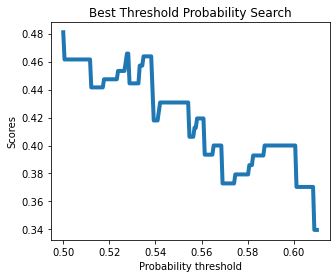

best threshold probability = 0.5
0.48101265822784806
0.48101265822784806


In [ ]:
# 3.11.4.калитбровка
predict_probas = pipe2.predict_proba(X_valid)
# show_proba_calibration_plots(predict_probas, y_valid, 0.1, 0.8, 20)
predict2, threshold_prob = update_predict_by_prob(y_valid, predict_probas, 0.5, 0.61, 200, score='f1', show_chart=True)
print(f1_score(y_valid, predict))
print(f1_score(y_valid, predict2))

In [ ]:
# 3.11.5. результаты
print(70*'-')
print(f'f1 on valid set = {f1_score(y_valid, predict)}')
print(f'f1 on valid set after calibrating = {f1_score(y_valid, predict2)}')
print(confusion_matrix(y_valid, predict2))
print(classification_report(y_valid, predict2))
label = pipeline_steps[-1][0]+'_tuned'
result_dict[label] = (accuracy_score(y_valid, predict2), f1_score(y_valid, predict2), best_params, threshold_prob)

----------------------------------------------------------------------
f1 on valid set = 0.48101265822784806
f1 on valid set after calibrating = 0.48101265822784806
[[40 33]
 [ 8 19]]
              precision    recall  f1-score   support

           0       0.83      0.55      0.66        73
           1       0.37      0.70      0.48        27

    accuracy                           0.59       100
   macro avg       0.60      0.63      0.57       100
weighted avg       0.71      0.59      0.61       100



##### Модель без Purpose стала лучше

### Тренируем финальную модель на всем трейне

In [ ]:

cbc = CatBoostClassifier(cat_features=cat_features,
                         eval_metric=eval_metric,
                         learning_rate = 0.1, 
                         max_depth = 6, 
                         n_estimators = 100, 
                         reg_lambda = 0.7, 
                         scale_pos_weight = 3.2)
cbc.fit(X, y)

0:	learn: 0.7116759	total: 6.75ms	remaining: 668ms
1:	learn: 0.7152039	total: 13.2ms	remaining: 646ms
2:	learn: 0.7120483	total: 17.4ms	remaining: 564ms
3:	learn: 0.7147605	total: 21.2ms	remaining: 509ms
4:	learn: 0.7196668	total: 25ms	remaining: 476ms
5:	learn: 0.7185348	total: 31.4ms	remaining: 492ms
6:	learn: 0.7159333	total: 35.6ms	remaining: 473ms
7:	learn: 0.7132187	total: 39.2ms	remaining: 451ms
8:	learn: 0.7141281	total: 43ms	remaining: 435ms
9:	learn: 0.7141862	total: 47.1ms	remaining: 424ms
10:	learn: 0.7176303	total: 51.3ms	remaining: 415ms
11:	learn: 0.7195784	total: 55.1ms	remaining: 404ms
12:	learn: 0.7208927	total: 58.7ms	remaining: 393ms
13:	learn: 0.7243463	total: 62.8ms	remaining: 386ms
14:	learn: 0.7243375	total: 66.8ms	remaining: 378ms
15:	learn: 0.7248826	total: 70.3ms	remaining: 369ms
16:	learn: 0.7253976	total: 73.9ms	remaining: 361ms
17:	learn: 0.7248213	total: 77.5ms	remaining: 353ms
18:	learn: 0.7262453	total: 81.4ms	remaining: 347ms
19:	learn: 0.7285009	total

In [ ]:
print(classification_report(y, cbc.predict(X)))

              precision    recall  f1-score   support

           0       0.89      0.54      0.67      5387
           1       0.41      0.83      0.55      2113

    accuracy                           0.62      7500
   macro avg       0.65      0.69      0.61      7500
weighted avg       0.76      0.62      0.64      7500



In [ ]:
X_test = df_test.drop('Purpose', axis=1)

for col in feat_12.values:
    X_test.drop(col, axis=1, inplace=True)  

In [ ]:
test_class = cbc.predict(X_test)

In [ ]:
test_class.sum()

1457

In [ ]:
len(test_class)

2500

In [ ]:
to_board = pd.DataFrame(test_class, columns=['prediction'])

In [ ]:
to_board.head()

,prediction
0,1
1,1
2,1
3,0
4,1


In [ ]:
to_board.to_csv('Sitdikov_predictions_final.csv')